In [1]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Add the directory where dynamics.py and utils.py are located to sys.path
module_path = os.path.abspath(os.path.join('../../src'))
if module_path not in sys.path:
    sys.path.append(module_path)

from tqdm import tqdm
from scipy.optimize import approx_fprime
from scipy.linalg import block_diag, solve
from utils import get_form_initial_conditions
from tudatpy.astro.time_conversion import DateTime
from dynamics import SatelliteDynamics, Propagator

In [2]:
# Simulation parameters
dt = 60.0  # Time step [s]
T = 395  # Duration [min]

# Set simulation start (0 TDB seconds since J2000) and end epochs
simulation_start_epoch = DateTime(2000, 1, 1).epoch()
simulation_end_epoch = (T - 1) * dt

T_RMSE = 300  # Index from which the RMSE is calculated
M = 1  # Number of Monte-Carlo simulations
N = 4  # Number of satellites
formation = 1
n_x = 6  # Number of states
n_p = 3  
n_y_1 = 3  # Number of measurements
n_y_2 = 2
n_y_3 = 2
n_y_4 = 2
K = T
W = 2 # Window size [min]

In [4]:
# Initial state vector and get the true state vectors
X_initial = get_form_initial_conditions(formation)
propagator = Propagator(simulation_start_epoch, simulation_end_epoch, dt, X_initial)
X_true = propagator.run().T.reshape(24, 1, T)

Warning, you are using the deprecated (as of tudatpy v0.8) version of the cannonball radiation pressure model, the interface you are using will be dropped from v0.9 onwards. To learn how to convert your code to the new interfaces, and be able to use the powerful new radiation pressure framework, see https://docs.tudat.space/en/latest/_src_user_guide/state_propagation/propagation_setup/translational/radiation_pressure_acceleration.html#backwards-compatibility
Warning, you are using the deprecated (as of tudatpy v0.8) version of the cannonball radiation pressure model, the interface you are using will be dropped from v0.9 onwards. To learn how to convert your code to the new interfaces, and be able to use the powerful new radiation pressure framework, see https://docs.tudat.space/en/latest/_src_user_guide/state_propagation/propagation_setup/translational/radiation_pressure_acceleration.html#backwards-compatibility
Warning, you are using the deprecated (as of tudatpy v0.8) version of the 

In [30]:
# Estimate process noise
X_our_model = np.zeros((24, 1, T))
X_our_model[:, :, 0] = X_initial
for t in range(T - 1):
    X_our_model[:, :, t + 1] = SatelliteDynamics().x_new(dt, X_true[:, :, t])

# Compute the difference between the ground truth and the model after initial conditions
diff = X_true[:, :, 1:] - X_our_model[:, :, 1:]
diff_flattened = diff.T.reshape(-1, 24)

# Calculate the general covariance matrix of the flattened differences
Q = np.cov(diff_flattened, rowvar=False)
pd.DataFrame(Q[:6, :6]), pd.DataFrame(Q[6:12, 6:12]), pd.DataFrame(Q[12:18, 12:18]), pd.DataFrame(Q[18:, 18:]),  

(          0         1         2             3             4             5
 0  0.036080  0.000703  0.004102  1.195747e-03  1.902276e-05  1.927536e-04
 1  0.000703  0.014237  0.000008  2.570505e-05  4.740653e-04  2.248811e-06
 2  0.004102  0.000008  0.038345  8.323556e-05 -2.301550e-06  1.275658e-03
 3  0.001196  0.000026  0.000083  3.973993e-05  7.106129e-07  4.641562e-06
 4  0.000019  0.000474 -0.000002  7.106129e-07  1.580228e-05 -1.602387e-08
 5  0.000193  0.000002  0.001276  4.641562e-06 -1.602387e-08  4.256694e-05,
           0         1         2             3             4             5
 0  0.036056  0.000713  0.004094  1.194969e-03  1.936020e-05  1.924325e-04
 1  0.000713  0.014228  0.000016  2.602309e-05  4.737818e-04  2.537021e-06
 2  0.004094  0.000016  0.038309  8.301450e-05 -2.038132e-06  1.274468e-03
 3  0.001195  0.000026  0.000083  3.971421e-05  7.215151e-07  4.632634e-06
 4  0.000019  0.000474 -0.000002  7.215151e-07  1.579278e-05 -6.727709e-09
 5  0.000192  0.000003  

In [16]:
# Observation noise
r_chief_pos = 1e-1  # [m]
R_chief = np.diag(np.concatenate([r_chief_pos * np.ones(3)])) ** 2
r_deputy_pos = 1e0  # [m]
R_deputies = np.diag(np.concatenate([r_deputy_pos * np.ones(6)])) ** 2
R = block_diag(R_chief, R_deputies)

# Initial deviation noise
p_pos_initial = 1e2  # [m]
p_vel_initial = 1e-2  # [m / s]
P = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0]])

In [17]:
def h_function_chief(x_vec):
    """
    Computes the measurement vector based on the current state vector.
    The measurement vector includes position components.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).
    """
    return x_vec[0:3]

def H_jacobian_chief():
    """
    Computes the Jacobian of the measurement function.
    """
    H = np.zeros((3, 24))
    H[0:3, 0:3] = np.eye(3)
    return H

def h_function_deputy(x_vec):
    """
    Computes the measurement vector based on the current state vector.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).

    Returns:
    y (np.array): The measurement vector of the satellite (range [km]).
    """
    r_chief = x_vec[:3]
    r_deputy1 = x_vec[6:9]
    r_deputy2 = x_vec[12:15]
    r_deputy3 = x_vec[18:21]

    range_deputy1_chief = np.linalg.norm(r_deputy1 - r_chief)
    range_deputy1_deputy2 = np.linalg.norm(r_deputy1 - r_deputy2)
    range_deputy1_deputy3 = np.linalg.norm(r_deputy1 - r_deputy3)
    range_deputy2_chief = np.linalg.norm(r_deputy2 - r_chief)
    range_deputy2_deputy3 = np.linalg.norm(r_deputy2 - r_deputy3)
    range_deputy3_chief = np.linalg.norm(r_deputy3 - r_chief)

    return np.array(
        [
            [range_deputy1_chief],
            [range_deputy1_deputy2],
            [range_deputy1_deputy3],
            [range_deputy2_chief],
            [range_deputy2_deputy3],
            [range_deputy3_chief],
        ]
    )

def H_jacobian_deputy(x_vec):
    """
    Computes the Jacobian of the measurement function.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).

    Returns:
    H (np.array): The Jacobian of the measurement function.
    """
    r_chief = x_vec[:3]
    r_deputy1 = x_vec[6:9]
    r_deputy2 = x_vec[12:15]
    r_deputy3 = x_vec[18:21]

    range_deputy1_chief = np.linalg.norm(r_deputy1 - r_chief)
    range_deputy1_deputy2 = np.linalg.norm(r_deputy1 - r_deputy2)
    range_deputy1_deputy3 = np.linalg.norm(r_deputy1 - r_deputy3)
    range_deputy2_chief = np.linalg.norm(r_deputy2 - r_chief)
    range_deputy2_deputy3 = np.linalg.norm(r_deputy2 - r_deputy3)
    range_deputy3_chief = np.linalg.norm(r_deputy3 - r_chief)

    H = np.zeros((6, 24))
    H[0, 0:3] = -(r_deputy1 - r_chief).reshape(-1) / range_deputy1_chief
    H[0, 6:9] = (r_deputy1 - r_chief).reshape(-1) / range_deputy1_chief
    H[1, 6:9] = (r_deputy1 - r_deputy2).reshape(-1) / range_deputy1_deputy2
    H[1, 12:15] = -(r_deputy1 - r_deputy2).reshape(-1) / range_deputy1_deputy2
    H[2, 6:9] = (r_deputy1 - r_deputy3).reshape(-1) / range_deputy1_deputy3
    H[2, 18:21] = -(r_deputy1 - r_deputy3).reshape(-1) / range_deputy1_deputy3
    H[3, 0:3] = -(r_deputy2 - r_chief).reshape(-1) / range_deputy2_chief
    H[3, 12:15] = (r_deputy2 - r_chief).reshape(-1) / range_deputy2_chief
    H[4, 12:15] = (r_deputy2 - r_deputy3).reshape(-1) / range_deputy2_deputy3
    H[4, 18:21] = -(r_deputy2 - r_deputy3).reshape(-1) / range_deputy2_deputy3
    H[5, 0:3] = -(r_deputy3 - r_chief).reshape(-1) / range_deputy3_chief
    H[5, 18:21] = (r_deputy3 - r_chief).reshape(-1) / range_deputy3_chief
    return H

def h(x_vec):
    return np.concatenate([h_function_chief(x_vec), h_function_deputy(x_vec)])

def H(x):
    return np.concatenate((H_jacobian_chief(), H_jacobian_deputy(x)))

In [18]:
# Simulation setup
np.random.seed(42)
X_est = np.zeros_like(X_true)
initial_dev = np.concatenate(
    (
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
    )
)
X_est[:, :, 0] = X_initial + initial_dev
for t in range(T - 1):
    X_est[:, :, t + 1] = SatelliteDynamics().x_new(dt, X_est[:, :, t])

# Observations
Y = np.zeros((9, 1, T))
for t in range(T):
    Y[:, :, t] = h(X_true[:, :, t]) + np.random.normal(0, np.sqrt(np.diag(R)).reshape((9, 1)), size=(9, 1))
    
dev_chief_initial = np.linalg.norm(X_est[:3, :, :] - X_true[:3, :, :], axis=0).reshape(-1, 1)
dev_deputy1_initial = np.linalg.norm(X_est[6:9, :, :] - X_true[6:9, :, :], axis=0).reshape(-1, 1)
dev_deputy2_initial = np.linalg.norm(X_est[12:15, :, :] - X_true[12:15, :, :], axis=0).reshape(-1, 1)
dev_deputy3_initial = np.linalg.norm(X_est[18:21, :, :] - X_true[18:21, :, :], axis=0).reshape(-1, 1)

In [19]:
def f(x_0, y):
    f_x_0 = 0

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    
    # Iterate over all sliding window time steps
    for k in range(W):    
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Update the cost function with the residuals for self-measurements
        residual = y_1_k - P @ x_1_k
        f_x_0 += 1 / 2 * residual.T @ np.linalg.inv(R_chief) @ residual

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k),  # (4, 1)
        ]

        # Iterate over each pair and update the cost function with the residuals for pairwise measurements
        for i, j, x_i_k, x_j_k, y_ij_k in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)
            f_x_0 += (y_ij_k - d_ij_k) ** 2 / (2 * r_deputy_pos**2)
        
        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
            x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
            x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
            x_4_k = SatelliteDynamics().x_new(dt, x_4_k)

    return f_x_0

def grad_f(x_0, y):
    grad_f_x_0 = np.zeros_like(x_0)

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    F_1_k = np.eye(n_x)
    F_2_k = np.eye(n_x)
    F_3_k = np.eye(n_x)
    F_4_k = np.eye(n_x)
    
    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Compute gradients for the absolute residual terms
        grad_f_x_0[:n_x, :] -= F_1_k.T @ P.T @ np.linalg.inv(R_chief) @ (y_1_k - P @ x_1_k)

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, F_2_k, F_1_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, F_2_k, F_3_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, F_2_k, F_4_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, F_3_k, F_1_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, F_3_k, F_4_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, F_4_k, F_1_k),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the gradient of f(x) with respect to x_i(k) and x_j(k)
            grad_f_x_0[(i - 1) * n_x:i * n_x, :] -= (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_i.T @ P.T @ d_ij_k_vec) / d_ij_k
            grad_f_x_0[(j - 1) * n_x:j * n_x, :] += (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_j.T @ P.T @ d_ij_k_vec) / d_ij_k
        
        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            F_1_old = F_1_k
            F_2_old = F_2_k
            F_3_old = F_3_k
            F_4_old = F_4_k
            x_1_k, F_1_k = SatelliteDynamics().x_new_and_F(dt, x_1_k)
            x_2_k, F_2_k = SatelliteDynamics().x_new_and_F(dt, x_2_k)
            x_3_k, F_3_k = SatelliteDynamics().x_new_and_F(dt, x_3_k)
            x_4_k, F_4_k = SatelliteDynamics().x_new_and_F(dt, x_4_k)
            F_1_k = F_1_k @ F_1_old
            F_2_k = F_2_k @ F_2_old
            F_3_k = F_3_k @ F_3_old
            F_4_k = F_4_k @ F_4_old
            print(F_1_k)

    return grad_f_x_0
    
def numerical_gradient(f, x_0, y, epsilon=1e-6):
    """
    Compute the numerical gradient of f at x_0 using finite differences.
    
    Args:
        f (function): The cost function.
        x_0 (numpy.ndarray): The current state vector.
        STM (numpy.ndarray): State transition matrix.
        y (numpy.ndarray): Observed data.
        epsilon (float): Small perturbation for finite differences.

    Returns:
        numpy.ndarray: Numerical gradient of f at x_0.
    """
    grad = np.zeros_like(x_0)
    for i in range(x_0.size):
        # Create perturbed versions of x_0
        x_0_plus = x_0.copy()
        x_0_minus = x_0.copy()
        
        # Add and subtract epsilon to the i-th component
        x_0_plus[i] += epsilon
        x_0_minus[i] -= epsilon
        
        # Compute the function value for perturbed inputs
        f_plus = f(x_0_plus, y)
        f_minus = f(x_0_minus, y)
        
        # Central difference approximation
        grad[i] = (f_plus - f_minus) / (2 * epsilon)
    
    return grad

# Test grad_f using scipy's approx_fprime
# n = 0
# W = 1
# numerical_grad = numerical_gradient(f, X_true[:, :, n], Y[:, :, n:n + W]).flatten()
# analytical_grad = grad_f(X_true[:, :, n], Y[:, :, n:n + W]).flatten()
# print("Numerical Gradient:", numerical_grad)
# print("Analytical Gradient:", analytical_grad)
# print("Gradient Difference:", numerical_grad - analytical_grad)
# f(X_true[:, :, n], Y[:, :, n:n + W]), grad_f(X_true[:, :, n], Y[:, :, n:n + W])

In [20]:
def f(x_0, y):
    f_x_0 = 0

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    
    # Iterate over all sliding window time steps
    for k in range(W):    
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Update the cost function with the residuals for self-measurements
        residual = y_1_k - P @ x_1_k
        f_x_0 += 1 / 2 * residual.T @ np.linalg.inv(R_chief) @ residual

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k),  # (4, 1)
        ]

        # Iterate over each pair and update the cost function with the residuals for pairwise measurements
        for i, j, x_i_k, x_j_k, y_ij_k in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)
            f_x_0 += (y_ij_k - d_ij_k) ** 2 / (2 * r_deputy_pos**2)

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
            x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
            x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
            x_4_k = SatelliteDynamics().x_new(dt, x_4_k)

    return f_x_0

def grad_f(x_0, y):
    grad_f_x_0 = np.zeros_like(x_0)

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)
    
    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Compute gradients for the absolute residual terms
        grad_f_x_0[:n_x, :] -= STM_t0_1.T @ P.T @ np.linalg.inv(R_chief) @ (y_1_k - P @ x_1_k)

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, STM_t0_2, STM_t0_1),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, STM_t0_2, STM_t0_3),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, STM_t0_2, STM_t0_4),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, STM_t0_3, STM_t0_1),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, STM_t0_3, STM_t0_4),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, STM_t0_4, STM_t0_1),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the gradient of f(x) with respect to x_i(k) and x_j(k)
            grad_f_x_0[(i - 1) * n_x:i * n_x, :] -= (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_i.T @ P.T @ d_ij_k_vec) / d_ij_k
            grad_f_x_0[(j - 1) * n_x:j * n_x, :] += (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_j.T @ P.T @ d_ij_k_vec) / d_ij_k

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            STM_t0_1_old = STM_t0_1
            STM_t0_2_old = STM_t0_2
            STM_t0_3_old = STM_t0_3
            STM_t0_4_old = STM_t0_4
            x_1_k, STM_t0_1 = SatelliteDynamics().x_new_and_F(dt, x_1_k)
            x_2_k, STM_t0_2 = SatelliteDynamics().x_new_and_F(dt, x_2_k)
            x_3_k, STM_t0_3 = SatelliteDynamics().x_new_and_F(dt, x_3_k)
            x_4_k, STM_t0_4 = SatelliteDynamics().x_new_and_F(dt, x_4_k)
            STM_t0_1 = STM_t0_1 @ STM_t0_1_old
            STM_t0_2 = STM_t0_2 @ STM_t0_2_old
            STM_t0_3 = STM_t0_3 @ STM_t0_3_old
            STM_t0_4 = STM_t0_4 @ STM_t0_4_old

    return grad_f_x_0

def hessian_f(x_0, y):
    hessian_f_x_0 = np.zeros((x_0.shape[0], x_0.shape[0]))  # Initialize Hessian matrix
    
    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)

    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_rel_k = y[n_y_1:, :, k]

        # Absolute measurement residuals' Hessian
        hessian_f_x_0[:n_x, :n_x] += STM_t0_1.T @ P.T @ np.linalg.inv(R_chief) @ P @ STM_t0_1 

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, STM_t0_2, STM_t0_1),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, STM_t0_2, STM_t0_3),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, STM_t0_2, STM_t0_4),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, STM_t0_3, STM_t0_1),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, STM_t0_3, STM_t0_4),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, STM_t0_4, STM_t0_1),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the Hessian for x_i(k) and x_j(k)
            idx_i = n_x * (i - 1)
            idx_j = n_x * (j - 1)
            
            hessian_f_x_0[idx_i:idx_i + n_x, idx_i:idx_i + n_x] -= 1 / (r_deputy_pos ** 2) * (STM_t0_i.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_i)
            hessian_f_x_0[idx_i:idx_i + n_x, idx_j:idx_j + n_x] += 1 / (r_deputy_pos ** 2) * (STM_t0_i.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_j)
            hessian_f_x_0[idx_j:idx_j + n_x, idx_i:idx_i + n_x] += 1 / (r_deputy_pos ** 2) * (STM_t0_j.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_i)
            hessian_f_x_0[idx_j:idx_j + n_x, idx_j:idx_j + n_x] -= 1 / (r_deputy_pos ** 2) * (STM_t0_j.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_j)

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            STM_t0_1_old = STM_t0_1
            STM_t0_2_old = STM_t0_2
            STM_t0_3_old = STM_t0_3
            STM_t0_4_old = STM_t0_4
            x_1_k, STM_t0_1 = SatelliteDynamics().x_new_and_F(dt, x_1_k)
            x_2_k, STM_t0_2 = SatelliteDynamics().x_new_and_F(dt, x_2_k)
            x_3_k, STM_t0_3 = SatelliteDynamics().x_new_and_F(dt, x_3_k)
            x_4_k, STM_t0_4 = SatelliteDynamics().x_new_and_F(dt, x_4_k)
            STM_t0_1 = STM_t0_1 @ STM_t0_1_old
            STM_t0_2 = STM_t0_2 @ STM_t0_2_old
            STM_t0_3 = STM_t0_3 @ STM_t0_3_old
            STM_t0_4 = STM_t0_4 @ STM_t0_4_old

    return hessian_f_x_0

In [21]:
def L(x_0, y):
    return f(x_0, y)
    
def grad_L(x_0, y):
    return grad_f(x_0, y)

def hessian_L(x_0, y):
    return hessian_f(x_0, y)

In [22]:
class NKKT:
    def __init__(self, tolerance=1e0, max_iter=20):
        self.grad_tol = tolerance
        self.max_iter = max_iter
        self.i = None
        
        # Storage for results
        self.L_norms = []
        self.grad_L_norms = []

    def solve(self, x_init, Y, x_true):
        x = x_init

        prev_cost_function_value = None
        prev_grad_norm_value = None
        prev_global_error = None

        for iteration in range(self.max_iter):
            # Compute the cost function, gradient of the Lagrangian and Hessian of the Lagrangian
            L_x = L(x, Y)
            grad_L_x = grad_L(x, Y)
            hessian_L_x = hessian_L(x, Y)

            # Convergence tracking
            cost_function_value = L_x[0][0]
            grad_norm_value = np.linalg.norm(grad_L_x)

            # Store the norms
            self.L_norms.append(cost_function_value)
            self.grad_L_norms.append(grad_norm_value)

            if prev_cost_function_value is not None:
                cost_function_change = (cost_function_value - prev_cost_function_value) / abs(prev_cost_function_value) * 100
                grad_norm_change = (grad_norm_value - prev_grad_norm_value) / abs(prev_grad_norm_value) * 100
                global_error_change = (np.linalg.norm(x - x_true) - prev_global_error) / abs(prev_global_error) * 100
            prev_cost_function_value = cost_function_value
            prev_grad_norm_value = grad_norm_value
            prev_global_error = np.linalg.norm(x - x_true)

            # Check convergence and print metrics
            if grad_norm_value < self.grad_tol or iteration + 1 == self.max_iter:
                print(f"STOP on Iteration {iteration}\nCost function = {cost_function_value} ({cost_function_change:.2f}%)\nGradient norm = {grad_norm_value} ({grad_norm_change:.2f}%)\nGlobal relative error = {np.linalg.norm(x - x_true)} ({global_error_change:.2f}%)")
                print(f"Final position relative errors: {np.linalg.norm(x[0:3, :] - x_true[0:3, :])} m, {np.linalg.norm(x[6:9, :] - x_true[6:9, :])} m, {np.linalg.norm(x[12:15, :] - x_true[12:15, :])} m, {np.linalg.norm(x[18:21, :] - x_true[18:21, :])} m\n")
                break
            else:
                if iteration == 0:
                    print(f"Before applying the algorithm\nCost function: {cost_function_value}\nGradient norm: {grad_norm_value}\nGlobal relative error: {np.linalg.norm(x - X_true)}")
                else:
                    print(f"Iteration {iteration}\nCost function: {cost_function_value} ({cost_function_change:.2f}%)\nGradient norm: {grad_norm_value} ({grad_norm_change:.2f}%)\nGlobal relative error: {np.linalg.norm(x - x_true)} ({global_error_change:.2f}%)")
                    
            # Print relative errors 
            print(f"Position relative errors: {np.linalg.norm(x[0:3, :] - x_true[0:3, :])} m, {np.linalg.norm(x[6:9, :] - x_true[6:9, :])} m, {np.linalg.norm(x[12:15, :] - x_true[12:15, :])} m, {np.linalg.norm(x[18:21, :] - x_true[18:21, :])} m\n")
                
            # Solve for the Newton step - this is one iteration
            delta_x = solve(hessian_L_x, -grad_L_x)
            x += delta_x
        
            # Save the current iteration
            self.i = iteration + 1

        return x

In [23]:
def give_me_the_plots(i, L_norms, grad_L_norms):
    iterations = np.arange(0, i + 1)

    # Plot 1
    plt.semilogy(iterations, L_norms, '.-')
    plt.xlabel(r'$m$')
    plt.ylabel(r'$||L(x^{(m)})||_2$')
    plt.show()
    
    # Plot 2
    plt.semilogy(iterations, grad_L_norms, '.-')
    plt.xlabel(r'$m$')
    plt.ylabel(r'$||\nabla L(x^{(m)})||_2$')
    plt.show()

MC run:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------ Monte Carlo run #1 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
Cost function: 2766688490.2623296
Gradient norm: 75893974050.39305
Global relative error: 1892258980.3896575
Position relative errors: 82.78540989608044 m, 181.7491507333766 m, 258.73787052498585 m, 222.8729633755392 m

Iteration 1
Cost function: 37912570.13235938 (-98.63%)
Gradient norm: 454952802.0075324 (-99.40%)
Global relative error: 2482.0218766476783 (527.40%)
Position relative errors: 0.020991599787962095 m, 1441.7796906093984 m, 1065.4648239517253 m, 1716.5328217488764 m

Iteration 2
Cost function: 1596802.4029262508 (-95.79%)
Gradient norm: 58335352.29934663 (-87.18%)
Global relative error: 1214.903993108929 (-51.05%)
Position relative errors: 0.02072116669688833 m, 909.3128300992088 m, 522.0722972806656 m, 613.6628546512682 m

Iteration 3
Cost function: 252975.44699913607 (-84.16%)
Gradient norm: 5015341.624283049 (-91.40%)
Global relative error: 627.2971514739245 (-48.37%)
Position relative errors: 0.023017005424037753 m, 445.2989253739443 m, 2

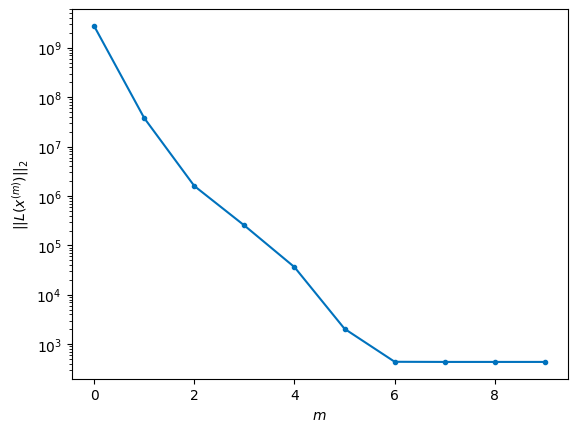

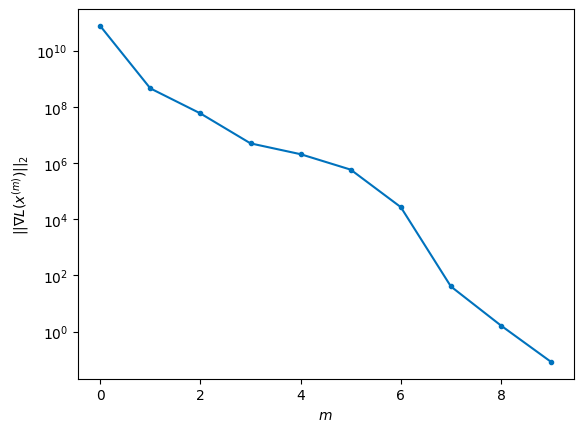


Windows:   0%|          | 1/296 [00:23<1:54:33, 23.30s/it]

9518293.363010868 9519630.305511551 9516107.669370646 9520545.830856787
Before applying the algorithm
Cost function: 435.29935779041455
Gradient norm: 12575.28904017217
Global relative error: 1891878103.8006675
Position relative errors: 0.023143126746623704 m, 0.2513956244124068 m, 0.3629066662212236 m, 0.6049608961264334 m

Iteration 1
Cost function: 434.6745600275638 (-0.14%)
Gradient norm: 3.32457133611373 (-99.97%)
Global relative error: 0.7474701898703694 (-0.24%)
Position relative errors: 0.018478463315441944 m, 0.3460820184103146 m, 0.16624585508540513 m, 0.6410595752186773 m

Iteration 2
Cost function: 434.6745598464914 (-0.00%)
Gradient norm: 1.0683039838517197 (-67.87%)
Global relative error: 0.7474404779550804 (-0.00%)
Position relative errors: 0.018478465786488502 m, 0.3460209208066194 m, 0.1662405230730436 m, 0.6410592957856714 m

STOP on Iteration 3
Cost function = 434.6745598495479 (0.00%)
Gradient norm = 0.6153642597610672 (-42.40%)
Global relative error = 0.74744047533

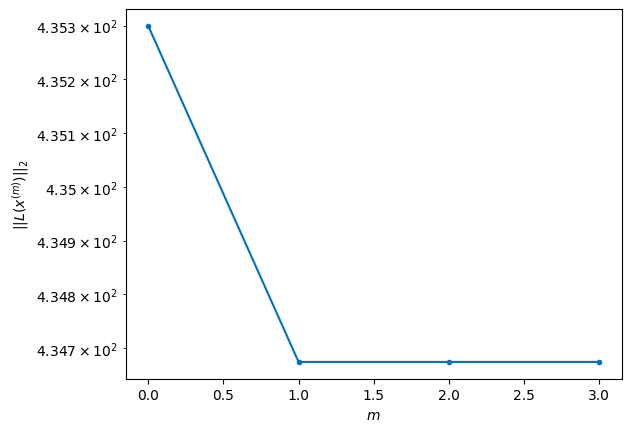

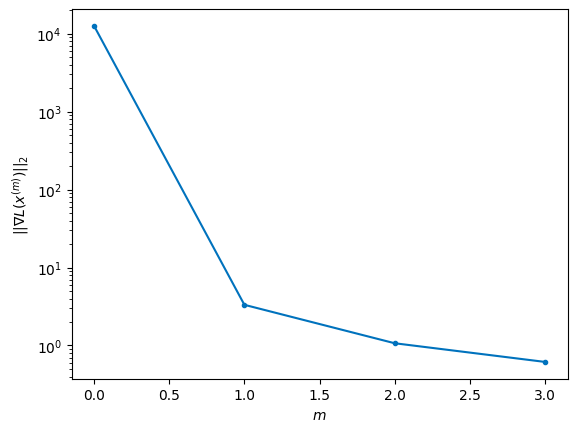


Windows:   1%|          | 2/296 [00:33<1:15:55, 15.50s/it]

Before applying the algorithm
Cost function: 431.8908341019597
Gradient norm: 59574.14080550965
Global relative error: 1891534178.043251
Position relative errors: 0.018440178928456896 m, 0.4098303581292563 m, 0.15187922130908393 m, 0.636230277006666 m

Iteration 1
Cost function: 431.2738342336486 (-0.14%)
Gradient norm: 12.003348485172728 (-99.98%)
Global relative error: 0.4256551576142495 (-44.87%)
Position relative errors: 0.013054258393873669 m, 0.20371148743212955 m, 0.1755025369657709 m, 0.3297118789804511 m

Iteration 2
Cost function: 431.2738339322784 (-0.00%)
Gradient norm: 3.8543405875679677 (-67.89%)
Global relative error: 0.42581232911582373 (0.04%)
Position relative errors: 0.013054256568575147 m, 0.20399633398669612 m, 0.17563371269000558 m, 0.32966885598618334 m

Iteration 3
Cost function: 431.2738338958035 (-0.00%)
Gradient norm: 1.2859285823574798 (-66.64%)
Global relative error: 0.42581234051388744 (0.00%)
Position relative errors: 0.013054254992465333 m, 0.20399632509

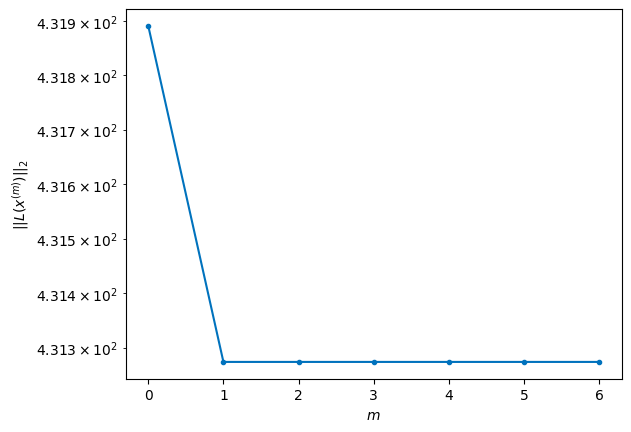

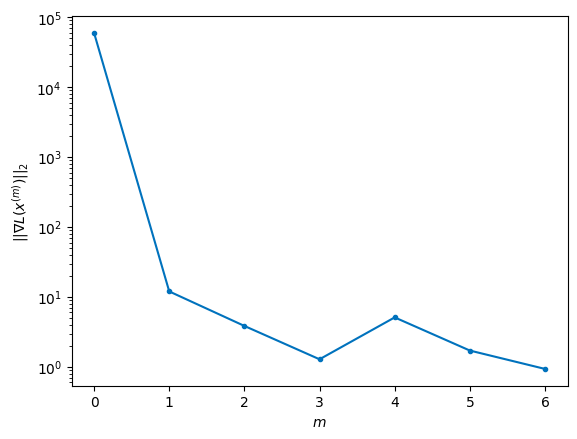


Windows:   1%|          | 3/296 [00:49<1:17:50, 15.94s/it]

Before applying the algorithm
Cost function: 434.5119536669607
Gradient norm: 245300.34065323582
Global relative error: 1891223904.159331
Position relative errors: 0.013034350541581183 m, 0.15304464209250532 m, 0.13935709389316686 m, 0.32411341328971977 m

Iteration 1
Cost function: 433.7911949832527 (-0.17%)
Gradient norm: 6.191827089595433 (-100.00%)
Global relative error: 0.3694451526995617 (-3.99%)
Position relative errors: 0.01740587360764376 m, 0.16464825429253147 m, 0.3007320247964759 m, 0.1365137761750118 m

Iteration 2
Cost function: 433.79119485375764 (-0.00%)
Gradient norm: 7.969915423575292 (28.72%)
Global relative error: 0.3695187482970579 (0.02%)
Position relative errors: 0.01740587520467041 m, 0.1645512290551154 m, 0.3008187970919347 m, 0.136638713968274 m

Iteration 3
Cost function: 433.7911944035571 (-0.00%)
Gradient norm: 8.67835456171469 (8.89%)
Global relative error: 0.36951875095532505 (0.00%)
Position relative errors: 0.01740587641739868 m, 0.16455122617762688 m, 

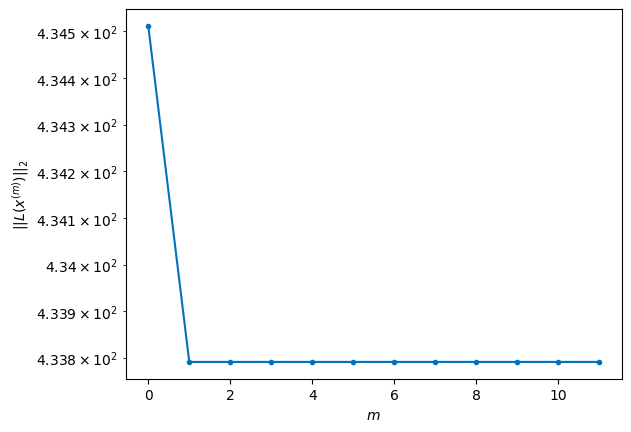

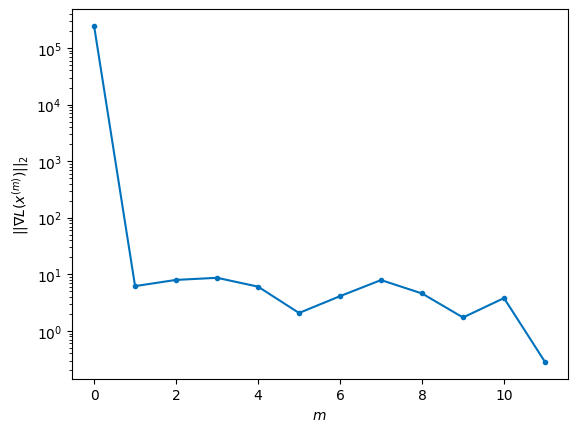


Windows:   1%|▏         | 4/296 [01:16<1:38:30, 20.24s/it]

Before applying the algorithm
Cost function: 433.87513015432705
Gradient norm: 73165.40327313398
Global relative error: 1890948778.4966142
Position relative errors: 0.01735978998568931 m, 0.23780361236756048 m, 0.2746756829020604 m, 0.1292144698789828 m

Iteration 1
Cost function: 433.4647516078242 (-0.09%)
Gradient norm: 2.641173573669868 (-100.00%)
Global relative error: 0.44001864071015806 (13.99%)
Position relative errors: 0.031529549871191345 m, 0.19253411258782402 m, 0.3444811979332036 m, 0.19205107091582588 m

STOP on Iteration 2
Cost function = 433.4647513591604 (-0.00%)
Gradient norm = 0.6265301867308747 (-76.28%)
Global relative error = 0.44002201063184104 (0.00%)
Final position relative errors: 0.03152955068583583 m, 0.19255403214621908 m, 0.34447041015128466 m, 0.192058170633981 m



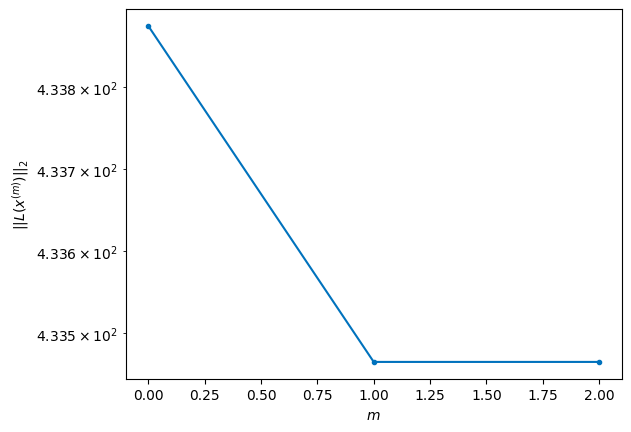

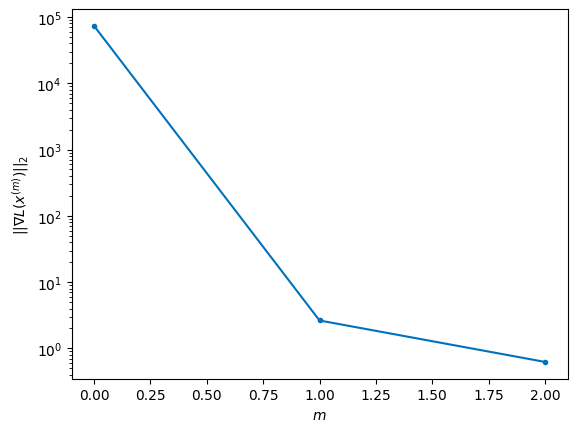


Windows:   2%|▏         | 5/296 [01:23<1:15:13, 15.51s/it]

Before applying the algorithm
Cost function: 432.8978663847177
Gradient norm: 189640.6518593572
Global relative error: 1890710191.4157171
Position relative errors: 0.03099554507106242 m, 0.2630535489801399 m, 0.31828567805724367 m, 0.17756570472894062 m

Iteration 1
Cost function: 432.18865367078166 (-0.16%)
Gradient norm: 5.639000916257997 (-100.00%)
Global relative error: 0.6143752751912273 (36.36%)
Position relative errors: 0.0309029216669274 m, 0.2113514883008223 m, 0.4301012068777664 m, 0.38320105277025884 m

Iteration 2
Cost function: 432.18865386330367 (0.00%)
Gradient norm: 2.516835995137956 (-55.37%)
Global relative error: 0.6144191374046323 (0.01%)
Position relative errors: 0.030902921340049357 m, 0.21132274453254551 m, 0.4302043530891072 m, 0.3831714451393829 m

Iteration 3
Cost function: 432.1886534115174 (-0.00%)
Gradient norm: 3.0139018784783222 (19.75%)
Global relative error: 0.614419147538599 (0.00%)
Position relative errors: 0.03090291908961932 m, 0.2113227478472332 m,

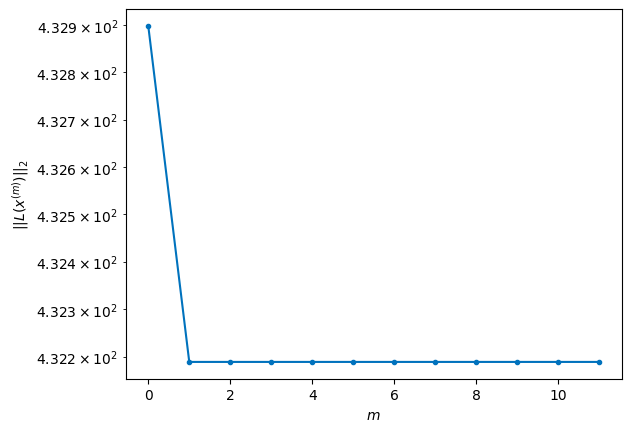

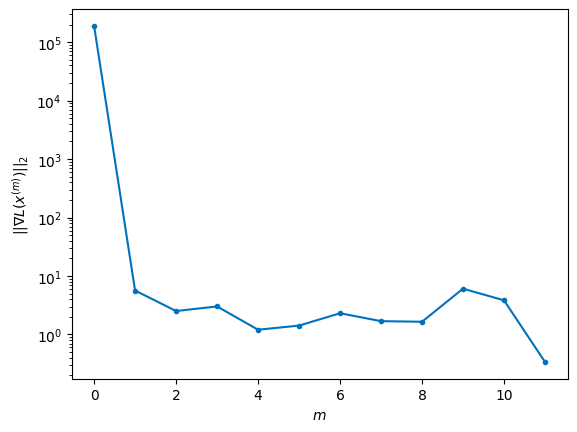


Windows:   2%|▏         | 6/296 [01:49<1:31:26, 18.92s/it]

Before applying the algorithm
Cost function: 430.05996200074867
Gradient norm: 304213.8288744204
Global relative error: 1890509404.5666742
Position relative errors: 0.030523324610843353 m, 0.25079575050218833 m, 0.40489541311115707 m, 0.3706163452843371 m

Iteration 1
Cost function: 429.4962260686355 (-0.13%)
Gradient norm: 1.6446907535959812 (-100.00%)
Global relative error: 0.9033875248673507 (49.50%)
Position relative errors: 0.04383907745129568 m, 0.5252724216956196 m, 0.5487210841765526 m, 0.4870099200071653 m

STOP on Iteration 2
Cost function = 429.49622627908684 (0.00%)
Gradient norm = 0.6152884349906628 (-62.59%)
Global relative error = 0.9034305654020425 (0.00%)
Final position relative errors: 0.04383907760689862 m, 0.5253339198334479 m, 0.5487043741758104 m, 0.4870422530246729 m



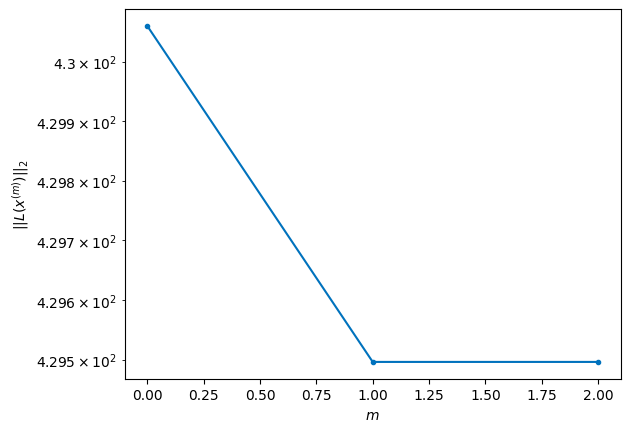

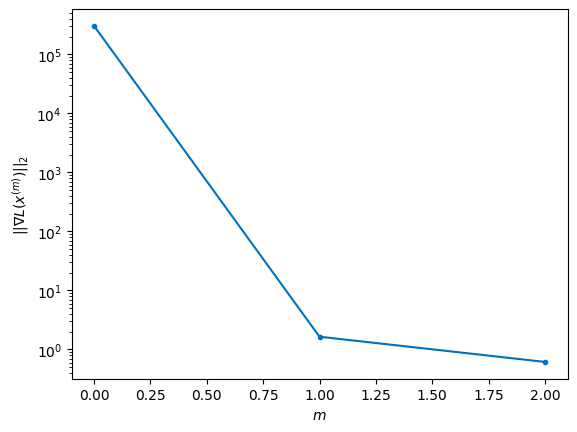


Windows:   2%|▏         | 7/296 [01:55<1:11:39, 14.88s/it]

Before applying the algorithm
Cost function: 431.96996719375915
Gradient norm: 57510.44735382014
Global relative error: 1890347546.7960548
Position relative errors: 0.042810283379817425 m, 0.562025062493186 m, 0.5235110826724362 m, 0.4717774294156695 m

Iteration 1
Cost function: 431.82198394143694 (-0.03%)
Gradient norm: 2.0879840955788014 (-100.00%)
Global relative error: 1.1217620893830045 (24.31%)
Position relative errors: 0.0419637920157623 m, 0.630273250509815 m, 0.7456469184241844 m, 0.5507747571972186 m

Iteration 2
Cost function: 431.82198399297823 (0.00%)
Gradient norm: 5.340547395747105 (155.78%)
Global relative error: 1.121773757961869 (0.00%)
Position relative errors: 0.041963781872715405 m, 0.6302768076784001 m, 0.7456577358440571 m, 0.5507798079230042 m

Iteration 3
Cost function: 431.8219841543426 (0.00%)
Gradient norm: 3.961890823027605 (-25.81%)
Global relative error: 1.1217737362589681 (-0.00%)
Position relative errors: 0.04196379132045581 m, 0.6302767946289846 m, 0.

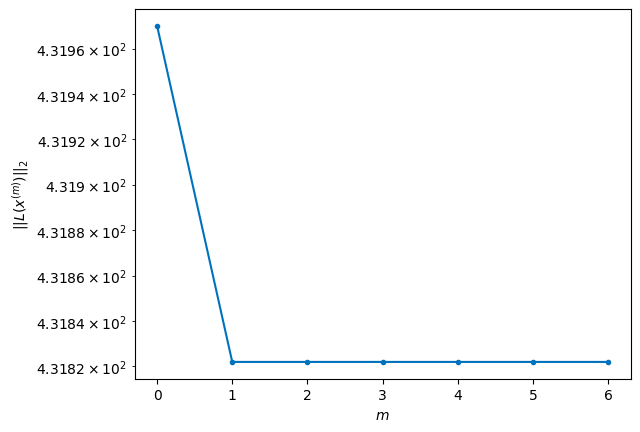

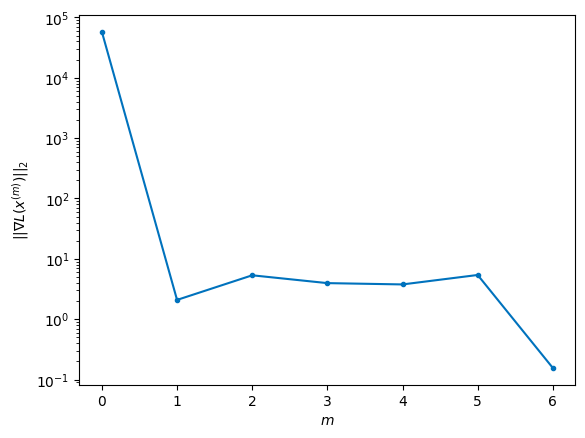


Windows:   3%|▎         | 8/296 [02:11<1:12:43, 15.15s/it]

Before applying the algorithm
Cost function: 432.4492110275967
Gradient norm: 315980.81542268035
Global relative error: 1890225611.28623
Position relative errors: 0.04106127893805544 m, 0.6669171560736833 m, 0.7153246496787699 m, 0.5314856804704073 m

Iteration 1
Cost function: 432.23517235895366 (-0.05%)
Gradient norm: 1.6593824270979143 (-100.00%)
Global relative error: 1.3317061292576935 (19.56%)
Position relative errors: 0.04191088809060398 m, 0.7319943652135072 m, 0.8932544537883091 m, 0.6617874489311534 m

STOP on Iteration 2
Cost function = 432.2351723392944 (-0.00%)
Gradient norm = 0.7675452304901135 (-53.75%)
Global relative error = 1.3317103197134599 (0.00%)
Final position relative errors: 0.04191088697833893 m, 0.7319846798853524 m, 0.8932651979933345 m, 0.661792091908406 m



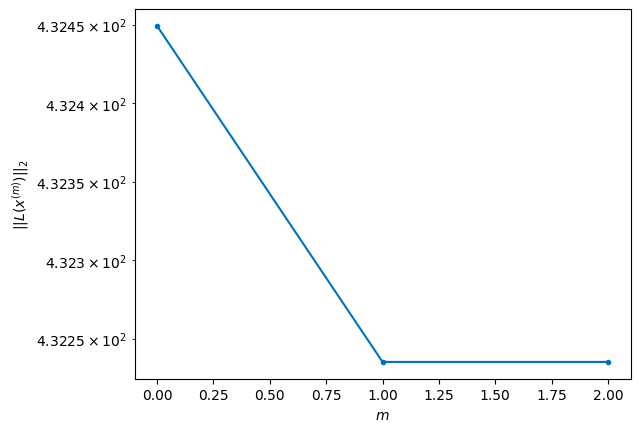

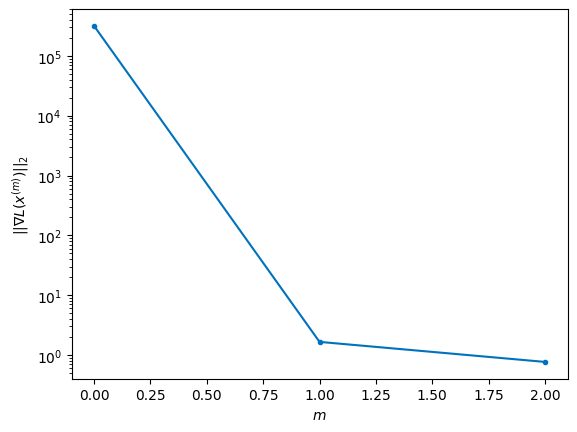


Windows:   3%|▎         | 9/296 [02:18<1:00:32, 12.66s/it]

Before applying the algorithm
Cost function: 428.7133658096029
Gradient norm: 220526.8686481819
Global relative error: 1890144441.9019425
Position relative errors: 0.04117543664561501 m, 0.7718809504030224 m, 0.8568283787439174 m, 0.6377141147217391 m

Iteration 1
Cost function: 427.99584694521343 (-0.17%)
Gradient norm: 18.520811008607964 (-99.99%)
Global relative error: 1.5652116674450058 (18.72%)
Position relative errors: 0.05431253698337107 m, 0.5529742374983936 m, 1.1928399828425298 m, 0.8475172204821542 m

STOP on Iteration 2
Cost function = 427.99584679518097 (-0.00%)
Gradient norm = 0.31278565708121786 (-98.31%)
Global relative error = 1.5653164958707033 (0.01%)
Final position relative errors: 0.054312537503230826 m, 0.5529995962387221 m, 1.1929138495102969 m, 0.8475903094573096 m



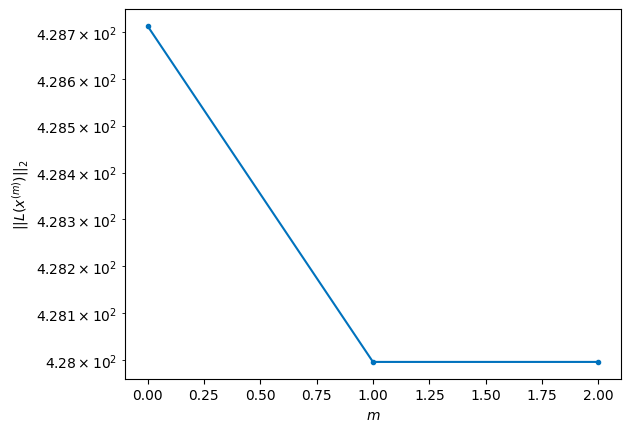

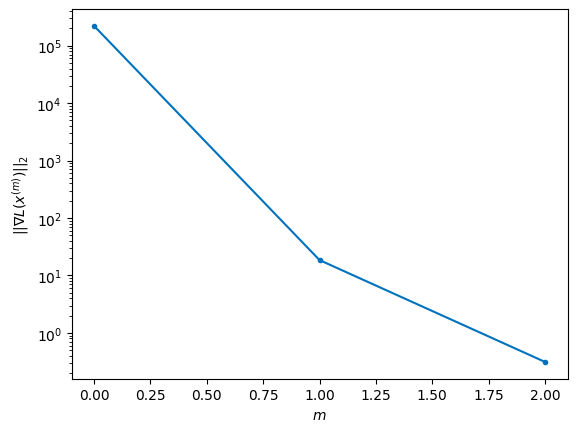


Windows:   3%|▎         | 10/296 [02:26<52:53, 11.10s/it] 

Before applying the algorithm
Cost function: 430.8196052028141
Gradient norm: 75000.68260184547
Global relative error: 1890104727.4736576
Position relative errors: 0.052977269153966694 m, 0.5617084593222416 m, 1.1282114321393273 m, 0.8081020412873198 m

Iteration 1
Cost function: 430.4197602315759 (-0.09%)
Gradient norm: 10.269180171494046 (-99.99%)
Global relative error: 1.7782722915611417 (18.70%)
Position relative errors: 0.048348253075294875 m, 0.7234826630589488 m, 1.3717691726723569 m, 0.8687526156272035 m

Iteration 2
Cost function: 430.419760552631 (0.00%)
Gradient norm: 4.411024761385662 (-57.05%)
Global relative error: 1.778362924469118 (0.01%)
Position relative errors: 0.04834826213407806 m, 0.7235344993261855 m, 1.3718293238702992 m, 0.8687999856941124 m

Iteration 3
Cost function: 430.41976055231163 (-0.00%)
Gradient norm: 5.666201717717793 (28.46%)
Global relative error: 1.7783629360451707 (0.00%)
Position relative errors: 0.0483482599198328 m, 0.723534508710732 m, 1.3718

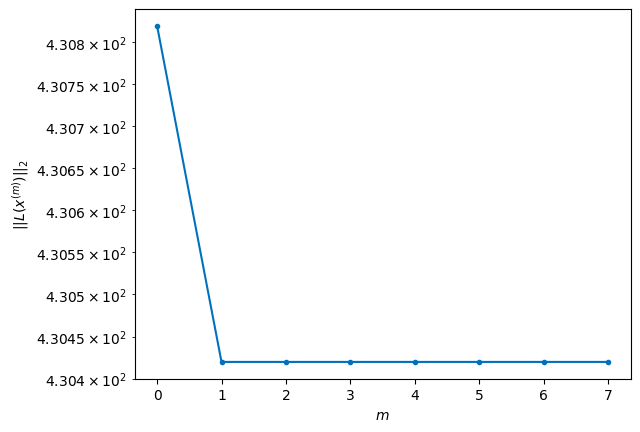

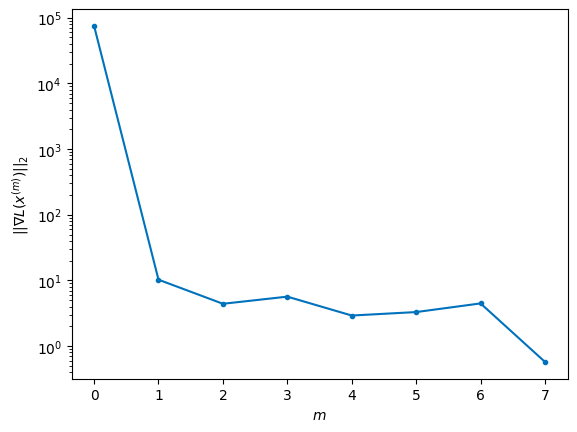


Windows:   4%|▎         | 11/296 [02:43<1:02:07, 13.08s/it]

Before applying the algorithm
Cost function: 431.17150750619606
Gradient norm: 46077.83689500486
Global relative error: 1890106985.7102075
Position relative errors: 0.04718581178976598 m, 0.6972729706621285 m, 1.3024563098192727 m, 0.8275623452125483 m

STOP on Iteration 1
Cost function = 430.9917853834909 (-0.04%)
Gradient norm = 0.629465206770558 (-100.00%)
Global relative error = 1.8576820644929803 (9.66%)
Final position relative errors: 0.04574492996603783 m, 0.712281735524433 m, 1.4686441759706057 m, 0.8857892040658746 m



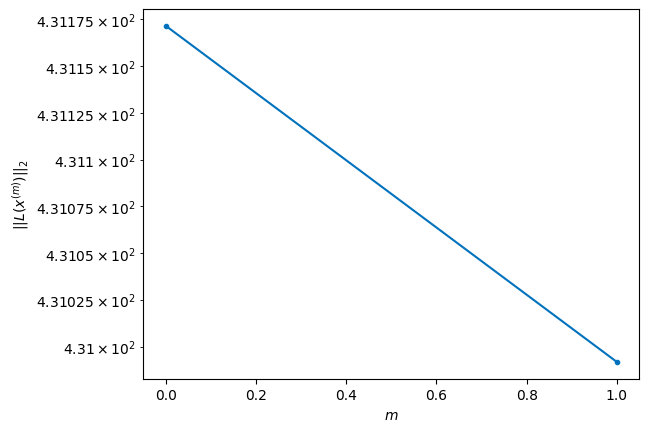

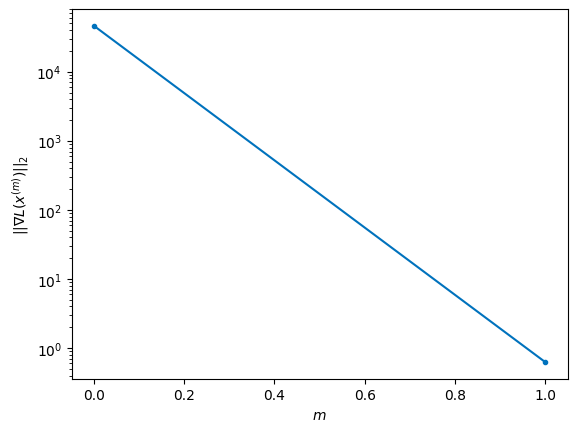


Windows:   4%|▍         | 12/296 [02:49<50:36, 10.69s/it]  

Before applying the algorithm
Cost function: 425.763130463095
Gradient norm: 119657.42726236935
Global relative error: 1890151558.9789069
Position relative errors: 0.044667948983380765 m, 0.693765309910871 m, 1.3919757487118376 m, 0.8402258238784003 m

Iteration 1
Cost function: 424.7051416356062 (-0.25%)
Gradient norm: 18.999917476471694 (-99.98%)
Global relative error: 2.203143263137429 (24.59%)
Position relative errors: 0.057277621400477347 m, 0.7028575300425851 m, 1.5988445083491292 m, 1.3417294447873438 m

Iteration 2
Cost function: 424.70514164232895 (0.00%)
Gradient norm: 1.000840625798255 (-94.73%)
Global relative error: 2.203144232669621 (0.00%)
Position relative errors: 0.05727762063818955 m, 0.7028582478331403 m, 1.598820506839479 m, 1.3417592610000653 m

Iteration 3
Cost function: 424.70514103250684 (-0.00%)
Gradient norm: 1.2974831691320763 (29.64%)
Global relative error: 2.203144227303057 (-0.00%)
Position relative errors: 0.05727761805149022 m, 0.7028582559893928 m, 1.59

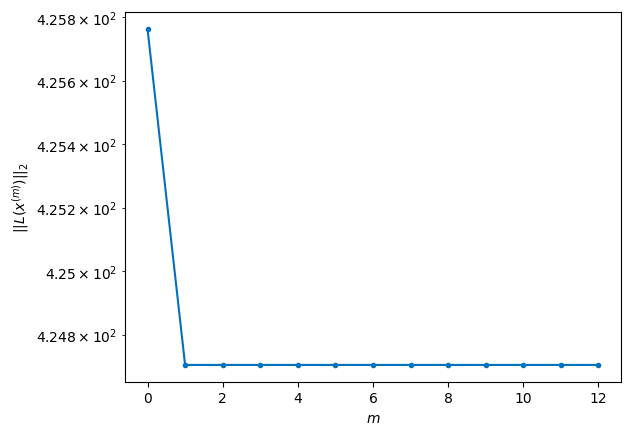

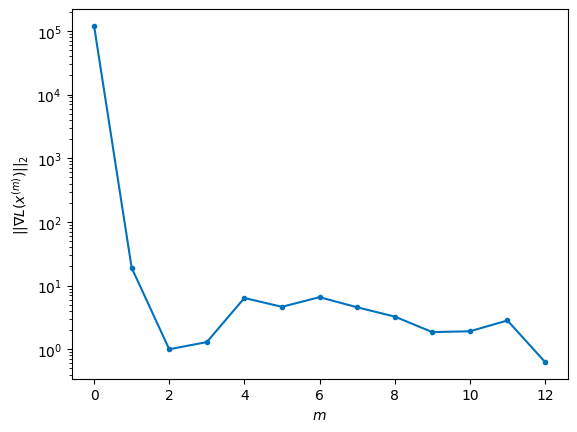


Windows:   4%|▍         | 13/296 [03:16<1:13:46, 15.64s/it]

Before applying the algorithm
Cost function: 424.51163981555845
Gradient norm: 197401.61498391465
Global relative error: 1890238612.230371
Position relative errors: 0.05589027007270308 m, 0.7014665668028947 m, 1.503700047844367 m, 1.2710712762622216 m

Iteration 1
Cost function: 423.8998594237716 (-0.14%)
Gradient norm: 12.385946028310046 (-99.99%)
Global relative error: 2.0883491816152535 (-0.12%)
Position relative errors: 0.06466616324021533 m, 0.9125571543893145 m, 1.3420646952938748 m, 1.3126743802592098 m

Iteration 2
Cost function: 423.8998591294662 (-0.00%)
Gradient norm: 4.0088392244777795 (-67.63%)
Global relative error: 2.0883520827425275 (0.00%)
Position relative errors: 0.06466616222516551 m, 0.9125907847944232 m, 1.342037720279612 m, 1.3126831944531383 m

Iteration 3
Cost function: 423.8998589743069 (-0.00%)
Gradient norm: 4.45716375355676 (11.18%)
Global relative error: 2.0883520787377754 (-0.00%)
Position relative errors: 0.06466616452046976 m, 0.912590794264896 m, 1.342

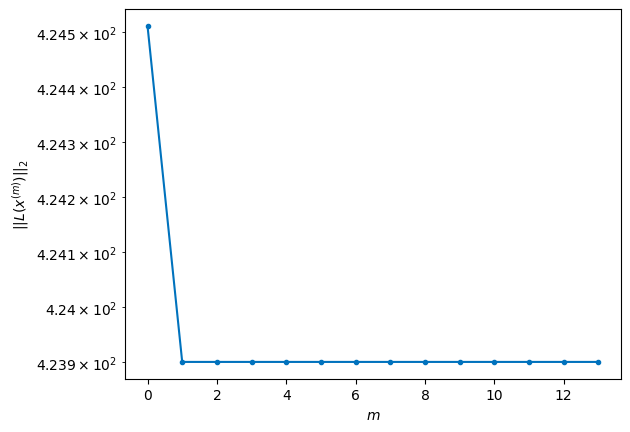

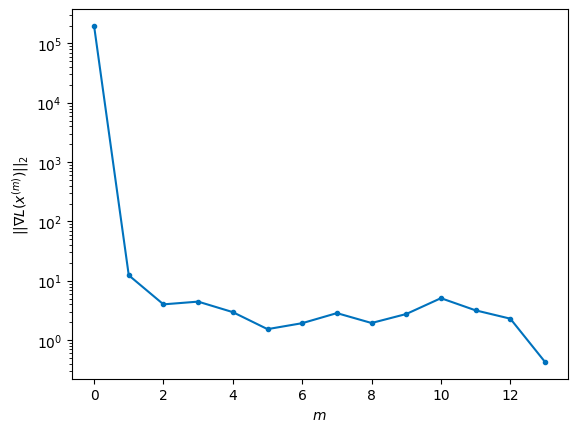


Windows:   5%|▍         | 14/296 [03:46<1:34:47, 20.17s/it]

Before applying the algorithm
Cost function: 426.66825631447216
Gradient norm: 87173.46682819651
Global relative error: 1890368108.8980148
Position relative errors: 0.06287349896811442 m, 0.9499152630999672 m, 1.2722803592175025 m, 1.250217591586757 m

Iteration 1
Cost function: 426.24125731646626 (-0.10%)
Gradient norm: 6.1578932377803435 (-99.99%)
Global relative error: 2.004491963801157 (-0.86%)
Position relative errors: 0.05791701702130369 m, 0.7438686516072411 m, 1.3163578333146584 m, 1.3147193751716895 m

Iteration 2
Cost function: 426.24125700145106 (-0.00%)
Gradient norm: 2.1476619692514043 (-65.12%)
Global relative error: 2.004474638364429 (-0.00%)
Position relative errors: 0.05791701338551823 m, 0.7438677839766702 m, 1.316337301365884 m, 1.3147140084775029 m

Iteration 3
Cost function: 426.2412569382636 (-0.00%)
Gradient norm: 3.4473522346143093 (60.52%)
Global relative error: 2.0044746328681304 (-0.00%)
Position relative errors: 0.05791701651619904 m, 0.7438677832472419 m, 1

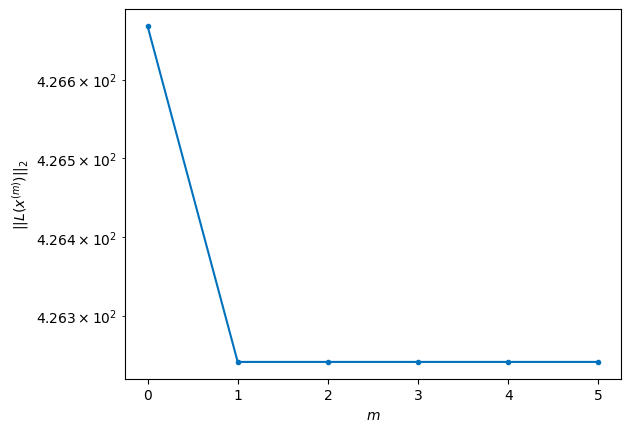

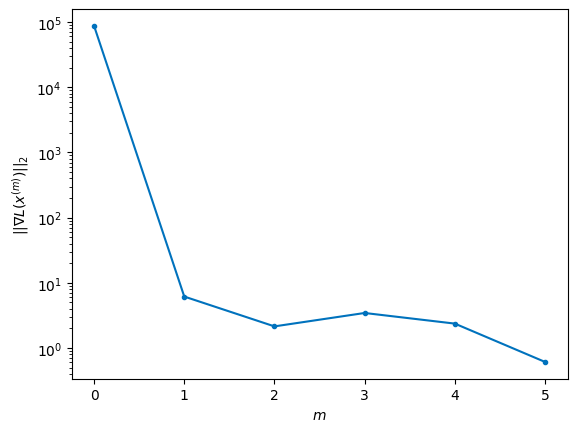


Windows:   5%|▌         | 15/296 [04:01<1:26:28, 18.46s/it]

Before applying the algorithm
Cost function: 429.23845385157927
Gradient norm: 100500.17045950251
Global relative error: 1890539831.1695502
Position relative errors: 0.05628864834068114 m, 0.7847623890860751 m, 1.2334429692238649 m, 1.2438265627750968 m

Iteration 1
Cost function: 428.42160924875907 (-0.19%)
Gradient norm: 16.091024798129236 (-99.98%)
Global relative error: 1.4625655518872223 (-23.84%)
Position relative errors: 0.05245231249134526 m, 0.7990696373436422 m, 0.7645535252387078 m, 0.9556606640783337 m

Iteration 2
Cost function: 428.421609728041 (0.00%)
Gradient norm: 4.274324277337882 (-73.44%)
Global relative error: 1.4625853895297158 (0.00%)
Position relative errors: 0.05245232861425546 m, 0.7991182554876174 m, 0.7645403271023408 m, 0.955660929326157 m

Iteration 3
Cost function: 428.42161009710463 (0.00%)
Gradient norm: 2.9192836086613383 (-31.70%)
Global relative error: 1.4625854124268272 (0.00%)
Position relative errors: 0.052452323228233795 m, 0.7991182618957946 m, 

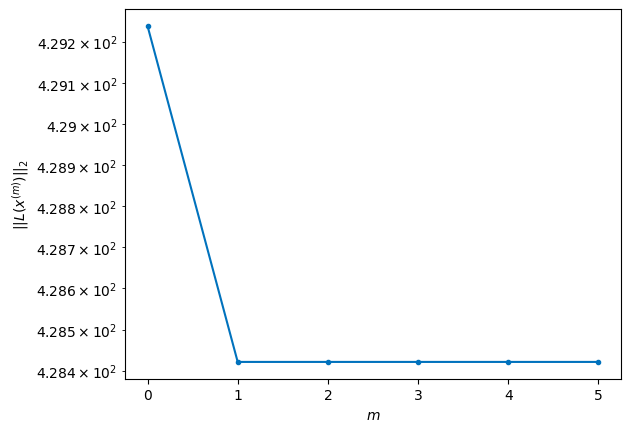

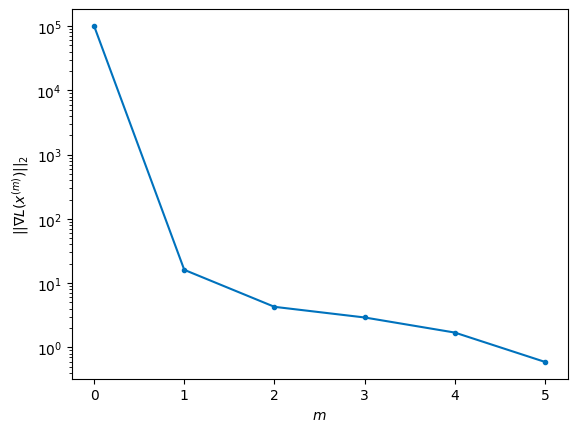


Windows:   5%|▌         | 16/296 [04:15<1:19:41, 17.08s/it]

Before applying the algorithm
Cost function: 425.7364704661376
Gradient norm: 52168.60632460007
Global relative error: 1890753349.9970176
Position relative errors: 0.05103020865997475 m, 0.8474056191493792 m, 0.7375632536007476 m, 0.917101935387629 m

Iteration 1
Cost function: 424.695543197506 (-0.24%)
Gradient norm: 16.829356156369194 (-99.97%)
Global relative error: 1.5624523473067753 (7.67%)
Position relative errors: 0.04277769794159639 m, 1.200309337095064 m, 0.6831004074518952 m, 0.7294222247546813 m

Iteration 2
Cost function: 424.6955428365953 (-0.00%)
Gradient norm: 5.016998281267468 (-70.19%)
Global relative error: 1.5626091994531297 (0.01%)
Position relative errors: 0.04277768693920155 m, 1.2004646973896922 m, 0.6831537486625858 m, 0.729452598256273 m

STOP on Iteration 3
Cost function = 424.6955431323965 (0.00%)
Gradient norm = 0.47685579397132927 (-90.50%)
Global relative error = 1.5626091922556218 (-0.00%)
Final position relative errors: 0.042777699460959065 m, 1.20046470

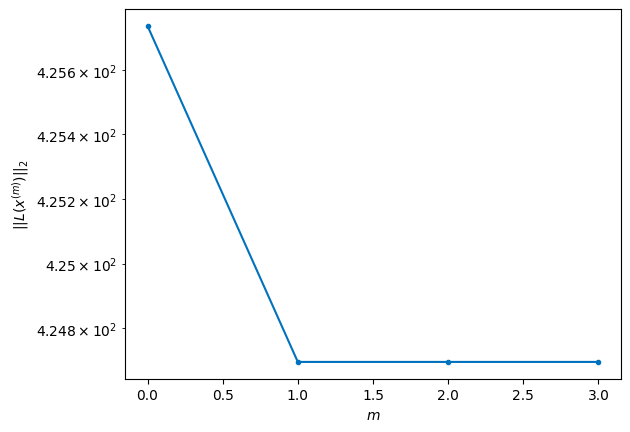

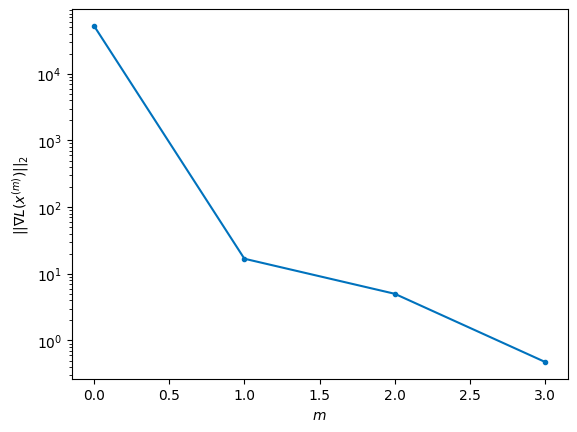


Windows:   6%|▌         | 17/296 [04:23<1:07:21, 14.49s/it]

Before applying the algorithm
Cost function: 423.9858415842119
Gradient norm: 114713.16818089165
Global relative error: 1891008045.2873254
Position relative errors: 0.04176466424841049 m, 1.2324418305298446 m, 0.7077250085609808 m, 0.7159954641394638 m

Iteration 1
Cost function: 423.3209037622593 (-0.16%)
Gradient norm: 9.864039523688627 (-99.99%)
Global relative error: 1.172547159662584 (-26.34%)
Position relative errors: 0.035466209540153344 m, 0.9611170594128307 m, 0.5463593823062197 m, 0.38904126435281056 m

STOP on Iteration 2
Cost function = 423.3209038076111 (0.00%)
Gradient norm = 0.27772477627250386 (-97.18%)
Global relative error = 1.1724838607331298 (-0.01%)
Final position relative errors: 0.03546620979824918 m, 0.9610618659288267 m, 0.5463341803927211 m, 0.3890222321891463 m



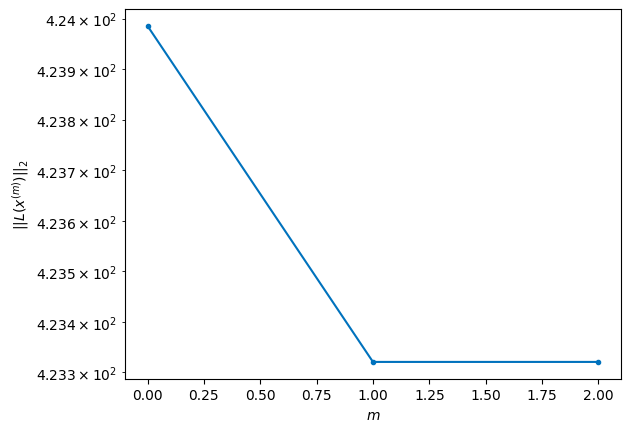

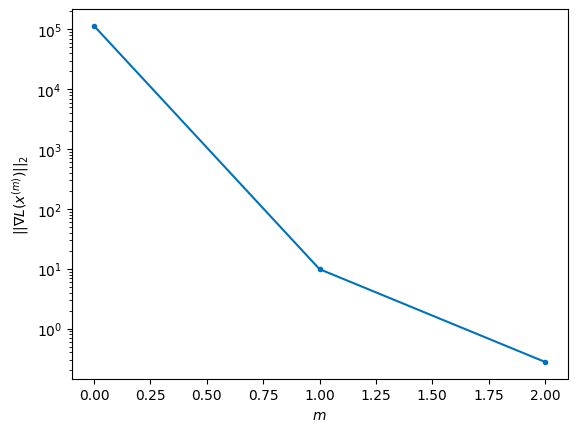


Windows:   6%|▌         | 18/296 [04:31<57:25, 12.40s/it]  

Before applying the algorithm
Cost function: 432.54425796767316
Gradient norm: 124271.55633853178
Global relative error: 1891303092.5403707
Position relative errors: 0.03440954352547265 m, 0.9847723552538321 m, 0.5689668283652947 m, 0.378170007348894 m

Iteration 1
Cost function: 431.580533892421 (-0.22%)
Gradient norm: 27.08644002104829 (-99.98%)
Global relative error: 1.7053373302792587 (42.23%)
Position relative errors: 0.02049754573015901 m, 1.4653962028556728 m, 0.7269155661961786 m, 0.4816246355335191 m

STOP on Iteration 2
Cost function = 431.58053406196916 (0.00%)
Gradient norm = 0.45036667062416175 (-98.34%)
Global relative error = 1.705485471891937 (0.01%)
Final position relative errors: 0.020497545403176675 m, 1.4655228561758573 m, 0.7269671096237638 m, 0.48168602396226246 m



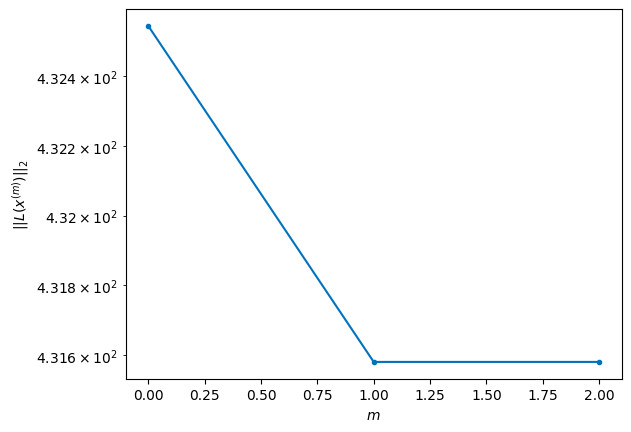

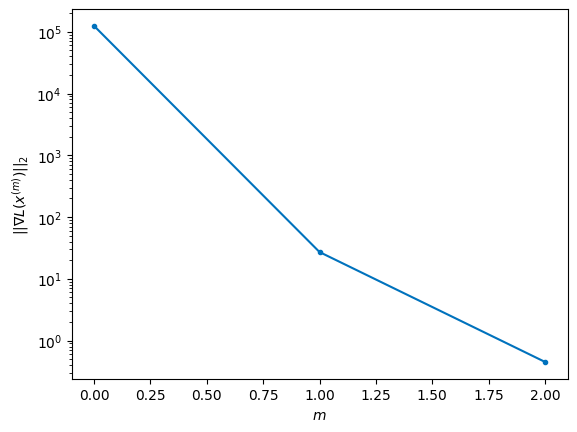


Windows:   6%|▋         | 19/296 [04:37<49:27, 10.71s/it]

Before applying the algorithm
Cost function: 431.73653676863336
Gradient norm: 79923.07622711484
Global relative error: 1891637444.9284942
Position relative errors: 0.019798664843622124 m, 1.468825172007198 m, 0.7524138743542287 m, 0.48270117146512037 m

Iteration 1
Cost function: 430.7096021431404 (-0.24%)
Gradient norm: 14.47921069369519 (-99.98%)
Global relative error: 1.820303793979333 (5.86%)
Position relative errors: 0.026743536034546503 m, 1.4898579404579952 m, 0.8944705850145515 m, 0.5413278259687295 m

STOP on Iteration 2
Cost function = 430.7096024682542 (0.00%)
Gradient norm = 0.35733636212739694 (-97.53%)
Global relative error = 1.8202952935055972 (-0.00%)
Final position relative errors: 0.02674353113707594 m, 1.4898484757219224 m, 0.8944730343140317 m, 0.541321243874341 m



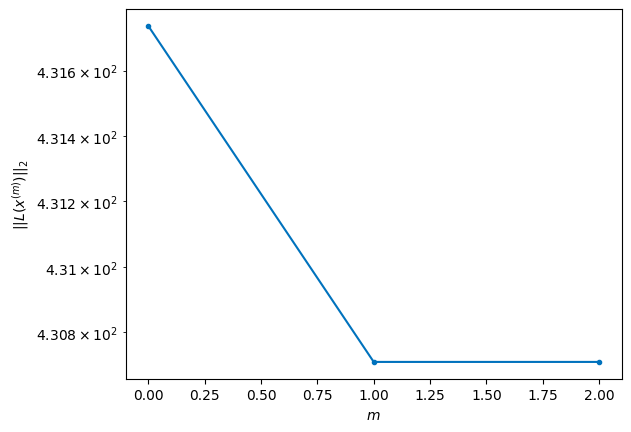

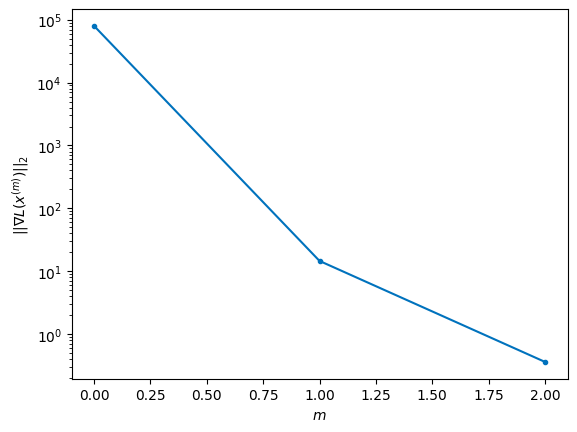


Windows:   7%|▋         | 20/296 [04:44<43:46,  9.52s/it]

Before applying the algorithm
Cost function: 428.8566614023859
Gradient norm: 93987.38975495288
Global relative error: 1892009862.6972156
Position relative errors: 0.025795517325793476 m, 1.503306379053146 m, 0.8988611786642339 m, 0.5202257761283836 m

Iteration 1
Cost function: 428.42923299119195 (-0.10%)
Gradient norm: 5.367657982111031 (-99.99%)
Global relative error: 1.742001955172371 (-4.67%)
Position relative errors: 0.01749596811648845 m, 1.3994840888459537 m, 0.9720705002833918 m, 0.36164558590042534 m

Iteration 2
Cost function: 428.42923291909864 (-0.00%)
Gradient norm: 1.8481736989086448 (-65.57%)
Global relative error: 1.7420070646380752 (0.00%)
Position relative errors: 0.01749597276495774 m, 1.399483549680388 m, 0.9720783756023686 m, 0.3616511155438485 m

Iteration 3
Cost function: 428.42923267732476 (-0.00%)
Gradient norm: 2.5472795101227326 (37.83%)
Global relative error: 1.742007061504545 (-0.00%)
Position relative errors: 0.0174959711890525 m, 1.3994835442800029 m, 0.

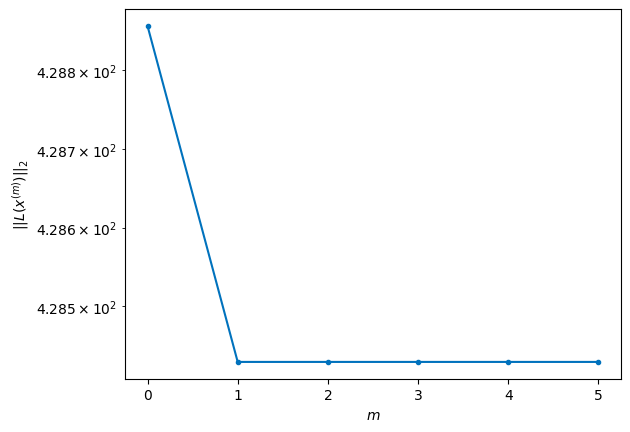

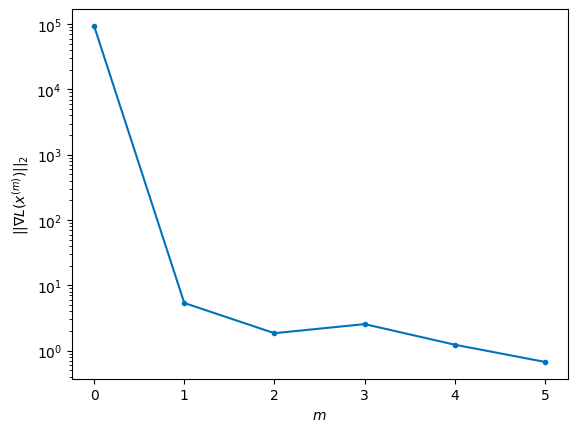


Windows:   7%|▋         | 21/296 [04:57<48:08, 10.51s/it]

Before applying the algorithm
Cost function: 429.9382089108376
Gradient norm: 183123.5521683258
Global relative error: 1892418888.6621122
Position relative errors: 0.016910458407455763 m, 1.409378425773408 m, 0.9728016324984329 m, 0.35200506413781385 m

Iteration 1
Cost function: 429.5682187722146 (-0.09%)
Gradient norm: 2.992297002569184 (-100.00%)
Global relative error: 1.7380470392452374 (-0.59%)
Position relative errors: 0.014286904476560534 m, 1.3399770503923736 m, 1.0559767364775143 m, 0.3316286766759503 m

Iteration 2
Cost function: 429.56821876339126 (-0.00%)
Gradient norm: 2.3213960998275662 (-22.42%)
Global relative error: 1.7380549726044203 (0.00%)
Position relative errors: 0.014286903415925247 m, 1.339981593562378 m, 1.0559820664617996 m, 0.3316349260350593 m

Iteration 3
Cost function: 429.5682186929098 (-0.00%)
Gradient norm: 3.1971832048033995 (37.73%)
Global relative error: 1.738054970211832 (-0.00%)
Position relative errors: 0.0142868966175429 m, 1.3399815938395971 m, 

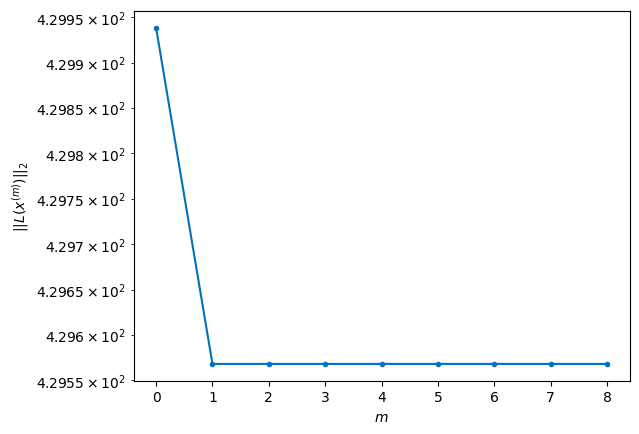

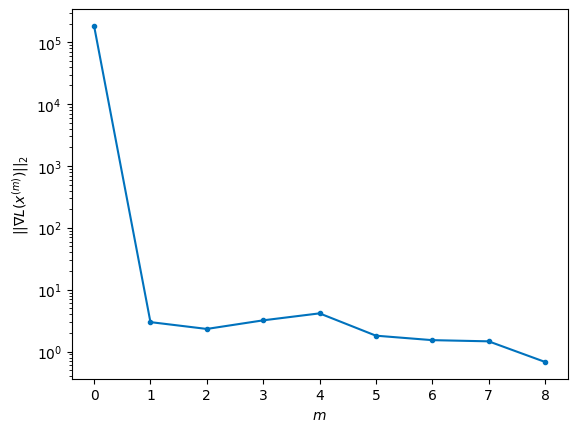


Windows:   7%|▋         | 22/296 [05:16<59:49, 13.10s/it]

Before applying the algorithm
Cost function: 428.33494019584083
Gradient norm: 130817.76277881631
Global relative error: 1892862869.1980724
Position relative errors: 0.01383110821061745 m, 1.3431842700069199 m, 1.0571043585121016 m, 0.3307682537771344 m

Iteration 1
Cost function: 428.02497207365417 (-0.07%)
Gradient norm: 1.6654085725969072 (-100.00%)
Global relative error: 1.7509306320396267 (0.57%)
Position relative errors: 0.015237797890736053 m, 1.3933528384523948 m, 1.0051306453817304 m, 0.33735116215770805 m

STOP on Iteration 2
Cost function = 428.0249718122484 (-0.00%)
Gradient norm = 0.9099984565671306 (-45.36%)
Global relative error = 1.7509365922271798 (0.00%)
Final position relative errors: 0.015237792049802594 m, 1.3933577264713515 m, 1.0051340857347142 m, 0.3373516578564337 m



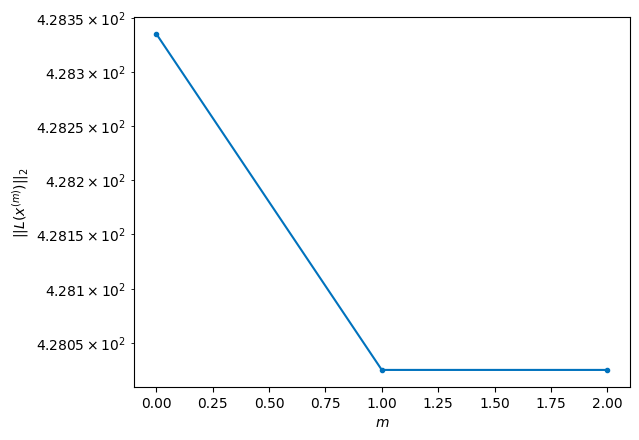

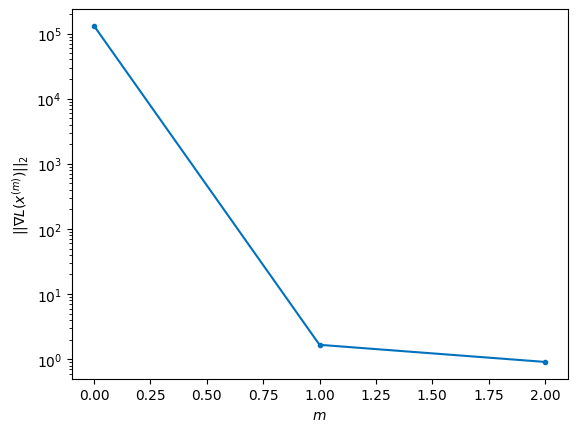


Windows:   8%|▊         | 23/296 [05:23<51:05, 11.23s/it]

Before applying the algorithm
Cost function: 426.83630025654
Gradient norm: 187002.3185631283
Global relative error: 1893339941.4790566
Position relative errors: 0.014817745013300644 m, 1.3870906820453668 m, 1.001677922273358 m, 0.329386527846106 m

Iteration 1
Cost function: 426.4414280185378 (-0.09%)
Gradient norm: 4.037800819384872 (-100.00%)
Global relative error: 1.6501466090594745 (-5.30%)
Position relative errors: 0.010861137196603724 m, 1.2610944227154706 m, 1.0130453521180969 m, 0.3259532919781016 m

STOP on Iteration 2
Cost function = 426.44142763109505 (-0.00%)
Gradient norm = 0.9845803694422267 (-75.62%)
Global relative error = 1.6501375917591856 (-0.00%)
Final position relative errors: 0.010861152771085928 m, 1.2610828749341536 m, 1.0130452675211767 m, 0.325952581697237 m



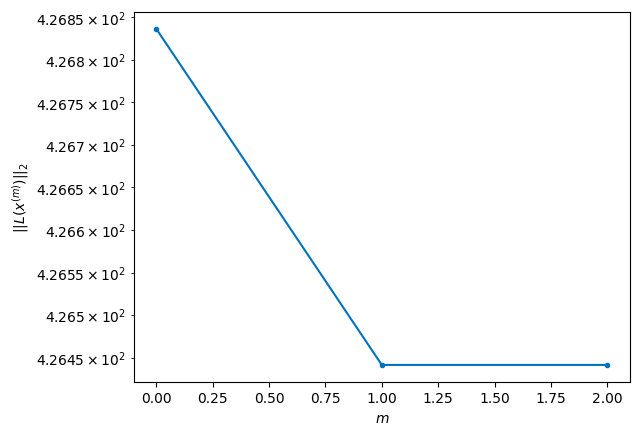

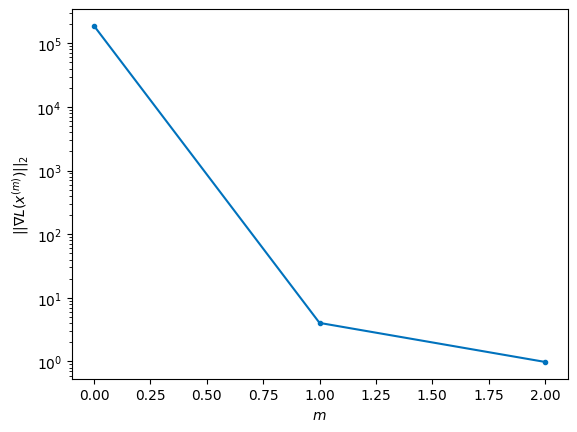


Windows:   8%|▊         | 24/296 [05:30<44:52,  9.90s/it]

Before applying the algorithm
Cost function: 427.39406681395184
Gradient norm: 202829.6033456214
Global relative error: 1893848074.2296135
Position relative errors: 0.010320199399633422 m, 1.2452382925410896 m, 1.0159844048851754 m, 0.32451111666975996 m

Iteration 1
Cost function: 427.2069834081349 (-0.04%)
Gradient norm: 1.698588644255222 (-100.00%)
Global relative error: 1.536671040511901 (-6.28%)
Position relative errors: 0.007027089605397275 m, 1.137296689193387 m, 0.9835259677874555 m, 0.3170820504165268 m

Iteration 2
Cost function: 427.2069833992876 (-0.00%)
Gradient norm: 2.5090666916441275 (47.71%)
Global relative error: 1.5366590860480687 (-0.00%)
Position relative errors: 0.007027091705111225 m, 1.1372848796643649 m, 0.9835209362191659 m, 0.3170820803841461 m

STOP on Iteration 3
Cost function = 427.20698343866104 (0.00%)
Gradient norm = 0.9034687478792855 (-63.99%)
Global relative error = 1.5366590829181228 (-0.00%)
Final position relative errors: 0.007027087480068245 m, 1

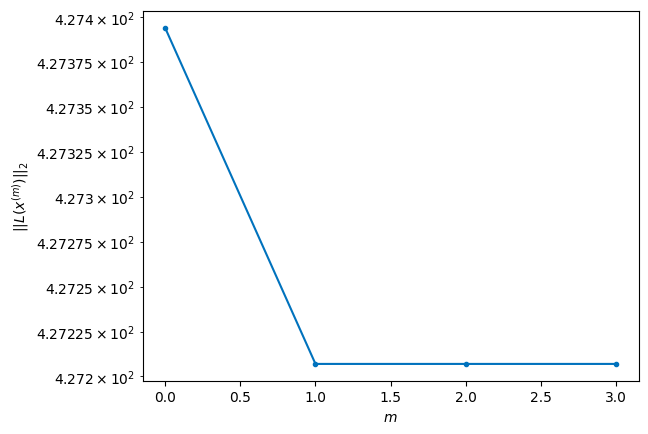

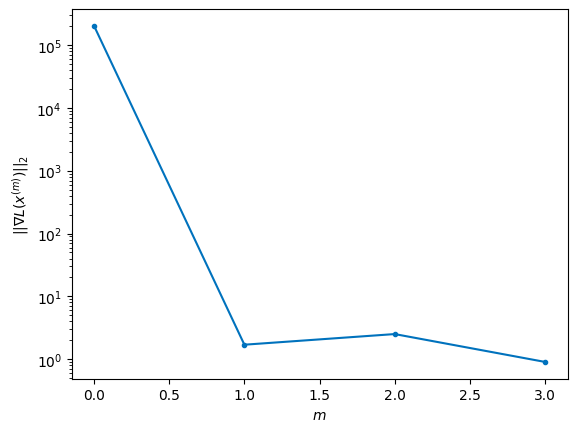


Windows:   8%|▊         | 25/296 [05:39<44:18,  9.81s/it]

Before applying the algorithm
Cost function: 429.74655585288264
Gradient norm: 75207.71954862733
Global relative error: 1894385041.6239667
Position relative errors: 0.006620418479092472 m, 1.111721833128057 m, 0.9755837412862212 m, 0.3127937888996258 m

Iteration 1
Cost function: 428.9090296868316 (-0.19%)
Gradient norm: 1.9876428754126232 (-100.00%)
Global relative error: 1.408468572166595 (-6.84%)
Position relative errors: 0.008316588189660006 m, 0.9974297843601315 m, 0.9215519036231962 m, 0.37361783482010924 m

Iteration 2
Cost function: 428.909029965852 (0.00%)
Gradient norm: 2.4091443951333953 (21.21%)
Global relative error: 1.4084763733947594 (0.00%)
Position relative errors: 0.008316582357493682 m, 0.9974360383678085 m, 0.9215561469569028 m, 0.37362008161924026 m

Iteration 3
Cost function: 428.90902987274177 (-0.00%)
Gradient norm: 2.5486408944410273 (5.79%)
Global relative error: 1.4084763790430102 (0.00%)
Position relative errors: 0.00831658909007833 m, 0.9974360429692445 m, 

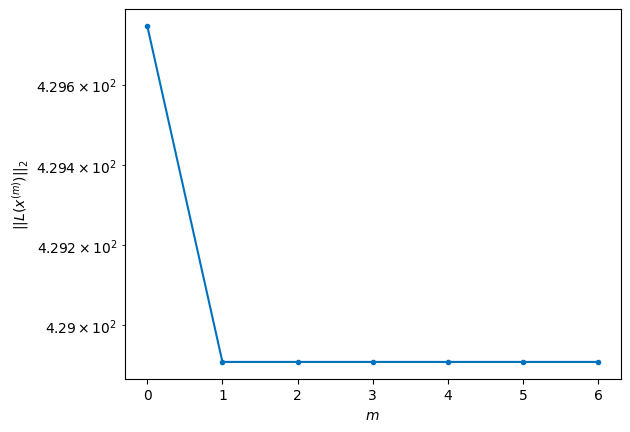

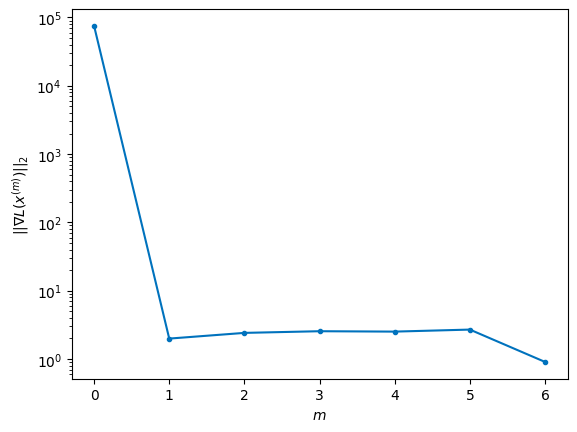


Windows:   9%|▉         | 26/296 [05:54<50:13, 11.16s/it]

Before applying the algorithm
Cost function: 426.6203585728295
Gradient norm: 192168.3192696015
Global relative error: 1894948446.6701734
Position relative errors: 0.007832378521912235 m, 0.9806846922962221 m, 0.9194015133836148 m, 0.36783901944602204 m

Iteration 1
Cost function: 426.4239541845954 (-0.05%)
Gradient norm: 3.083009080445811 (-100.00%)
Global relative error: 1.462043642131708 (4.90%)
Position relative errors: 0.007312364786523566 m, 1.0775121116563164 m, 0.9322322473398909 m, 0.3277631465094624 m

STOP on Iteration 2
Cost function = 426.42395407763837 (-0.00%)
Gradient norm = 0.7082392279085771 (-77.03%)
Global relative error = 1.4620504053283683 (0.00%)
Final position relative errors: 0.0073123706402662145 m, 1.0775189454734921 m, 0.9322345269119026 m, 0.32776436516656626 m



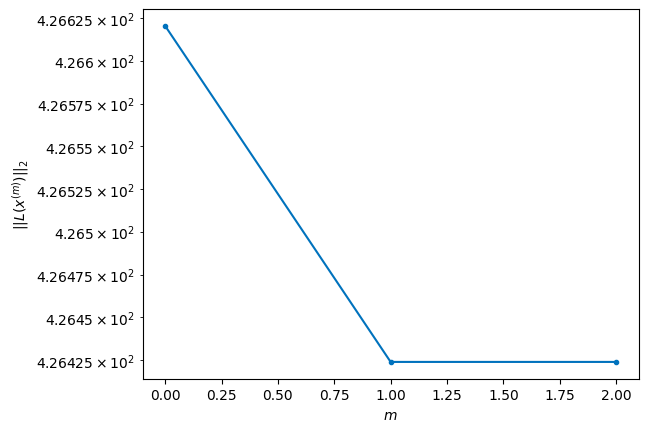

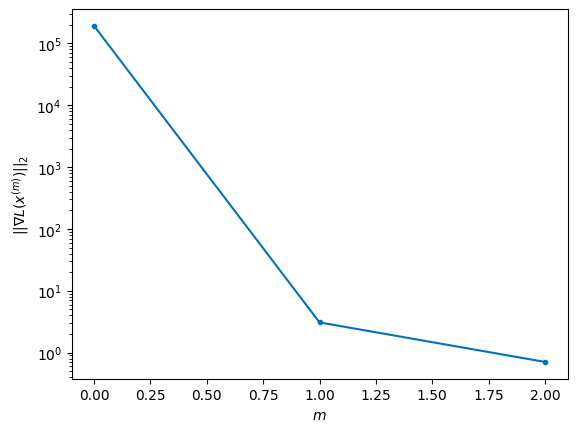


Windows:   9%|▉         | 27/296 [06:01<44:21,  9.89s/it]

Before applying the algorithm
Cost function: 428.01600262698935
Gradient norm: 49116.17119572933
Global relative error: 1895535732.2678857
Position relative errors: 0.006859217176349254 m, 1.065238248492525 m, 0.9271938763088029 m, 0.32531028346523566 m

Iteration 1
Cost function: 427.6716148271049 (-0.08%)
Gradient norm: 3.997936053307449 (-99.99%)
Global relative error: 1.4118443329853732 (-2.58%)
Position relative errors: 0.010798783939195212 m, 1.078686436696357 m, 0.8717946405671222 m, 0.2638130574339636 m

Iteration 2
Cost function: 427.67161491002645 (0.00%)
Gradient norm: 6.792424522790956 (69.90%)
Global relative error: 1.4118508994555516 (0.00%)
Position relative errors: 0.010798775663625183 m, 1.0786913973705272 m, 0.8717990000450228 m, 0.2638135098001808 m

Iteration 3
Cost function: 427.671614904757 (-0.00%)
Gradient norm: 4.937513701890531 (-27.31%)
Global relative error: 1.4118508989738414 (-0.00%)
Position relative errors: 0.010798778262156005 m, 1.0786913932960887 m, 0

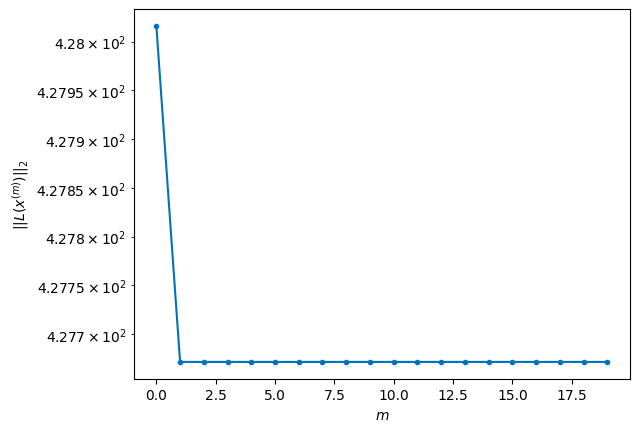

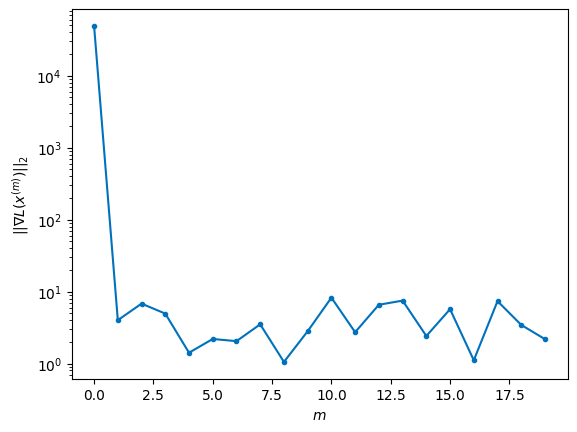


Windows:   9%|▉         | 28/296 [06:44<1:29:29, 20.03s/it]

Before applying the algorithm
Cost function: 431.5576581263588
Gradient norm: 60046.96748640726
Global relative error: 1896144194.549257
Position relative errors: 0.010171135921164696 m, 1.0761226745477888 m, 0.8658682085337672 m, 0.262418383782455 m

Iteration 1
Cost function: 431.1664716226436 (-0.09%)
Gradient norm: 4.84410876120665 (-99.99%)
Global relative error: 1.3662492646397146 (-2.82%)
Position relative errors: 0.009763727469765868 m, 1.0384830782473076 m, 0.7862964504279968 m, 0.41210696567691973 m

Iteration 2
Cost function: 431.16647133178844 (-0.00%)
Gradient norm: 2.336196137276913 (-51.77%)
Global relative error: 1.3662396556005194 (-0.00%)
Position relative errors: 0.009763736831133227 m, 1.0384716051754361 m, 0.7862894216620423 m, 0.41211743077267843 m

Iteration 3
Cost function: 431.1664713403111 (0.00%)
Gradient norm: 2.1587236191483865 (-7.60%)
Global relative error: 1.3662396502241614 (-0.00%)
Position relative errors: 0.009763731865203398 m, 1.0384715958493012 m,

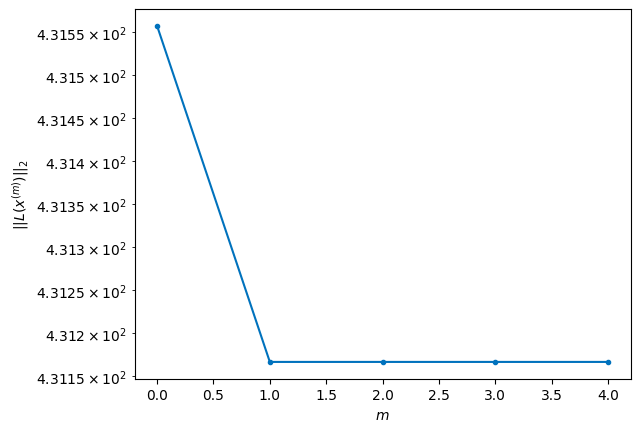

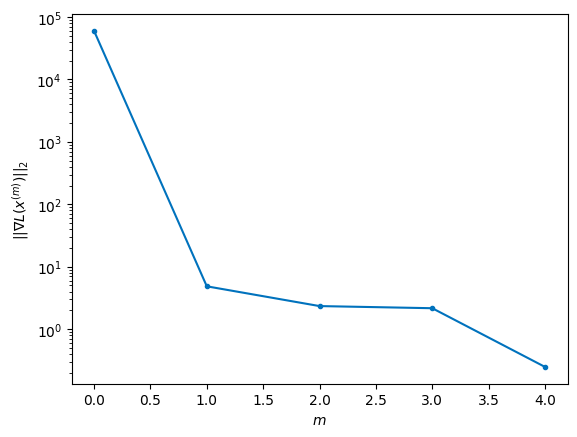


Windows:  10%|▉         | 29/296 [06:57<1:18:52, 17.73s/it]

Before applying the algorithm
Cost function: 430.2235911371993
Gradient norm: 44336.54136823283
Global relative error: 1896770980.7864645
Position relative errors: 0.00919508349534279 m, 1.016122865417214 m, 0.7658060909122665 m, 0.4039453613170876 m

Iteration 1
Cost function: 429.9781762600262 (-0.06%)
Gradient norm: 4.606085565423559 (-99.99%)
Global relative error: 1.5168442271630995 (13.62%)
Position relative errors: 0.008022335430191523 m, 1.1964129684615377 m, 0.8759933593135706 m, 0.31934840541442777 m

STOP on Iteration 2
Cost function = 429.9781763409781 (0.00%)
Gradient norm = 0.358515345019008 (-92.22%)
Global relative error = 1.516827573749483 (-0.00%)
Final position relative errors: 0.00802232301888473 m, 1.1963959490118703 m, 0.8759853383150239 m, 0.31935506908362 m



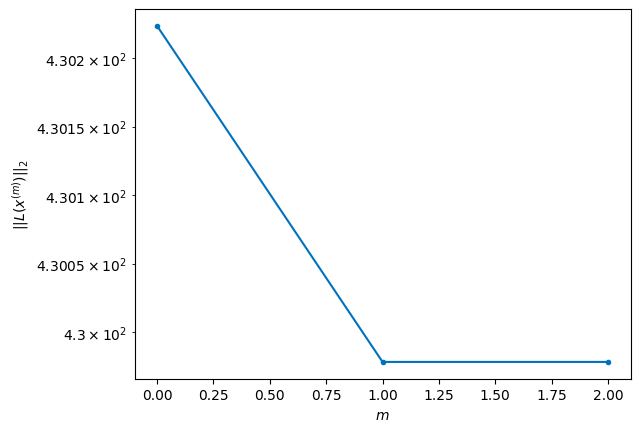

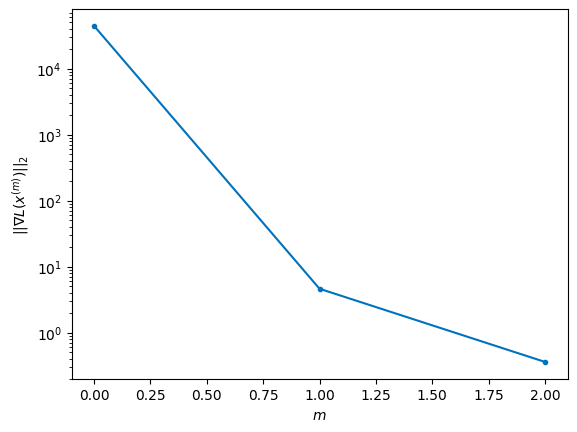


Windows:  10%|█         | 30/296 [07:03<1:03:58, 14.43s/it]

Before applying the algorithm
Cost function: 427.5834928237235
Gradient norm: 58773.678939314945
Global relative error: 1897413146.2881722
Position relative errors: 0.007965036345280974 m, 1.1781926889494396 m, 0.8535706748020673 m, 0.31378134459468215 m

Iteration 1
Cost function: 427.1478857644546 (-0.10%)
Gradient norm: 5.631083738303466 (-99.99%)
Global relative error: 1.6129150086096835 (8.37%)
Position relative errors: 0.008185802290241354 m, 1.264777079939713 m, 0.9549011696222213 m, 0.29988335484310674 m

Iteration 2
Cost function: 427.1478857882411 (0.00%)
Gradient norm: 1.6077567710723362 (-71.45%)
Global relative error: 1.6129181207841732 (0.00%)
Position relative errors: 0.008185805500073702 m, 1.264779805461791 m, 0.9549029550544661 m, 0.299882913184333 m

Iteration 3
Cost function: 427.14788575682167 (-0.00%)
Gradient norm: 1.081849978124371 (-32.71%)
Global relative error: 1.612918121899969 (0.00%)
Position relative errors: 0.008185807836153957 m, 1.264779807160068 m, 0.

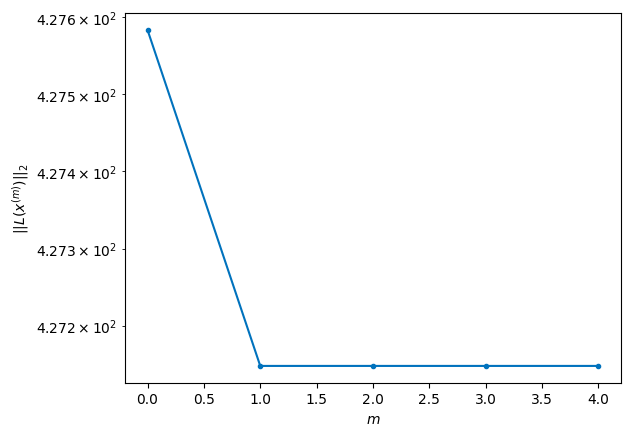

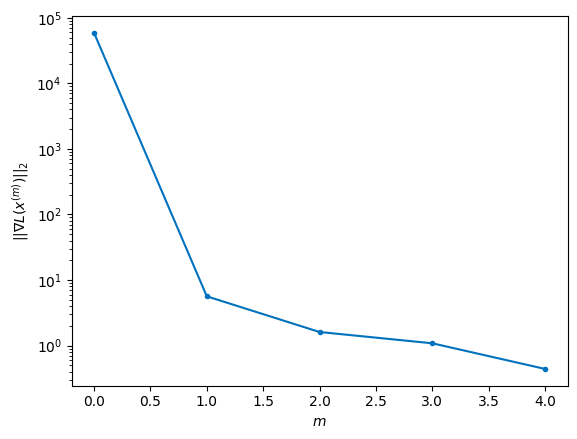


Windows:  10%|█         | 31/296 [07:14<58:53, 13.33s/it]  

Before applying the algorithm
Cost function: 426.915492512384
Gradient norm: 86763.26685820663
Global relative error: 1898067619.884802
Position relative errors: 0.008428837469421115 m, 1.24438328384973 m, 0.9205056881246287 m, 0.29324513398329566 m

Iteration 1
Cost function: 426.65194504982276 (-0.06%)
Gradient norm: 4.013266109052966 (-100.00%)
Global relative error: 1.6079895829786237 (2.07%)
Position relative errors: 0.01781304751308929 m, 1.2384255018820831 m, 0.9598058687627918 m, 0.3610922391935935 m

Iteration 2
Cost function: 426.6519452459611 (0.00%)
Gradient norm: 4.097246172719677 (2.09%)
Global relative error: 1.6079867941445511 (-0.00%)
Position relative errors: 0.017813052400511124 m, 1.2384238403810814 m, 0.959804069833445 m, 0.3610902999740712 m

Iteration 3
Cost function: 426.65194556343573 (0.00%)
Gradient norm: 2.524213621588605 (-38.39%)
Global relative error: 1.6079867912241212 (-0.00%)
Position relative errors: 0.01781304984270842 m, 1.23842383758785 m, 0.959804

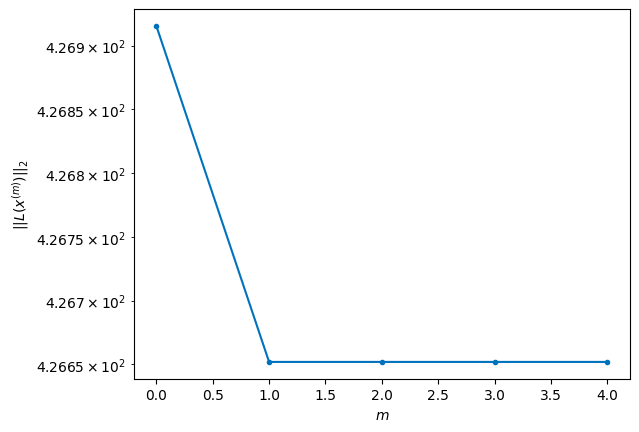

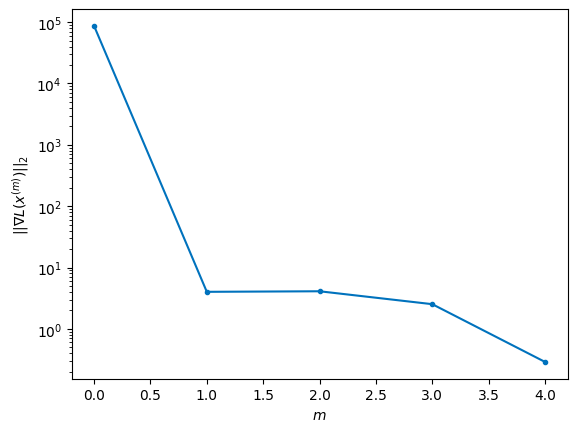


Windows:  11%|█         | 32/296 [07:26<55:58, 12.72s/it]

Before applying the algorithm
Cost function: 429.6346248988445
Gradient norm: 231958.76427295094
Global relative error: 1898731253.582073
Position relative errors: 0.017825089490057382 m, 1.2118682986479679 m, 0.9264315283388945 m, 0.34984771209443 m

Iteration 1
Cost function: 429.31219786170874 (-0.08%)
Gradient norm: 4.568107633818685 (-100.00%)
Global relative error: 1.5394345758089472 (-1.64%)
Position relative errors: 0.029404015782099488 m, 1.2158895632827746 m, 0.8671480031959417 m, 0.3723714367569914 m

Iteration 2
Cost function: 429.3121977431929 (-0.00%)
Gradient norm: 3.1009681868243586 (-32.12%)
Global relative error: 1.5394300652594815 (-0.00%)
Position relative errors: 0.029404011964511315 m, 1.2158871201374521 m, 0.8671441001261132 m, 0.37236985646573845 m

Iteration 3
Cost function: 429.3121976605058 (-0.00%)
Gradient norm: 4.507299928348269 (45.35%)
Global relative error: 1.5394300619269692 (-0.00%)
Position relative errors: 0.029404013998710295 m, 1.2158871174144095 

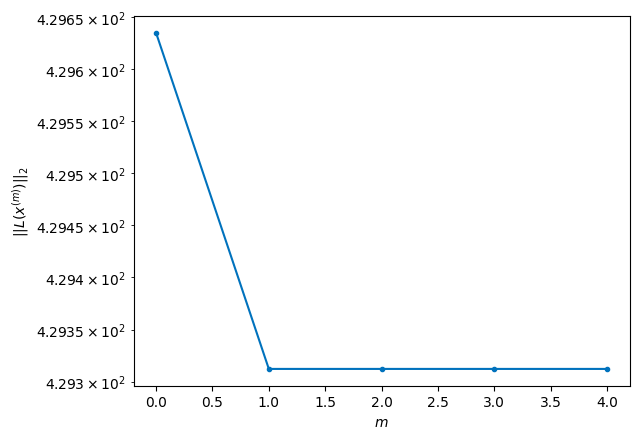

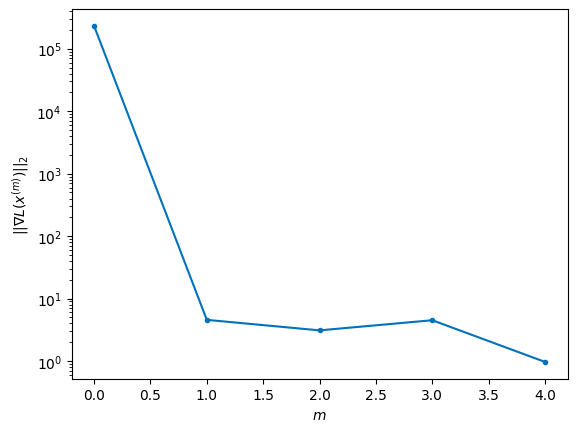


Windows:  11%|█         | 33/296 [07:36<53:05, 12.11s/it]

Before applying the algorithm
Cost function: 429.6698358529741
Gradient norm: 57020.727175084314
Global relative error: 1899400834.1638684
Position relative errors: 0.028835673545972006 m, 1.187360482723725 m, 0.8316721198441172 m, 0.35931732163914376 m

Iteration 1
Cost function: 429.28788883261564 (-0.09%)
Gradient norm: 5.896431968555251 (-99.99%)
Global relative error: 1.3281054224582234 (-11.09%)
Position relative errors: 0.01593032574922024 m, 0.9701952438714988 m, 0.8384613248342142 m, 0.3454171583630861 m

Iteration 2
Cost function: 429.2878892387371 (0.00%)
Gradient norm: 3.4688096044952363 (-41.17%)
Global relative error: 1.3281904050361333 (0.01%)
Position relative errors: 0.015930327683140507 m, 0.9702722971312233 m, 0.8384992388111662 m, 0.34543545376644386 m

Iteration 3
Cost function: 429.2878889185153 (-0.00%)
Gradient norm: 3.563671963391971 (2.73%)
Global relative error: 1.3281904053988587 (0.00%)
Position relative errors: 0.01593032318933254 m, 0.9702722979975916 m, 

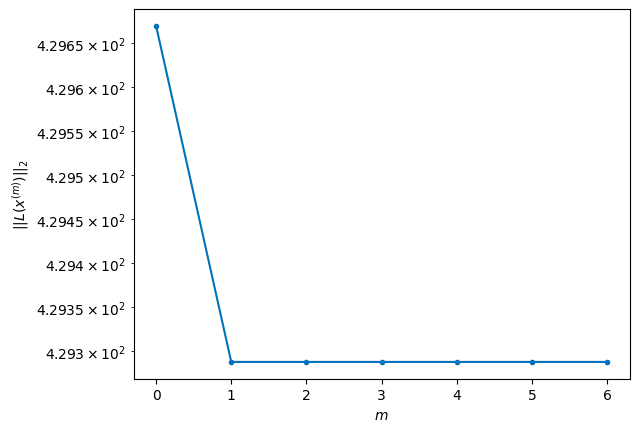

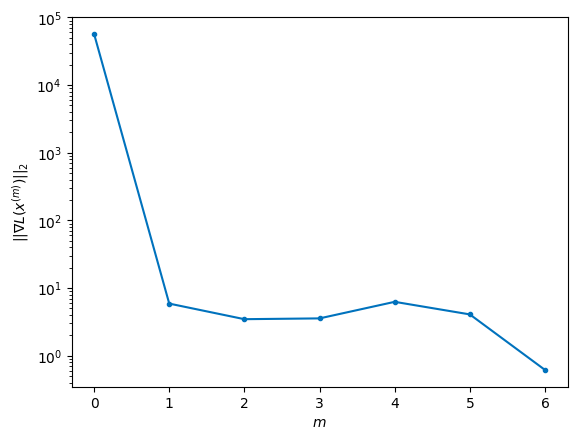


Windows:  11%|█▏        | 34/296 [07:51<56:53, 13.03s/it]

Before applying the algorithm
Cost function: 437.78348537411415
Gradient norm: 155371.63140596118
Global relative error: 1900073109.9751236
Position relative errors: 0.015735831022732565 m, 0.9247742837366422 m, 0.8016829375223996 m, 0.3301982387973123 m

Iteration 1
Cost function: 437.24786145978976 (-0.12%)
Gradient norm: 4.192002147375013 (-100.00%)
Global relative error: 1.362986581056039 (7.51%)
Position relative errors: 0.018608820720126852 m, 0.9782738580519076 m, 0.8635177028321323 m, 0.3933226987882283 m

STOP on Iteration 2
Cost function = 437.2478613471398 (-0.00%)
Gradient norm = 0.2929818030895361 (-93.01%)
Global relative error = 1.363013363377415 (0.00%)
Final position relative errors: 0.018608826141014924 m, 0.9782978583159831 m, 0.8635301086915534 m, 0.39332857777180896 m



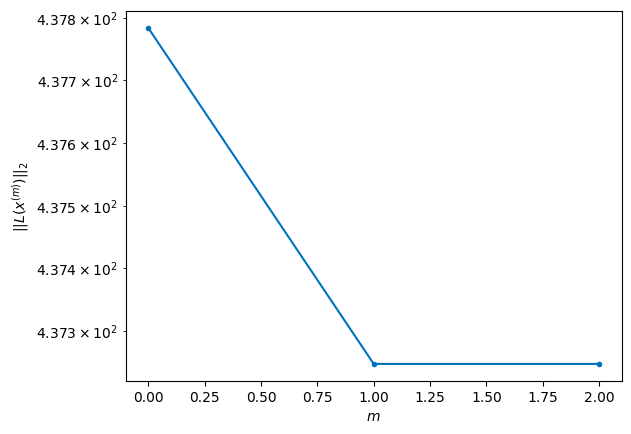

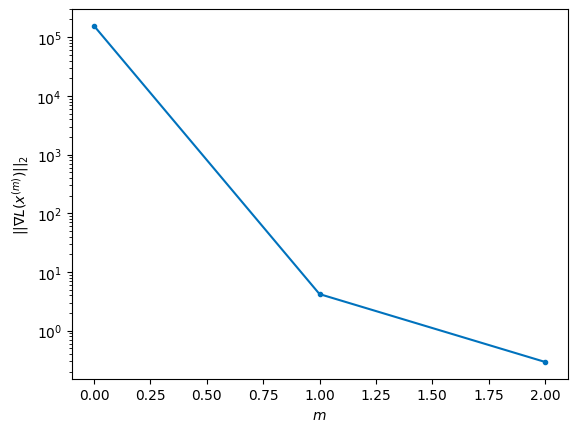


Windows:  12%|█▏        | 35/296 [07:58<48:39, 11.18s/it]

Before applying the algorithm
Cost function: 434.0287866737724
Gradient norm: 98258.02859726867
Global relative error: 1900744782.4477994
Position relative errors: 0.01827081152092789 m, 0.9341321670298076 m, 0.8359013760326536 m, 0.38181137171696516 m

Iteration 1
Cost function: 433.64812771311273 (-0.09%)
Gradient norm: 5.6782241359854515 (-99.99%)
Global relative error: 1.4969503421978472 (14.23%)
Position relative errors: 0.020581826007691824 m, 1.0261547011878016 m, 0.9275617779814301 m, 0.5719016220745828 m

Iteration 2
Cost function: 433.64812777866945 (0.00%)
Gradient norm: 6.722423121097631 (18.39%)
Global relative error: 1.496997542756671 (0.00%)
Position relative errors: 0.02058182408738342 m, 1.0261963162678467 m, 0.9275842085950804 m, 0.571914120018437 m

Iteration 3
Cost function: 433.64812770472525 (-0.00%)
Gradient norm: 3.0408430668882023 (-54.77%)
Global relative error: 1.4969975429616778 (0.00%)
Position relative errors: 0.020581822128598624 m, 1.0261963204568922 m, 

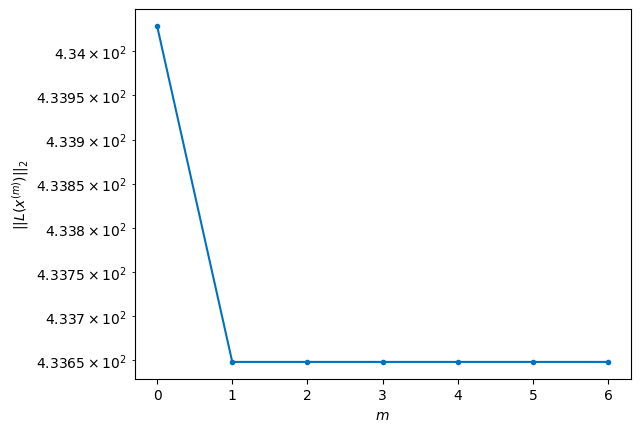

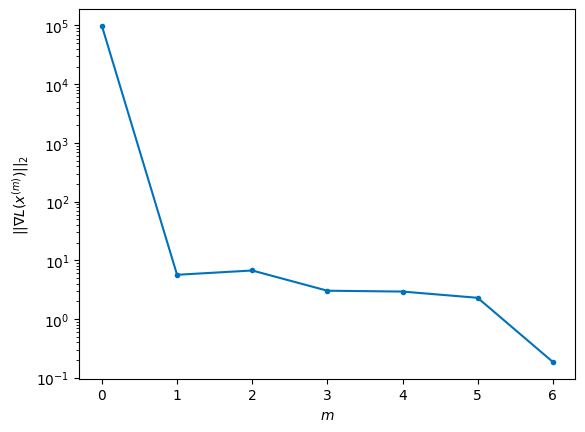


Windows:  12%|█▏        | 36/296 [08:13<53:00, 12.23s/it]

Before applying the algorithm
Cost function: 437.5833170698919
Gradient norm: 141700.39988028083
Global relative error: 1901412569.2202094
Position relative errors: 0.020029028498876812 m, 0.9813094461874649 m, 0.9016454531295583 m, 0.5587487002406337 m

Iteration 1
Cost function: 437.1576603218864 (-0.10%)
Gradient norm: 11.128684386071983 (-99.99%)
Global relative error: 1.125448443987759 (-22.12%)
Position relative errors: 0.015095937244200507 m, 0.7206121183602394 m, 0.7381871796198932 m, 0.4496695515919428 m

Iteration 2
Cost function: 437.1576603734085 (0.00%)
Gradient norm: 2.2897959262394982 (-79.42%)
Global relative error: 1.1253511828342186 (-0.01%)
Position relative errors: 0.015095943636976875 m, 0.7205087955951742 m, 0.7381350129137838 m, 0.44967733460546067 m

Iteration 3
Cost function: 437.15766048081156 (0.00%)
Gradient norm: 6.120526723467226 (167.30%)
Global relative error: 1.125351190636262 (0.00%)
Position relative errors: 0.01509594133960916 m, 0.7205088045803436 m

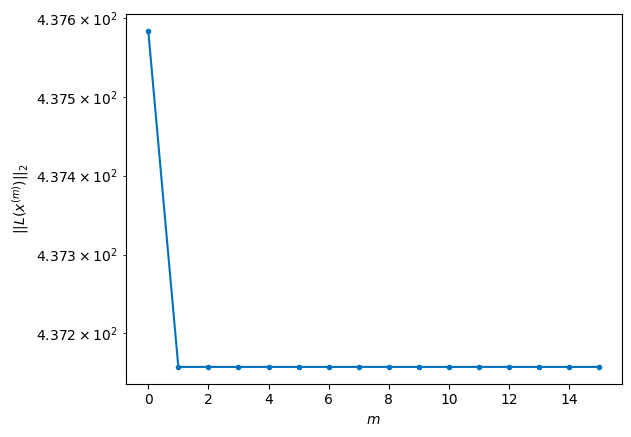

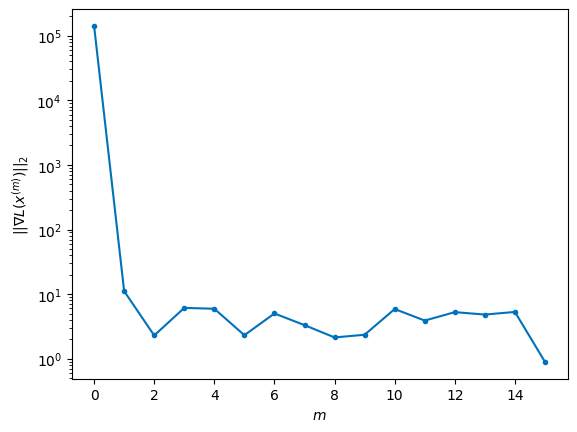


Windows:  12%|█▎        | 37/296 [08:47<1:21:22, 18.85s/it]

Before applying the algorithm
Cost function: 436.23961433284165
Gradient norm: 243714.16184642274
Global relative error: 1902073193.0425608
Position relative errors: 0.014668549506879156 m, 0.662967351949128 m, 0.7058064998942699 m, 0.42982317097020184 m

STOP on Iteration 1
Cost function = 435.55137461947186 (-0.16%)
Gradient norm = 0.8224043203170569 (-100.00%)
Global relative error = 1.1685857889111744 (10.29%)
Final position relative errors: 0.026077015433035203 m, 0.7676653565589184 m, 0.6962513457195072 m, 0.5392911339528003 m



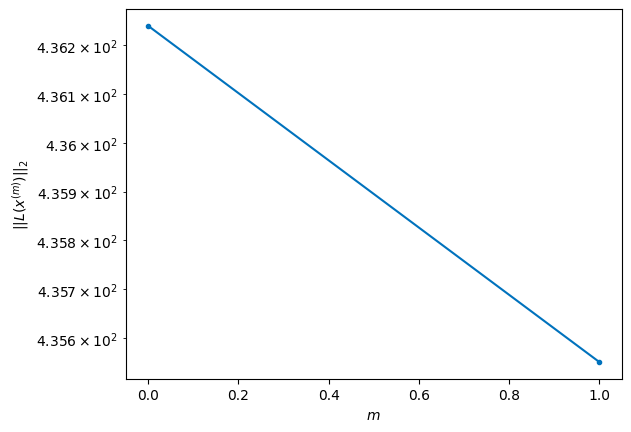

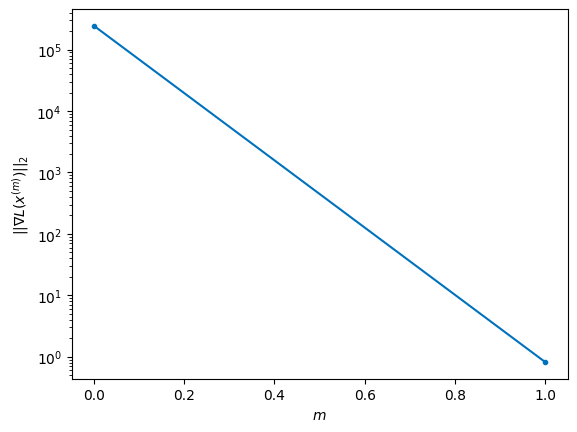


Windows:  13%|█▎        | 38/296 [08:52<1:02:31, 14.54s/it]

Before applying the algorithm
Cost function: 434.19327933026545
Gradient norm: 119302.52861761197
Global relative error: 1902723406.6664536
Position relative errors: 0.02525037277131246 m, 0.7099494707088873 m, 0.6601144041294355 m, 0.5151044669582462 m

Iteration 1
Cost function: 433.9436052490639 (-0.06%)
Gradient norm: 2.0393691502498736 (-100.00%)
Global relative error: 0.9747730758034573 (-11.23%)
Position relative errors: 0.02582960908596954 m, 0.6972695746014597 m, 0.5574757283162073 m, 0.3905759785783532 m

STOP on Iteration 2
Cost function = 433.9436053680266 (0.00%)
Gradient norm = 0.5650740719739741 (-72.29%)
Global relative error = 0.974765197021636 (-0.00%)
Final position relative errors: 0.025829606752971714 m, 0.6972623811362814 m, 0.5574717191270108 m, 0.39057487977472083 m



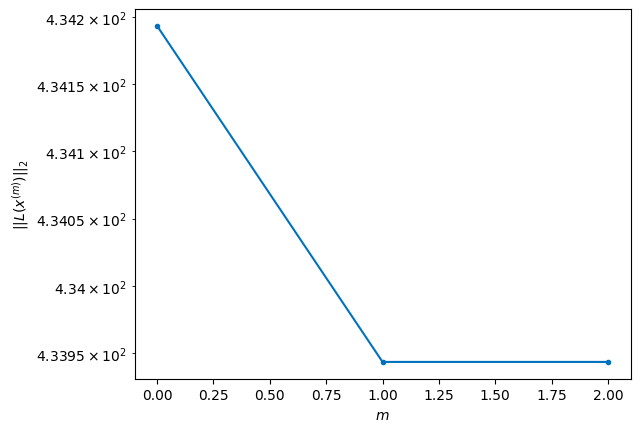

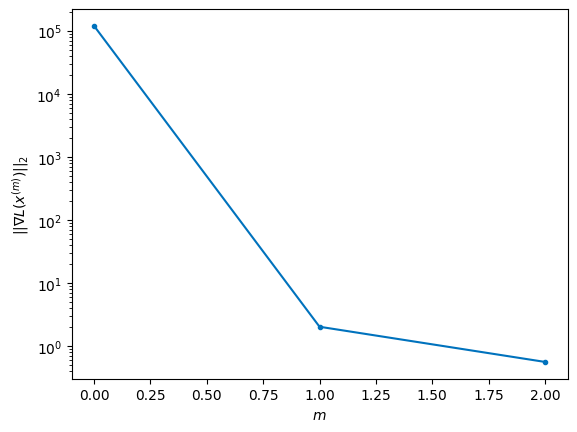


Windows:  13%|█▎        | 39/296 [08:59<53:23, 12.46s/it]  

Before applying the algorithm
Cost function: 433.2804478781656
Gradient norm: 29070.205469938388
Global relative error: 1903360038.8271775
Position relative errors: 0.025209747969347843 m, 0.6389002300243036 m, 0.5180059908270237 m, 0.37004497764503397 m

STOP on Iteration 1
Cost function = 433.1502211684217 (-0.03%)
Gradient norm = 0.7909749906669918 (-100.00%)
Global relative error = 0.8812905900886319 (-2.33%)
Final position relative errors: 0.03218220860321977 m, 0.6797812928929723 m, 0.43031720726055683 m, 0.35827372862645407 m



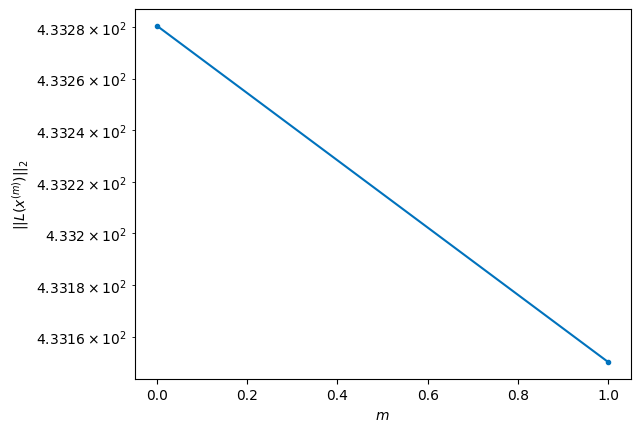

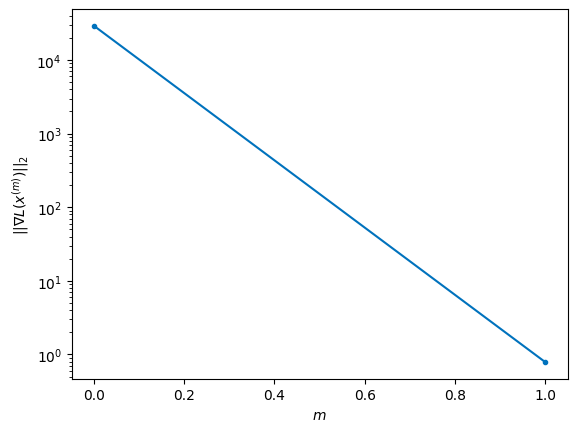


Windows:  14%|█▎        | 40/296 [09:04<43:12, 10.13s/it]

Before applying the algorithm
Cost function: 436.33576800202826
Gradient norm: 155769.25934661514
Global relative error: 1903979963.2436388
Position relative errors: 0.03152180952130719 m, 0.6210220337755815 m, 0.39149072750117847 m, 0.33801624879895226 m

Iteration 1
Cost function: 435.85924758468803 (-0.11%)
Gradient norm: 7.642541733546102 (-100.00%)
Global relative error: 0.8775150801450764 (8.49%)
Position relative errors: 0.025668855263592066 m, 0.6932879891204851 m, 0.36073798231935 m, 0.39823598458628473 m

Iteration 2
Cost function: 435.8592475244548 (-0.00%)
Gradient norm: 5.278752787136197 (-30.93%)
Global relative error: 0.8774764836046469 (-0.00%)
Position relative errors: 0.02566884506863351 m, 0.69325812058796 m, 0.3607209589669047 m, 0.3982183560145462 m

STOP on Iteration 3
Cost function = 435.85924756842803 (0.00%)
Gradient norm = 0.4498064274792325 (-91.48%)
Global relative error = 0.8774764877419421 (0.00%)
Final position relative errors: 0.025668850862225173 m, 0.6

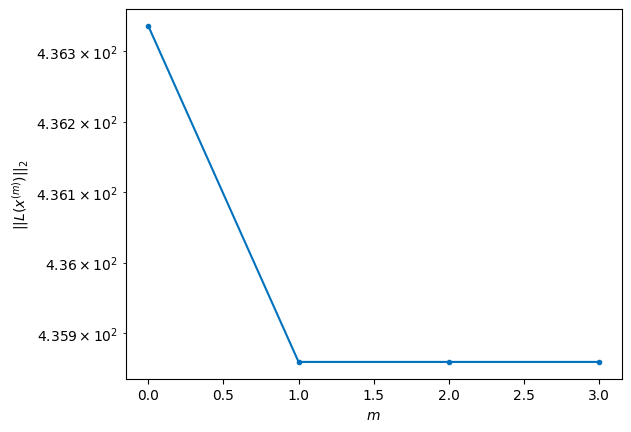

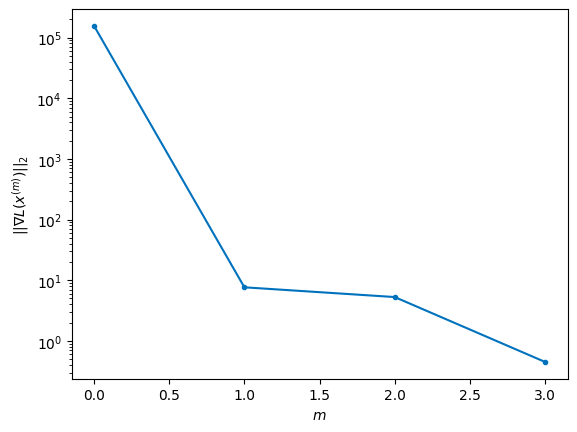


Windows:  14%|█▍        | 41/296 [09:13<41:27,  9.76s/it]

Before applying the algorithm
Cost function: 435.4219661750123
Gradient norm: 41457.72387646228
Global relative error: 1904580168.7106752
Position relative errors: 0.025506183134689168 m, 0.6336147902431039 m, 0.32178409137628217 m, 0.3807589967705694 m

STOP on Iteration 1
Cost function = 435.10429389535096 (-0.07%)
Gradient norm = 0.8179341268220455 (-100.00%)
Global relative error = 0.7946682132514926 (-1.48%)
Final position relative errors: 0.023738028136598744 m, 0.5740689690489591 m, 0.38729852171608875 m, 0.3890716611647663 m



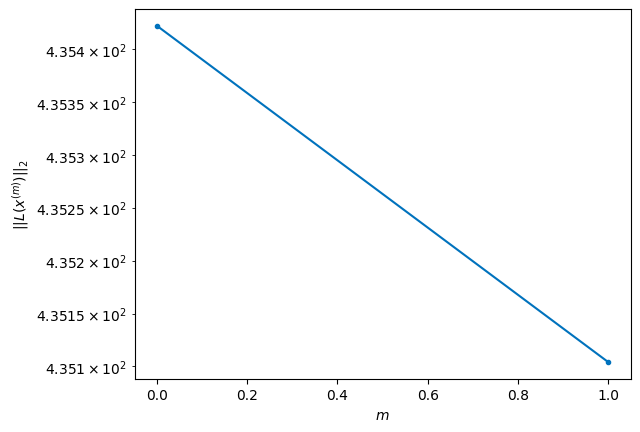

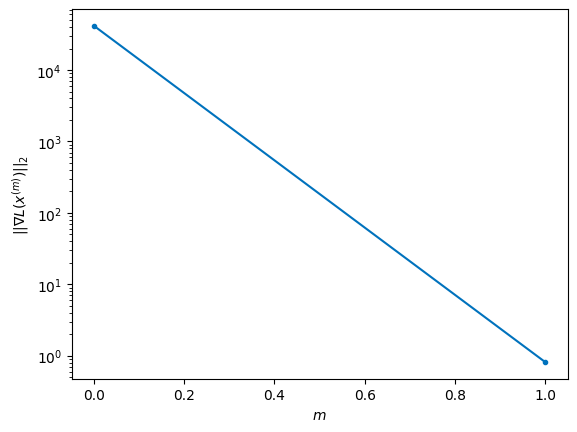


Windows:  14%|█▍        | 42/296 [09:18<35:20,  8.35s/it]

Before applying the algorithm
Cost function: 444.16227736766734
Gradient norm: 538621.8860165044
Global relative error: 1905157750.0199597
Position relative errors: 0.023744075481883314 m, 0.5093071900668201 m, 0.34470133173030737 m, 0.3690160976293261 m

Iteration 1
Cost function: 443.20073492259286 (-0.22%)
Gradient norm: 2.2695534752597615 (-100.00%)
Global relative error: 0.5508618989011029 (-23.24%)
Position relative errors: 0.02804300537037102 m, 0.48018996543287124 m, 0.20442315636604105 m, 0.17403753321315757 m

Iteration 2
Cost function: 443.2007348024619 (-0.00%)
Gradient norm: 3.2855856600711983 (44.77%)
Global relative error: 0.5508930270126815 (0.01%)
Position relative errors: 0.0280429932320642 m, 0.48021862084340533 m, 0.2044316607183941 m, 0.17404700880099933 m

Iteration 3
Cost function: 443.20073480035927 (-0.00%)
Gradient norm: 1.2622154814058957 (-61.58%)
Global relative error: 0.5508930209758742 (-0.00%)
Position relative errors: 0.02804299358206401 m, 0.4802186189

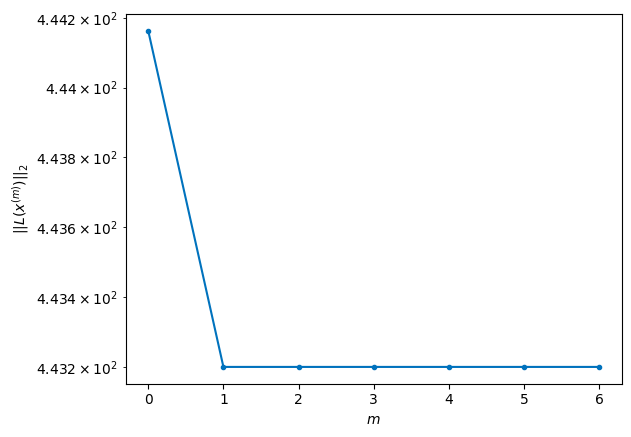

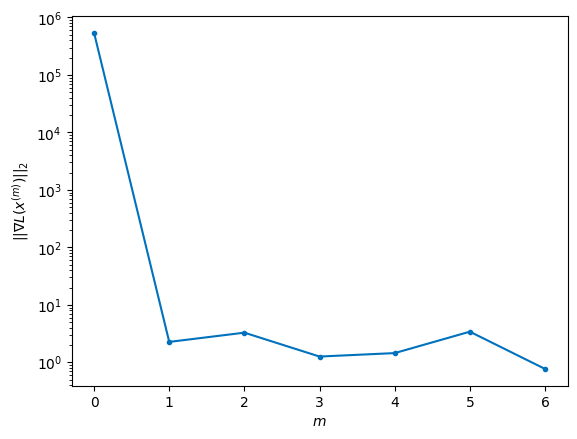


Windows:  15%|█▍        | 43/296 [09:32<41:59,  9.96s/it]

Before applying the algorithm
Cost function: 443.97977175226066
Gradient norm: 101403.9482070054
Global relative error: 1905709939.2503679
Position relative errors: 0.02735577454932991 m, 0.4124979282572285 m, 0.16837547236136255 m, 0.16360722406475817 m

Iteration 1
Cost function: 443.5725174893966 (-0.09%)
Gradient norm: 1.936121279881472 (-100.00%)
Global relative error: 0.5106937915977978 (7.42%)
Position relative errors: 0.032285845671310806 m, 0.4273803403059094 m, 0.0680764450313445 m, 0.2692124532106507 m

STOP on Iteration 2
Cost function = 443.5725176036474 (0.00%)
Gradient norm = 0.6729844530620529 (-65.24%)
Global relative error = 0.5106915799683999 (-0.00%)
Final position relative errors: 0.03228584612629303 m, 0.4273820651469034 m, 0.06807372202776893 m, 0.26920620798192624 m



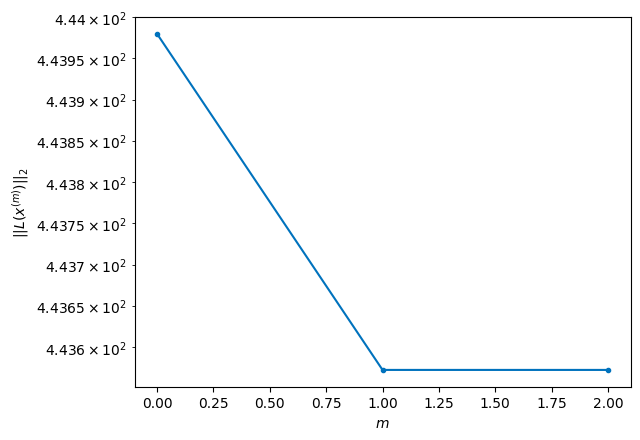

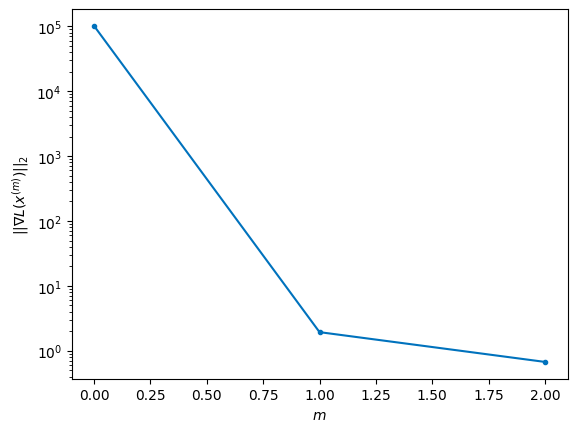


Windows:  15%|█▍        | 44/296 [09:39<38:14,  9.10s/it]

Before applying the algorithm
Cost function: 444.61627164777775
Gradient norm: 123443.68244922964
Global relative error: 1906234100.8674247
Position relative errors: 0.03147097866260808 m, 0.36093314605263127 m, 0.07072134351705744 m, 0.25556039844872863 m

Iteration 1
Cost function: 444.2029943042439 (-0.09%)
Gradient norm: 1.0654692043016216 (-100.00%)
Global relative error: 0.4434954173280075 (-1.22%)
Position relative errors: 0.016979825903114396 m, 0.337144879374693 m, 0.0971909113964366 m, 0.2707120843286032 m

STOP on Iteration 2
Cost function = 444.2029944278176 (0.00%)
Gradient norm = 0.5743423930545771 (-46.09%)
Global relative error = 0.44346515911737844 (-0.01%)
Final position relative errors: 0.016979826335064573 m, 0.3371172920126765 m, 0.09718700096921695 m, 0.27069827473722735 m



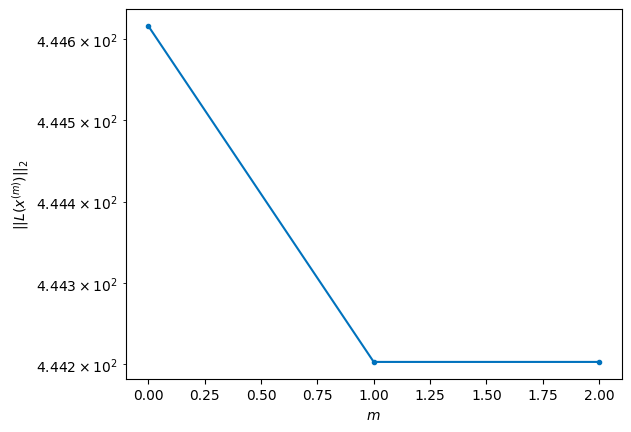

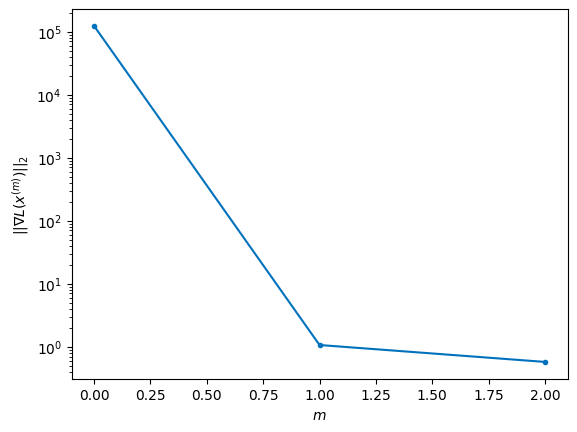


Windows:  15%|█▌        | 45/296 [09:45<34:52,  8.34s/it]

Before applying the algorithm
Cost function: 438.25674766011315
Gradient norm: 133211.75239456224
Global relative error: 1906727780.9982822
Position relative errors: 0.016664718344492725 m, 0.27668845016703913 m, 0.09833900865072573 m, 0.25788017082479725 m

Iteration 1
Cost function: 437.55358862777285 (-0.16%)
Gradient norm: 5.832830240697011 (-100.00%)
Global relative error: 0.34425429746468 (-11.99%)
Position relative errors: 0.010058182303805462 m, 0.281433101194059 m, 0.15051144299146868 m, 0.12864407285569426 m

Iteration 2
Cost function: 437.5535885694697 (-0.00%)
Gradient norm: 1.0265323009271743 (-82.40%)
Global relative error: 0.34425490583878454 (0.00%)
Position relative errors: 0.01005818272728934 m, 0.28142979643064475 m, 0.1505055762982047 m, 0.12865979337334382 m

Iteration 3
Cost function: 437.55358854416147 (-0.00%)
Gradient norm: 3.5656151368941975 (247.35%)
Global relative error: 0.3442549045865272 (-0.00%)
Position relative errors: 0.01005818125433774 m, 0.28142979

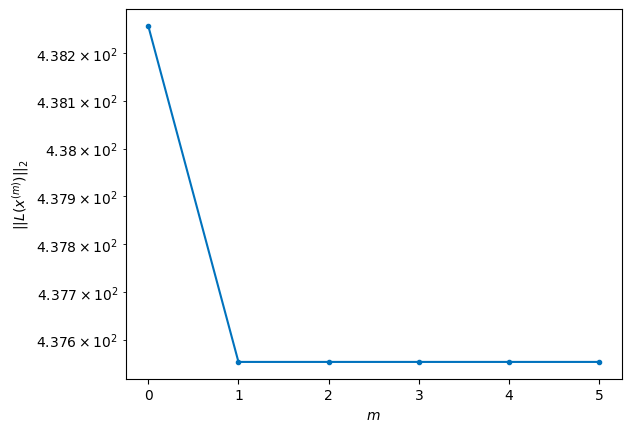

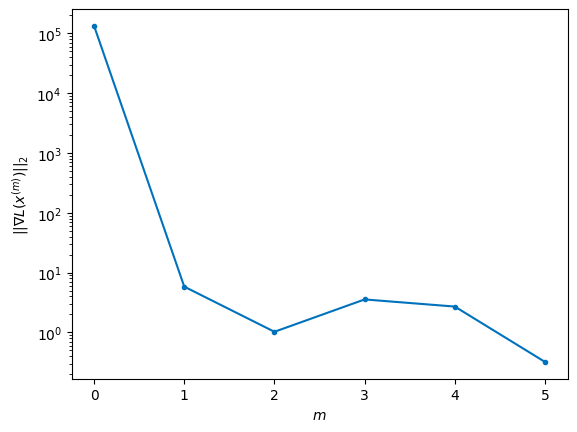


Windows:  16%|█▌        | 46/296 [09:58<40:36,  9.75s/it]

Before applying the algorithm
Cost function: 433.34725898901985
Gradient norm: 131296.73751906466
Global relative error: 1907188701.9988618
Position relative errors: 0.010823007672492146 m, 0.22899326721115676 m, 0.12209425094868825 m, 0.13651998224886133 m

Iteration 1
Cost function: 432.8695348988698 (-0.11%)
Gradient norm: 3.897719943671917 (-100.00%)
Global relative error: 0.43439637581432455 (48.04%)
Position relative errors: 0.007959028955526498 m, 0.28595315766750745 m, 0.17045452074595635 m, 0.27894530360823333 m

Iteration 2
Cost function: 432.86953483450327 (-0.00%)
Gradient norm: 1.7731387774401524 (-54.51%)
Global relative error: 0.43438714264701705 (-0.00%)
Position relative errors: 0.007959026875441904 m, 0.28594824452153356 m, 0.17045309799571726 m, 0.2789368309545675 m

Iteration 3
Cost function: 432.8695346024277 (-0.00%)
Gradient norm: 3.800121281857367 (114.32%)
Global relative error: 0.4343871378671001 (-0.00%)
Position relative errors: 0.0079590282610837 m, 0.28594

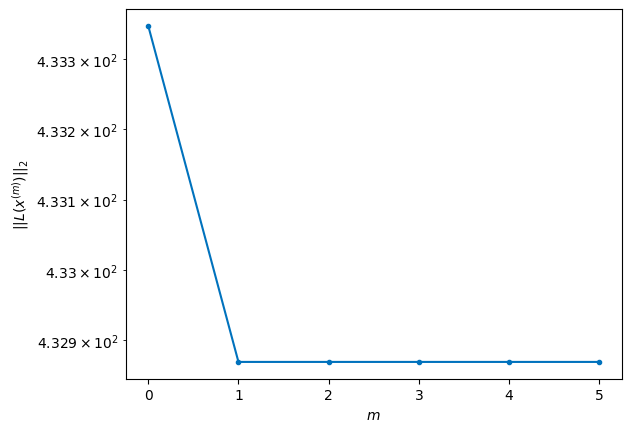

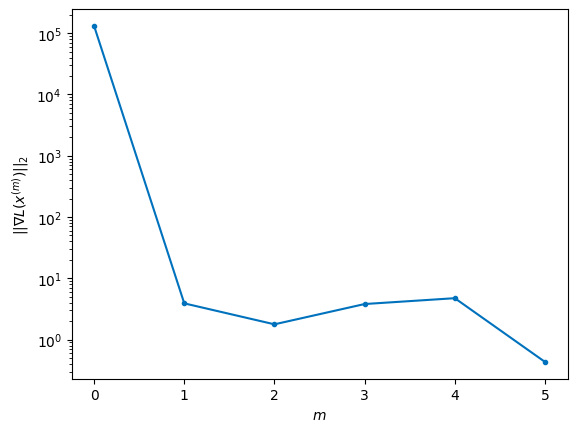


Windows:  16%|█▌        | 47/296 [10:11<44:11, 10.65s/it]

Before applying the algorithm
Cost function: 429.86371823689143
Gradient norm: 75311.03506062637
Global relative error: 1907614756.8339832
Position relative errors: 0.008710216932977003 m, 0.24811869524720598 m, 0.15691594705802148 m, 0.26305523328876657 m

Iteration 1
Cost function: 429.74925813268607 (-0.03%)
Gradient norm: 5.5024569953605775 (-99.99%)
Global relative error: 0.378487814216808 (-4.01%)
Position relative errors: 0.009352473263325582 m, 0.28077168869874886 m, 0.09718153337573263 m, 0.23427830784914763 m

Iteration 2
Cost function: 429.7492583317974 (0.00%)
Gradient norm: 6.1059825623061315 (10.97%)
Global relative error: 0.3784901432453453 (0.00%)
Position relative errors: 0.009352475288232904 m, 0.2807732281945339 m, 0.09718251933644277 m, 0.23427981640237536 m

STOP on Iteration 3
Cost function = 429.74925809588007 (-0.00%)
Gradient norm = 0.8062524190407074 (-86.80%)
Global relative error = 0.3784901403802777 (-0.00%)
Final position relative errors: 0.009352473418408

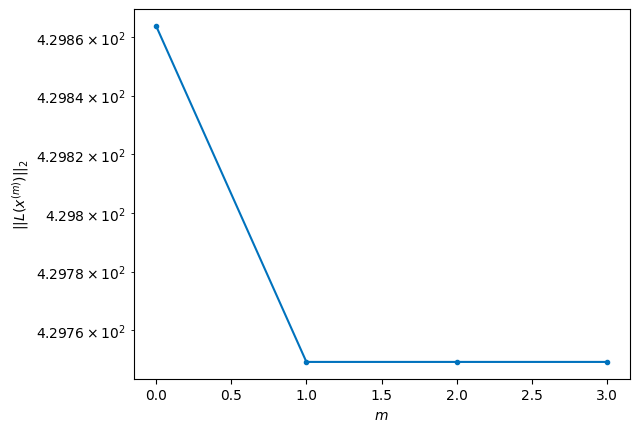

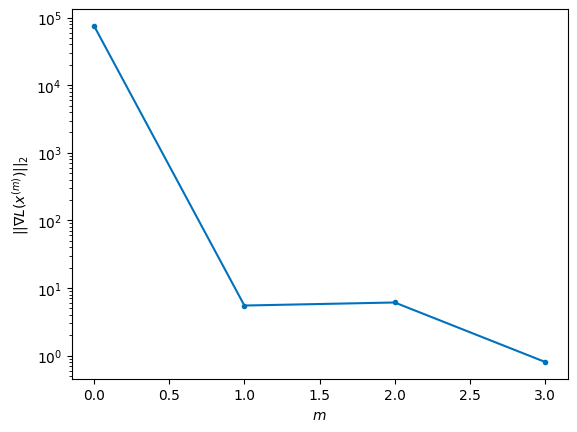


Windows:  16%|█▌        | 48/296 [10:21<42:30, 10.28s/it]

Before applying the algorithm
Cost function: 427.70857519428745
Gradient norm: 168526.06575241673
Global relative error: 1908004061.0860062
Position relative errors: 0.009781248309593597 m, 0.23075914101791495 m, 0.12037932673368011 m, 0.22046609297039127 m

Iteration 1
Cost function: 427.0862132435344 (-0.15%)
Gradient norm: 3.6172836619532376 (-100.00%)
Global relative error: 0.4849307825969808 (42.11%)
Position relative errors: 0.008881167876509126 m, 0.21115764651834545 m, 0.22894184116743643 m, 0.37158382407384 m

STOP on Iteration 2
Cost function = 427.08621351863763 (0.00%)
Gradient norm = 0.7210685822318732 (-80.07%)
Global relative error = 0.4849071683101027 (-0.00%)
Final position relative errors: 0.008881167873389837 m, 0.21112999525505158 m, 0.22894264313705606 m, 0.3715682250485358 m



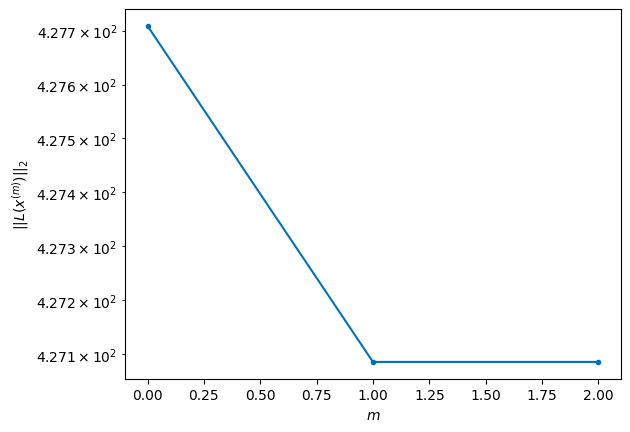

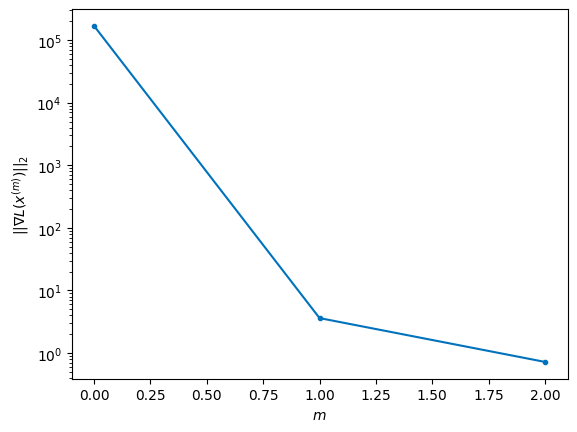


Windows:  17%|█▋        | 49/296 [10:28<38:33,  9.37s/it]

Before applying the algorithm
Cost function: 430.25925453088223
Gradient norm: 114539.64581250545
Global relative error: 1908354921.5036829
Position relative errors: 0.009638836688853028 m, 0.15750096058956412 m, 0.23138341090769451 m, 0.3503187016223942 m

Iteration 1
Cost function: 429.81906115411357 (-0.10%)
Gradient norm: 3.9883403842292435 (-100.00%)
Global relative error: 0.3361312121697724 (-25.06%)
Position relative errors: 0.006665917243483304 m, 0.12884190234317353 m, 0.2601341482050945 m, 0.16931431486276316 m

Iteration 2
Cost function: 429.8190612363216 (0.00%)
Gradient norm: 4.2302223936378756 (6.06%)
Global relative error: 0.33613345389663674 (0.00%)
Position relative errors: 0.006665915352709413 m, 0.12884247358148931 m, 0.2601344739289212 m, 0.16931783017353405 m

STOP on Iteration 3
Cost function = 429.8190611487091 (-0.00%)
Gradient norm = 0.173724987686902 (-95.89%)
Global relative error = 0.33613345494808716 (0.00%)
Final position relative errors: 0.006665920072123

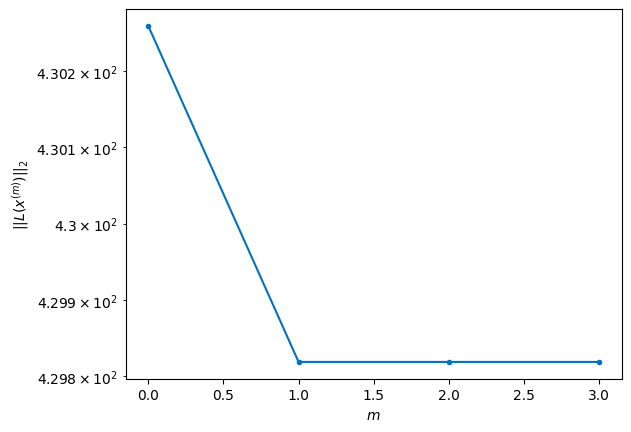

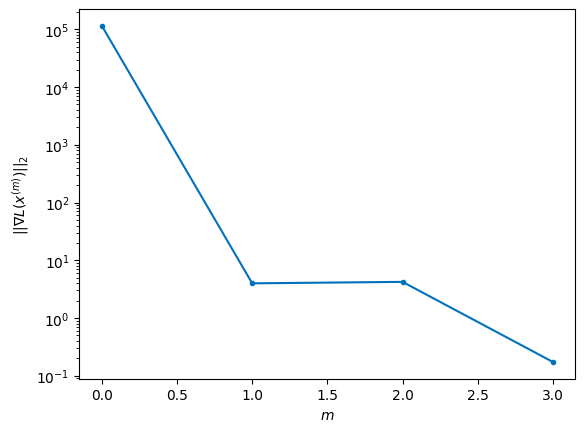


Windows:  17%|█▋        | 50/296 [10:37<38:16,  9.34s/it]

Before applying the algorithm
Cost function: 426.7539792025157
Gradient norm: 50317.365890474815
Global relative error: 1908665873.3217814
Position relative errors: 0.0073031087635003844 m, 0.13519945890476098 m, 0.27953397841634936 m, 0.1568454445366383 m

Iteration 1
Cost function: 426.34497296413963 (-0.10%)
Gradient norm: 3.0961889750355747 (-99.99%)
Global relative error: 0.40526373989831554 (16.47%)
Position relative errors: 0.017568156005511218 m, 0.14380635676646203 m, 0.3402280928199769 m, 0.16580716874505996 m

STOP on Iteration 2
Cost function = 426.3449728669021 (-0.00%)
Gradient norm = 0.1721267373882938 (-94.44%)
Global relative error = 0.4052590453964443 (-0.00%)
Final position relative errors: 0.017568150662595802 m, 0.14379426592790429 m, 0.3402258445609289 m, 0.1658107944646452 m



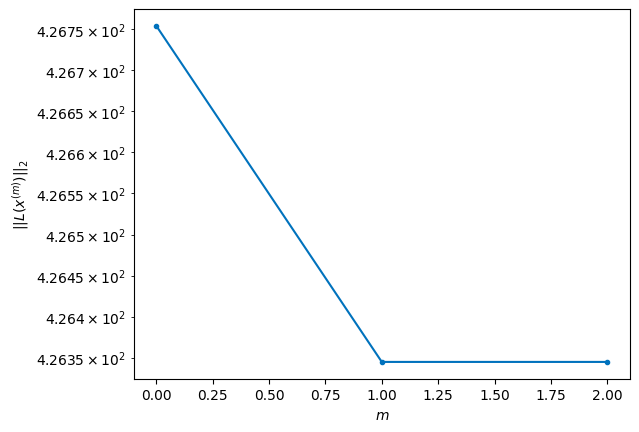

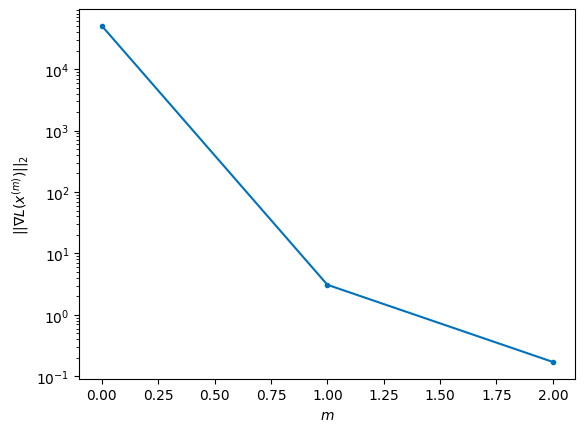


Windows:  17%|█▋        | 51/296 [10:44<35:36,  8.72s/it]

Before applying the algorithm
Cost function: 424.6098062191353
Gradient norm: 372089.26598769054
Global relative error: 1908935663.877927
Position relative errors: 0.0173283036212814 m, 0.20540312183142986 m, 0.34805453382131174 m, 0.15180813493552744 m

Iteration 1
Cost function: 423.26731670001504 (-0.32%)
Gradient norm: 2.598324205772707 (-100.00%)
Global relative error: 0.5740013810134911 (32.85%)
Position relative errors: 0.03126134898825163 m, 0.4377262789453412 m, 0.3542914158833754 m, 0.10663444109933107 m

STOP on Iteration 2
Cost function = 423.26731652082844 (-0.00%)
Gradient norm = 0.2902055900957107 (-88.83%)
Global relative error = 0.5737968672835446 (-0.04%)
Final position relative errors: 0.03126135537451021 m, 0.4375107481352884 m, 0.3542525675058577 m, 0.1065473104129872 m



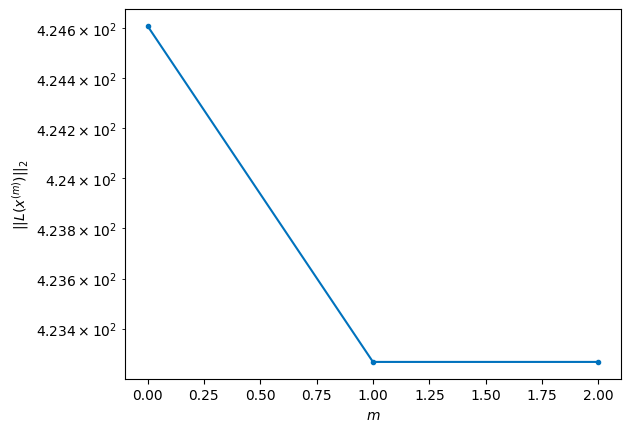

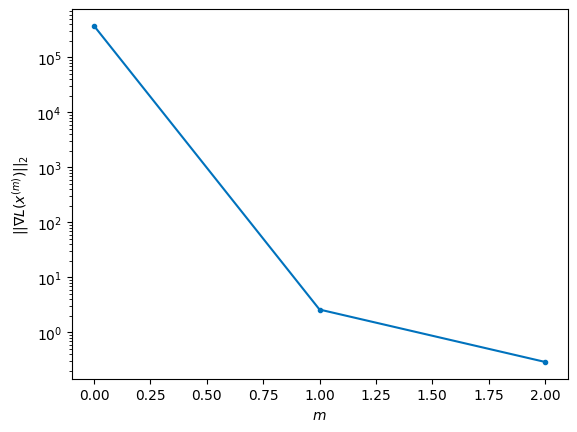


Windows:  18%|█▊        | 52/296 [10:52<33:54,  8.34s/it]

Before applying the algorithm
Cost function: 424.299815865411
Gradient norm: 59978.32240186562
Global relative error: 1909163278.926484
Position relative errors: 0.03040221608364947 m, 0.49927423098779766 m, 0.3692578855924556 m, 0.11579493244537543 m

Iteration 1
Cost function: 424.0991956276038 (-0.05%)
Gradient norm: 1.4885610431380958 (-100.00%)
Global relative error: 0.5859552151194694 (-7.35%)
Position relative errors: 0.032187321159136875 m, 0.460403156353567 m, 0.3416342744070818 m, 0.1167026567629523 m

STOP on Iteration 2
Cost function = 424.0991954294514 (-0.00%)
Gradient norm = 0.6709987347036417 (-54.92%)
Global relative error = 0.5859724583086428 (0.00%)
Final position relative errors: 0.032187320986211826 m, 0.46042563383459706 m, 0.3416339952282888 m, 0.11670137413772708 m



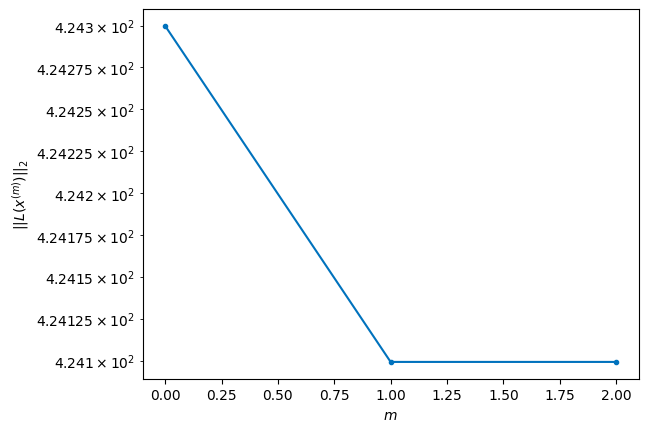

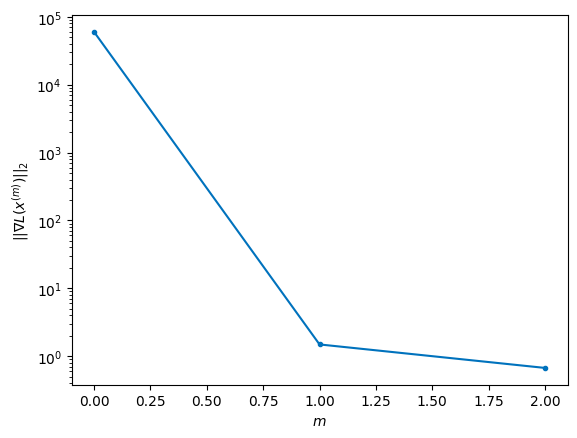


Windows:  18%|█▊        | 53/296 [11:00<33:20,  8.23s/it]

Before applying the algorithm
Cost function: 422.9622419670462
Gradient norm: 251376.91717171145
Global relative error: 1909347910.969545
Position relative errors: 0.03131693019761343 m, 0.511408432177161 m, 0.32773668583371385 m, 0.12261520917498463 m

Iteration 1
Cost function: 422.656548175766 (-0.07%)
Gradient norm: 1.266805422245141 (-100.00%)
Global relative error: 0.6634027373353308 (6.92%)
Position relative errors: 0.02579334897414678 m, 0.5437185518203324 m, 0.34022609981716045 m, 0.1674849154643106 m

Iteration 2
Cost function: 422.65654807183495 (-0.00%)
Gradient norm: 1.4022263868544373 (10.69%)
Global relative error: 0.6633981845581776 (-0.00%)
Position relative errors: 0.025793359078036066 m, 0.543715276182947 m, 0.3402226754225337 m, 0.16748447065482633 m

STOP on Iteration 3
Cost function = 422.65654830501563 (0.00%)
Gradient norm = 0.28388630200218606 (-79.75%)
Global relative error = 0.6633981850824766 (0.00%)
Final position relative errors: 0.025793357230362524 m, 0.

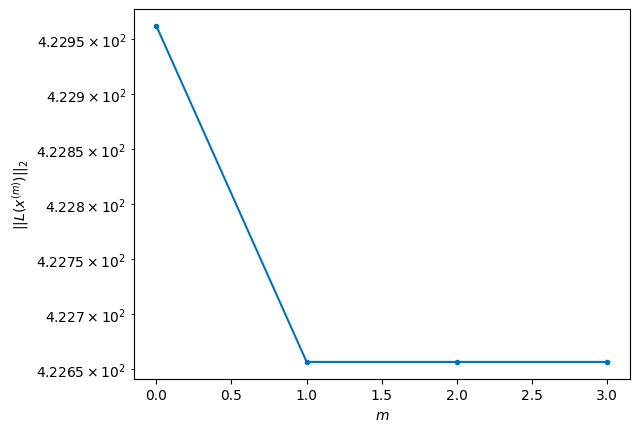

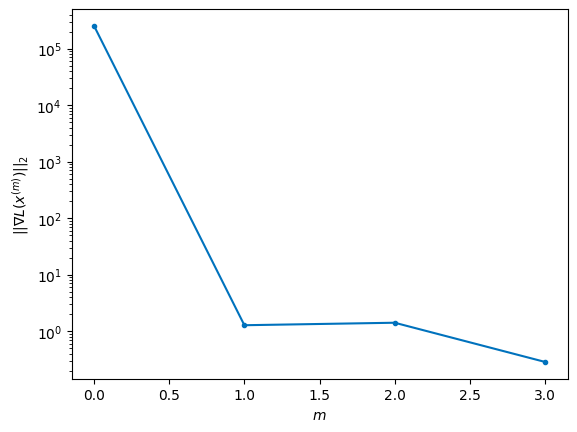


Windows:  18%|█▊        | 54/296 [11:09<33:55,  8.41s/it]

Before applying the algorithm
Cost function: 421.33486542283305
Gradient norm: 36020.29176088058
Global relative error: 1909488997.0261705
Position relative errors: 0.025619557576889312 m, 0.5897345482686757 m, 0.3005240052891612 m, 0.16424666879358887 m

STOP on Iteration 1
Cost function = 421.16206845065255 (-0.04%)
Gradient norm = 0.5660937941995768 (-100.00%)
Global relative error = 0.6687133832037263 (-2.01%)
Final position relative errors: 0.02095611622229699 m, 0.5147181553025597 m, 0.38710341424220934 m, 0.17874947759758783 m



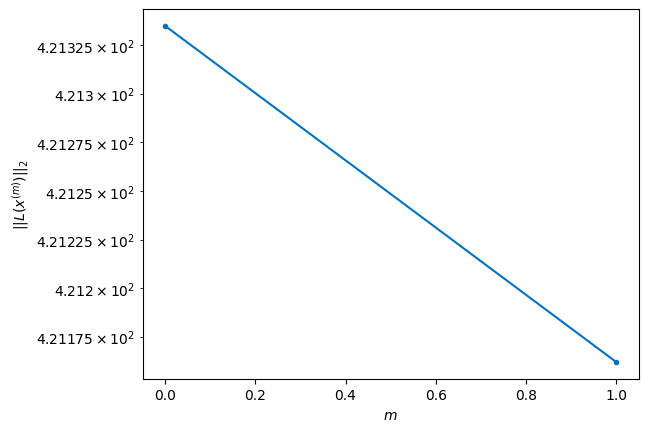

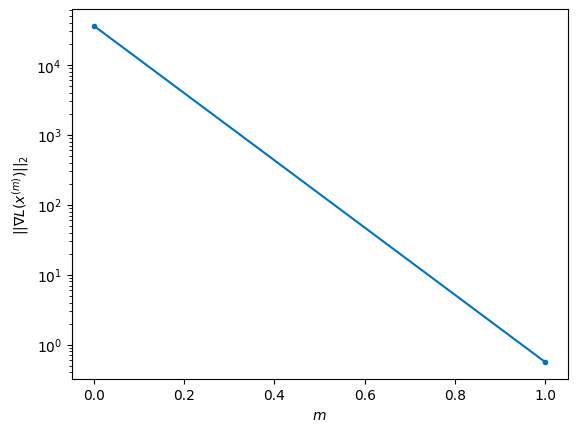


Windows:  19%|█▊        | 55/296 [11:13<29:15,  7.28s/it]

Before applying the algorithm
Cost function: 424.08960007285793
Gradient norm: 232235.14056780896
Global relative error: 1909586189.7903123
Position relative errors: 0.02107851082815887 m, 0.5635530101381865 m, 0.356968870253111 m, 0.16378320521352113 m

Iteration 1
Cost function: 423.9082427561321 (-0.04%)
Gradient norm: 1.3306649120427905 (-100.00%)
Global relative error: 0.7152466283909878 (4.08%)
Position relative errors: 0.019401927648738264 m, 0.5294488423117063 m, 0.39744117092122966 m, 0.2700416790243309 m

STOP on Iteration 2
Cost function = 423.90824272059376 (-0.00%)
Gradient norm = 0.1576402359411785 (-88.15%)
Global relative error = 0.7152430449111049 (-0.00%)
Final position relative errors: 0.0194019301898148 m, 0.5294420241809991 m, 0.3974413624595651 m, 0.2700452731709382 m



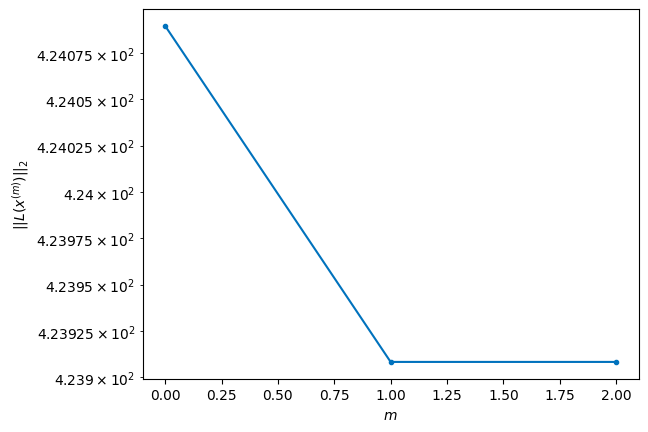

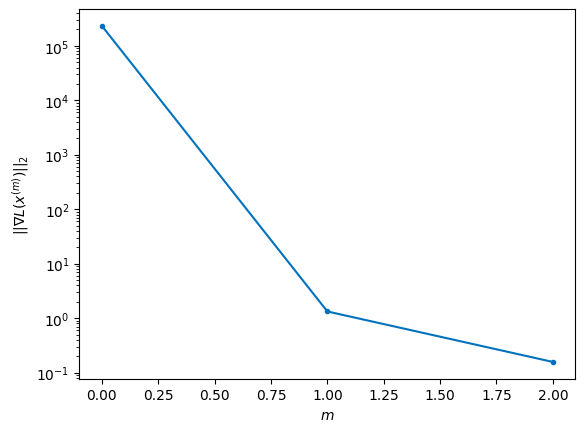


Windows:  19%|█▉        | 56/296 [11:20<28:25,  7.11s/it]

Before applying the algorithm
Cost function: 425.00869721440694
Gradient norm: 361711.6203138643
Global relative error: 1909639370.6186564
Position relative errors: 0.019757353528969825 m, 0.5836477346654251 m, 0.35374065266549154 m, 0.2486232898012396 m

Iteration 1
Cost function: 424.1850584246879 (-0.19%)
Gradient norm: 6.563102839396627 (-100.00%)
Global relative error: 0.8954746807951136 (23.24%)
Position relative errors: 0.020072548757527914 m, 0.8244790641287072 m, 0.24947053283113121 m, 0.24385957953322362 m

Iteration 2
Cost function: 424.18505844975095 (0.00%)
Gradient norm: 6.103533604095594 (-7.00%)
Global relative error: 0.8954560503373479 (-0.00%)
Position relative errors: 0.020072545781960084 m, 0.8244559532218207 m, 0.24947464748983597 m, 0.24386509412677101 m

Iteration 3
Cost function: 424.1850584009625 (-0.00%)
Gradient norm: 2.5705156579745196 (-57.88%)
Global relative error: 0.8954560526878861 (0.00%)
Position relative errors: 0.020072545823872506 m, 0.824455955610

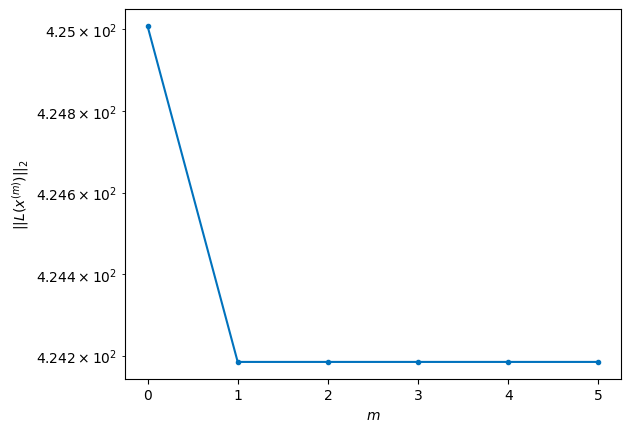

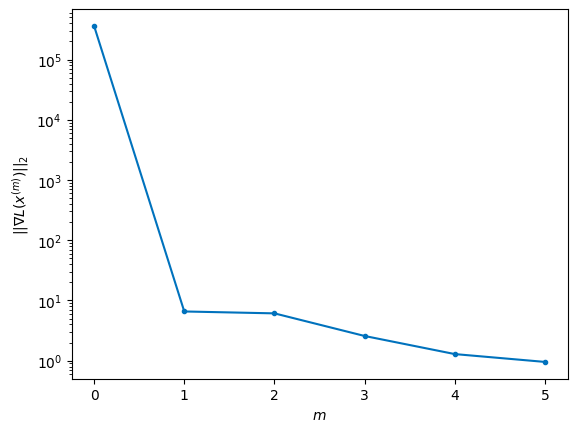


Windows:  19%|█▉        | 57/296 [11:34<37:02,  9.30s/it]

Before applying the algorithm
Cost function: 426.658384661114
Gradient norm: 151994.14575665165
Global relative error: 1909648645.6192064
Position relative errors: 0.020715525325708233 m, 0.8587259773190682 m, 0.2330479873365737 m, 0.23772276028788147 m

Iteration 1
Cost function: 426.306051853122 (-0.08%)
Gradient norm: 2.580930317606205 (-100.00%)
Global relative error: 0.8643294555591776 (-6.18%)
Position relative errors: 0.0210027434060189 m, 0.7425514420226776 m, 0.2520697552486344 m, 0.36290343061773345 m

Iteration 2
Cost function: 426.3060517394177 (-0.00%)
Gradient norm: 4.99297096277503 (93.46%)
Global relative error: 0.8643275515491878 (-0.00%)
Position relative errors: 0.02100274763024157 m, 0.742560978797083 m, 0.2520522545844374 m, 0.3628915371322515 m

STOP on Iteration 3
Cost function = 426.30605192538036 (0.00%)
Gradient norm = 0.47498234750144197 (-90.49%)
Global relative error = 0.8643275471851046 (-0.00%)
Final position relative errors: 0.02100274207890378 m, 0.7425

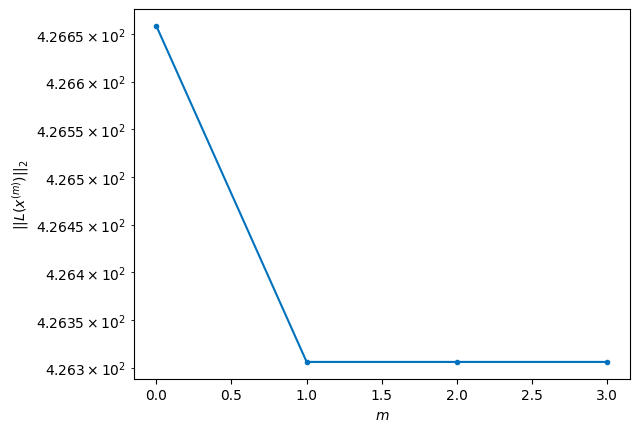

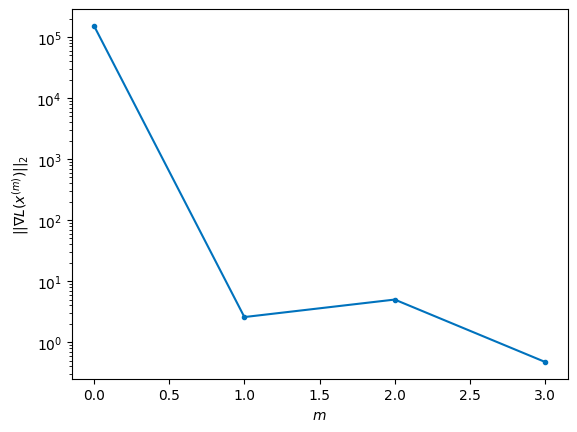


Windows:  20%|█▉        | 58/296 [11:45<38:14,  9.64s/it]

Before applying the algorithm
Cost function: 430.8301096786673
Gradient norm: 103446.04469554471
Global relative error: 1909614308.624266
Position relative errors: 0.021536009892815223 m, 0.7702953184202046 m, 0.1975927889317589 m, 0.3464061010465794 m

Iteration 1
Cost function: 430.5369226557451 (-0.07%)
Gradient norm: 2.726303039848148 (-100.00%)
Global relative error: 0.796126617174223 (-8.25%)
Position relative errors: 0.016522072897124967 m, 0.6990665608993223 m, 0.22208536285028502 m, 0.30907153021430667 m

Iteration 2
Cost function: 430.5369227078445 (0.00%)
Gradient norm: 1.5439422155331035 (-43.37%)
Global relative error: 0.7961222315176062 (-0.00%)
Position relative errors: 0.01652207329721093 m, 0.6990569846669379 m, 0.22209014746248085 m, 0.3090784547768648 m

STOP on Iteration 3
Cost function = 430.53692245106254 (-0.00%)
Gradient norm = 0.7831297902286111 (-49.28%)
Global relative error = 0.7961222275736195 (-0.00%)
Final position relative errors: 0.016522074501810424 m,

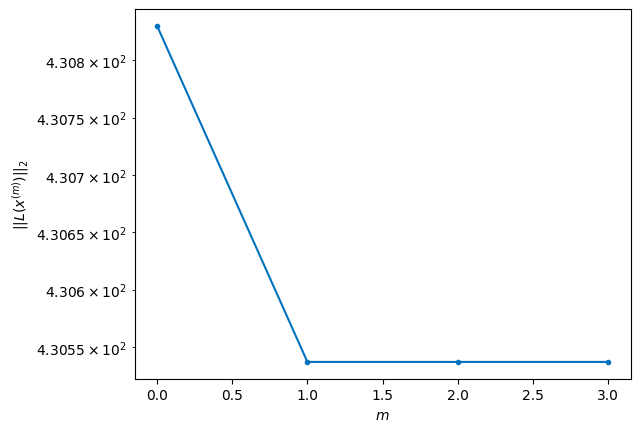

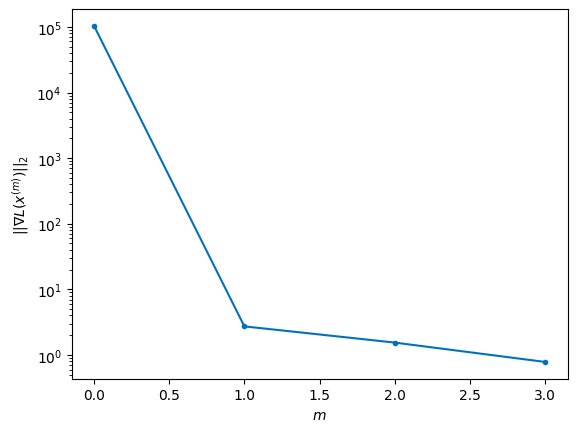


Windows:  20%|█▉        | 59/296 [11:55<38:17,  9.70s/it]

Before applying the algorithm
Cost function: 432.0712445558746
Gradient norm: 46116.13488427576
Global relative error: 1909536872.5716991
Position relative errors: 0.017103162874107042 m, 0.7239901829657808 m, 0.18210969433044608 m, 0.29431198067409037 m

Iteration 1
Cost function: 431.6079225923564 (-0.11%)
Gradient norm: 1.78244657951309 (-100.00%)
Global relative error: 0.8609052378238944 (7.26%)
Position relative errors: 0.020603544661742298 m, 0.76364449780996 m, 0.06690939329312527 m, 0.3912803915634755 m

Iteration 2
Cost function: 431.60792238806556 (-0.00%)
Gradient norm: 1.0292588689771716 (-42.26%)
Global relative error: 0.8609055105540115 (0.00%)
Position relative errors: 0.02060354203679891 m, 0.7636446645990188 m, 0.06690702108207969 m, 0.39128107192780853 m

Iteration 3
Cost function: 431.60792265812063 (0.00%)
Gradient norm: 6.519238705949074 (533.39%)
Global relative error: 0.8609055160192078 (0.00%)
Position relative errors: 0.020603543586914873 m, 0.7636446672045321 

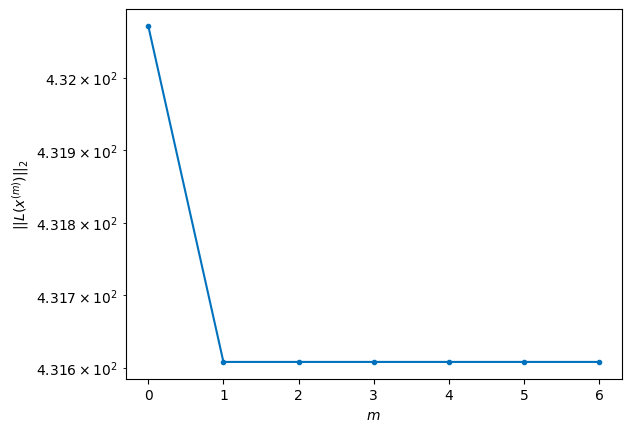

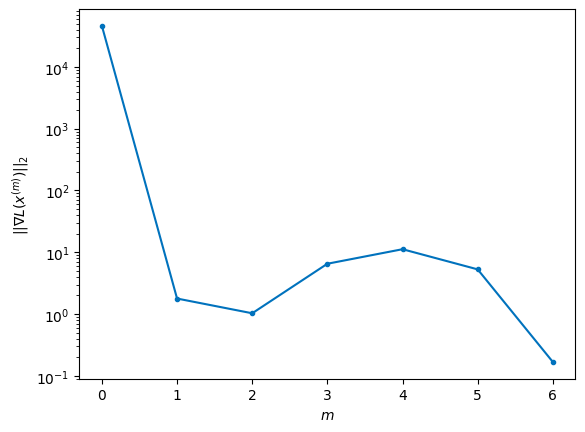


Windows:  20%|██        | 60/296 [12:09<44:08, 11.22s/it]

Before applying the algorithm
Cost function: 432.7993286258155
Gradient norm: 279303.27264996566
Global relative error: 1909417051.59612
Position relative errors: 0.02098785961535189 m, 0.7723314609412909 m, 0.05324537123256121 m, 0.37522936627372755 m

Iteration 1
Cost function: 432.500263354686 (-0.07%)
Gradient norm: 2.4478469254738577 (-100.00%)
Global relative error: 0.9057180140332112 (5.25%)
Position relative errors: 0.018174870882401484 m, 0.8349208963215007 m, 0.1227156468233037 m, 0.32839002269488854 m

STOP on Iteration 2
Cost function = 432.5002632797489 (-0.00%)
Gradient norm = 0.5290867907657817 (-78.39%)
Global relative error = 0.9057165978591725 (-0.00%)
Final position relative errors: 0.018174870654039978 m, 0.834920288593159 m, 0.12271746184987982 m, 0.3283869836834667 m



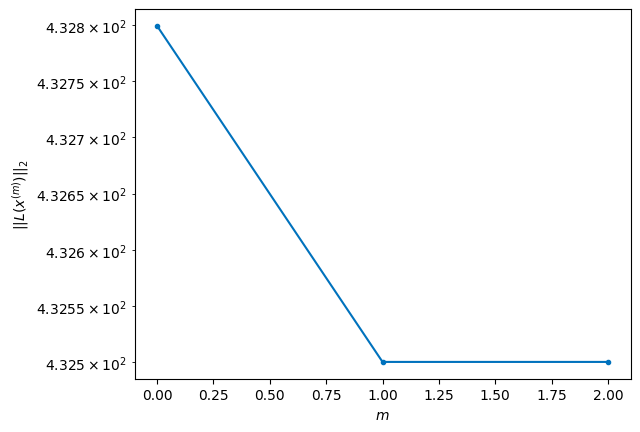

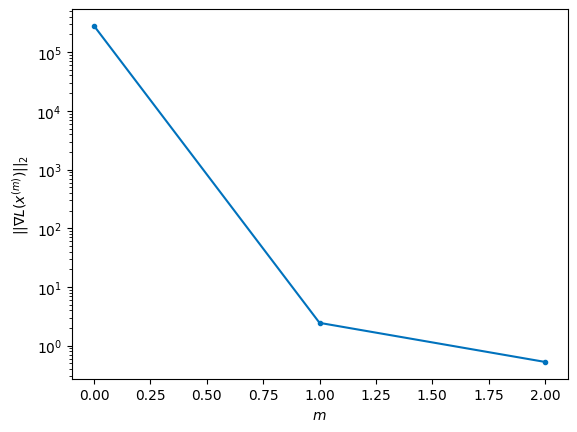


Windows:  21%|██        | 61/296 [12:16<38:27,  9.82s/it]

Before applying the algorithm
Cost function: 434.9821520485206
Gradient norm: 144980.89808951414
Global relative error: 1909255726.2479355
Position relative errors: 0.01845624548685232 m, 0.8540085311954771 m, 0.17890113329606197 m, 0.32710044739507355 m

Iteration 1
Cost function: 434.38309152496475 (-0.14%)
Gradient norm: 4.479011456397794 (-100.00%)
Global relative error: 0.9793113040004973 (5.07%)
Position relative errors: 0.017243012453312664 m, 0.8131852996582835 m, 0.18988868099570974 m, 0.511294735043128 m

Iteration 2
Cost function: 434.3830917990827 (0.00%)
Gradient norm: 2.535874123463347 (-43.38%)
Global relative error: 0.9792993655047795 (-0.00%)
Position relative errors: 0.017243012862961423 m, 0.8131758752908717 m, 0.18988417776601527 m, 0.511288529855903 m

STOP on Iteration 3
Cost function = 434.3830921029971 (0.00%)
Gradient norm = 0.8367507380449978 (-67.00%)
Global relative error = 0.9792993852617503 (0.00%)
Final position relative errors: 0.01724301132190406 m, 0.8

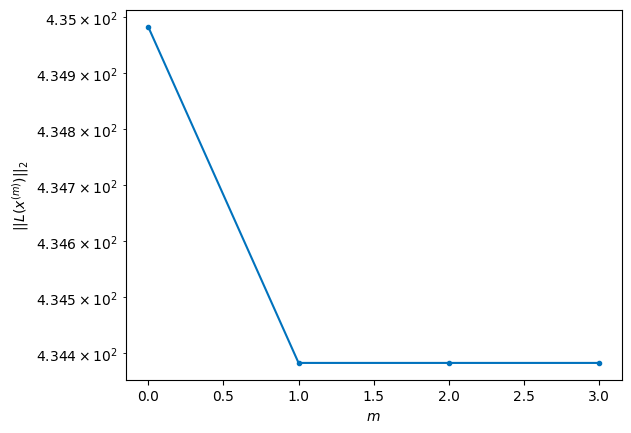

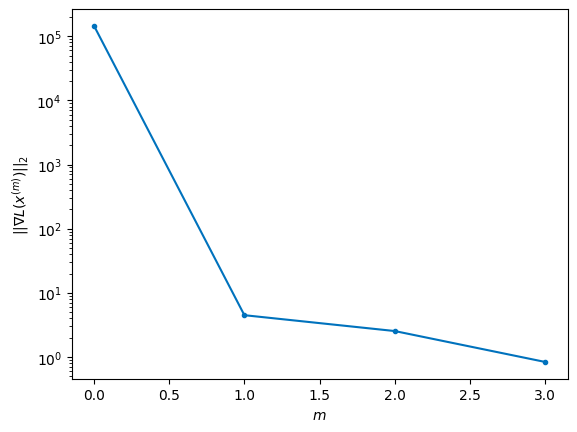


Windows:  21%|██        | 62/296 [12:25<37:28,  9.61s/it]

Before applying the algorithm
Cost function: 440.029180030209
Gradient norm: 353554.09784127533
Global relative error: 1909053969.9831214
Position relative errors: 0.01738723176642328 m, 0.8318258226856515 m, 0.2474337849057853 m, 0.5141930109293262 m

Iteration 1
Cost function: 439.02820319778874 (-0.23%)
Gradient norm: 7.2379021511598065 (-100.00%)
Global relative error: 1.2032011821065274 (19.26%)
Position relative errors: 0.0202201467106951 m, 0.811788789368004 m, 0.21034857164274026 m, 0.8625734485411901 m

Iteration 2
Cost function: 439.0282035870748 (0.00%)
Gradient norm: 5.0728770079963095 (-29.91%)
Global relative error: 1.2031955694026901 (-0.00%)
Position relative errors: 0.02022014739690207 m, 0.8117934433419018 m, 0.21035278371038932 m, 0.8625602121923136 m

Iteration 3
Cost function: 439.0282037804164 (0.00%)
Gradient norm: 1.9479462076391765 (-61.60%)
Global relative error: 1.2031955959006444 (0.00%)
Position relative errors: 0.02022014696313077 m, 0.8117934500620341 m, 

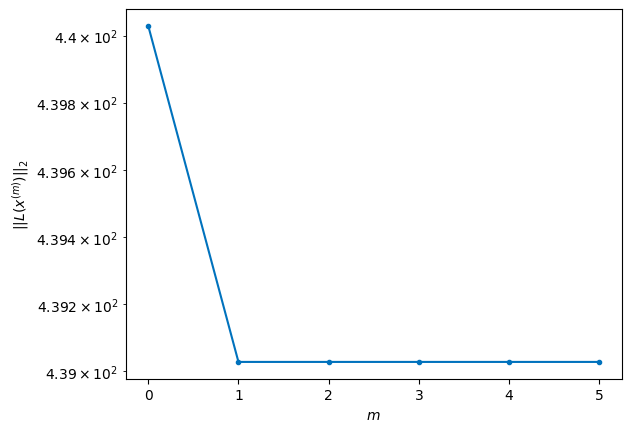

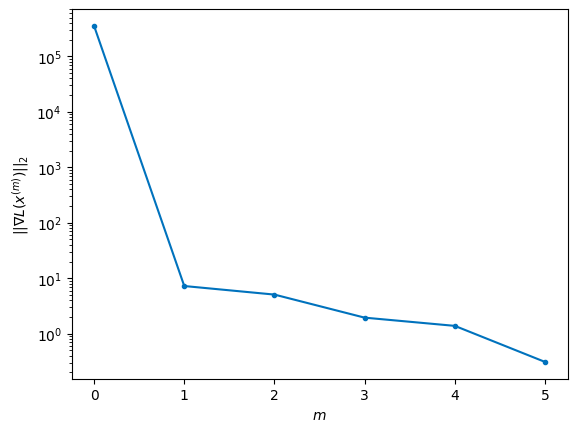


Windows:  21%|██▏       | 63/296 [12:39<41:46, 10.76s/it]

Before applying the algorithm
Cost function: 439.2113280057926
Gradient norm: 107019.85223194744
Global relative error: 1908813011.2901428
Position relative errors: 0.020323596801429585 m, 0.8315368963960975 m, 0.27313869737298785 m, 0.8752786295165432 m

Iteration 1
Cost function: 438.6509766552362 (-0.13%)
Gradient norm: 5.425636715231499 (-99.99%)
Global relative error: 1.250470376734435 (1.01%)
Position relative errors: 0.019222349600398207 m, 0.8598660485358746 m, 0.33184172112493554 m, 0.8448762416192214 m

Iteration 2
Cost function: 438.65097700448695 (0.00%)
Gradient norm: 3.6358456018196597 (-32.99%)
Global relative error: 1.2504834773539626 (0.00%)
Position relative errors: 0.01922234902442535 m, 0.8598780468323747 m, 0.3318411039416555 m, 0.8448836625900258 m

STOP on Iteration 3
Cost function = 438.650976824846 (-0.00%)
Gradient norm = 0.4786864584716373 (-86.83%)
Global relative error = 1.2504834875297135 (0.00%)
Final position relative errors: 0.01922234938538504 m, 0.859

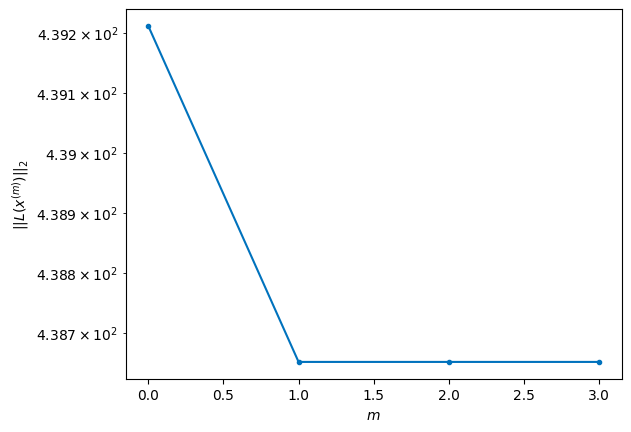

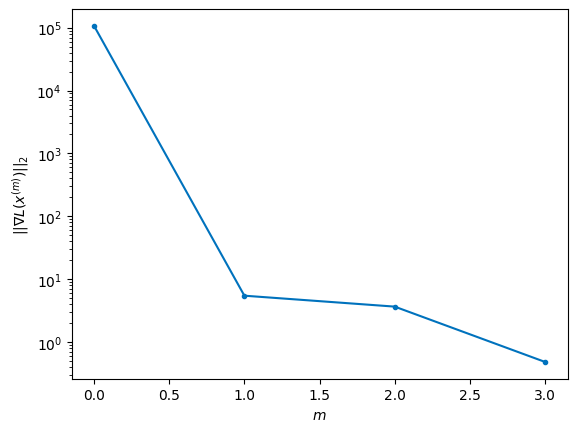


Windows:  22%|██▏       | 64/296 [12:46<38:09,  9.87s/it]

Before applying the algorithm
Cost function: 441.1743599947216
Gradient norm: 416758.00753150176
Global relative error: 1908534228.8809438
Position relative errors: 0.01919595555779149 m, 0.8862350418154078 m, 0.3825657234347116 m, 0.8495338425807066 m

Iteration 1
Cost function: 440.8434960228227 (-0.07%)
Gradient norm: 1.201637385228554 (-100.00%)
Global relative error: 1.25453849557734 (-2.45%)
Position relative errors: 0.019480575127859823 m, 0.8753334039045598 m, 0.3232128427067748 m, 0.8383374818138206 m

Iteration 2
Cost function: 440.8434961088379 (0.00%)
Gradient norm: 2.1971536744092734 (82.85%)
Global relative error: 1.2545383697879444 (-0.00%)
Position relative errors: 0.019480573849333657 m, 0.8753313918160778 m, 0.323214788510804 m, 0.8383386442808809 m

Iteration 3
Cost function: 440.8434959835337 (-0.00%)
Gradient norm: 4.229850437366695 (92.52%)
Global relative error: 1.2545383592932604 (-0.00%)
Position relative errors: 0.019480573881221867 m, 0.8753314009901395 m, 0.

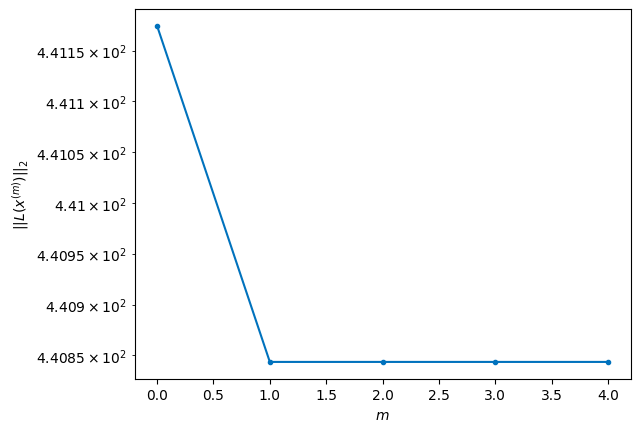

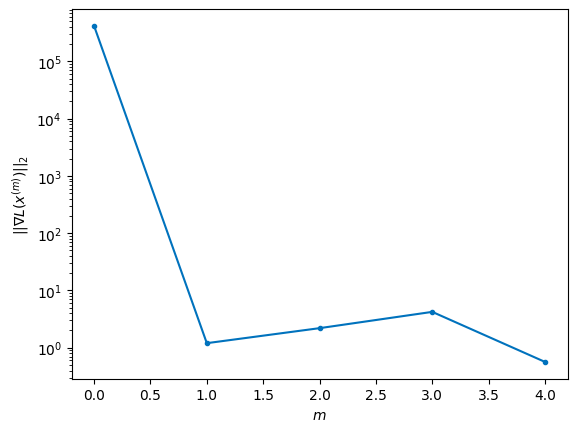


Windows:  22%|██▏       | 65/296 [12:56<37:20,  9.70s/it]

Before applying the algorithm
Cost function: 442.709323581833
Gradient norm: 207337.33308131344
Global relative error: 1908219148.1640458
Position relative errors: 0.01942954991541414 m, 0.9019588592258547 m, 0.3726820270171887 m, 0.8455710525622195 m

Iteration 1
Cost function: 442.2876444055752 (-0.10%)
Gradient norm: 3.055998167015938 (-100.00%)
Global relative error: 1.1332193615141375 (-12.25%)
Position relative errors: 0.019276750369058394 m, 0.8912922213272119 m, 0.3491154524737007 m, 0.6062421125271529 m

STOP on Iteration 2
Cost function = 442.28764437194127 (-0.00%)
Gradient norm = 0.37814622568984807 (-87.63%)
Global relative error = 1.1332332364655238 (0.00%)
Final position relative errors: 0.019276750817673948 m, 0.8913043842537157 m, 0.3491200916440711 m, 0.6062474949255378 m



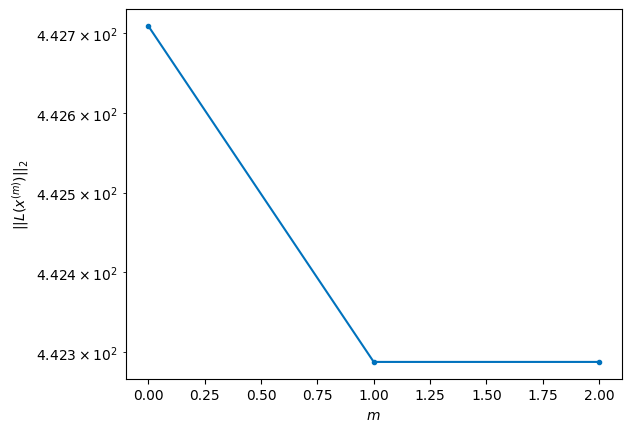

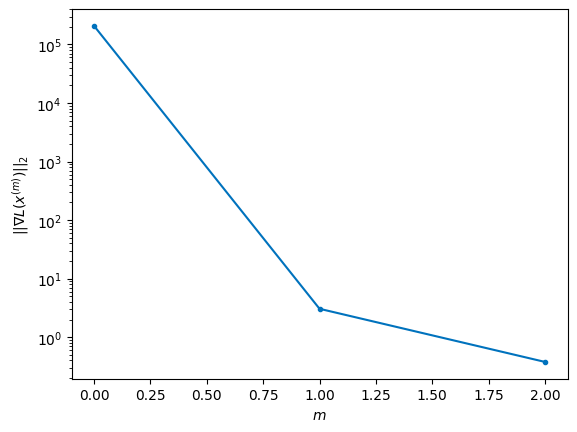


Windows:  22%|██▏       | 66/296 [13:02<32:49,  8.56s/it]

Before applying the algorithm
Cost function: 442.6429674975767
Gradient norm: 202565.45773514523
Global relative error: 1907869415.4710999
Position relative errors: 0.019126444633009772 m, 0.9155067832524715 m, 0.39996774610382246 m, 0.6054834494459389 m

STOP on Iteration 1
Cost function = 442.43428077498345 (-0.05%)
Gradient norm = 0.6878994254686527 (-100.00%)
Global relative error = 1.0850852309534529 (-7.13%)
Final position relative errors: 0.020868087531914506 m, 0.8445510743363889 m, 0.3716916399910821 m, 0.5705714831035722 m



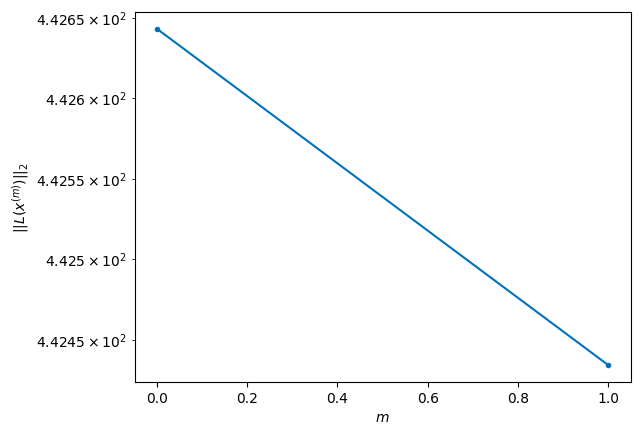

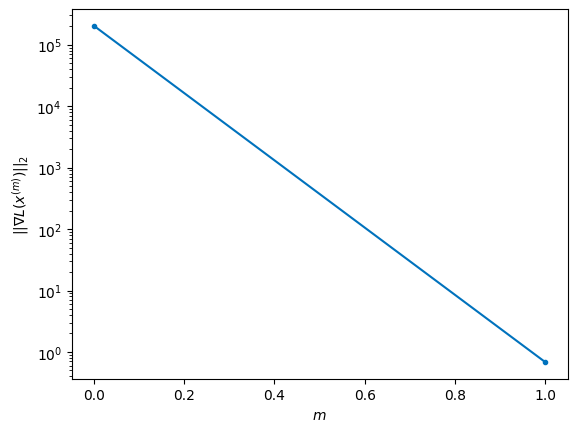


Windows:  23%|██▎       | 67/296 [13:06<27:30,  7.21s/it]

Before applying the algorithm
Cost function: 444.05507930574
Gradient norm: 261026.40969298087
Global relative error: 1907486808.177325
Position relative errors: 0.020645701124572157 m, 0.8652618471197439 m, 0.42150527294189943 m, 0.564685572050393 m

Iteration 1
Cost function: 443.70049999458337 (-0.08%)
Gradient norm: 2.0728152178449624 (-100.00%)
Global relative error: 1.0954966766664267 (-1.84%)
Position relative errors: 0.020278208302545783 m, 0.8544543354528145 m, 0.4178174584936551 m, 0.5431730388977417 m

Iteration 2
Cost function: 443.70049990188306 (-0.00%)
Gradient norm: 2.38121146258808 (14.88%)
Global relative error: 1.0954990886387619 (0.00%)
Position relative errors: 0.020278205842083244 m, 0.8544564623421004 m, 0.4178174584072588 m, 0.5431745578636161 m

STOP on Iteration 3
Cost function = 443.7005000148623 (0.00%)
Gradient norm = 0.8357392257186844 (-64.90%)
Global relative error = 1.0954990848840027 (-0.00%)
Final position relative errors: 0.020278207253595647 m, 0.85

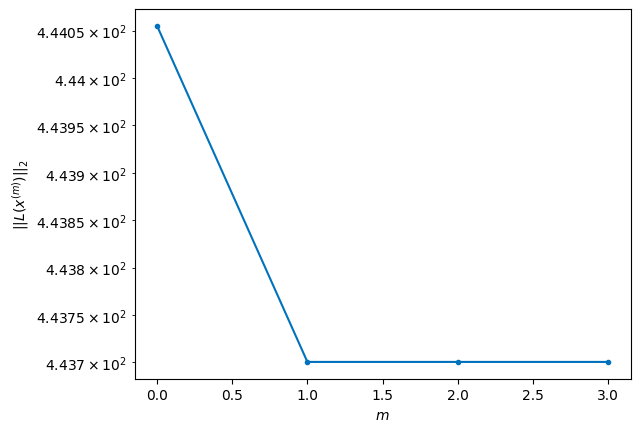

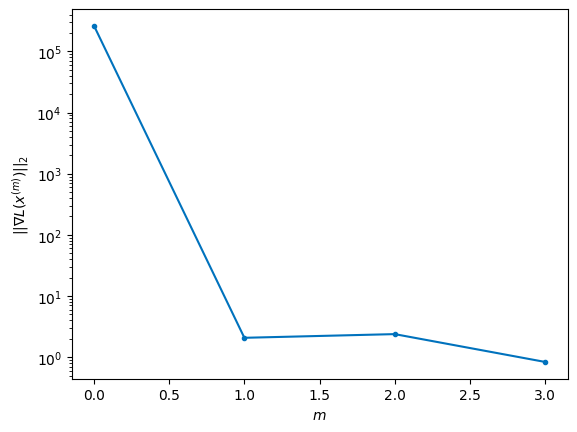


Windows:  23%|██▎       | 68/296 [13:13<27:46,  7.31s/it]

Before applying the algorithm
Cost function: 446.6320351514737
Gradient norm: 83764.11590108127
Global relative error: 1907073185.6123693
Position relative errors: 0.019634544320427636 m, 0.8740224446934459 m, 0.4689370452320609 m, 0.5411196258148022 m

Iteration 1
Cost function: 446.31614408924855 (-0.07%)
Gradient norm: 5.984265534659738 (-99.99%)
Global relative error: 0.8270398370651766 (-26.81%)
Position relative errors: 0.01975865225735295 m, 0.6490131204789062 m, 0.39886845742642035 m, 0.3213864347885021 m

STOP on Iteration 2
Cost function = 446.31614386514957 (-0.00%)
Gradient norm = 0.6244508571080303 (-89.57%)
Global relative error = 0.8270513924716321 (0.00%)
Final position relative errors: 0.019758650493106513 m, 0.6490231641322598 m, 0.3988783720975019 m, 0.3213835836825759 m



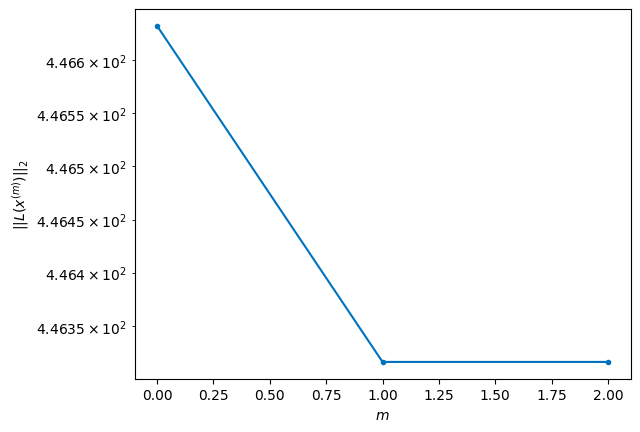

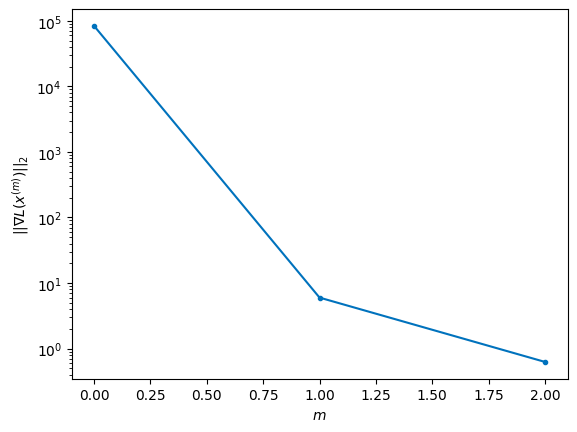


Windows:  23%|██▎       | 69/296 [13:19<26:06,  6.90s/it]

Before applying the algorithm
Cost function: 437.6011386261817
Gradient norm: 56141.793363798795
Global relative error: 1906630519.437377
Position relative errors: 0.019099183632017024 m, 0.6643540289773334 m, 0.4427366899349107 m, 0.3123589745764756 m

Iteration 1
Cost function: 436.77344444417366 (-0.19%)
Gradient norm: 9.723799145803524 (-99.98%)
Global relative error: 0.8946049378127325 (4.33%)
Position relative errors: 0.02475964050363743 m, 0.6890366358915401 m, 0.37330472720523983 m, 0.43078533167539484 m

Iteration 2
Cost function: 436.77344439632736 (-0.00%)
Gradient norm: 3.78194323044745 (-61.11%)
Global relative error: 0.8946030013639431 (-0.00%)
Position relative errors: 0.024759641793145423 m, 0.689035183337902 m, 0.3733147237954749 m, 0.43077497060176856 m

Iteration 3
Cost function: 436.77344438674623 (-0.00%)
Gradient norm: 1.9547157668931643 (-48.31%)
Global relative error: 0.8946029950576689 (-0.00%)
Position relative errors: 0.024759642549369066 m, 0.689035176738598

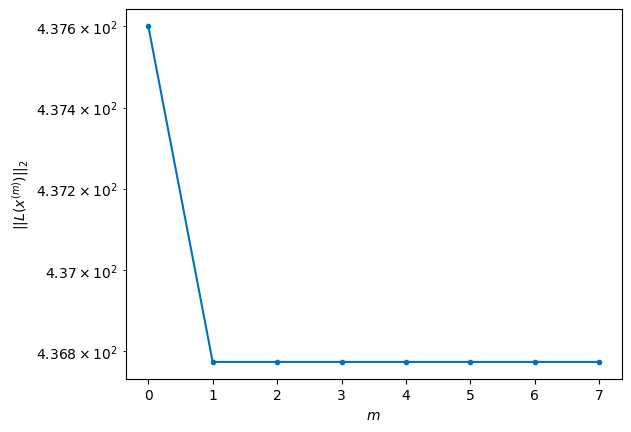

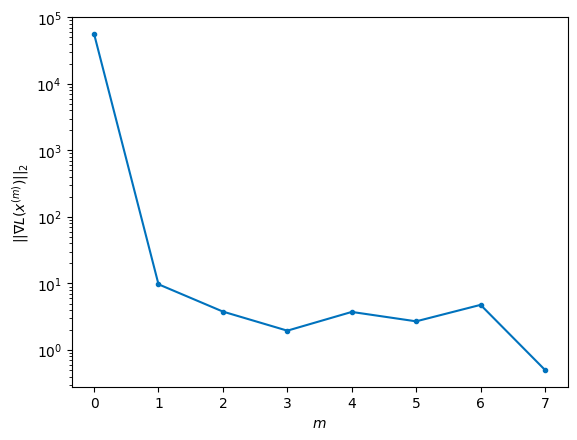


Windows:  24%|██▎       | 70/296 [13:34<35:03,  9.31s/it]

Before applying the algorithm
Cost function: 432.2857260323026
Gradient norm: 189114.19143434693
Global relative error: 1906160845.6089957
Position relative errors: 0.02425933032529506 m, 0.6913988708195676 m, 0.4069667747113389 m, 0.4140150646218091 m

Iteration 1
Cost function: 431.2927682985003 (-0.23%)
Gradient norm: 12.960778258619696 (-99.99%)
Global relative error: 1.1095802032777038 (22.86%)
Position relative errors: 0.026517688259394392 m, 0.7711350837609365 m, 0.539195861670537 m, 0.5874366112340665 m

STOP on Iteration 2
Cost function = 431.2927684742431 (0.00%)
Gradient norm = 0.6424555839928558 (-95.04%)
Global relative error = 1.109575599016737 (-0.00%)
Final position relative errors: 0.026517683785800564 m, 0.7711280259697009 m, 0.5391970393378962 m, 0.5874360985602671 m



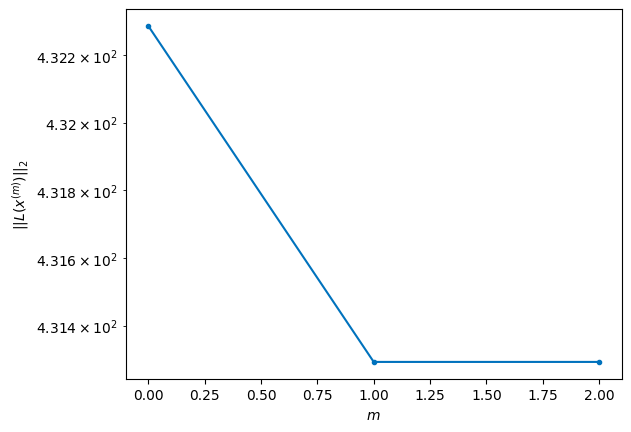

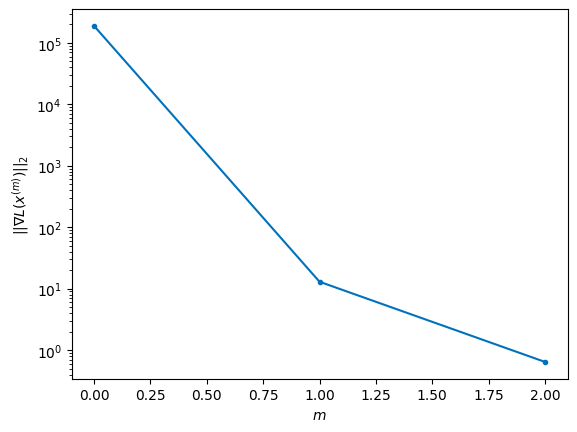


Windows:  24%|██▍       | 71/296 [13:40<31:16,  8.34s/it]

Before applying the algorithm
Cost function: 433.60441589741083
Gradient norm: 106599.24658116879
Global relative error: 1905666280.3480468
Position relative errors: 0.025740173261112328 m, 0.7587880409775983 m, 0.5588752276141116 m, 0.5419420688879674 m

Iteration 1
Cost function: 433.2449526324372 (-0.08%)
Gradient norm: 1.9930566602214579 (-100.00%)
Global relative error: 1.1971868955669507 (10.09%)
Position relative errors: 0.02724357686474569 m, 0.8881464359403579 m, 0.5347006397203433 m, 0.5981672494838285 m

STOP on Iteration 2
Cost function = 433.2449526361188 (0.00%)
Gradient norm = 0.2324268728858806 (-88.34%)
Global relative error = 1.1972002652644724 (0.00%)
Final position relative errors: 0.027243575824279675 m, 0.8881561147131308 m, 0.5347054861082686 m, 0.5981753049473197 m



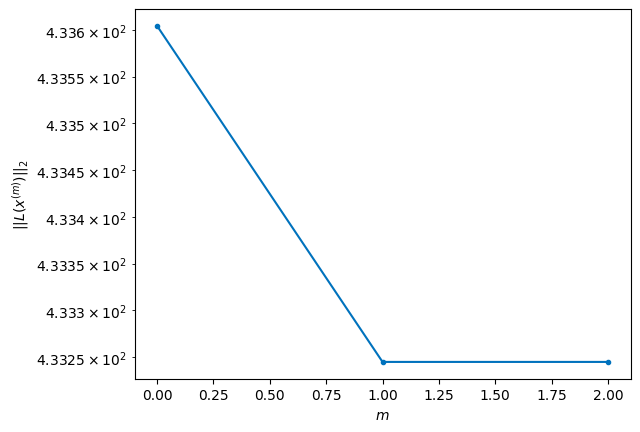

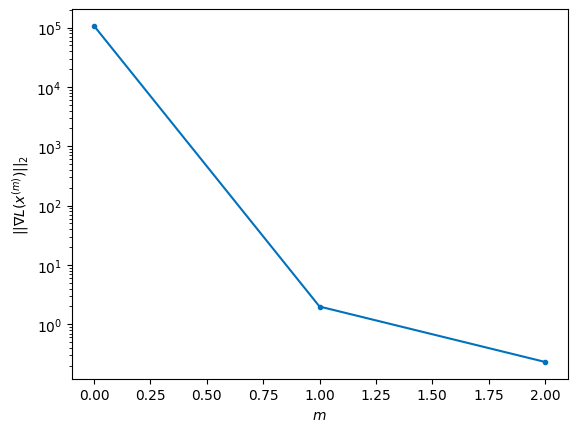


Windows:  24%|██▍       | 72/296 [13:46<28:28,  7.63s/it]

Before applying the algorithm
Cost function: 429.1967069779288
Gradient norm: 368686.7652883999
Global relative error: 1905148996.5408785
Position relative errors: 0.026158754048508828 m, 0.8743456455844045 m, 0.5727129092801713 m, 0.5589593100830753 m

Iteration 1
Cost function: 428.7482169093473 (-0.10%)
Gradient norm: 2.7159009997050876 (-100.00%)
Global relative error: 1.0645176237590566 (-10.21%)
Position relative errors: 0.024137009601513968 m, 0.8217757267091007 m, 0.5141713771607895 m, 0.4392340562444605 m

STOP on Iteration 2
Cost function = 428.74821688808106 (-0.00%)
Gradient norm = 0.5900976914971893 (-78.27%)
Global relative error = 1.0645193819730727 (0.00%)
Final position relative errors: 0.024137013824139346 m, 0.8217764065622012 m, 0.5141731683997591 m, 0.4392349483917916 m



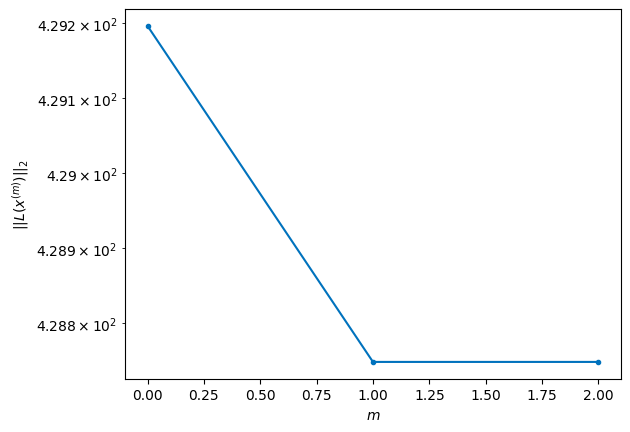

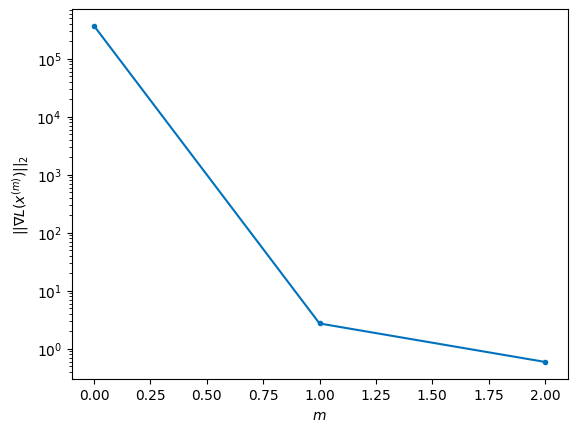


Windows:  25%|██▍       | 73/296 [13:52<26:30,  7.13s/it]

Before applying the algorithm
Cost function: 426.1411518666959
Gradient norm: 24308.431127150303
Global relative error: 1904611221.3233562
Position relative errors: 0.023173492710836473 m, 0.8053611553499214 m, 0.5511294640009058 m, 0.4124915036805844 m

Iteration 1
Cost function: 425.60431680832016 (-0.13%)
Gradient norm: 5.994381597691813 (-99.98%)
Global relative error: 1.1212804697771441 (5.81%)
Position relative errors: 0.027757125327890764 m, 0.761803352033567 m, 0.6074383198792058 m, 0.5542310512374011 m

Iteration 2
Cost function: 425.6043170233417 (0.00%)
Gradient norm: 1.7574606769320908 (-70.68%)
Global relative error: 1.121286910393429 (0.00%)
Position relative errors: 0.02775712358678928 m, 0.76180869473302 m, 0.6074415137979137 m, 0.5542332373544592 m

STOP on Iteration 3
Cost function = 425.60431699899556 (-0.00%)
Gradient norm = 0.3136333876098015 (-82.15%)
Global relative error = 1.1212868959236506 (-0.00%)
Final position relative errors: 0.027757120343095677 m, 0.7618

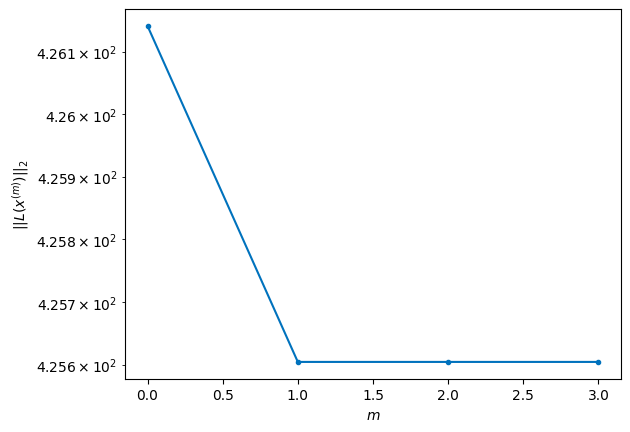

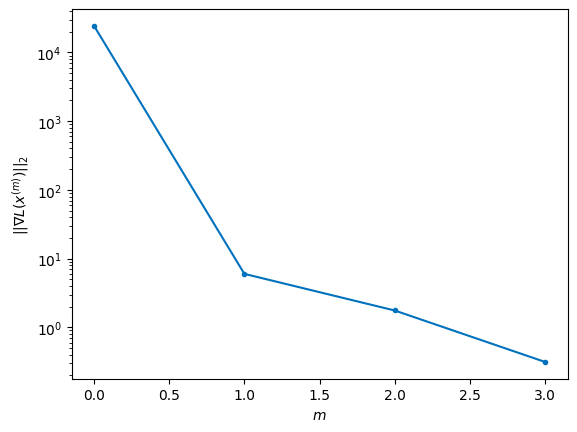


Windows:  25%|██▌       | 74/296 [13:59<26:45,  7.23s/it]

Before applying the algorithm
Cost function: 423.47929497794956
Gradient norm: 38727.38878583314
Global relative error: 1904055211.89027
Position relative errors: 0.026639526943313754 m, 0.7333185606499772 m, 0.6414859705131851 m, 0.5007368052020261 m

Iteration 1
Cost function: 423.1381534825353 (-0.08%)
Gradient norm: 1.7176211461185698 (-100.00%)
Global relative error: 1.1605438360604239 (5.91%)
Position relative errors: 0.03470123451923096 m, 0.8529470653382608 m, 0.5929093622413933 m, 0.5163294536898682 m

Iteration 2
Cost function: 423.13815360221867 (0.00%)
Gradient norm: 2.764354015586069 (60.94%)
Global relative error: 1.1605546708886998 (0.00%)
Position relative errors: 0.03470124413479107 m, 0.8529542339279897 m, 0.5929141464280205 m, 0.5163364703835537 m

Iteration 3
Cost function: 423.1381536164761 (0.00%)
Gradient norm: 1.8581632163939317 (-32.78%)
Global relative error: 1.1605546473795132 (-0.00%)
Position relative errors: 0.034701242821689605 m, 0.8529542254733646 m, 0.

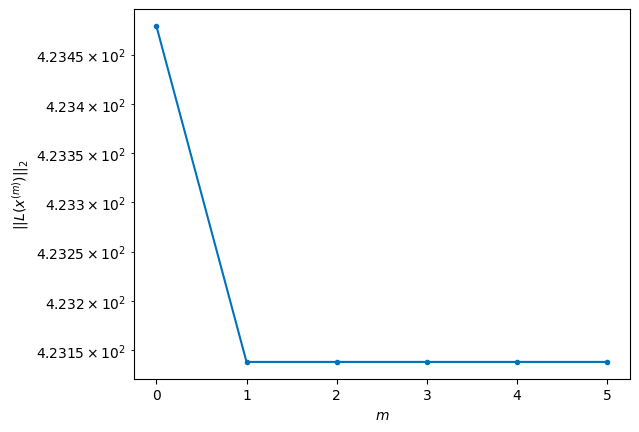

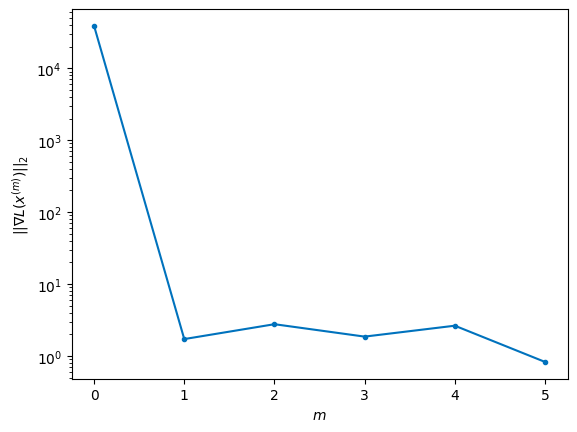


Windows:  25%|██▌       | 75/296 [14:10<30:45,  8.35s/it]

Before applying the algorithm
Cost function: 422.1534666755602
Gradient norm: 44954.12017726809
Global relative error: 1903483269.9793515
Position relative errors: 0.03348350285830175 m, 0.8134546291101964 m, 0.6279018423382094 m, 0.4692591166620058 m

Iteration 1
Cost function: 421.8755512205636 (-0.07%)
Gradient norm: 3.489369040798247 (-99.99%)
Global relative error: 1.2827038113363116 (13.50%)
Position relative errors: 0.022885490770594867 m, 0.8743220103712983 m, 0.6990439186377421 m, 0.6258614123794041 m

Iteration 2
Cost function: 421.8755513063153 (0.00%)
Gradient norm: 3.4375633523548186 (-1.48%)
Global relative error: 1.2827061973269174 (0.00%)
Position relative errors: 0.022885492048617194 m, 0.8743240050765871 m, 0.6990458825422311 m, 0.6258613222887777 m

Iteration 3
Cost function: 421.8755510874369 (-0.00%)
Gradient norm: 4.15214270570415 (20.79%)
Global relative error: 1.2827061888556917 (-0.00%)
Position relative errors: 0.02288549656790695 m, 0.8743240036134691 m, 0.69

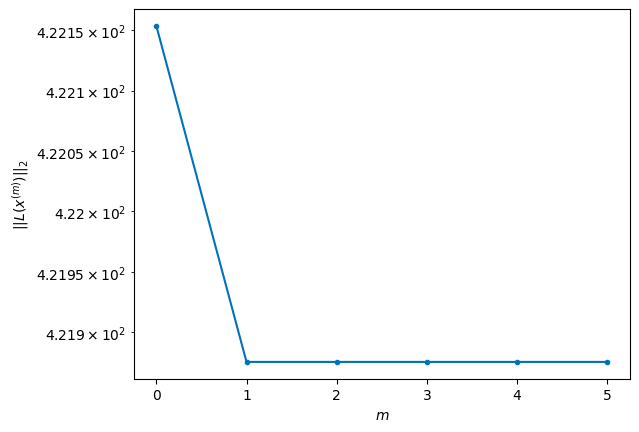

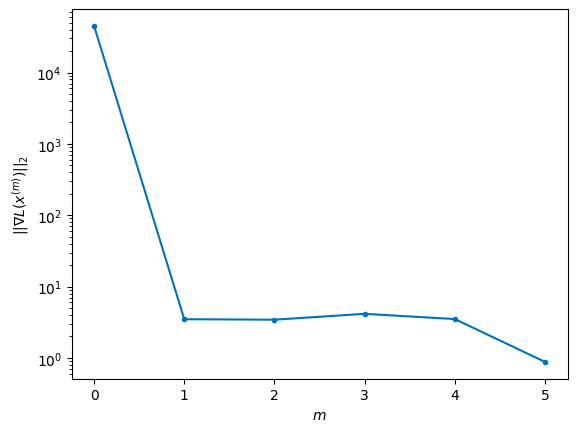


Windows:  26%|██▌       | 76/296 [14:21<33:31,  9.14s/it]

Before applying the algorithm
Cost function: 426.2423582661688
Gradient norm: 112475.02954535618
Global relative error: 1902897720.631712
Position relative errors: 0.02199001823801175 m, 0.8284903750698428 m, 0.7342178512444156 m, 0.5880172606517171 m

Iteration 1
Cost function: 425.2410015865705 (-0.23%)
Gradient norm: 7.88343809519636 (-99.99%)
Global relative error: 1.3383819169532378 (6.76%)
Position relative errors: 0.025596447723035272 m, 0.8372732475159668 m, 0.8619831928118741 m, 0.5886999826544259 m

STOP on Iteration 2
Cost function = 425.2410016763304 (0.00%)
Gradient norm = 0.12830712246321233 (-98.37%)
Global relative error = 1.338435241178926 (0.00%)
Final position relative errors: 0.025596444352119926 m, 0.8373118862134228 m, 0.8620040328209093 m, 0.5887357448409469 m



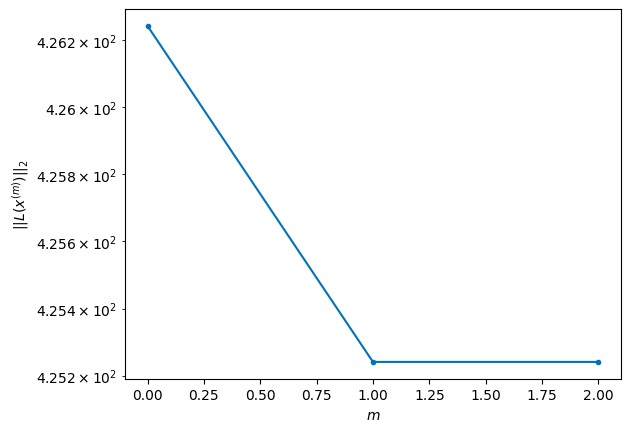

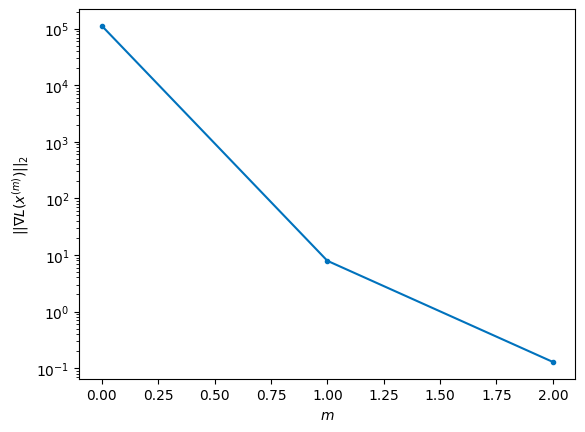


Windows:  26%|██▌       | 77/296 [14:27<29:50,  8.18s/it]

Before applying the algorithm
Cost function: 423.5875156103975
Gradient norm: 75938.78161398697
Global relative error: 1902300906.1517696
Position relative errors: 0.02456186231364994 m, 0.8031993088976912 m, 0.8938683836779777 m, 0.5394372801259331 m

Iteration 1
Cost function: 423.2751268834456 (-0.07%)
Gradient norm: 11.873682429087888 (-99.98%)
Global relative error: 1.7091776150019984 (29.73%)
Position relative errors: 0.026541743105223798 m, 1.051616430616853 m, 1.0794274716486196 m, 0.8059283918112532 m

Iteration 2
Cost function: 423.27512712677174 (0.00%)
Gradient norm: 3.800610775112082 (-67.99%)
Global relative error: 1.7091924394334514 (0.00%)
Position relative errors: 0.02654173485547876 m, 1.0516250833907204 m, 1.0794387686066742 m, 0.8059334098321385 m

Iteration 3
Cost function: 423.2751270543496 (-0.00%)
Gradient norm: 2.856096143260432 (-24.85%)
Global relative error: 1.7091924243017893 (-0.00%)
Position relative errors: 0.0265417383232577 m, 1.0516250795247795 m, 1.0

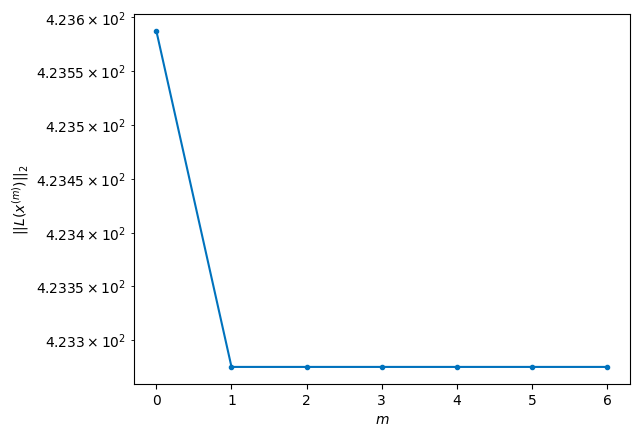

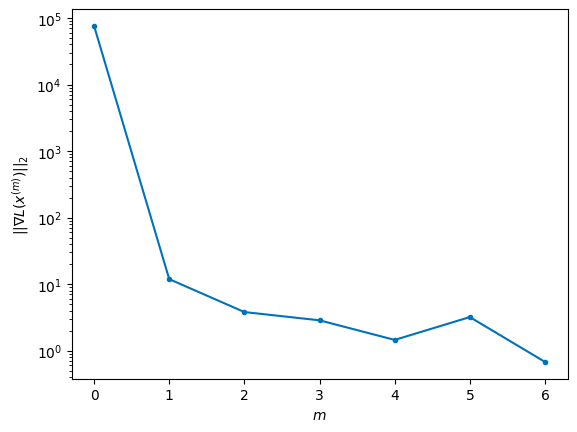


Windows:  26%|██▋       | 78/296 [14:42<36:22, 10.01s/it]

Before applying the algorithm
Cost function: 421.4453989973833
Gradient norm: 59005.55593133307
Global relative error: 1901695165.6179457
Position relative errors: 0.025403206246995557 m, 1.0183718913303934 m, 1.1138224017318106 m, 0.7427013433313923 m

Iteration 1
Cost function: 421.08373977265256 (-0.09%)
Gradient norm: 2.7335594925357274 (-100.00%)
Global relative error: 1.673664330382515 (-0.51%)
Position relative errors: 0.017675760147254575 m, 1.0207657882462375 m, 1.1538225624907308 m, 0.6538869934099758 m

Iteration 2
Cost function: 421.0837394881254 (-0.00%)
Gradient norm: 1.8745998044897605 (-31.42%)
Global relative error: 1.6736816040719167 (0.00%)
Position relative errors: 0.01767576140332247 m, 1.0207819333727401 m, 1.153829782442088 m, 0.6538932626467773 m

STOP on Iteration 3
Cost function = 421.0837398005251 (0.00%)
Gradient norm = 0.34437452159957144 (-81.63%)
Global relative error = 1.6736815962471003 (-0.00%)
Final position relative errors: 0.017675749776610822 m, 1.

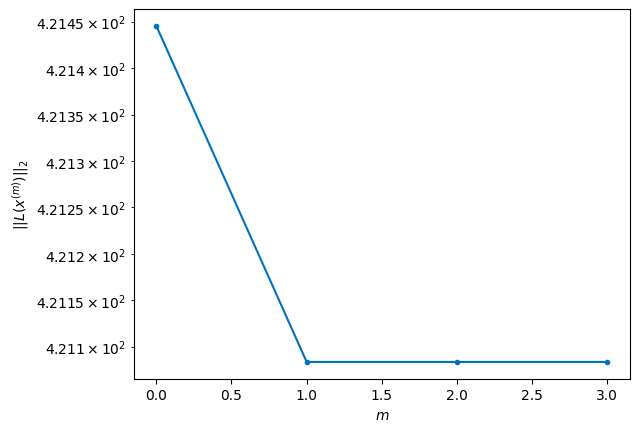

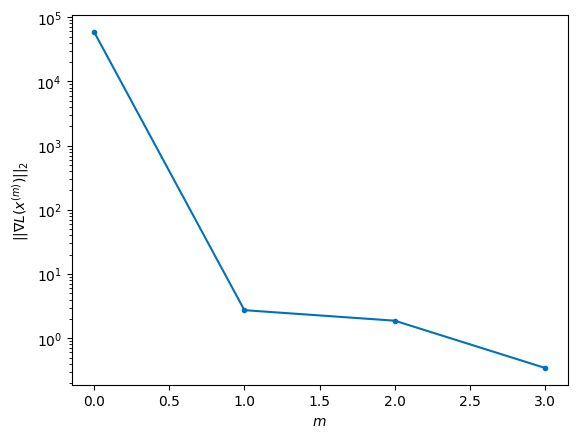


Windows:  27%|██▋       | 79/296 [14:51<34:59,  9.68s/it]

Before applying the algorithm
Cost function: 421.3401473008222
Gradient norm: 36650.19899664801
Global relative error: 1901082872.619802
Position relative errors: 0.016622440702962208 m, 0.9912804583856233 m, 1.18173744453891 m, 0.5950457379860346 m

Iteration 1
Cost function: 421.0632962823553 (-0.07%)
Gradient norm: 2.5828074316449303 (-99.99%)
Global relative error: 1.5970276545182036 (-3.41%)
Position relative errors: 0.010765620216376018 m, 0.9412483072860636 m, 1.1893592555289272 m, 0.4998554698549729 m

Iteration 2
Cost function: 421.06329663443745 (0.00%)
Gradient norm: 1.1735920839925416 (-54.56%)
Global relative error: 1.5970255608469928 (-0.00%)
Position relative errors: 0.010765616715178929 m, 0.9412450801721199 m, 1.1893598722876952 m, 0.49985338995179407 m

Iteration 3
Cost function: 421.0632964256362 (-0.00%)
Gradient norm: 2.394798556727447 (104.06%)
Global relative error: 1.5970255760141714 (0.00%)
Position relative errors: 0.010765624928657966 m, 0.9412450854437335 m,

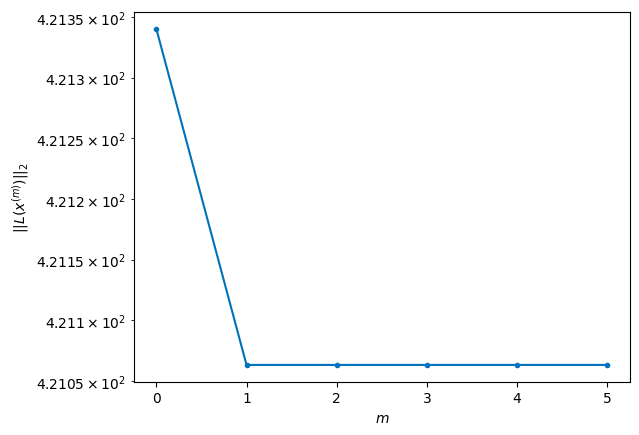

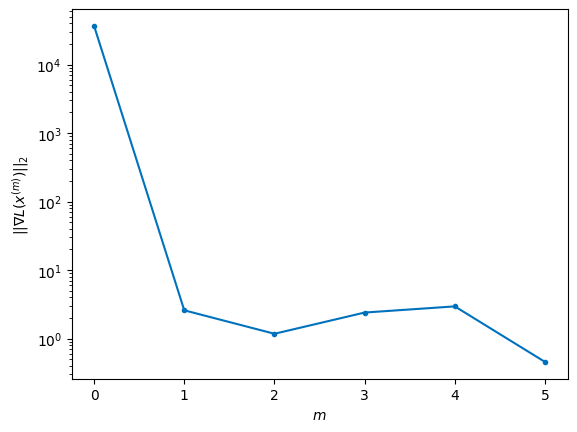


Windows:  27%|██▋       | 80/296 [15:03<38:15, 10.63s/it]

Before applying the algorithm
Cost function: 421.48697993199113
Gradient norm: 73322.04644343526
Global relative error: 1900466376.4066849
Position relative errors: 0.009730664843255948 m, 0.9069610453878358 m, 1.2176997819287771 m, 0.4537105154688894 m

Iteration 1
Cost function: 420.95601157213565 (-0.13%)
Gradient norm: 7.608595311982615 (-99.99%)
Global relative error: 1.3441644708586262 (-15.18%)
Position relative errors: 0.012465713595473871 m, 0.7273358559092061 m, 1.0589225087174101 m, 0.3953299123268201 m

Iteration 2
Cost function: 420.9560116776119 (0.00%)
Gradient norm: 2.386977791365551 (-68.63%)
Global relative error: 1.3441918202636034 (0.00%)
Position relative errors: 0.012465710387670807 m, 0.7273561166873064 m, 1.0589388098500998 m, 0.39534196324577076 m

Iteration 3
Cost function: 420.95601122266606 (-0.00%)
Gradient norm: 2.746028302510693 (15.04%)
Global relative error: 1.34419183883643 (0.00%)
Position relative errors: 0.012465711755831626 m, 0.7273561250079527 m,

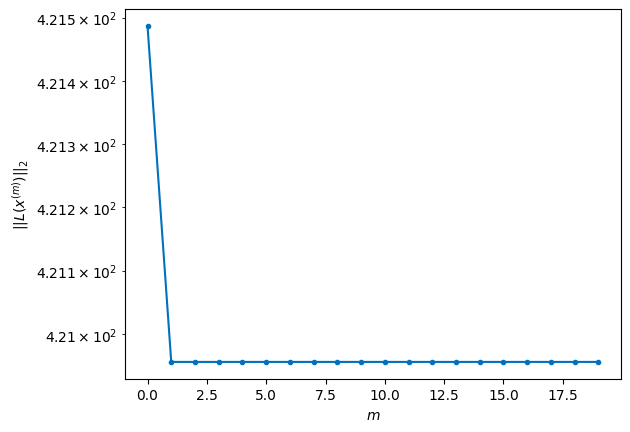

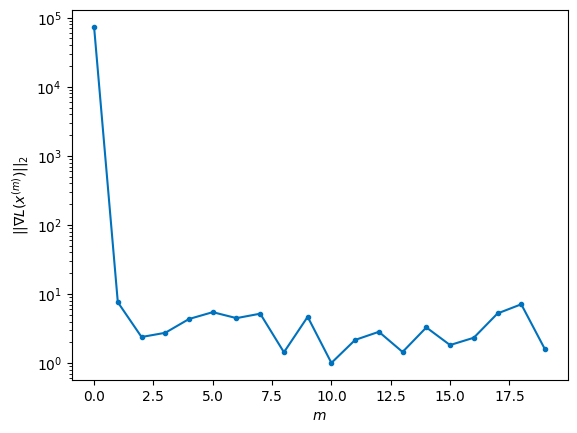


Windows:  27%|██▋       | 81/296 [15:46<1:12:21, 20.19s/it]

Before applying the algorithm
Cost function: 424.5001935967883
Gradient norm: 98199.83552458897
Global relative error: 1899848025.8746388
Position relative errors: 0.011462847624390315 m, 0.6787621740638818 m, 1.0807749792616592 m, 0.32353355175589105 m

Iteration 1
Cost function: 423.73020883361994 (-0.18%)
Gradient norm: 14.505159425899818 (-99.99%)
Global relative error: 0.8932558299396752 (-32.16%)
Position relative errors: 0.006464110791986861 m, 0.32867640470999565 m, 0.7999666222864523 m, 0.2233536607946012 m

Iteration 2
Cost function: 423.7302088416704 (0.00%)
Gradient norm: 4.028452845296044 (-72.23%)
Global relative error: 0.8933037944544193 (0.01%)
Position relative errors: 0.006464113142543479 m, 0.328710646605554 m, 0.8000056817426843 m, 0.2233551992828395 m

Iteration 3
Cost function: 423.73020886253215 (0.00%)
Gradient norm: 1.4064704132410635 (-65.09%)
Global relative error: 0.8933037879485916 (-0.00%)
Position relative errors: 0.006464110880979884 m, 0.328710637603166

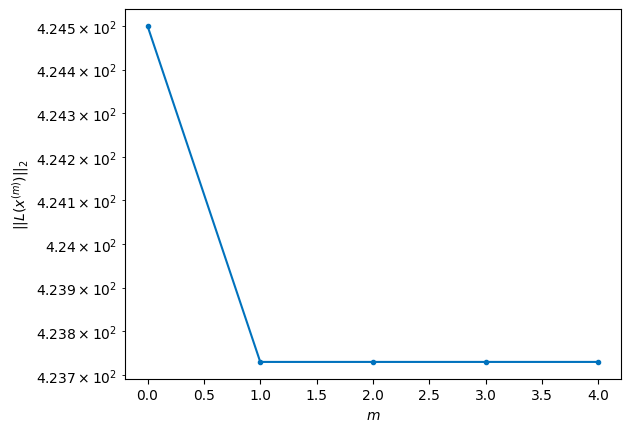

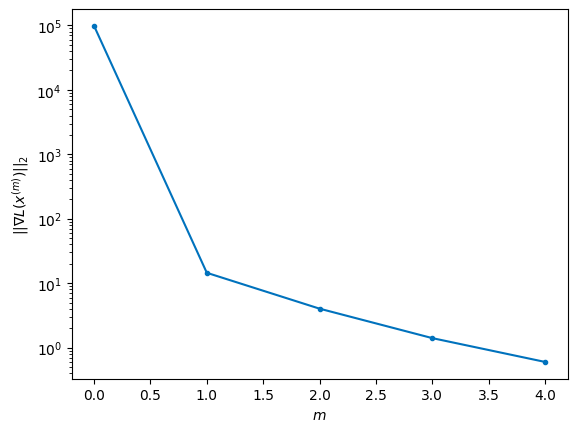


Windows:  28%|██▊       | 82/296 [15:58<1:03:17, 17.75s/it]

Before applying the algorithm
Cost function: 423.1775527832935
Gradient norm: 127006.9226283905
Global relative error: 1899230184.9764097
Position relative errors: 0.006218019696962958 m, 0.27565352604852233 m, 0.8071625891136321 m, 0.16121147837812808 m

Iteration 1
Cost function: 422.6849989239221 (-0.12%)
Gradient norm: 2.6225527566508453 (-100.00%)
Global relative error: 0.7429239746284099 (-14.42%)
Position relative errors: 0.005784680638977842 m, 0.14814501428695695 m, 0.7277418797858576 m, 0.01857390277002899 m

Iteration 2
Cost function: 422.6849994200504 (0.00%)
Gradient norm: 2.038377301080064 (-22.28%)
Global relative error: 0.7429345434939164 (0.00%)
Position relative errors: 0.005784676011563553 m, 0.14815959813978427 m, 0.7277496578690229 m, 0.01857556510140184 m

STOP on Iteration 3
Cost function = 422.6849994680805 (0.00%)
Gradient norm = 0.6562503786354484 (-67.81%)
Global relative error = 0.7429345460228854 (0.00%)
Final position relative errors: 0.0057846784913785365

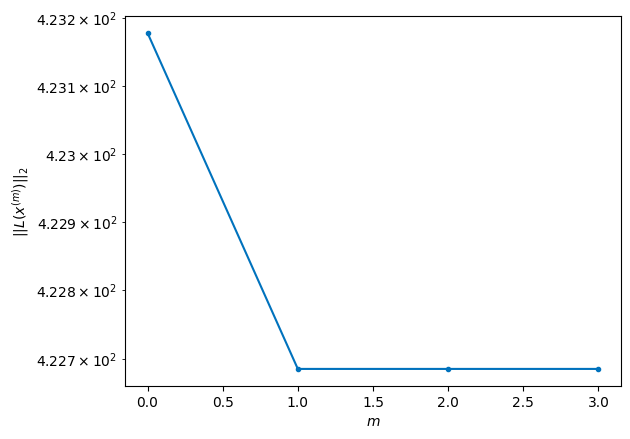

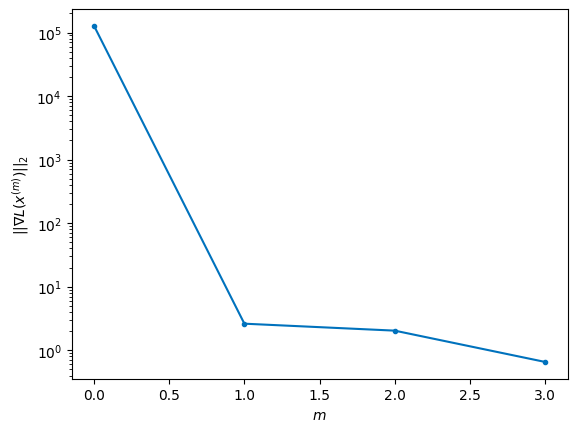


Windows:  28%|██▊       | 83/296 [16:07<53:57, 15.20s/it]  

Before applying the algorithm
Cost function: 428.6903455845678
Gradient norm: 197259.1000067502
Global relative error: 1898615180.7183082
Position relative errors: 0.006006235845570587 m, 0.08176957624693373 m, 0.7320571024134029 m, 0.06376901422724168 m

Iteration 1
Cost function: 428.136886323097 (-0.13%)
Gradient norm: 6.677685590791184 (-100.00%)
Global relative error: 0.7015252018033529 (-5.12%)
Position relative errors: 0.004645971323921672 m, 0.07584125791440088 m, 0.5399238257343513 m, 0.4414121234733349 m

Iteration 2
Cost function: 428.13688587377703 (-0.00%)
Gradient norm: 1.6480346724367745 (-75.32%)
Global relative error: 0.7015393624176689 (0.00%)
Position relative errors: 0.004645974893200384 m, 0.07583250454748804 m, 0.539937194748419 m, 0.44141977976370816 m

Iteration 3
Cost function: 428.13688603635234 (0.00%)
Gradient norm: 2.25433552457253 (36.79%)
Global relative error: 0.7015393636138662 (0.00%)
Position relative errors: 0.004645967271143995 m, 0.0758325079850616

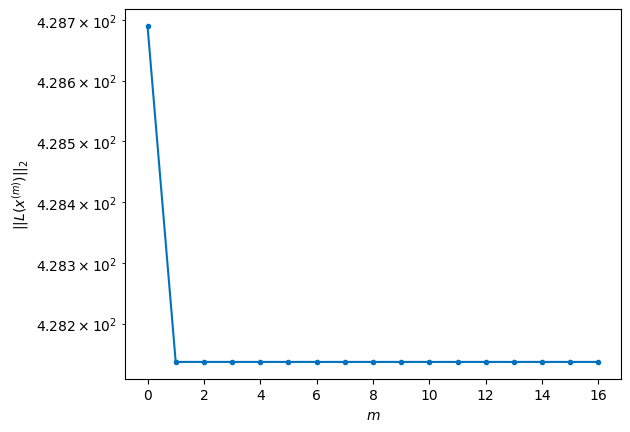

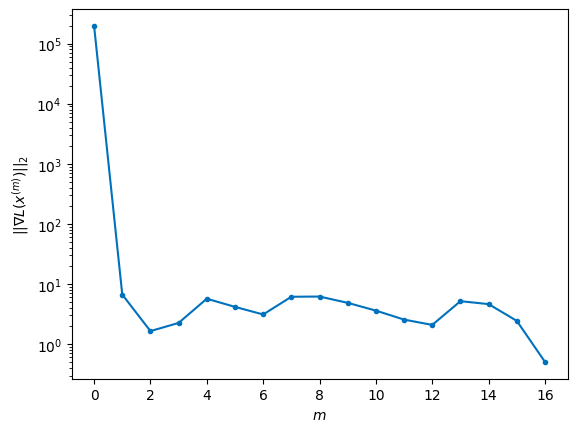


Windows:  28%|██▊       | 84/296 [16:44<1:16:46, 21.73s/it]

Before applying the algorithm
Cost function: 427.66350578935527
Gradient norm: 95970.40710014998
Global relative error: 1898005348.2446191
Position relative errors: 0.004543033981094727 m, 0.12249725082955851 m, 0.535695641306496 m, 0.48022927156764794 m

Iteration 1
Cost function: 427.3396225619827 (-0.08%)
Gradient norm: 1.9493102214004496 (-100.00%)
Global relative error: 0.7903945414733402 (8.30%)
Position relative errors: 0.006091650317366477 m, 0.23261708410532167 m, 0.5879790646819882 m, 0.47418862012875124 m

Iteration 2
Cost function: 427.3396225640991 (0.00%)
Gradient norm: 1.0308852522882779 (-47.12%)
Global relative error: 0.7903977327483066 (0.00%)
Position relative errors: 0.006091653637867372 m, 0.23261286936956704 m, 0.5879880759951942 m, 0.4741848331173898 m

STOP on Iteration 3
Cost function = 427.3396226312869 (0.00%)
Gradient norm = 0.46928624610508984 (-54.48%)
Global relative error = 0.7903977291900928 (-0.00%)
Final position relative errors: 0.0060916471186864005

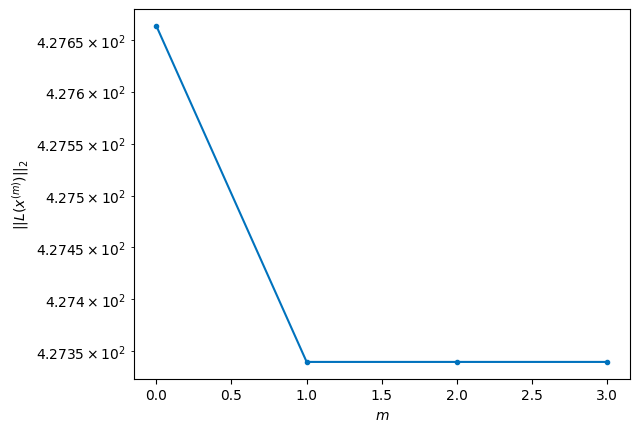

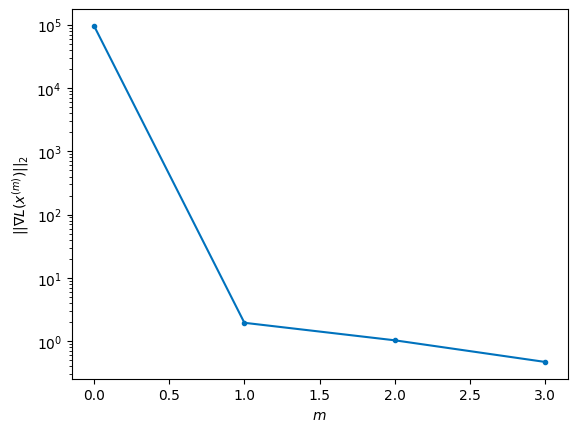


Windows:  29%|██▊       | 85/296 [16:53<1:03:06, 17.94s/it]

Before applying the algorithm
Cost function: 424.69537895476077
Gradient norm: 368989.44088004745
Global relative error: 1897402976.5987644
Position relative errors: 0.005611589413790723 m, 0.27398307941288497 m, 0.5853301216013029 m, 0.5079129313685925 m

Iteration 1
Cost function: 423.7577878282567 (-0.22%)
Gradient norm: 17.6134107931098 (-100.00%)
Global relative error: 1.2446585737175513 (51.42%)
Position relative errors: 0.007579979217355812 m, 0.3800065794923741 m, 0.5322491633222464 m, 1.0589722301458466 m

Iteration 2
Cost function: 423.75778800669684 (0.00%)
Gradient norm: 3.543459002213341 (-79.88%)
Global relative error: 1.244743055906802 (0.01%)
Position relative errors: 0.0075799721620310465 m, 0.38000890807184123 m, 0.53223564196891 m, 1.0590774844029167 m

Iteration 3
Cost function: 423.75778757681167 (-0.00%)
Gradient norm: 2.035710966306047 (-42.55%)
Global relative error: 1.2447430574818228 (0.00%)
Position relative errors: 0.007579975081592655 m, 0.3800089090828723 

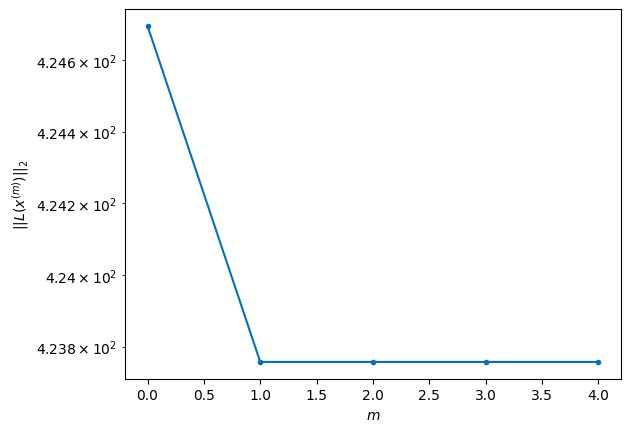

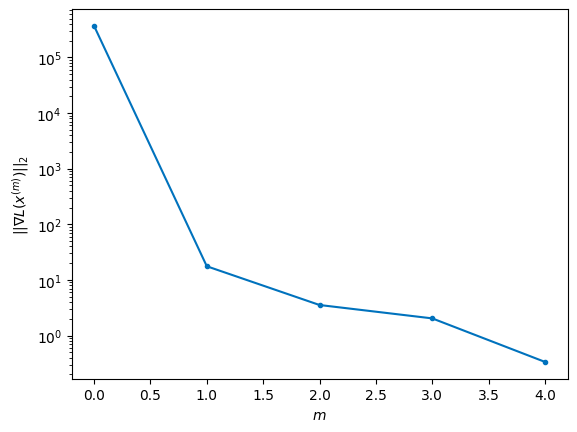


Windows:  29%|██▉       | 86/296 [17:04<55:31, 15.86s/it]  

Before applying the algorithm
Cost function: 424.00451684256785
Gradient norm: 95638.77659300616
Global relative error: 1896810344.3356388
Position relative errors: 0.007302724320353813 m, 0.4344217293788941 m, 0.5296188068105478 m, 1.0731898980426788 m

Iteration 1
Cost function: 423.7078894858734 (-0.07%)
Gradient norm: 2.9485363033030927 (-100.00%)
Global relative error: 1.3890199931872327 (9.10%)
Position relative errors: 0.006265444193959391 m, 0.6332503347978132 m, 0.3420888175477024 m, 1.1879836661488539 m

Iteration 2
Cost function: 423.7078896727245 (0.00%)
Gradient norm: 3.1037681304047946 (5.26%)
Global relative error: 1.3889997949840185 (-0.00%)
Position relative errors: 0.006265445721231819 m, 0.6332277877314751 m, 0.34210721591595455 m, 1.1879667702955556 m

Iteration 3
Cost function: 423.70788960198826 (-0.00%)
Gradient norm: 4.008244005022681 (29.14%)
Global relative error: 1.3889997943591266 (-0.00%)
Position relative errors: 0.006265447538308998 m, 0.633227781321532 m

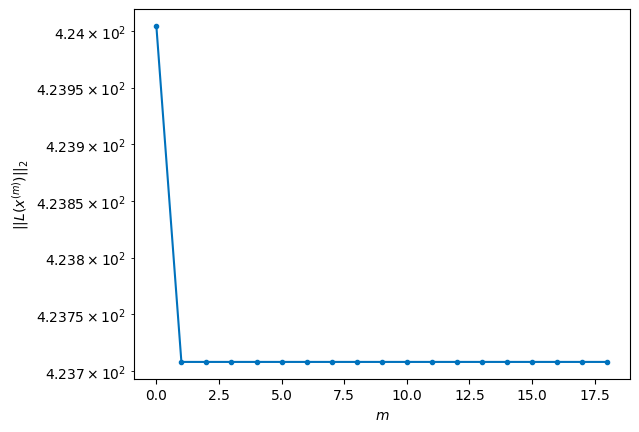

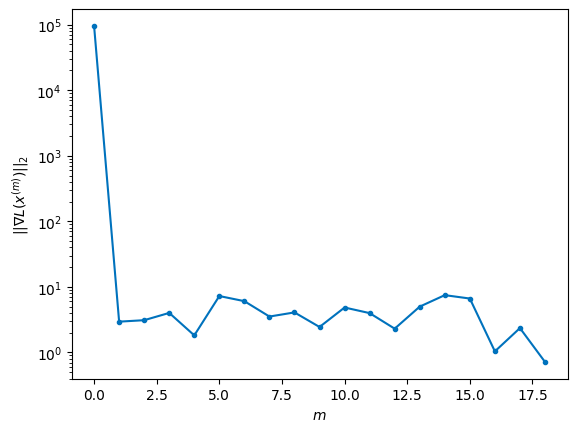


Windows:  29%|██▉       | 87/296 [17:43<1:18:52, 22.64s/it]

Before applying the algorithm
Cost function: 428.52285470310164
Gradient norm: 309006.06591361243
Global relative error: 1896229702.1552658
Position relative errors: 0.00679363945997338 m, 0.693151622881087 m, 0.33288385866891923 m, 1.209758109203958 m

Iteration 1
Cost function: 427.8569754133944 (-0.16%)
Gradient norm: 2.768878025471012 (-100.00%)
Global relative error: 1.4107561248848193 (-1.58%)
Position relative errors: 0.012606230384705427 m, 0.49226465142005843 m, 0.5130943090672753 m, 1.2183933735703503 m

Iteration 2
Cost function: 427.856975266154 (-0.00%)
Gradient norm: 4.002636162958418 (44.56%)
Global relative error: 1.4107768707299377 (0.00%)
Position relative errors: 0.012606228967683927 m, 0.49226076332906143 m, 0.5130962019669159 m, 1.2184181684824966 m

STOP on Iteration 3
Cost function = 427.85697465652606 (-0.00%)
Gradient norm = 0.7201992070092232 (-82.01%)
Global relative error = 1.4107768723941845 (0.00%)
Final position relative errors: 0.012606230179902183 m, 0.

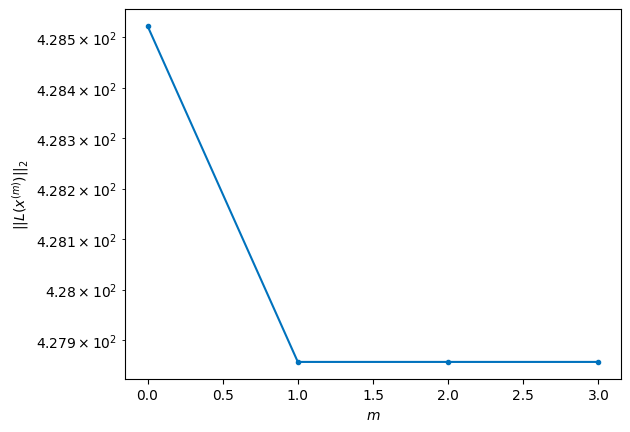

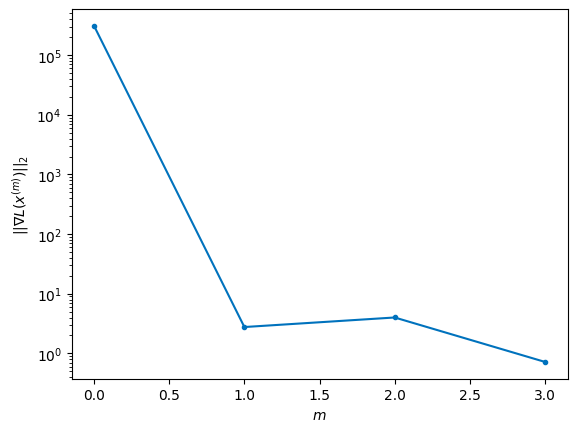


Windows:  30%|██▉       | 88/296 [17:51<1:04:02, 18.47s/it]

Before applying the algorithm
Cost function: 426.92158647701496
Gradient norm: 237529.60666571857
Global relative error: 1895663270.0625236
Position relative errors: 0.0125135949945304 m, 0.5457901476311735 m, 0.4973282131633244 m, 1.2426328353581104 m

Iteration 1
Cost function: 426.7308273139121 (-0.04%)
Gradient norm: 5.739911000297179 (-100.00%)
Global relative error: 1.3850390798337455 (-4.18%)
Position relative errors: 0.013325873540683549 m, 0.33451674336128184 m, 0.579471963393573 m, 1.2126275388344432 m

Iteration 2
Cost function: 426.7308276963596 (0.00%)
Gradient norm: 7.122571615954719 (24.09%)
Global relative error: 1.3850351927814017 (-0.00%)
Position relative errors: 0.013325867613942749 m, 0.3345071492217827 m, 0.5794765271297937 m, 1.2126235649502657 m

Iteration 3
Cost function: 426.7308273286133 (-0.00%)
Gradient norm: 7.575217870740902 (6.36%)
Global relative error: 1.3850351969693238 (0.00%)
Position relative errors: 0.013325864911897144 m, 0.33450714250141833 m, 0

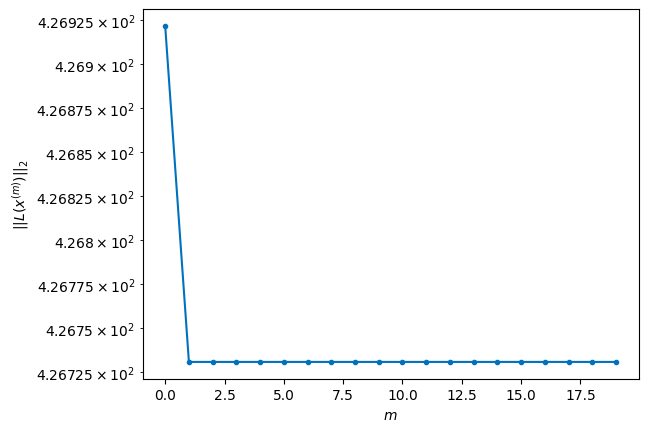

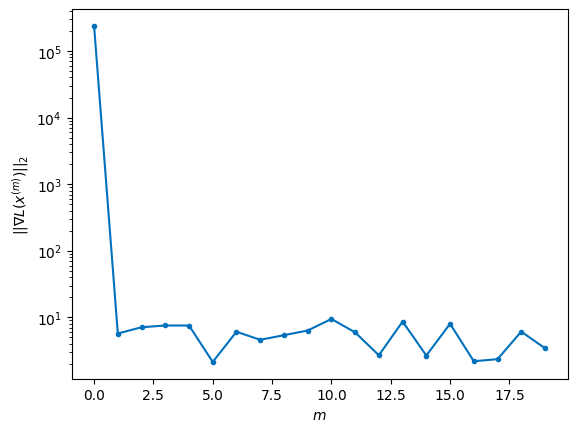


Windows:  30%|███       | 89/296 [18:35<1:29:29, 25.94s/it]

Before applying the algorithm
Cost function: 427.8096874982642
Gradient norm: 221611.1084336332
Global relative error: 1895113244.9133317
Position relative errors: 0.013426986086874487 m, 0.38430440764110585 m, 0.5642219162795495 m, 1.2242616603199024 m

Iteration 1
Cost function: 426.72933169848665 (-0.25%)
Gradient norm: 14.367963331425061 (-99.99%)
Global relative error: 1.170480029226322 (-16.50%)
Position relative errors: 0.017828433620676817 m, 0.2642281433444368 m, 0.9253624584448448 m, 0.6660272935797842 m

STOP on Iteration 2
Cost function = 426.72933105757653 (-0.00%)
Gradient norm = 0.29263903511507044 (-97.96%)
Global relative error = 1.1705120482784859 (0.00%)
Final position relative errors: 0.017828427141640533 m, 0.264186325546137 m, 0.9253973731768037 m, 0.6660516427076041 m



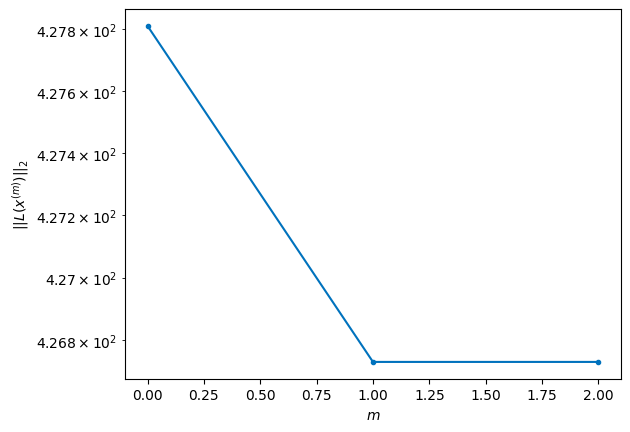

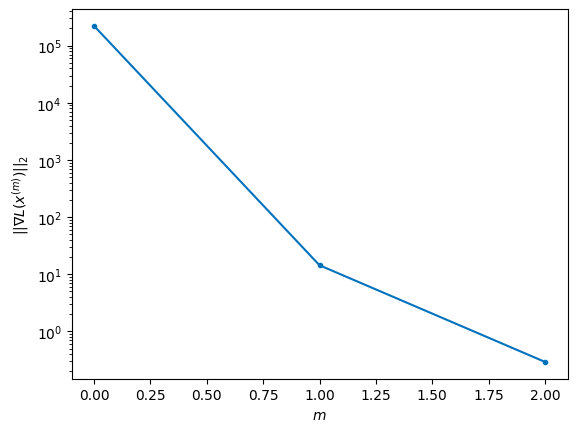


Windows:  30%|███       | 90/296 [18:42<1:09:15, 20.17s/it]

Before applying the algorithm
Cost function: 429.62012355982483
Gradient norm: 164572.57645985423
Global relative error: 1894581760.5324607
Position relative errors: 0.01782443112148004 m, 0.3122377700291321 m, 0.9130758972112736 m, 0.6930002583360461 m

Iteration 1
Cost function: 429.456689736825 (-0.04%)
Gradient norm: 5.217394132271863 (-100.00%)
Global relative error: 1.129300357465029 (-4.96%)
Position relative errors: 0.019180660466283663 m, 0.3924505802872988 m, 0.8151382035252248 m, 0.6756350267850104 m

Iteration 2
Cost function: 429.45669021555256 (0.00%)
Gradient norm: 2.741717238773455 (-47.45%)
Global relative error: 1.129302605664415 (0.00%)
Position relative errors: 0.0191806588666826 m, 0.3924442898672717 m, 0.8151451057772201 m, 0.6756341110068539 m

Iteration 3
Cost function: 429.45668930292464 (-0.00%)
Gradient norm: 3.146562118972649 (14.77%)
Global relative error: 1.1293026055609516 (-0.00%)
Position relative errors: 0.01918065260624623 m, 0.39244429038798895 m, 0.

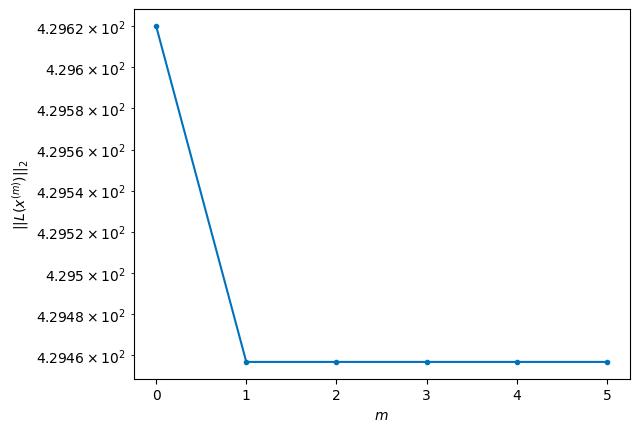

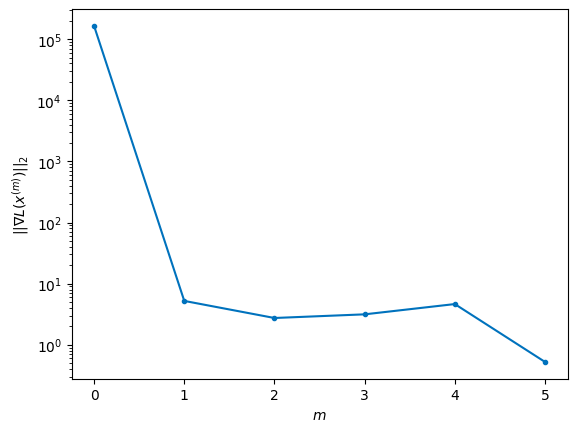


Windows:  31%|███       | 91/296 [18:56<1:02:40, 18.34s/it]

Before applying the algorithm
Cost function: 432.3885033341338
Gradient norm: 82265.38886120758
Global relative error: 1894070924.0073996
Position relative errors: 0.019427634910347866 m, 0.43559592165346206 m, 0.7976704289171981 m, 0.696024344264976 m

Iteration 1
Cost function: 431.8894603688988 (-0.12%)
Gradient norm: 2.1467523609045194 (-100.00%)
Global relative error: 1.088898371624733 (-4.89%)
Position relative errors: 0.01587696409803504 m, 0.2813825601728484 m, 0.7490118213522609 m, 0.7384117609174076 m

Iteration 2
Cost function: 431.889460047906 (-0.00%)
Gradient norm: 4.981320886371066 (132.04%)
Global relative error: 1.0888969535195656 (-0.00%)
Position relative errors: 0.015876964175458107 m, 0.2813802804586965 m, 0.7490166029574761 m, 0.7384056881293242 m

Iteration 3
Cost function: 431.8894602345392 (0.00%)
Gradient norm: 2.790629683911649 (-43.98%)
Global relative error: 1.0888969481731765 (-0.00%)
Position relative errors: 0.015876964111528644 m, 0.2813802805561035 m, 

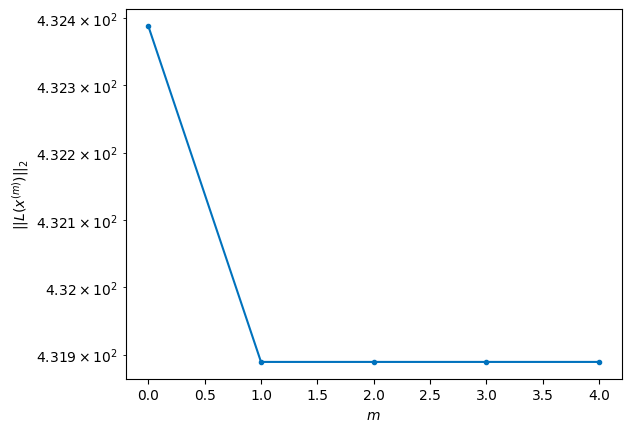

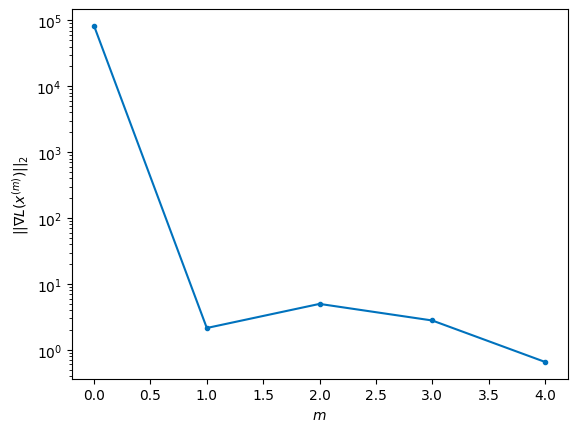


Windows:  31%|███       | 92/296 [19:08<55:55, 16.45s/it]  

Before applying the algorithm
Cost function: 430.4980844432747
Gradient norm: 79891.10320327313
Global relative error: 1893582780.5520043
Position relative errors: 0.016398432862402224 m, 0.32741047459348316 m, 0.7277382970302441 m, 0.7466347248059678 m

Iteration 1
Cost function: 430.33033656878524 (-0.04%)
Gradient norm: 2.727098335074423 (-100.00%)
Global relative error: 1.2740283515876252 (16.57%)
Position relative errors: 0.013162159935185378 m, 0.3351518719347323 m, 0.7459107708066757 m, 0.9768646114318774 m

Iteration 2
Cost function: 430.33033664222273 (0.00%)
Gradient norm: 1.9648662367662306 (-27.95%)
Global relative error: 1.2740453655214279 (0.00%)
Position relative errors: 0.013162155555904883 m, 0.3351565084379833 m, 0.7459054879817294 m, 0.9768892440046403 m

Iteration 3
Cost function: 430.33033639580503 (-0.00%)
Gradient norm: 1.1961375871352455 (-39.12%)
Global relative error: 1.2740453715466549 (0.00%)
Position relative errors: 0.013162157469499237 m, 0.33515651060830

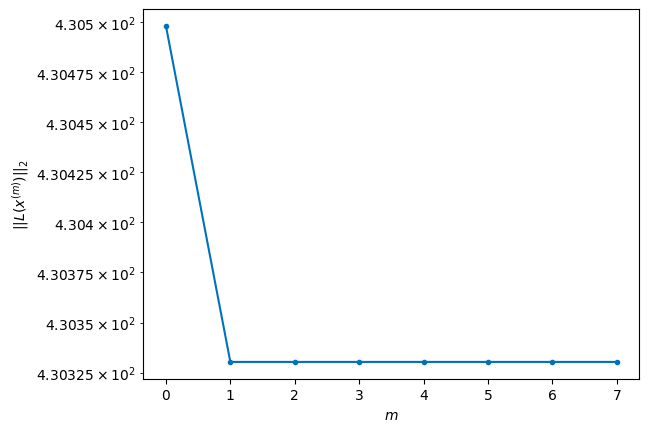

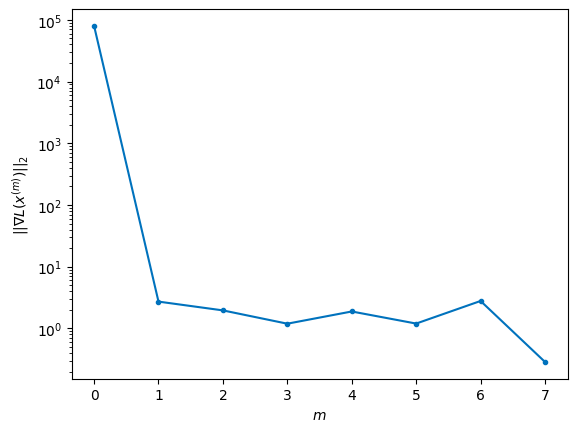


Windows:  31%|███▏      | 93/296 [19:24<55:56, 16.53s/it]

Before applying the algorithm
Cost function: 429.6350752036105
Gradient norm: 173574.03692158088
Global relative error: 1893119327.7535014
Position relative errors: 0.013724874435141447 m, 0.38138042185128934 m, 0.7206316607772252 m, 0.9814404245753683 m

Iteration 1
Cost function: 429.2191681099819 (-0.10%)
Gradient norm: 4.331010162990274 (-100.00%)
Global relative error: 1.2466224952446778 (-2.30%)
Position relative errors: 0.009619913577610478 m, 0.6419167786269684 m, 0.5265552371477946 m, 0.9298690536657914 m

STOP on Iteration 2
Cost function = 429.2191679995093 (-0.00%)
Gradient norm = 0.6906487072142461 (-84.05%)
Global relative error = 1.2466327688039014 (0.00%)
Final position relative errors: 0.009619906179614276 m, 0.6419356247967123 m, 0.5265606305562791 m, 0.9298667625348378 m



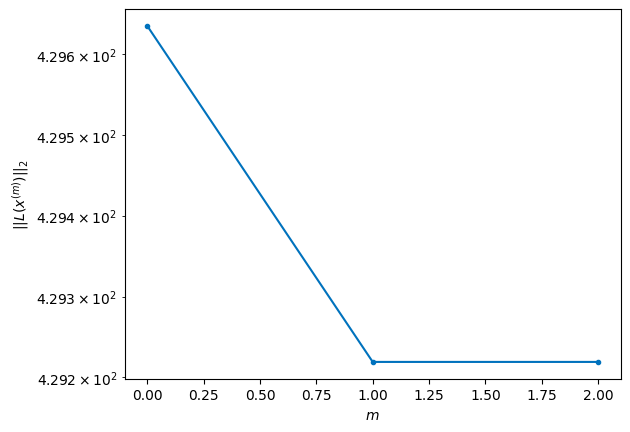

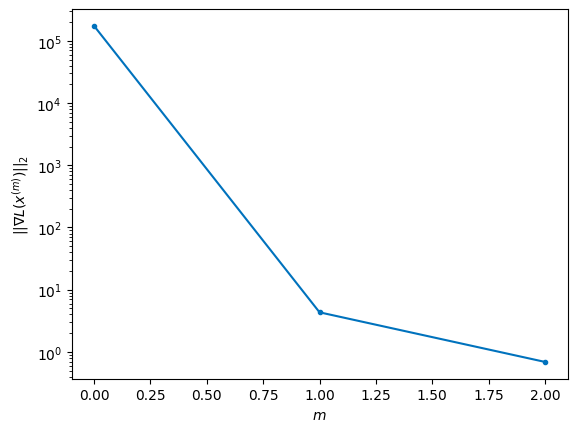


Windows:  32%|███▏      | 94/296 [19:31<45:47, 13.60s/it]

Before applying the algorithm
Cost function: 423.82241627159516
Gradient norm: 42107.64672283425
Global relative error: 1892682496.7325895
Position relative errors: 0.010073955179337441 m, 0.6871133387609059 m, 0.494415983566998 m, 0.9440018406402991 m

Iteration 1
Cost function: 422.8961964292257 (-0.22%)
Gradient norm: 7.754944788153133 (-99.98%)
Global relative error: 1.228731892758878 (-3.10%)
Position relative errors: 0.009992673820588474 m, 0.6293212184787096 m, 0.8822040793408269 m, 0.5790958117125227 m

Iteration 2
Cost function: 422.8961963813554 (-0.00%)
Gradient norm: 2.394489484162319 (-69.12%)
Global relative error: 1.2287466048733244 (0.00%)
Position relative errors: 0.009992672874206212 m, 0.6293180308371985 m, 0.882225511209627 m, 0.5790978422407933 m

Iteration 3
Cost function: 422.8961964384023 (0.00%)
Gradient norm: 3.8424682834610353 (60.47%)
Global relative error: 1.2287466072510091 (0.00%)
Position relative errors: 0.009992672704863655 m, 0.6293180307355517 m, 0.8

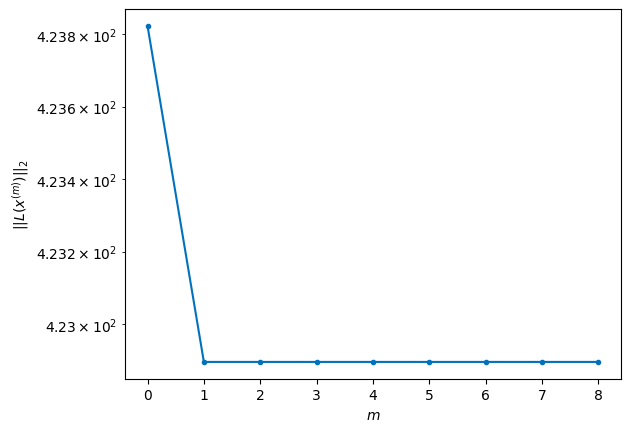

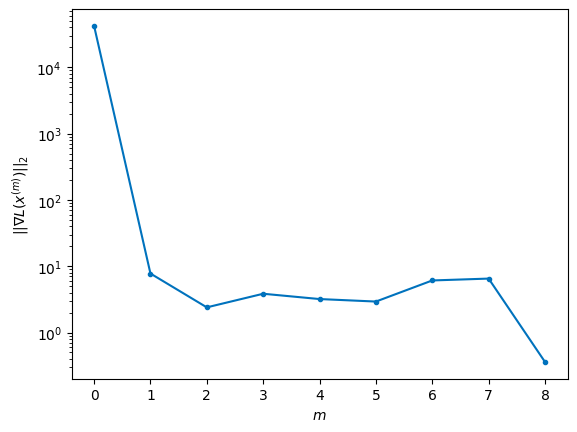


Windows:  32%|███▏      | 95/296 [19:50<50:47, 15.16s/it]

Before applying the algorithm
Cost function: 420.9467714399323
Gradient norm: 79605.3485210369
Global relative error: 1892274140.1027339
Position relative errors: 0.010864752554020201 m, 0.6739902410190793 m, 0.8522811777899297 m, 0.5887297345160595 m

Iteration 1
Cost function: 420.3802120953993 (-0.13%)
Gradient norm: 5.0754700026360124 (-99.99%)
Global relative error: 1.160692596944932 (-6.08%)
Position relative errors: 0.017222129099686064 m, 0.8395659462090929 m, 0.6695075403479497 m, 0.44022534873042446 m

Iteration 2
Cost function: 420.3802127220604 (0.00%)
Gradient norm: 5.727302929850597 (12.84%)
Global relative error: 1.1607235401553038 (0.00%)
Position relative errors: 0.01722213200743925 m, 0.8395975330739035 m, 0.6694911395649279 m, 0.44027163288361054 m

STOP on Iteration 3
Cost function = 420.38021289597054 (0.00%)
Gradient norm = 0.6335091549136003 (-88.94%)
Global relative error = 1.160723549541972 (0.00%)
Final position relative errors: 0.0172221256411629 m, 0.8395975

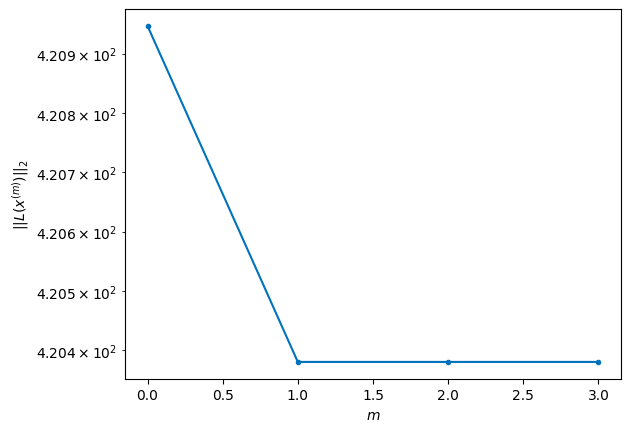

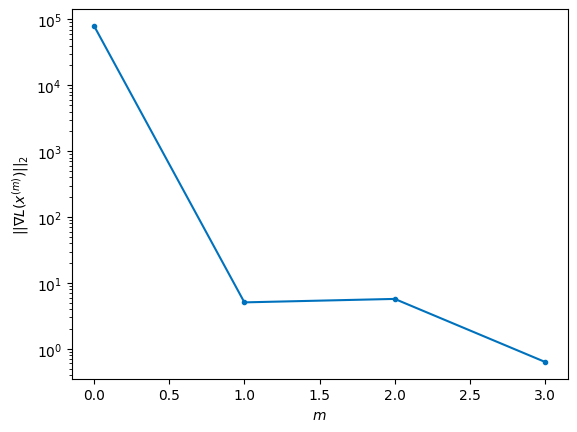


Windows:  32%|███▏      | 96/296 [19:58<43:47, 13.14s/it]

Before applying the algorithm
Cost function: 422.90511539846153
Gradient norm: 85648.69078870794
Global relative error: 1891896061.4678886
Position relative errors: 0.017582832986561412 m, 0.8820747019121083 m, 0.6380565261669778 m, 0.43761869084560784 m

Iteration 1
Cost function: 422.6456021386817 (-0.06%)
Gradient norm: 5.107209433327739 (-99.99%)
Global relative error: 1.0568387737830491 (-9.94%)
Position relative errors: 0.010345689259881415 m, 0.7719741084042419 m, 0.5920019452931321 m, 0.412783036310256 m

Iteration 2
Cost function: 422.6456018007319 (-0.00%)
Gradient norm: 1.1955906768121454 (-76.59%)
Global relative error: 1.056835320830812 (-0.00%)
Position relative errors: 0.010345685808167781 m, 0.7719702758545508 m, 0.5920046922699984 m, 0.41277742369937587 m

Iteration 3
Cost function: 422.64560174145225 (-0.00%)
Gradient norm: 3.392018895497741 (183.71%)
Global relative error: 1.05683531986653 (-0.00%)
Position relative errors: 0.01034568823871078 m, 0.7719702769758847 m

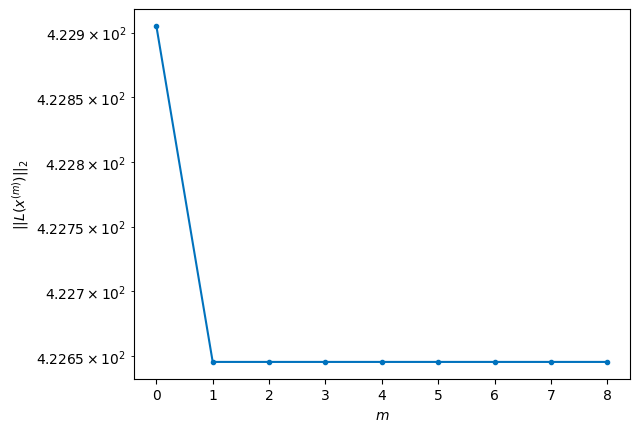

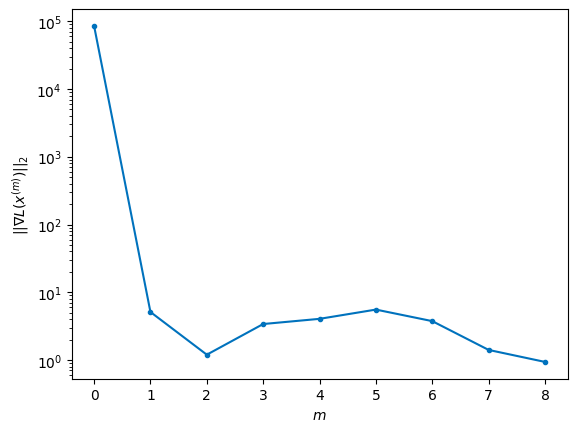


Windows:  33%|███▎      | 97/296 [20:17<49:04, 14.80s/it]

Before applying the algorithm
Cost function: 424.3168931368664
Gradient norm: 291913.45278998965
Global relative error: 1891549944.4277844
Position relative errors: 0.010877340119750207 m, 0.8127997533387138 m, 0.5552545791866315 m, 0.41521373185407406 m

Iteration 1
Cost function: 423.8106450127783 (-0.12%)
Gradient norm: 5.5134319002141785 (-100.00%)
Global relative error: 1.1141079987276346 (4.28%)
Position relative errors: 0.01352126303104717 m, 0.7408080154823442 m, 0.726970838760479 m, 0.404684670567601 m

Iteration 2
Cost function: 423.81064581923596 (0.00%)
Gradient norm: 7.9327873850724995 (43.88%)
Global relative error: 1.1141175645935457 (0.00%)
Position relative errors: 0.013521261862124465 m, 0.7408331355534701 m, 0.7269655667643746 m, 0.40467449108661896 m

Iteration 3
Cost function: 423.81064380360357 (-0.00%)
Gradient norm: 10.395458888574497 (31.04%)
Global relative error: 1.1141175639966947 (-0.00%)
Position relative errors: 0.01352126300191013 m, 0.7408331414394562 m

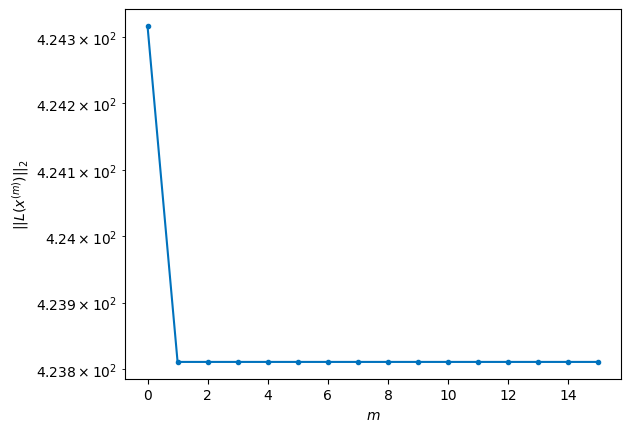

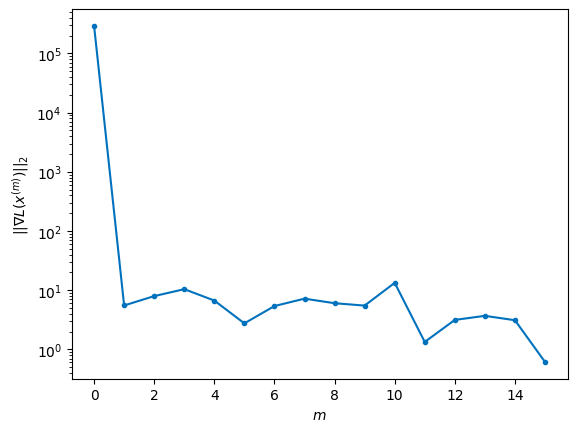


Windows:  33%|███▎      | 98/296 [20:51<1:07:38, 20.50s/it]

Before applying the algorithm
Cost function: 424.0575891900478
Gradient norm: 123559.47130741503
Global relative error: 1891237394.9137878
Position relative errors: 0.014308662153827112 m, 0.7779239659844903 m, 0.6922357344828541 m, 0.39485373072102237 m

Iteration 1
Cost function: 423.38372026536996 (-0.16%)
Gradient norm: 6.379580366185654 (-99.99%)
Global relative error: 0.9876875324592985 (-11.32%)
Position relative errors: 0.012328886102307732 m, 0.8005702516585291 m, 0.4649587740013296 m, 0.34391014339581777 m

Iteration 2
Cost function: 423.3837203260733 (0.00%)
Gradient norm: 1.1328825962538125 (-82.24%)
Global relative error: 0.987688147238514 (0.00%)
Position relative errors: 0.012328882089050433 m, 0.8005772652290947 m, 0.4649497719982814 m, 0.343907752925963 m

Iteration 3
Cost function: 423.3837207936471 (0.00%)
Gradient norm: 5.286349661309495 (366.63%)
Global relative error: 0.9876881495471274 (0.00%)
Position relative errors: 0.012328883009025234 m, 0.8005772631972077 m

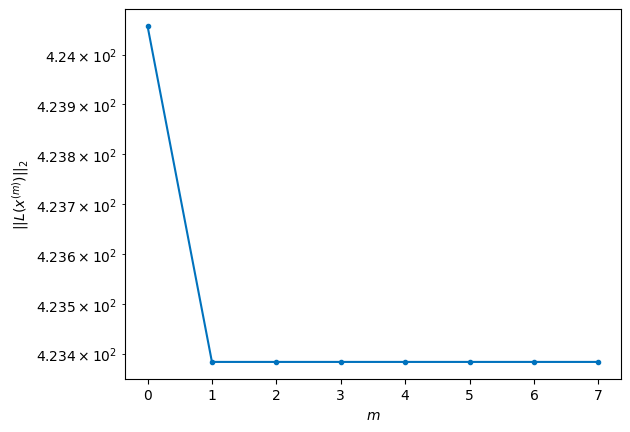

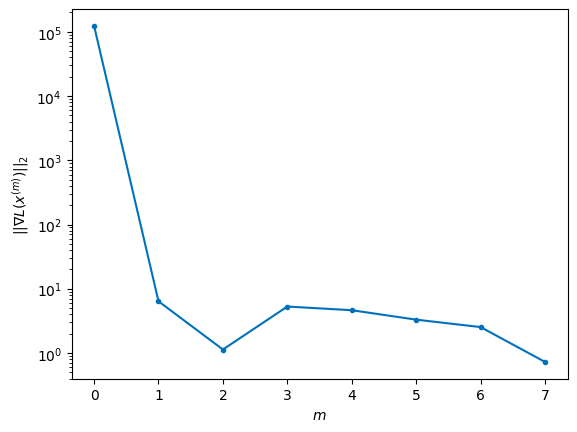


Windows:  33%|███▎      | 99/296 [21:08<1:04:27, 19.63s/it]

Before applying the algorithm
Cost function: 424.2851740352243
Gradient norm: 172288.22251911162
Global relative error: 1890959932.0634758
Position relative errors: 0.013076907881243204 m, 0.8358962581419498 m, 0.4242744655393256 m, 0.3378033998405074 m

Iteration 1
Cost function: 423.622169917147 (-0.16%)
Gradient norm: 4.7703631069747745 (-100.00%)
Global relative error: 0.9080851493451614 (-8.87%)
Position relative errors: 0.012586285698135042 m, 0.7881181689843999 m, 0.31807547639508915 m, 0.319620276458244 m

Iteration 2
Cost function: 423.62216996250515 (0.00%)
Gradient norm: 2.145562126982275 (-55.02%)
Global relative error: 0.9081180535041568 (0.00%)
Position relative errors: 0.01258628760993134 m, 0.7881687168279559 m, 0.31806372008031175 m, 0.31960081736047696 m

STOP on Iteration 3
Cost function = 423.6221697835783 (-0.00%)
Gradient norm = 0.2634700746143495 (-87.72%)
Global relative error = 0.9081180570341224 (0.00%)
Final position relative errors: 0.01258628506683751 m, 0.

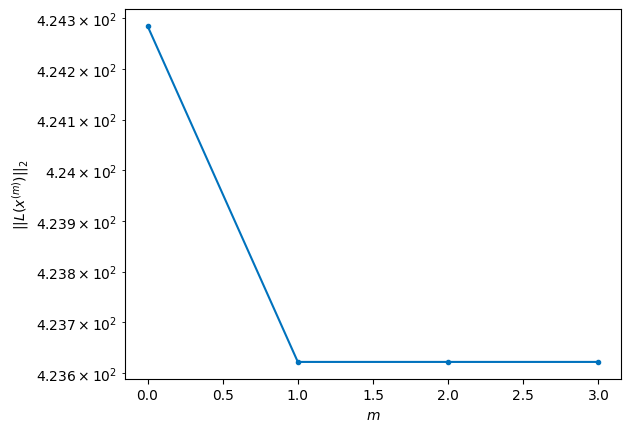

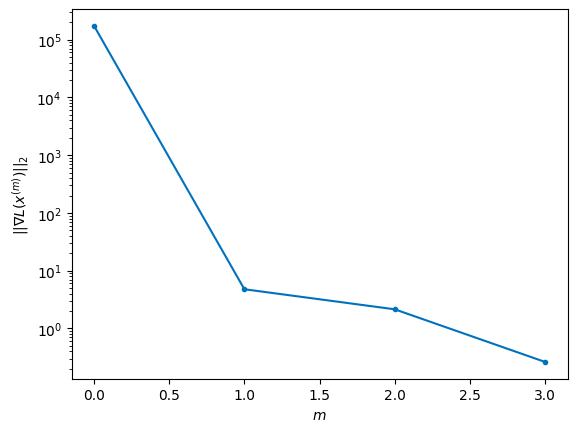


Windows:  34%|███▍      | 100/296 [21:17<53:07, 16.26s/it] 

Before applying the algorithm
Cost function: 428.7525642092805
Gradient norm: 92081.29207876901
Global relative error: 1890718931.8376799
Position relative errors: 0.012860721522431581 m, 0.8150336400981462 m, 0.27757333843510945 m, 0.3198486526382854 m

Iteration 1
Cost function: 428.3921663765075 (-0.08%)
Gradient norm: 2.356805473197204 (-100.00%)
Global relative error: 0.9093447349839044 (-1.01%)
Position relative errors: 0.018564826761064145 m, 0.7357985461852659 m, 0.41416803369414334 m, 0.33708697220807726 m

Iteration 2
Cost function: 428.39216632228374 (-0.00%)
Gradient norm: 1.4644798586675727 (-37.86%)
Global relative error: 0.9093437511510236 (-0.00%)
Position relative errors: 0.018564827352374618 m, 0.735798692036077 m, 0.4141675149925471 m, 0.3370846370591062 m

Iteration 3
Cost function: 428.3921661776744 (-0.00%)
Gradient norm: 2.248423156541625 (53.53%)
Global relative error: 0.9093437541484478 (0.00%)
Position relative errors: 0.018564826268910678 m, 0.73579869618532 

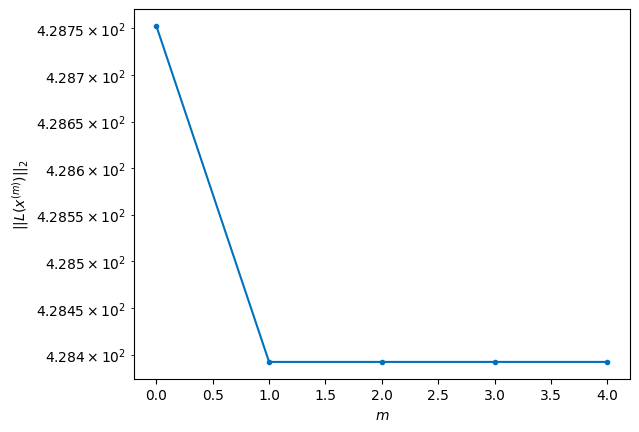

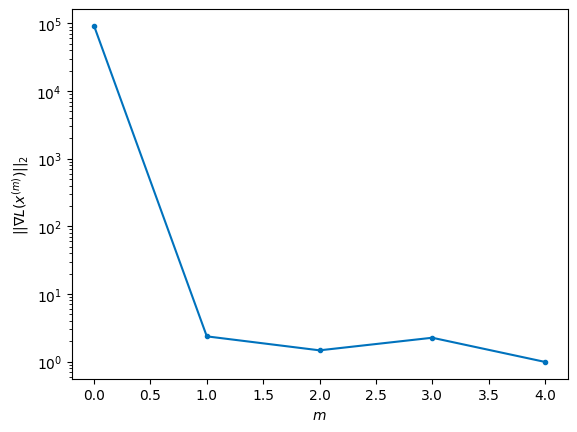


Windows:  34%|███▍      | 101/296 [21:29<48:28, 14.91s/it]

Before applying the algorithm
Cost function: 430.17344560803224
Gradient norm: 115929.71447375172
Global relative error: 1890515664.4172544
Position relative errors: 0.017739636373400435 m, 0.7619690088960522 m, 0.3758056317467643 m, 0.32838028271150976 m

STOP on Iteration 1
Cost function = 429.8813136208571 (-0.07%)
Gradient norm = 0.9078235341496661 (-100.00%)
Global relative error = 0.9167962305223423 (0.63%)
Final position relative errors: 0.02252003844863 m, 0.6297384995676859 m, 0.5362475326675923 m, 0.3948102953128316 m



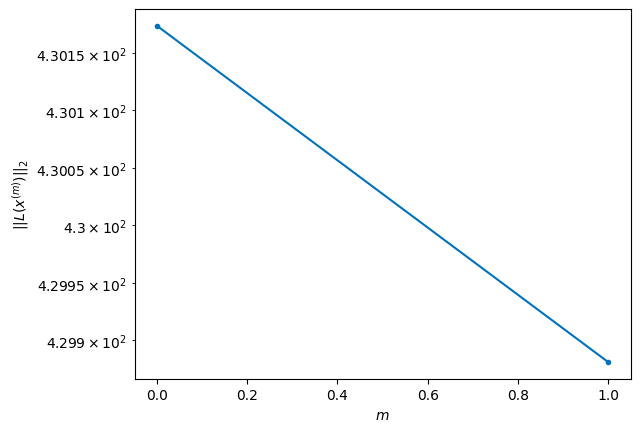

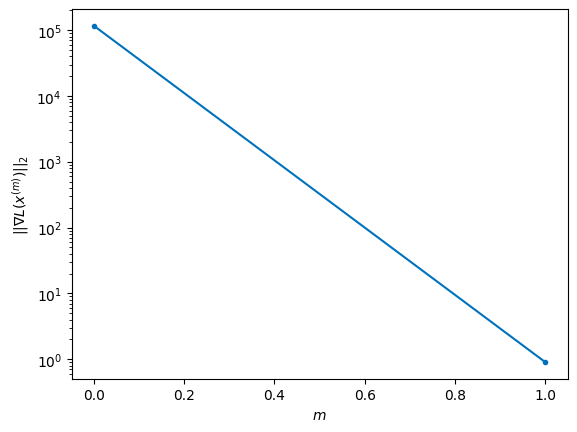


Windows:  34%|███▍      | 102/296 [21:33<38:24, 11.88s/it]

Before applying the algorithm
Cost function: 431.2155952305621
Gradient norm: 85763.72256394595
Global relative error: 1890351277.5457253
Position relative errors: 0.021511114213226285 m, 0.6538608112686861 m, 0.49437490625814146 m, 0.38238083718286653 m

Iteration 1
Cost function: 430.84595898661865 (-0.09%)
Gradient norm: 3.2602595832334935 (-100.00%)
Global relative error: 1.0435927964854332 (15.34%)
Position relative errors: 0.027530276168611575 m, 0.7365166326174697 m, 0.5716797961531512 m, 0.46803051677621926 m

Iteration 2
Cost function: 430.8459588154383 (-0.00%)
Gradient norm: 4.5732143123824995 (40.27%)
Global relative error: 1.0435854165371612 (-0.00%)
Position relative errors: 0.027530280852355565 m, 0.7365051571647081 m, 0.5716902261796963 m, 0.46801937919287767 m

STOP on Iteration 3
Cost function = 430.8459591418741 (0.00%)
Gradient norm = 0.10688967273898273 (-97.66%)
Global relative error = 1.0435854204426014 (0.00%)
Final position relative errors: 0.027530281863621765

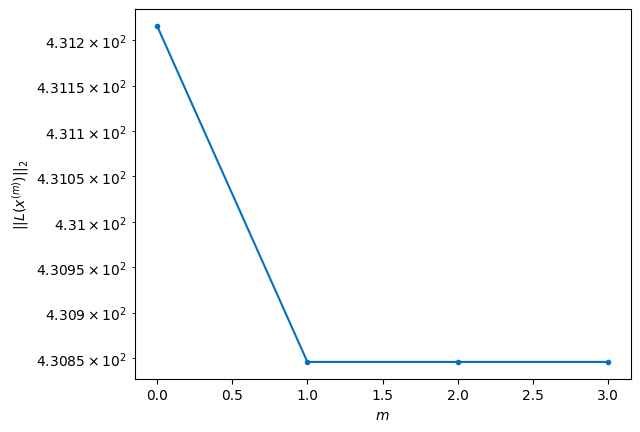

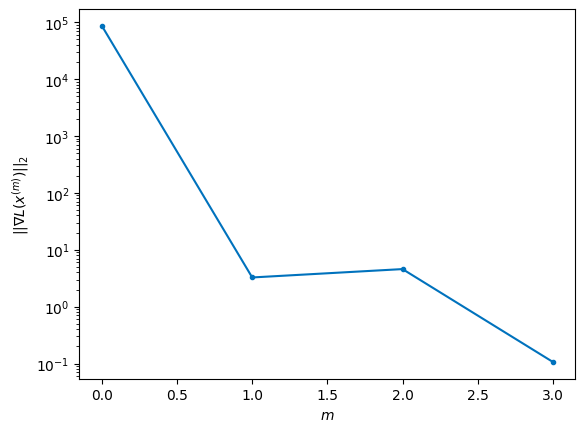


Windows:  35%|███▍      | 103/296 [21:43<36:15, 11.27s/it]

Before applying the algorithm
Cost function: 427.9811907476784
Gradient norm: 108424.28796520348
Global relative error: 1890226775.6159484
Position relative errors: 0.025971996601244846 m, 0.7509776812433762 m, 0.538369184793257 m, 0.45100481309109763 m

Iteration 1
Cost function: 427.5566909230822 (-0.10%)
Gradient norm: 6.721813293255985 (-99.99%)
Global relative error: 0.9435863934937022 (-8.26%)
Position relative errors: 0.01711061956014369 m, 0.546643246128078 m, 0.5269536056167468 m, 0.5599664165139777 m

Iteration 2
Cost function: 427.55669102264557 (0.00%)
Gradient norm: 2.2632490484574426 (-66.33%)
Global relative error: 0.9435883710254478 (0.00%)
Position relative errors: 0.017110610367258985 m, 0.5466584273715941 m, 0.5269427446393508 m, 0.5599651494058767 m

Iteration 3
Cost function: 427.5566909668763 (-0.00%)
Gradient norm: 1.1233270438421454 (-50.37%)
Global relative error: 0.943588365440938 (-0.00%)
Position relative errors: 0.017110622609128982 m, 0.5466584409154801 m,

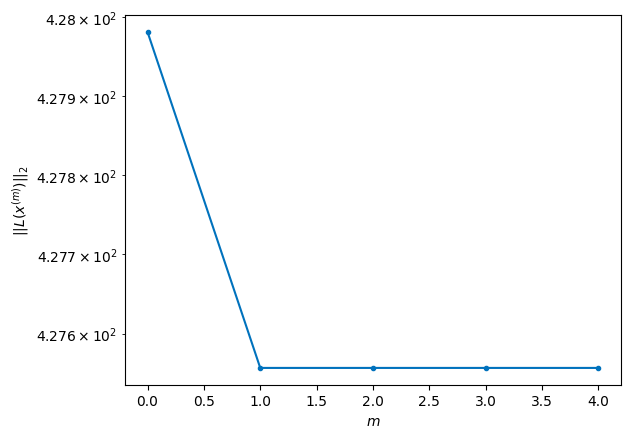

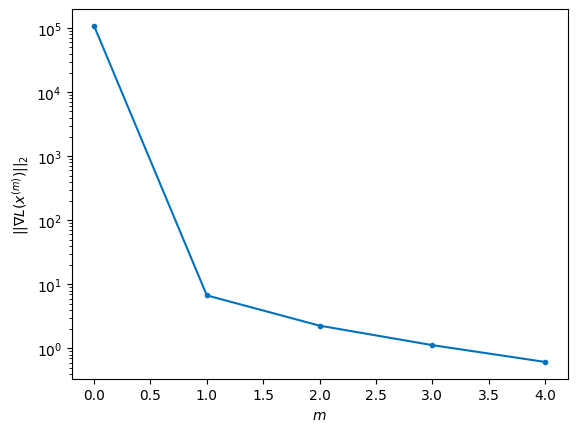


Windows:  35%|███▌      | 104/296 [21:55<36:24, 11.38s/it]

Before applying the algorithm
Cost function: 428.56174917690913
Gradient norm: 130308.70838603399
Global relative error: 1890143008.3162236
Position relative errors: 0.016147717874498018 m, 0.5497524707467589 m, 0.4957267791868818 m, 0.5354242303820822 m

Iteration 1
Cost function: 428.2121972199721 (-0.08%)
Gradient norm: 3.997989622085139 (-100.00%)
Global relative error: 0.9663676298488751 (5.76%)
Position relative errors: 0.024502936710006775 m, 0.6432208858330966 m, 0.3528884234734868 m, 0.6284911186448441 m

STOP on Iteration 2
Cost function = 428.21219719734574 (-0.00%)
Gradient norm = 0.1965031687147149 (-95.08%)
Global relative error = 0.9663738461269381 (0.00%)
Final position relative errors: 0.02450294689456262 m, 0.643227729735145 m, 0.35289407666878875 m, 0.6284904978675834 m



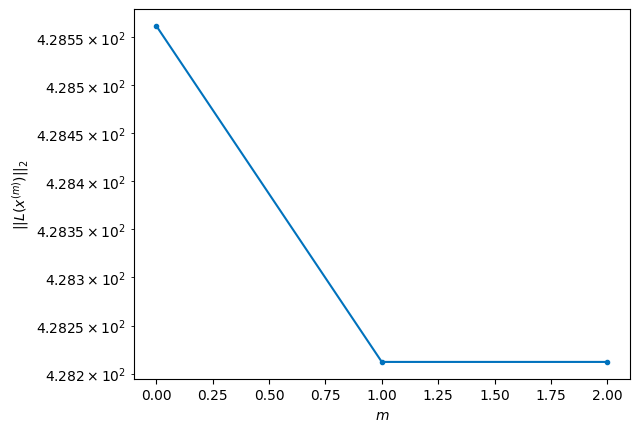

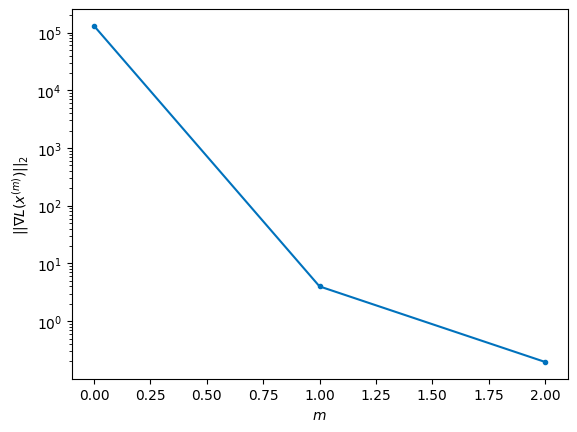


Windows:  35%|███▌      | 105/296 [22:02<32:31, 10.22s/it]

Before applying the algorithm
Cost function: 429.5669122632277
Gradient norm: 341780.05444724846
Global relative error: 1890100677.2044947
Position relative errors: 0.023105266256135248 m, 0.6375919309791378 m, 0.3273838014569457 m, 0.6065060817730331 m

Iteration 1
Cost function: 429.25782891790107 (-0.07%)
Gradient norm: 3.701844959055774 (-100.00%)
Global relative error: 0.8743385468007152 (-6.91%)
Position relative errors: 0.024819195311631122 m, 0.671857118711505 m, 0.27690571755367543 m, 0.48557398291019843 m

Iteration 2
Cost function: 429.2578288262176 (-0.00%)
Gradient norm: 4.735941924754963 (27.93%)
Global relative error: 0.8743414430665188 (0.00%)
Position relative errors: 0.02481919467447968 m, 0.6718642756043052 m, 0.27690331107055194 m, 0.48557066778084235 m

Iteration 3
Cost function: 429.2578290880312 (0.00%)
Gradient norm: 2.3550644734014554 (-50.27%)
Global relative error: 0.8743414482794204 (0.00%)
Position relative errors: 0.024819192828880822 m, 0.6718642779778905

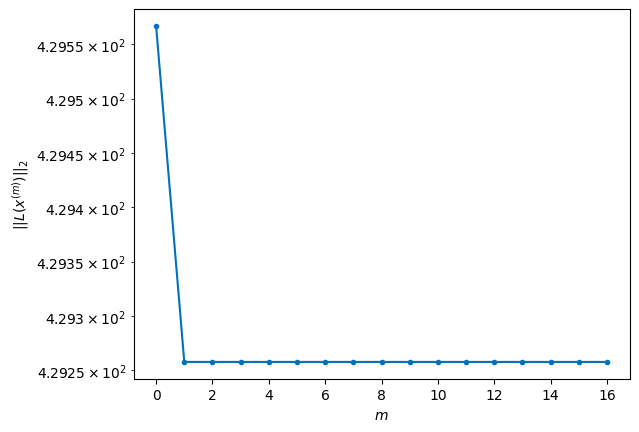

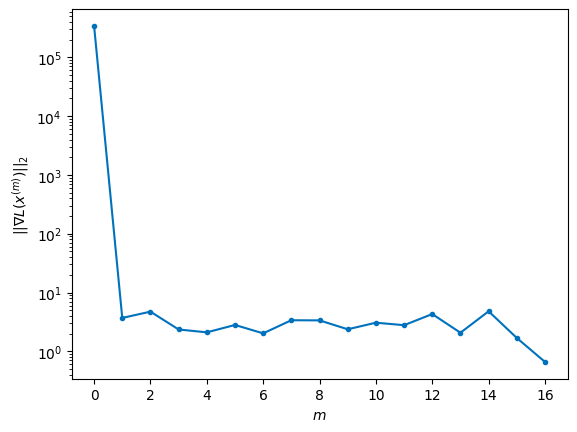


Windows:  36%|███▌      | 106/296 [22:38<56:37, 17.88s/it]

Before applying the algorithm
Cost function: 429.3118763379119
Gradient norm: 82240.18414011113
Global relative error: 1890100310.0326803
Position relative errors: 0.02349520777383111 m, 0.6628645329522656 m, 0.26438998624770227 m, 0.4584863756504565 m

Iteration 1
Cost function: 428.98613019883527 (-0.08%)
Gradient norm: 4.355964307288982 (-99.99%)
Global relative error: 0.8801601355858467 (3.72%)
Position relative errors: 0.013355514778338264 m, 0.7045711404364106 m, 0.23698660048377715 m, 0.47108300695379607 m

Iteration 2
Cost function: 428.9861303029156 (0.00%)
Gradient norm: 1.1579214787857075 (-73.42%)
Global relative error: 0.8801734838872154 (0.00%)
Position relative errors: 0.01335550680537879 m, 0.7045877295996171 m, 0.236985518409501 m, 0.4710836796287716 m

STOP on Iteration 3
Cost function = 428.9861304348267 (0.00%)
Gradient norm = 0.23605686636386983 (-79.61%)
Global relative error = 0.8801734786536476 (-0.00%)
Final position relative errors: 0.013355507103060438 m, 0.7

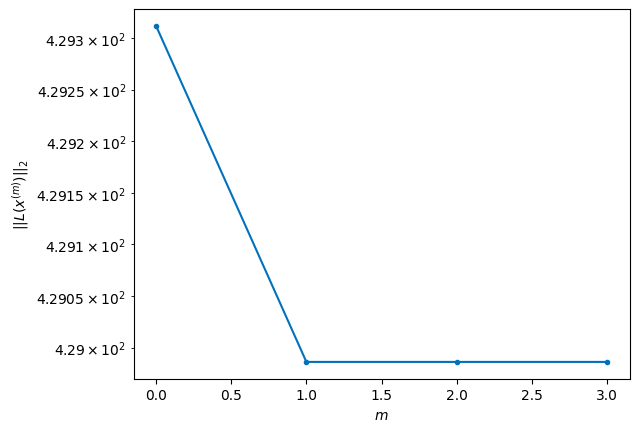

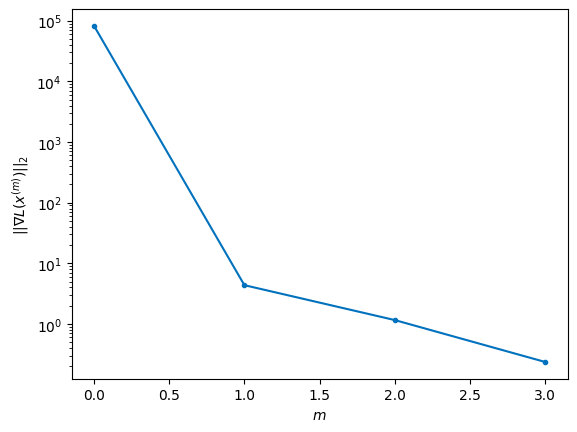


Windows:  36%|███▌      | 107/296 [22:48<48:28, 15.39s/it]

Before applying the algorithm
Cost function: 427.48596966017664
Gradient norm: 73972.79650922879
Global relative error: 1890142259.6656754
Position relative errors: 0.012916050596710088 m, 0.7009350267149285 m, 0.2420344194917631 m, 0.4499313730521356 m

Iteration 1
Cost function: 427.4232488112364 (-0.01%)
Gradient norm: 2.4234709286114002 (-100.00%)
Global relative error: 0.8538054443071367 (-1.57%)
Position relative errors: 0.011906839346575602 m, 0.6920349507891196 m, 0.21554280611262913 m, 0.45107615580730465 m

Iteration 2
Cost function: 427.4232487203259 (-0.00%)
Gradient norm: 1.3040413568917544 (-46.19%)
Global relative error: 0.8538048138979063 (-0.00%)
Position relative errors: 0.011906838641891269 m, 0.6920339800349176 m, 0.2155427476733329 m, 0.4510764798140132 m

STOP on Iteration 3
Cost function = 427.4232488275245 (0.00%)
Gradient norm = 0.8947576105781457 (-31.39%)
Global relative error = 0.8538048215579445 (0.00%)
Final position relative errors: 0.011906841489447938 m

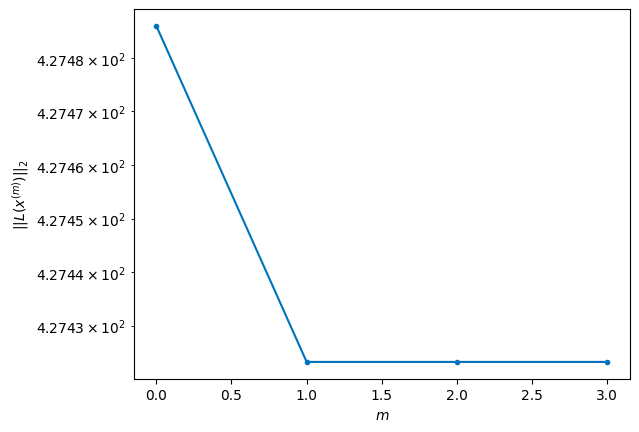

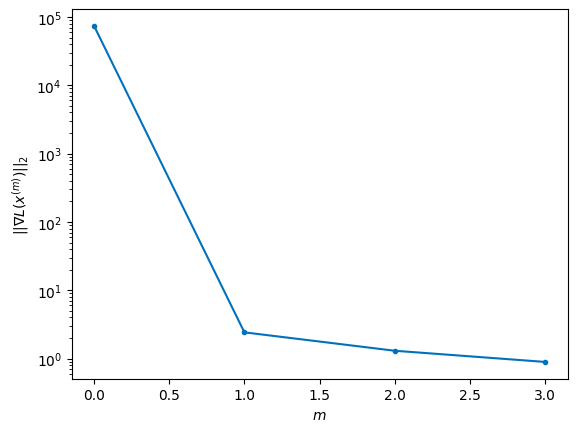


Windows:  36%|███▋      | 108/296 [22:57<42:32, 13.57s/it]

Before applying the algorithm
Cost function: 428.20123718513895
Gradient norm: 139694.82493441697
Global relative error: 1890226697.3749673
Position relative errors: 0.011685319000885357 m, 0.6861028924753959 m, 0.22749662106534943 m, 0.4279982925517629 m

Iteration 1
Cost function: 427.88935051498873 (-0.07%)
Gradient norm: 2.390682410991457 (-100.00%)
Global relative error: 0.6613112833293808 (-21.28%)
Position relative errors: 0.01894237094980724 m, 0.5283540063738194 m, 0.1887772580722958 m, 0.3495397727609993 m

Iteration 2
Cost function: 427.88935036848875 (-0.00%)
Gradient norm: 2.243748473310563 (-6.15%)
Global relative error: 0.6613027545251623 (-0.00%)
Position relative errors: 0.018942374383682 m, 0.5283441113399199 m, 0.18877597300440066 m, 0.34953928754307095 m

STOP on Iteration 3
Cost function = 427.8893503894223 (0.00%)
Gradient norm = 0.39422434521787203 (-82.43%)
Global relative error = 0.6613027523504418 (-0.00%)
Final position relative errors: 0.018942359155606683 m

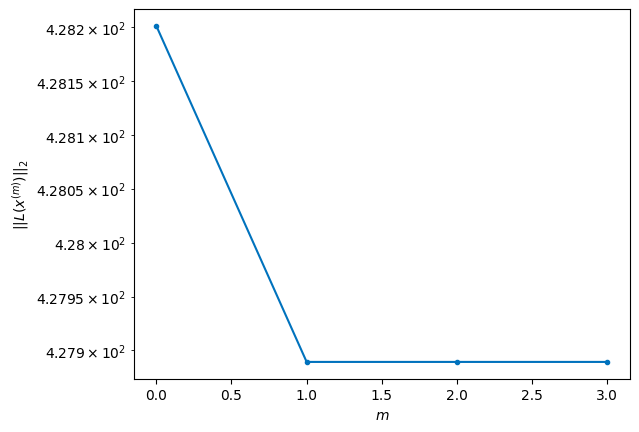

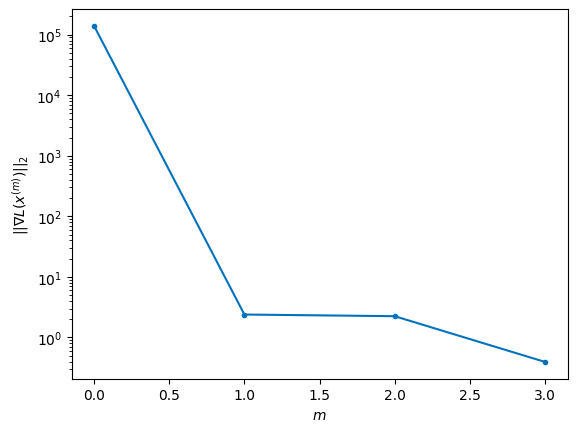


Windows:  37%|███▋      | 109/296 [23:05<37:29, 12.03s/it]

Before applying the algorithm
Cost function: 430.7216221398916
Gradient norm: 155943.11947007358
Global relative error: 1890353610.2347515
Position relative errors: 0.017937508521711998 m, 0.5210039908058934 m, 0.21678985817765495 m, 0.33066759234056214 m

Iteration 1
Cost function: 430.3222060830764 (-0.09%)
Gradient norm: 5.542201952261897 (-100.00%)
Global relative error: 0.7071622041089127 (8.08%)
Position relative errors: 0.01292140370582068 m, 0.5264901153805336 m, 0.20635643406574775 m, 0.4244233990367976 m

STOP on Iteration 2
Cost function = 430.32220575618504 (-0.00%)
Gradient norm = 0.44978304072779524 (-91.88%)
Global relative error = 0.7071605684862201 (-0.00%)
Final position relative errors: 0.012921401306033642 m, 0.5264876779938937 m, 0.20635734152932808 m, 0.4244232561629776 m



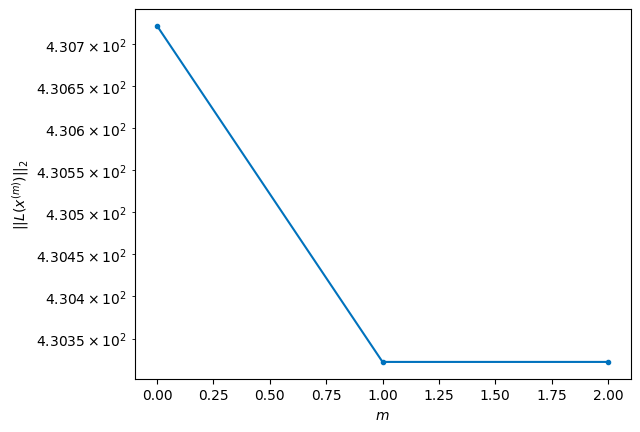

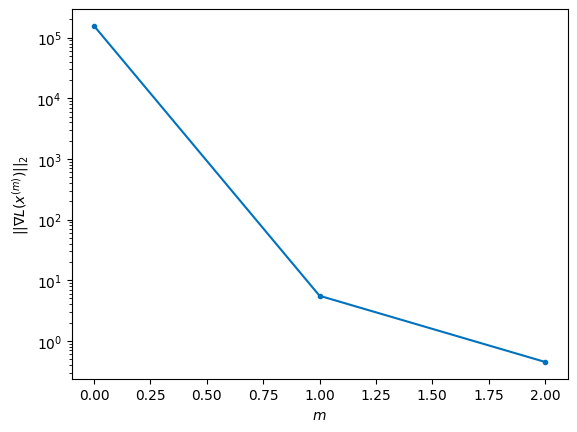


Windows:  37%|███▋      | 110/296 [23:12<32:18, 10.42s/it]

Before applying the algorithm
Cost function: 427.88231137188643
Gradient norm: 42545.37727294689
Global relative error: 1890522787.2400892
Position relative errors: 0.01280480523415845 m, 0.5232444668859204 m, 0.238182035880691 m, 0.4032713218499458 m

Iteration 1
Cost function: 427.7120487594708 (-0.04%)
Gradient norm: 2.007939103134435 (-100.00%)
Global relative error: 0.6785133128551866 (-3.40%)
Position relative errors: 0.010330667815482841 m, 0.45803307244134805 m, 0.24774964824787854 m, 0.43485383728756627 m

STOP on Iteration 2
Cost function = 427.7120486803379 (-0.00%)
Gradient norm = 0.4134127350516777 (-79.41%)
Global relative error = 0.678511936038392 (-0.00%)
Final position relative errors: 0.01033066909258746 m, 0.4580321928820909 m, 0.24774983460924163 m, 0.4348525092332619 m



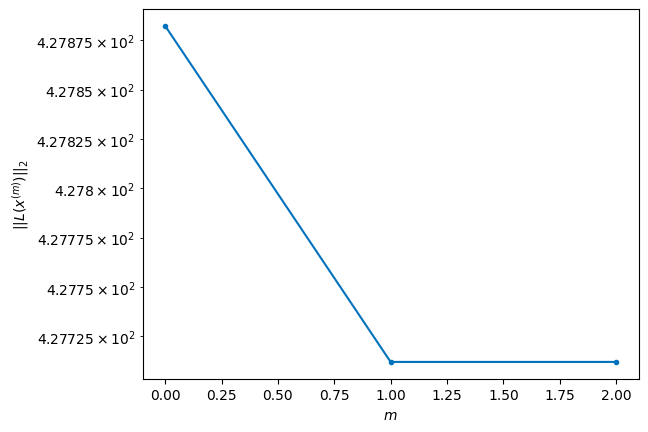

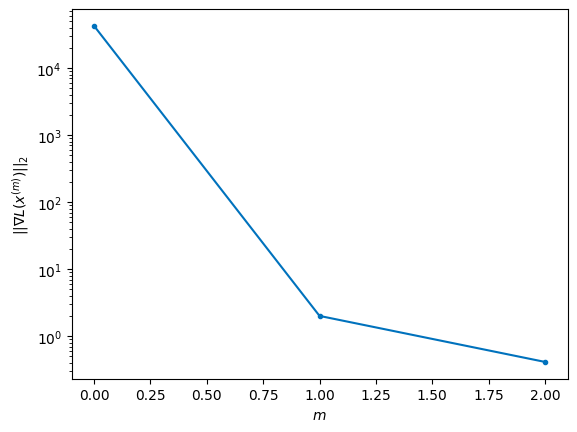


Windows:  38%|███▊      | 111/296 [23:20<29:36,  9.60s/it]

Before applying the algorithm
Cost function: 427.203240362848
Gradient norm: 88136.97981861806
Global relative error: 1890733815.5078754
Position relative errors: 0.010547787214563415 m, 0.45484430984454166 m, 0.27570615125280373 m, 0.40522026205699047 m

Iteration 1
Cost function: 426.89252379467854 (-0.07%)
Gradient norm: 1.9945968046743032 (-100.00%)
Global relative error: 0.5573050103243361 (-16.66%)
Position relative errors: 0.014234170813920503 m, 0.4049409482170982 m, 0.13658472368845828 m, 0.35742397149372335 m

STOP on Iteration 2
Cost function = 426.89252359863167 (-0.00%)
Gradient norm = 0.882060745880635 (-55.78%)
Global relative error = 0.5573087933273938 (0.00%)
Final position relative errors: 0.014234170464964353 m, 0.40494269803744204 m, 0.13659291063970047 m, 0.3574247589668298 m



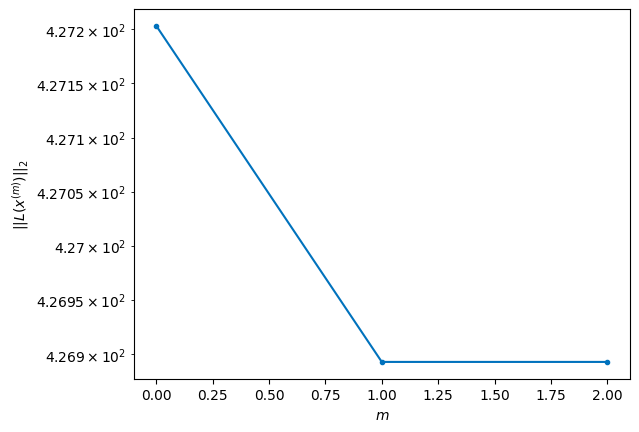

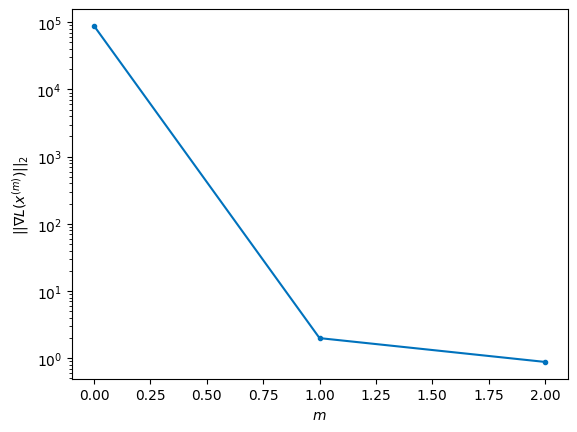


Windows:  38%|███▊      | 112/296 [23:27<27:06,  8.84s/it]

Before applying the algorithm
Cost function: 431.44991079029455
Gradient norm: 152908.8563266735
Global relative error: 1890986085.9677658
Position relative errors: 0.014608503315021627 m, 0.4067383678546574 m, 0.1665242408145141 m, 0.337108229922742 m

Iteration 1
Cost function: 430.99785320341647 (-0.10%)
Gradient norm: 10.361104662720859 (-99.99%)
Global relative error: 0.49263197712129464 (-11.09%)
Position relative errors: 0.01499906563902763 m, 0.42587794170093163 m, 0.20789684828945096 m, 0.1336688417610818 m

Iteration 2
Cost function: 430.9978531668607 (-0.00%)
Gradient norm: 2.818801054900767 (-72.79%)
Global relative error: 0.49265141378871347 (0.00%)
Position relative errors: 0.014999065614538721 m, 0.4258958657104307 m, 0.20790725513680997 m, 0.13366718172896772 m

Iteration 3
Cost function: 430.997853215798 (0.00%)
Gradient norm: 5.08442463975501 (80.38%)
Global relative error: 0.49265141526654643 (0.00%)
Position relative errors: 0.014999065993827117 m, 0.425895873562514

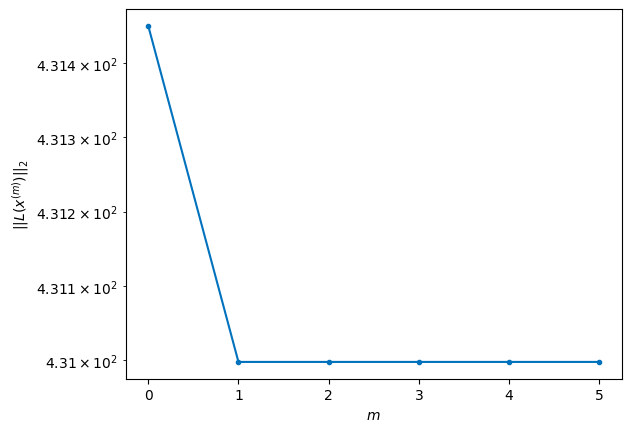

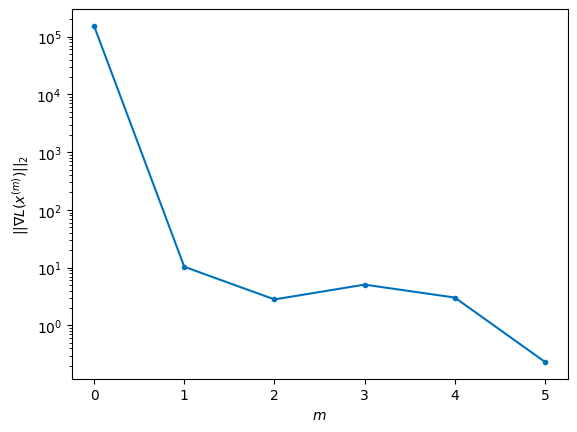


Windows:  38%|███▊      | 113/296 [23:40<31:10, 10.22s/it]

Before applying the algorithm
Cost function: 432.8568682428261
Gradient norm: 189121.37309119815
Global relative error: 1891278778.582938
Position relative errors: 0.015341962461113853 m, 0.4337802154770321 m, 0.24882536997942406 m, 0.12292416025246963 m

Iteration 1
Cost function: 432.1824540037163 (-0.16%)
Gradient norm: 7.15197071907702 (-100.00%)
Global relative error: 0.49334600771985143 (-4.24%)
Position relative errors: 0.02160210766356388 m, 0.3363022486907416 m, 0.10933150450400966 m, 0.34332229762152433 m

Iteration 2
Cost function: 432.1824538152825 (-0.00%)
Gradient norm: 7.452715494871096 (4.21%)
Global relative error: 0.49332050707585995 (-0.01%)
Position relative errors: 0.021602104715971533 m, 0.3363107485303814 m, 0.10927219777129636 m, 0.34329620902247265 m

Iteration 3
Cost function: 432.1824539972076 (0.00%)
Gradient norm: 1.4177391684332878 (-80.98%)
Global relative error: 0.49332052713413566 (0.00%)
Position relative errors: 0.02160210371894629 m, 0.33631074438729

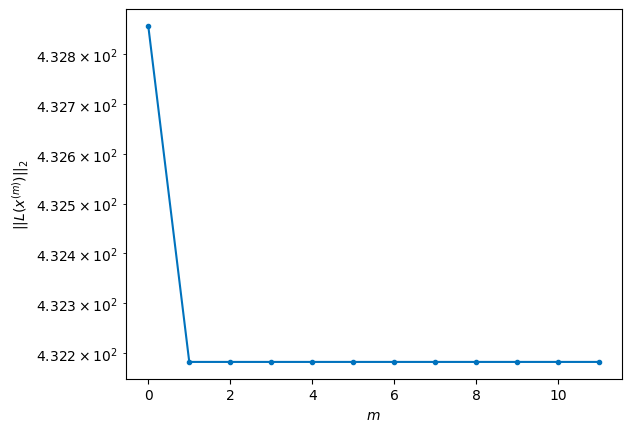

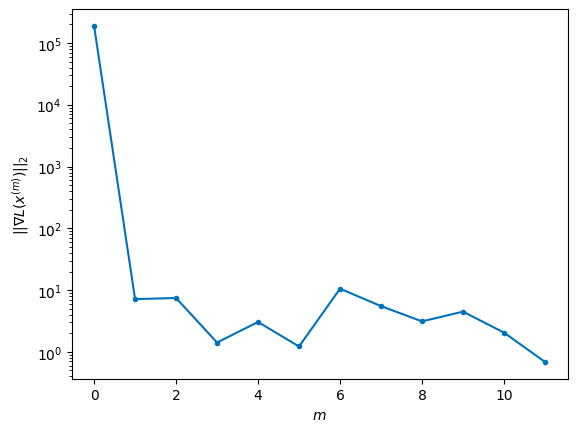


Windows:  39%|███▊      | 114/296 [24:01<40:55, 13.49s/it]

Before applying the algorithm
Cost function: 432.8138886942689
Gradient norm: 36639.47012753819
Global relative error: 1891610855.4869354
Position relative errors: 0.021661788260771607 m, 0.3448578435704235 m, 0.07545461249375636 m, 0.36548221970895445 m

Iteration 1
Cost function: 432.3759452373922 (-0.10%)
Gradient norm: 3.51740962561168 (-99.99%)
Global relative error: 0.5968180708082474 (17.35%)
Position relative errors: 0.01469791264434658 m, 0.48383456404026276 m, 0.23313057922655347 m, 0.2598640771207745 m

Iteration 2
Cost function: 432.3759454724468 (0.00%)
Gradient norm: 1.6656623262372905 (-52.65%)
Global relative error: 0.5968361471748669 (0.00%)
Position relative errors: 0.014697914445463395 m, 0.48385610758130376 m, 0.23314740320133717 m, 0.2598503864372062 m

Iteration 3
Cost function: 432.37594565064137 (0.00%)
Gradient norm: 4.747246382984015 (185.01%)
Global relative error: 0.5968361624194819 (0.00%)
Position relative errors: 0.014697910193262907 m, 0.4838561156701162

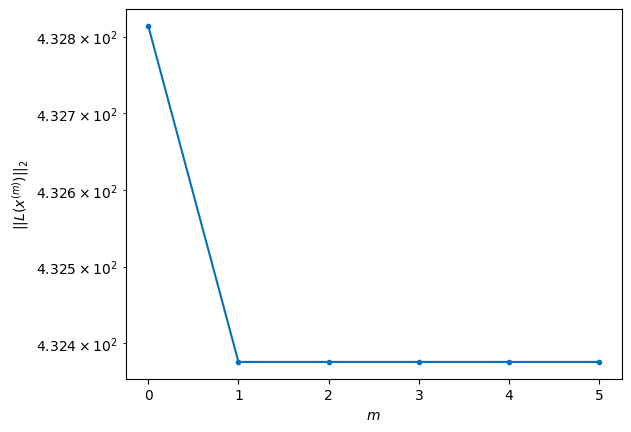

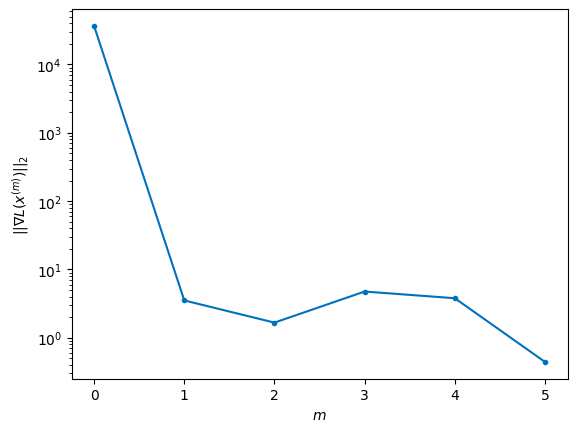


Windows:  39%|███▉      | 115/296 [24:13<38:29, 12.76s/it]

Before applying the algorithm
Cost function: 433.68468850148275
Gradient norm: 179077.48903955345
Global relative error: 1891981093.1454165
Position relative errors: 0.014852288626788803 m, 0.48979071675082314 m, 0.25180924212521544 m, 0.2784037610540229 m

Iteration 1
Cost function: 433.3095119167047 (-0.09%)
Gradient norm: 8.332894465110554 (-100.00%)
Global relative error: 0.7072044443174422 (14.57%)
Position relative errors: 0.00989509556900887 m, 0.4733671581514022 m, 0.17905050700526048 m, 0.49386633303381994 m

STOP on Iteration 2
Cost function = 433.3095116490752 (-0.00%)
Gradient norm = 0.6729532478678849 (-91.92%)
Global relative error = 0.7071890316025065 (-0.00%)
Final position relative errors: 0.00989509620837631 m, 0.47337340226953817 m, 0.17904674286943162 m, 0.4938396416558084 m



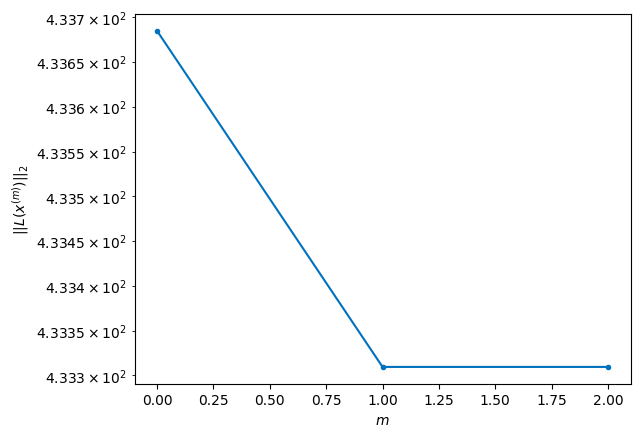

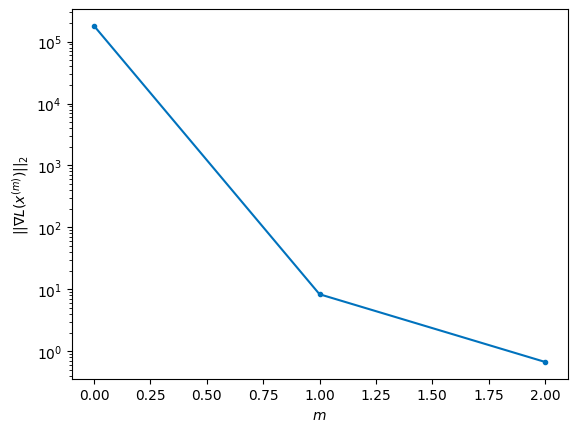


Windows:  39%|███▉      | 116/296 [24:18<32:00, 10.67s/it]

Before applying the algorithm
Cost function: 432.01718401337587
Gradient norm: 208079.7924029281
Global relative error: 1892388049.9591782
Position relative errors: 0.010016777438135145 m, 0.47857571650539715 m, 0.17306840046058172 m, 0.4921700039537372 m

Iteration 1
Cost function: 431.5487094102366 (-0.11%)
Gradient norm: 5.856068863212904 (-100.00%)
Global relative error: 0.8358030984152466 (18.04%)
Position relative errors: 0.008663213440884781 m, 0.3427679944059358 m, 0.361228895973722 m, 0.6712034356028026 m

Iteration 2
Cost function: 431.54870947023 (0.00%)
Gradient norm: 5.440529824382185 (-7.10%)
Global relative error: 0.835816803654368 (0.00%)
Position relative errors: 0.008663214122072887 m, 0.3427691034148425 m, 0.36122227524452694 m, 0.6712234985955927 m

Iteration 3
Cost function: 431.5487093171886 (-0.00%)
Gradient norm: 1.7349627858092391 (-68.11%)
Global relative error: 0.835816772813615 (-0.00%)
Position relative errors: 0.008663210634060009 m, 0.34276909125552 m, 0.

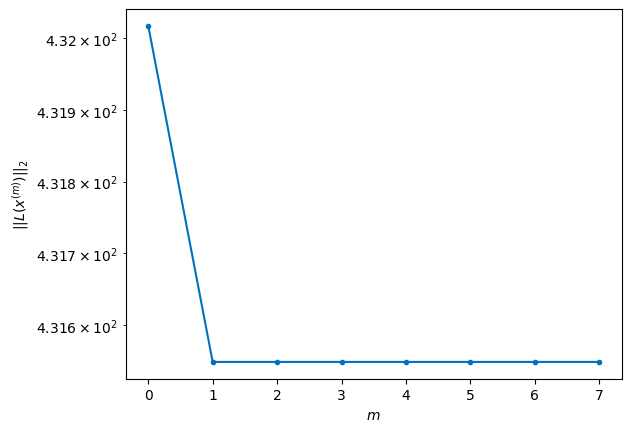

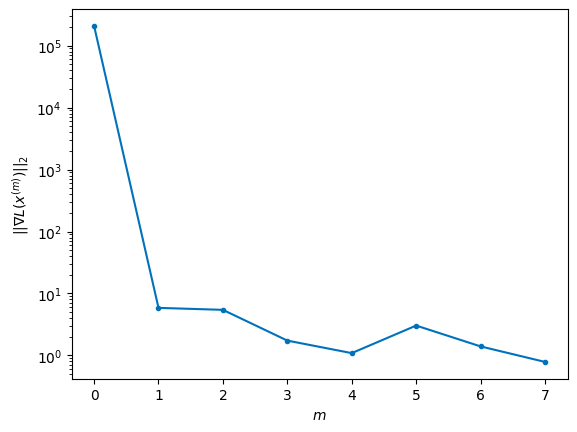


Windows:  40%|███▉      | 117/296 [24:32<34:51, 11.68s/it]

Before applying the algorithm
Cost function: 431.86333666532755
Gradient norm: 114062.86023688283
Global relative error: 1892830077.6235209
Position relative errors: 0.00865485783864696 m, 0.35394322733614614 m, 0.37021605749609715 m, 0.6447852725053346 m

Iteration 1
Cost function: 431.681407577992 (-0.04%)
Gradient norm: 4.753398207328434 (-100.00%)
Global relative error: 0.7176595747757445 (-12.85%)
Position relative errors: 0.007357157814018422 m, 0.39390699399941254 m, 0.397536362852742 m, 0.44920161458037194 m

Iteration 2
Cost function: 431.68140756298214 (-0.00%)
Gradient norm: 3.937749691792685 (-17.16%)
Global relative error: 0.7176640685142346 (0.00%)
Position relative errors: 0.007357158669574969 m, 0.39389798157211814 m, 0.39753377980807825 m, 0.44921898250991626 m

Iteration 3
Cost function: 431.68140739546345 (-0.00%)
Gradient norm: 1.4089341155002106 (-64.22%)
Global relative error: 0.7176640843996417 (0.00%)
Position relative errors: 0.007357159349912771 m, 0.393897979

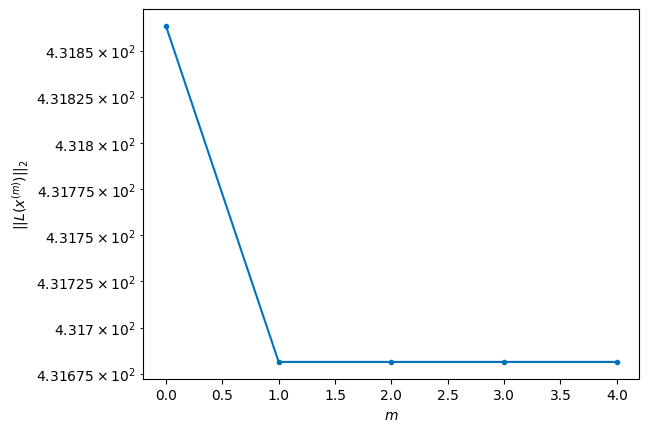

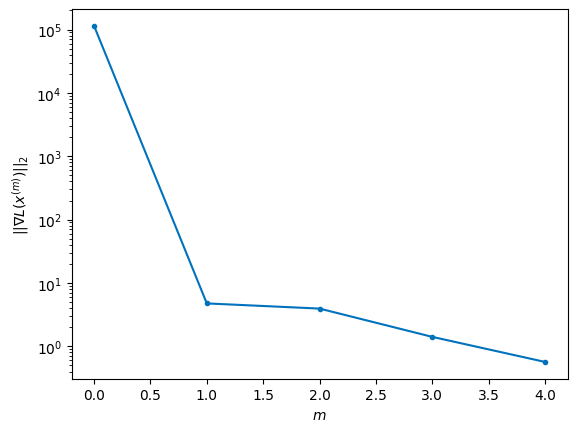


Windows:  40%|███▉      | 118/296 [24:42<32:25, 10.93s/it]

Before applying the algorithm
Cost function: 429.1621741117373
Gradient norm: 160799.37922908302
Global relative error: 1893305341.6612306
Position relative errors: 0.007427620999222051 m, 0.4134304690965341 m, 0.4121772754138685 m, 0.42611177774527054 m

Iteration 1
Cost function: 428.1611724920603 (-0.23%)
Gradient norm: 10.828545320051404 (-99.99%)
Global relative error: 0.4660565145437587 (-35.52%)
Position relative errors: 0.014276423265027486 m, 0.3137813831648634 m, 0.19890378379344115 m, 0.2810354990776198 m

STOP on Iteration 2
Cost function = 428.16117247705165 (-0.00%)
Gradient norm = 0.650171874096308 (-94.00%)
Global relative error = 0.46603038034566857 (-0.01%)
Final position relative errors: 0.014276421628615345 m, 0.3137537104882118 m, 0.19888720514582084 m, 0.2810347916297598 m



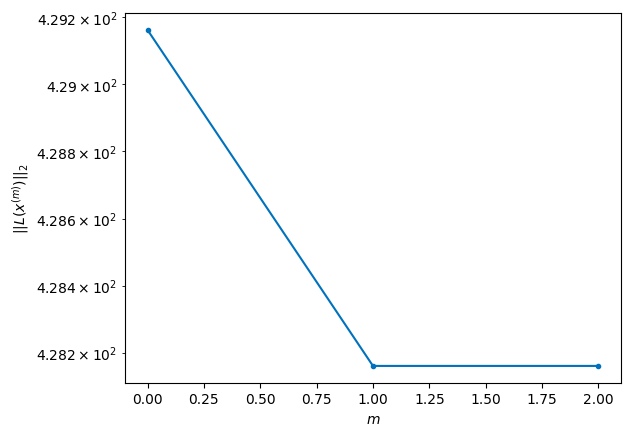

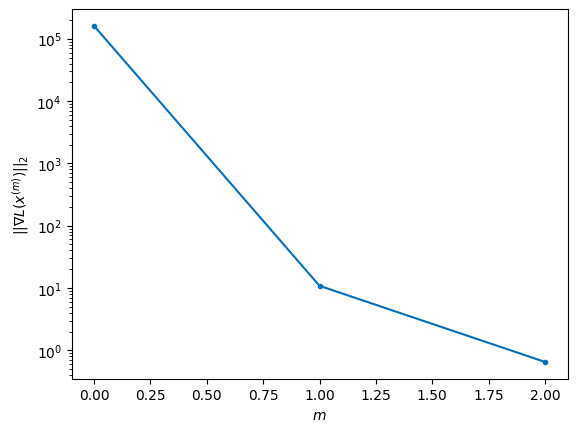


Windows:  40%|████      | 119/296 [24:47<27:47,  9.42s/it]

Before applying the algorithm
Cost function: 429.94592908519525
Gradient norm: 271357.83139651257
Global relative error: 1893811817.84012
Position relative errors: 0.013999544458654879 m, 0.30467292978644556 m, 0.20009540871304693 m, 0.2442869810083775 m

Iteration 1
Cost function: 429.2307945297149 (-0.17%)
Gradient norm: 8.0910122087585 (-100.00%)
Global relative error: 0.6050230997260722 (37.81%)
Position relative errors: 0.015145438080371956 m, 0.578175971233227 m, 0.14417451515678942 m, 0.1036695259985439 m

Iteration 2
Cost function: 429.23079463042296 (0.00%)
Gradient norm: 1.8400537781249469 (-77.26%)
Global relative error: 0.6050900283794717 (0.01%)
Position relative errors: 0.01514544532219203 m, 0.578228497040072 m, 0.14415890832286282 m, 0.10378882898585921 m

Iteration 3
Cost function: 429.2307945967483 (-0.00%)
Gradient norm: 3.773419013269136 (105.07%)
Global relative error: 0.6050900298875156 (0.00%)
Position relative errors: 0.015145440270000404 m, 0.5782284972490767 m

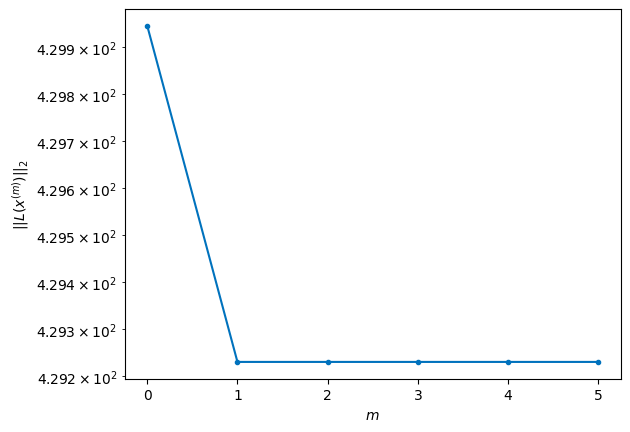

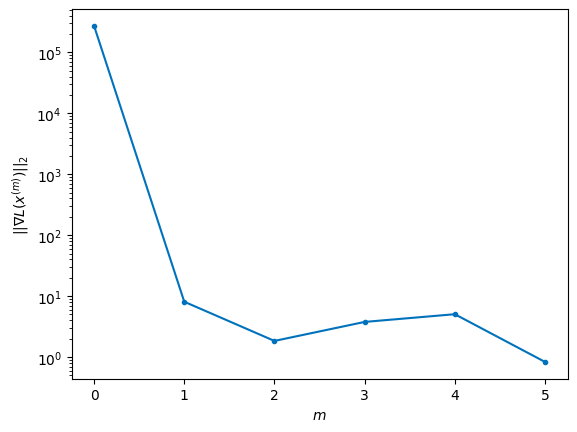


Windows:  41%|████      | 120/296 [24:58<29:03,  9.91s/it]

Before applying the algorithm
Cost function: 428.64098711808555
Gradient norm: 179828.00547326988
Global relative error: 1894347281.6376154
Position relative errors: 0.01475533441609543 m, 0.54221412658547 m, 0.14849533156426248 m, 0.0739646971586589 m

Iteration 1
Cost function: 428.3768743928453 (-0.06%)
Gradient norm: 5.375707186083436 (-100.00%)
Global relative error: 0.726022011950523 (28.00%)
Position relative errors: 0.011604496818708319 m, 0.6842639236831913 m, 0.13864380079647984 m, 0.19882477674192775 m

Iteration 2
Cost function: 428.37687431918556 (-0.00%)
Gradient norm: 7.566427007895551 (40.75%)
Global relative error: 0.7260191932242299 (-0.00%)
Position relative errors: 0.011604495772290148 m, 0.6842618876415315 m, 0.13864077052320206 m, 0.1988236045075528 m

Iteration 3
Cost function: 428.376874149439 (-0.00%)
Gradient norm: 5.509181820311575 (-27.19%)
Global relative error: 0.7260191915351818 (-0.00%)
Position relative errors: 0.011604496307349174 m, 0.6842618845528893

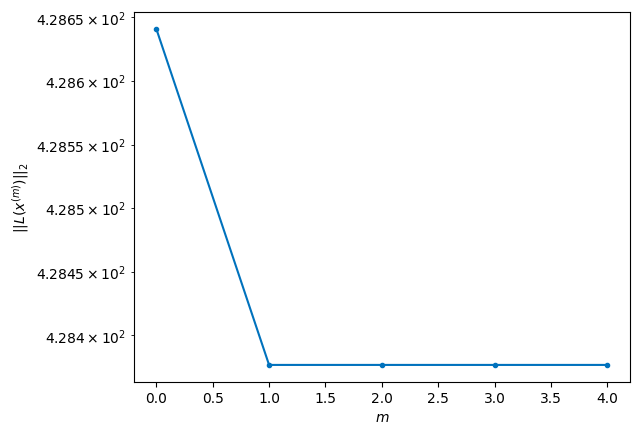

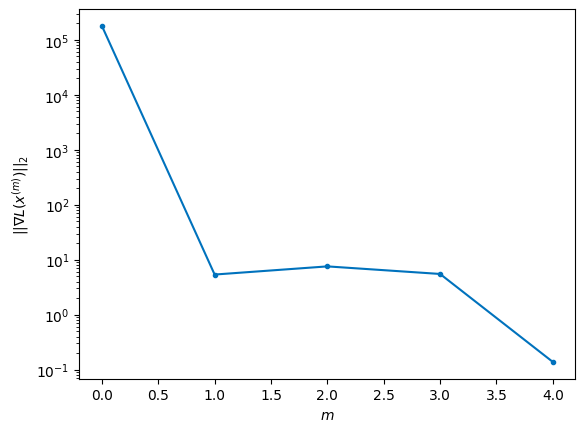


Windows:  41%|████      | 121/296 [25:08<28:16,  9.69s/it]

Before applying the algorithm
Cost function: 428.2423402975939
Gradient norm: 157819.22237791447
Global relative error: 1894909349.019786
Position relative errors: 0.01139410596832187 m, 0.6371861566495906 m, 0.13108464491135746 m, 0.164474681386134 m

Iteration 1
Cost function: 427.76961363229333 (-0.11%)
Gradient norm: 5.437391648696546 (-100.00%)
Global relative error: 0.8669490278013625 (29.18%)
Position relative errors: 0.008029712322614164 m, 0.7118874149283133 m, 0.2047225544316732 m, 0.45037582419719807 m

STOP on Iteration 2
Cost function = 427.7696135753432 (-0.00%)
Gradient norm = 0.8897438049498749 (-83.64%)
Global relative error = 0.8669387789291708 (-0.00%)
Final position relative errors: 0.008029712569552034 m, 0.7118839333177848 m, 0.20470491085527884 m, 0.4503696186414679 m



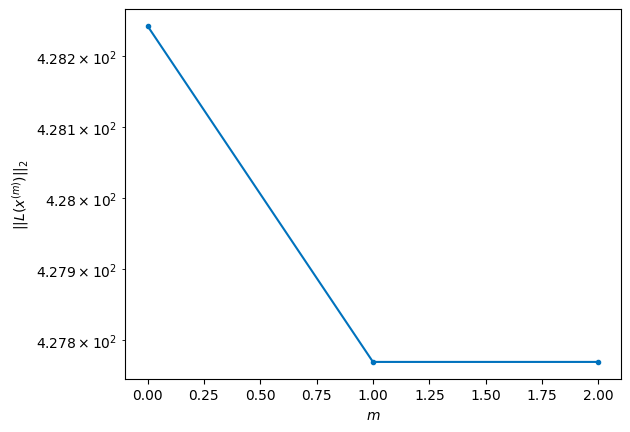

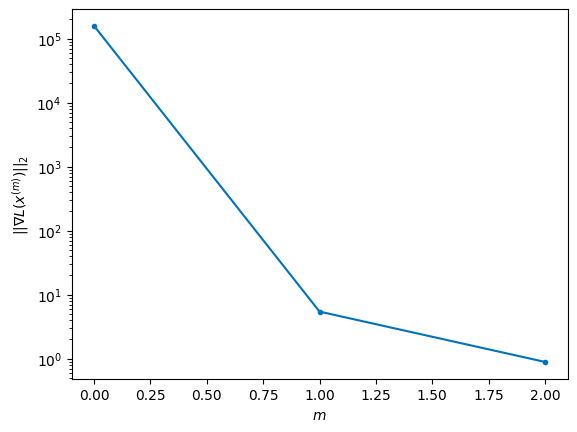


Windows:  41%|████      | 122/296 [25:13<24:39,  8.50s/it]

Before applying the algorithm
Cost function: 428.3637226243118
Gradient norm: 99618.35113288043
Global relative error: 1895495471.9275637
Position relative errors: 0.007784104412832375 m, 0.6655040553790393 m, 0.15642668409604918 m, 0.3995989350568381 m

Iteration 1
Cost function: 427.80836590381546 (-0.13%)
Gradient norm: 9.105250601694538 (-99.99%)
Global relative error: 0.6917968313047353 (-12.64%)
Position relative errors: 0.003903184340877886 m, 0.6687815180349677 m, 0.0564741314184576 m, 0.16765243007023692 m

Iteration 2
Cost function: 427.80836578730225 (-0.00%)
Gradient norm: 3.1734085421143963 (-65.15%)
Global relative error: 0.6917929792720771 (-0.00%)
Position relative errors: 0.003903180588804047 m, 0.6687794236912965 m, 0.05647256608197763 m, 0.16764541692933294 m

STOP on Iteration 3
Cost function = 427.80836580382964 (0.00%)
Gradient norm = 0.7417465214960189 (-76.63%)
Global relative error = 0.6917929839720043 (0.00%)
Final position relative errors: 0.00390318574875295

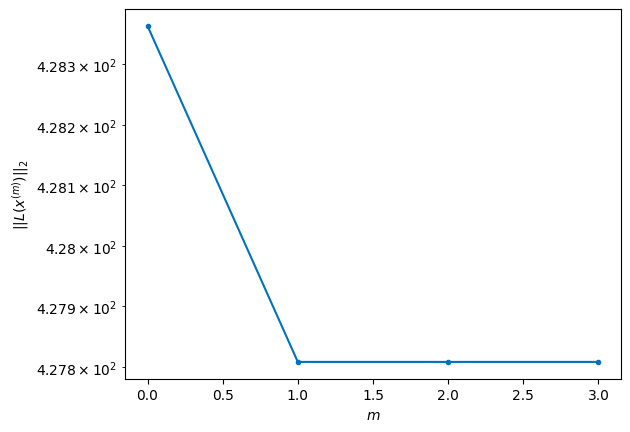

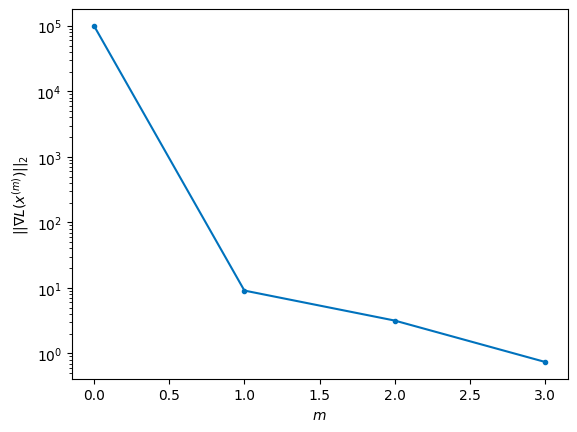


Windows:  42%|████▏     | 123/296 [25:21<23:36,  8.19s/it]

Before applying the algorithm
Cost function: 431.0411324519721
Gradient norm: 71007.12254748856
Global relative error: 1896102947.2869253
Position relative errors: 0.0039538880622436235 m, 0.6222090494010994 m, 0.07277156521213447 m, 0.14818426951181463 m

Iteration 1
Cost function: 430.51777015336165 (-0.12%)
Gradient norm: 4.723526863990361 (-99.99%)
Global relative error: 0.8143600660336378 (26.50%)
Position relative errors: 0.013362126059512805 m, 0.6832597305242957 m, 0.2394755816492882 m, 0.37257115907821814 m

STOP on Iteration 2
Cost function = 430.51777012049826 (-0.00%)
Gradient norm = 0.7227534002200652 (-84.70%)
Global relative error = 0.8143260092913266 (-0.00%)
Final position relative errors: 0.013362130197890162 m, 0.6832474604868868 m, 0.23942693566654535 m, 0.3725504856903748 m



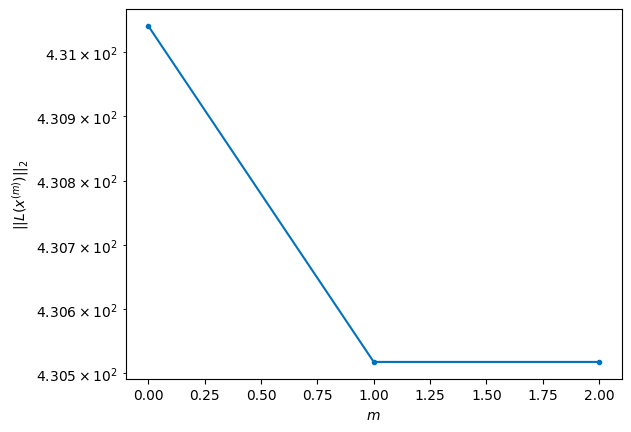

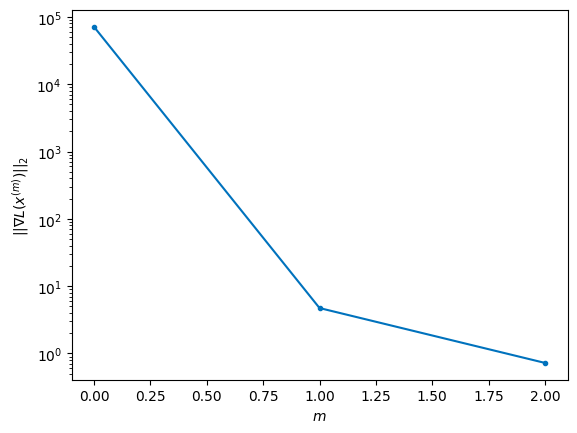


Windows:  42%|████▏     | 124/296 [25:27<21:27,  7.49s/it]

Before applying the algorithm
Cost function: 434.26844126401363
Gradient norm: 27517.889097521802
Global relative error: 1896728951.3703825
Position relative errors: 0.013062938320941977 m, 0.6379626446377743 m, 0.19293677286913813 m, 0.33795887678887654 m

Iteration 1
Cost function: 433.96399302674826 (-0.07%)
Gradient norm: 4.638890808736955 (-99.98%)
Global relative error: 0.7738097468497368 (3.53%)
Position relative errors: 0.014397822527468662 m, 0.6506234082152609 m, 0.055227925737054345 m, 0.41498131282335865 m

Iteration 2
Cost function: 433.9639927374198 (-0.00%)
Gradient norm: 1.2160339324087612 (-73.79%)
Global relative error: 0.7737942137581371 (-0.00%)
Position relative errors: 0.014397825502325315 m, 0.650611156323311 m, 0.05522814091541684 m, 0.41497152867644393 m

STOP on Iteration 3
Cost function = 433.96399289177845 (0.00%)
Gradient norm = 0.1782707963764297 (-85.34%)
Global relative error = 0.7737942118105544 (-0.00%)
Final position relative errors: 0.014397822300486

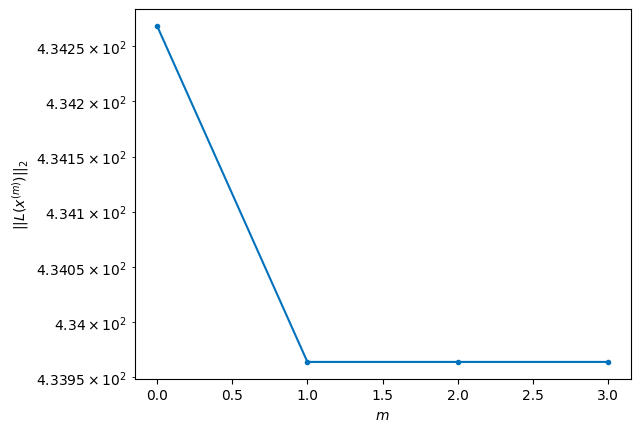

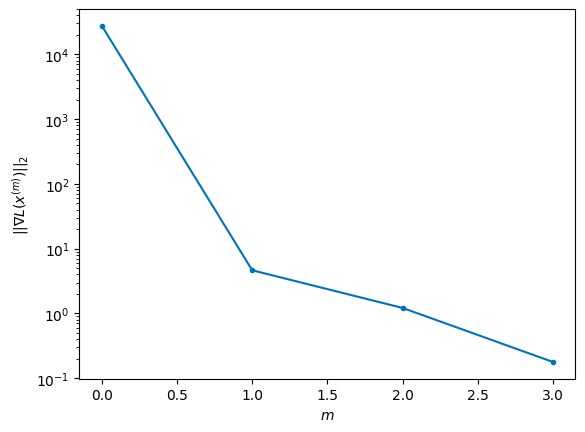


Windows:  42%|████▏     | 125/296 [25:34<21:30,  7.55s/it]

Before applying the algorithm
Cost function: 432.26390590276446
Gradient norm: 287313.8996515194
Global relative error: 1897370524.236623
Position relative errors: 0.014136862306155127 m, 0.5967638127054392 m, 0.08212984725746249 m, 0.36738093031844515 m

Iteration 1
Cost function: 431.9425319300741 (-0.07%)
Gradient norm: 7.34891587295013 (-100.00%)
Global relative error: 1.0382233077696257 (47.11%)
Position relative errors: 0.01252787492129072 m, 0.8303858229017989 m, 0.09468548517475162 m, 0.6158250491822171 m

Iteration 2
Cost function: 431.9425318200925 (-0.00%)
Gradient norm: 3.1139082886185605 (-57.63%)
Global relative error: 1.038254896710592 (0.00%)
Position relative errors: 0.012527872356432075 m, 0.8304104112550467 m, 0.09468620681175868 m, 0.6158450392209649 m

Iteration 3
Cost function: 431.9425320419401 (0.00%)
Gradient norm: 2.3050303196377064 (-25.98%)
Global relative error: 1.038254899664853 (0.00%)
Position relative errors: 0.012527875141768377 m, 0.830410410609657 m,

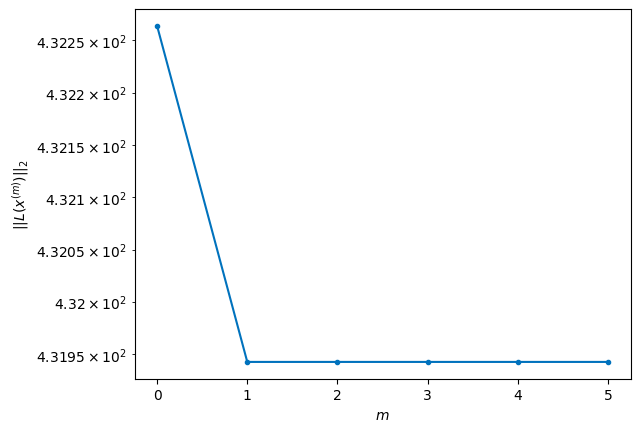

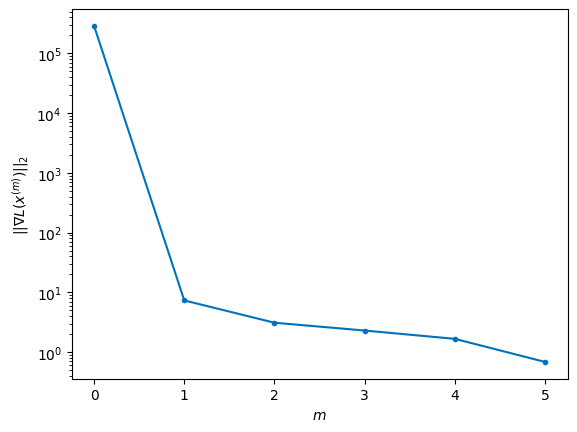


Windows:  43%|████▎     | 126/296 [25:45<24:17,  8.58s/it]

Before applying the algorithm
Cost function: 432.71187001595143
Gradient norm: 102987.58339231278
Global relative error: 1898024606.2166183
Position relative errors: 0.012468166978309304 m, 0.7658014628442567 m, 0.05360844907470561 m, 0.5485765761744081 m

Iteration 1
Cost function: 431.95909255565624 (-0.17%)
Gradient norm: 22.973673513955255 (-99.98%)
Global relative error: 1.5674268005905114 (66.11%)
Position relative errors: 0.01335277719872963 m, 1.1671606299767012 m, 0.197145162142703 m, 1.0273813160335825 m

Iteration 2
Cost function: 431.9590923689817 (-0.00%)
Gradient norm: 1.2479369883855678 (-94.57%)
Global relative error: 1.5675138278845135 (0.01%)
Position relative errors: 0.013352776368302373 m, 1.1672230641376824 m, 0.1971361013595006 m, 1.0274448992582559 m

Iteration 3
Cost function: 431.9590921988244 (-0.00%)
Gradient norm: 1.8507304721422906 (48.30%)
Global relative error: 1.5675138243213733 (-0.00%)
Position relative errors: 0.01335277585975676 m, 1.1672230635288565

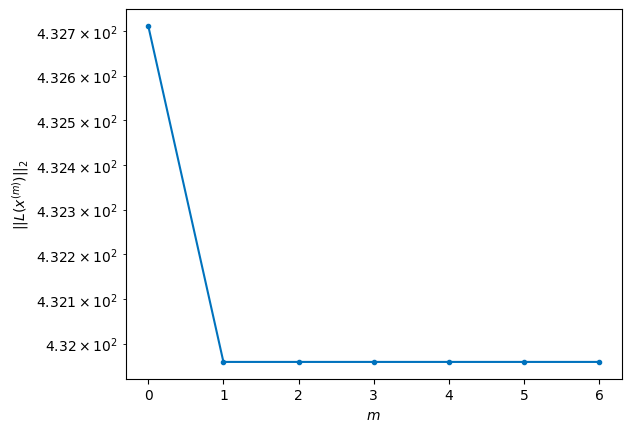

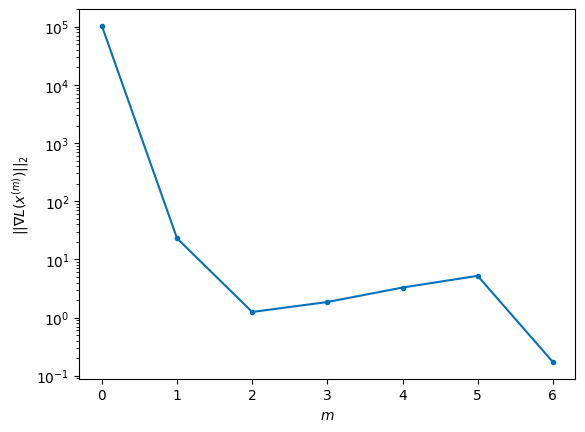


Windows:  43%|████▎     | 127/296 [25:58<27:47,  9.87s/it]

Before applying the algorithm
Cost function: 431.1471761129123
Gradient norm: 236172.3745133199
Global relative error: 1898688053.0424433
Position relative errors: 0.01326058615791822 m, 1.0820226939883058 m, 0.18030757571045905 m, 0.9270060872943732 m

Iteration 1
Cost function: 430.2264766655452 (-0.21%)
Gradient norm: 26.38495220748169 (-99.99%)
Global relative error: 2.233064236353536 (55.48%)
Position relative errors: 0.01328650677868542 m, 1.667198830945546 m, 0.22550464051690158 m, 1.4683287433945942 m

STOP on Iteration 2
Cost function = 430.2264770647573 (0.00%)
Gradient norm = 0.7222170894557517 (-97.26%)
Global relative error = 2.233638840546141 (0.03%)
Final position relative errors: 0.013286506628536175 m, 1.6676690451949185 m, 0.22549889322246053 m, 1.468669593864824 m



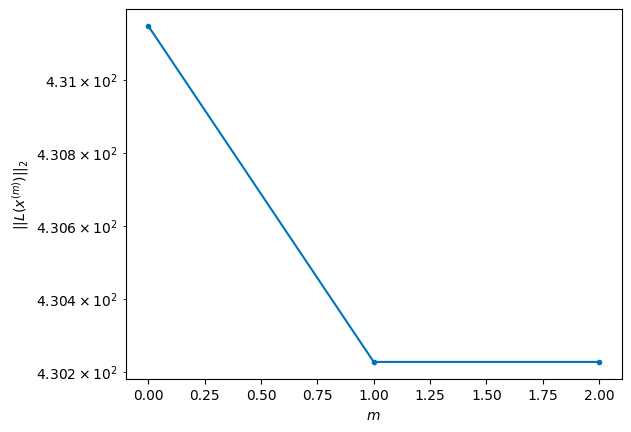

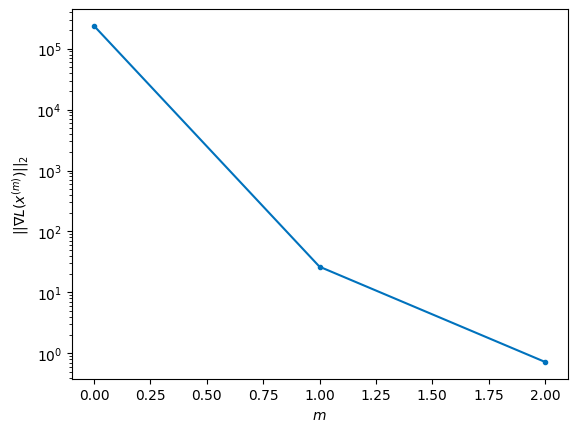


Windows:  43%|████▎     | 128/296 [26:04<24:23,  8.71s/it]

Before applying the algorithm
Cost function: 428.9198159941159
Gradient norm: 170184.72411161926
Global relative error: 1899357660.0527353
Position relative errors: 0.013264346604940396 m, 1.578194017426541 m, 0.23149543276689458 m, 1.3695465341808304 m

Iteration 1
Cost function: 428.27092500234954 (-0.15%)
Gradient norm: 2.8701500265043753 (-100.00%)
Global relative error: 1.9625470195943095 (-6.65%)
Position relative errors: 0.014062892987026383 m, 1.4190897678840197 m, 0.5666511474697268 m, 1.231453096582347 m

Iteration 2
Cost function: 428.2709251381104 (0.00%)
Gradient norm: 5.27511018775923 (83.79%)
Global relative error: 1.9625965011257238 (0.00%)
Position relative errors: 0.014062894726782254 m, 1.4191354129341684 m, 0.5667075415429225 m, 1.2314534037191558 m

STOP on Iteration 3
Cost function = 428.2709250018308 (-0.00%)
Gradient norm = 0.10167772355597209 (-98.07%)
Global relative error = 1.962596507117549 (0.00%)
Final position relative errors: 0.014062893630910622 m, 1.41

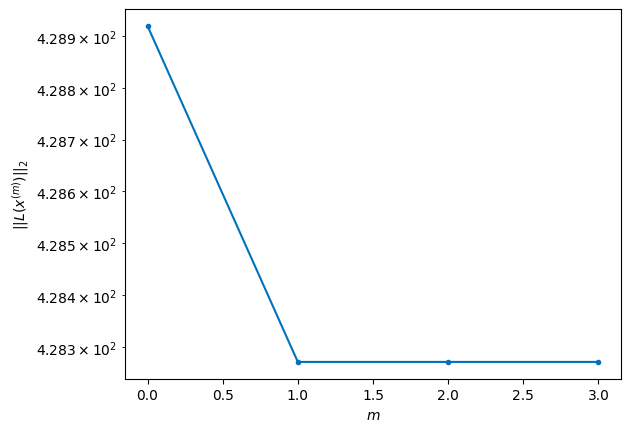

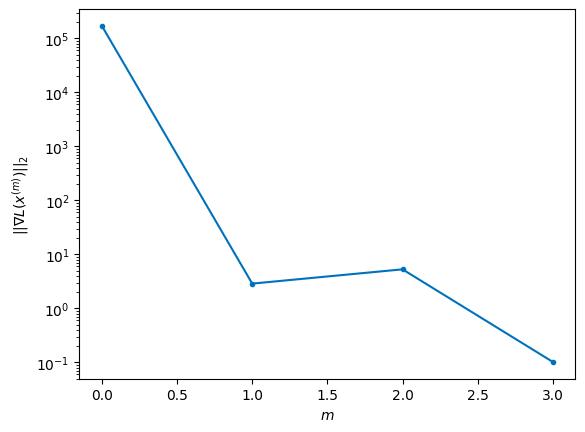


Windows:  44%|████▎     | 129/296 [26:12<23:06,  8.30s/it]

Before applying the algorithm
Cost function: 429.4407442911539
Gradient norm: 167165.91927042877
Global relative error: 1900030160.2483642
Position relative errors: 0.013868706323524271 m, 1.3194880114873138 m, 0.5933791957644918 m, 1.1218908221510673 m

Iteration 1
Cost function: 429.19154768075293 (-0.06%)
Gradient norm: 5.095681601176403 (-100.00%)
Global relative error: 2.019267243095348 (10.29%)
Position relative errors: 0.014324192687242797 m, 1.5123831871426006 m, 0.6195495279320802 m, 1.1857835468674551 m

STOP on Iteration 2
Cost function = 429.1915478891584 (0.00%)
Gradient norm = 0.8874198643789455 (-82.58%)
Global relative error = 2.019365430924329 (0.00%)
Final position relative errors: 0.014324188218927633 m, 1.5124724813944213 m, 0.619553480691413 m, 1.185834796561692 m



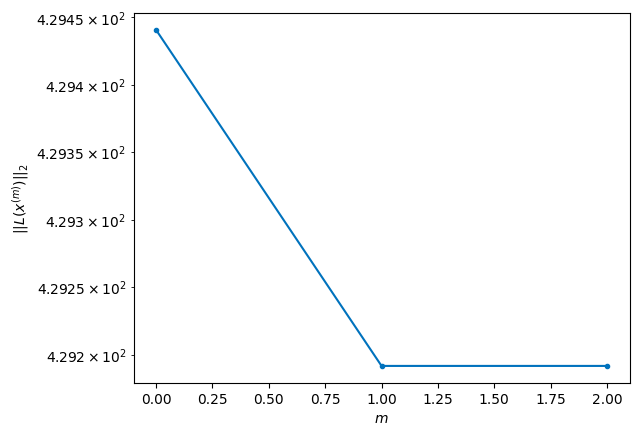

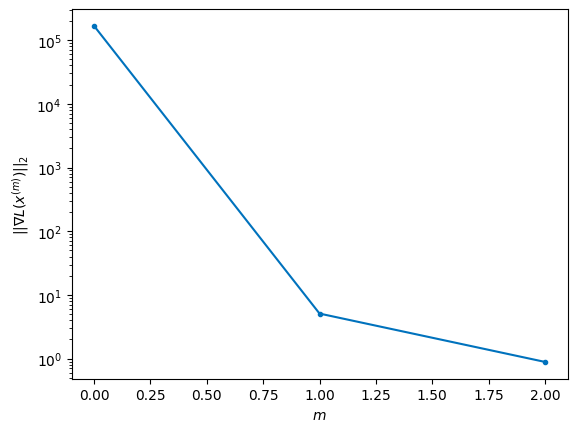


Windows:  44%|████▍     | 130/296 [26:18<20:59,  7.59s/it]

Before applying the algorithm
Cost function: 433.9159176050529
Gradient norm: 349274.99456604465
Global relative error: 1900702282.9844246
Position relative errors: 0.013974844156666139 m, 1.4090895491235647 m, 0.6562665279536778 m, 1.0668153238557836 m

Iteration 1
Cost function: 433.0264615188249 (-0.20%)
Gradient norm: 41.109056613335575 (-99.99%)
Global relative error: 2.5660155522190315 (36.10%)
Position relative errors: 0.012839514272169105 m, 2.124986793766672 m, 0.7567790639839813 m, 1.223101570983038 m

Iteration 2
Cost function: 433.0264616038011 (0.00%)
Gradient norm: 5.429118395493682 (-86.79%)
Global relative error: 2.5661024652036697 (0.00%)
Position relative errors: 0.012839515722186267 m, 2.1250312679000936 m, 0.7567980342946813 m, 1.2231949039265768 m

Iteration 3
Cost function: 433.02646152533805 (-0.00%)
Gradient norm: 3.7433840617188174 (-31.05%)
Global relative error: 2.566102470811225 (0.00%)
Position relative errors: 0.012839515599264684 m, 2.1250312707970656 m, 

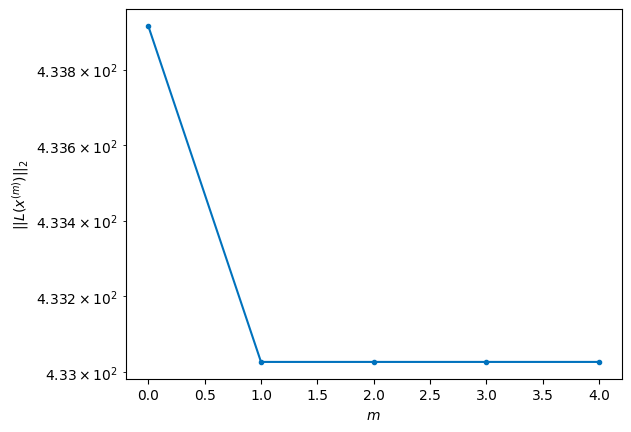

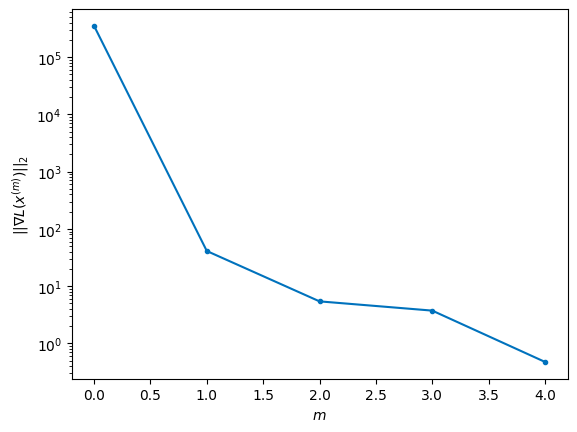


Windows:  44%|████▍     | 131/296 [26:29<24:07,  8.77s/it]

Before applying the algorithm
Cost function: 431.5283128723283
Gradient norm: 145748.27408162018
Global relative error: 1901370727.6472616
Position relative errors: 0.012718953400441173 m, 1.9957973620297347 m, 0.791498042092026 m, 1.092182650560412 m

Iteration 1
Cost function: 431.3619563785378 (-0.04%)
Gradient norm: 1.115009275682376 (-100.00%)
Global relative error: 2.461009678714526 (2.16%)
Position relative errors: 0.014629388333838617 m, 2.1018926855092515 m, 0.803106382488625 m, 0.996700123012809 m

Iteration 2
Cost function: 431.3619562835264 (-0.00%)
Gradient norm: 3.7883205202303216 (239.76%)
Global relative error: 2.4610236135444388 (0.00%)
Position relative errors: 0.014629386211127877 m, 2.1019045558808145 m, 0.8031044982229018 m, 0.9967110157582929 m

Iteration 3
Cost function: 431.36195554009583 (-0.00%)
Gradient norm: 2.430924793348964 (-35.83%)
Global relative error: 2.461023596112676 (-0.00%)
Position relative errors: 0.014629384330410736 m, 2.1019045428499683 m, 0.

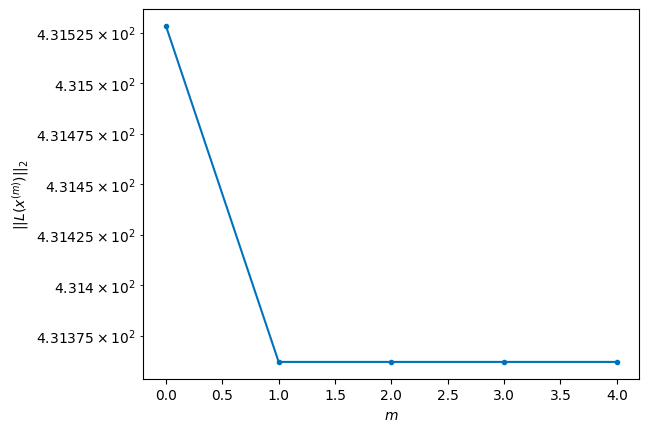

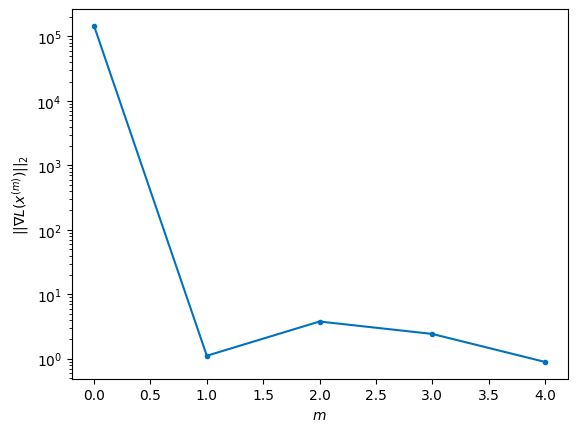


Windows:  45%|████▍     | 132/296 [26:38<24:28,  8.96s/it]

Before applying the algorithm
Cost function: 434.00900019481185
Gradient norm: 171036.52867446214
Global relative error: 1902032212.660756
Position relative errors: 0.014411630756397526 m, 1.9623055641098845 m, 0.8370579756295757 m, 0.8688764225810212 m

Iteration 1
Cost function: 433.50398774229075 (-0.12%)
Gradient norm: 6.750198880504532 (-100.00%)
Global relative error: 2.3910756361816907 (3.80%)
Position relative errors: 0.01597632324868958 m, 2.1075837158478277 m, 0.7550561509224758 m, 0.8396188965690514 m

Iteration 2
Cost function: 433.50398835136775 (0.00%)
Gradient norm: 4.095183139750201 (-39.33%)
Global relative error: 2.391073849607621 (-0.00%)
Position relative errors: 0.015976322086289796 m, 2.1075817347381323 m, 0.755062936049671 m, 0.8396126797831394 m

Iteration 3
Cost function: 433.5039874398315 (-0.00%)
Gradient norm: 6.592486304272139 (60.98%)
Global relative error: 2.3910738406226004 (-0.00%)
Position relative errors: 0.015976325437335247 m, 2.1075817301166033 m, 

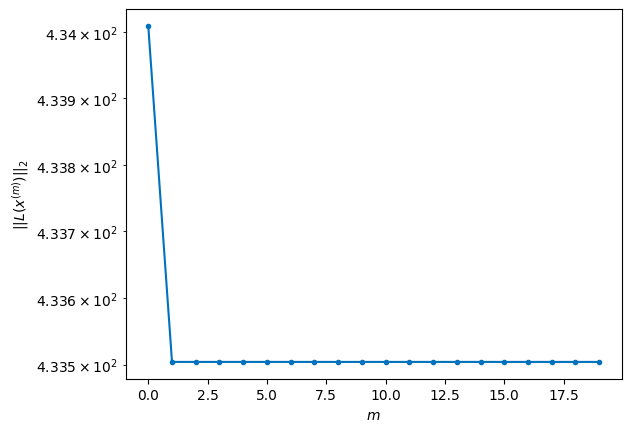

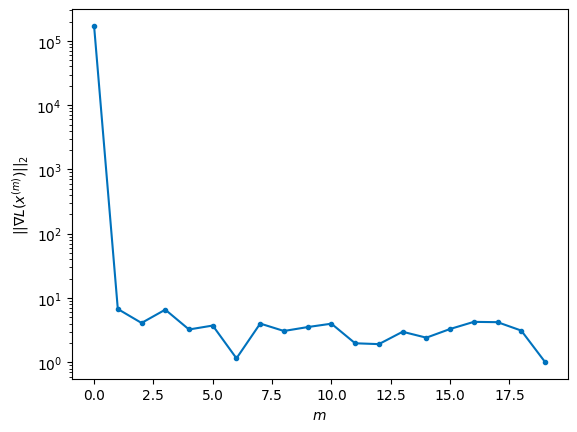


Windows:  45%|████▍     | 133/296 [27:14<46:19, 17.05s/it]

Before applying the algorithm
Cost function: 443.3518875762672
Gradient norm: 297671.80028272344
Global relative error: 1902683490.7970738
Position relative errors: 0.01564738479737925 m, 1.9736052036486178 m, 0.7857177160423431 m, 0.732916270323756 m

Iteration 1
Cost function: 440.95317818034454 (-0.54%)
Gradient norm: 36.57115060239709 (-99.99%)
Global relative error: 2.0285358941240106 (-9.73%)
Position relative errors: 0.020272961420320416 m, 1.9592752398137447 m, 0.14021636562334505 m, 0.5060851314925626 m

Iteration 2
Cost function: 440.9531777024077 (-0.00%)
Gradient norm: 4.012550062676983 (-89.03%)
Global relative error: 2.0287408689110595 (0.01%)
Position relative errors: 0.0202729620141096 m, 1.9594522845084426 m, 0.1403896820634105 m, 0.5061732664017435 m

STOP on Iteration 3
Cost function = 440.9531781435708 (0.00%)
Gradient norm = 0.9269483611039262 (-76.90%)
Global relative error = 2.0287408515462064 (-0.00%)
Final position relative errors: 0.020272962609299807 m, 1.959

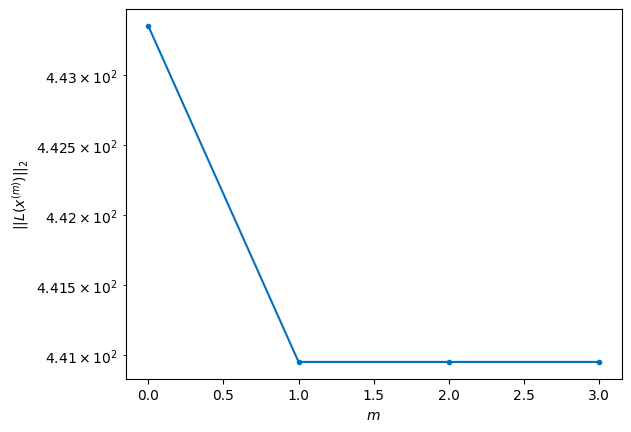

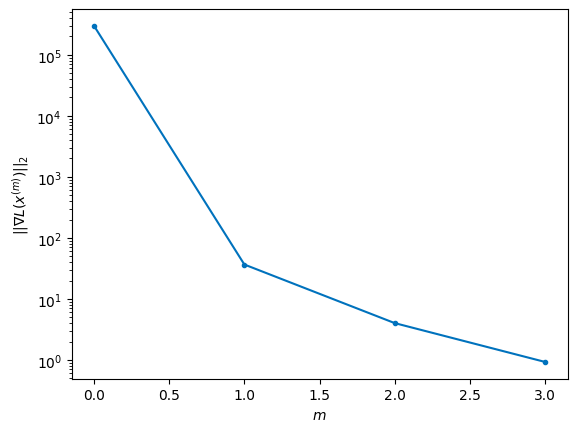


Windows:  45%|████▌     | 134/296 [27:22<38:19, 14.20s/it]

Before applying the algorithm
Cost function: 434.6426459180459
Gradient norm: 103050.44810673711
Global relative error: 1903321380.5756145
Position relative errors: 0.019955217096746698 m, 1.8513727211043995 m, 0.15139985646990833 m, 0.4455116337040325 m

Iteration 1
Cost function: 434.0276103947967 (-0.14%)
Gradient norm: 7.811147887401495 (-99.99%)
Global relative error: 1.6158435164352665 (-15.42%)
Position relative errors: 0.019936281783026755 m, 1.5648762140110828 m, 0.1641107871774329 m, 0.3671224779251532 m

Iteration 2
Cost function: 434.0276102426748 (-0.00%)
Gradient norm: 6.301109798363813 (-19.33%)
Global relative error: 1.615785462988483 (-0.00%)
Position relative errors: 0.019936280904387 m, 1.5648208503813723 m, 0.16410727960894653 m, 0.36710452117686104 m

STOP on Iteration 3
Cost function = 434.0276109843138 (0.00%)
Gradient norm = 0.9008202258069663 (-85.70%)
Global relative error = 1.6157854617733527 (-0.00%)
Final position relative errors: 0.019936280828126273 m, 1.

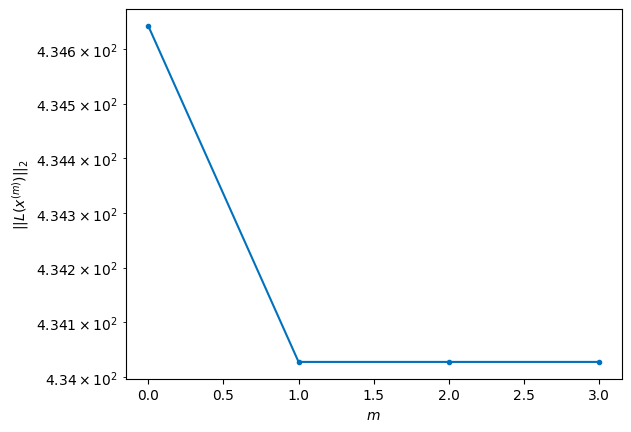

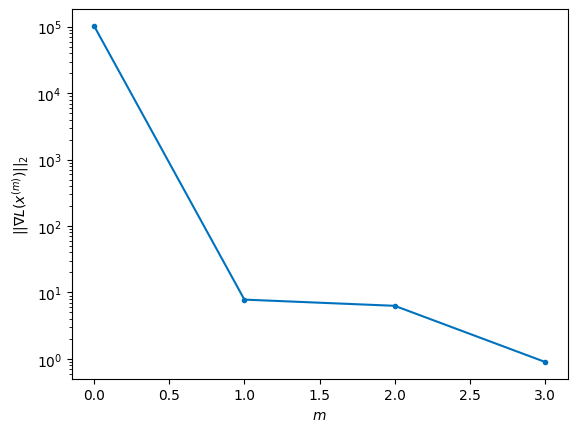


Windows:  46%|████▌     | 135/296 [27:30<32:53, 12.26s/it]

Before applying the algorithm
Cost function: 438.2774579701219
Gradient norm: 126224.83735607783
Global relative error: 1903942742.487268
Position relative errors: 0.0195270801125369 m, 1.4616403568699492 m, 0.18295054881428938 m, 0.3197321421166538 m

Iteration 1
Cost function: 437.6901119082924 (-0.13%)
Gradient norm: 9.413455430573295 (-99.99%)
Global relative error: 1.1227689038173037 (-25.52%)
Position relative errors: 0.02059336546034189 m, 1.0593381735404321 m, 0.34465965042658253 m, 0.13854300879370504 m

STOP on Iteration 2
Cost function = 437.69011211717424 (0.00%)
Gradient norm = 0.20524016374804485 (-97.82%)
Global relative error = 1.1227159430119358 (-0.00%)
Final position relative errors: 0.020593359400675425 m, 1.0592761150623309 m, 0.34467027884336493 m, 0.13856188014071052 m



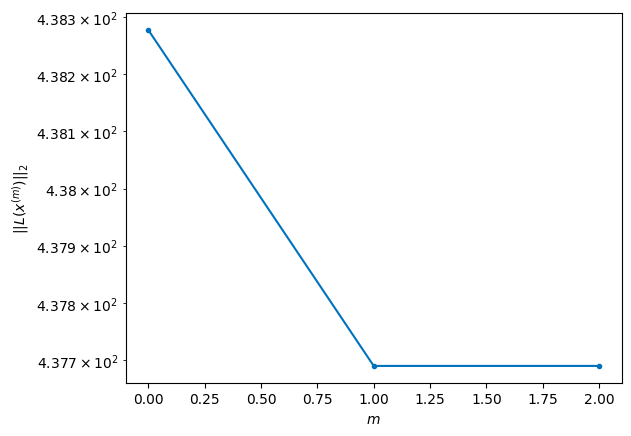

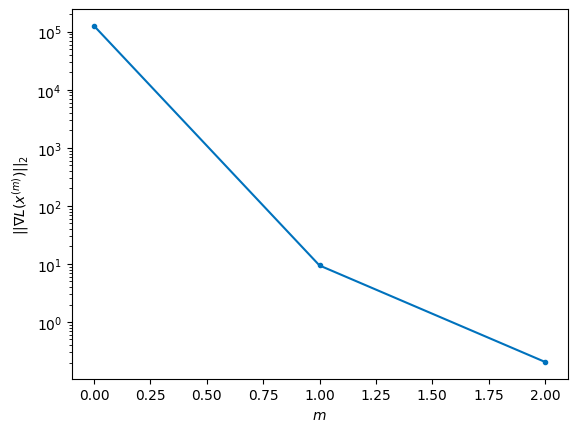


Windows:  46%|████▌     | 136/296 [27:36<27:43, 10.40s/it]

Before applying the algorithm
Cost function: 435.6334835086074
Gradient norm: 51557.51986046226
Global relative error: 1904544562.1734076
Position relative errors: 0.020042245173032307 m, 0.9564139668153312 m, 0.3703585091309745 m, 0.16577392306185737 m

Iteration 1
Cost function: 435.04677101820477 (-0.13%)
Gradient norm: 47.214882312466095 (-99.91%)
Global relative error: 0.6990462317689669 (-32.73%)
Position relative errors: 0.018727038380760248 m, 0.2652837316716313 m, 0.36420740939602936 m, 0.5341244226099624 m

STOP on Iteration 2
Cost function = 435.0467707715479 (-0.00%)
Gradient norm = 0.7738709953710187 (-98.36%)
Global relative error = 0.6990268001410611 (-0.00%)
Final position relative errors: 0.018727035576769288 m, 0.26526304029128545 m, 0.36420612292542287 m, 0.534110145331423 m



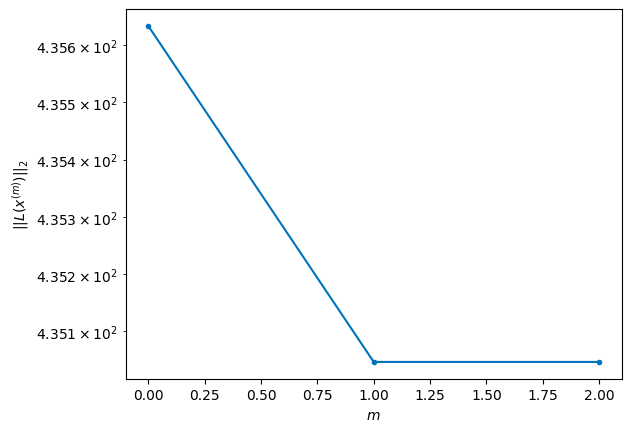

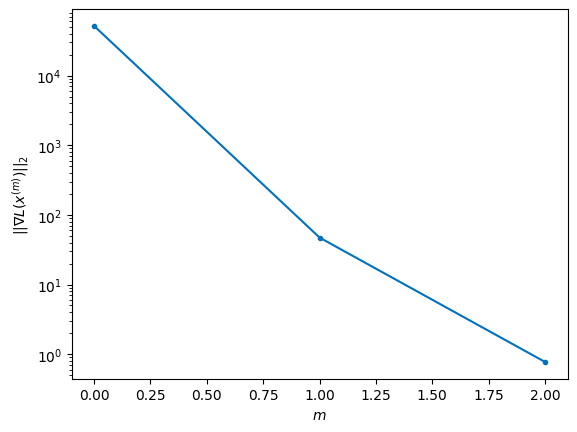


Windows:  46%|████▋     | 137/296 [27:42<23:54,  9.02s/it]

Before applying the algorithm
Cost function: 435.15378910054125
Gradient norm: 317118.4943054874
Global relative error: 1905123931.4180188
Position relative errors: 0.018021257574046504 m, 0.2264685781517731 m, 0.3871873822657501 m, 0.5847490637494542 m

Iteration 1
Cost function: 434.43152031272007 (-0.17%)
Gradient norm: 4.617522871409384 (-100.00%)
Global relative error: 0.7174128861996362 (-2.68%)
Position relative errors: 0.03260324423071739 m, 0.24498375929811642 m, 0.4318662581252761 m, 0.5168069997825129 m

Iteration 2
Cost function: 434.43152012469926 (-0.00%)
Gradient norm: 3.031157817078984 (-34.36%)
Global relative error: 0.7174254240507232 (0.00%)
Position relative errors: 0.03260325345386474 m, 0.24488287259652172 m, 0.43187284366214884 m, 0.5168667110082467 m

STOP on Iteration 3
Cost function = 434.43152005256064 (-0.00%)
Gradient norm = 0.27453343675059955 (-90.94%)
Global relative error = 0.7174254183351387 (-0.00%)
Final position relative errors: 0.0326032469525198 m

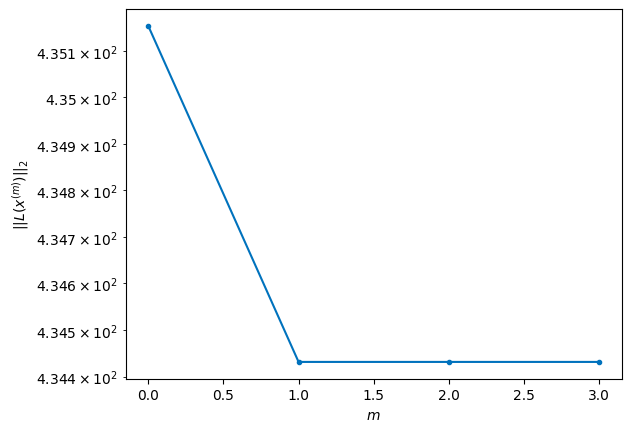

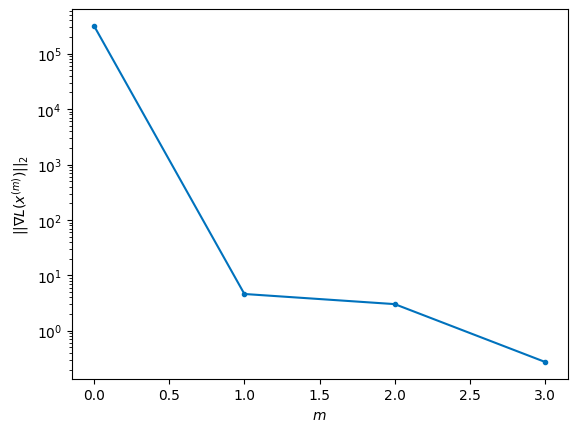


Windows:  47%|████▋     | 138/296 [27:49<22:36,  8.59s/it]

Before applying the algorithm
Cost function: 436.06463839637536
Gradient norm: 142799.27607228284
Global relative error: 1905678062.918806
Position relative errors: 0.03133236411972436 m, 0.15046344237575202 m, 0.4354756454857027 m, 0.5539816512702486 m

Iteration 1
Cost function: 435.6724395274245 (-0.09%)
Gradient norm: 4.8601661492755115 (-100.00%)
Global relative error: 1.0188485391096072 (41.27%)
Position relative errors: 0.02737271991769693 m, 0.11550545285211924 m, 0.4051592594255147 m, 0.9272565244115499 m

Iteration 2
Cost function: 435.67243938663887 (-0.00%)
Gradient norm: 2.9663377596512945 (-38.97%)
Global relative error: 1.0188483435290419 (-0.00%)
Position relative errors: 0.02737272234425318 m, 0.11548725086754472 m, 0.4051597828468273 m, 0.9272583479398087 m

Iteration 3
Cost function: 435.67243963210456 (0.00%)
Gradient norm: 3.108182569017225 (4.78%)
Global relative error: 1.0188483483685669 (0.00%)
Position relative errors: 0.027372721027828166 m, 0.1154872450765764

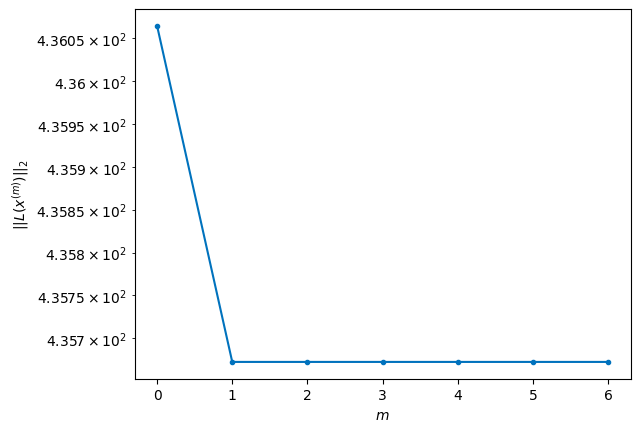

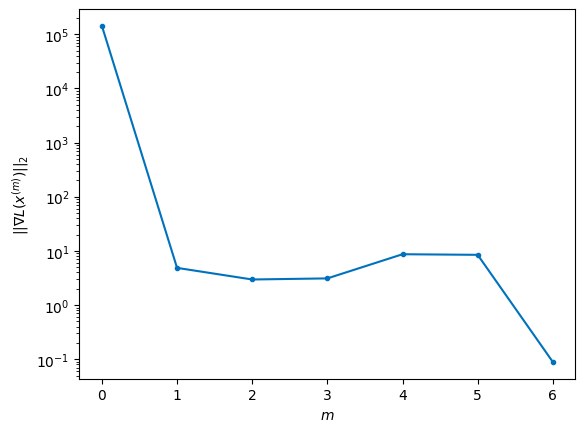


Windows:  47%|████▋     | 139/296 [28:02<26:00,  9.94s/it]

Before applying the algorithm
Cost function: 438.8828408951712
Gradient norm: 55666.113948334685
Global relative error: 1906204330.7146828
Position relative errors: 0.026246257163845925 m, 0.03456138560906897 m, 0.41332965402578725 m, 0.952811928842746 m

Iteration 1
Cost function: 438.71702590161493 (-0.04%)
Gradient norm: 2.4945483838191747 (-100.00%)
Global relative error: 1.2571406682777926 (20.94%)
Position relative errors: 0.03242994413063544 m, 0.1305360090186511 m, 0.4190118565256002 m, 1.1775983452492713 m

Iteration 2
Cost function: 438.7170266537361 (0.00%)
Gradient norm: 3.9200537717764288 (57.14%)
Global relative error: 1.2571536089280397 (0.00%)
Position relative errors: 0.03242994717559062 m, 0.1305530949924082 m, 0.41901190884195894 m, 1.1776102472169594 m

Iteration 3
Cost function: 438.7170258501434 (-0.00%)
Gradient norm: 6.967371794308159 (77.74%)
Global relative error: 1.257153620845968 (0.00%)
Position relative errors: 0.03242995731638254 m, 0.13055310698379088 m,

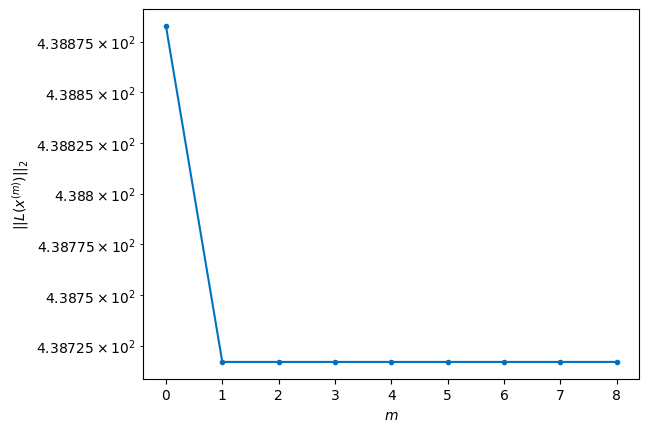

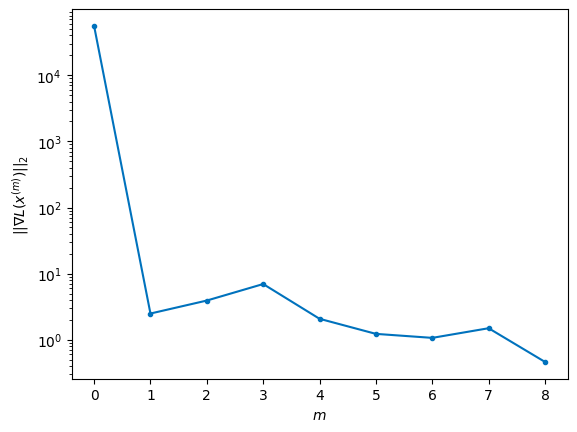


Windows:  47%|████▋     | 140/296 [28:18<30:46, 11.84s/it]

Before applying the algorithm
Cost function: 437.1734876881111
Gradient norm: 243539.2192897573
Global relative error: 1906700256.1973982
Position relative errors: 0.031017856784709724 m, 0.214833786784071 m, 0.42908040204703835 m, 1.192216075314845 m

Iteration 1
Cost function: 436.7497768529542 (-0.10%)
Gradient norm: 6.938426011080785 (-100.00%)
Global relative error: 1.3549740040736986 (5.40%)
Position relative errors: 0.020944182929346727 m, 0.4734354010796422 m, 0.4357115046137165 m, 1.1922785758942844 m

Iteration 2
Cost function: 436.74977701872746 (0.00%)
Gradient norm: 2.9937445529721516 (-56.85%)
Global relative error: 1.3550070580149693 (0.00%)
Position relative errors: 0.02094417519789339 m, 0.4734738868000279 m, 0.4357207448086716 m, 1.192297481226619 m

STOP on Iteration 3
Cost function = 436.7497769703303 (-0.00%)
Gradient norm = 0.9637455341172205 (-67.81%)
Global relative error = 1.3550070875492823 (0.00%)
Final position relative errors: 0.020944174429142592 m, 0.4734

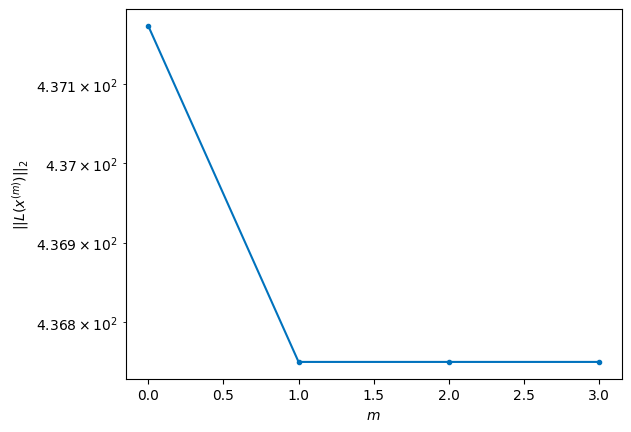

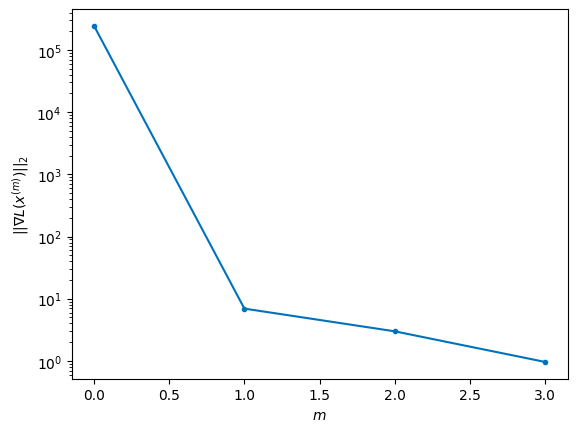


Windows:  48%|████▊     | 141/296 [28:26<27:10, 10.52s/it]

Before applying the algorithm
Cost function: 435.9253302624224
Gradient norm: 147922.7294102671
Global relative error: 1907163543.685273
Position relative errors: 0.020009236234742066 m, 0.551897041211844 m, 0.44162547883701897 m, 1.20401921817863 m

Iteration 1
Cost function: 435.5266447535811 (-0.09%)
Gradient norm: 14.781952757908309 (-99.99%)
Global relative error: 1.97207267907382 (41.23%)
Position relative errors: 0.023792655005776528 m, 0.8657896476935892 m, 0.41507118747005955 m, 1.7223898848659531 m

STOP on Iteration 2
Cost function = 435.52664495621985 (0.00%)
Gradient norm = 0.9612485331397145 (-93.50%)
Global relative error = 1.9721338221269138 (0.00%)
Final position relative errors: 0.023792653278540157 m, 0.8658610341491421 m, 0.41507281416389347 m, 1.722423615030401 m



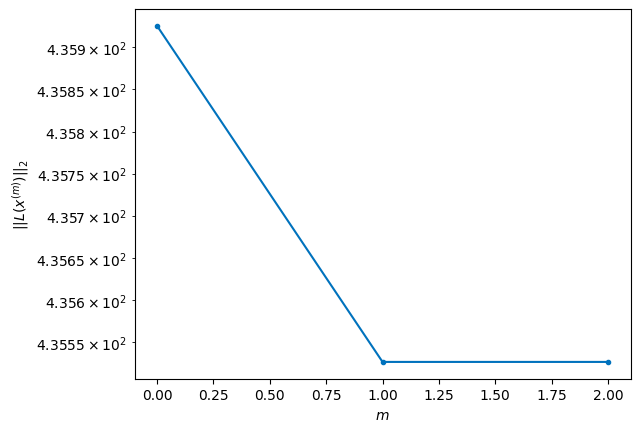

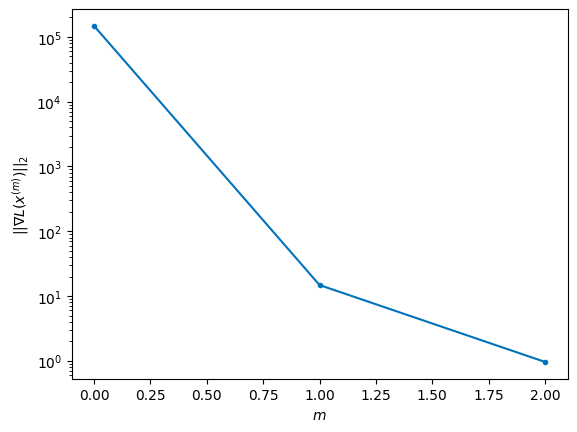


Windows:  48%|████▊     | 142/296 [28:32<23:27,  9.14s/it]

Before applying the algorithm
Cost function: 427.8254469370373
Gradient norm: 72156.68595385406
Global relative error: 1907592081.4644892
Position relative errors: 0.02267633805528563 m, 0.9376562466841419 m, 0.4283407725002337 m, 1.731081404430128 m

Iteration 1
Cost function: 427.0502917850539 (-0.18%)
Gradient norm: 3.6480923130482625 (-99.99%)
Global relative error: 1.7404772658394088 (-13.62%)
Position relative errors: 0.04376598305373345 m, 0.851274236034857 m, 0.4145543049759505 m, 1.4597332772460783 m

Iteration 2
Cost function: 427.05029175027306 (-0.00%)
Gradient norm: 1.4126625388097604 (-61.28%)
Global relative error: 1.7404286829999915 (-0.00%)
Position relative errors: 0.043765981689728235 m, 0.8512439195358169 m, 0.4145414277594512 m, 1.4596966874759278 m

Iteration 3
Cost function: 427.0502917599567 (0.00%)
Gradient norm: 2.8054813363444375 (98.60%)
Global relative error: 1.7404286482751197 (-0.00%)
Position relative errors: 0.04376597745148379 m, 0.8512439014223596 m, 

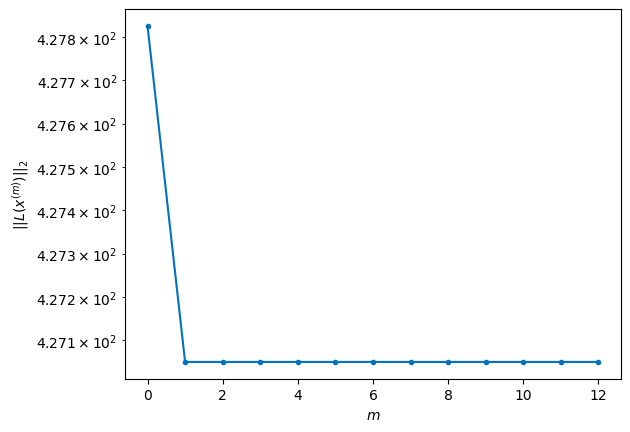

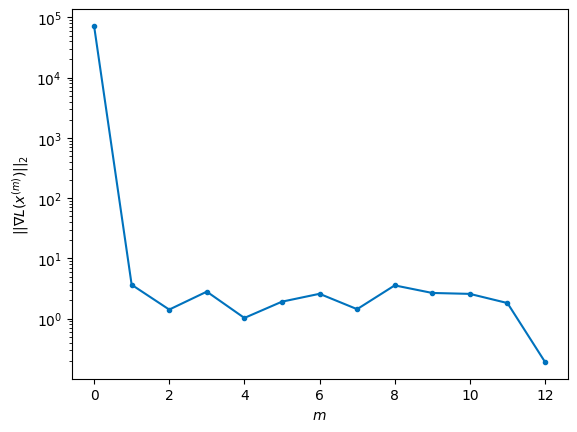


Windows:  48%|████▊     | 143/296 [28:55<33:54, 13.30s/it]

Before applying the algorithm
Cost function: 425.3794345804974
Gradient norm: 215327.14896103193
Global relative error: 1907983965.521461
Position relative errors: 0.042136282038532535 m, 0.9092968910748286 m, 0.4280041136405025 m, 1.4478125753778197 m

Iteration 1
Cost function: 424.87995990507704 (-0.12%)
Gradient norm: 4.504271026341511 (-100.00%)
Global relative error: 1.9369038460128163 (9.87%)
Position relative errors: 0.040506330411982296 m, 0.935692741875571 m, 0.39080706017090205 m, 1.6497586750997364 m

Iteration 2
Cost function: 424.8799602962237 (0.00%)
Gradient norm: 11.146596358008477 (147.47%)
Global relative error: 1.9368875188543822 (-0.00%)
Position relative errors: 0.04050632747334074 m, 0.9356742591574305 m, 0.3908103888990463 m, 1.6497492004710712 m

Iteration 3
Cost function: 424.87995990291694 (-0.00%)
Gradient norm: 12.759845179147618 (14.47%)
Global relative error: 1.9368875283911158 (0.00%)
Position relative errors: 0.04050634094296529 m, 0.9356742698124172 m,

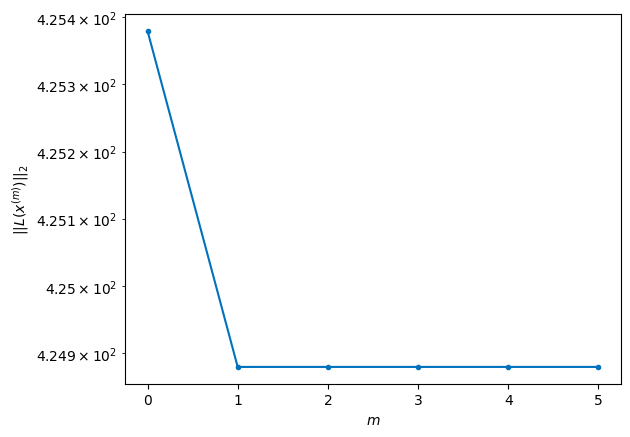

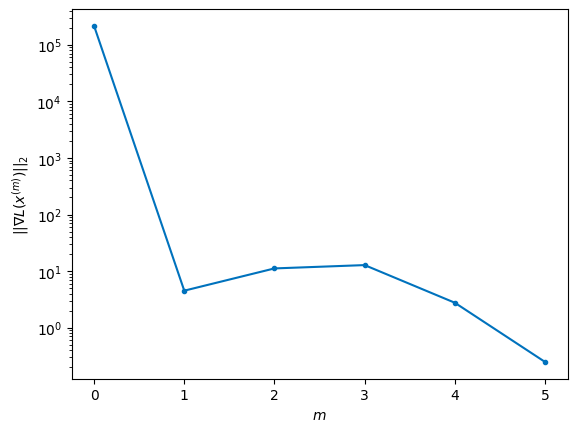


Windows:  49%|████▊     | 144/296 [29:06<31:52, 12.58s/it]

Before applying the algorithm
Cost function: 423.38487873954665
Gradient norm: 73245.13594408204
Global relative error: 1908337485.01843
Position relative errors: 0.039164204335596836 m, 0.9816756718635287 m, 0.3941153558280212 m, 1.6344925789221403 m

Iteration 1
Cost function: 422.79547486424906 (-0.14%)
Gradient norm: 5.965509720050505 (-99.99%)
Global relative error: 1.7061958236221064 (-12.38%)
Position relative errors: 0.04131821581087618 m, 0.778988882872526 m, 0.4474635550320461 m, 1.4499477247454806 m

Iteration 2
Cost function: 422.79547513604854 (0.00%)
Gradient norm: 3.990377855099224 (-33.11%)
Global relative error: 1.7061858087786872 (-0.00%)
Position relative errors: 0.04131821518862929 m, 0.7789770459401584 m, 0.44746525526952763 m, 1.4499417746999577 m

Iteration 3
Cost function: 422.7954751890624 (0.00%)
Gradient norm: 2.7440626906296943 (-31.23%)
Global relative error: 1.7061858542980934 (0.00%)
Position relative errors: 0.04131821909980534 m, 0.7789770700194838 m, 0

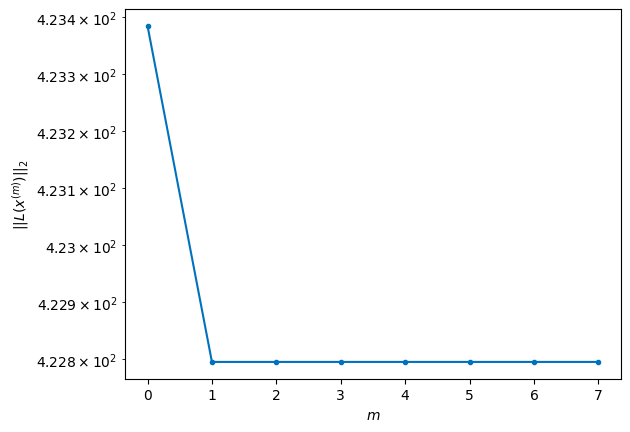

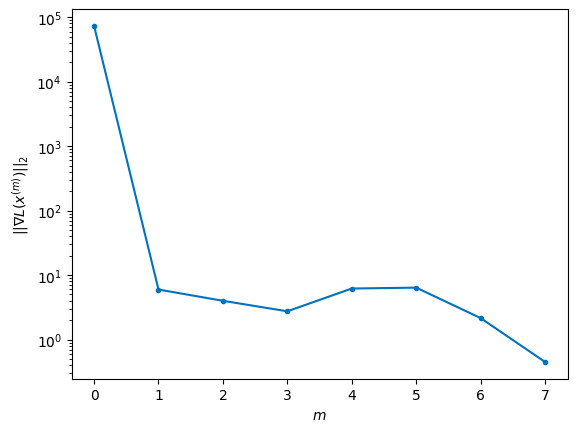


Windows:  49%|████▉     | 145/296 [29:20<33:00, 13.12s/it]

Before applying the algorithm
Cost function: 425.25525293771483
Gradient norm: 53110.00316030301
Global relative error: 1908651156.6800709
Position relative errors: 0.03992295003603177 m, 0.8360502068967414 m, 0.4441505451876691 m, 1.4307922879207986 m

Iteration 1
Cost function: 424.7120709225254 (-0.13%)
Gradient norm: 9.550526325348411 (-99.98%)
Global relative error: 1.275925386672899 (-25.65%)
Position relative errors: 0.03514065984948405 m, 0.6098670679127169 m, 0.34900399416299543 m, 1.0644283580711562 m

Iteration 2
Cost function: 424.7120708923269 (-0.00%)
Gradient norm: 3.4088163771324065 (-64.31%)
Global relative error: 1.2759879940650967 (0.00%)
Position relative errors: 0.03514065969461925 m, 0.6099135118229795 m, 0.3490121495435383 m, 1.0644741209656812 m

STOP on Iteration 3
Cost function = 424.7120709658598 (0.00%)
Gradient norm = 0.39085028021965706 (-88.53%)
Global relative error = 1.2759880279276472 (0.00%)
Final position relative errors: 0.03514066112613067 m, 0.609

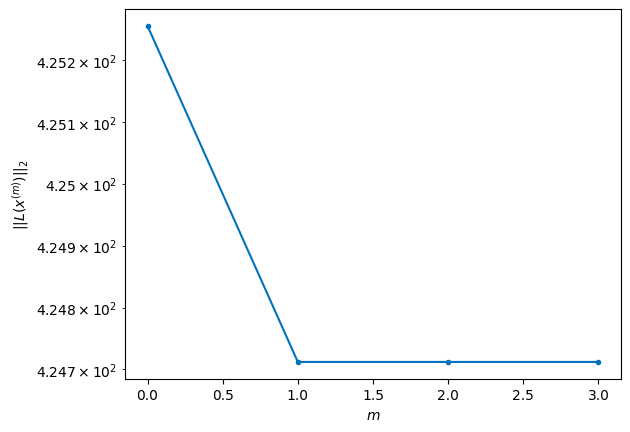

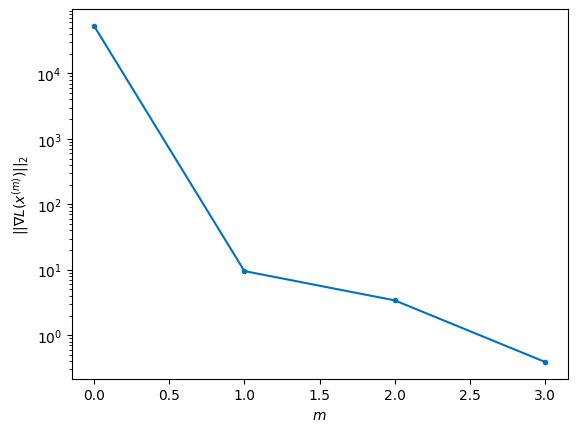


Windows:  49%|████▉     | 146/296 [29:28<28:32, 11.42s/it]

Before applying the algorithm
Cost function: 429.5379998400852
Gradient norm: 95905.21393384015
Global relative error: 1908923731.8745155
Position relative errors: 0.03401280220839068 m, 0.6753791790324863 m, 0.3508598669650523 m, 1.049642168423785 m

Iteration 1
Cost function: 428.6839672835511 (-0.20%)
Gradient norm: 9.049539306270836 (-99.99%)
Global relative error: 1.6742057761658085 (29.09%)
Position relative errors: 0.04041198825680447 m, 0.8874732186258084 m, 0.3051653735796568 m, 1.3858558083991959 m

Iteration 2
Cost function: 428.68396716128325 (-0.00%)
Gradient norm: 2.0724293771638016 (-77.10%)
Global relative error: 1.6742667224468188 (0.00%)
Position relative errors: 0.04041198831731841 m, 0.8875261814661243 m, 0.3051701035170454 m, 1.385894477506079 m

Iteration 3
Cost function: 428.68396732326863 (0.00%)
Gradient norm: 3.9524162151346123 (90.71%)
Global relative error: 1.6742667519214243 (0.00%)
Position relative errors: 0.04041197879869228 m, 0.887526204713032 m, 0.305

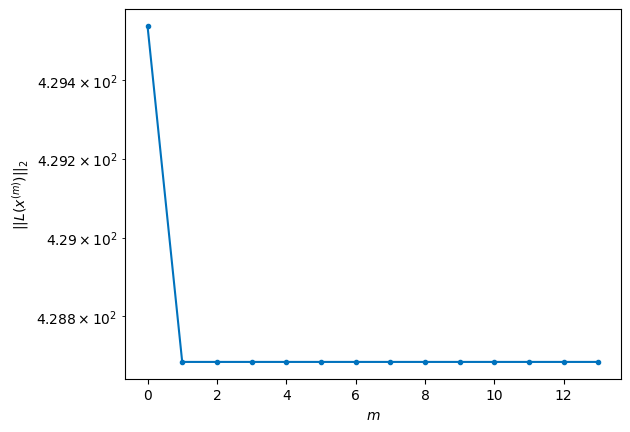

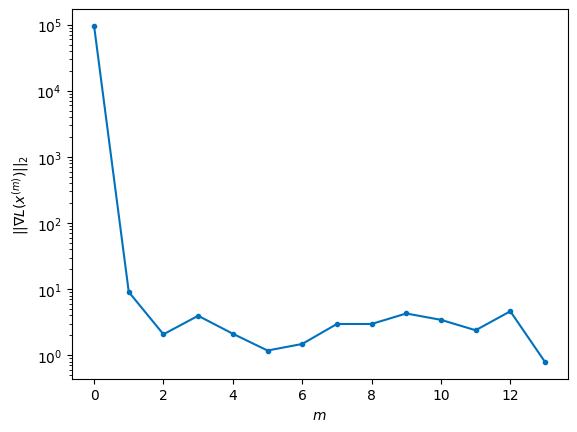


Windows:  50%|████▉     | 147/296 [29:53<38:33, 15.53s/it]

Before applying the algorithm
Cost function: 429.9615677668715
Gradient norm: 48350.581012632945
Global relative error: 1909154160.2300725
Position relative errors: 0.03923203308007315 m, 0.9384825943843047 m, 0.3113973271449573 m, 1.3665378772824404 m

Iteration 1
Cost function: 429.7197875441614 (-0.06%)
Gradient norm: 3.5789613435414553 (-99.99%)
Global relative error: 1.462552659874512 (-13.32%)
Position relative errors: 0.04103654551078405 m, 0.8099051857597318 m, 0.2857259940319342 m, 1.1831270134261092 m

STOP on Iteration 2
Cost function = 429.71978745627723 (-0.00%)
Gradient norm = 0.9707108625256616 (-72.88%)
Global relative error = 1.462606687727261 (0.00%)
Final position relative errors: 0.04103654927591666 m, 0.8099505088805727 m, 0.28573268326773216 m, 1.1831611598484053 m



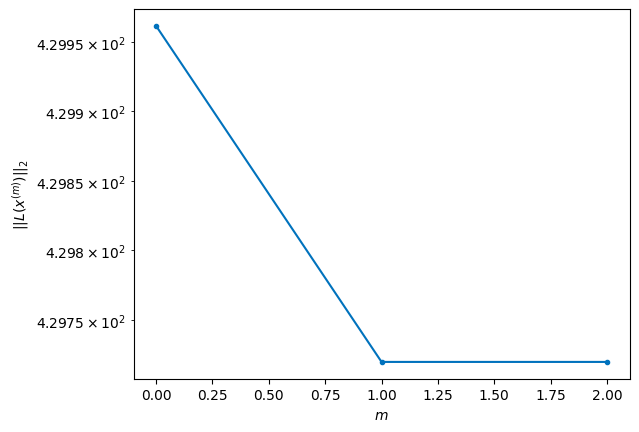

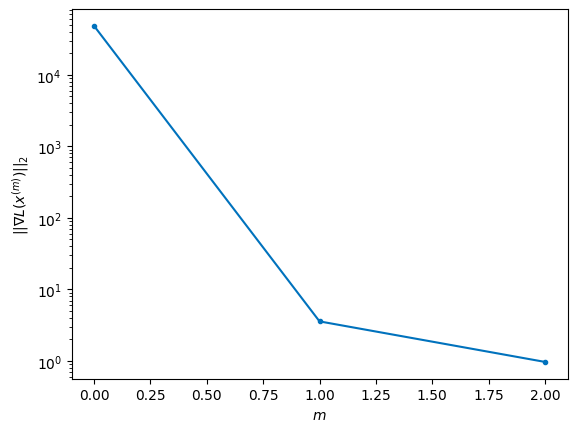


Windows:  50%|█████     | 148/296 [29:59<31:08, 12.62s/it]

Before applying the algorithm
Cost function: 437.6040653493666
Gradient norm: 235249.9926927893
Global relative error: 1909341630.223831
Position relative errors: 0.03985252770999655 m, 0.8650340443264397 m, 0.2909759463407857 m, 1.1671594916649342 m

Iteration 1
Cost function: 437.20501895856495 (-0.09%)
Gradient norm: 3.8455192101900484 (-100.00%)
Global relative error: 1.8515782086983323 (24.92%)
Position relative errors: 0.0352431546613555 m, 1.1164146612352457 m, 0.43481233104996364 m, 1.4112602181057008 m

Iteration 2
Cost function: 437.205019058028 (0.00%)
Gradient norm: 3.3411604333710785 (-13.12%)
Global relative error: 1.8516176270182203 (0.00%)
Position relative errors: 0.03524315020416019 m, 1.1164614184166335 m, 0.43480958186795665 m, 1.4112757934185265 m

STOP on Iteration 3
Cost function = 437.2050189161467 (-0.00%)
Gradient norm = 0.3943258256221717 (-88.20%)
Global relative error = 1.8516176279047551 (0.00%)
Final position relative errors: 0.03524314243251459 m, 1.1164

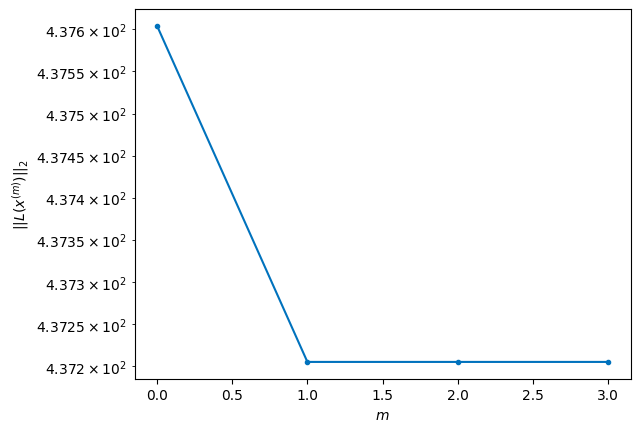

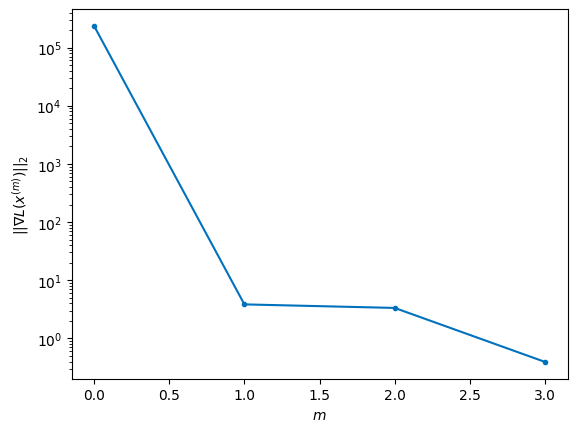


Windows:  50%|█████     | 149/296 [30:06<27:14, 11.12s/it]

Before applying the algorithm
Cost function: 438.77325871373887
Gradient norm: 183396.39071910453
Global relative error: 1909485556.5938516
Position relative errors: 0.03449671523684132 m, 1.167594741523014 m, 0.44333932096801015 m, 1.4106403171655693 m

Iteration 1
Cost function: 438.1817094411717 (-0.13%)
Gradient norm: 4.321465525484013 (-100.00%)
Global relative error: 1.7608882131567603 (-6.55%)
Position relative errors: 0.04171003250288768 m, 1.1509881576680194 m, 0.4236925565950607 m, 1.2628133371523258 m

Iteration 2
Cost function: 438.18170932932645 (-0.00%)
Gradient norm: 2.1890987608769334 (-49.34%)
Global relative error: 1.7608931983156162 (0.00%)
Position relative errors: 0.04171003786316946 m, 1.1509996630834336 m, 0.42369843534283935 m, 1.2628078293116953 m

Iteration 3
Cost function: 438.18170932631716 (-0.00%)
Gradient norm: 2.566749321517038 (17.25%)
Global relative error: 1.7608932178484904 (0.00%)
Position relative errors: 0.041710029363909384 m, 1.1509996710767787 

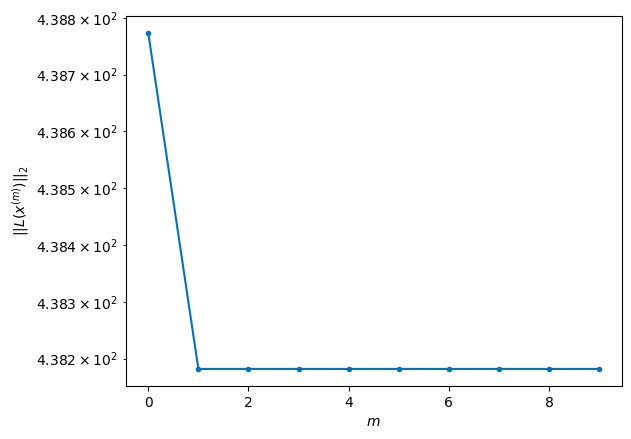

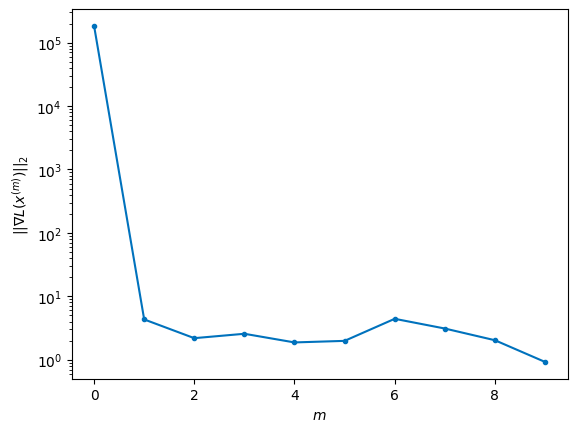


Windows:  51%|█████     | 150/296 [30:24<32:04, 13.18s/it]

Before applying the algorithm
Cost function: 436.5957857072471
Gradient norm: 117710.43358392268
Global relative error: 1909585580.8060145
Position relative errors: 0.040516597867134865 m, 1.1935845448604536 m, 0.4274046221817977 m, 1.232427832457434 m

Iteration 1
Cost function: 436.4083057972191 (-0.04%)
Gradient norm: 3.520433006088782 (-100.00%)
Global relative error: 1.9661191945181047 (11.17%)
Position relative errors: 0.04068846914918147 m, 1.2733738783161639 m, 0.4470520344282531 m, 1.4292067481539044 m

Iteration 2
Cost function: 436.40830583520693 (0.00%)
Gradient norm: 1.9837352747566 (-43.65%)
Global relative error: 1.9661024214320466 (-0.00%)
Position relative errors: 0.040688466113907265 m, 1.2733602378574298 m, 0.4470497171740036 m, 1.4291965519854697 m

Iteration 3
Cost function: 436.408305786507 (-0.00%)
Gradient norm: 3.1222990386676255 (57.39%)
Global relative error: 1.9661024063493708 (-0.00%)
Position relative errors: 0.04068847532803562 m, 1.2733602296653201 m, 0.

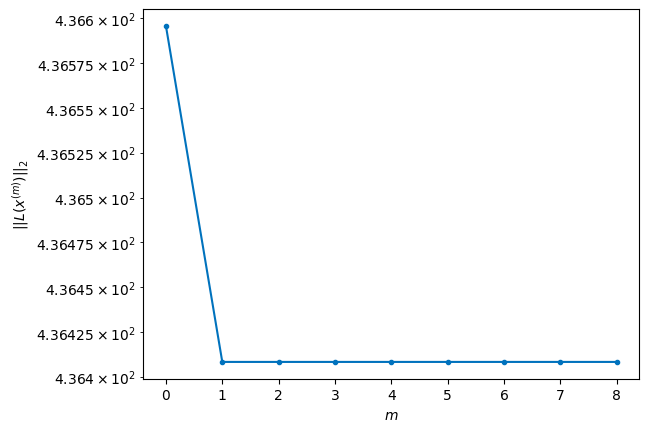

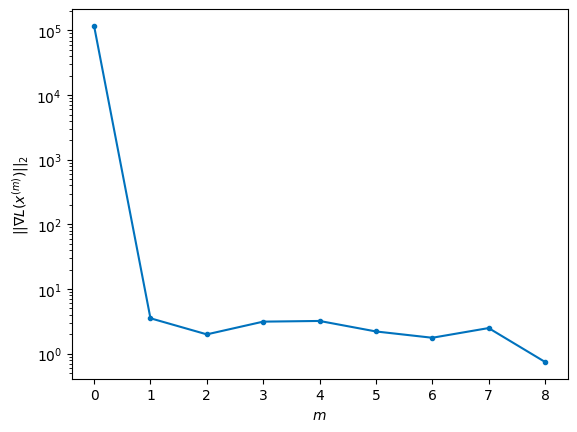


Windows:  51%|█████     | 151/296 [30:44<36:20, 15.04s/it]

Before applying the algorithm
Cost function: 434.6395428550475
Gradient norm: 133943.50771850138
Global relative error: 1909641575.7090726
Position relative errors: 0.039561943407645975 m, 1.3035133565100672 m, 0.4494636102983807 m, 1.399222882997734 m

Iteration 1
Cost function: 433.97070943728016 (-0.15%)
Gradient norm: 4.403829875969547 (-100.00%)
Global relative error: 2.0888815905866642 (6.31%)
Position relative errors: 0.06254431598036789 m, 1.4756047193366553 m, 0.4166298348772755 m, 1.4172241345358256 m

Iteration 2
Cost function: 433.9707095797756 (0.00%)
Gradient norm: 3.4409804424985353 (-21.86%)
Global relative error: 2.088916345444296 (0.00%)
Position relative errors: 0.06254431734860662 m, 1.4756339664662201 m, 0.4166322911943266 m, 1.417244186475564 m

Iteration 3
Cost function: 433.9707094340397 (-0.00%)
Gradient norm: 1.853926047674773 (-46.12%)
Global relative error: 2.0889163586913475 (0.00%)
Position relative errors: 0.06254432480656813 m, 1.4756339747552563 m, 0.41

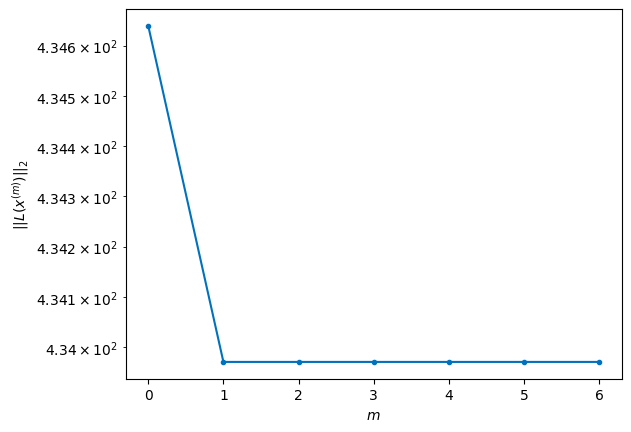

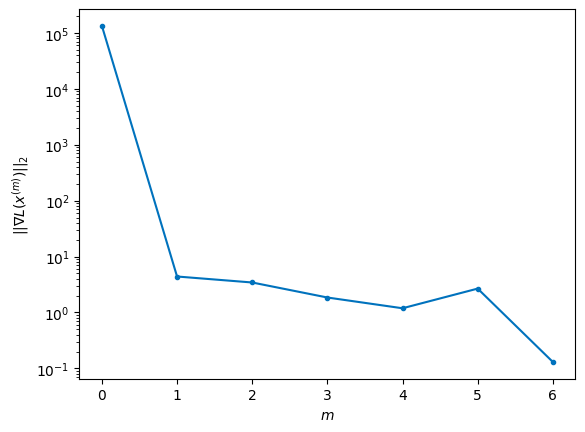


Windows:  51%|█████▏    | 152/296 [30:56<34:35, 14.41s/it]

Before applying the algorithm
Cost function: 440.6727820791728
Gradient norm: 277174.4176147722
Global relative error: 1909653621.0319686
Position relative errors: 0.06039657171999486 m, 1.4901620202918635 m, 0.41830838250369384 m, 1.3752944713752833 m

Iteration 1
Cost function: 440.41940785247124 (-0.06%)
Gradient norm: 5.733262525422392 (-100.00%)
Global relative error: 2.05397090254658 (-0.84%)
Position relative errors: 0.055706991740768534 m, 1.498582533049645 m, 0.3428159752825279 m, 1.3610364691640942 m

Iteration 2
Cost function: 440.4194077551999 (-0.00%)
Gradient norm: 1.9712857220616735 (-65.62%)
Global relative error: 2.0539726721688782 (0.00%)
Position relative errors: 0.05570699236608064 m, 1.4985852633253627 m, 0.34281163405541903 m, 1.3610372269711677 m

Iteration 3
Cost function: 440.4194078004236 (0.00%)
Gradient norm: 6.801593830461883 (245.03%)
Global relative error: 2.0539726801241622 (0.00%)
Position relative errors: 0.05570698835897161 m, 1.4985852594869342 m, 0.

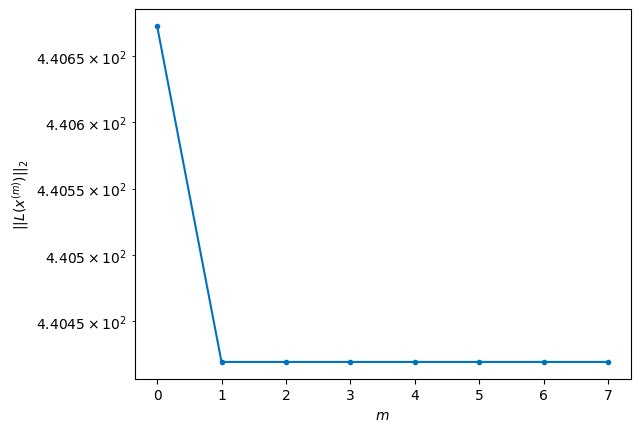

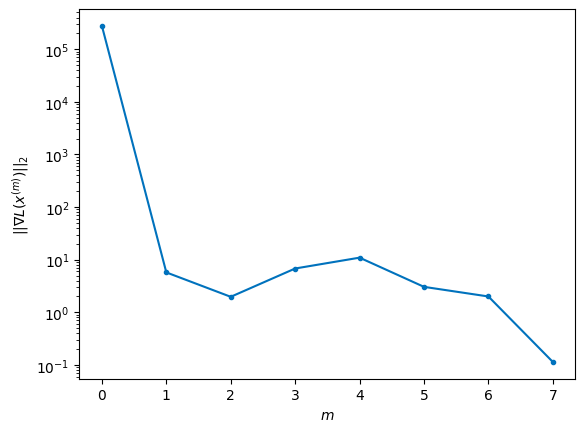


Windows:  52%|█████▏    | 153/296 [31:11<34:28, 14.46s/it]

Before applying the algorithm
Cost function: 441.03301414784215
Gradient norm: 182282.6341363393
Global relative error: 1909622007.6995444
Position relative errors: 0.05407802020224323 m, 1.505586676055664 m, 0.34254809063766234 m, 1.3168296651192897 m

Iteration 1
Cost function: 440.55608096996093 (-0.11%)
Gradient norm: 10.559496539619534 (-99.99%)
Global relative error: 2.52579120777112 (24.42%)
Position relative errors: 0.04618112013337098 m, 1.8749869864101434 m, 0.2467994916731534 m, 1.673619383721004 m

Iteration 2
Cost function: 440.55608081314335 (-0.00%)
Gradient norm: 2.8405109415655643 (-73.10%)
Global relative error: 2.525907061036691 (0.00%)
Position relative errors: 0.04618112254373727 m, 1.8750841647389829 m, 0.24677572530973532 m, 1.6736888605494473 m

STOP on Iteration 3
Cost function = 440.5560808258334 (0.00%)
Gradient norm = 0.372910695796659 (-86.87%)
Global relative error = 2.5259070308526663 (-0.00%)
Final position relative errors: 0.04618112097068199 m, 1.87508

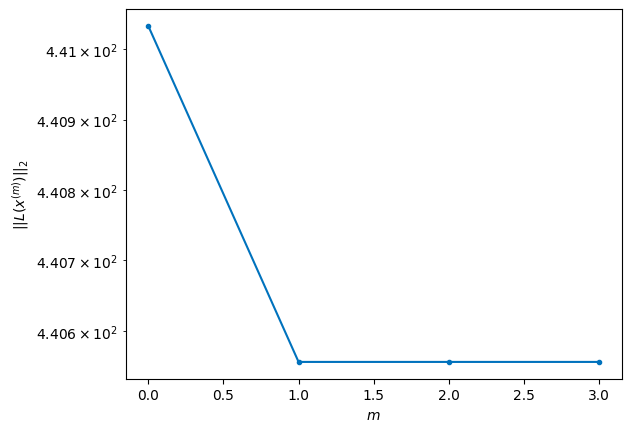

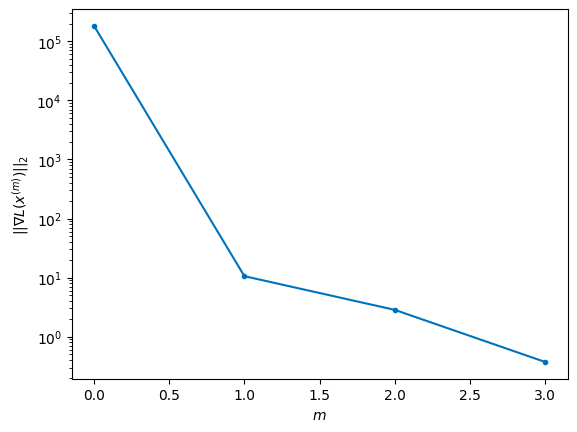


Windows:  52%|█████▏    | 154/296 [31:19<29:19, 12.39s/it]

Before applying the algorithm
Cost function: 446.0052098137304
Gradient norm: 370687.41452756524
Global relative error: 1909547231.8808434
Position relative errors: 0.04489075808524008 m, 1.8860731077871524 m, 0.24104016555743948 m, 1.634220123136161 m

Iteration 1
Cost function: 445.679561142738 (-0.07%)
Gradient norm: 1.3534274618122317 (-100.00%)
Global relative error: 2.5262578647742737 (0.74%)
Position relative errors: 0.0396797719418471 m, 1.8681145940686688 m, 0.20580207502985504 m, 1.6876602737331836 m

STOP on Iteration 2
Cost function = 445.67956150649326 (0.00%)
Gradient norm = 0.8814277539303478 (-34.87%)
Global relative error = 2.526254788977631 (-0.00%)
Final position relative errors: 0.03967977584814999 m, 1.8681148761450324 m, 0.2058025195829075 m, 1.6876553030264827 m



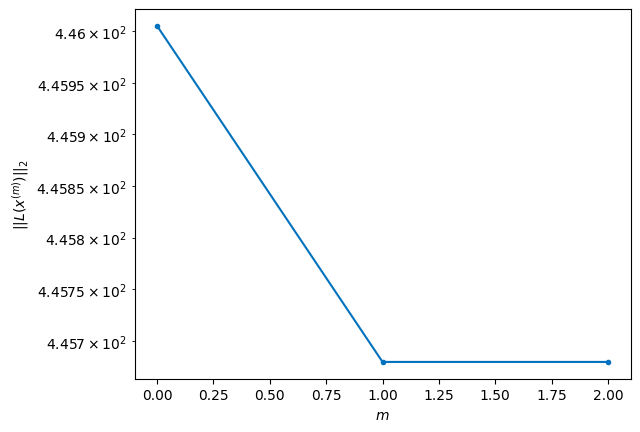

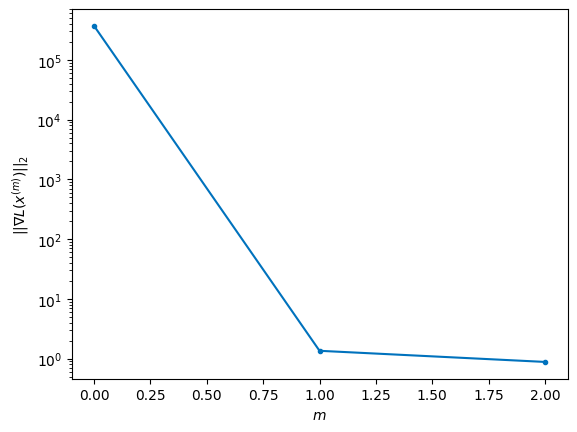


Windows:  52%|█████▏    | 155/296 [31:25<24:33, 10.45s/it]

Before applying the algorithm
Cost function: 441.31535570170735
Gradient norm: 104003.19587936331
Global relative error: 1909429990.8025022
Position relative errors: 0.03883418799233824 m, 1.8613034224520213 m, 0.2017155342050976 m, 1.64678650829828 m

Iteration 1
Cost function: 440.7587713838319 (-0.13%)
Gradient norm: 11.704235986685578 (-99.99%)
Global relative error: 2.796186634576857 (12.13%)
Position relative errors: 0.029778247403600668 m, 2.1478308135740733 m, 0.13434621067582805 m, 1.785090005372281 m

Iteration 2
Cost function: 440.75877123063646 (-0.00%)
Gradient norm: 4.746416933872218 (-59.45%)
Global relative error: 2.7961464549876074 (-0.00%)
Position relative errors: 0.029778243087645272 m, 2.1477986411823373 m, 0.1343336959833357 m, 1.785066719484176 m

Iteration 3
Cost function: 440.75877172140224 (0.00%)
Gradient norm: 1.216782720434002 (-74.36%)
Global relative error: 2.7961465062128625 (0.00%)
Position relative errors: 0.029778243890790573 m, 2.1477986510196616 m, 

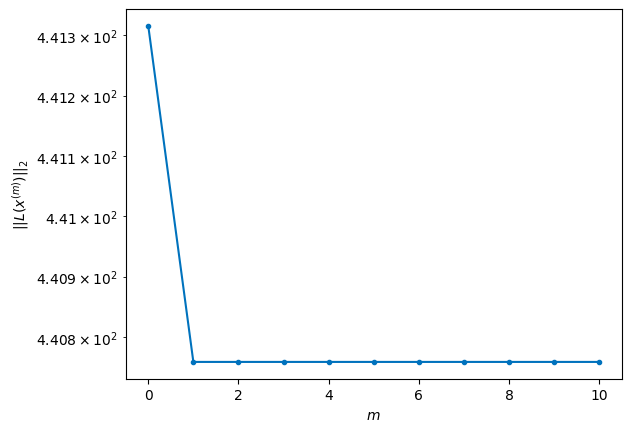

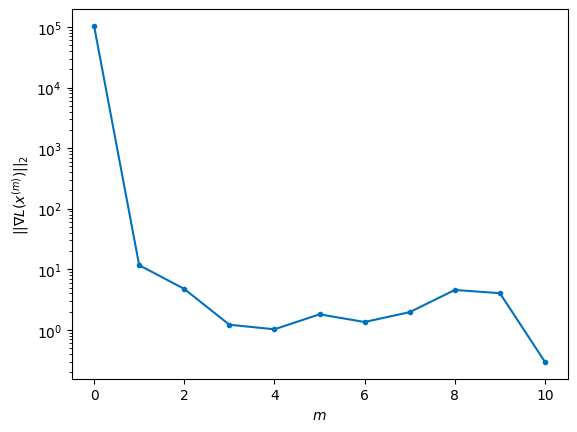


Windows:  53%|█████▎    | 156/296 [31:45<31:10, 13.36s/it]

Before applying the algorithm
Cost function: 442.45766988166326
Gradient norm: 341456.9519832646
Global relative error: 1909271160.9026172
Position relative errors: 0.029371648173959916 m, 2.1487631593436842 m, 0.13002573678533955 m, 1.755721118960902 m

Iteration 1
Cost function: 441.7194537487963 (-0.17%)
Gradient norm: 17.876800057405433 (-99.99%)
Global relative error: 2.749122771019141 (-1.04%)
Position relative errors: 0.018510436176297787 m, 2.2916051400180284 m, 0.23674073745351898 m, 1.499943975667393 m

Iteration 2
Cost function: 441.71945366852697 (-0.00%)
Gradient norm: 2.2477663469494265 (-87.43%)
Global relative error: 2.7490697550786076 (-0.00%)
Position relative errors: 0.01851043949971466 m, 2.2915276778849885 m, 0.2367399885454526 m, 1.4999652702861486 m

STOP on Iteration 3
Cost function = 441.7194536072976 (-0.00%)
Gradient norm = 0.5141554317289972 (-77.13%)
Global relative error = 2.7490697321287705 (-0.00%)
Final position relative errors: 0.018510443167764692 m, 

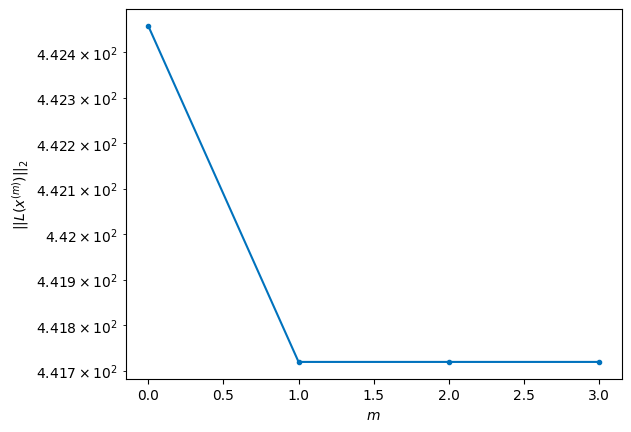

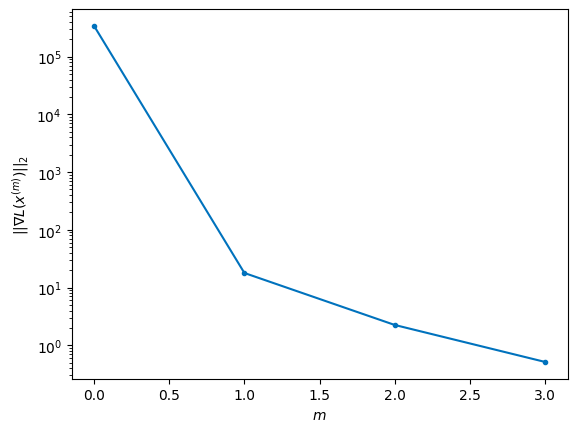


Windows:  53%|█████▎    | 157/296 [31:53<27:22, 11.82s/it]

Before applying the algorithm
Cost function: 442.748517261344
Gradient norm: 369370.59537776944
Global relative error: 1909071810.2594414
Position relative errors: 0.018306751231941223 m, 2.2529106252775577 m, 0.2328090413906968 m, 1.4478749161152324 m

Iteration 1
Cost function: 441.81198834910293 (-0.21%)
Gradient norm: 16.32996598813991 (-100.00%)
Global relative error: 2.6752399657205075 (-0.48%)
Position relative errors: 0.0069686161174725755 m, 2.2188394331350603 m, 0.19979849904199895 m, 1.4811117624917476 m

Iteration 2
Cost function: 441.8119886162237 (0.00%)
Gradient norm: 3.667671940281982 (-77.54%)
Global relative error: 2.675204808719425 (-0.00%)
Position relative errors: 0.006968616303699817 m, 2.21881621250409 m, 0.19982214094272788 m, 1.48107985766872 m

Iteration 3
Cost function: 441.8119883719818 (-0.00%)
Gradient norm: 3.52370734639357 (-3.93%)
Global relative error: 2.6752048443533503 (0.00%)
Position relative errors: 0.006968615211647626 m, 2.2188162326279044 m, 0.

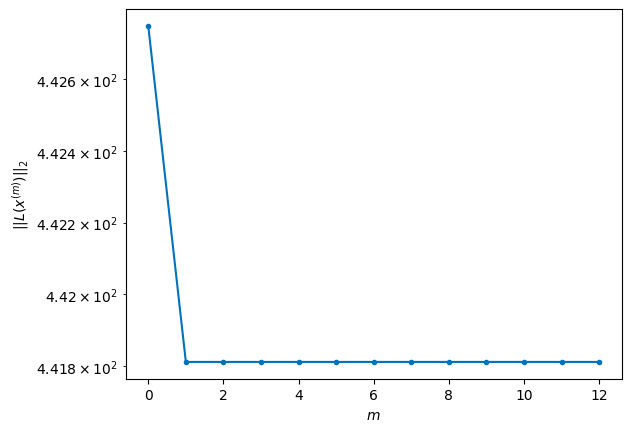

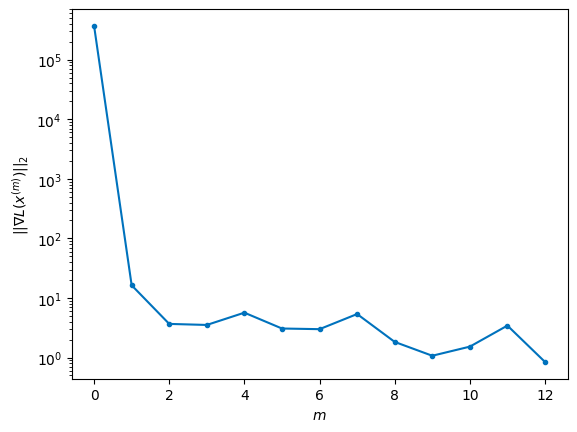


Windows:  53%|█████▎    | 158/296 [32:18<36:17, 15.78s/it]

Before applying the algorithm
Cost function: 441.5687174681528
Gradient norm: 251768.82861585543
Global relative error: 1908833153.3470547
Position relative errors: 0.007394940811771253 m, 2.199250986998389 m, 0.19701967822212996 m, 1.45571007126624 m

Iteration 1
Cost function: 440.70685525235893 (-0.20%)
Gradient norm: 12.272518738456055 (-100.00%)
Global relative error: 2.6473506278610395 (0.10%)
Position relative errors: 0.0071689053973989945 m, 2.3933113176991543 m, 0.3597408154078378 m, 1.0728749968873308 m

Iteration 2
Cost function: 440.70685526826435 (0.00%)
Gradient norm: 2.062889629642868 (-83.19%)
Global relative error: 2.647305628922885 (-0.00%)
Position relative errors: 0.007168905973099261 m, 2.3932511810725963 m, 0.35975276705899356 m, 1.0728941017665308 m

STOP on Iteration 3
Cost function = 440.7068553799478 (0.00%)
Gradient norm = 0.6322342969641503 (-69.35%)
Global relative error = 2.647305620117143 (-0.00%)
Final position relative errors: 0.0071689061357374725 m, 2

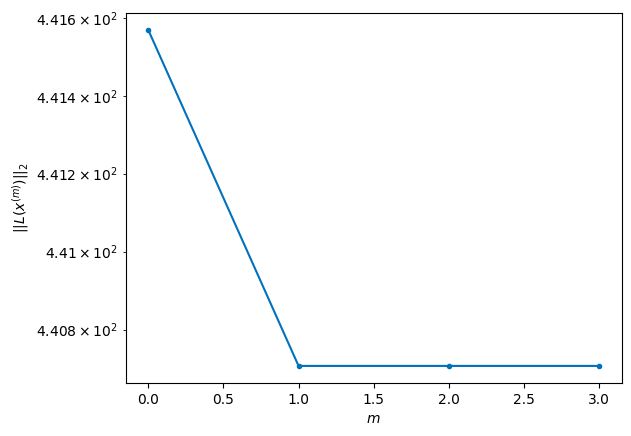

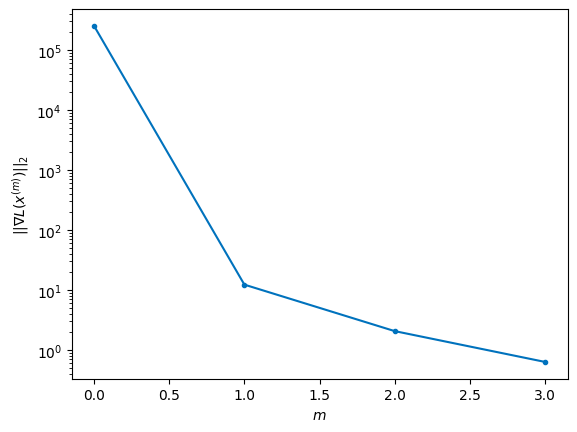


Windows:  54%|█████▎    | 159/296 [32:26<31:01, 13.59s/it]

Before applying the algorithm
Cost function: 447.324747335391
Gradient norm: 430023.2040309722
Global relative error: 1908556558.7379487
Position relative errors: 0.007546085509154815 m, 2.38599099848216 m, 0.35794080206467854 m, 1.030559278906925 m

Iteration 1
Cost function: 446.75677746289756 (-0.13%)
Gradient norm: 17.176406440440022 (-100.00%)
Global relative error: 2.116228949189306 (-19.34%)
Position relative errors: 0.009669006207832547 m, 1.948816060712708 m, 0.5917655486147779 m, 0.5746826836746706 m

STOP on Iteration 2
Cost function = 446.756776935366 (-0.00%)
Gradient norm = 0.8054817782067217 (-95.31%)
Global relative error = 2.1161930635850625 (-0.00%)
Final position relative errors: 0.00966900638248018 m, 1.9487704430672943 m, 0.591795694400088 m, 0.5746741887744484 m



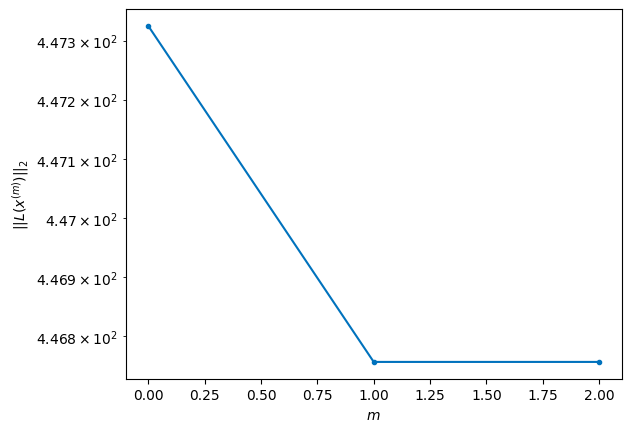

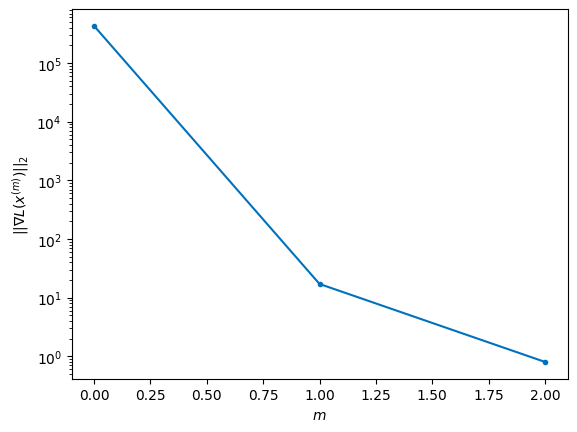


Windows:  54%|█████▍    | 160/296 [32:33<26:01, 11.48s/it]

Before applying the algorithm
Cost function: 445.2854051834755
Gradient norm: 101789.31127825892
Global relative error: 1908243546.3477511
Position relative errors: 0.00971978478914522 m, 1.9522892837232906 m, 0.5868769893759488 m, 0.5332003897298955 m

Iteration 1
Cost function: 444.63238086208554 (-0.15%)
Gradient norm: 23.498965090364482 (-99.98%)
Global relative error: 2.3875749434384645 (13.31%)
Position relative errors: 0.015551991546083622 m, 2.18901946266673 m, 0.22206092031126898 m, 0.9269051914184618 m

STOP on Iteration 2
Cost function = 444.6323810485994 (0.00%)
Gradient norm = 0.10926528065365118 (-99.54%)
Global relative error = 2.3874732216629346 (-0.00%)
Final position relative errors: 0.015551990887871554 m, 2.188925620025515 m, 0.22210795314466042 m, 0.9268535240558688 m



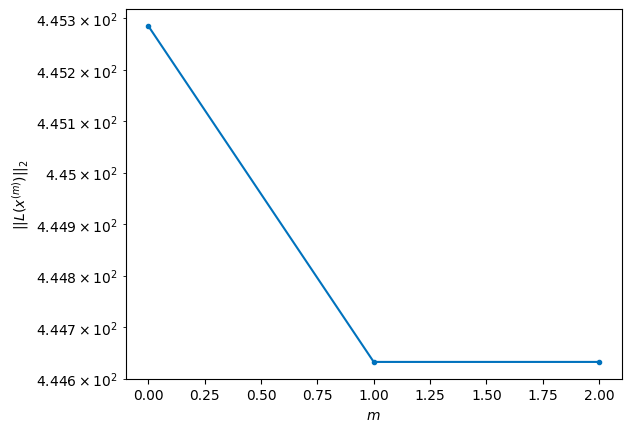

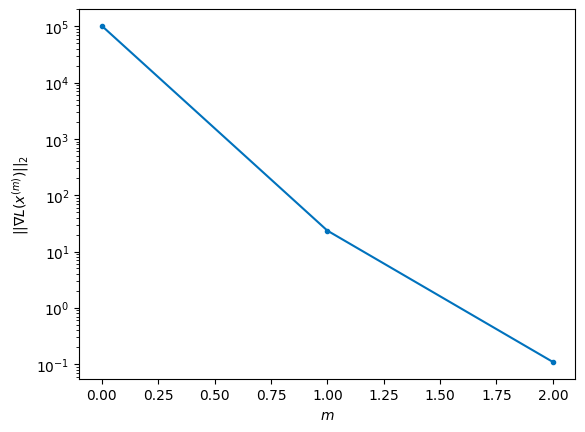


Windows:  54%|█████▍    | 161/296 [32:39<22:22,  9.94s/it]

Before applying the algorithm
Cost function: 443.45222440203776
Gradient norm: 140462.986344723
Global relative error: 1907895751.441742
Position relative errors: 0.015922311405242664 m, 2.1508533744975598 m, 0.22349835073468147 m, 0.8561480262127296 m

Iteration 1
Cost function: 442.95134741307515 (-0.11%)
Gradient norm: 19.163796208110345 (-99.99%)
Global relative error: 1.8285616069259827 (-21.38%)
Position relative errors: 0.02085147510438575 m, 1.692932558258576 m, 0.13452076242458608 m, 0.677557574955369 m

Iteration 2
Cost function: 442.9513468696435 (-0.00%)
Gradient norm: 1.6989621653433435 (-91.13%)
Global relative error: 1.8287249564139485 (0.01%)
Position relative errors: 0.020851471888670908 m, 1.6930612518774333 m, 0.13452721970937495 m, 0.6776755788641358 m

Iteration 3
Cost function: 442.95134679799827 (-0.00%)
Gradient norm: 1.31476667663956 (-22.61%)
Global relative error: 1.8287249597153152 (0.00%)
Position relative errors: 0.020851474405500163 m, 1.6930612612620577 

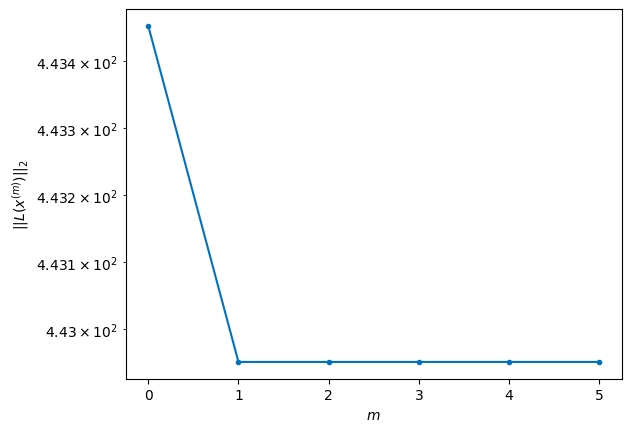

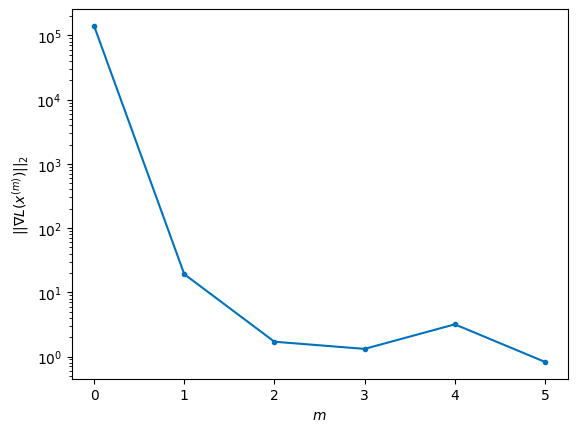


Windows:  55%|█████▍    | 162/296 [32:51<23:22, 10.47s/it]

Before applying the algorithm
Cost function: 442.3787773324388
Gradient norm: 224702.95293063216
Global relative error: 1907514944.8499236
Position relative errors: 0.021186719384603637 m, 1.6595121056298774 m, 0.12601996099424154 m, 0.6001632519413661 m

Iteration 1
Cost function: 440.70454763872254 (-0.38%)
Gradient norm: 55.082303698967856 (-99.98%)
Global relative error: 1.8194850703820877 (2.84%)
Position relative errors: 0.03616153621158116 m, 1.634419334186461 m, 0.15577685264456193 m, 0.7833369835511478 m

Iteration 2
Cost function: 440.70454758635054 (-0.00%)
Gradient norm: 2.9470979566640536 (-94.65%)
Global relative error: 1.8193121399855494 (-0.01%)
Position relative errors: 0.03616154219108808 m, 1.6342758179780994 m, 0.15577673681555426 m, 0.7832347776823277 m

STOP on Iteration 3
Cost function = 440.7045471232351 (-0.00%)
Gradient norm = 0.5645843082228849 (-80.84%)
Global relative error = 1.8193121265075365 (-0.00%)
Final position relative errors: 0.03616154226349874 m,

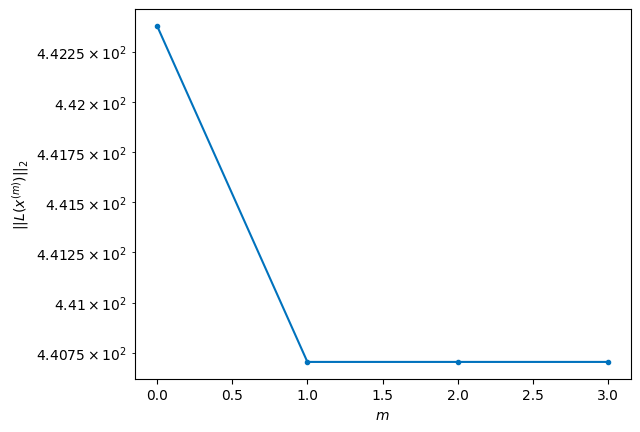

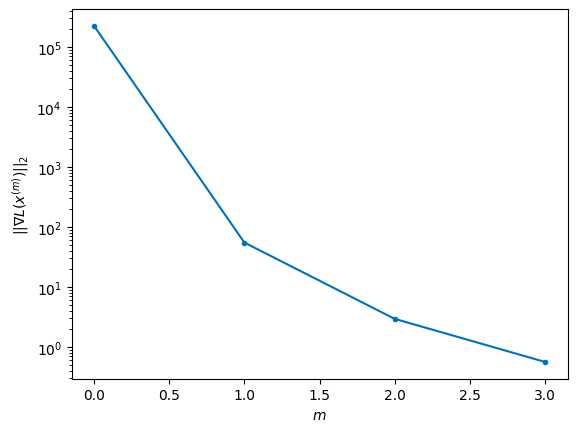


Windows:  55%|█████▌    | 163/296 [32:59<21:40,  9.78s/it]

Before applying the algorithm
Cost function: 443.43396523794405
Gradient norm: 230901.7927002838
Global relative error: 1907102988.7927783
Position relative errors: 0.03581537438367039 m, 1.543395478921727 m, 0.16025441865161885 m, 0.6363352334207518 m

Iteration 1
Cost function: 442.97612208905207 (-0.10%)
Gradient norm: 10.014418751767604 (-100.00%)
Global relative error: 1.4671942620817064 (-12.54%)
Position relative errors: 0.03440862022369398 m, 1.3128698541343602 m, 0.07889445025122967 m, 0.6493151001091342 m

Iteration 2
Cost function: 442.97612208985055 (0.00%)
Gradient norm: 5.120001279865584 (-48.87%)
Global relative error: 1.4671757457197776 (-0.00%)
Position relative errors: 0.034408616233836946 m, 1.3128569006543793 m, 0.07889824116334614 m, 0.6492989910419299 m

Iteration 3
Cost function: 442.9761224010597 (0.00%)
Gradient norm: 7.40151513092252 (44.56%)
Global relative error: 1.4671757843864515 (0.00%)
Position relative errors: 0.03440861551029655 m, 1.3128569354492767 m

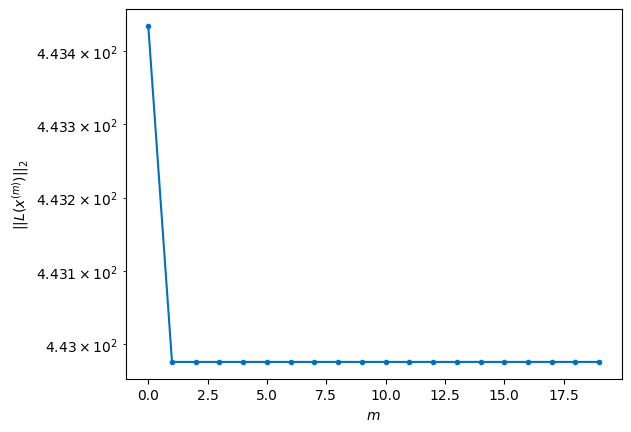

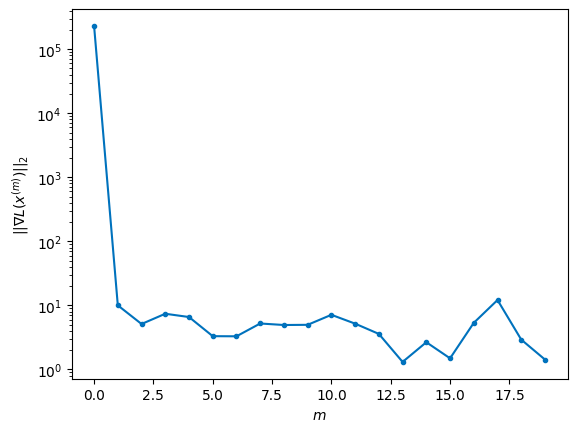


Windows:  55%|█████▌    | 164/296 [33:37<40:19, 18.33s/it]

Before applying the algorithm
Cost function: 443.8746047030805
Gradient norm: 126758.71788684232
Global relative error: 1906661844.451592
Position relative errors: 0.034129928499653295 m, 1.2046917799122567 m, 0.08302202047194679 m, 0.5032817583103522 m

Iteration 1
Cost function: 443.35191333588216 (-0.12%)
Gradient norm: 4.054426829768632 (-100.00%)
Global relative error: 1.2208890429856223 (-6.71%)
Position relative errors: 0.016758274972280145 m, 1.1124192614381427 m, 0.24237194619956623 m, 0.440515245317346 m

Iteration 2
Cost function: 443.35191345600634 (0.00%)
Gradient norm: 9.678793981781196 (138.72%)
Global relative error: 1.220880988478123 (-0.00%)
Position relative errors: 0.01675827365629443 m, 1.1124103134387253 m, 0.24237790181639868 m, 0.4405122416994572 m

Iteration 3
Cost function: 443.3519127295576 (-0.00%)
Gradient norm: 7.272031826554846 (-24.87%)
Global relative error: 1.2208809911417307 (0.00%)
Position relative errors: 0.016758275422852003 m, 1.1124103159102983 

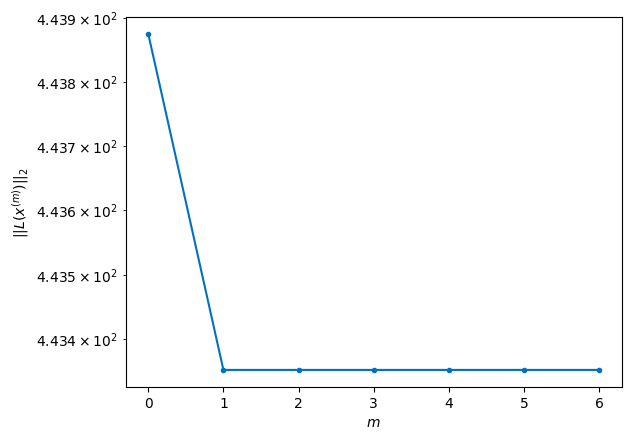

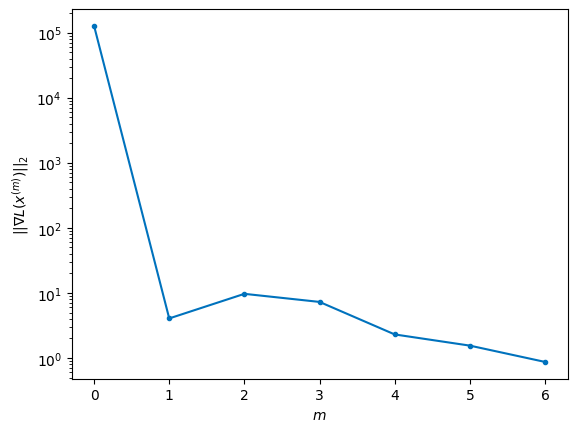


Windows:  56%|█████▌    | 165/296 [33:52<37:17, 17.08s/it]

Before applying the algorithm
Cost function: 449.4944532087969
Gradient norm: 165611.89871331424
Global relative error: 1906193543.4032347
Position relative errors: 0.017176887684391556 m, 1.0006371967493797 m, 0.24263228915521887 m, 0.38658344178082743 m

Iteration 1
Cost function: 448.43029358149795 (-0.24%)
Gradient norm: 6.37324093394012 (-100.00%)
Global relative error: 0.9785610826603758 (-11.04%)
Position relative errors: 0.01379070346281164 m, 0.7705818560770091 m, 0.5736525277844653 m, 0.185752564851587 m

Iteration 2
Cost function: 448.43029472179103 (0.00%)
Gradient norm: 2.916591845419192 (-54.24%)
Global relative error: 0.9785192726219147 (-0.00%)
Position relative errors: 0.0137907080726012 m, 0.7705330844656999 m, 0.5736468073853709 m, 0.185752296425511 m

STOP on Iteration 3
Cost function = 448.4302943713861 (-0.00%)
Gradient norm = 0.3373757633762349 (-88.43%)
Global relative error = 0.9785192777333565 (0.00%)
Final position relative errors: 0.013790700240771976 m, 0.7

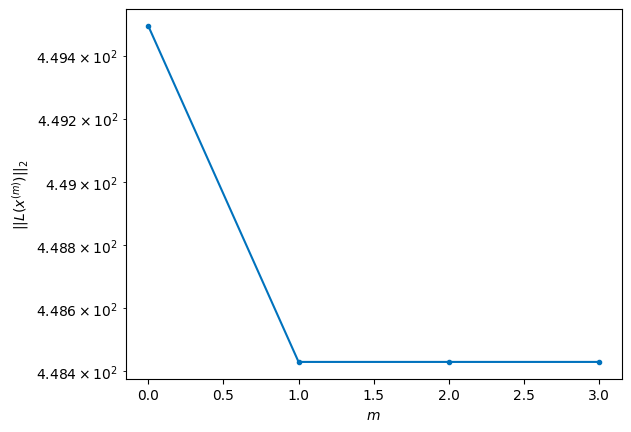

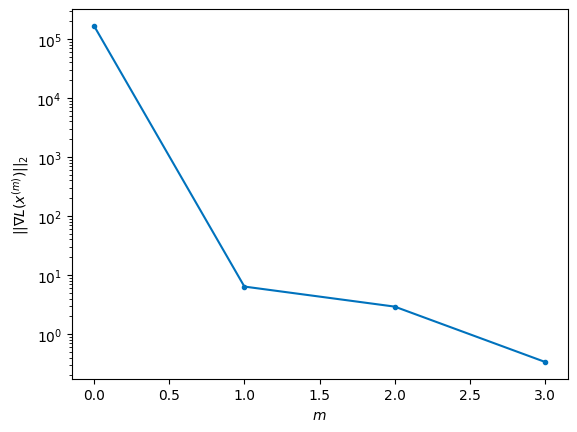


Windows:  56%|█████▌    | 166/296 [34:00<31:21, 14.47s/it]

Before applying the algorithm
Cost function: 449.2921643589125
Gradient norm: 309345.5568204977
Global relative error: 1905700195.2580597
Position relative errors: 0.014068465390289426 m, 0.6523032013408055 m, 0.5544390496917431 m, 0.29644536501661517 m

Iteration 1
Cost function: 448.77098526286386 (-0.12%)
Gradient norm: 8.883701921065727 (-100.00%)
Global relative error: 0.8488091457132406 (-6.32%)
Position relative errors: 0.023591724484825632 m, 0.6761661809693088 m, 0.4200106072510598 m, 0.2937547551540338 m

Iteration 2
Cost function: 448.7709854078253 (0.00%)
Gradient norm: 4.509765126383415 (-49.24%)
Global relative error: 0.8487665081157352 (-0.01%)
Position relative errors: 0.02359173165725959 m, 0.6761031992361206 m, 0.42002455450236686 m, 0.2937565784227976 m

STOP on Iteration 3
Cost function = 448.7709859518365 (0.00%)
Gradient norm = 0.4940019587447735 (-89.05%)
Global relative error = 0.8487665094848698 (0.00%)
Final position relative errors: 0.023591729385615923 m, 0.

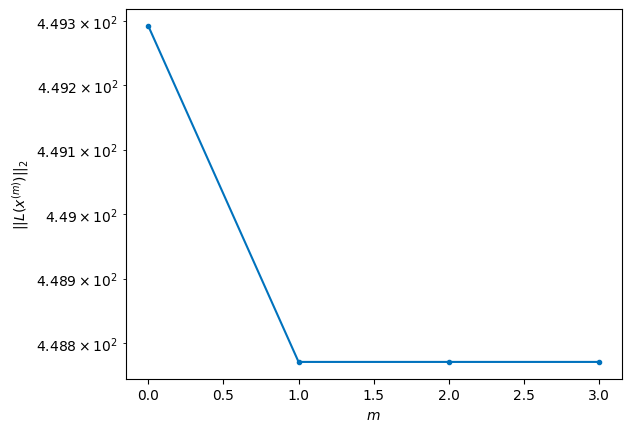

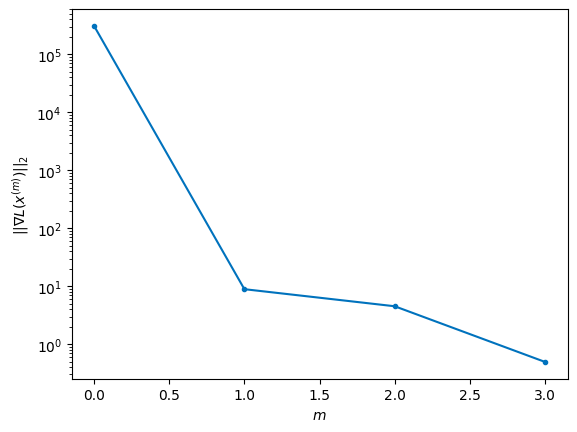


Windows:  56%|█████▋    | 167/296 [34:08<26:58, 12.55s/it]

Before applying the algorithm
Cost function: 450.98114850974
Gradient norm: 329441.26863269095
Global relative error: 1905183991.3530772
Position relative errors: 0.023311097693312542 m, 0.5257404587195571 m, 0.4033544918995477 m, 0.3518345905202286 m

Iteration 1
Cost function: 450.44137163421476 (-0.12%)
Gradient norm: 6.525544506677639 (-100.00%)
Global relative error: 0.9022697344572786 (20.20%)
Position relative errors: 0.012261665059503801 m, 0.6197182638774552 m, 0.524238726711693 m, 0.3937536608229036 m

Iteration 2
Cost function: 450.4413724527647 (0.00%)
Gradient norm: 7.589853361186277 (16.31%)
Global relative error: 0.9022693563636516 (-0.00%)
Position relative errors: 0.012261665721348496 m, 0.6196931866268423 m, 0.5242621421042352 m, 0.3937610867526365 m

Iteration 3
Cost function: 450.44137144460444 (-0.00%)
Gradient norm: 6.327351171197471 (-16.63%)
Global relative error: 0.9022693608619526 (0.00%)
Position relative errors: 0.012261666494933153 m, 0.6196932143752721 m, 

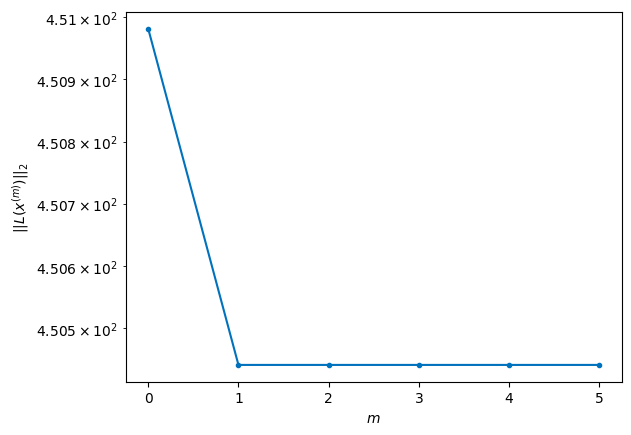

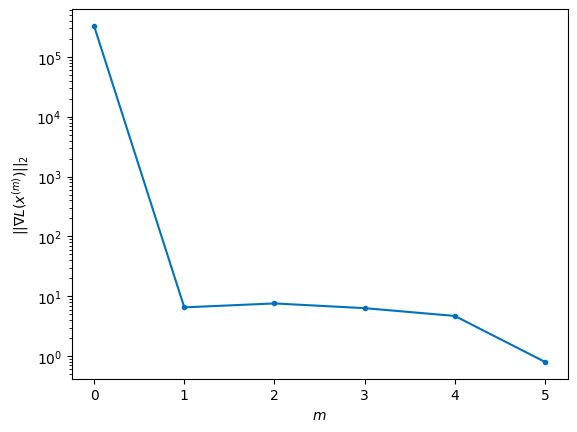


Windows:  57%|█████▋    | 168/296 [34:21<26:42, 12.52s/it]

Before applying the algorithm
Cost function: 450.3687829162446
Gradient norm: 432152.619527659
Global relative error: 1904647140.6688774
Position relative errors: 0.012495006987915122 m, 0.4538654258220392 m, 0.5052310628577351 m, 0.5196972667506747 m

Iteration 1
Cost function: 449.9710285007174 (-0.09%)
Gradient norm: 4.57128690066518 (-100.00%)
Global relative error: 0.8208899030968789 (-4.02%)
Position relative errors: 0.018683877786207226 m, 0.22165250094497432 m, 0.5593701785368015 m, 0.5580936306144515 m

STOP on Iteration 2
Cost function = 449.97102852418885 (0.00%)
Gradient norm = 0.21677203343692378 (-95.26%)
Global relative error = 0.8209024924253467 (0.00%)
Final position relative errors: 0.018683876815269285 m, 0.22159794333910368 m, 0.559380878312215 m, 0.558123089059626 m



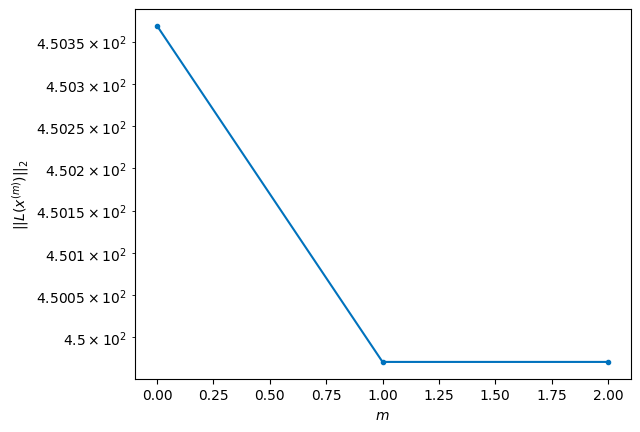

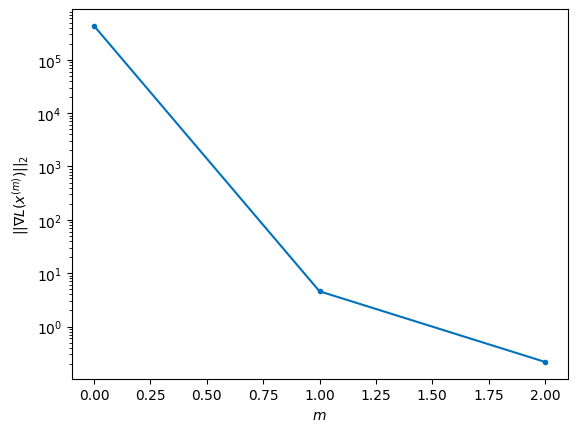


Windows:  57%|█████▋    | 169/296 [34:27<22:35, 10.67s/it]

Before applying the algorithm
Cost function: 449.70690245522565
Gradient norm: 112381.75410788575
Global relative error: 1904091901.0840936
Position relative errors: 0.018573882155703426 m, 0.07813720099586059 m, 0.5370864649182173 m, 0.7326798789430957 m

Iteration 1
Cost function: 449.5356804944757 (-0.04%)
Gradient norm: 4.292543654188354 (-100.00%)
Global relative error: 0.7809026808992598 (-14.37%)
Position relative errors: 0.016345865232944165 m, 0.1742861888407929 m, 0.3671489263662977 m, 0.6665962614217985 m

Iteration 2
Cost function: 449.53568030330047 (-0.00%)
Gradient norm: 3.9823099157330266 (-7.23%)
Global relative error: 0.7809107527634709 (0.00%)
Position relative errors: 0.016345858867006045 m, 0.17427090727706185 m, 0.36715610456875425 m, 0.6666057591552708 m

Iteration 3
Cost function: 449.53568067759875 (0.00%)
Gradient norm: 4.476580810646481 (12.41%)
Global relative error: 0.7809108027330738 (0.00%)
Position relative errors: 0.016345867468593407 m, 0.1742709052156

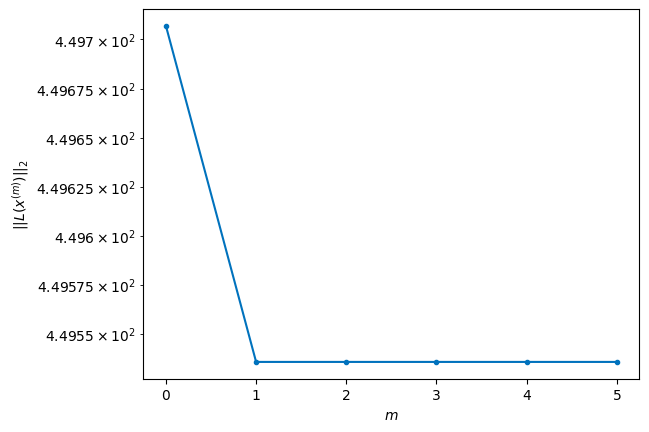

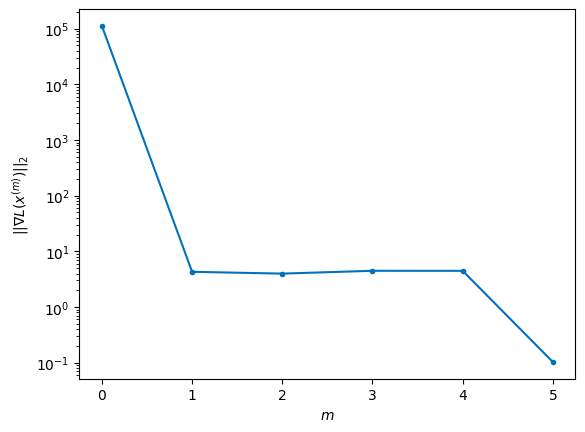


Windows:  57%|█████▋    | 170/296 [34:39<23:26, 11.17s/it]

Before applying the algorithm
Cost function: 451.82166921030205
Gradient norm: 225577.67562421356
Global relative error: 1903520580.2543309
Position relative errors: 0.016261151148829082 m, 0.05879688432410473 m, 0.3521155196270761 m, 0.8400786173912329 m

Iteration 1
Cost function: 451.59483318291643 (-0.05%)
Gradient norm: 3.9011417319794126 (-100.00%)
Global relative error: 0.8253474888609003 (-9.59%)
Position relative errors: 0.017700059934739713 m, 0.12970709013409873 m, 0.28387903237965323 m, 0.7638450276278107 m

Iteration 2
Cost function: 451.5948333490777 (0.00%)
Gradient norm: 3.750477747721832 (-3.86%)
Global relative error: 0.825351792407925 (0.00%)
Position relative errors: 0.017700065561582823 m, 0.12969522346418158 m, 0.2838778089487233 m, 0.76385214719751 m

STOP on Iteration 3
Cost function = 451.5948336249166 (0.00%)
Gradient norm = 0.5584850561576596 (-85.11%)
Global relative error = 0.8253518162773712 (0.00%)
Final position relative errors: 0.01770005587954094 m, 0.

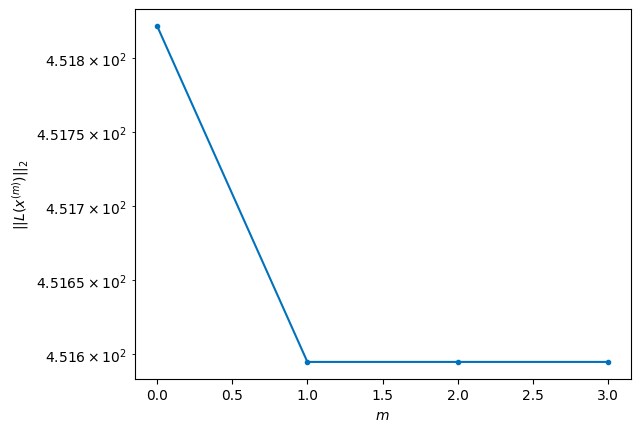

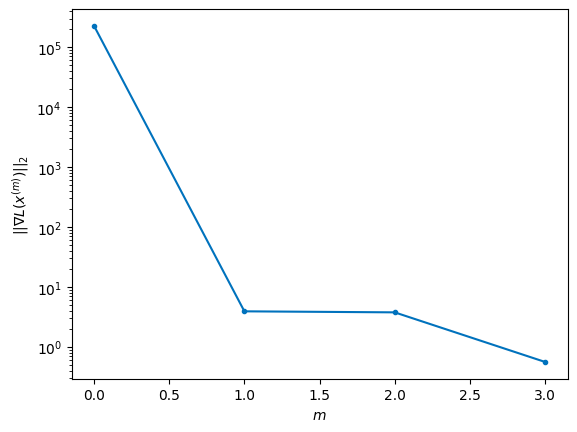


Windows:  58%|█████▊    | 171/296 [34:47<21:23, 10.27s/it]

Before applying the algorithm
Cost function: 448.0503069954397
Gradient norm: 68768.27355622195
Global relative error: 1902935493.3492508
Position relative errors: 0.01757235854317236 m, 0.10094195567811126 m, 0.2732718975413009 m, 0.935207253277704 m

Iteration 1
Cost function: 447.635899893378 (-0.09%)
Gradient norm: 8.313710571413615 (-99.99%)
Global relative error: 1.0142034934272168 (3.52%)
Position relative errors: 0.019597304842575214 m, 0.16345964208798747 m, 0.4409971273847833 m, 0.8983363102314562 m

STOP on Iteration 2
Cost function = 447.6359000087858 (0.00%)
Gradient norm = 0.932559647363663 (-88.78%)
Global relative error = 1.014222431673526 (0.00%)
Final position relative errors: 0.019597309383020112 m, 0.1634674483018932 m, 0.4410033658084579 m, 0.8983532081071084 m



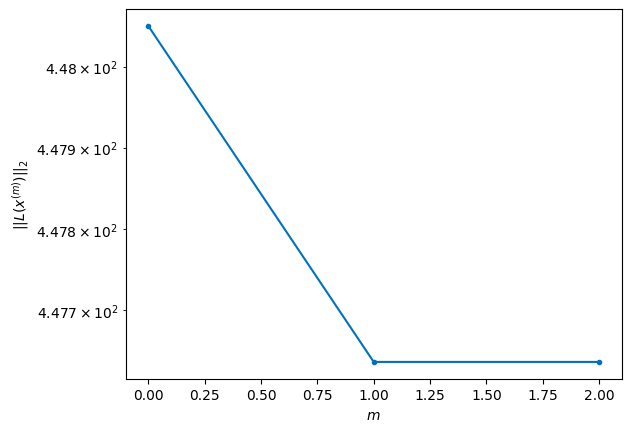

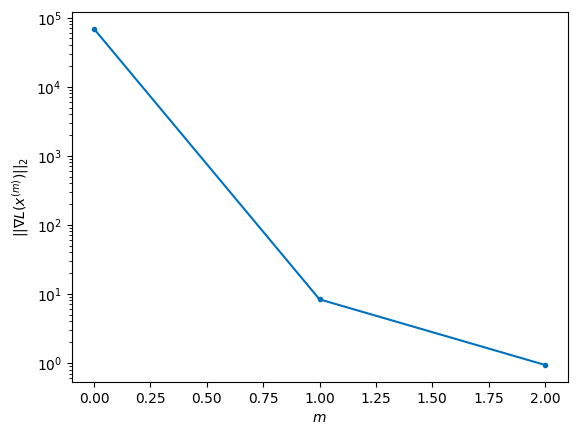


Windows:  58%|█████▊    | 172/296 [34:54<18:45,  9.08s/it]

Before applying the algorithm
Cost function: 448.45515042614977
Gradient norm: 71779.00100261424
Global relative error: 1902338984.1040049
Position relative errors: 0.019496579227587102 m, 0.27249091506223905 m, 0.42045148234763624 m, 1.0942044686747172 m

Iteration 1
Cost function: 448.1600978656733 (-0.07%)
Gradient norm: 4.07761506873644 (-99.99%)
Global relative error: 1.3396180218623501 (11.30%)
Position relative errors: 0.01315431920600877 m, 0.3937588957518512 m, 0.522259852770477 m, 1.1690089772679844 m

STOP on Iteration 2
Cost function = 448.16009785552103 (-0.00%)
Gradient norm = 0.9692456593954404 (-76.23%)
Global relative error = 1.3396267461067621 (0.00%)
Final position relative errors: 0.01315431900715485 m, 0.39377254126130473 m, 0.5222643145657249 m, 1.1690123852467862 m



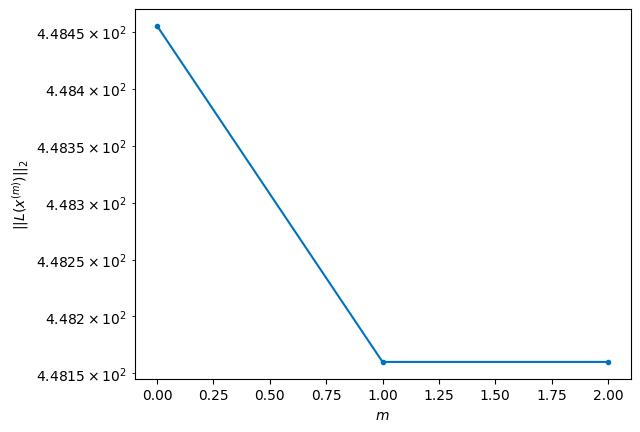

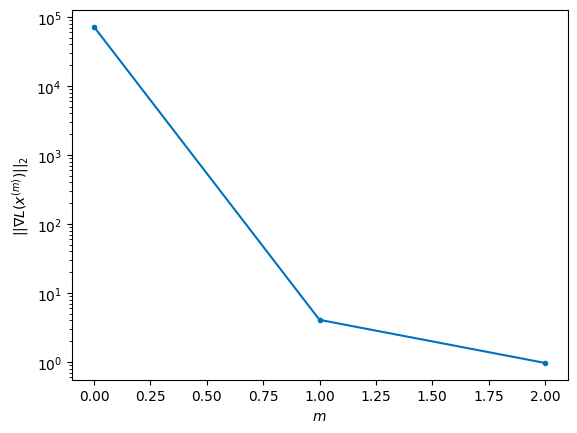


Windows:  58%|█████▊    | 173/296 [35:00<17:00,  8.30s/it]

Before applying the algorithm
Cost function: 454.3850206968951
Gradient norm: 241074.73599531763
Global relative error: 1901733405.9309516
Position relative errors: 0.013057618557616463 m, 0.5457792837788479 m, 0.4948718506327687 m, 1.3706548203383009 m

Iteration 1
Cost function: 453.8351838847123 (-0.12%)
Gradient norm: 16.136072425842748 (-99.99%)
Global relative error: 1.659882801079601 (6.66%)
Position relative errors: 0.009590069063973663 m, 0.6569250772397894 m, 0.44771451451433786 m, 1.457088484270777 m

STOP on Iteration 2
Cost function = 453.8351835301804 (-0.00%)
Gradient norm = 0.6753189087813909 (-95.81%)
Global relative error = 1.6599537784734795 (0.00%)
Final position relative errors: 0.009590071262107387 m, 0.6569951109803198 m, 0.4477170075904518 m, 1.4571369988801404 m



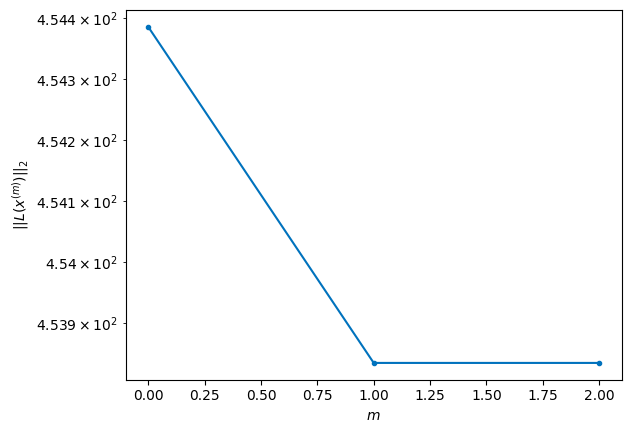

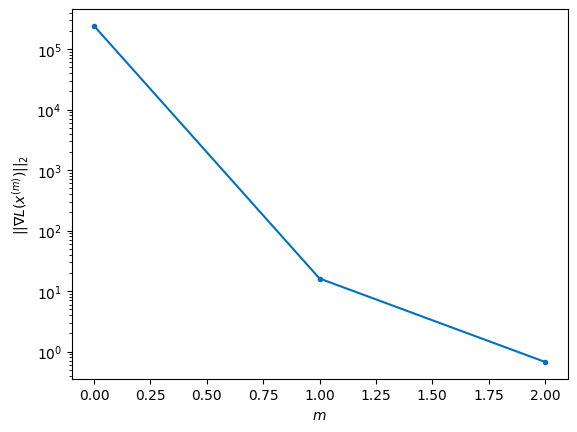


Windows:  59%|█████▉    | 174/296 [35:06<15:40,  7.71s/it]

Before applying the algorithm
Cost function: 457.7573857909759
Gradient norm: 239372.27495469907
Global relative error: 1901121117.3547206
Position relative errors: 0.009451500781825802 m, 0.7781205012570912 m, 0.4238091539421693 m, 1.6260419640452664 m

Iteration 1
Cost function: 457.355966794705 (-0.09%)
Gradient norm: 2.432708615779824 (-100.00%)
Global relative error: 1.7791035284396268 (-3.93%)
Position relative errors: 0.012215617704435081 m, 0.6985135501858405 m, 0.5664504457461683 m, 1.5350114571039646 m

Iteration 2
Cost function: 457.3559665376827 (-0.00%)
Gradient norm: 8.384769249638964 (244.67%)
Global relative error: 1.779106092425648 (0.00%)
Position relative errors: 0.012215616694777623 m, 0.6985140972891695 m, 0.5664539679928927 m, 1.5350128800523486 m

Iteration 3
Cost function: 457.3559666210205 (0.00%)
Gradient norm: 4.572452164526626 (-45.47%)
Global relative error: 1.7791060977803173 (0.00%)
Position relative errors: 0.01221562087258215 m, 0.6985140884294704 m, 0.

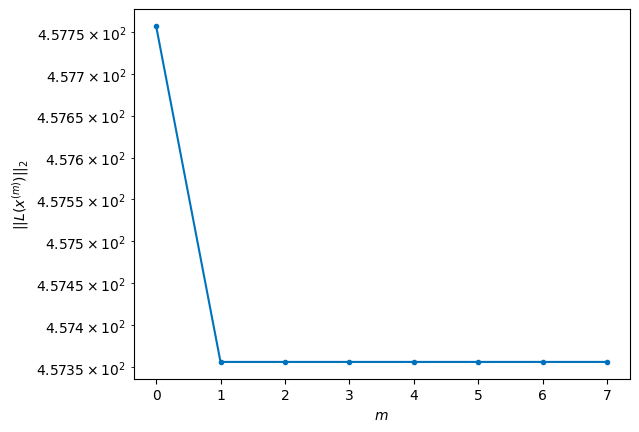

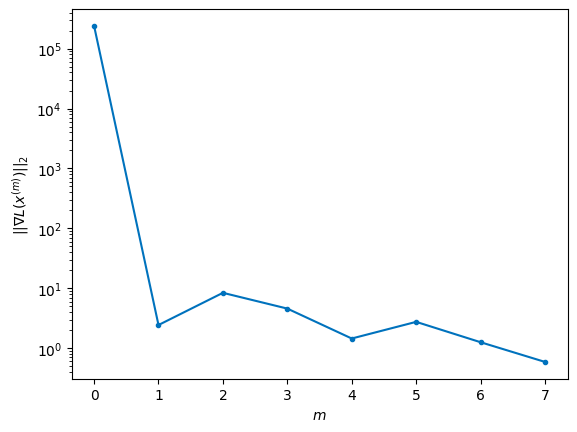


Windows:  59%|█████▉    | 175/296 [35:25<22:09, 10.99s/it]

Before applying the algorithm
Cost function: 457.6700803058725
Gradient norm: 143681.48622827162
Global relative error: 1900504479.177268
Position relative errors: 0.011897359939615717 m, 0.807420363970548 m, 0.5293427093309239 m, 1.7010353504325626 m

Iteration 1
Cost function: 456.99223360893694 (-0.15%)
Gradient norm: 8.52413082988684 (-99.99%)
Global relative error: 1.7997740396226682 (-7.99%)
Position relative errors: 0.018767737036470628 m, 0.9827570308980749 m, 0.5361252068564101 m, 1.409106423878434 m

Iteration 2
Cost function: 456.9922334106986 (-0.00%)
Gradient norm: 3.0720764801981164 (-63.96%)
Global relative error: 1.7998282662886946 (0.00%)
Position relative errors: 0.018767737598589417 m, 0.9828651674225847 m, 0.5361280194054661 m, 1.4090991936140993 m

Iteration 3
Cost function: 456.992233247301 (-0.00%)
Gradient norm: 7.282648368040855 (137.06%)
Global relative error: 1.7998282591720078 (-0.00%)
Position relative errors: 0.01876773003462364 m, 0.9828651654561806 m, 0.

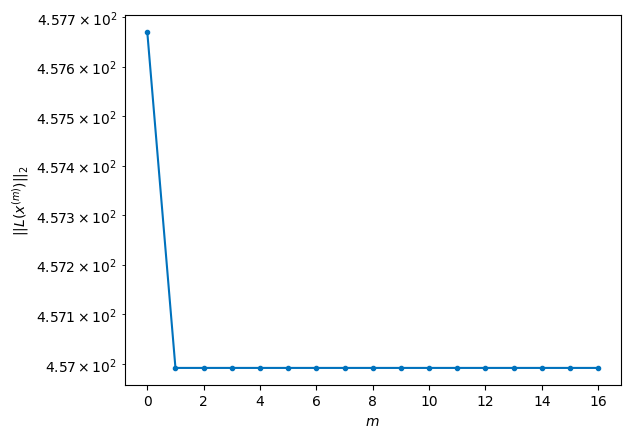

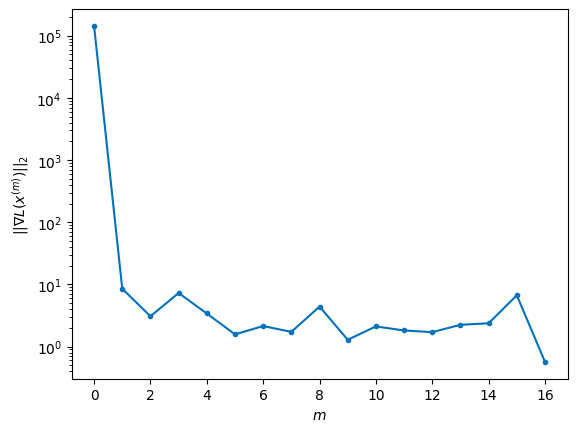


Windows:  59%|█████▉    | 176/296 [35:58<35:09, 17.58s/it]

Before applying the algorithm
Cost function: 456.8237660772324
Gradient norm: 81166.95242757599
Global relative error: 1899885853.5266047
Position relative errors: 0.01804796385482597 m, 1.0624104194640818 m, 0.4984949205470648 m, 1.5804832772073436 m

Iteration 1
Cost function: 455.9332459227143 (-0.19%)
Gradient norm: 13.944296747060685 (-99.98%)
Global relative error: 2.3595036067693935 (19.86%)
Position relative errors: 0.013880782784239622 m, 1.1460083524612419 m, 0.471335433422073 m, 2.0078749021683833 m

Iteration 2
Cost function: 455.93324600029865 (0.00%)
Gradient norm: 3.0415345050052878 (-78.19%)
Global relative error: 2.3595248003204796 (0.00%)
Position relative errors: 0.013880777325728514 m, 1.146063668835811 m, 0.47133618668120014 m, 2.007868057500586 m

Iteration 3
Cost function: 455.9332460887431 (0.00%)
Gradient norm: 1.4015281900199876 (-53.92%)
Global relative error: 2.3595247912864488 (-0.00%)
Position relative errors: 0.013880782230735153 m, 1.1460636647820608 m, 

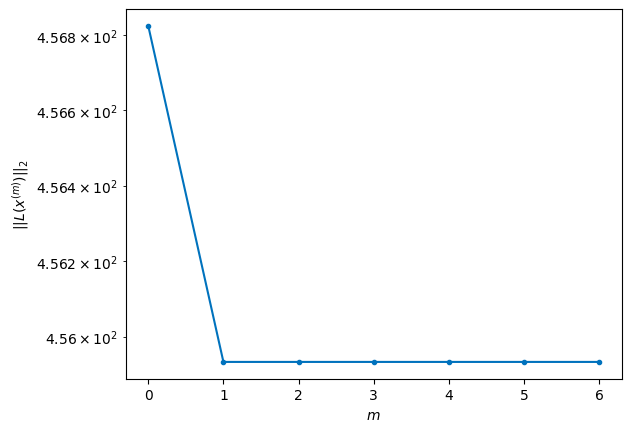

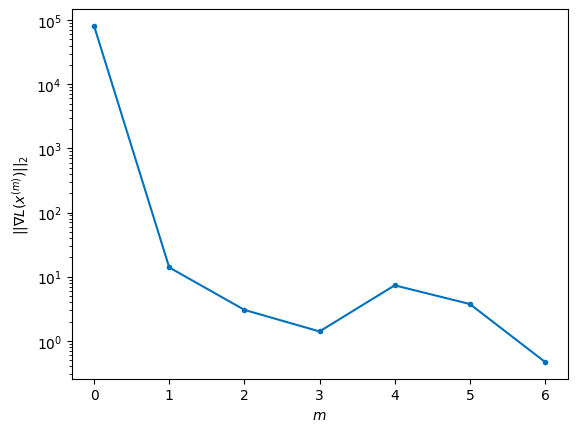


Windows:  60%|█████▉    | 177/296 [36:12<32:32, 16.41s/it]

Before applying the algorithm
Cost function: 459.297956634225
Gradient norm: 158205.86268895684
Global relative error: 1899267594.1722574
Position relative errors: 0.013297878560283576 m, 1.2514273163202867 m, 0.42921289422647796 m, 2.1587717782973153 m

Iteration 1
Cost function: 458.9669384289627 (-0.07%)
Gradient norm: 7.423834527077311 (-100.00%)
Global relative error: 2.833788816374111 (11.92%)
Position relative errors: 0.014079051451214197 m, 1.2663190128133508 m, 0.47154007830684785 m, 2.4908311358084183 m

Iteration 2
Cost function: 458.9669385127953 (0.00%)
Gradient norm: 8.018320870049399 (8.01%)
Global relative error: 2.8337794145469153 (-0.00%)
Position relative errors: 0.01407905619390151 m, 1.266340448352193 m, 0.4715418779972803 m, 2.4908092008809133 m

Iteration 3
Cost function: 458.96693847690915 (-0.00%)
Gradient norm: 1.6290598914107952 (-79.68%)
Global relative error: 2.8337794271365344 (0.00%)
Position relative errors: 0.014079049352916905 m, 1.2663404558945945 m, 

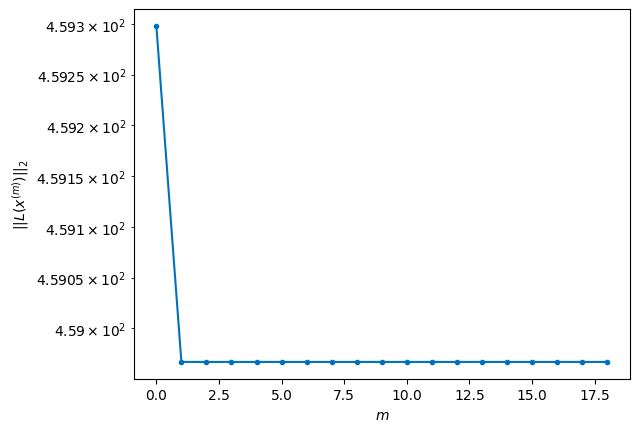

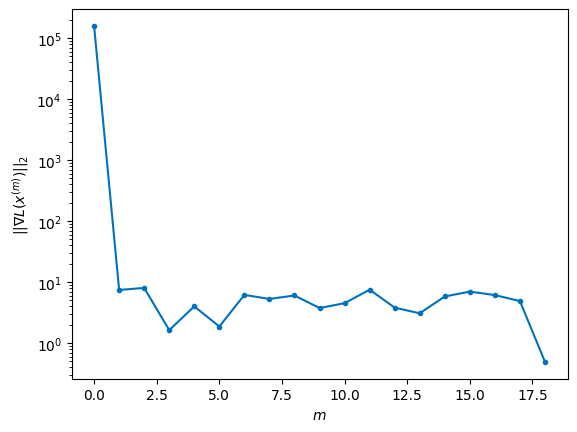


Windows:  60%|██████    | 178/296 [36:49<44:33, 22.66s/it]

Before applying the algorithm
Cost function: 460.2411010337035
Gradient norm: 287862.45122323435
Global relative error: 1898652027.2061477
Position relative errors: 0.013453725011674657 m, 1.3551251617802649 m, 0.4246448052850587 m, 2.6053765096326154 m

Iteration 1
Cost function: 459.7271303249538 (-0.11%)
Gradient norm: 6.354708757788333 (-100.00%)
Global relative error: 3.3198987783810967 (11.88%)
Position relative errors: 0.01988595630483896 m, 1.5363944573899149 m, 0.28821612807159475 m, 2.928779595539208 m

STOP on Iteration 2
Cost function = 459.72712974964895 (-0.00%)
Gradient norm = 0.5752692361622077 (-90.95%)
Global relative error = 3.319859158506454 (-0.00%)
Final position relative errors: 0.019885957759028756 m, 1.5363846791534796 m, 0.2882190050894956 m, 2.9287395310341657 m



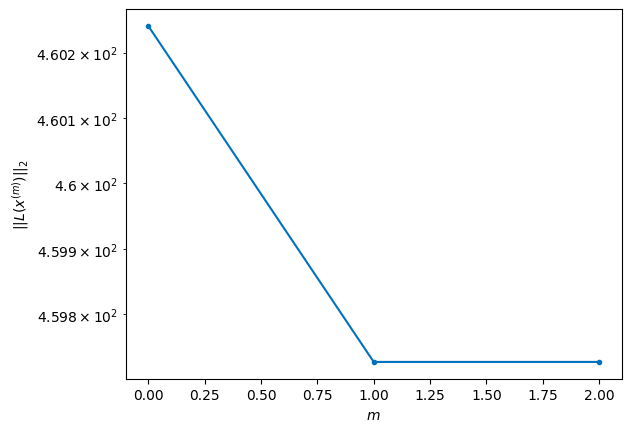

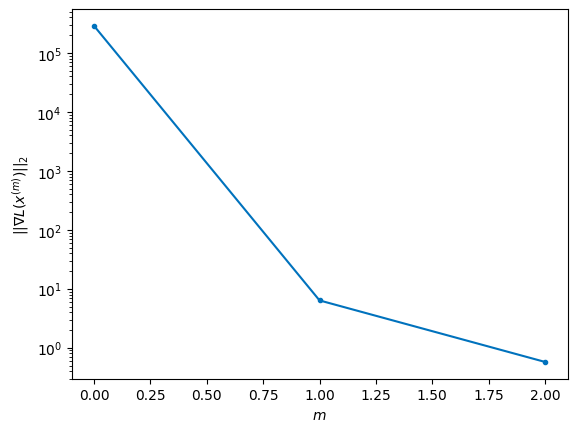


Windows:  60%|██████    | 179/296 [36:55<34:41, 17.79s/it]

Before applying the algorithm
Cost function: 457.7634379784178
Gradient norm: 48087.29000155978
Global relative error: 1898041492.6886384
Position relative errors: 0.018923109051513273 m, 1.6242814440659485 m, 0.25209072642520514 m, 3.0317481383191667 m

Iteration 1
Cost function: 457.24166821917044 (-0.11%)
Gradient norm: 7.030782825896296 (-99.99%)
Global relative error: 3.833358582208305 (11.15%)
Position relative errors: 0.018913915951311807 m, 1.8890368005206974 m, 0.1701987286796785 m, 3.3311932410565084 m

Iteration 2
Cost function: 457.2416687946834 (0.00%)
Gradient norm: 1.080962931243043 (-84.63%)
Global relative error: 3.8333234311077935 (-0.00%)
Position relative errors: 0.01891391288073886 m, 1.8890090969323736 m, 0.1702034626277384 m, 3.3311682591791425 m

Iteration 3
Cost function: 457.2416683697281 (-0.00%)
Gradient norm: 1.1684446572613005 (8.09%)
Global relative error: 3.8333234323132093 (0.00%)
Position relative errors: 0.018913919607104854 m, 1.8890091206488044 m, 0

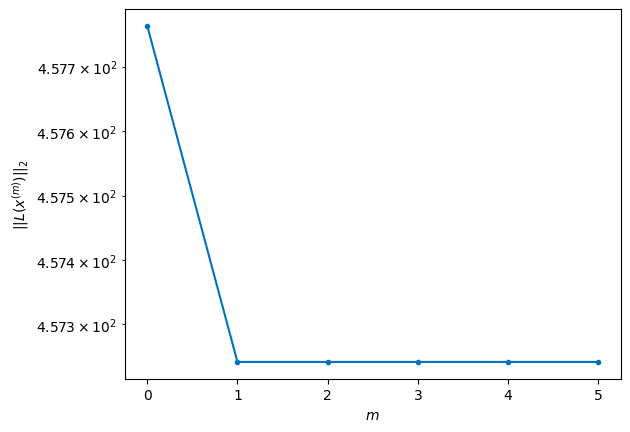

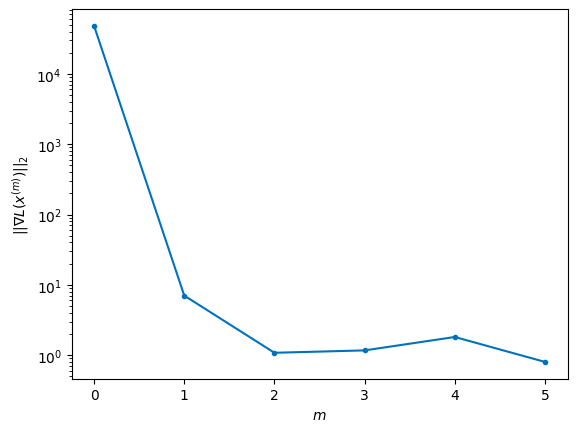


Windows:  61%|██████    | 180/296 [37:07<30:56, 16.01s/it]

Before applying the algorithm
Cost function: 454.6408283592506
Gradient norm: 31994.62652702115
Global relative error: 1897438286.1344943
Position relative errors: 0.01803452276265198 m, 1.9684664935749474 m, 0.1518115107160099 m, 3.410473699742016 m

Iteration 1
Cost function: 454.13927527565266 (-0.11%)
Gradient norm: 16.357052032307408 (-99.95%)
Global relative error: 4.726908671452114 (19.95%)
Position relative errors: 0.01585245448144508 m, 2.3962539589378116 m, 0.15220244148263837 m, 4.071635166083713 m

STOP on Iteration 2
Cost function = 454.1392751936309 (-0.00%)
Gradient norm = 0.7980270262627897 (-95.12%)
Global relative error = 4.726705898429395 (-0.00%)
Final position relative errors: 0.01585244817588706 m, 2.396142342157339 m, 0.15220411839610282 m, 4.071465386024037 m



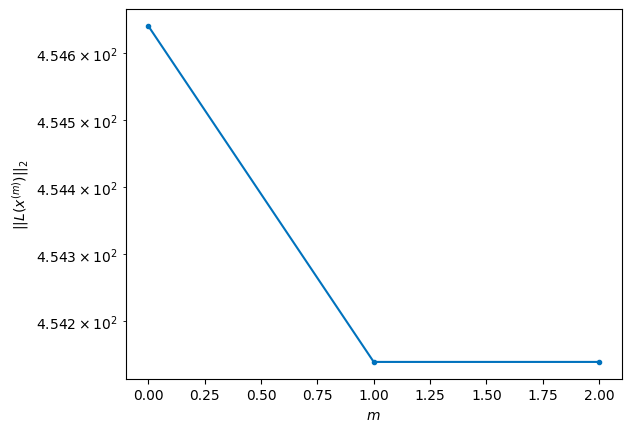

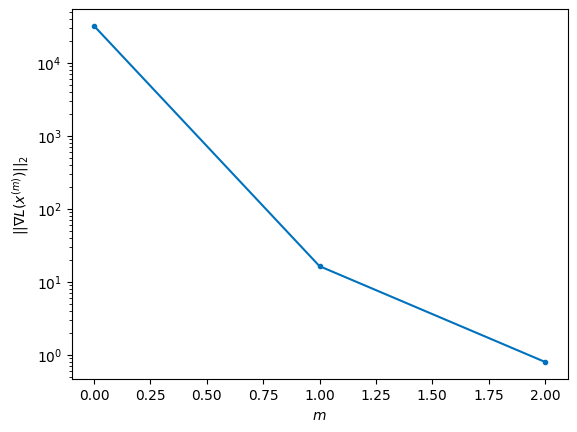


Windows:  61%|██████    | 181/296 [37:13<25:01, 13.06s/it]

Before applying the algorithm
Cost function: 455.65935067444525
Gradient norm: 93788.42439711226
Global relative error: 1896844680.364629
Position relative errors: 0.015093890517999668 m, 2.461651348305351 m, 0.1401808050865373 m, 4.12855693643666 m

Iteration 1
Cost function: 454.8539934872359 (-0.18%)
Gradient norm: 8.487476239579749 (-99.99%)
Global relative error: 4.6228491224994706 (-3.87%)
Position relative errors: 0.02026779256877632 m, 2.6827601215049057 m, 0.17806495165376987 m, 3.7605068638672665 m

Iteration 2
Cost function: 454.8539932373564 (-0.00%)
Gradient norm: 1.531686844037016 (-81.95%)
Global relative error: 4.622804886497836 (-0.00%)
Position relative errors: 0.020267804852508856 m, 2.68282811218837 m, 0.17806693501274523 m, 3.7604038833083986 m

Iteration 3
Cost function: 454.85399317688825 (-0.00%)
Gradient norm: 1.7197895802240508 (12.28%)
Global relative error: 4.622804866133717 (-0.00%)
Position relative errors: 0.020267794846890258 m, 2.6828281116119257 m, 0.1

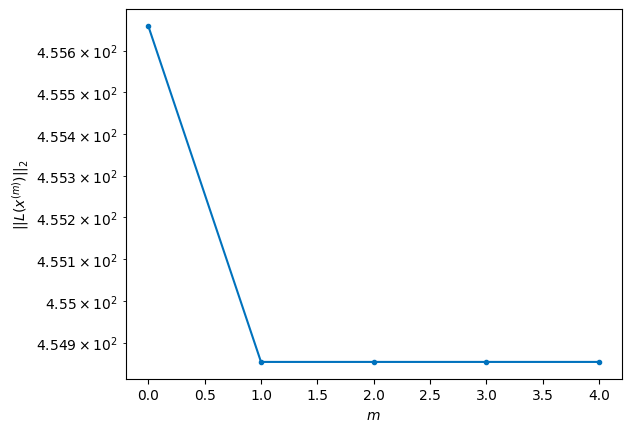

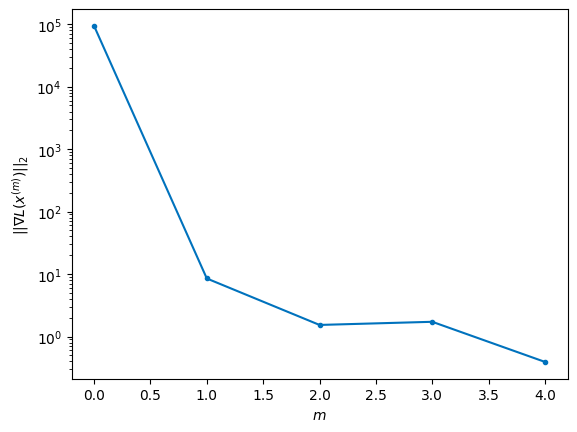


Windows:  61%|██████▏   | 182/296 [37:23<23:00, 12.11s/it]

Before applying the algorithm
Cost function: 456.7230463620676
Gradient norm: 182210.64082342325
Global relative error: 1896262934.2685053
Position relative errors: 0.019239227394870155 m, 2.7395252699541963 m, 0.14688288465370966 m, 3.8073622845164996 m

Iteration 1
Cost function: 456.51123558204284 (-0.05%)
Gradient norm: 5.173131417856462 (-100.00%)
Global relative error: 5.013655835689033 (6.84%)
Position relative errors: 0.01717833214489041 m, 2.999884859306989 m, 0.1624812290819364 m, 4.013818507405202 m

STOP on Iteration 2
Cost function = 456.5112350839366 (-0.00%)
Gradient norm = 0.8005483133947697 (-84.52%)
Global relative error = 5.01361463647623 (-0.00%)
Final position relative errors: 0.017178328837931193 m, 2.99985267374376 m, 0.16248142757498413 m, 4.013791092640469 m



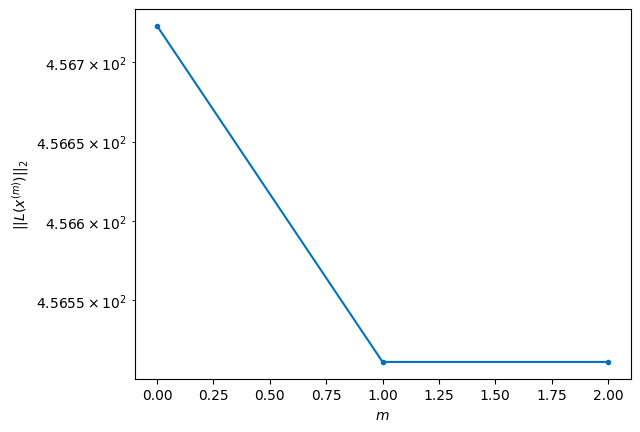

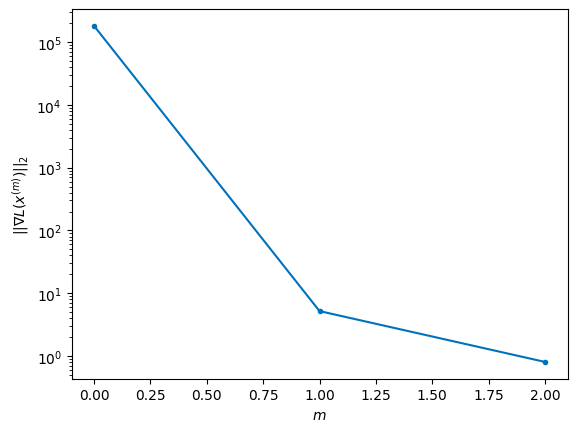


Windows:  62%|██████▏   | 183/296 [37:30<19:34, 10.39s/it]

Before applying the algorithm
Cost function: 451.9937323278319
Gradient norm: 151184.20338849595
Global relative error: 1895695278.8854163
Position relative errors: 0.01613217856462128 m, 3.045579864976764 m, 0.13548416093261192 m, 4.032426157268645 m

Iteration 1
Cost function: 451.7228120637432 (-0.06%)
Gradient norm: 2.9244424643506006 (-100.00%)
Global relative error: 4.79725387575422 (-5.10%)
Position relative errors: 0.011356429591536132 m, 2.845852880985205 m, 0.19808317303876724 m, 3.856863913225916 m

Iteration 2
Cost function: 451.7228123630404 (0.00%)
Gradient norm: 2.7463929205974242 (-6.09%)
Global relative error: 4.797229453082027 (-0.00%)
Position relative errors: 0.011356437076619964 m, 2.8458356305013432 m, 0.19808343090946562 m, 3.8568462510596024 m

STOP on Iteration 3
Cost function = 451.72281244299126 (0.00%)
Gradient norm = 0.46910002494677505 (-82.92%)
Global relative error = 4.797229491908788 (0.00%)
Final position relative errors: 0.011356440704965562 m, 2.8458

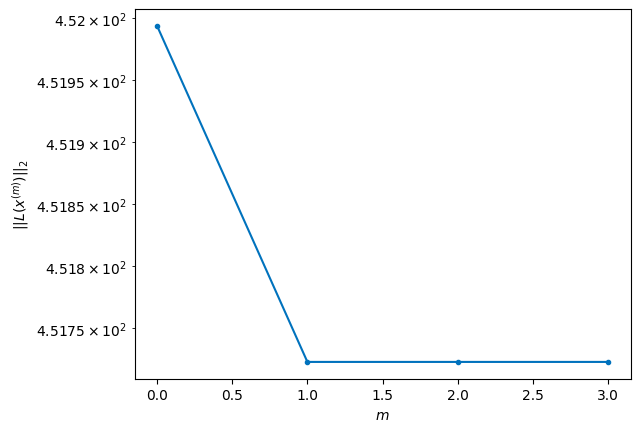

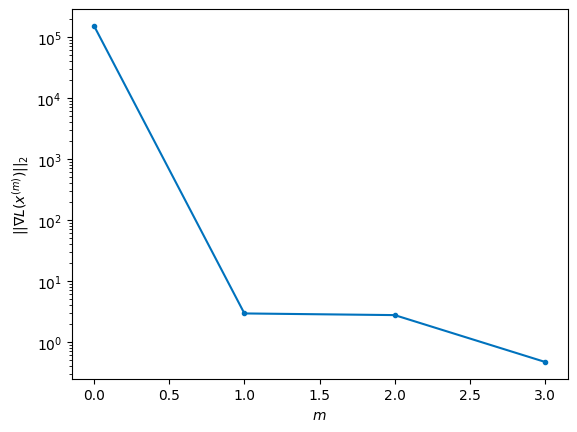


Windows:  62%|██████▏   | 184/296 [37:38<18:16,  9.79s/it]

Before applying the algorithm
Cost function: 454.07021962051226
Gradient norm: 232576.5892886577
Global relative error: 1895143901.5577703
Position relative errors: 0.010648729406660963 m, 2.881611872248197 m, 0.16715704329919245 m, 3.8536788868145435 m

Iteration 1
Cost function: 453.7160213177746 (-0.08%)
Gradient norm: 5.832836431448245 (-100.00%)
Global relative error: 4.8399114775933105 (0.52%)
Position relative errors: 0.010072584971806974 m, 2.84752801417926 m, 0.2005698368168507 m, 3.9084519495688714 m

STOP on Iteration 2
Cost function = 453.71602190505814 (0.00%)
Gradient norm = 0.36075716270543884 (-93.82%)
Global relative error = 4.8399103374646595 (-0.00%)
Final position relative errors: 0.010072581841327173 m, 2.847524814350256 m, 0.20056920289277727 m, 3.908452901518436 m



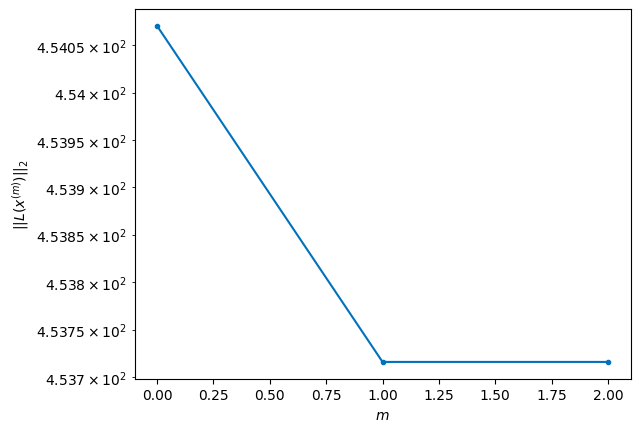

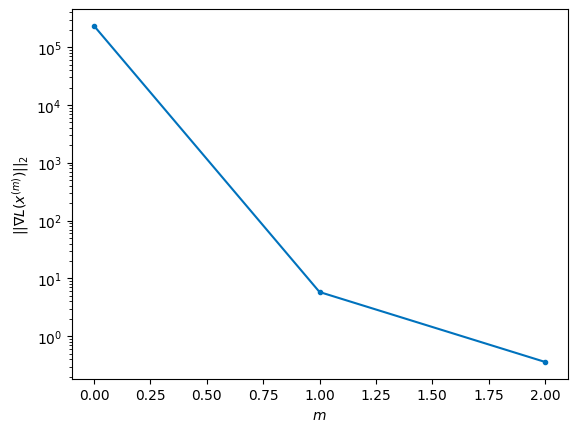


Windows:  62%|██████▎   | 185/296 [37:44<16:13,  8.77s/it]

Before applying the algorithm
Cost function: 451.48286613041427
Gradient norm: 122833.81764220617
Global relative error: 1894610946.3553855
Position relative errors: 0.009574405606008543 m, 2.863495579336899 m, 0.16790616566509697 m, 3.8736615196498088 m

Iteration 1
Cost function: 451.0302712033525 (-0.10%)
Gradient norm: 5.246614193862977 (-100.00%)
Global relative error: 4.495655844009199 (-6.73%)
Position relative errors: 0.022865937792075745 m, 2.5911989068118113 m, 0.15584012692495644 m, 3.670395013351635 m

Iteration 2
Cost function: 451.0302712974333 (0.00%)
Gradient norm: 2.114867082241985 (-59.69%)
Global relative error: 4.495647015610114 (-0.00%)
Position relative errors: 0.022865936032975966 m, 2.5911946267394548 m, 0.1558401367979319 m, 3.670387221155903 m

Iteration 3
Cost function: 451.03027090881903 (-0.00%)
Gradient norm: 3.8462689222980524 (81.87%)
Global relative error: 4.495647024342466 (0.00%)
Position relative errors: 0.02286593913802058 m, 2.591194633190641 m, 0.

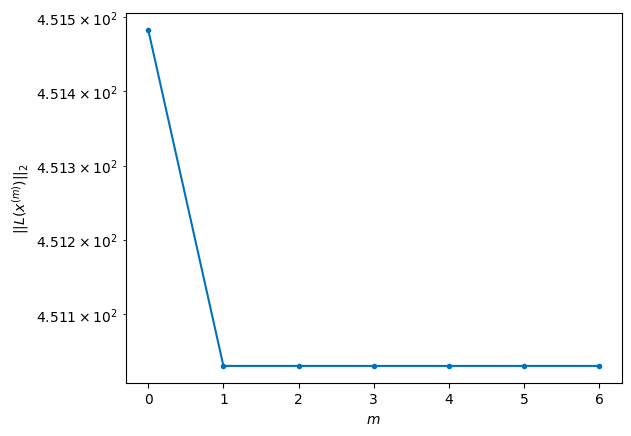

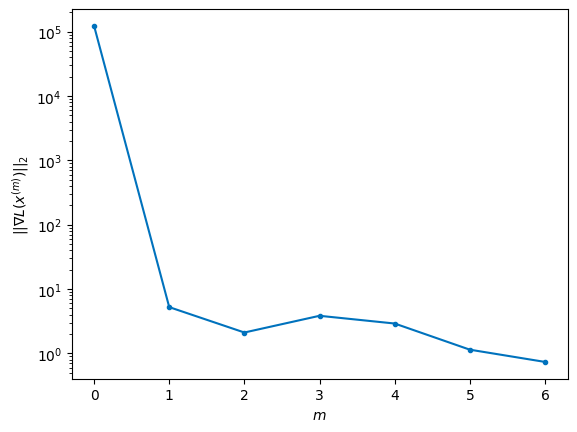


Windows:  63%|██████▎   | 186/296 [37:58<18:39, 10.18s/it]

Before applying the algorithm
Cost function: 451.32494257740336
Gradient norm: 62767.80503246675
Global relative error: 1894098525.4386933
Position relative errors: 0.021883062658116032 m, 2.5988943108797433 m, 0.1320441339211652 m, 3.6199378345390154 m

Iteration 1
Cost function: 450.92181039824806 (-0.09%)
Gradient norm: 8.928862020269172 (-99.99%)
Global relative error: 5.074262080499056 (13.82%)
Position relative errors: 0.022143223003579106 m, 2.98292245268058 m, 0.15414485489913052 m, 4.101957651998067 m

Iteration 2
Cost function: 450.92181055236176 (0.00%)
Gradient norm: 2.4241865938936065 (-72.85%)
Global relative error: 5.074232008370048 (-0.00%)
Position relative errors: 0.02214322418596445 m, 2.982904601060864 m, 0.15414430671682613 m, 4.101933453926984 m

Iteration 3
Cost function: 450.92181053985985 (-0.00%)
Gradient norm: 3.287188013579016 (35.60%)
Global relative error: 5.074232007697128 (-0.00%)
Position relative errors: 0.02214321810856326 m, 2.9829046009103353 m, 0.1

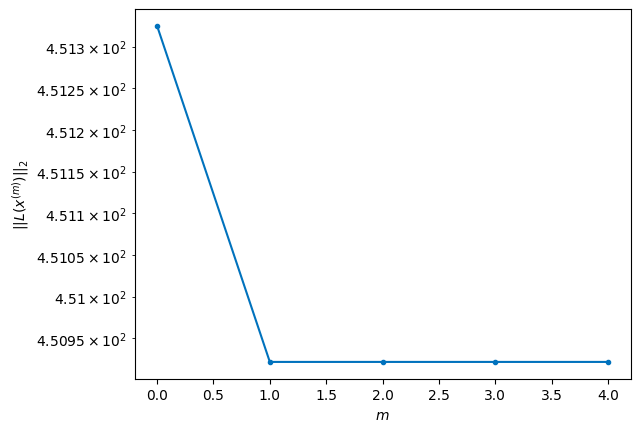

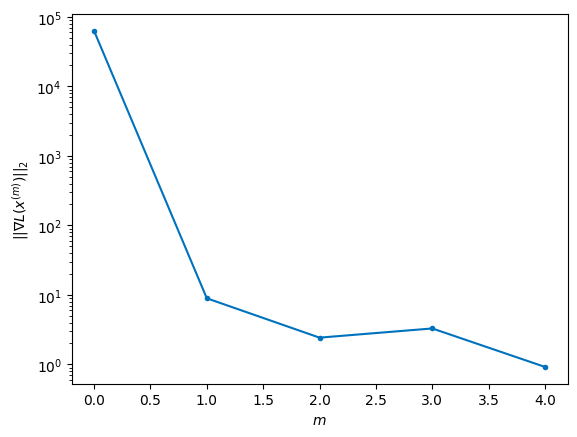


Windows:  63%|██████▎   | 187/296 [38:08<18:12, 10.02s/it]

Before applying the algorithm
Cost function: 447.26253365771385
Gradient norm: 116276.70553537286
Global relative error: 1893608680.1421957
Position relative errors: 0.02107972832120666 m, 2.97369789654533 m, 0.14026309793109956 m, 4.029357629869213 m

Iteration 1
Cost function: 446.7556654911654 (-0.11%)
Gradient norm: 4.752490058162295 (-100.00%)
Global relative error: 5.249436369751306 (4.78%)
Position relative errors: 0.01788157396265903 m, 2.96723793339658 m, 0.2105776443606144 m, 4.325207157828182 m

STOP on Iteration 2
Cost function = 446.7556652523037 (-0.00%)
Gradient norm = 0.8536512672630238 (-82.04%)
Global relative error = 5.249354615557672 (-0.00%)
Final position relative errors: 0.01788157307086435 m, 2.967212686633507 m, 0.21057703830116103 m, 4.325125283595722 m



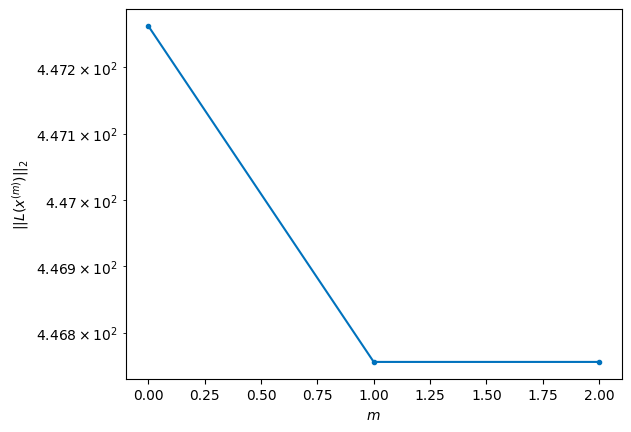

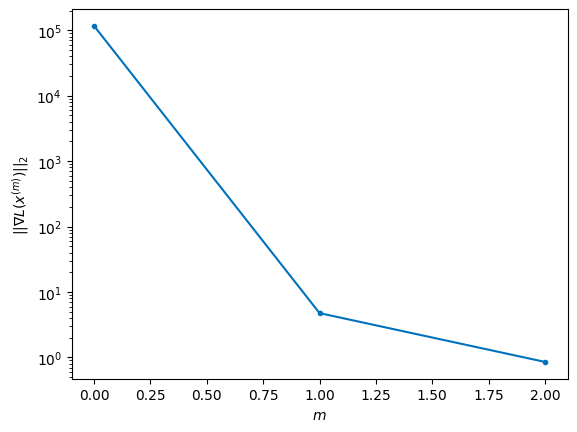


Windows:  64%|██████▎   | 188/296 [38:14<16:06,  8.95s/it]

Before applying the algorithm
Cost function: 447.6551058158017
Gradient norm: 295669.39293312444
Global relative error: 1893143421.5815203
Position relative errors: 0.01702177754535197 m, 2.947461097223328 m, 0.1929932590394322 m, 4.252630727491063 m

Iteration 1
Cost function: 447.22866720694856 (-0.10%)
Gradient norm: 6.232572809239187 (-100.00%)
Global relative error: 4.810867082923357 (-7.09%)
Position relative errors: 0.02697637127774995 m, 2.5796723712732472 m, 0.21841439355536807 m, 4.05478695571564 m

STOP on Iteration 2
Cost function = 447.228666893903 (-0.00%)
Gradient norm = 0.22998740988942223 (-96.31%)
Global relative error = 4.8108217216273825 (-0.00%)
Final position relative errors: 0.02697638107282746 m, 2.5796331121157827 m, 0.21841404309900686 m, 4.054758131677295 m



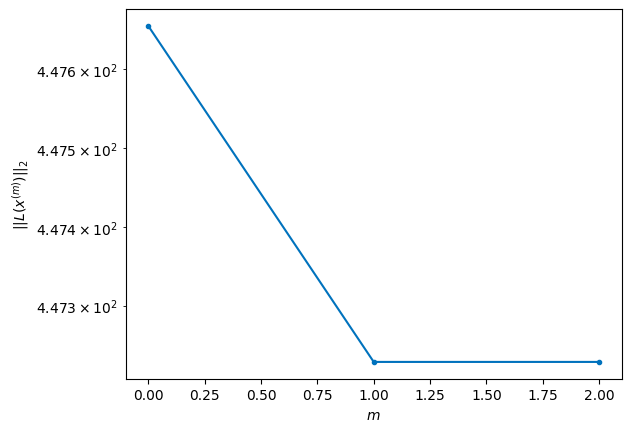

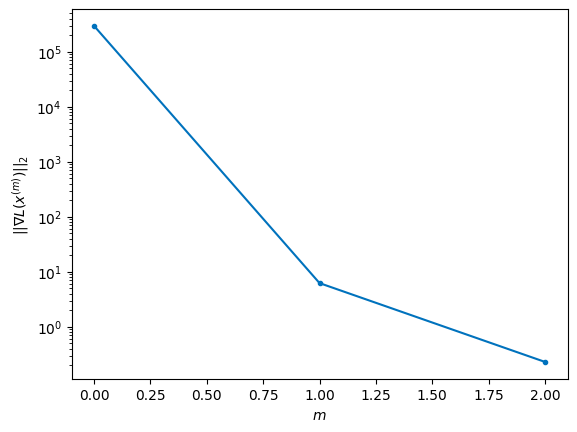


Windows:  64%|██████▍   | 189/296 [38:20<14:32,  8.16s/it]

Before applying the algorithm
Cost function: 444.25002281426407
Gradient norm: 213704.54874131456
Global relative error: 1892704681.2423763
Position relative errors: 0.025417179456100537 m, 2.5467393262272324 m, 0.20593385670421696 m, 3.9598911585492216 m

Iteration 1
Cost function: 443.60575525466174 (-0.15%)
Gradient norm: 5.5197804141537485 (-100.00%)
Global relative error: 4.642401440443995 (-1.49%)
Position relative errors: 0.036026550268713195 m, 2.303925545030483 m, 0.14551658906856252 m, 4.027572830662833 m

Iteration 2
Cost function: 443.6057553175605 (0.00%)
Gradient norm: 1.2922196957891137 (-76.59%)
Global relative error: 4.642343786115843 (-0.00%)
Position relative errors: 0.03602654774275039 m, 2.3039182874350317 m, 0.1455169514399227 m, 4.027510513583845 m

Iteration 3
Cost function: 443.605755336078 (0.00%)
Gradient norm: 2.4859535990883708 (92.38%)
Global relative error: 4.642343759022152 (-0.00%)
Position relative errors: 0.03602654141657018 m, 2.303918276030103 m, 0.

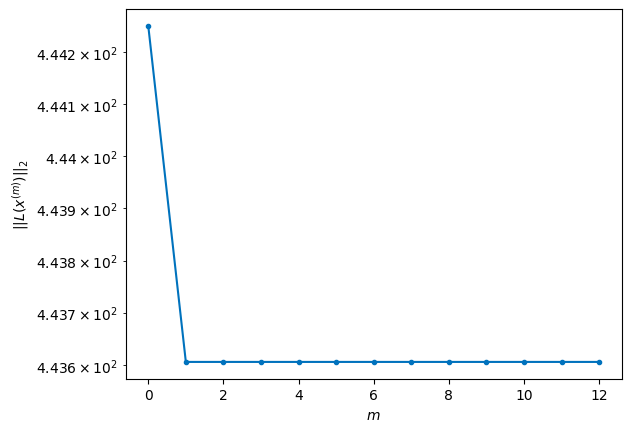

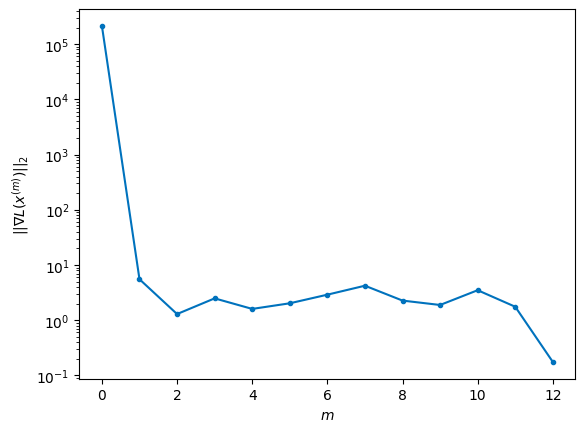


Windows:  64%|██████▍   | 190/296 [38:46<23:26, 13.27s/it]

Before applying the algorithm
Cost function: 445.14070679000395
Gradient norm: 333466.53826783306
Global relative error: 1892294329.8081248
Position relative errors: 0.03418576214913203 m, 2.262897994038465 m, 0.15609808458951877 m, 3.943911615389849 m

Iteration 1
Cost function: 444.45055700755734 (-0.16%)
Gradient norm: 19.118964231257056 (-99.99%)
Global relative error: 3.9714697408629585 (-12.71%)
Position relative errors: 0.03331288443054156 m, 1.7420421138583393 m, 0.16827574746745547 m, 3.5648887066449806 m

Iteration 2
Cost function: 444.4505567250784 (-0.00%)
Gradient norm: 6.949361421258295 (-63.65%)
Global relative error: 3.9714252641955508 (-0.00%)
Position relative errors: 0.03331287885493709 m, 1.741985698686255 m, 0.16827665079177856 m, 3.5648666826651443 m

Iteration 3
Cost function: 444.45055669141146 (-0.00%)
Gradient norm: 1.0370027358179152 (-85.08%)
Global relative error: 3.971425258097228 (-0.00%)
Position relative errors: 0.03331288850466578 m, 1.7419856943710488

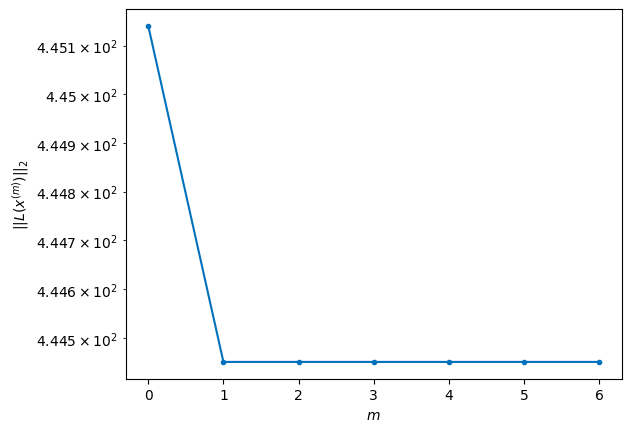

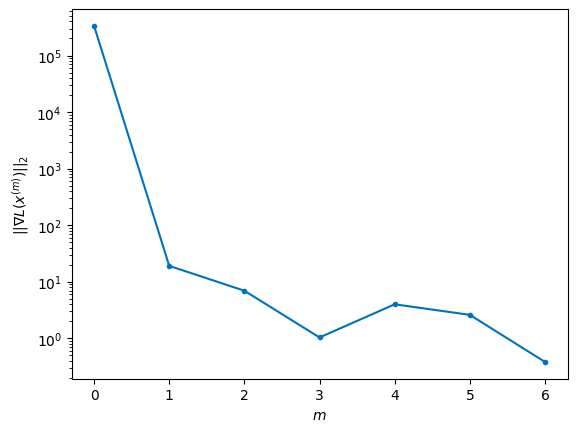


Windows:  65%|██████▍   | 191/296 [39:00<23:44, 13.57s/it]

Before applying the algorithm
Cost function: 447.8768119619106
Gradient norm: 311928.2358732064
Global relative error: 1891914152.9317212
Position relative errors: 0.03181289896873262 m, 1.6897875214015508 m, 0.1780401349400224 m, 3.4678543190610824 m

Iteration 1
Cost function: 447.3533848421644 (-0.12%)
Gradient norm: 9.603400473151462 (-100.00%)
Global relative error: 4.278667634912295 (10.79%)
Position relative errors: 0.03082570943174055 m, 1.772813616779793 m, 0.18339746052951164 m, 3.8896707450823746 m

Iteration 2
Cost function: 447.3533848335254 (-0.00%)
Gradient norm: 1.1210340036094029 (-88.33%)
Global relative error: 4.2787301035815934 (0.00%)
Position relative errors: 0.030825708914910814 m, 1.7727893401829422 m, 0.18339707514821152 m, 3.88975054352708 m

Iteration 3
Cost function: 447.35338485917464 (0.00%)
Gradient norm: 1.0740005076271404 (-4.20%)
Global relative error: 4.27873010676455 (0.00%)
Position relative errors: 0.030825706354040517 m, 1.77278933640815 m, 0.1833

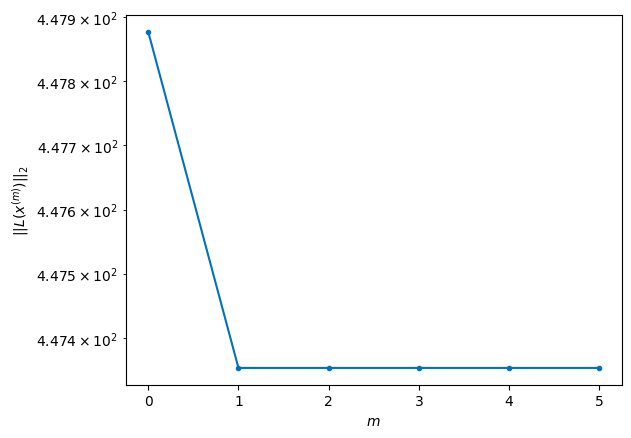

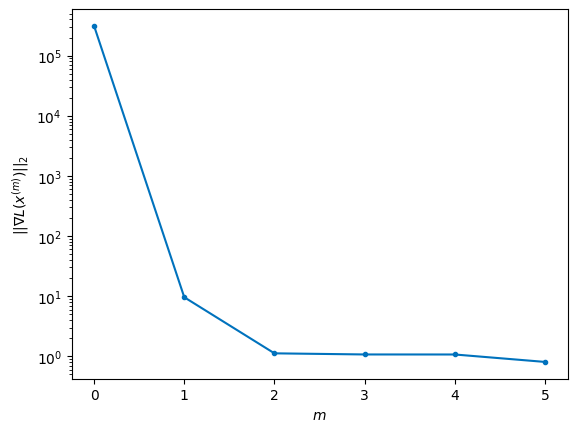


Windows:  65%|██████▍   | 192/296 [39:12<22:47, 13.15s/it]

Before applying the algorithm
Cost function: 454.29241249372757
Gradient norm: 109138.64100353469
Global relative error: 1891565849.7210636
Position relative errors: 0.029580416641553794 m, 1.7185277878874938 m, 0.20419652213424083 m, 3.7584469158162244 m

Iteration 1
Cost function: 453.5366045479328 (-0.17%)
Gradient norm: 22.137788993883017 (-99.98%)
Global relative error: 3.2196163427581888 (-22.19%)
Position relative errors: 0.030644867355891066 m, 1.4614120799453152 m, 0.24600643323249066 m, 2.8581005752794852 m

Iteration 2
Cost function: 453.5366047185489 (0.00%)
Gradient norm: 4.067297616334279 (-81.63%)
Global relative error: 3.2197295713029823 (0.00%)
Position relative errors: 0.030644864093269962 m, 1.461387909304324 m, 0.24600347868307348 m, 2.858240737905391 m

Iteration 3
Cost function: 453.5366044589433 (-0.00%)
Gradient norm: 2.472360897342194 (-39.21%)
Global relative error: 3.219729568396709 (-0.00%)
Position relative errors: 0.030644863594888497 m, 1.461387903213053 

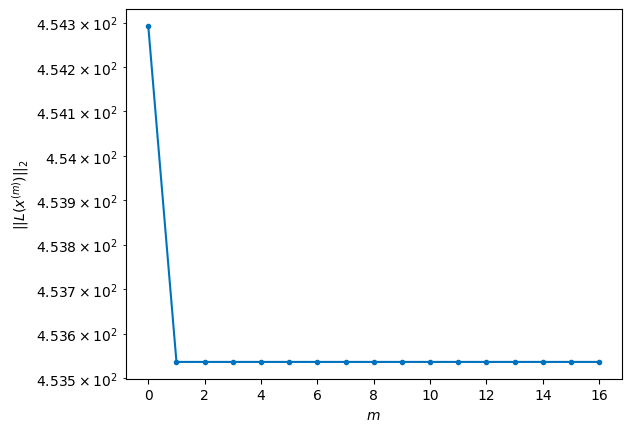

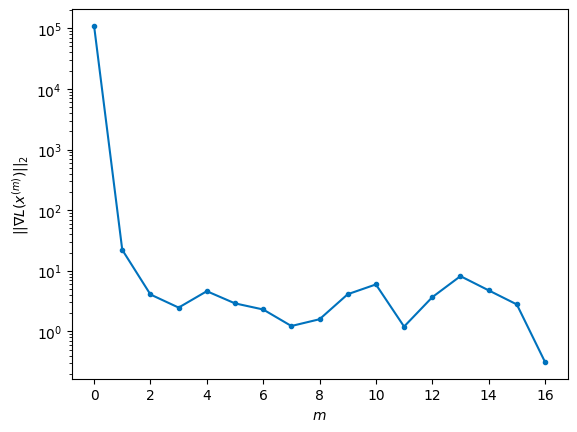


Windows:  65%|██████▌   | 193/296 [39:45<32:41, 19.04s/it]

Before applying the algorithm
Cost function: 454.4320513286248
Gradient norm: 122355.85730115144
Global relative error: 1891251040.0775976
Position relative errors: 0.029377999758749718 m, 1.3991713459437025 m, 0.2508531104777665 m, 2.70911990409681 m

Iteration 1
Cost function: 453.8650275947389 (-0.12%)
Gradient norm: 10.390417652273994 (-99.99%)
Global relative error: 3.6726743050972592 (20.04%)
Position relative errors: 0.022594251627585868 m, 1.5637480426214971 m, 0.23277914575973432 m, 3.3148943626671423 m

STOP on Iteration 2
Cost function = 453.8650278535236 (0.00%)
Gradient norm = 0.7108167600884115 (-93.16%)
Global relative error = 3.672655402599292 (-0.00%)
Final position relative errors: 0.02259425430219817 m, 1.5636995832692855 m, 0.23278076814662618 m, 3.3148961656535914 m



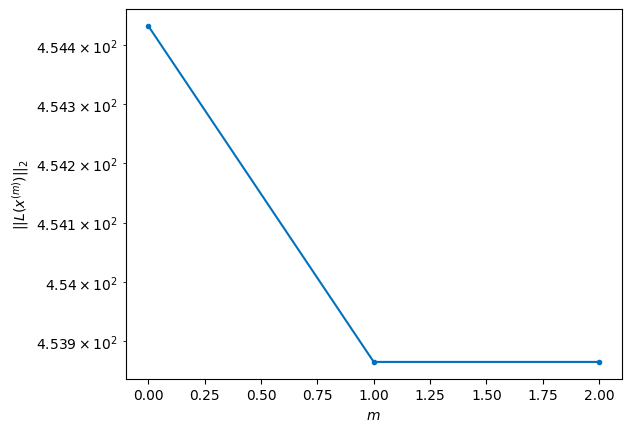

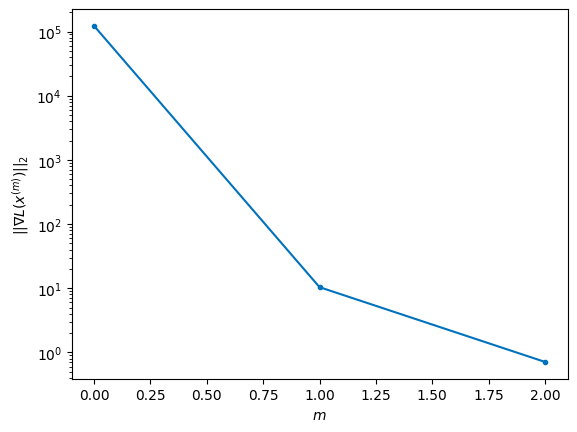


Windows:  66%|██████▌   | 194/296 [39:51<25:49, 15.19s/it]

Before applying the algorithm
Cost function: 455.04132271820373
Gradient norm: 79834.08786404761
Global relative error: 1890971231.618253
Position relative errors: 0.021597763869094146 m, 1.4884800855788867 m, 0.23369390797747455 m, 3.1650435613165264 m

Iteration 1
Cost function: 454.29137845134403 (-0.16%)
Gradient norm: 16.10788944991189 (-99.98%)
Global relative error: 2.759318463342456 (-21.28%)
Position relative errors: 0.02041474726108402 m, 1.0328160702334332 m, 0.31107010689744335 m, 2.539673180440477 m

Iteration 2
Cost function: 454.29137860183556 (0.00%)
Gradient norm: 2.067332774734471 (-87.17%)
Global relative error: 2.7594304889411054 (0.00%)
Position relative errors: 0.020414751705845082 m, 1.0328474853605536 m, 0.3110707553970222 m, 2.5397820393259125 m

Iteration 3
Cost function: 454.29137838565225 (-0.00%)
Gradient norm: 4.990183284653549 (141.38%)
Global relative error: 2.7594304745761375 (-0.00%)
Position relative errors: 0.02041474901745644 m, 1.0328474874729177 m

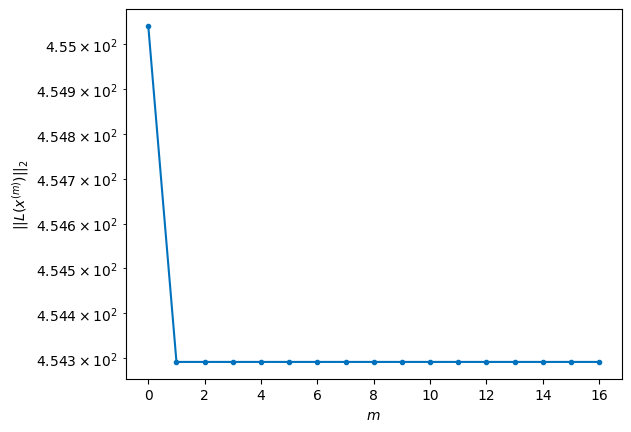

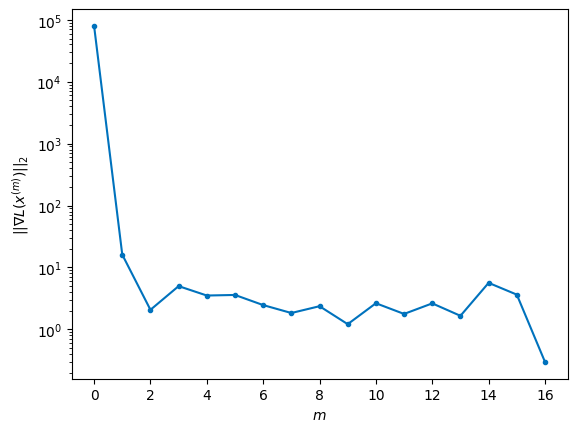


Windows:  66%|██████▌   | 195/296 [40:27<36:11, 21.50s/it]

Before applying the algorithm
Cost function: 457.15341349008753
Gradient norm: 106685.445827675
Global relative error: 1890727827.1729794
Position relative errors: 0.019626314494346556 m, 0.948150751816851 m, 0.2999651923181082 m, 2.388411997396917 m

Iteration 1
Cost function: 456.86687400535214 (-0.06%)
Gradient norm: 14.147854804320003 (-99.99%)
Global relative error: 2.990962140179245 (15.60%)
Position relative errors: 0.024833646131860822 m, 1.4046701325239537 m, 0.22208547863753783 m, 2.6311227633666117 m

Iteration 2
Cost function: 456.8668743522805 (0.00%)
Gradient norm: 2.373808783173477 (-83.22%)
Global relative error: 2.991039369782583 (0.00%)
Position relative errors: 0.02483365611354707 m, 1.4047067885123765 m, 0.22208342801230566 m, 2.6311911586378987 m

Iteration 3
Cost function: 456.86687407658843 (-0.00%)
Gradient norm: 2.157420095273278 (-9.12%)
Global relative error: 2.991039344419001 (-0.00%)
Position relative errors: 0.02483364557560142 m, 1.4047067895073209 m, 0.2

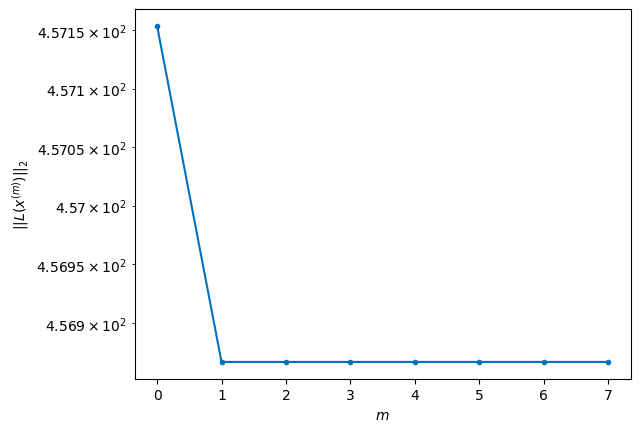

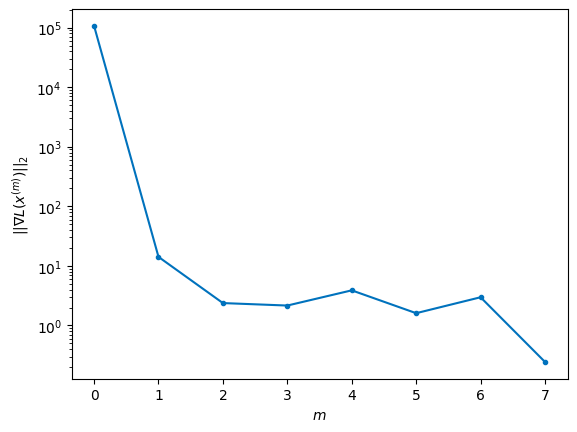


Windows:  66%|██████▌   | 196/296 [40:43<32:56, 19.77s/it]

Before applying the algorithm
Cost function: 457.6477366114248
Gradient norm: 84621.71625664209
Global relative error: 1890522100.9219208
Position relative errors: 0.023905316921168214 m, 1.3102310333765925 m, 0.2233640352385541 m, 2.454410604203962 m

Iteration 1
Cost function: 457.3548967121845 (-0.06%)
Gradient norm: 6.71492677770707 (-99.99%)
Global relative error: 2.779217066675408 (-0.43%)
Position relative errors: 0.02247507864875959 m, 1.4233050386810577 m, 0.23656339295784523 m, 2.375241205620327 m

Iteration 2
Cost function: 457.3548966945408 (-0.00%)
Gradient norm: 2.7925516675986337 (-58.41%)
Global relative error: 2.7792158527289397 (-0.00%)
Position relative errors: 0.02247508497631295 m, 1.423282458132668 m, 0.23656387933321957 m, 2.3752532673884073 m

STOP on Iteration 3
Cost function = 457.35489672259445 (0.00%)
Gradient norm = 0.7391391501688095 (-73.53%)
Global relative error = 2.7792158449131716 (-0.00%)
Final position relative errors: 0.022475079135229052 m, 1.4232

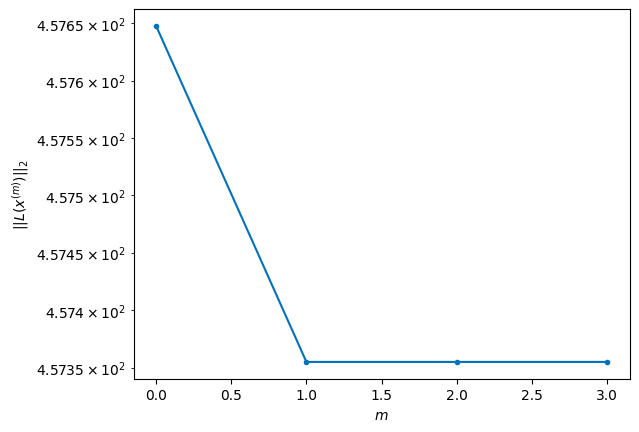

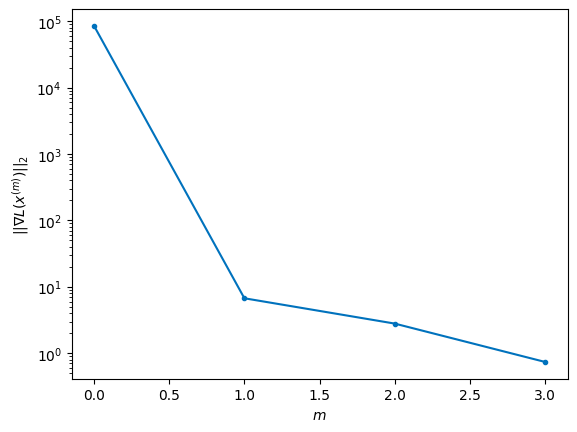


Windows:  67%|██████▋   | 197/296 [40:51<26:56, 16.33s/it]

Before applying the algorithm
Cost function: 453.46110975851747
Gradient norm: 69859.31041686232
Global relative error: 1890355206.1766448
Position relative errors: 0.021588655022442966 m, 1.3242171566620926 m, 0.24909533157189861 m, 2.18637184220468 m

Iteration 1
Cost function: 453.2055480706789 (-0.06%)
Gradient norm: 4.122032189781497 (-99.99%)
Global relative error: 2.894330272284308 (12.69%)
Position relative errors: 0.033501113463047134 m, 1.5130870663909937 m, 0.25049369092102225 m, 2.45435000873528 m

STOP on Iteration 2
Cost function = 453.20554765127 (-0.00%)
Gradient norm = 0.6493224686362306 (-84.25%)
Global relative error = 2.894342516718789 (0.00%)
Final position relative errors: 0.03350110527687087 m, 1.513092363727122 m, 0.25049359930864906 m, 2.45436119188837 m



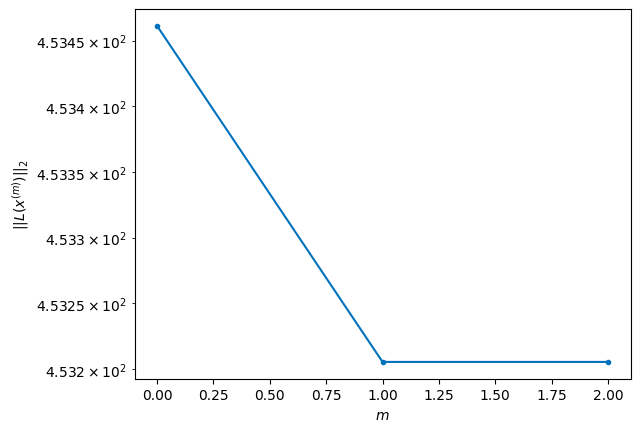

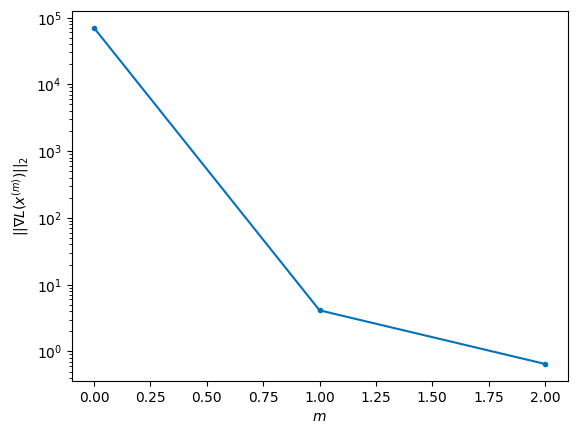


Windows:  67%|██████▋   | 198/296 [40:58<21:50, 13.37s/it]

Before applying the algorithm
Cost function: 459.1827128559362
Gradient norm: 370666.2880786754
Global relative error: 1890228149.9765356
Position relative errors: 0.03240526363145857 m, 1.4109119648691968 m, 0.2646372460800165 m, 2.269668840357541 m

Iteration 1
Cost function: 458.49321059005644 (-0.15%)
Gradient norm: 2.870597772642543 (-100.00%)
Global relative error: 2.4310978425723957 (-9.48%)
Position relative errors: 0.020220091249426267 m, 1.184355479824506 m, 0.5165099498226132 m, 2.0592072854520334 m

Iteration 2
Cost function: 458.4932110265421 (0.00%)
Gradient norm: 2.247232800210019 (-21.72%)
Global relative error: 2.43100324283248 (-0.00%)
Position relative errors: 0.020220081248960197 m, 1.1842679798409115 m, 0.5165367661907843 m, 2.0591391994858617 m

Iteration 3
Cost function: 458.4932108302627 (-0.00%)
Gradient norm: 3.3293246110374684 (48.15%)
Global relative error: 2.431003281694449 (0.00%)
Position relative errors: 0.02022007886312098 m, 1.1842680029319066 m, 0.516

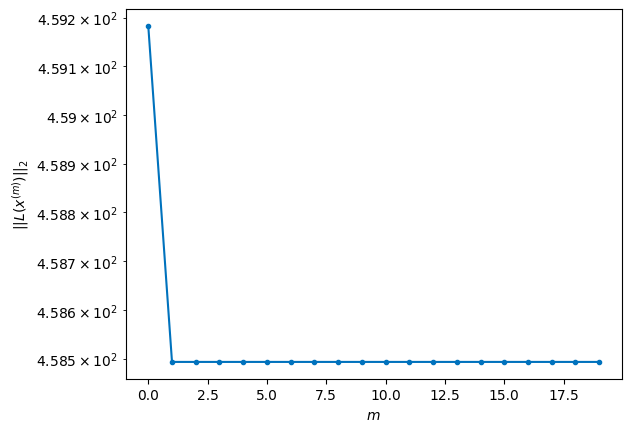

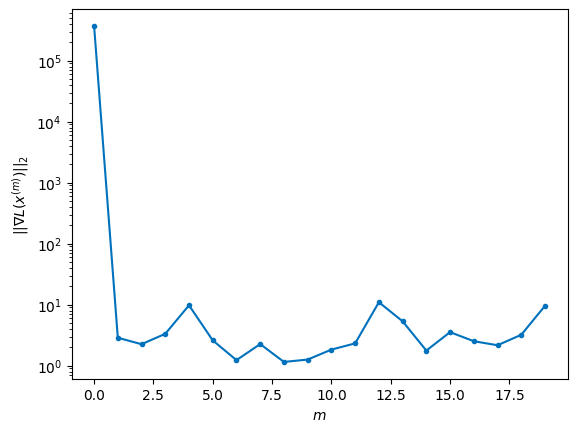


Windows:  67%|██████▋   | 199/296 [41:36<33:47, 20.90s/it]

Before applying the algorithm
Cost function: 457.3612617171766
Gradient norm: 83805.25011740472
Global relative error: 1890141805.8708656
Position relative errors: 0.020026310747145202 m, 1.0740580758879186 m, 0.5447243133786726 m, 1.8727876672131343 m

Iteration 1
Cost function: 456.6641659109403 (-0.15%)
Gradient norm: 13.942711668283982 (-99.98%)
Global relative error: 1.7896590362220308 (-19.63%)
Position relative errors: 0.012526744108033071 m, 0.8429896265702668 m, 0.662119279235653 m, 1.433063609807279 m

Iteration 2
Cost function: 456.6641657832877 (-0.00%)
Gradient norm: 4.106785955179621 (-70.55%)
Global relative error: 1.789607858826071 (-0.00%)
Position relative errors: 0.012526744887585104 m, 0.8429482334001881 m, 0.6621303569503072 m, 1.4330189283629695 m

Iteration 3
Cost function: 456.6641662796029 (0.00%)
Gradient norm: 7.847500311073831 (91.09%)
Global relative error: 1.7896078487799647 (-0.00%)
Position relative errors: 0.012526747317872433 m, 0.8429482402114102 m, 0

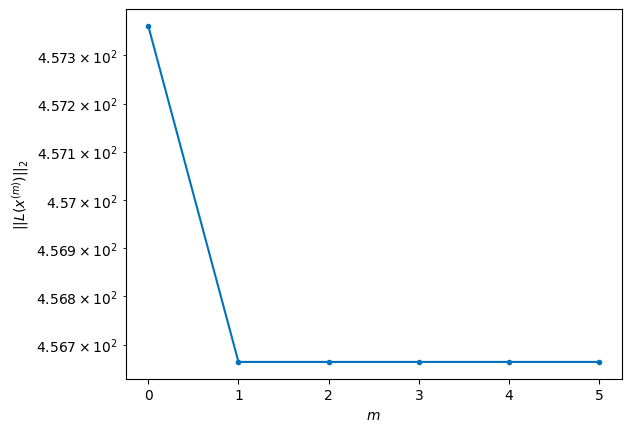

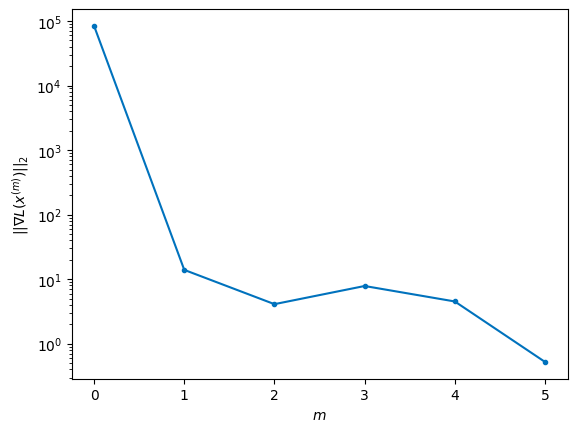


Windows:  68%|██████▊   | 200/296 [41:48<29:12, 18.26s/it]

Before applying the algorithm
Cost function: 451.43656406082044
Gradient norm: 42818.26981921453
Global relative error: 1890096869.6025317
Position relative errors: 0.012815063911602342 m, 0.7381551884258776 m, 0.6920649557094661 m, 1.2041002007922064 m

Iteration 1
Cost function: 451.00924711841117 (-0.09%)
Gradient norm: 5.481889015572399 (-99.99%)
Global relative error: 1.7824094849505272 (13.32%)
Position relative errors: 0.010741480276231312 m, 0.8039342436493082 m, 0.5182570413428188 m, 1.503978359632297 m

Iteration 2
Cost function: 451.00924675571486 (-0.00%)
Gradient norm: 3.3798407760009943 (-38.35%)
Global relative error: 1.782418491843778 (0.00%)
Position relative errors: 0.010741474327027567 m, 0.8039287797111383 m, 0.518262202707371 m, 1.5039901760633196 m

Iteration 3
Cost function: 451.00924688135814 (0.00%)
Gradient norm: 2.3186474490041187 (-31.40%)
Global relative error: 1.7824184883222587 (-0.00%)
Position relative errors: 0.010741476810069749 m, 0.8039288061019707 

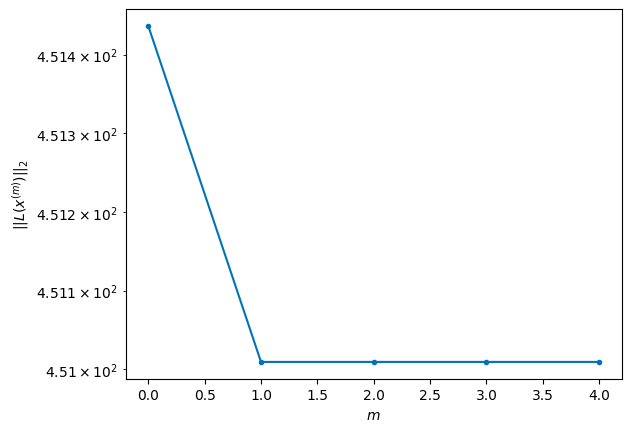

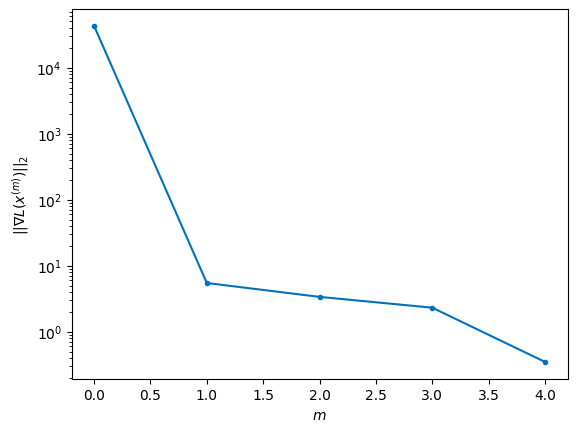


Windows:  68%|██████▊   | 201/296 [41:58<25:00, 15.79s/it]

Before applying the algorithm
Cost function: 447.8848324462616
Gradient norm: 85656.42806591734
Global relative error: 1890093874.425713
Position relative errors: 0.010866751574041721 m, 0.6982837410238084 m, 0.5435893983542317 m, 1.2811231529346339 m

Iteration 1
Cost function: 447.53823689846007 (-0.08%)
Gradient norm: 4.401899280408187 (-99.99%)
Global relative error: 1.4134504261347338 (-9.22%)
Position relative errors: 0.009553898430484533 m, 0.4928768678672094 m, 0.4236525779179535 m, 1.2551179577772438 m

Iteration 2
Cost function: 447.53823576775324 (-0.00%)
Gradient norm: 3.243361194486233 (-26.32%)
Global relative error: 1.4134461792792394 (-0.00%)
Position relative errors: 0.009553895743190967 m, 0.49285531867182203 m, 0.4236422155777457 m, 1.2551251349961823 m

STOP on Iteration 3
Cost function = 447.5382360448953 (0.00%)
Gradient norm = 0.2326130464192114 (-92.83%)
Global relative error = 1.4134461418912905 (-0.00%)
Final position relative errors: 0.009553909139844389 m, 0

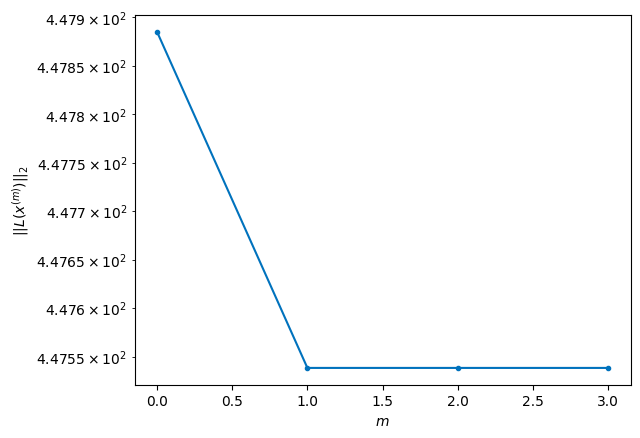

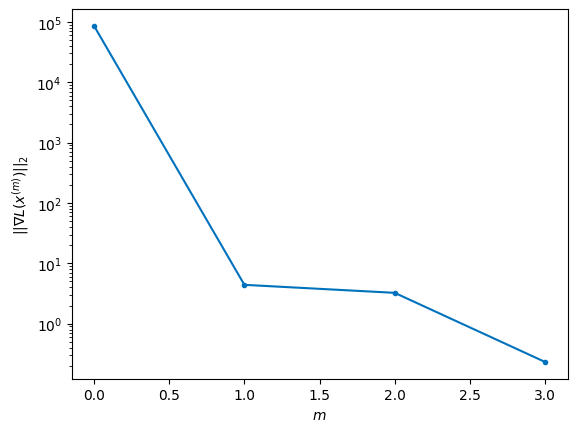


Windows:  68%|██████▊   | 202/296 [42:07<21:11, 13.53s/it]

Before applying the algorithm
Cost function: 445.7362800439994
Gradient norm: 171028.38399708588
Global relative error: 1890133204.097696
Position relative errors: 0.009678424415723839 m, 0.37515442523319353 m, 0.4397209642155172 m, 1.0094251211693692 m

Iteration 1
Cost function: 445.348831724102 (-0.09%)
Gradient norm: 5.539425426576628 (-100.00%)
Global relative error: 1.1560695198317597 (-0.62%)
Position relative errors: 0.009405846537099303 m, 0.48999552180442596 m, 0.4733285972812573 m, 0.9339410434773062 m

Iteration 2
Cost function: 445.3488327803995 (0.00%)
Gradient norm: 3.80793674031532 (-31.26%)
Global relative error: 1.1560386719184859 (-0.00%)
Position relative errors: 0.009405844689848135 m, 0.4899632308553769 m, 0.47333377419876294 m, 0.9339171763536591 m

Iteration 3
Cost function: 445.348831602473 (-0.00%)
Gradient norm: 2.7479281214078095 (-27.84%)
Global relative error: 1.1560386731593204 (0.00%)
Position relative errors: 0.00940584162141999 m, 0.48996323944590964 m

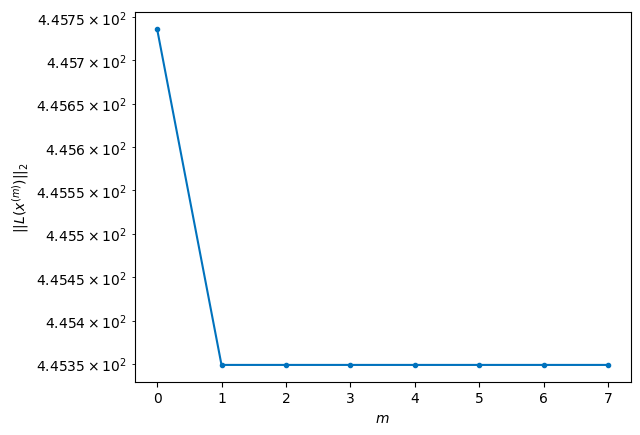

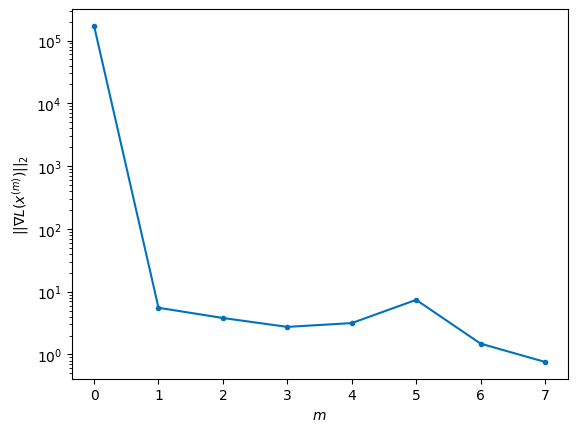


Windows:  69%|██████▊   | 203/296 [42:22<22:05, 14.25s/it]

Before applying the algorithm
Cost function: 449.0126967466969
Gradient norm: 182830.4055507644
Global relative error: 1890215039.807447
Position relative errors: 0.009480972441576538 m, 0.36897985026074537 m, 0.49050678115090357 m, 0.6608133995130564 m

Iteration 1
Cost function: 448.43016182326346 (-0.13%)
Gradient norm: 6.638583939848574 (-100.00%)
Global relative error: 1.2351743550219607 (36.94%)
Position relative errors: 0.014966944708945109 m, 0.6581121480747054 m, 0.575199092698447 m, 0.8726046342484303 m

STOP on Iteration 2
Cost function = 448.43016203034637 (0.00%)
Gradient norm = 0.8772617679264925 (-86.79%)
Global relative error = 1.2351360761289039 (-0.00%)
Final position relative errors: 0.014966946103951053 m, 0.6580474057735158 m, 0.5752112498456441 m, 0.8725912627337254 m



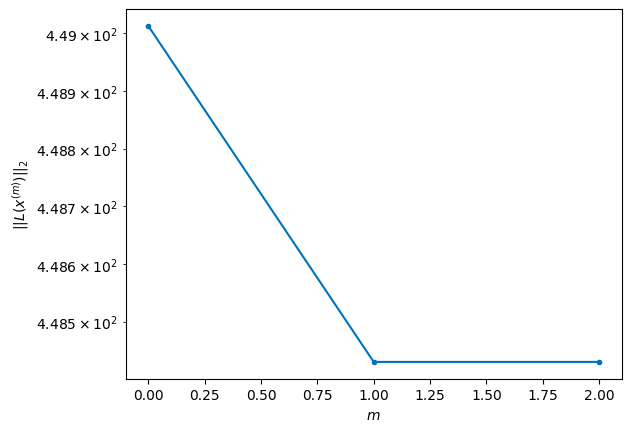

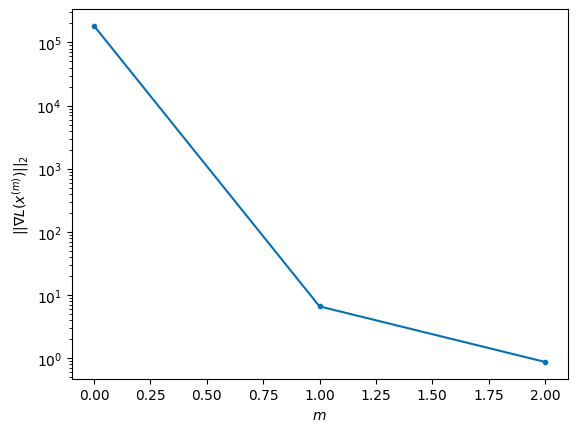


Windows:  69%|██████▉   | 204/296 [42:29<18:14, 11.90s/it]

Before applying the algorithm
Cost function: 447.7005799375857
Gradient norm: 184766.11893429028
Global relative error: 1890339365.073191
Position relative errors: 0.014581560255048528 m, 0.5384752035558552 m, 0.5913646056433661 m, 0.5924305305750883 m

Iteration 1
Cost function: 447.2144120794334 (-0.11%)
Gradient norm: 9.678607491144362 (-99.99%)
Global relative error: 0.9749149275655851 (-2.06%)
Position relative errors: 0.02271913994246291 m, 0.4315267710937831 m, 0.7446048268013918 m, 0.4574455615866203 m

STOP on Iteration 2
Cost function = 447.21441193984924 (-0.00%)
Gradient norm = 0.180353797104118 (-98.14%)
Global relative error = 0.9749137057923444 (-0.00%)
Final position relative errors: 0.02271914299138065 m, 0.4314923664820538 m, 0.7446183854055428 m, 0.45745334165128937 m



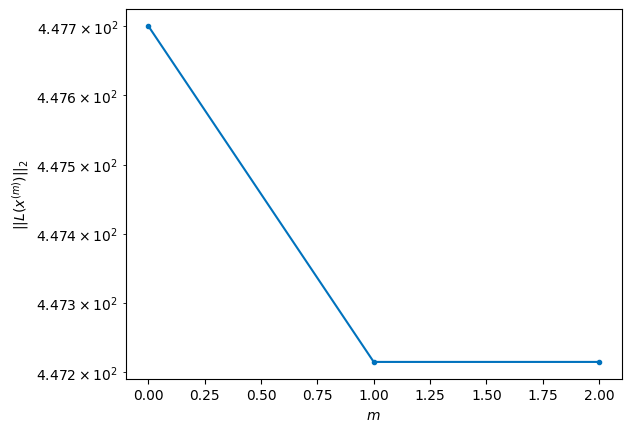

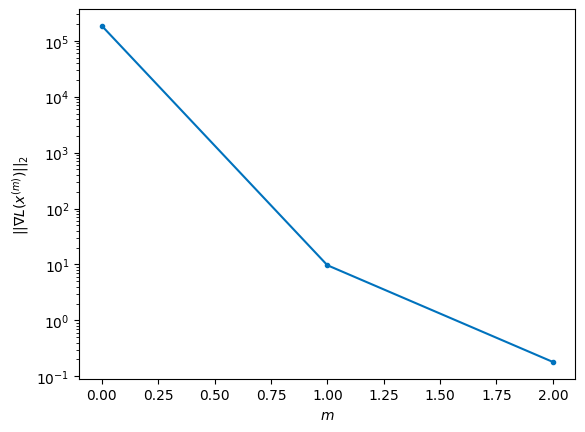


Windows:  69%|██████▉   | 205/296 [42:35<15:34, 10.27s/it]

Before applying the algorithm
Cost function: 447.41728160554595
Gradient norm: 120988.57162966744
Global relative error: 1890505996.8625855
Position relative errors: 0.022166413458889582 m, 0.3052680491280907 m, 0.7590153271365765 m, 0.4536977367932603 m

Iteration 1
Cost function: 446.74276737491004 (-0.15%)
Gradient norm: 12.362789481540707 (-99.99%)
Global relative error: 1.1933369666945604 (27.52%)
Position relative errors: 0.01119110456262055 m, 0.45152754764327635 m, 0.868586578428525 m, 0.6823246394440625 m

Iteration 2
Cost function: 446.7427673241719 (-0.00%)
Gradient norm: 2.7744420691667737 (-77.56%)
Global relative error: 1.1933236751675262 (-0.00%)
Position relative errors: 0.011191101162797111 m, 0.4514734477123742 m, 0.8685836678562661 m, 0.6823408969855178 m

Iteration 3
Cost function: 446.74276730981245 (-0.00%)
Gradient norm: 8.022885346559322 (189.17%)
Global relative error: 1.1933236616182783 (-0.00%)
Position relative errors: 0.011191100897525752 m, 0.4514734284332

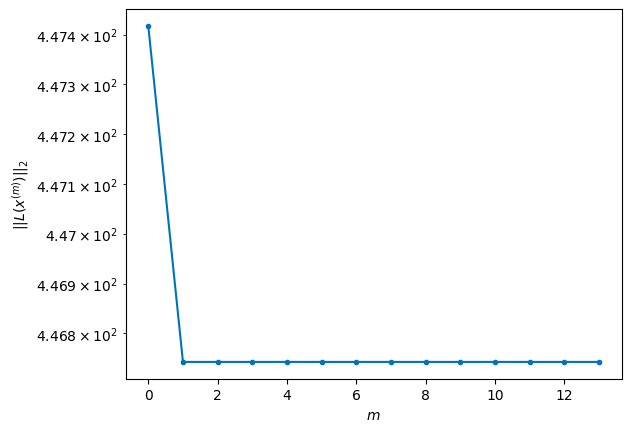

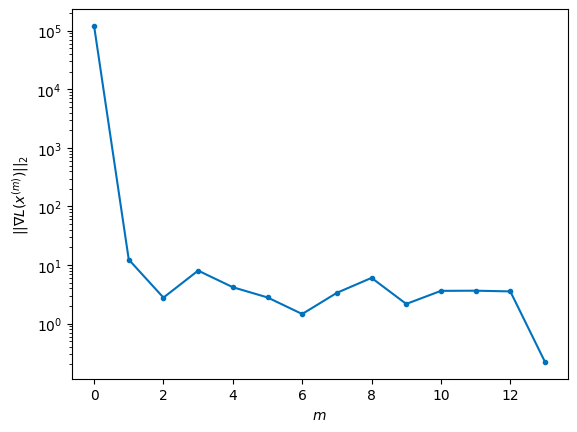


Windows:  70%|██████▉   | 206/296 [43:04<23:40, 15.79s/it]

Before applying the algorithm
Cost function: 449.718825216452
Gradient norm: 88528.06476889086
Global relative error: 1890714528.8717482
Position relative errors: 0.010659299424666101 m, 0.33009270129736396 m, 0.8796124667869243 m, 0.8448921737578404 m

Iteration 1
Cost function: 449.2198175138327 (-0.11%)
Gradient norm: 10.260603142877079 (-99.99%)
Global relative error: 1.2603575086374572 (-0.26%)
Position relative errors: 0.017486843400751042 m, 0.7502425318843129 m, 0.8456108343499392 m, 0.5569915300180215 m

Iteration 2
Cost function: 449.2198177213713 (0.00%)
Gradient norm: 1.7772529699196344 (-82.68%)
Global relative error: 1.2603764163529825 (0.00%)
Position relative errors: 0.01748685016422331 m, 0.7502620251841199 m, 0.8456251064857665 m, 0.556986390409424 m

STOP on Iteration 3
Cost function = 449.21981794179084 (0.00%)
Gradient norm = 0.7313327068684169 (-58.85%)
Global relative error = 1.2603764046104877 (-0.00%)
Final position relative errors: 0.017486845763171274 m, 0.75

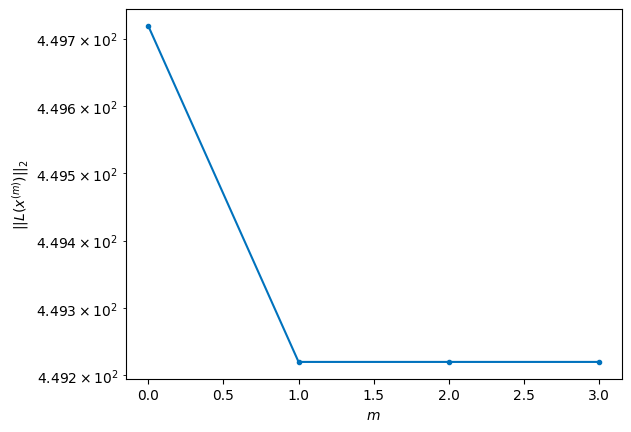

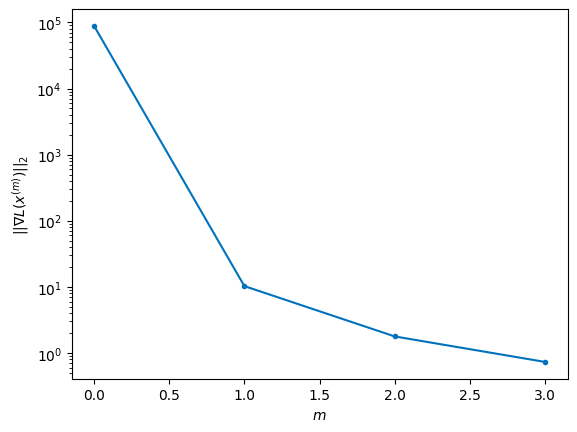


Windows:  70%|██████▉   | 207/296 [43:12<20:04, 13.53s/it]

Before applying the algorithm
Cost function: 448.947367289853
Gradient norm: 74859.24475313882
Global relative error: 1890964352.579137
Position relative errors: 0.017047371249919237 m, 0.6263494659943839 m, 0.8546823414985618 m, 0.7598943979743621 m

Iteration 1
Cost function: 448.8373656069562 (-0.02%)
Gradient norm: 4.133964597310612 (-99.99%)
Global relative error: 1.258203802373861 (-3.52%)
Position relative errors: 0.017325167316500016 m, 0.7960334383716446 m, 0.827239897619191 m, 0.5145381929874137 m

STOP on Iteration 2
Cost function = 448.83736548679707 (-0.00%)
Gradient norm = 0.3175212897535495 (-92.32%)
Global relative error = 1.25820939761087 (0.00%)
Final position relative errors: 0.017325159408196247 m, 0.7960475572974344 m, 0.8272450418557622 m, 0.514521761289743 m



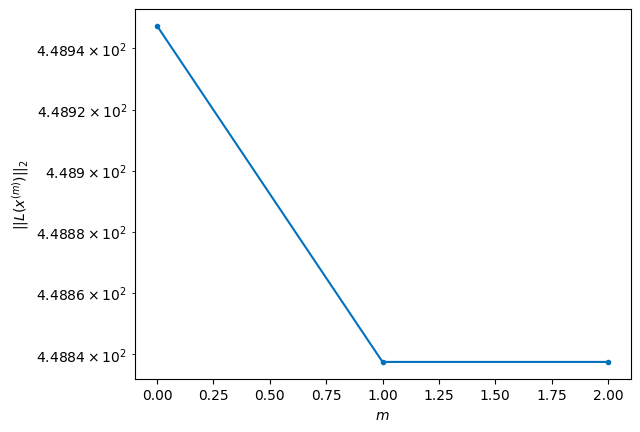

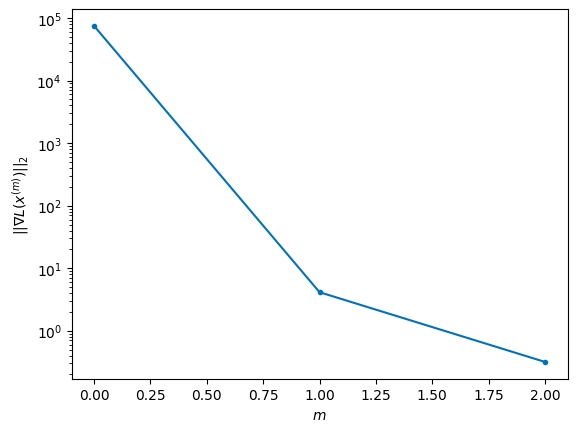


Windows:  70%|███████   | 208/296 [43:19<16:45, 11.43s/it]

Before applying the algorithm
Cost function: 448.91028052504913
Gradient norm: 110476.90614433658
Global relative error: 1891254669.9419599
Position relative errors: 0.016986621007229745 m, 0.6651912150247987 m, 0.8330706756872857 m, 0.7515047601900502 m

Iteration 1
Cost function: 448.0182135018205 (-0.20%)
Gradient norm: 15.865670589987294 (-99.99%)
Global relative error: 1.5833656816680055 (21.38%)
Position relative errors: 0.027736644166859403 m, 0.21530884374538614 m, 1.1371114755993097 m, 1.080215757094659 m

Iteration 2
Cost function: 448.0182135003591 (-0.00%)
Gradient norm: 4.331908085241189 (-72.70%)
Global relative error: 1.5834262074023187 (0.00%)
Position relative errors: 0.02773664340364404 m, 0.21521885077001054 m, 1.1371622543115363 m, 1.080268955103759 m

Iteration 3
Cost function: 448.0182130378352 (-0.00%)
Gradient norm: 1.6873143710807466 (-61.05%)
Global relative error: 1.583426200942288 (-0.00%)
Position relative errors: 0.02773663665193234 m, 0.21521884470831742 

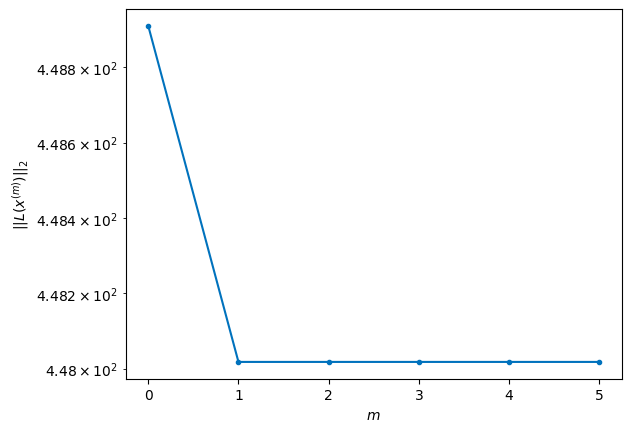

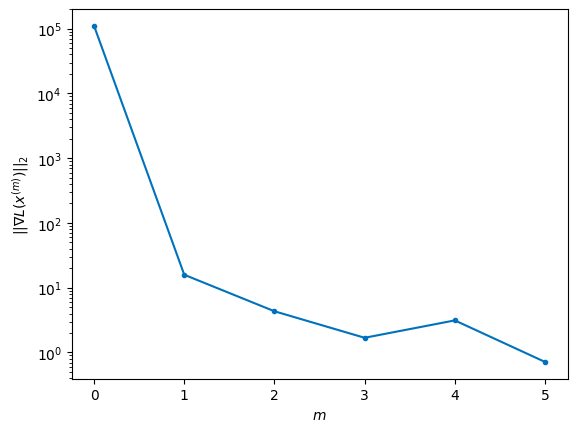


Windows:  71%|███████   | 209/296 [43:31<16:44, 11.55s/it]

Before applying the algorithm
Cost function: 455.7330051404542
Gradient norm: 164434.56925538616
Global relative error: 1891584469.1419604
Position relative errors: 0.027004479530862 m, 0.1593967128953279 m, 1.1374293270396398 m, 1.3597941189577303 m

Iteration 1
Cost function: 454.95789057837123 (-0.17%)
Gradient norm: 12.18753700717374 (-99.99%)
Global relative error: 1.8063773050585226 (1.47%)
Position relative errors: 0.024096292327024243 m, 0.4422901992530409 m, 1.3110431484368252 m, 1.1610079729037153 m

Iteration 2
Cost function: 454.9578904175829 (-0.00%)
Gradient norm: 4.568730022344758 (-62.51%)
Global relative error: 1.8063777788245146 (0.00%)
Position relative errors: 0.024096291470714525 m, 0.44239972754178414 m, 1.3110834676289653 m, 1.1609214466117672 m

Iteration 3
Cost function: 454.9578904936781 (0.00%)
Gradient norm: 1.9586126377903832 (-57.13%)
Global relative error: 1.8063777603569624 (-0.00%)
Position relative errors: 0.024096292600542968 m, 0.4423996875207724 m, 

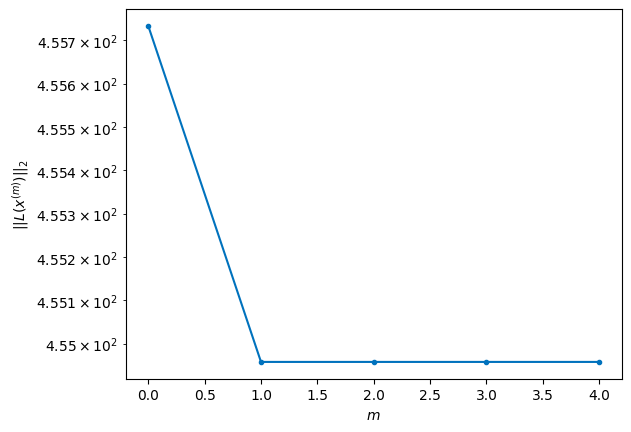

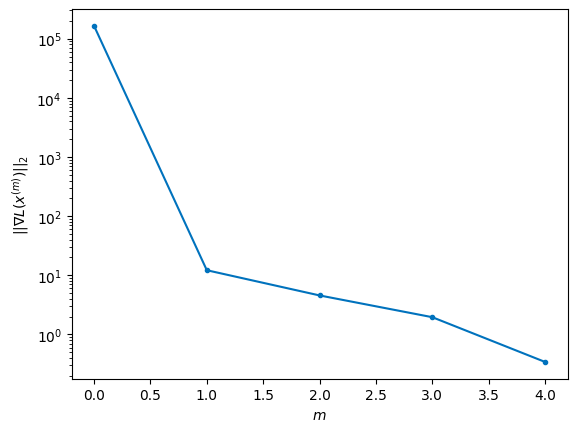


Windows:  71%|███████   | 210/296 [43:41<16:08, 11.26s/it]

Before applying the algorithm
Cost function: 458.2248998647387
Gradient norm: 174272.38326713548
Global relative error: 1891952516.5857592
Position relative errors: 0.023730029886432805 m, 0.3606242471799596 m, 1.3059937543787277 m, 1.4231170527168728 m

Iteration 1
Cost function: 457.7991709005775 (-0.09%)
Gradient norm: 13.617391112501123 (-99.99%)
Global relative error: 1.9854747766895275 (1.04%)
Position relative errors: 0.02855243271340944 m, 0.5202365611173835 m, 1.4146569606894408 m, 1.2920440158701931 m

Iteration 2
Cost function: 457.79917028876395 (-0.00%)
Gradient norm: 3.029322147721863 (-77.75%)
Global relative error: 1.9854890125601135 (0.00%)
Position relative errors: 0.028552424068657267 m, 0.5200810291701911 m, 1.414651198673744 m, 1.2921348128429184 m

Iteration 3
Cost function: 457.7991702630191 (-0.00%)
Gradient norm: 3.0208866807952814 (-0.28%)
Global relative error: 1.985489064082336 (0.00%)
Position relative errors: 0.02855243987866201 m, 0.5200810144305394 m, 1.

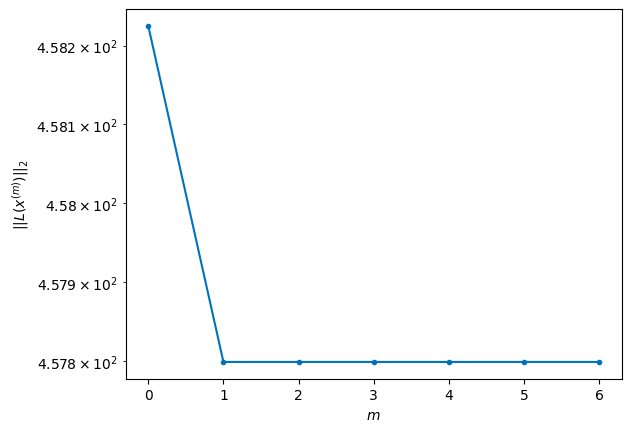

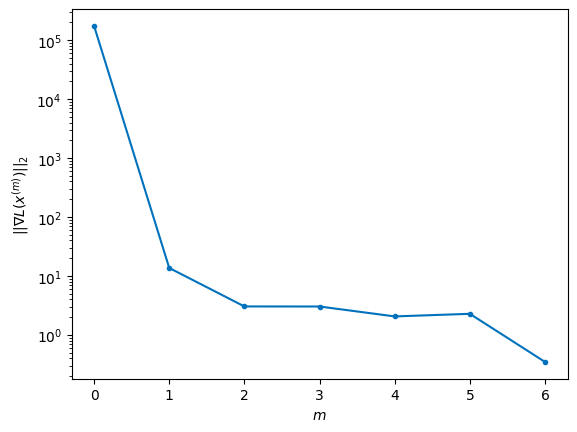


Windows:  71%|███████▏  | 211/296 [43:55<17:00, 12.00s/it]

Before applying the algorithm
Cost function: 458.40298621015035
Gradient norm: 102635.65179381544
Global relative error: 1892357391.243534
Position relative errors: 0.027993781006227215 m, 0.47709903364145007 m, 1.4038626198525195 m, 1.5220996234719388 m

Iteration 1
Cost function: 457.92471463980985 (-0.10%)
Gradient norm: 2.605689167715667 (-100.00%)
Global relative error: 2.144640661616363 (0.92%)
Position relative errors: 0.03217072565943396 m, 0.37957404662734984 m, 1.2686166305314648 m, 1.6867035615722656 m

Iteration 2
Cost function: 457.9247146482534 (0.00%)
Gradient norm: 1.3044773348353542 (-49.94%)
Global relative error: 2.144619250149327 (-0.00%)
Position relative errors: 0.032170728464206745 m, 0.37960605296714617 m, 1.2686285939859707 m, 1.6866601354514357 m

Iteration 3
Cost function: 457.9247147303728 (0.00%)
Gradient norm: 2.6078228548447813 (99.91%)
Global relative error: 2.1446192505128416 (0.00%)
Position relative errors: 0.03217072997214699 m, 0.3796060231040301 m,

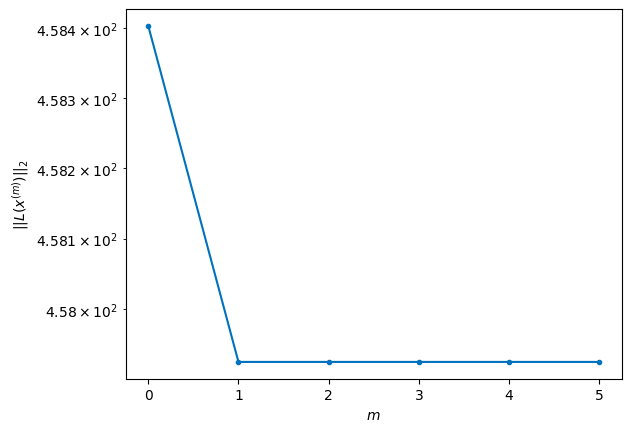

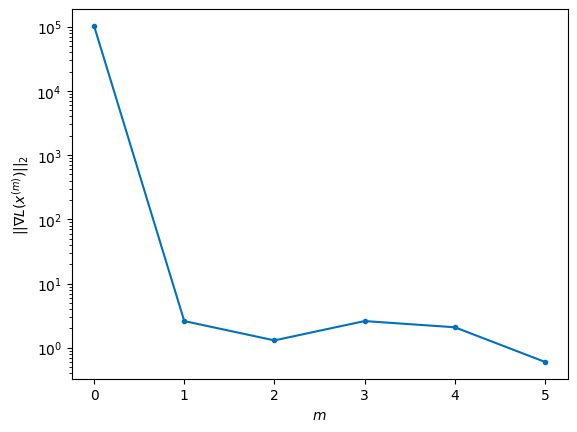


Windows:  72%|███████▏  | 212/296 [44:07<16:50, 12.03s/it]

Before applying the algorithm
Cost function: 457.35512579725145
Gradient norm: 256851.93491778287
Global relative error: 1892797462.5393555
Position relative errors: 0.03154243149158431 m, 0.353314215122264 m, 1.2538974059474324 m, 1.9065889246341545 m

Iteration 1
Cost function: 457.0476896159822 (-0.07%)
Gradient norm: 4.218965250696326 (-100.00%)
Global relative error: 2.0309718757175825 (-12.06%)
Position relative errors: 0.03588835464058273 m, 0.3893518886336694 m, 1.0602977711985337 m, 1.6875179087519536 m

Iteration 2
Cost function: 457.04769037791704 (0.00%)
Gradient norm: 3.1403074264852107 (-25.57%)
Global relative error: 2.0309866806495798 (0.00%)
Position relative errors: 0.03588836002810937 m, 0.3893561812691173 m, 1.0603306594662014 m, 1.687514071807115 m

Iteration 3
Cost function: 457.0476893216073 (-0.00%)
Gradient norm: 3.389811777990216 (7.95%)
Global relative error: 2.0309866377015378 (-0.00%)
Position relative errors: 0.03588835352340905 m, 0.3893561878260614 m, 1.

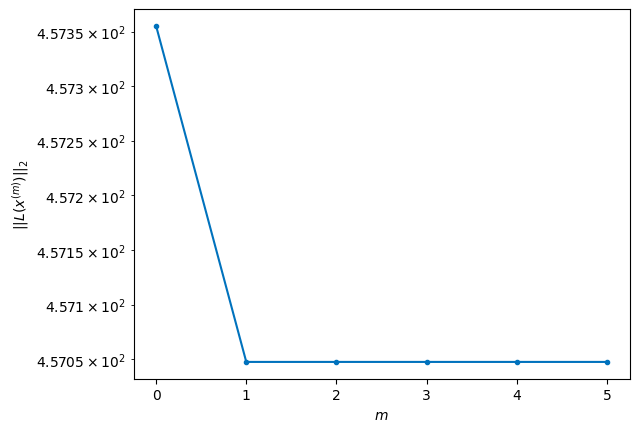

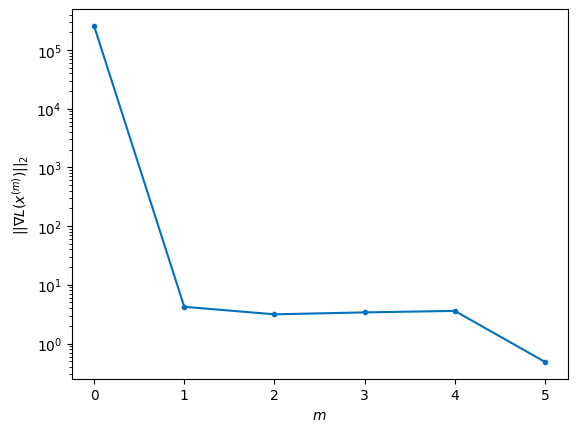


Windows:  72%|███████▏  | 213/296 [44:19<16:35, 11.99s/it]

Before applying the algorithm
Cost function: 459.6405180953224
Gradient norm: 195067.35720525417
Global relative error: 1893270907.6508884
Position relative errors: 0.03530607207143667 m, 0.3574604670123413 m, 1.0462471757548046 m, 1.912296081815463 m

Iteration 1
Cost function: 458.8811439931786 (-0.17%)
Gradient norm: 11.359660602909518 (-99.99%)
Global relative error: 2.5015571314903737 (13.23%)
Position relative errors: 0.033706072093393956 m, 0.4479981902508389 m, 1.1469503219662907 m, 2.1772558133877773 m

Iteration 2
Cost function: 458.88114422931363 (0.00%)
Gradient norm: 1.1336988003069992 (-90.02%)
Global relative error: 2.501577045903925 (0.00%)
Position relative errors: 0.03370607048165365 m, 0.4480093192482022 m, 1.1469553815827784 m, 2.1772737388188084 m

Iteration 3
Cost function: 458.8811447473486 (0.00%)
Gradient norm: 3.952358076162116 (248.63%)
Global relative error: 2.5015770247609934 (-0.00%)
Position relative errors: 0.03370606778837274 m, 0.44800931874219424 m, 1

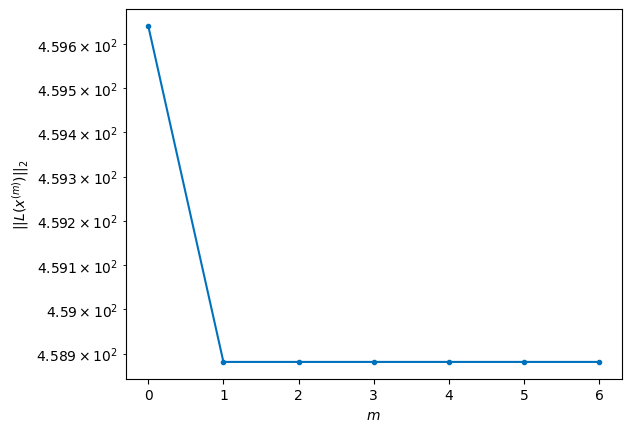

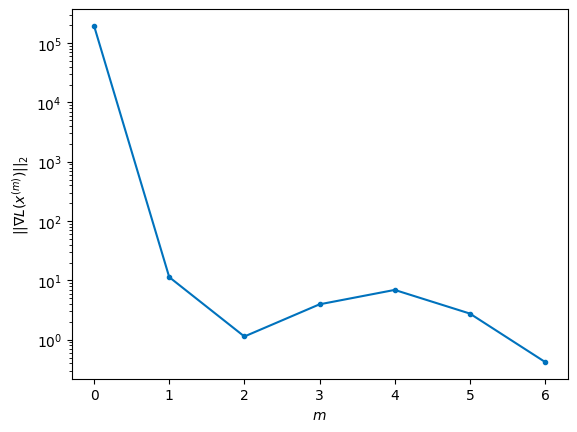


Windows:  72%|███████▏  | 214/296 [44:34<17:34, 12.86s/it]

Before applying the algorithm
Cost function: 457.08115311907284
Gradient norm: 97329.69424889924
Global relative error: 1893775696.4949772
Position relative errors: 0.03291636238389221 m, 0.4719593441074454 m, 1.122166203815173 m, 2.365203565493311 m

Iteration 1
Cost function: 456.78195903872944 (-0.07%)
Gradient norm: 10.737640473748138 (-99.99%)
Global relative error: 3.1875575286707094 (19.82%)
Position relative errors: 0.028060160454162517 m, 0.8161520772120151 m, 1.175467337792928 m, 2.848139547122409 m

STOP on Iteration 2
Cost function = 456.7819587456158 (-0.00%)
Gradient norm = 0.9049552826483431 (-91.57%)
Global relative error = 3.1875618978529197 (0.00%)
Final position relative errors: 0.028060167498246687 m, 0.8161837476347229 m, 1.1754943425496962 m, 2.8481242159458287 m



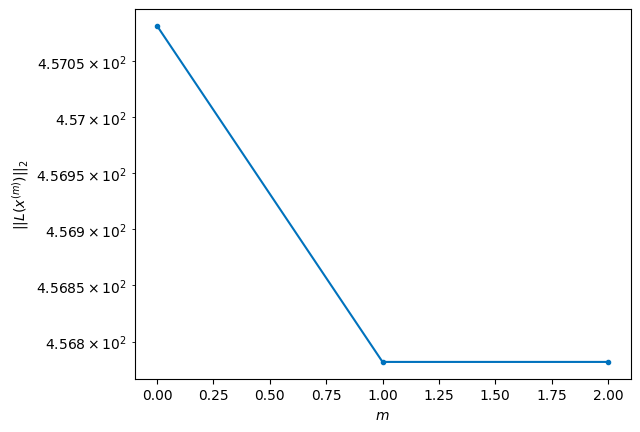

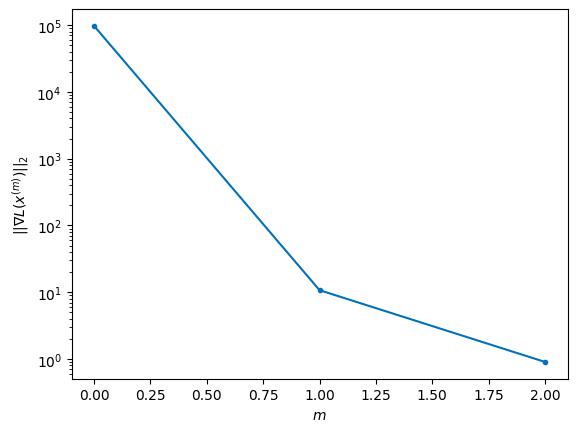


Windows:  73%|███████▎  | 215/296 [44:42<15:36, 11.56s/it]

Before applying the algorithm
Cost function: 454.92863756687024
Gradient norm: 237135.82414831032
Global relative error: 1894309638.8803885
Position relative errors: 0.027757633848505117 m, 0.8678926509182657 m, 1.1436630774223289 m, 3.0077808512196693 m

Iteration 1
Cost function: 454.5767711917979 (-0.08%)
Gradient norm: 3.975717181691026 (-100.00%)
Global relative error: 3.4008768612137703 (2.04%)
Position relative errors: 0.016566694456997735 m, 0.9617208148930343 m, 1.2411831884249211 m, 3.0166603914996823 m

STOP on Iteration 2
Cost function = 454.5767713063712 (0.00%)
Gradient norm = 0.32920652448707716 (-91.72%)
Global relative error = 3.4008954795128328 (0.00%)
Final position relative errors: 0.01656669588689466 m, 0.9617385448674204 m, 1.2411927192623307 m, 3.016671807321315 m



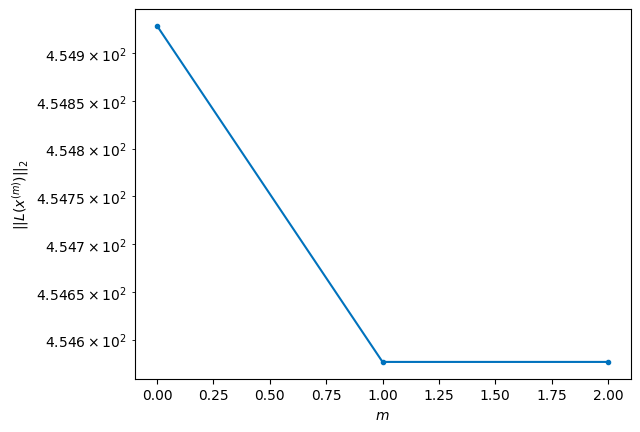

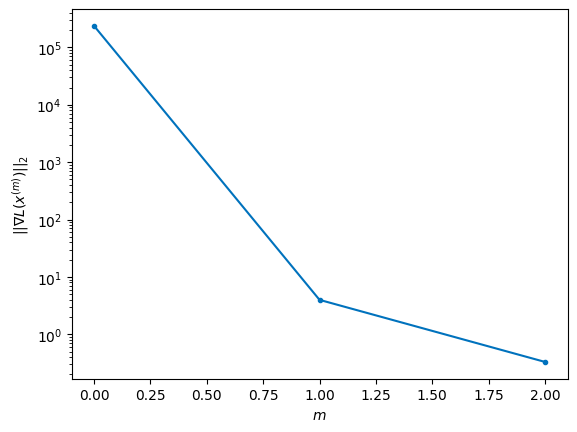


Windows:  73%|███████▎  | 216/296 [44:49<13:20, 10.01s/it]

Before applying the algorithm
Cost function: 453.97580423505434
Gradient norm: 119169.40017071545
Global relative error: 1894870350.3103554
Position relative errors: 0.017004552077664638 m, 0.9960981268678243 m, 1.199522332648803 m, 3.1469290978369377 m

Iteration 1
Cost function: 453.37573744041975 (-0.13%)
Gradient norm: 6.940742764196069 (-99.99%)
Global relative error: 3.92802442318676 (11.84%)
Position relative errors: 0.013610087221346684 m, 1.0767236548964527 m, 1.211700169968707 m, 3.577937312510543 m

Iteration 2
Cost function: 453.3757371957408 (-0.00%)
Gradient norm: 1.9377047460274788 (-72.08%)
Global relative error: 3.9279260224189416 (-0.00%)
Position relative errors: 0.01361008729294297 m, 1.0766771721180226 m, 1.211687632838984 m, 3.5778475175339355 m

Iteration 3
Cost function: 453.37573793705917 (0.00%)
Gradient norm: 1.9411591699741448 (0.18%)
Global relative error: 3.9279260212534606 (-0.00%)
Position relative errors: 0.013610089909317684 m, 1.0766771435290179 m, 1.

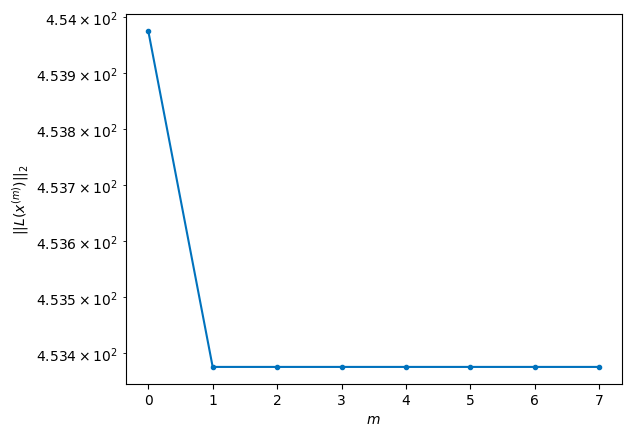

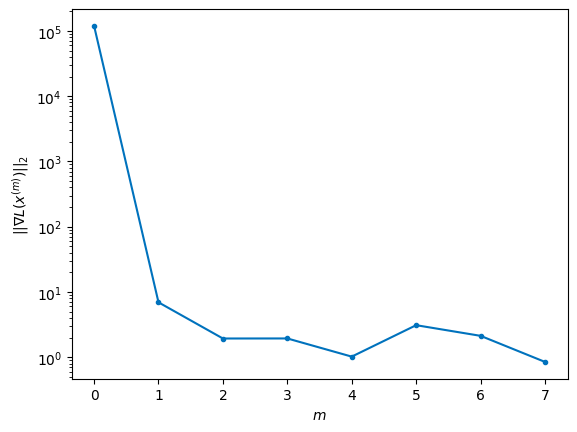


Windows:  73%|███████▎  | 217/296 [45:04<15:22, 11.68s/it]

Before applying the algorithm
Cost function: 457.6916093718014
Gradient norm: 109169.71390740662
Global relative error: 1895455299.5148182
Position relative errors: 0.014071543383053572 m, 1.110021450941675 m, 1.1691997468003612 m, 3.6764164274941575 m

Iteration 1
Cost function: 457.34372613519815 (-0.08%)
Gradient norm: 3.026442282560122 (-100.00%)
Global relative error: 4.285104352496403 (6.74%)
Position relative errors: 0.015468696841352136 m, 1.2655785851124068 m, 1.2128062421228456 m, 3.9101520944163277 m

Iteration 2
Cost function: 457.3437259702548 (-0.00%)
Gradient norm: 5.408687746894597 (78.71%)
Global relative error: 4.28514230306888 (0.00%)
Position relative errors: 0.015468697053380642 m, 1.265612260657502 m, 1.2128101951736097 m, 3.9101815583791892 m

Iteration 3
Cost function: 457.3437259293114 (-0.00%)
Gradient norm: 7.1192475071469055 (31.63%)
Global relative error: 4.285142335775577 (0.00%)
Position relative errors: 0.015468698793956636 m, 1.2656122821332647 m, 1.212

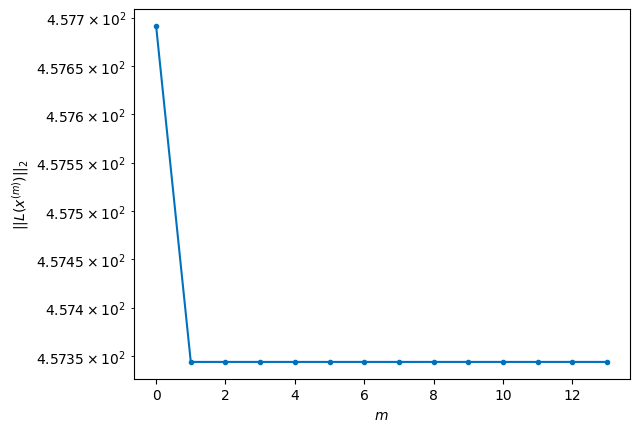

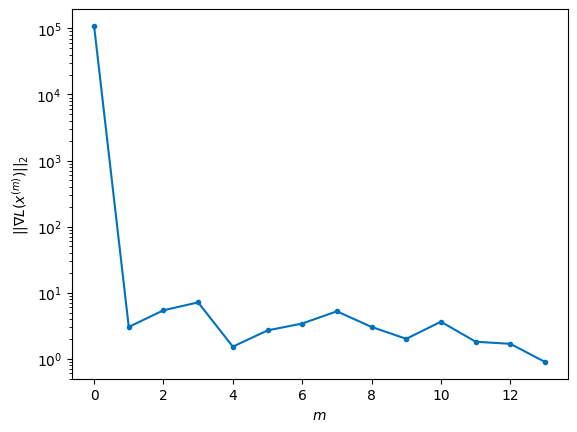


Windows:  74%|███████▎  | 218/296 [45:31<21:09, 16.27s/it]

Before applying the algorithm
Cost function: 457.095006228455
Gradient norm: 168053.92480246446
Global relative error: 1896061777.6926968
Position relative errors: 0.015823258788800438 m, 1.2879973452155868 m, 1.1598437495740963 m, 3.971421925882192 m

Iteration 1
Cost function: 456.6924942115234 (-0.09%)
Gradient norm: 1.2275042201039936 (-100.00%)
Global relative error: 4.193094174703694 (-3.23%)
Position relative errors: 0.014234380132811501 m, 1.24332439089621 m, 1.11360468790094 m, 3.8465391885532676 m

Iteration 2
Cost function: 456.6924938534405 (-0.00%)
Gradient norm: 1.053185014694907 (-14.20%)
Global relative error: 4.193073657007632 (-0.00%)
Position relative errors: 0.014234380065641202 m, 1.2433077264449555 m, 1.1136081845032073 m, 3.8465211964828687 m

STOP on Iteration 3
Cost function = 456.6924938425579 (-0.00%)
Gradient norm = 0.7297675668537523 (-30.71%)
Global relative error = 4.193073672986509 (0.00%)
Final position relative errors: 0.014234380471798546 m, 1.2433077

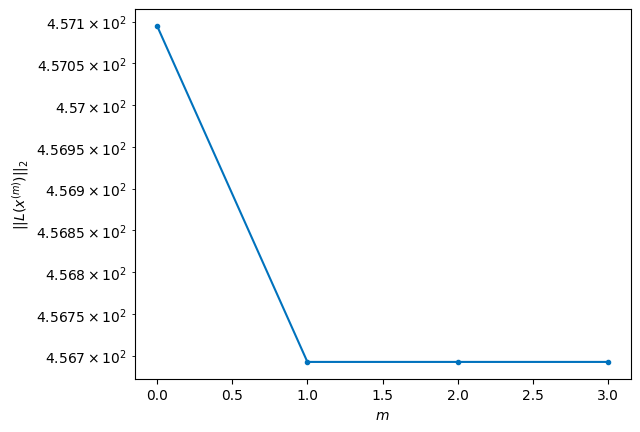

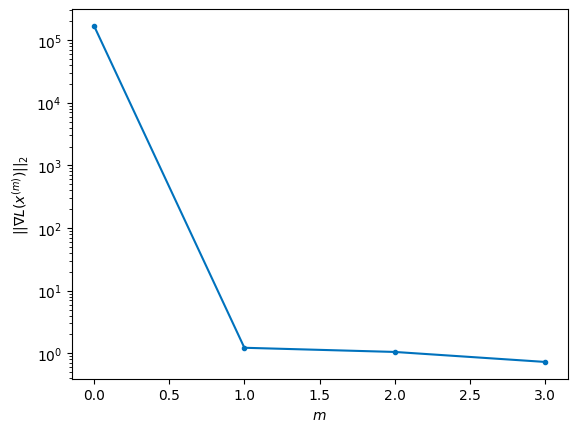


Windows:  74%|███████▍  | 219/296 [45:40<17:51, 13.91s/it]

Before applying the algorithm
Cost function: 453.2604094607343
Gradient norm: 67224.7091352311
Global relative error: 1896686976.6783943
Position relative errors: 0.014836733198116177 m, 1.2513643470601863 m, 1.0587162556552567 m, 3.8838002639897793 m

Iteration 1
Cost function: 452.35837028969985 (-0.20%)
Gradient norm: 22.2612814409309 (-99.97%)
Global relative error: 4.391421465481037 (4.17%)
Position relative errors: 0.02332471004311773 m, 1.6102950829826366 m, 1.141505141466398 m, 3.922748118777418 m

Iteration 2
Cost function: 452.3583707325433 (0.00%)
Gradient norm: 3.6770143685138805 (-83.48%)
Global relative error: 4.391450348078222 (0.00%)
Position relative errors: 0.0233247080406015 m, 1.6103967768140273 m, 1.1415081223544177 m, 3.9227378380167672 m

Iteration 3
Cost function: 452.35837034935844 (-0.00%)
Gradient norm: 1.9991799689351397 (-45.63%)
Global relative error: 4.391450314959439 (-0.00%)
Position relative errors: 0.023324713165724827 m, 1.6103967814961402 m, 1.14150

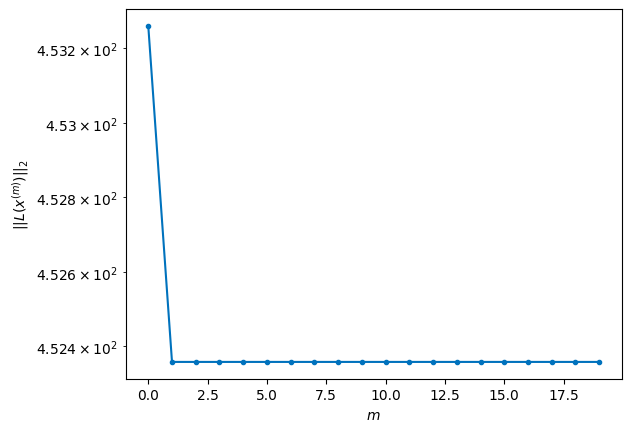

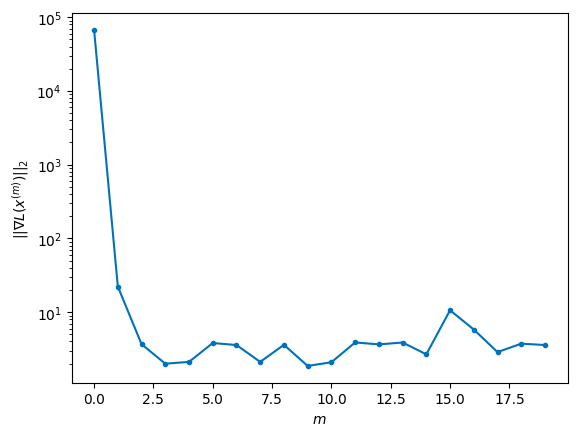


Windows:  74%|███████▍  | 220/296 [46:18<26:54, 21.25s/it]

Before applying the algorithm
Cost function: 454.4445632902368
Gradient norm: 193981.92576578425
Global relative error: 1897327941.890016
Position relative errors: 0.023450843495039436 m, 1.5678269087881385 m, 1.0832428783751773 m, 3.905992211462186 m

Iteration 1
Cost function: 454.2308968442117 (-0.05%)
Gradient norm: 6.782590617359082 (-100.00%)
Global relative error: 4.6962731065394125 (8.06%)
Position relative errors: 0.018871107602411143 m, 1.7249994245924223 m, 1.1350412880022231 m, 4.217900086012354 m

Iteration 2
Cost function: 454.23089685056664 (0.00%)
Gradient norm: 1.4254829485457807 (-78.98%)
Global relative error: 4.696262802028599 (-0.00%)
Position relative errors: 0.01887110773240052 m, 1.7250091925097961 m, 1.1350449947839654 m, 4.217883620486104 m

Iteration 3
Cost function: 454.2308966105037 (-0.00%)
Gradient norm: 1.239249234464477 (-13.06%)
Global relative error: 4.696262802263282 (0.00%)
Position relative errors: 0.01887110752609765 m, 1.7250091839362391 m, 1.135

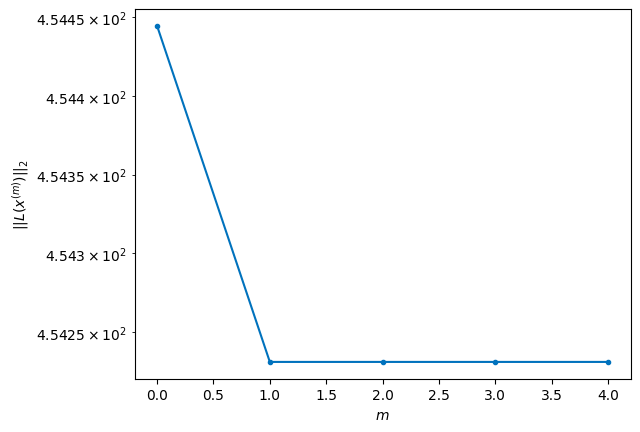

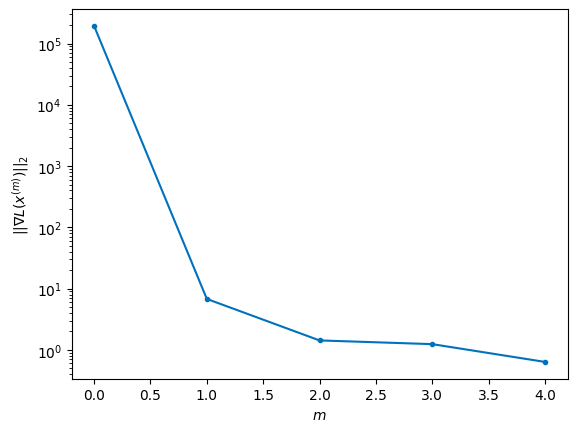


Windows:  75%|███████▍  | 221/296 [46:28<22:28, 17.98s/it]

Before applying the algorithm
Cost function: 455.2647723978189
Gradient norm: 126546.7914742516
Global relative error: 1897981616.3792605
Position relative errors: 0.01930109448431983 m, 1.6728740236066428 m, 1.069263859328757 m, 4.179361450687553 m

Iteration 1
Cost function: 454.85760411736175 (-0.09%)
Gradient norm: 4.745490182508017 (-100.00%)
Global relative error: 4.6390360164734 (0.26%)
Position relative errors: 0.01842297986581152 m, 1.67935858280854 m, 1.1827998878838852 m, 4.159453304958109 m

Iteration 2
Cost function: 454.857603942923 (-0.00%)
Gradient norm: 2.3931996154513544 (-49.57%)
Global relative error: 4.639044178761532 (0.00%)
Position relative errors: 0.018422980703708767 m, 1.6793708855084386 m, 1.1828006082844735 m, 4.15945723631821 m

Iteration 3
Cost function: 454.85760403664557 (0.00%)
Gradient norm: 1.0705137809604144 (-55.27%)
Global relative error: 4.639044178896178 (0.00%)
Position relative errors: 0.018422979586106905 m, 1.6793708813044155 m, 1.1828006308

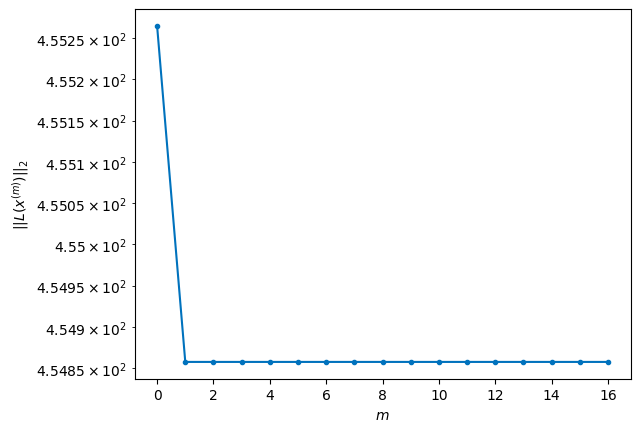

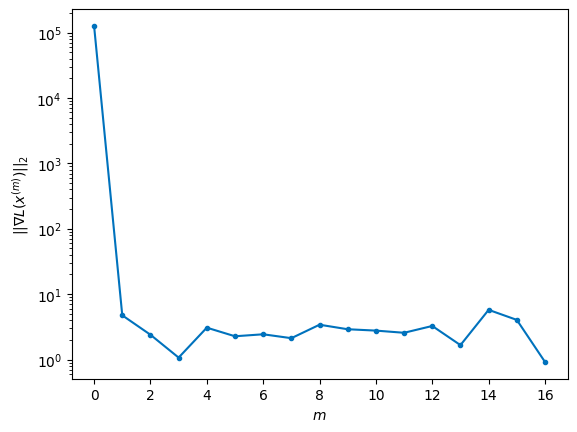


Windows:  75%|███████▌  | 222/296 [47:01<27:36, 22.39s/it]

Before applying the algorithm
Cost function: 455.7814113619062
Gradient norm: 47582.27821925771
Global relative error: 1898644862.1865585
Position relative errors: 0.018787097173919756 m, 1.6365237227504974 m, 1.0985172827122431 m, 4.100253511276262 m

Iteration 1
Cost function: 455.07174309529233 (-0.16%)
Gradient norm: 21.6428992892261 (-99.95%)
Global relative error: 5.5351974541558615 (21.67%)
Position relative errors: 0.018699386199918778 m, 2.121925261194648 m, 1.0193861111645999 m, 5.009625002887005 m

STOP on Iteration 2
Cost function = 455.0717429496361 (-0.00%)
Gradient norm = 0.2575976576923469 (-98.81%)
Global relative error = 5.534634321271192 (-0.01%)
Final position relative errors: 0.01869938744030048 m, 2.1215388642803386 m, 1.0194202750817618 m, 5.0091594994494 m



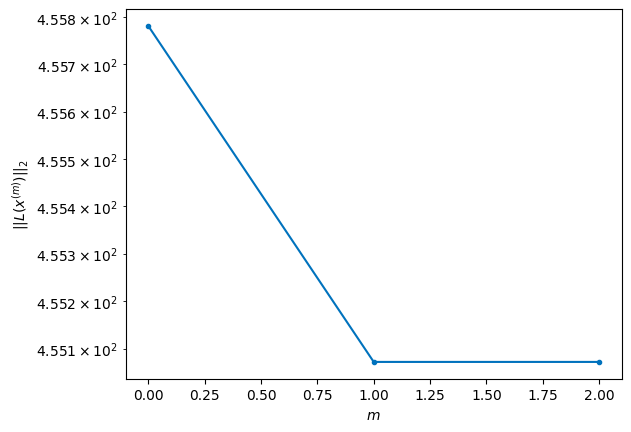

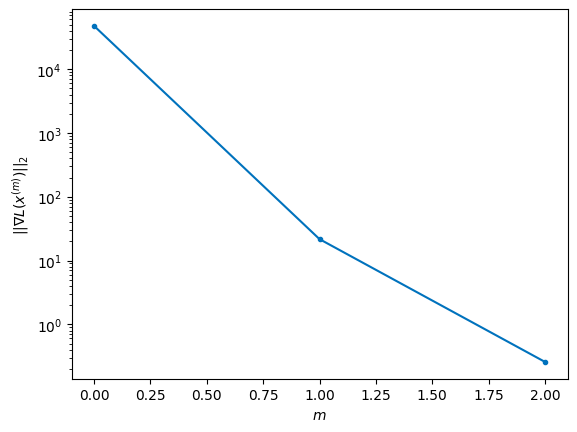


Windows:  75%|███████▌  | 223/296 [47:08<21:26, 17.62s/it]

Before applying the algorithm
Cost function: 458.62783449693706
Gradient norm: 151308.69436005937
Global relative error: 1899314480.582763
Position relative errors: 0.018965402322872617 m, 2.077390938692325 m, 0.9425321917929553 m, 4.92421899649472 m

Iteration 1
Cost function: 457.9709882715661 (-0.14%)
Gradient norm: 18.023104991552827 (-99.99%)
Global relative error: 5.168539087238486 (-4.76%)
Position relative errors: 0.01805980871411021 m, 2.152848439475613 m, 1.0372978632676206 m, 4.582872885998247 m

STOP on Iteration 2
Cost function = 457.97098820230815 (-0.00%)
Gradient norm = 0.1405564284821802 (-99.22%)
Global relative error = 5.168608419793561 (0.00%)
Final position relative errors: 0.018059809844304928 m, 2.1529141620141283 m, 1.037310926198783 m, 4.582917248215962 m



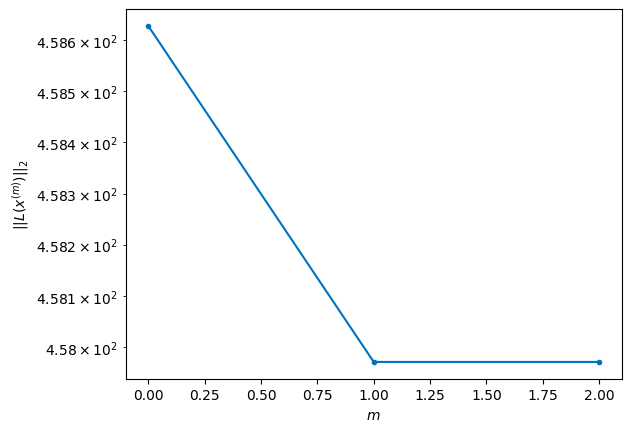

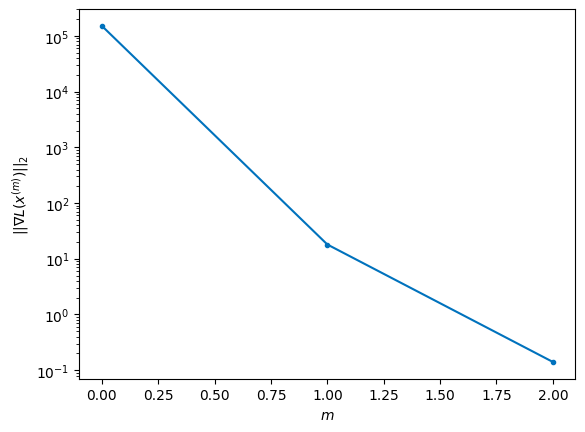


Windows:  76%|███████▌  | 224/296 [47:14<17:01, 14.18s/it]

Before applying the algorithm
Cost function: 456.1794715224028
Gradient norm: 86540.3501366351
Global relative error: 1899987211.5752504
Position relative errors: 0.018187064215632424 m, 2.1172982938313076 m, 0.9522767942967465 m, 4.523071990195369 m

Iteration 1
Cost function: 455.84592065712644 (-0.07%)
Gradient norm: 3.117595830331746 (-100.00%)
Global relative error: 5.122577255528844 (0.76%)
Position relative errors: 0.01688170361802907 m, 2.1798288571275912 m, 0.9536114750233993 m, 4.536461227149585 m

Iteration 2
Cost function: 455.8459209128434 (0.00%)
Gradient norm: 6.002201913463932 (92.53%)
Global relative error: 5.122620295270998 (0.00%)
Position relative errors: 0.016881702285044885 m, 2.179874570981122 m, 0.9536087078448272 m, 4.5364884431725025 m

Iteration 3
Cost function: 455.8459201412506 (-0.00%)
Gradient norm: 9.287791998939754 (54.74%)
Global relative error: 5.1226202751441035 (-0.00%)
Position relative errors: 0.01688170421344345 m, 2.1798745682314906 m, 0.9536087

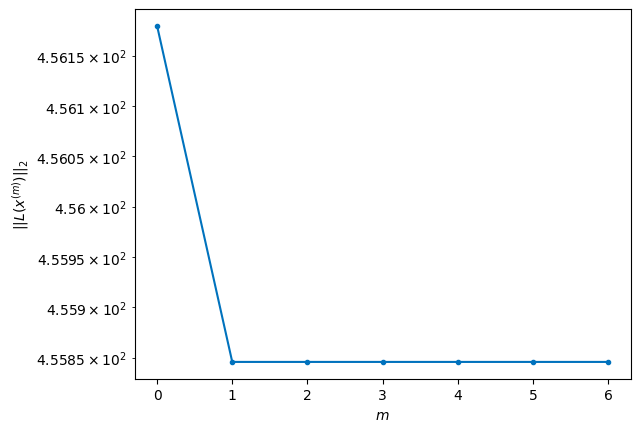

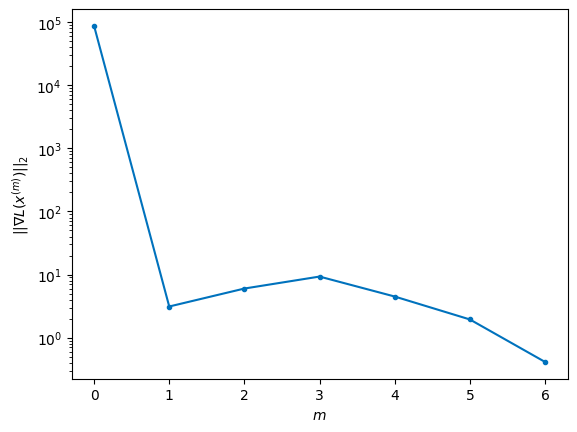


Windows:  76%|███████▌  | 225/296 [47:27<16:37, 14.04s/it]

Before applying the algorithm
Cost function: 458.05870649983467
Gradient norm: 181834.7150374185
Global relative error: 1900659763.7874026
Position relative errors: 0.01695476312458756 m, 2.154027024729274 m, 0.8580298385194088 m, 4.467728830480998 m

Iteration 1
Cost function: 457.85405202875273 (-0.04%)
Gradient norm: 2.9837719541484744 (-100.00%)
Global relative error: 4.962047938154148 (-1.42%)
Position relative errors: 0.012860908190554004 m, 2.0844452658294355 m, 0.9291252799498441 m, 4.406082575381733 m

STOP on Iteration 2
Cost function = 457.8540521512747 (0.00%)
Gradient norm = 0.9979857960867083 (-66.55%)
Global relative error = 4.962044797348506 (-0.00%)
Final position relative errors: 0.012860908247307963 m, 2.0844357105242346 m, 0.9291299295787261 m, 4.406082578218815 m



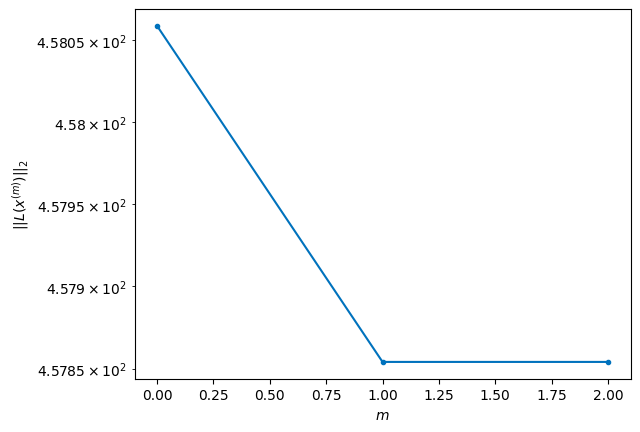

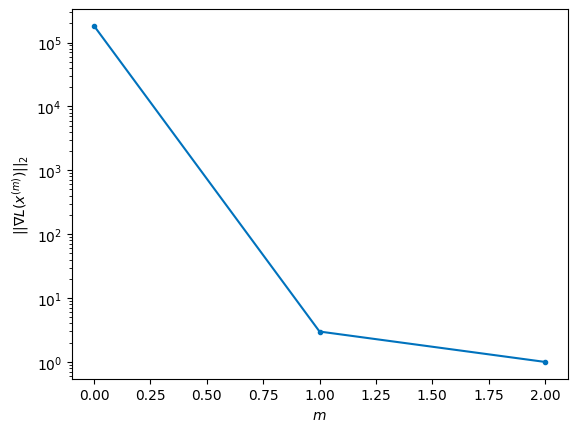


Windows:  76%|███████▋  | 226/296 [47:34<13:44, 11.78s/it]

Before applying the algorithm
Cost function: 461.2860942657035
Gradient norm: 300743.354189475
Global relative error: 1901328842.8447688
Position relative errors: 0.013018736281913012 m, 2.0410116478369242 m, 0.8240178852734925 m, 4.326260122481087 m

Iteration 1
Cost function: 460.1640291075103 (-0.24%)
Gradient norm: 29.176391056362917 (-99.99%)
Global relative error: 3.941414251552858 (-18.80%)
Position relative errors: 0.013966431279587155 m, 1.5669857471553363 m, 1.021080128233094 m, 3.469365198465582 m

STOP on Iteration 2
Cost function = 460.16402940343386 (0.00%)
Gradient norm = 0.2736827434401528 (-99.06%)
Global relative error = 3.941060862811475 (-0.01%)
Final position relative errors: 0.01396643006367895 m, 1.566692100180728 m, 1.0211158480247917 m, 3.4690858378471185 m



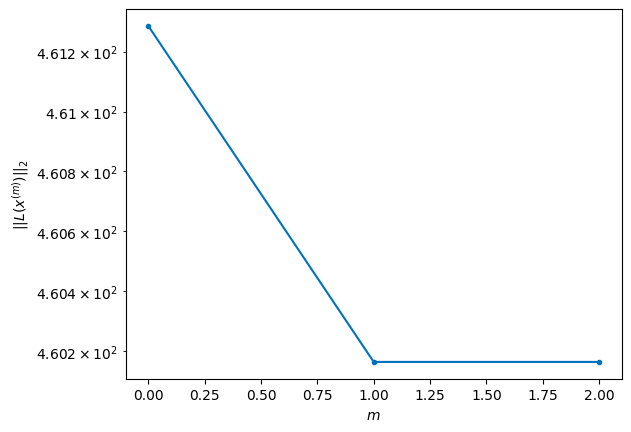

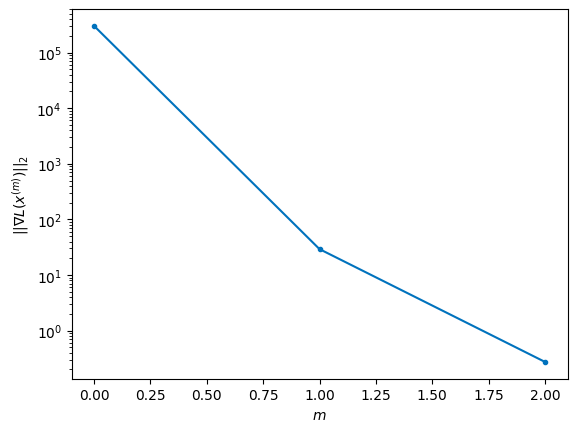


Windows:  77%|███████▋  | 227/296 [47:40<11:39, 10.14s/it]

Before applying the algorithm
Cost function: 460.11438297938497
Gradient norm: 212020.17945329344
Global relative error: 1901991165.330499
Position relative errors: 0.014039645373495597 m, 1.5109643949066305 m, 0.8840617313104593 m, 3.390441104801097 m

Iteration 1
Cost function: 459.44822347358195 (-0.14%)
Gradient norm: 12.131865403395445 (-99.99%)
Global relative error: 4.5311657108777155 (18.75%)
Position relative errors: 0.016300044980722243 m, 1.8649676758309728 m, 0.9535053857687922 m, 4.01794859889897 m

Iteration 2
Cost function: 459.44822341452806 (-0.00%)
Gradient norm: 1.7814699129333693 (-85.32%)
Global relative error: 4.530923213562908 (-0.01%)
Position relative errors: 0.01630004768800254 m, 1.8647420449031602 m, 0.953509915813306 m, 4.0177787780673615 m

Iteration 3
Cost function: 459.4482236507912 (0.00%)
Gradient norm: 3.505720887793453 (96.79%)
Global relative error: 4.530923213642749 (0.00%)
Position relative errors: 0.016300046475887068 m, 1.8647420417127365 m, 0.9

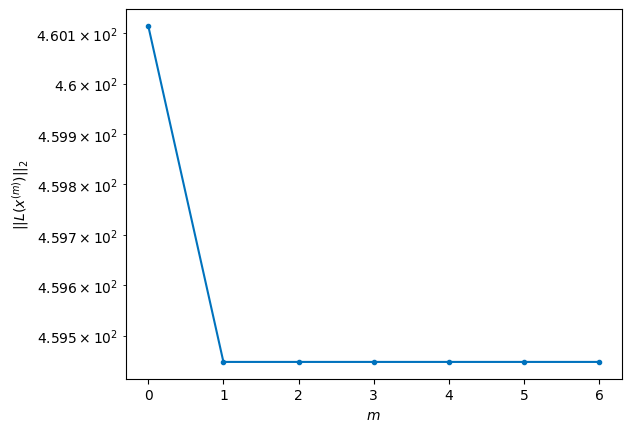

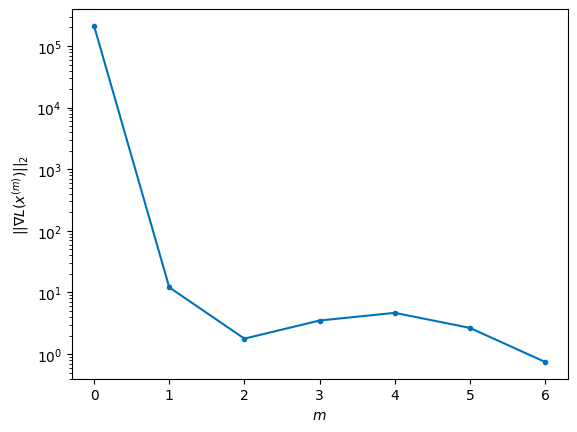


Windows:  77%|███████▋  | 228/296 [47:54<12:46, 11.27s/it]

Before applying the algorithm
Cost function: 458.0970807595291
Gradient norm: 92203.67047680418
Global relative error: 1902643484.7455122
Position relative errors: 0.016411511352755453 m, 1.8182745990676439 m, 0.8099231768307398 m, 3.9113664239044295 m

Iteration 1
Cost function: 457.9825466310084 (-0.03%)
Gradient norm: 1.7258625154893539 (-100.00%)
Global relative error: 4.2042808527282425 (-4.20%)
Position relative errors: 0.01403493871087652 m, 1.8375881649360375 m, 0.7717093122672354 m, 3.701824637787701 m

Iteration 2
Cost function: 457.98254645221806 (-0.00%)
Gradient norm: 1.723515721925443 (-0.14%)
Global relative error: 4.204279182469151 (-0.00%)
Position relative errors: 0.014034939016582799 m, 1.837591799674636 m, 0.7717120653855943 m, 3.7018203625796993 m

STOP on Iteration 3
Cost function = 457.9825466478788 (0.00%)
Gradient norm = 0.742669845934854 (-56.91%)
Global relative error = 4.20427916176745 (-0.00%)
Final position relative errors: 0.014034939221638842 m, 1.837591

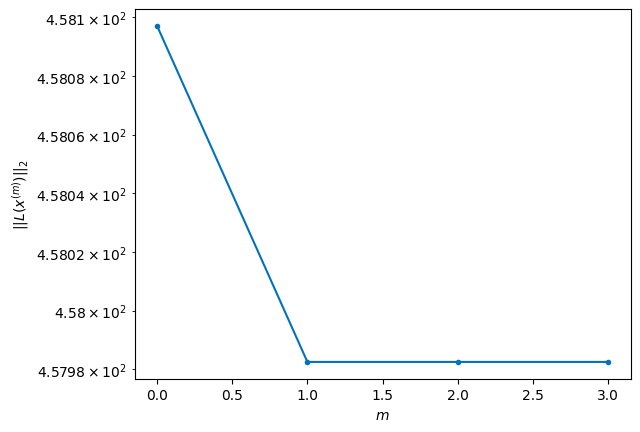

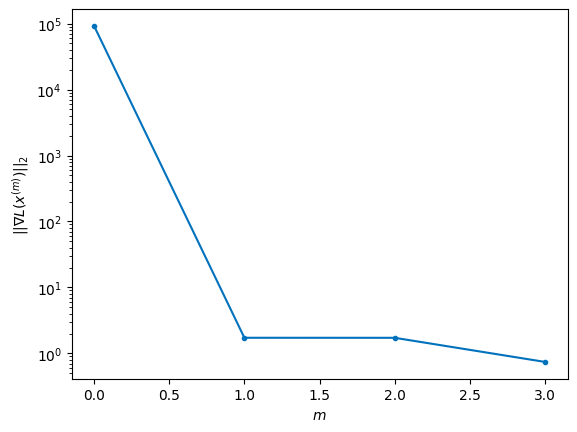


Windows:  77%|███████▋  | 229/296 [48:03<11:35, 10.38s/it]

Before applying the algorithm
Cost function: 457.606756073285
Gradient norm: 199184.97266176523
Global relative error: 1903282604.8730154
Position relative errors: 0.014120728937650312 m, 1.7859952667662355 m, 0.6375661696349209 m, 3.5891429247868083 m

Iteration 1
Cost function: 457.2091069959582 (-0.09%)
Gradient norm: 2.3665082010368055 (-100.00%)
Global relative error: 3.7984013899271294 (-6.43%)
Position relative errors: 0.01028769291699497 m, 1.7186528553415887 m, 0.6504018526478571 m, 3.32429617322421 m

Iteration 2
Cost function: 457.2091067052776 (-0.00%)
Gradient norm: 1.9788577672225873 (-16.38%)
Global relative error: 3.7983905526534985 (-0.00%)
Position relative errors: 0.010287692444665847 m, 1.7186616666677246 m, 0.6504041542289857 m, 3.3242787845824675 m

Iteration 3
Cost function: 457.20910688938926 (0.00%)
Gradient norm: 1.71511952308162 (-13.33%)
Global relative error: 3.798390589944024 (0.00%)
Position relative errors: 0.01028769104901292 m, 1.718661702641725 m, 0.6

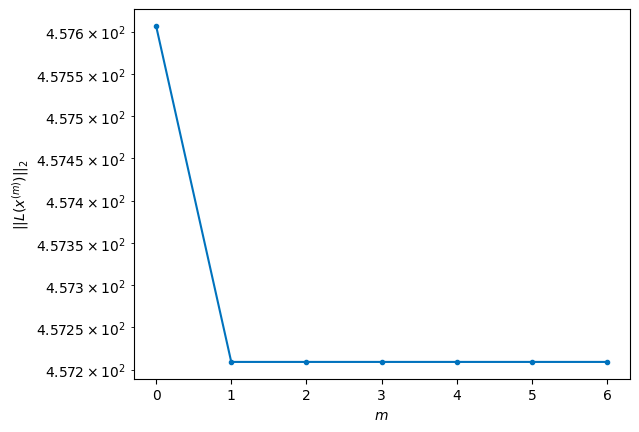

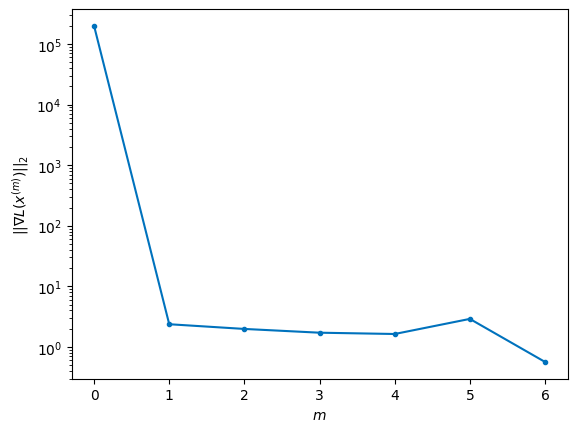


Windows:  78%|███████▊  | 230/296 [48:16<12:35, 11.45s/it]

Before applying the algorithm
Cost function: 455.7074815013339
Gradient norm: 304027.84908391134
Global relative error: 1903905394.964777
Position relative errors: 0.010190218035656525 m, 1.664060198346107 m, 0.5192598470274811 m, 3.1869302465597102 m

Iteration 1
Cost function: 454.9023695419192 (-0.18%)
Gradient norm: 14.465627802249776 (-100.00%)
Global relative error: 2.8188901388659042 (-22.40%)
Position relative errors: 0.019737724579529173 m, 1.0971901724315245 m, 0.45287043685912515 m, 2.55672089399517 m

STOP on Iteration 2
Cost function = 454.9023695349429 (-0.00%)
Gradient norm = 0.7448607896722895 (-94.85%)
Global relative error = 2.818484803226698 (-0.01%)
Final position relative errors: 0.019737727331178113 m, 1.0967988324362 m, 0.45287671711450866 m, 2.5564408082765397 m



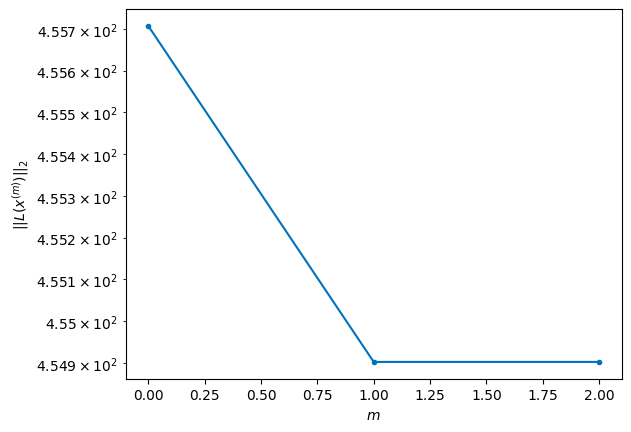

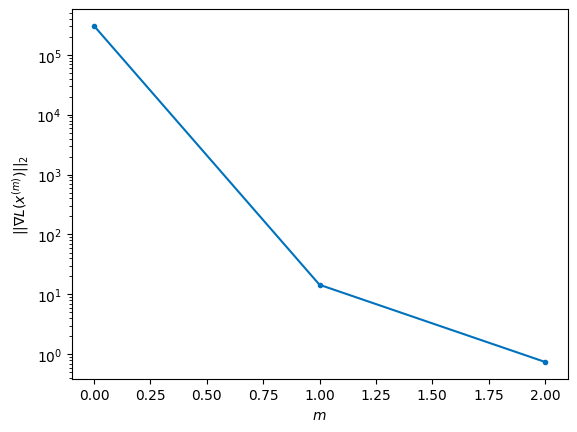


Windows:  78%|███████▊  | 231/296 [48:26<11:39, 10.76s/it]

Before applying the algorithm
Cost function: 455.69759326950685
Gradient norm: 134665.78089498388
Global relative error: 1904508835.5980082
Position relative errors: 0.019725384480832924 m, 1.033814890025103 m, 0.3434254735603282 m, 2.409729042098564 m

Iteration 1
Cost function: 455.1321646167545 (-0.12%)
Gradient norm: 28.165525689438102 (-99.98%)
Global relative error: 1.693287269535881 (-35.97%)
Position relative errors: 0.015614147504330165 m, 0.3399259800644622 m, 0.31225522897652375 m, 1.6290838727143806 m

Iteration 2
Cost function: 455.13216452921137 (-0.00%)
Gradient norm: 3.620430958820672 (-87.15%)
Global relative error: 1.693149755676908 (-0.01%)
Position relative errors: 0.015614147128941398 m, 0.33976578103499017 m, 0.3122609572466739 m, 1.6289732622944455 m

STOP on Iteration 3
Cost function = 455.1321641230183 (-0.00%)
Gradient norm = 0.931736892666873 (-74.26%)
Global relative error = 1.6931497414509669 (-0.00%)
Final position relative errors: 0.01561414606891437 m, 0

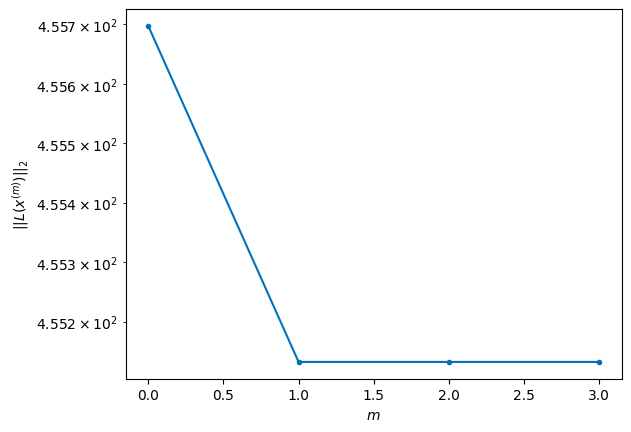

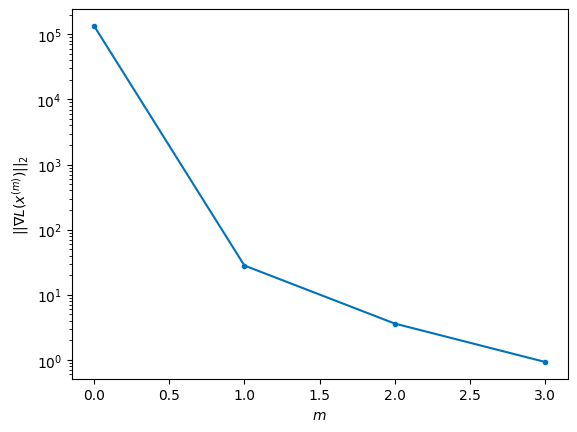


Windows:  78%|███████▊  | 232/296 [48:34<10:43, 10.06s/it]

Before applying the algorithm
Cost function: 457.7445922646014
Gradient norm: 175236.85867402807
Global relative error: 1905089994.7739162
Position relative errors: 0.01575615128653515 m, 0.28134130438740296 m, 0.3014762192770269 m, 1.4898448656764727 m

Iteration 1
Cost function: 457.2376626863152 (-0.11%)
Gradient norm: 15.361722844976684 (-99.99%)
Global relative error: 1.0378894612370353 (-32.86%)
Position relative errors: 0.01129973961838188 m, 0.17770578148180682 m, 0.28485399530389116 m, 0.9820171680404178 m

Iteration 2
Cost function: 457.2376627913208 (0.00%)
Gradient norm: 3.7164753887485382 (-75.81%)
Global relative error: 1.0379579597597812 (0.01%)
Position relative errors: 0.011299740245532 m, 0.17762620948858351 m, 0.28484510650738404 m, 0.9821065364677689 m

Iteration 3
Cost function: 457.23766271723713 (-0.00%)
Gradient norm: 4.318001950089549 (16.19%)
Global relative error: 1.037957959981975 (0.00%)
Position relative errors: 0.011299742154775467 m, 0.17762621069702242 

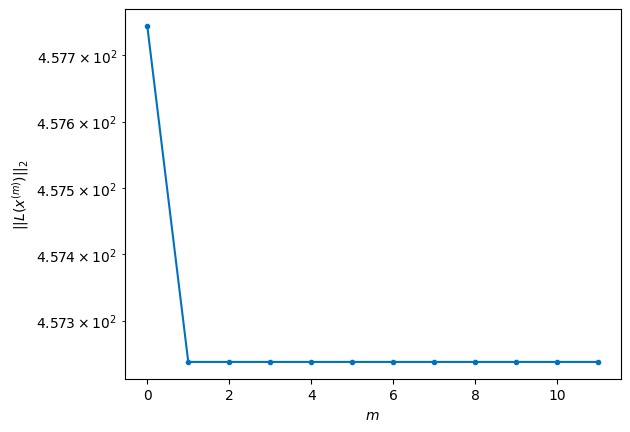

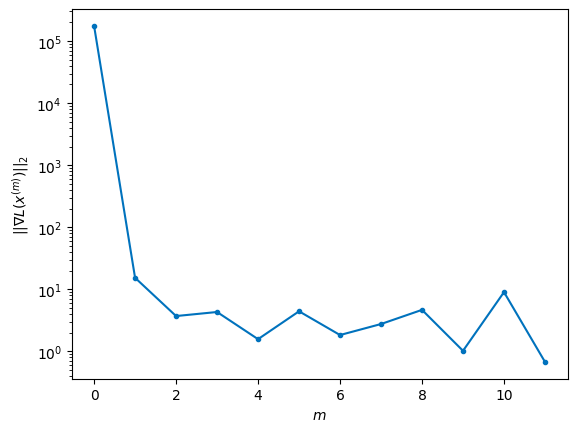


Windows:  79%|███████▊  | 233/296 [48:57<14:45, 14.06s/it]

Before applying the algorithm
Cost function: 452.7258667847609
Gradient norm: 177856.28618928412
Global relative error: 1905646081.1928105
Position relative errors: 0.01142238990431524 m, 0.22440668309423925 m, 0.3686164820304406 m, 0.8774505646235844 m

Iteration 1
Cost function: 450.7803912102243 (-0.43%)
Gradient norm: 33.19057338779997 (-99.98%)
Global relative error: 1.3867961651657528 (41.81%)
Position relative errors: 0.011854366737424066 m, 0.3565429626644763 m, 0.6555648304193173 m, 1.1688301816586746 m

Iteration 2
Cost function: 450.78039075454654 (-0.00%)
Gradient norm: 4.7898293475564255 (-85.57%)
Global relative error: 1.3877554151119256 (0.07%)
Position relative errors: 0.011854360253762956 m, 0.35731703369036527 m, 0.6561701335626929 m, 1.169392535909698 m

Iteration 3
Cost function: 450.78039077943487 (0.00%)
Gradient norm: 4.454413823883275 (-7.00%)
Global relative error: 1.3877554120919737 (-0.00%)
Position relative errors: 0.011854361675272328 m, 0.3573170214181556 

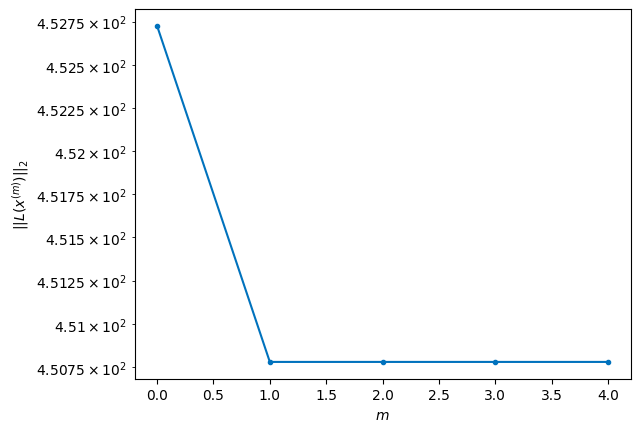

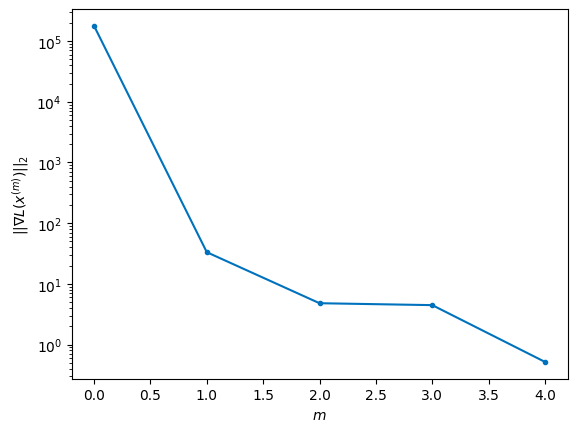


Windows:  79%|███████▉  | 234/296 [49:08<13:26, 13.01s/it]

Before applying the algorithm
Cost function: 453.66712463686343
Gradient norm: 50900.475401501186
Global relative error: 1906174449.2896976
Position relative errors: 0.011149998919277475 m, 0.2865963928144634 m, 0.5099483394569935 m, 1.0628329120363855 m

Iteration 1
Cost function: 453.279286709041 (-0.09%)
Gradient norm: 12.449746297682957 (-99.98%)
Global relative error: 1.3724229124177587 (13.12%)
Position relative errors: 0.01582088135384525 m, 0.723065566477775 m, 0.26232505094514547 m, 1.1365058255062144 m

STOP on Iteration 2
Cost function = 453.27928651650456 (-0.00%)
Gradient norm = 0.20490958496443148 (-98.35%)
Global relative error = 1.3724437697805418 (0.00%)
Final position relative errors: 0.01582088344902581 m, 0.7230807347392739 m, 0.26237992035054053 m, 1.136508695763092 m



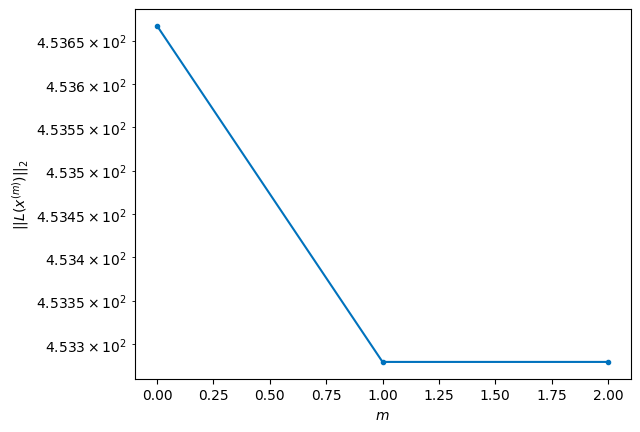

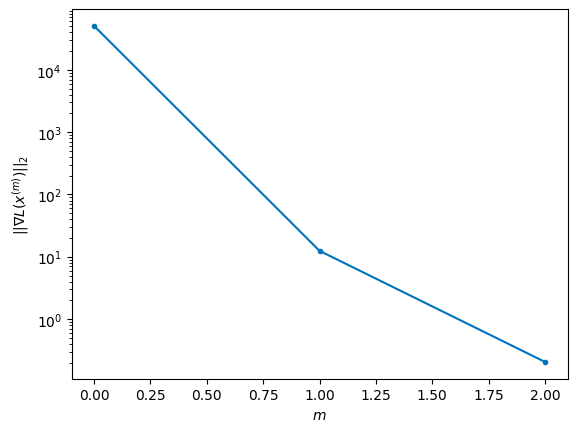


Windows:  79%|███████▉  | 235/296 [49:15<11:14, 11.06s/it]

Before applying the algorithm
Cost function: 452.6683441698045
Gradient norm: 129266.60103194903
Global relative error: 1906672607.6238031
Position relative errors: 0.014949572978022175 m, 0.6482892919846609 m, 0.14206378254711116 m, 1.0257455622710743 m

Iteration 1
Cost function: 451.6872399722671 (-0.22%)
Gradient norm: 28.388803317034068 (-99.98%)
Global relative error: 1.068231909387599 (-12.57%)
Position relative errors: 0.00964800994195678 m, 0.20679942484529634 m, 0.9449388164773419 m, 0.4531470468825823 m

Iteration 2
Cost function: 451.6872391177609 (-0.00%)
Gradient norm: 3.9184597546320488 (-86.20%)
Global relative error: 1.0672745177553802 (-0.09%)
Position relative errors: 0.009648009189766205 m, 0.2068140702720386 m, 0.9437817997305962 m, 0.4532956541234567 m

Iteration 3
Cost function: 451.6872391627118 (0.00%)
Gradient norm: 6.282293050027498 (60.33%)
Global relative error: 1.0672745258182814 (0.00%)
Position relative errors: 0.009648005909734051 m, 0.20681406377733977

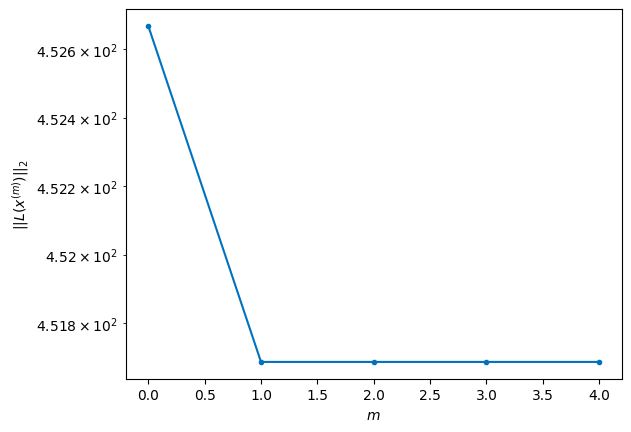

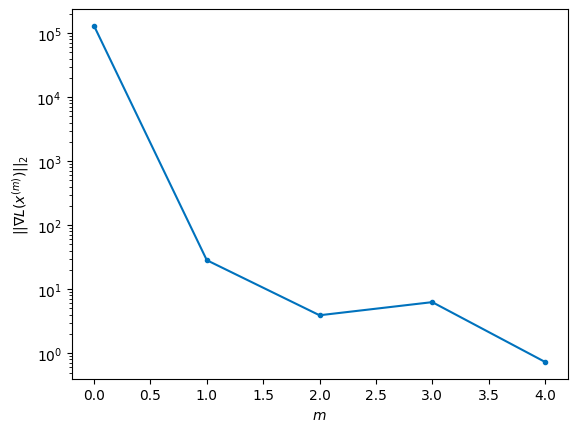


Windows:  80%|███████▉  | 236/296 [49:25<10:50, 10.84s/it]

Before applying the algorithm
Cost function: 454.2522363501222
Gradient norm: 153850.80248506682
Global relative error: 1907138247.8548653
Position relative errors: 0.009556140565125304 m, 0.21238639525171274 m, 1.0579544983033313 m, 0.4295161437735917 m

Iteration 1
Cost function: 453.3781455501774 (-0.19%)
Gradient norm: 20.512048128696012 (-99.99%)
Global relative error: 1.8200783134454563 (56.71%)
Position relative errors: 0.009579812929720391 m, 0.34461299517955735 m, 1.5814691973396389 m, 0.8323358128609322 m

Iteration 2
Cost function: 453.3781454415194 (-0.00%)
Gradient norm: 9.85571869280044 (-51.95%)
Global relative error: 1.8200556435296125 (-0.00%)
Position relative errors: 0.00957980621783005 m, 0.3446214442799537 m, 1.5814487991061363 m, 0.8323214988133737 m

Iteration 3
Cost function: 453.3781454873069 (0.00%)
Gradient norm: 10.251768384831474 (4.02%)
Global relative error: 1.8200556374886974 (-0.00%)
Position relative errors: 0.009579815230744184 m, 0.34462143006335266 

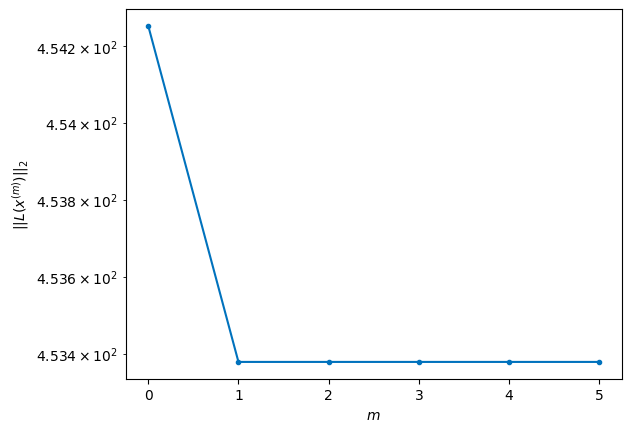

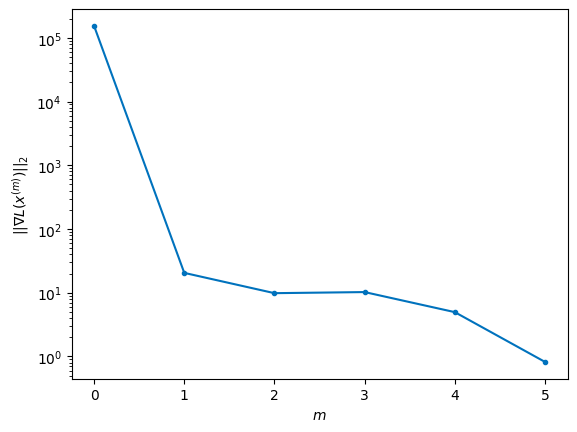


Windows:  80%|████████  | 237/296 [49:37<11:05, 11.28s/it]

Before applying the algorithm
Cost function: 453.4650795336057
Gradient norm: 333742.4883356988
Global relative error: 1907569257.4216535
Position relative errors: 0.009268598083561676 m, 0.3219801164556081 m, 1.677876329986304 m, 0.8984151308170534 m

Iteration 1
Cost function: 452.6040386650705 (-0.19%)
Gradient norm: 27.746107950248035 (-99.99%)
Global relative error: 1.2550040179441893 (-34.99%)
Position relative errors: 0.02111456625178196 m, 0.31490268823290757 m, 0.9398475411792865 m, 0.7694829652507869 m

Iteration 2
Cost function: 452.6040386047602 (-0.00%)
Gradient norm: 2.303935685329927 (-91.70%)
Global relative error: 1.2552730878485692 (0.02%)
Position relative errors: 0.02111456393343766 m, 0.31487962474646813 m, 0.940094132385656 m, 0.7696300543290299 m

Iteration 3
Cost function: 452.60403857045594 (-0.00%)
Gradient norm: 4.403950205282387 (91.15%)
Global relative error: 1.2552730974683695 (0.00%)
Position relative errors: 0.021114566085118833 m, 0.3148796304747472 m, 

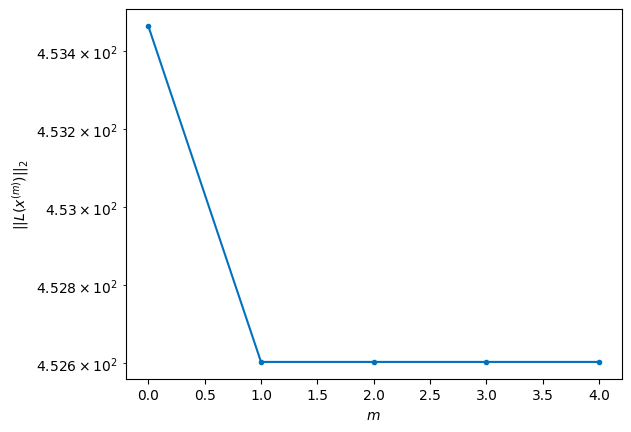

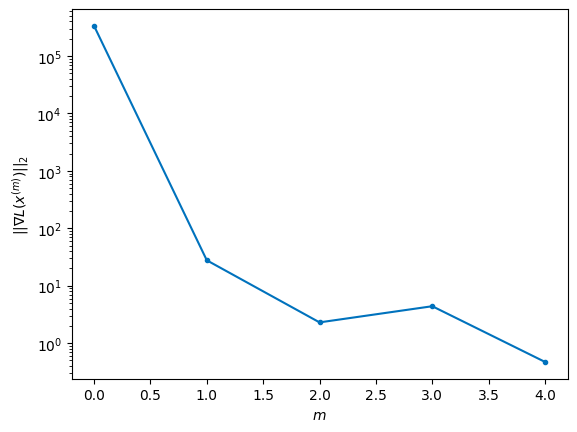


Windows:  80%|████████  | 238/296 [49:47<10:35, 10.95s/it]

Before applying the algorithm
Cost function: 461.74235931395253
Gradient norm: 143134.88009364903
Global relative error: 1907963703.2233818
Position relative errors: 0.020934247645766884 m, 0.31272891278783693 m, 1.0313762287415502 m, 0.845971521665366 m

Iteration 1
Cost function: 461.50713235956886 (-0.05%)
Gradient norm: 9.85790458987759 (-99.99%)
Global relative error: 1.1572166322272792 (-15.55%)
Position relative errors: 0.014584131916383776 m, 0.4605290426687965 m, 0.9558983833642479 m, 0.4616286872539876 m

Iteration 2
Cost function: 461.5071322820931 (-0.00%)
Gradient norm: 2.3434213802332664 (-76.23%)
Global relative error: 1.1572115127002556 (-0.00%)
Position relative errors: 0.014584132191734621 m, 0.4605109410418991 m, 0.9558972799307365 m, 0.46163619618855667 m

STOP on Iteration 3
Cost function = 461.5071321266181 (-0.00%)
Gradient norm = 0.7792613074395588 (-66.75%)
Global relative error = 1.1572115383364436 (0.00%)
Final position relative errors: 0.014584131123271973 m

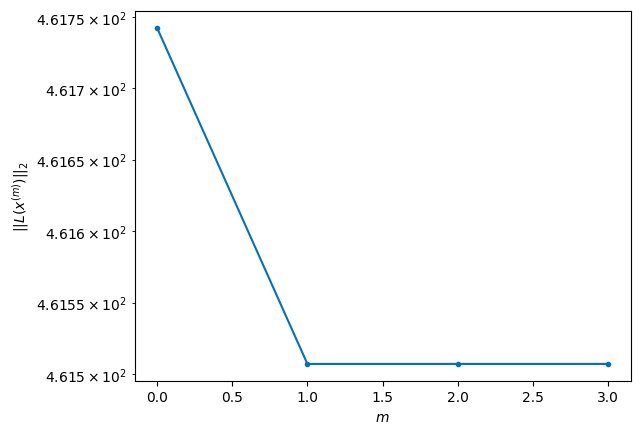

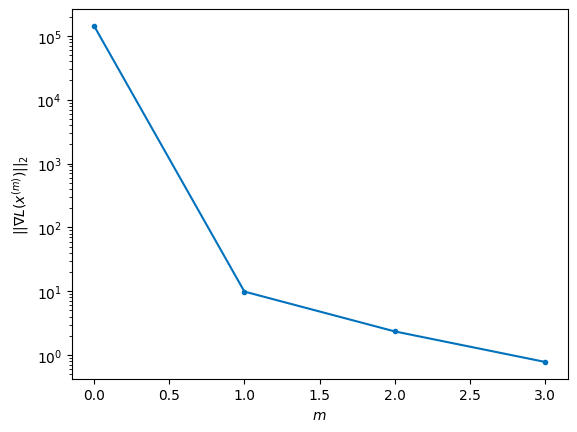


Windows:  81%|████████  | 239/296 [49:56<09:36, 10.12s/it]

Before applying the algorithm
Cost function: 460.1802681687847
Gradient norm: 43586.32158254383
Global relative error: 1908319873.9452589
Position relative errors: 0.014875893355073852 m, 0.4124180402697721 m, 1.051210139550183 m, 0.5182188981373433 m

Iteration 1
Cost function: 459.9582223417584 (-0.05%)
Gradient norm: 14.389263327588727 (-99.97%)
Global relative error: 1.336459144023678 (7.56%)
Position relative errors: 0.017799469387448454 m, 0.9158366279588956 m, 0.9283542591295537 m, 0.2918908086248757 m

Iteration 2
Cost function: 459.95822221801365 (-0.00%)
Gradient norm: 5.105303779712098 (-64.52%)
Global relative error: 1.336525370035013 (0.00%)
Position relative errors: 0.0177994718585874 m, 0.9159173927710047 m, 0.9283579611197729 m, 0.2919288433861752 m

Iteration 3
Cost function: 459.95822201246403 (-0.00%)
Gradient norm: 4.084435417481117 (-20.00%)
Global relative error: 1.3365253797180598 (0.00%)
Position relative errors: 0.017799472503139603 m, 0.9159173877292487 m, 0.9

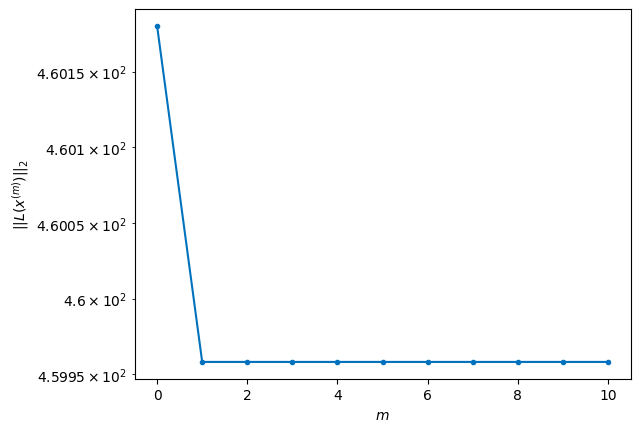

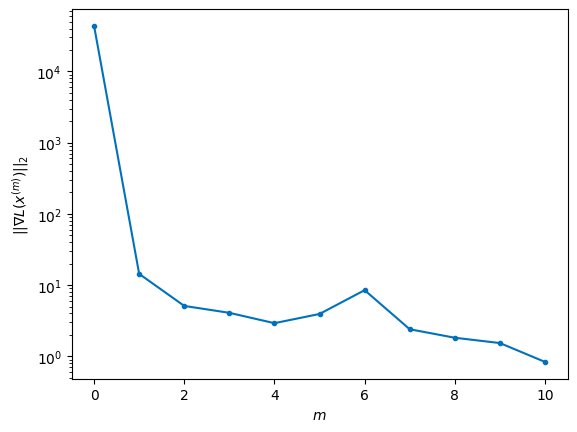


Windows:  81%|████████  | 240/296 [50:17<12:38, 13.55s/it]

Before applying the algorithm
Cost function: 460.2415110057241
Gradient norm: 61336.3120664248
Global relative error: 1908636267.5058084
Position relative errors: 0.018132369545107142 m, 0.8468424619260922 m, 1.020825923610791 m, 0.2443011059068391 m

Iteration 1
Cost function: 459.8595507515631 (-0.08%)
Gradient norm: 5.361369229879214 (-99.99%)
Global relative error: 1.4425478726774101 (6.95%)
Position relative errors: 0.010746847236947653 m, 0.9937115139700748 m, 0.9962519680631433 m, 0.31755328942819255 m

STOP on Iteration 2
Cost function = 459.859550635817 (-0.00%)
Gradient norm = 0.6245862450495465 (-88.35%)
Global relative error = 1.4425465604845256 (-0.00%)
Final position relative errors: 0.010746846003456477 m, 0.9936955327214416 m, 0.9962681206426327 m, 0.3175466621432041 m



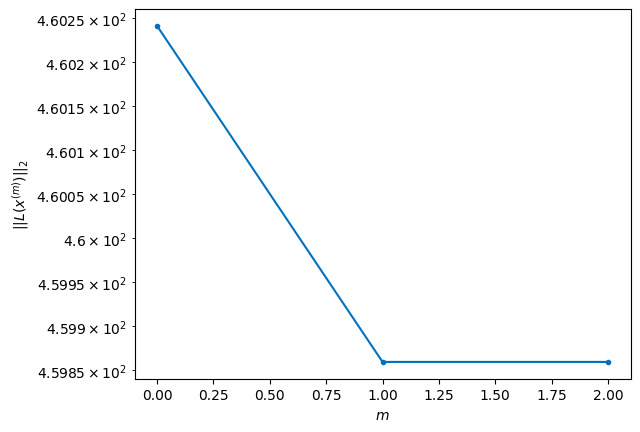

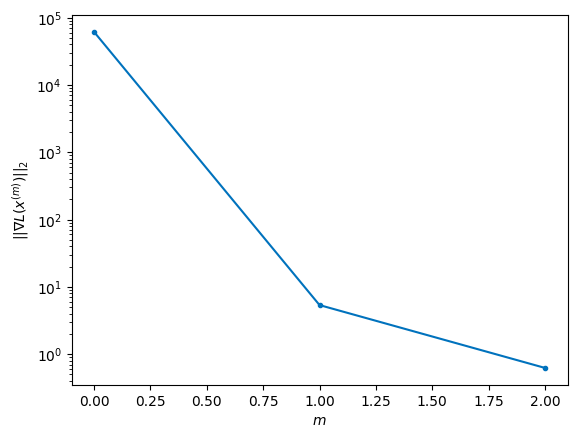


Windows:  81%|████████▏ | 241/296 [50:23<10:26, 11.39s/it]

Before applying the algorithm
Cost function: 463.13888604088174
Gradient norm: 308858.6348525863
Global relative error: 1908911606.5624206
Position relative errors: 0.011384364487240829 m, 0.9181363996660908 m, 1.061884808597818 m, 0.21712562462755058 m

Iteration 1
Cost function: 462.70204469360834 (-0.09%)
Gradient norm: 4.169661820932016 (-100.00%)
Global relative error: 1.4721719597704497 (3.64%)
Position relative errors: 0.016816614232075484 m, 1.01225707483083 m, 0.9263460225426254 m, 0.5331208335177603 m

STOP on Iteration 2
Cost function = 462.7020446250362 (-0.00%)
Gradient norm = 0.8534214017881021 (-79.53%)
Global relative error = 1.4721933461945367 (0.00%)
Final position relative errors: 0.016816616031916212 m, 1.0122445630316494 m, 0.9263944019337683 m, 0.533119581418524 m



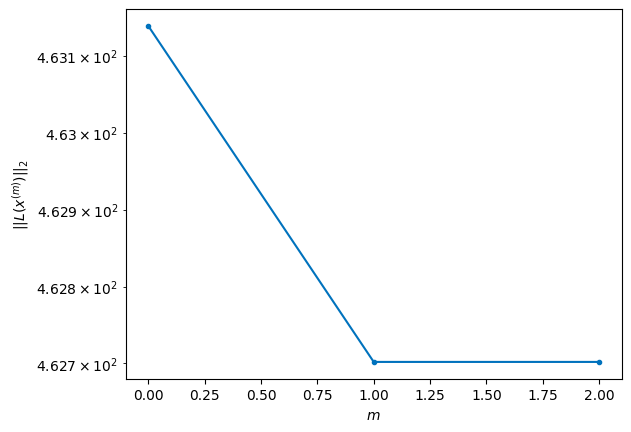

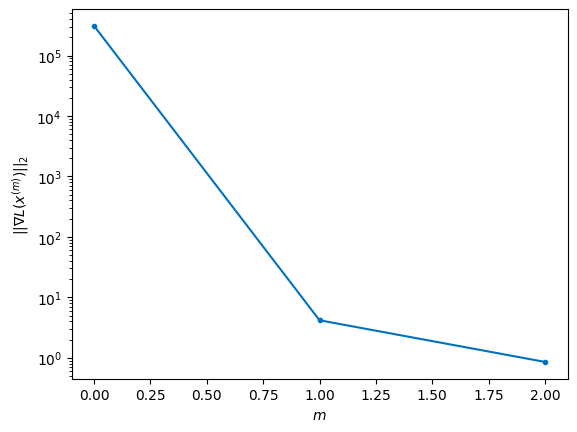


Windows:  82%|████████▏ | 242/296 [50:30<08:51,  9.85s/it]

Before applying the algorithm
Cost function: 462.5653532758041
Gradient norm: 111078.88592566446
Global relative error: 1909144837.1649692
Position relative errors: 0.017367534944756704 m, 0.936909400223647 m, 0.9848967339508395 m, 0.41035221397577487 m

Iteration 1
Cost function: 462.4220867388098 (-0.03%)
Gradient norm: 1.5892721043287745 (-100.00%)
Global relative error: 1.4886092245566498 (4.83%)
Position relative errors: 0.02128137242736129 m, 1.0217855067647539 m, 0.9963744364687208 m, 0.4227161524080224 m

Iteration 2
Cost function: 462.42208684943967 (0.00%)
Gradient norm: 1.4027445586464318 (-11.74%)
Global relative error: 1.4885952149975725 (-0.00%)
Position relative errors: 0.021281371890572644 m, 1.0217643365840008 m, 0.9963848720305424 m, 0.4226933910875315 m

Iteration 3
Cost function: 462.4220867321107 (-0.00%)
Gradient norm: 1.306689625678338 (-6.85%)
Global relative error: 1.488595215256907 (0.00%)
Position relative errors: 0.021281374210971846 m, 1.0217643385861355 m,

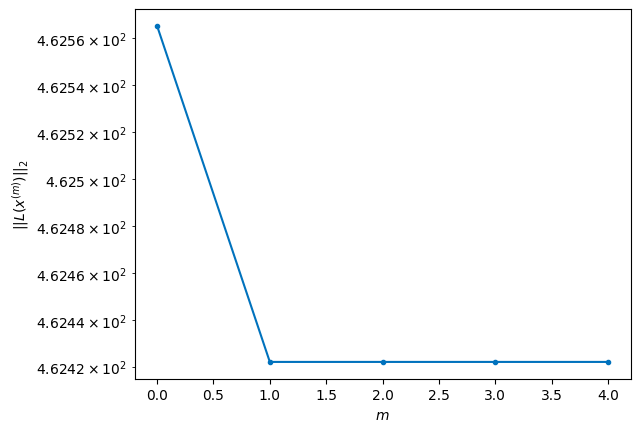

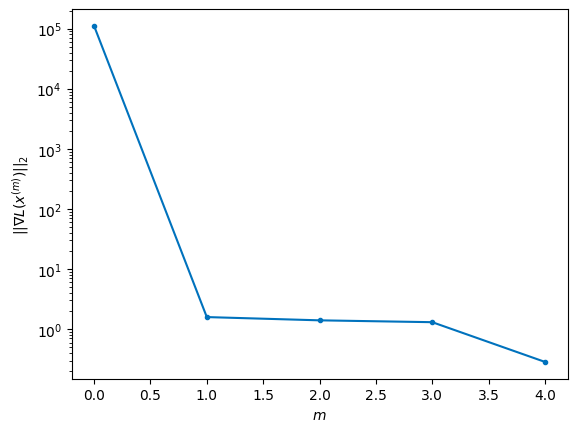


Windows:  82%|████████▏ | 243/296 [50:40<08:50, 10.01s/it]

Before applying the algorithm
Cost function: 467.7217162696006
Gradient norm: 213273.83990535684
Global relative error: 1909335135.3678567
Position relative errors: 0.02159270899820925 m, 0.940976844821258 m, 1.0323716995716152 m, 0.3044599977808361 m

Iteration 1
Cost function: 467.3638484600889 (-0.08%)
Gradient norm: 7.7092215934633455 (-100.00%)
Global relative error: 1.6629752531855095 (16.31%)
Position relative errors: 0.021148323249001566 m, 1.124118454707229 m, 1.0404761313510893 m, 0.6471464303536555 m

Iteration 2
Cost function: 467.3638486349442 (0.00%)
Gradient norm: 5.88207496991934 (-23.70%)
Global relative error: 1.6629958338225759 (0.00%)
Position relative errors: 0.02114832181639135 m, 1.1241137712471034 m, 1.040511496339253 m, 0.6471505919532498 m

Iteration 3
Cost function: 467.36384859118624 (-0.00%)
Gradient norm: 2.2587395856567865 (-61.60%)
Global relative error: 1.6629958118242167 (-0.00%)
Position relative errors: 0.021148325954408225 m, 1.1241137477143004 m, 1

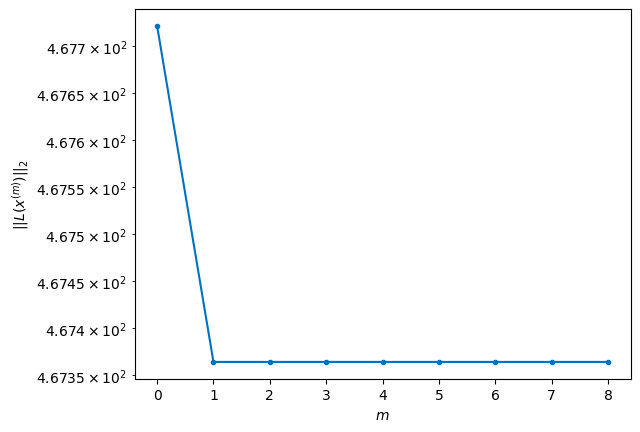

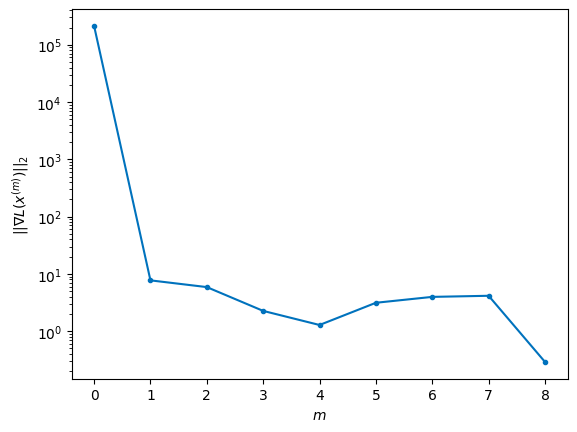


Windows:  82%|████████▏ | 244/296 [50:58<10:44, 12.39s/it]

Before applying the algorithm
Cost function: 465.12044256330125
Gradient norm: 138507.17626716886
Global relative error: 1909481906.4583755
Position relative errors: 0.02123619390150771 m, 1.0337248070849205 m, 1.0843858722591488 m, 0.524801785907839 m

Iteration 1
Cost function: 464.67900697139333 (-0.09%)
Gradient norm: 9.79131064908568 (-99.99%)
Global relative error: 1.5074504515507248 (-5.05%)
Position relative errors: 0.01842375825763911 m, 0.7943671907656107 m, 1.2399391813538758 m, 0.3218565125197158 m

STOP on Iteration 2
Cost function = 464.67900723607744 (0.00%)
Gradient norm = 0.44595471526402525 (-95.45%)
Global relative error = 1.5074799323381887 (0.00%)
Final position relative errors: 0.01842375752594648 m, 0.7944601349221352 m, 1.2398935524406525 m, 0.32194095160836994 m



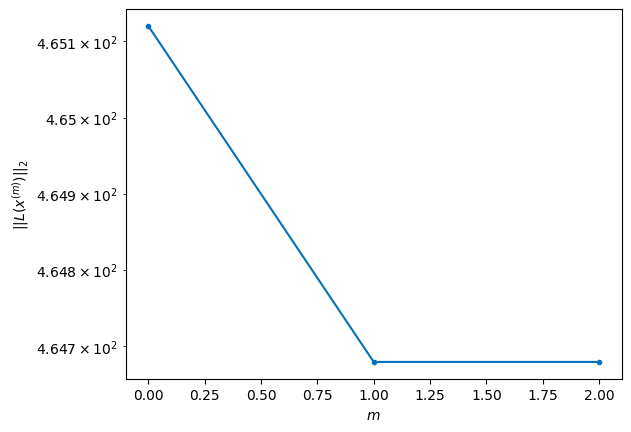

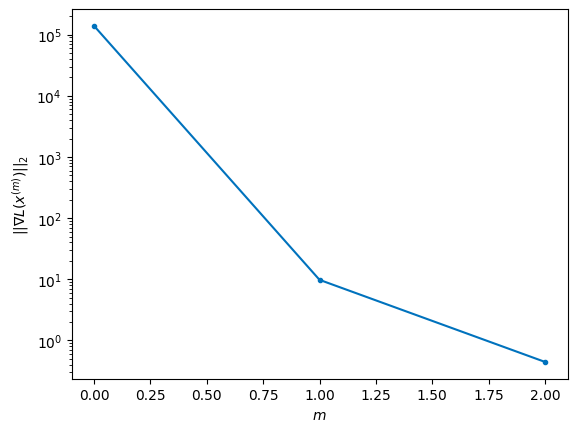


Windows:  83%|████████▎ | 245/296 [51:05<09:03, 10.66s/it]

Before applying the algorithm
Cost function: 461.6464204295768
Gradient norm: 236289.65200406002
Global relative error: 1909584766.6796541
Position relative errors: 0.018791327788690474 m, 0.7125315631419189 m, 1.2411764543795276 m, 0.21351476572863415 m

Iteration 1
Cost function: 461.19211461547894 (-0.10%)
Gradient norm: 15.052955434393747 (-99.99%)
Global relative error: 1.3571112311727418 (-6.22%)
Position relative errors: 0.023835537946069588 m, 0.6680958862550245 m, 1.179059273427901 m, 0.06809924980188443 m

STOP on Iteration 2
Cost function = 461.1921145800606 (-0.00%)
Gradient norm = 0.39387680478930925 (-97.38%)
Global relative error = 1.3570710835239834 (-0.00%)
Final position relative errors: 0.023835539748341024 m, 0.6679816839330746 m, 1.17908307277556 m, 0.06800735536200662 m



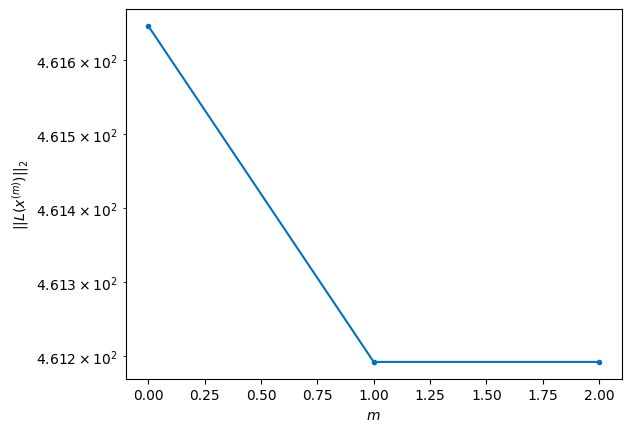

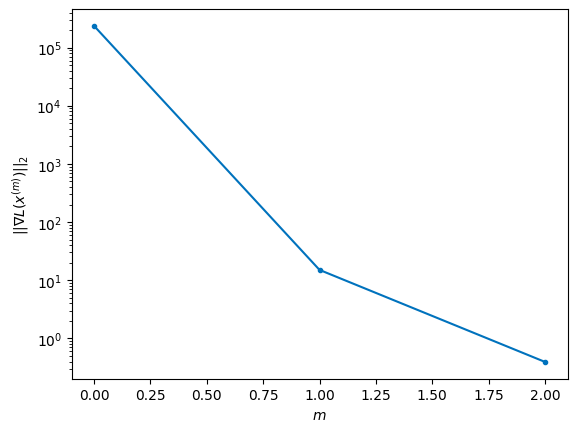


Windows:  83%|████████▎ | 246/296 [51:11<07:46,  9.33s/it]

Before applying the algorithm
Cost function: 459.4008685294471
Gradient norm: 87031.02079289475
Global relative error: 1909643572.832641
Position relative errors: 0.023672055011247015 m, 0.5614860326526994 m, 1.1594158164473312 m, 0.10387661930035412 m

Iteration 1
Cost function: 458.5449041892073 (-0.19%)
Gradient norm: 33.19705775023559 (-99.96%)
Global relative error: 1.400915875764571 (8.38%)
Position relative errors: 0.026592226643587832 m, 0.9164796657631792 m, 0.8742621547714375 m, 0.5979776824345692 m

Iteration 2
Cost function: 458.5449040680936 (-0.00%)
Gradient norm: 3.6775745230937114 (-88.92%)
Global relative error: 1.4010200943637563 (0.01%)
Position relative errors: 0.02659222218722875 m, 0.9166261847744899 m, 0.8741496639572047 m, 0.5981616980124095 m

Iteration 3
Cost function: 458.54490398807025 (-0.00%)
Gradient norm: 4.228334844641818 (14.98%)
Global relative error: 1.4010201281691852 (0.00%)
Position relative errors: 0.02659221442645009 m, 0.9166262134844964 m, 0.8

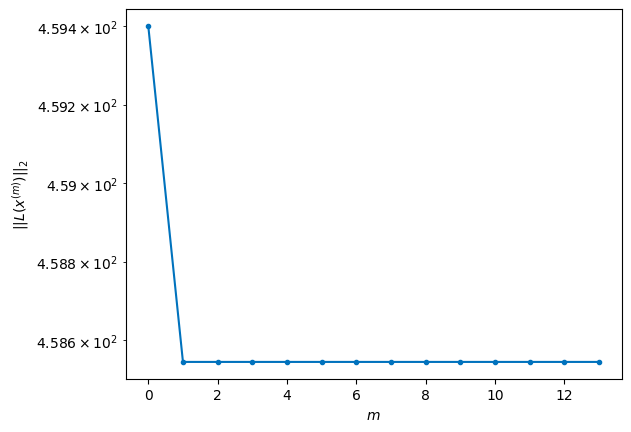

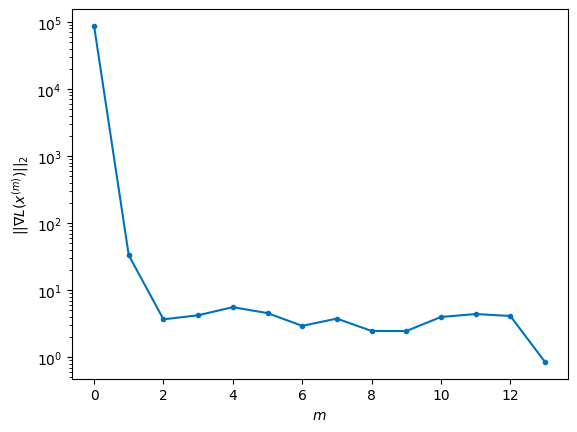


Windows:  83%|████████▎ | 247/296 [51:40<12:30, 15.31s/it]

Before applying the algorithm
Cost function: 459.0138768114006
Gradient norm: 247053.29649305544
Global relative error: 1909658394.5683522
Position relative errors: 0.026217159183156723 m, 0.7988822241792316 m, 0.9144113440932916 m, 0.44729022220269116 m

Iteration 1
Cost function: 458.0507096364223 (-0.21%)
Gradient norm: 33.526101867597376 (-99.99%)
Global relative error: 0.9178627324057881 (-29.08%)
Position relative errors: 0.03069412161794804 m, 0.16186029423191853 m, 0.8837771372602442 m, 0.185073796153475 m

Iteration 2
Cost function: 458.05070956807424 (-0.00%)
Gradient norm: 2.163291754711999 (-93.55%)
Global relative error: 0.917990639049557 (0.01%)
Position relative errors: 0.030694120299838347 m, 0.16204685972073424 m, 0.8838671076019678 m, 0.18511525402734882 m

Iteration 3
Cost function: 458.0507096870289 (0.00%)
Gradient norm: 4.012971753856064 (85.50%)
Global relative error: 0.9179906361667037 (-0.00%)
Position relative errors: 0.030694119367321658 m, 0.1620468761464852

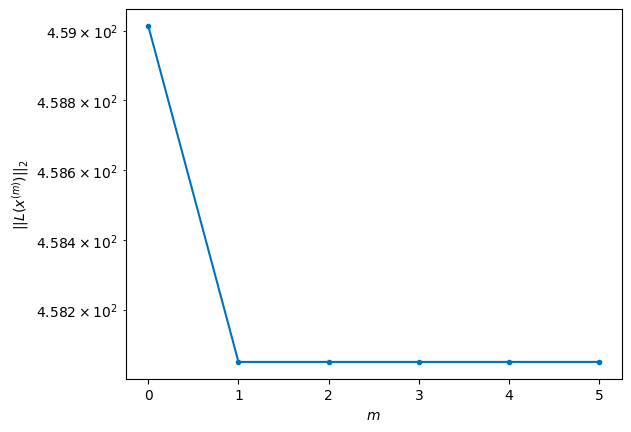

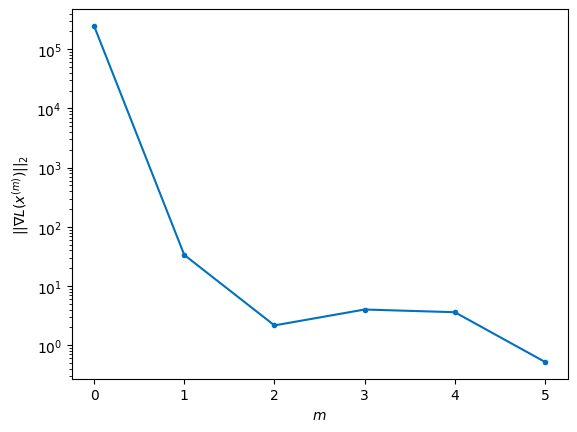


Windows:  84%|████████▍ | 248/296 [51:52<11:26, 14.31s/it]

Before applying the algorithm
Cost function: 454.4181138844513
Gradient norm: 319104.0640141666
Global relative error: 1909629511.6207213
Position relative errors: 0.030046747487411627 m, 0.3066017833597455 m, 0.9205630881944562 m, 0.2742827520059055 m

Iteration 1
Cost function: 453.7296145235673 (-0.15%)
Gradient norm: 21.935036665655204 (-99.99%)
Global relative error: 2.1614003945350855 (114.26%)
Position relative errors: 0.016647081660874245 m, 1.101225885199455 m, 1.565400372531929 m, 1.0040832419056156 m

STOP on Iteration 2
Cost function = 453.7296142541108 (-0.00%)
Gradient norm = 0.4291323743372908 (-98.04%)
Global relative error = 2.161740774684989 (0.02%)
Final position relative errors: 0.016647079918293707 m, 1.101443825009906 m, 1.5656128193142242 m, 1.0042457093252286 m



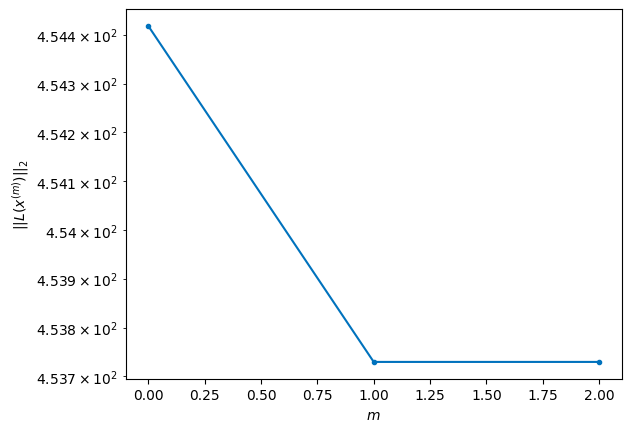

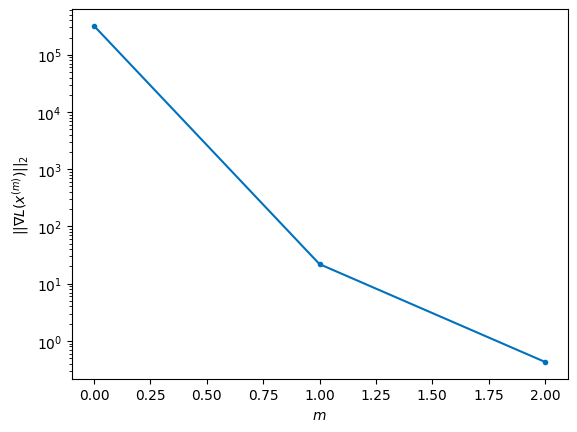


Windows:  84%|████████▍ | 249/296 [51:58<09:20, 11.93s/it]

Before applying the algorithm
Cost function: 453.3754722729326
Gradient norm: 219213.76013568314
Global relative error: 1909557401.041565
Position relative errors: 0.016637387224563465 m, 1.2272827334160556 m, 1.5905283603637863 m, 1.1782196435851036 m

Iteration 1
Cost function: 452.6459884720853 (-0.16%)
Gradient norm: 6.913406300834832 (-100.00%)
Global relative error: 2.69425219342047 (15.68%)
Position relative errors: 0.033344529046875064 m, 1.3191126167249196 m, 1.7302113924194529 m, 1.5887674212055483 m

Iteration 2
Cost function: 452.64598812194674 (-0.00%)
Gradient norm: 3.105754420588174 (-55.08%)
Global relative error: 2.6941947994330038 (-0.00%)
Position relative errors: 0.03334452808010127 m, 1.319116777964539 m, 1.7301811121392008 m, 1.5886996119466756 m

Iteration 3
Cost function: 452.6459883346882 (0.00%)
Gradient norm: 3.6082268016513446 (16.18%)
Global relative error: 2.6941948263059072 (0.00%)
Position relative errors: 0.03334452089134363 m, 1.3191168095885917 m, 1.7

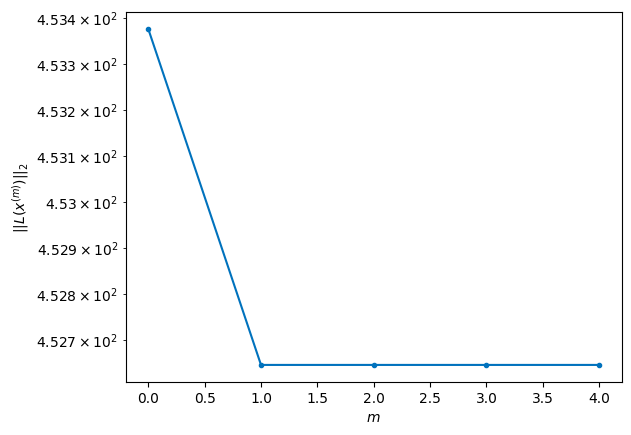

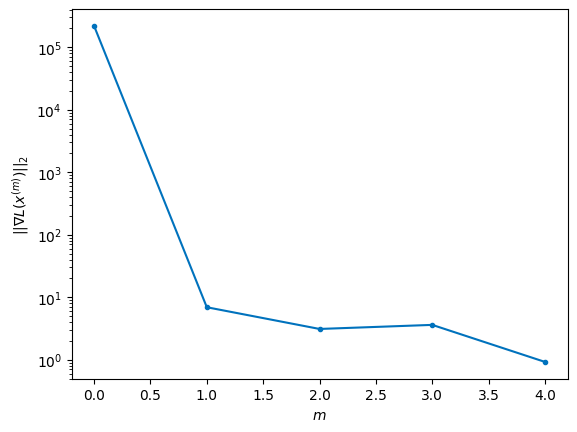


Windows:  84%|████████▍ | 250/296 [52:09<08:44, 11.41s/it]

Before applying the algorithm
Cost function: 454.5029725576509
Gradient norm: 74888.94572597288
Global relative error: 1909442745.8772695
Position relative errors: 0.03263845968437421 m, 1.4221159019640262 m, 1.7157508283863858 m, 1.7493094739600525 m

Iteration 1
Cost function: 454.0980984713829 (-0.09%)
Gradient norm: 4.562256673353116 (-99.99%)
Global relative error: 2.8842489623424745 (1.80%)
Position relative errors: 0.0450556486008479 m, 1.3246958089900034 m, 1.9975907319116624 m, 1.6036408966339 m

STOP on Iteration 2
Cost function = 454.0980986068382 (0.00%)
Gradient norm = 0.8290326396985203 (-81.83%)
Global relative error = 2.884197035025534 (-0.00%)
Final position relative errors: 0.04505564970016239 m, 1.3245849761671744 m, 1.9976461370385776 m, 1.603570034516127 m



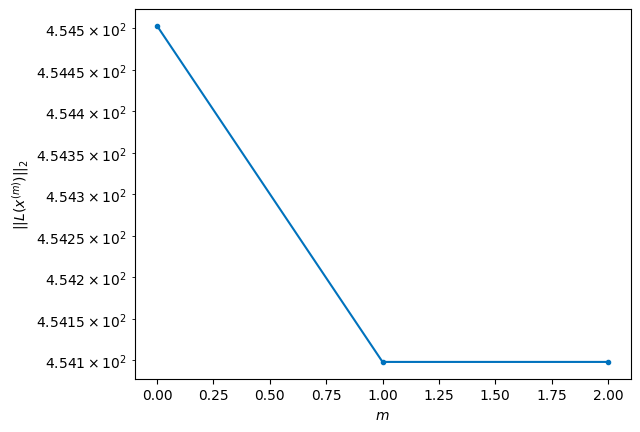

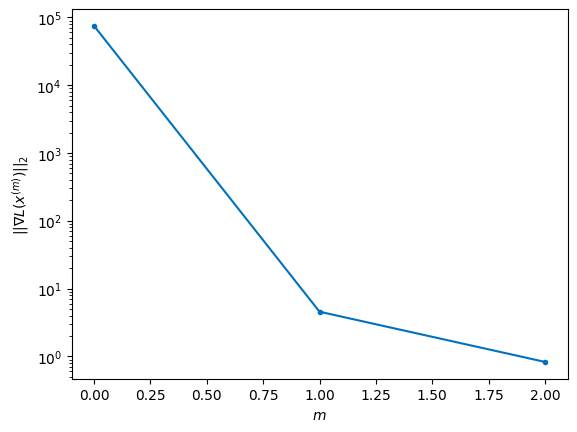


Windows:  85%|████████▍ | 251/296 [52:15<07:24,  9.87s/it]

Before applying the algorithm
Cost function: 452.95695752992407
Gradient norm: 347180.0415521058
Global relative error: 1909286425.5950296
Position relative errors: 0.04383975823980708 m, 1.4274776324748246 m, 1.9831458572329874 m, 1.7512783237385154 m

Iteration 1
Cost function: 452.6410979729319 (-0.07%)
Gradient norm: 4.135149762811196 (-100.00%)
Global relative error: 2.8312474739327587 (-5.83%)
Position relative errors: 0.0579799389279379 m, 1.107728409807648 m, 1.9589188312867563 m, 1.7170220549384214 m

Iteration 2
Cost function: 452.64109797814655 (0.00%)
Gradient norm: 2.085597854874654 (-49.56%)
Global relative error: 2.8312922271713616 (0.00%)
Position relative errors: 0.05797993736927884 m, 1.107790972468168 m, 1.958933444563764 m, 1.717038815206625 m

STOP on Iteration 3
Cost function = 452.6410977877115 (-0.00%)
Gradient norm = 0.8932723364851534 (-57.17%)
Global relative error = 2.8312921711951815 (-0.00%)
Final position relative errors: 0.057979932891616986 m, 1.1077909

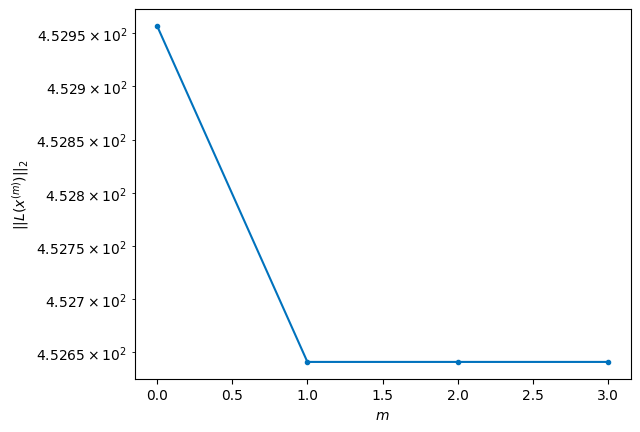

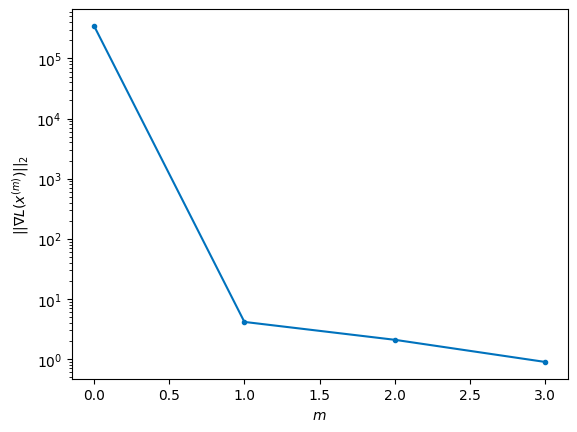


Windows:  85%|████████▌ | 252/296 [52:23<06:52,  9.37s/it]

Before applying the algorithm
Cost function: 454.88017253183494
Gradient norm: 525717.9992019011
Global relative error: 1909089483.943885
Position relative errors: 0.0561507885986899 m, 1.207608614230541 m, 1.9459770032538632 m, 1.87050945251858 m

Iteration 1
Cost function: 453.8374291503103 (-0.23%)
Gradient norm: 22.666561060695354 (-100.00%)
Global relative error: 2.920809539913346 (-1.24%)
Position relative errors: 0.05912128655801363 m, 0.9956568413731113 m, 2.385848138599274 m, 1.357947279864251 m

Iteration 2
Cost function: 453.83742906905405 (-0.00%)
Gradient norm: 4.220275519502647 (-81.38%)
Global relative error: 2.9208717612639283 (0.00%)
Position relative errors: 0.05912129671431395 m, 0.9955680262113258 m, 2.386054561677185 m, 1.3577835288871518 m

Iteration 3
Cost function: 453.8374290424045 (-0.00%)
Gradient norm: 3.3453240561539364 (-20.73%)
Global relative error: 2.920871724572454 (-0.00%)
Position relative errors: 0.05912128424644526 m, 0.9955680302477594 m, 2.386054

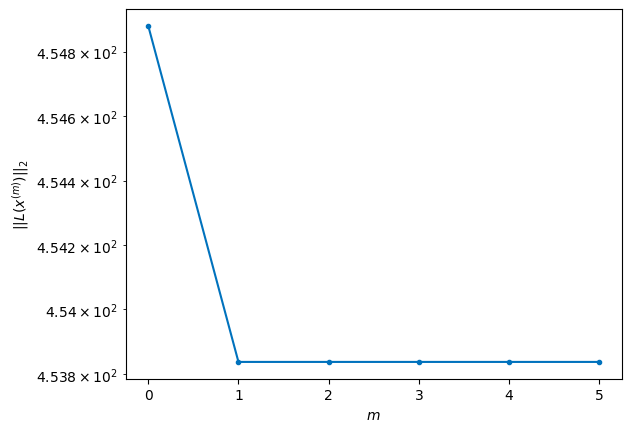

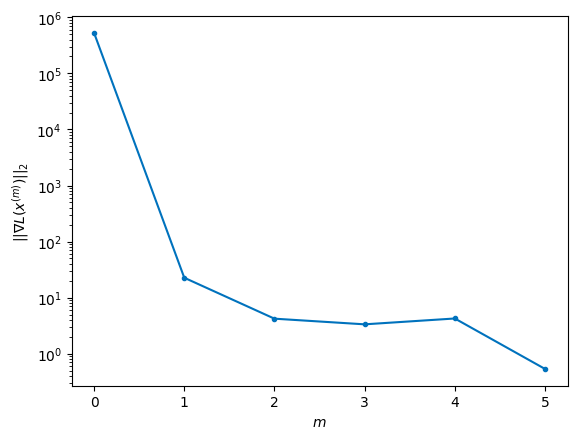


Windows:  85%|████████▌ | 253/296 [52:35<07:19, 10.23s/it]

Before applying the algorithm
Cost function: 457.2570191599389
Gradient norm: 104228.10910166267
Global relative error: 1908853131.3176222
Position relative errors: 0.056723662159110705 m, 1.0841797668161894 m, 2.401358454850013 m, 1.4951266415995794 m

Iteration 1
Cost function: 456.12305598666273 (-0.25%)
Gradient norm: 41.256289849186025 (-99.96%)
Global relative error: 2.507630066096744 (-17.24%)
Position relative errors: 0.05895674537395724 m, 0.8419426019542796 m, 2.2679925562887804 m, 0.6573226477380829 m

STOP on Iteration 2
Cost function = 456.12305573419553 (-0.00%)
Gradient norm = 0.8375150057369928 (-97.97%)
Global relative error = 2.5076482184771023 (0.00%)
Final position relative errors: 0.05895674099414429 m, 0.8420240394273902 m, 2.2680120801961925 m, 0.6572202102543051 m



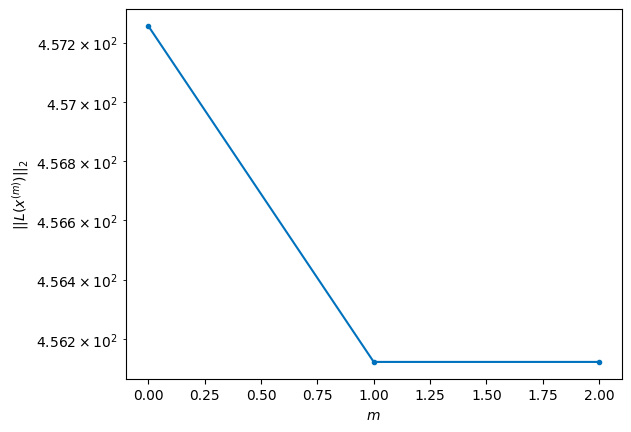

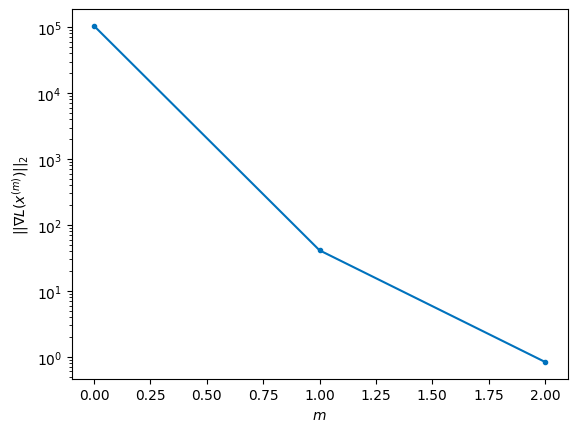


Windows:  86%|████████▌ | 254/296 [52:42<06:20,  9.05s/it]

Before applying the algorithm
Cost function: 456.81645874068454
Gradient norm: 147426.09938636643
Global relative error: 1908578724.8638947
Position relative errors: 0.05643130957178976 m, 0.8775995574615657 m, 2.287472980682607 m, 0.712941757881745 m

Iteration 1
Cost function: 456.4543654557173 (-0.08%)
Gradient norm: 5.277097158220001 (-100.00%)
Global relative error: 2.4992678256423786 (-2.08%)
Position relative errors: 0.05379696514263387 m, 1.0296763461797624 m, 2.1438024885114473 m, 0.7663694722791914 m

Iteration 2
Cost function: 456.4543655499855 (0.00%)
Gradient norm: 1.3779908522686226 (-73.89%)
Global relative error: 2.499292249103382 (0.00%)
Position relative errors: 0.05379697221110642 m, 1.0296635324139343 m, 2.143836610341616 m, 0.7663708861114913 m

STOP on Iteration 3
Cost function = 456.4543656607643 (0.00%)
Gradient norm = 0.2082210488058488 (-84.89%)
Global relative error = 2.4992922790079732 (0.00%)
Final position relative errors: 0.05379696948053839 m, 1.02966355

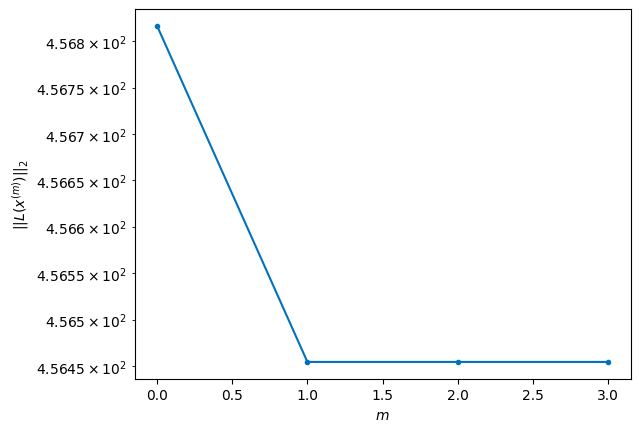

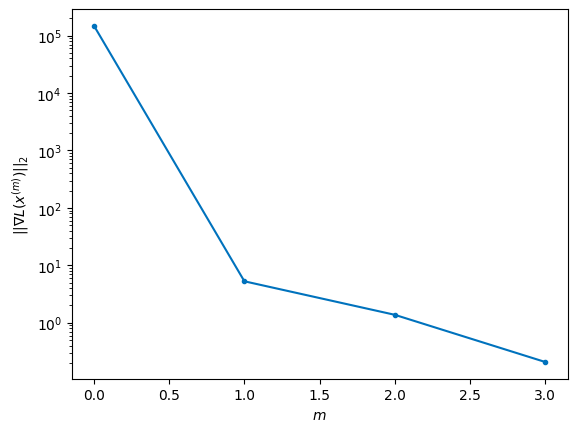


Windows:  86%|████████▌ | 255/296 [52:50<06:03,  8.87s/it]

Before applying the algorithm
Cost function: 461.36161379671205
Gradient norm: 80579.24949213493
Global relative error: 1908267776.6834185
Position relative errors: 0.05131512985383244 m, 1.046624906231683 m, 2.1237331075843215 m, 0.788384067490024 m

Iteration 1
Cost function: 460.6919140213797 (-0.15%)
Gradient norm: 18.783484164143 (-99.98%)
Global relative error: 2.5461074319388577 (2.01%)
Position relative errors: 0.055801095323385695 m, 0.8531453618420733 m, 2.3221446992677537 m, 0.5994458784435621 m

STOP on Iteration 2
Cost function = 460.69191415630314 (0.00%)
Gradient norm = 0.3914279086285681 (-97.92%)
Global relative error = 2.5461813639982056 (0.00%)
Final position relative errors: 0.05580109458800229 m, 0.8531460223289925 m, 2.322229046892717 m, 0.599432211249689 m



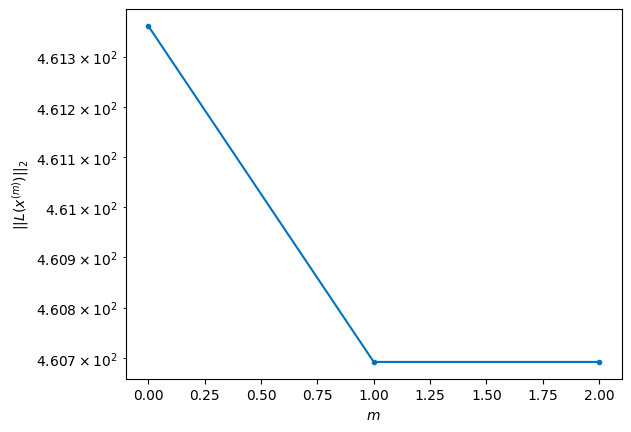

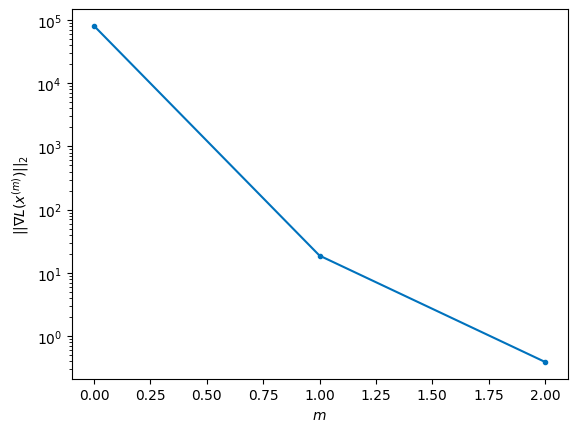


Windows:  86%|████████▋ | 256/296 [52:56<05:24,  8.11s/it]

Before applying the algorithm
Cost function: 457.19775535849703
Gradient norm: 294080.2250316562
Global relative error: 1907921927.79495
Position relative errors: 0.053298210319787806 m, 0.8364820357605056 m, 2.2894196774336435 m, 0.5669404475745353 m

Iteration 1
Cost function: 456.5491120312097 (-0.14%)
Gradient norm: 15.44038144364309 (-99.99%)
Global relative error: 1.7976356178175033 (-28.18%)
Position relative errors: 0.06821652709771053 m, 0.6040856799157461 m, 1.6444783405475596 m, 0.397002464426702 m

Iteration 2
Cost function: 456.5491121526182 (0.00%)
Gradient norm: 1.1882907556142466 (-92.30%)
Global relative error: 1.7979761330381534 (0.02%)
Position relative errors: 0.06821652576588597 m, 0.6042682208748548 m, 1.6447897997938448 m, 0.3969764106546144 m

STOP on Iteration 3
Cost function = 456.5491120746521 (-0.00%)
Gradient norm = 0.14374122410191584 (-87.90%)
Global relative error = 1.7979761305667483 (-0.00%)
Final position relative errors: 0.06821652271503187 m, 0.6042

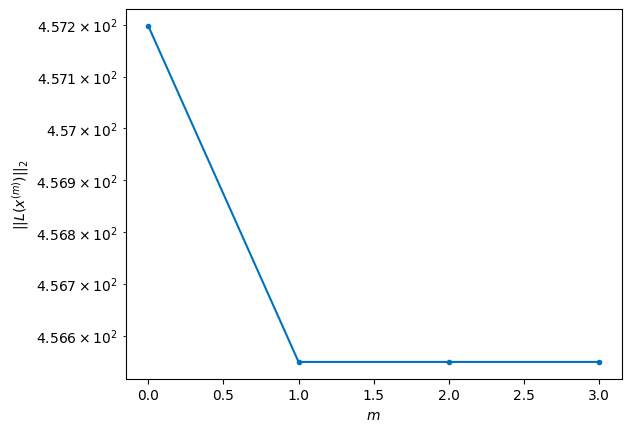

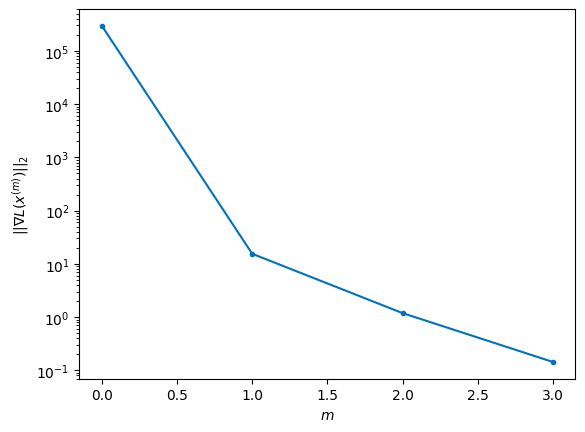


Windows:  87%|████████▋ | 257/296 [53:05<05:24,  8.31s/it]

Before applying the algorithm
Cost function: 453.4713006702146
Gradient norm: 126360.91053419934
Global relative error: 1907542934.5064247
Position relative errors: 0.0654363790704468 m, 0.6170309777663838 m, 1.611127681930543 m, 0.37623963420024065 m

Iteration 1
Cost function: 452.9293668568436 (-0.12%)
Gradient norm: 6.651008099650439 (-99.99%)
Global relative error: 1.5617507720193777 (-11.62%)
Position relative errors: 0.05159580388641655 m, 0.32369814301803623 m, 1.420865260211253 m, 0.5592531269698814 m

Iteration 2
Cost function: 452.92936709312625 (0.00%)
Gradient norm: 2.786909835176293 (-58.10%)
Global relative error: 1.5617756987787959 (0.00%)
Position relative errors: 0.0515958083728562 m, 0.323754510389268 m, 1.4208940543172273 m, 0.5592169505990505 m

STOP on Iteration 3
Cost function = 452.92936683261945 (-0.00%)
Gradient norm = 0.402737585292911 (-85.55%)
Global relative error = 1.5617756656294197 (-0.00%)
Final position relative errors: 0.051595803318391045 m, 0.32375

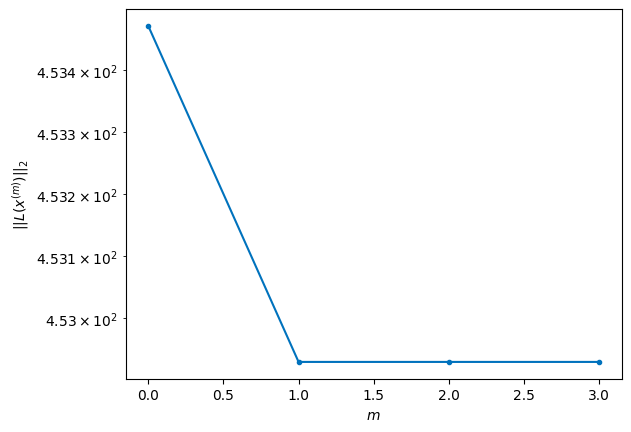

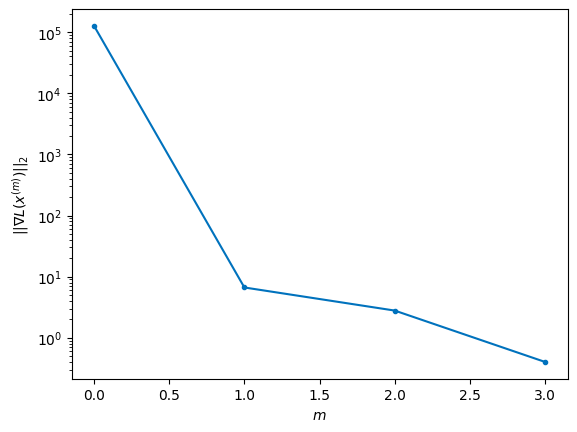


Windows:  87%|████████▋ | 258/296 [53:14<05:16,  8.34s/it]

Before applying the algorithm
Cost function: 454.4920922620418
Gradient norm: 120743.75233603461
Global relative error: 1907132652.2201724
Position relative errors: 0.04962797425970469 m, 0.3368626763291172 m, 1.3929048973633824 m, 0.5458210509781134 m

Iteration 1
Cost function: 453.9971716417816 (-0.11%)
Gradient norm: 16.108128115864744 (-99.99%)
Global relative error: 1.6027530056064785 (4.46%)
Position relative errors: 0.04416690608288601 m, 0.5900624073986862 m, 1.4591881705049972 m, 0.29910103915624886 m

Iteration 2
Cost function: 453.9971716389479 (-0.00%)
Gradient norm: 4.7209406440526624 (-70.69%)
Global relative error: 1.6027508691860322 (-0.00%)
Position relative errors: 0.04416690428163232 m, 0.5900340453148138 m, 1.4592008897080684 m, 0.2990834900578986 m

Iteration 3
Cost function: 453.9971715290467 (-0.00%)
Gradient norm: 3.257157195331003 (-31.01%)
Global relative error: 1.6027508503122474 (-0.00%)
Position relative errors: 0.04416690535517058 m, 0.5900340715041746 m,

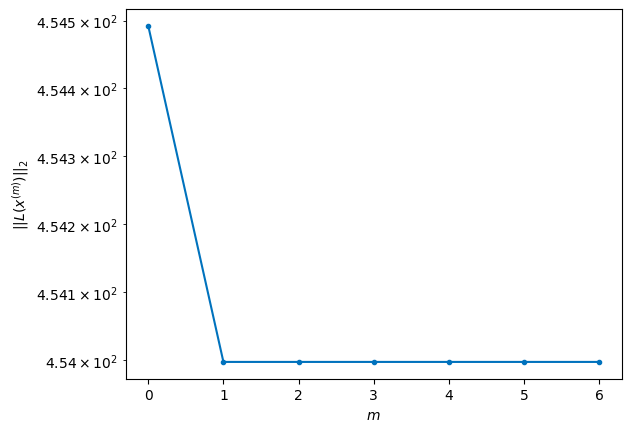

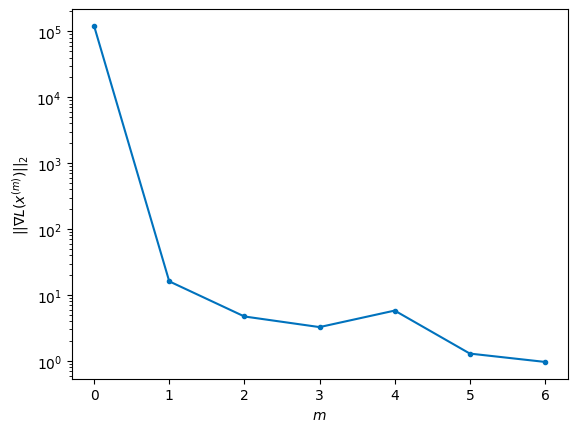


Windows:  88%|████████▊ | 259/296 [53:28<06:11, 10.03s/it]

Before applying the algorithm
Cost function: 451.33534662426115
Gradient norm: 236633.41660778827
Global relative error: 1906693037.0183237
Position relative errors: 0.04246349981260008 m, 0.622756209728845 m, 1.4180630056497043 m, 0.3049365302939789 m

Iteration 1
Cost function: 450.7685860363038 (-0.13%)
Gradient norm: 11.253739172135335 (-100.00%)
Global relative error: 1.0318953074583002 (-34.65%)
Position relative errors: 0.028589448956757968 m, 0.2398089597867197 m, 0.7916724934068274 m, 0.6162272490985369 m

Iteration 2
Cost function: 450.76858612707696 (0.00%)
Gradient norm: 1.6148758264485905 (-85.65%)
Global relative error: 1.03205295817344 (0.02%)
Position relative errors: 0.028589448812175376 m, 0.23990748324594494 m, 0.7919172807915885 m, 0.6161383767396116 m

Iteration 3
Cost function: 450.76858607648086 (-0.00%)
Gradient norm: 2.216350100705296 (37.25%)
Global relative error: 1.032053004898114 (0.00%)
Position relative errors: 0.028589441343521375 m, 0.23990744536189273 

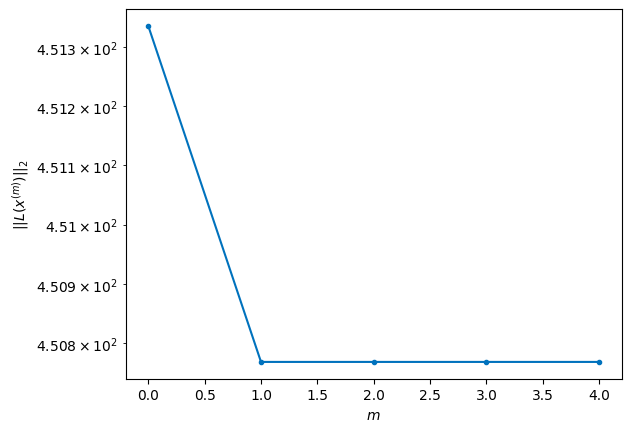

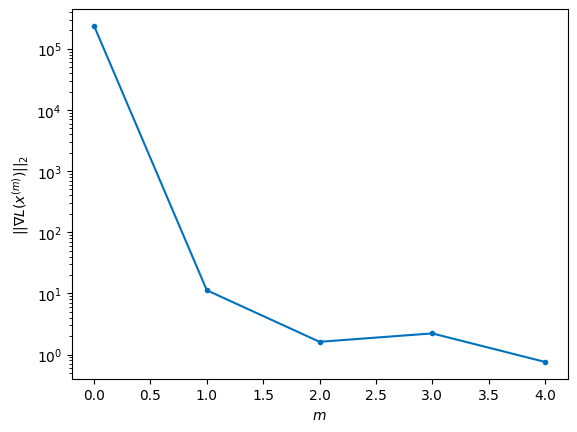


Windows:  88%|████████▊ | 260/296 [53:38<06:05, 10.15s/it]

Before applying the algorithm
Cost function: 455.2869773172424
Gradient norm: 104224.71116955469
Global relative error: 1906226119.935784
Position relative errors: 0.02753912966149571 m, 0.24773347572585624 m, 0.7516841893040961 m, 0.590914581583188 m

Iteration 1
Cost function: 454.2065820458531 (-0.24%)
Gradient norm: 39.73122423108135 (-99.96%)
Global relative error: 1.2136773185151035 (22.83%)
Position relative errors: 0.02404954164982676 m, 0.4665158763741568 m, 1.0490069406374187 m, 0.39291371319203694 m

Iteration 2
Cost function: 454.20658175690687 (-0.00%)
Gradient norm: 2.0442952141901523 (-94.85%)
Global relative error: 1.2137726530781536 (0.01%)
Position relative errors: 0.024049539605914293 m, 0.4667020933782013 m, 1.0490491407269829 m, 0.39287439052968814 m

Iteration 3
Cost function: 454.2065818432832 (0.00%)
Gradient norm: 5.214330168324383 (155.07%)
Global relative error: 1.2137726350041396 (-0.00%)
Position relative errors: 0.024049544969483704 m, 0.46670213761702817 

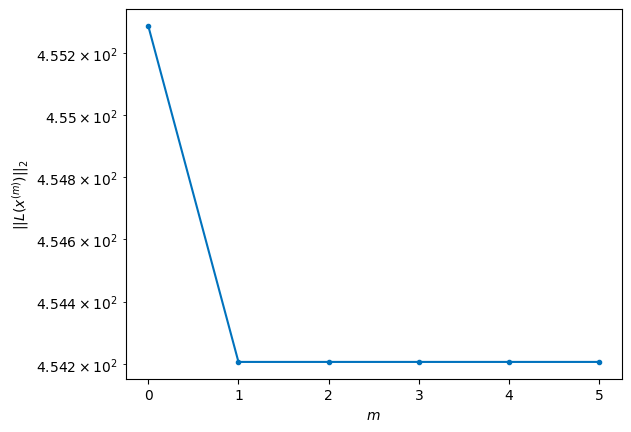

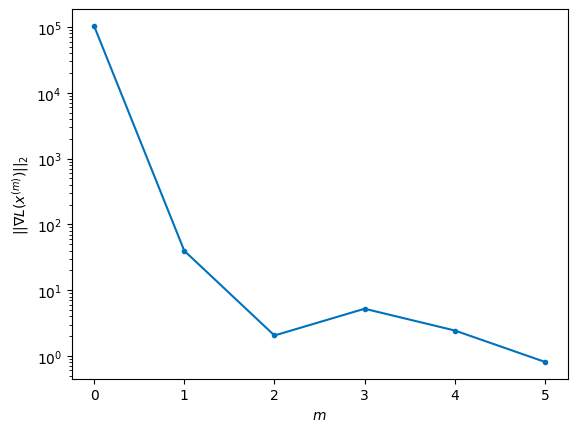


Windows:  88%|████████▊ | 261/296 [53:50<06:15, 10.73s/it]

Before applying the algorithm
Cost function: 455.98099927457946
Gradient norm: 77878.28952913499
Global relative error: 1905734018.052868
Position relative errors: 0.02300180900986246 m, 0.45126390969526187 m, 1.0566155754148578 m, 0.37993373498447003 m

Iteration 1
Cost function: 455.714111167112 (-0.06%)
Gradient norm: 6.153020828641325 (-99.99%)
Global relative error: 1.0747959574320665 (-11.20%)
Position relative errors: 0.023080901942326208 m, 0.1772556601739432 m, 0.9933422254491119 m, 0.36946541506329394 m

Iteration 2
Cost function: 455.7141111141927 (-0.00%)
Gradient norm: 4.3064844442843215 (-30.01%)
Global relative error: 1.074831957477789 (0.00%)
Position relative errors: 0.023080902062181517 m, 0.1773449094212957 m, 0.9933676298017975 m, 0.36945901090463795 m

Iteration 3
Cost function: 455.71411124530306 (0.00%)
Gradient norm: 2.6122770802461943 (-39.34%)
Global relative error: 1.0748319935220605 (0.00%)
Position relative errors: 0.023080906576222183 m, 0.1773448829427690

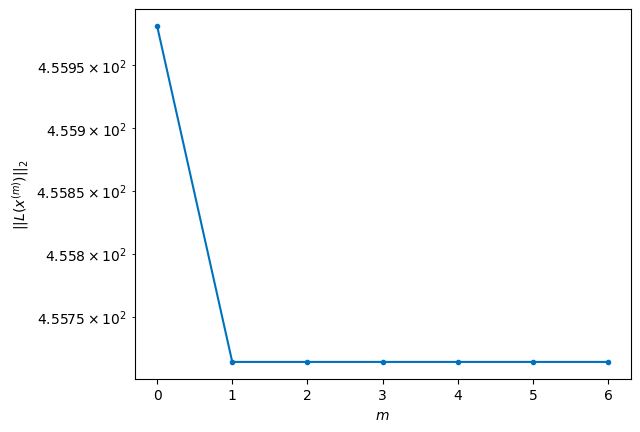

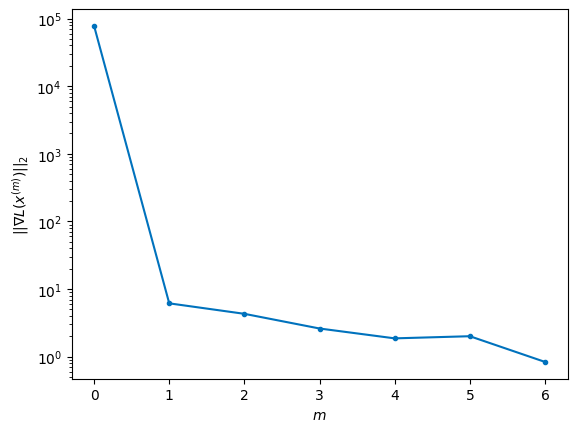


Windows:  89%|████████▊ | 262/296 [54:04<06:38, 11.73s/it]

Before applying the algorithm
Cost function: 451.234158685122
Gradient norm: 62556.934820058814
Global relative error: 1905218897.241212
Position relative errors: 0.022326003094551634 m, 0.18229220238866042 m, 1.0174488101097268 m, 0.3569886440873281 m

Iteration 1
Cost function: 450.9357068390683 (-0.07%)
Gradient norm: 7.027297838563786 (-99.99%)
Global relative error: 1.4254852840077117 (30.33%)
Position relative errors: 0.025938501642067315 m, 0.07456098411270644 m, 1.3621261794849073 m, 0.4127804894142865 m

STOP on Iteration 2
Cost function = 450.93570677580533 (-0.00%)
Gradient norm = 0.1639835900021535 (-97.67%)
Global relative error = 1.4255747745607357 (0.01%)
Final position relative errors: 0.025938516699848667 m, 0.07453061273804046 m, 1.3622242485965605 m, 0.4127713993364273 m



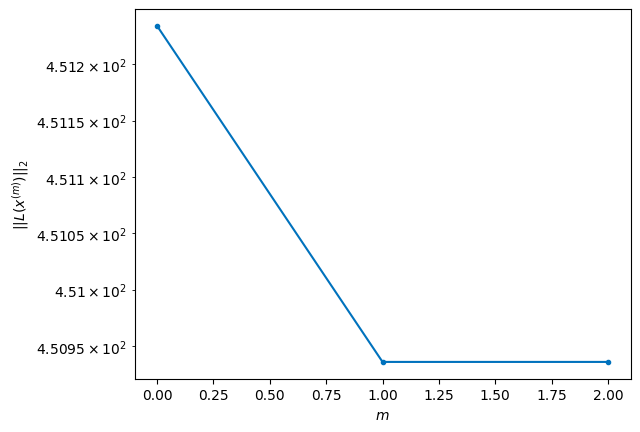

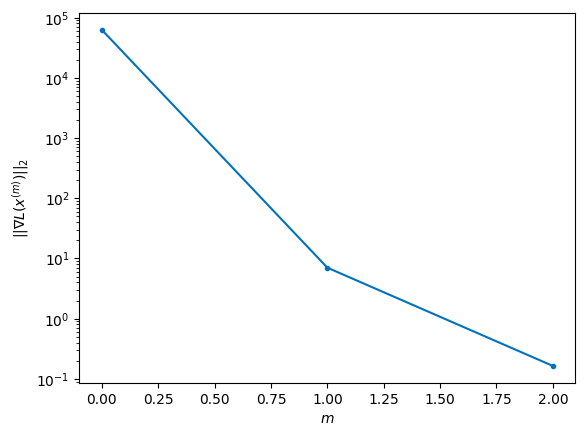


Windows:  89%|████████▉ | 263/296 [54:11<05:35, 10.17s/it]

Before applying the algorithm
Cost function: 454.5787811521374
Gradient norm: 347147.6396113631
Global relative error: 1904682973.7410216
Position relative errors: 0.02460826576216201 m, 0.06352656830545411 m, 1.377302249061109 m, 0.382647989039125 m

Iteration 1
Cost function: 453.18647598674534 (-0.31%)
Gradient norm: 23.908094931412254 (-99.99%)
Global relative error: 1.139343934647535 (-20.39%)
Position relative errors: 0.01634625435337171 m, 0.48901327980980663 m, 1.0144787204168564 m, 0.1718580305409908 m

STOP on Iteration 2
Cost function = 453.1864758601981 (-0.00%)
Gradient norm = 0.2525531997514485 (-98.94%)
Global relative error = 1.1393877268135009 (0.00%)
Final position relative errors: 0.016346253501994718 m, 0.48878922108387146 m, 1.014626371610497 m, 0.1719141038899789 m



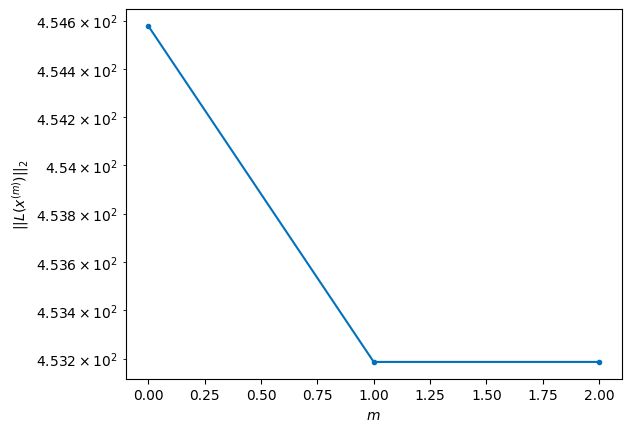

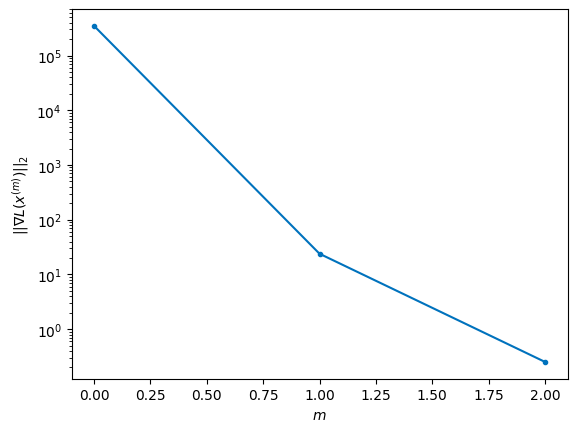


Windows:  89%|████████▉ | 264/296 [54:17<04:47,  8.98s/it]

Before applying the algorithm
Cost function: 454.2901228343748
Gradient norm: 160077.20274650888
Global relative error: 1904128521.030929
Position relative errors: 0.01579438861616151 m, 0.45020402649374686 m, 1.038792540205927 m, 0.1863344197100508 m

Iteration 1
Cost function: 453.9519025266889 (-0.07%)
Gradient norm: 7.524916824515135 (-100.00%)
Global relative error: 1.135088299572733 (-1.08%)
Position relative errors: 0.015982790955298108 m, 0.698032707822395 m, 0.8431163236671242 m, 0.3001238576456839 m

Iteration 2
Cost function: 453.9519027278779 (0.00%)
Gradient norm: 4.925427058549934 (-34.55%)
Global relative error: 1.1350657922991911 (-0.00%)
Position relative errors: 0.01598279220187984 m, 0.6979826739344909 m, 0.8431318752467614 m, 0.30011141111734807 m

Iteration 3
Cost function: 453.95190280264285 (0.00%)
Gradient norm: 7.54065679608137 (53.10%)
Global relative error: 1.1350658401693963 (0.00%)
Position relative errors: 0.015982790662088357 m, 0.6979827022456224 m, 0.84

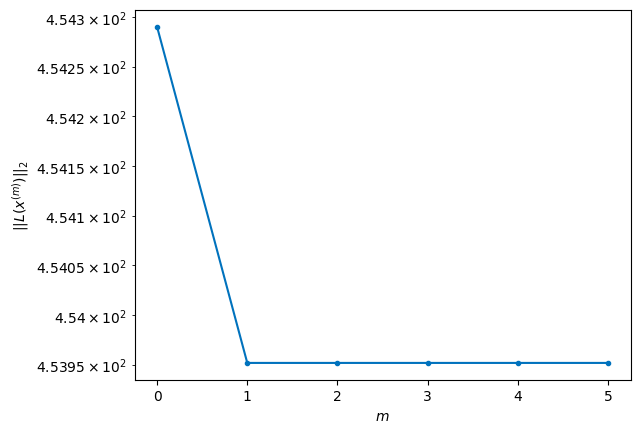

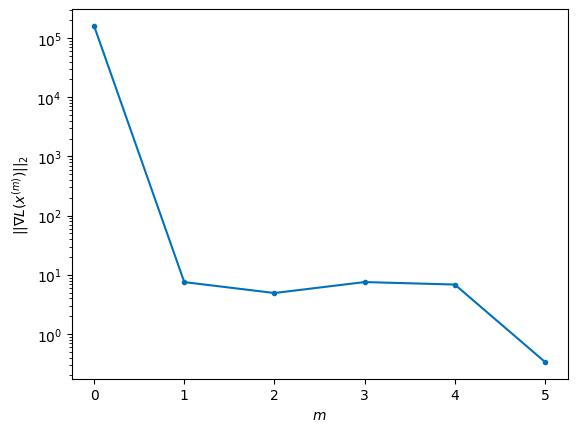


Windows:  90%|████████▉ | 265/296 [54:29<05:05,  9.87s/it]

Before applying the algorithm
Cost function: 455.4535509996424
Gradient norm: 182940.8424489481
Global relative error: 1903557823.122707
Position relative errors: 0.015331363111903414 m, 0.6738137035865309 m, 0.8781179149715829 m, 0.27352539098158524 m

Iteration 1
Cost function: 453.6940100910713 (-0.39%)
Gradient norm: 66.51463051039968 (-99.96%)
Global relative error: 1.6730672719475284 (46.73%)
Position relative errors: 0.01627893976548104 m, 0.30297695919960954 m, 1.5594160460034745 m, 0.5247039815234439 m

Iteration 2
Cost function: 453.6940096627183 (-0.00%)
Gradient norm: 2.3354710961730536 (-96.49%)
Global relative error: 1.6731615888326818 (0.01%)
Position relative errors: 0.016278941588366888 m, 0.30273270626793186 m, 1.5595265031563994 m, 0.5248174069962127 m

STOP on Iteration 3
Cost function = 453.6940100437203 (0.00%)
Gradient norm = 0.1689774418945477 (-92.76%)
Global relative error = 1.673161602434045 (0.00%)
Final position relative errors: 0.016278941059045617 m, 0.30

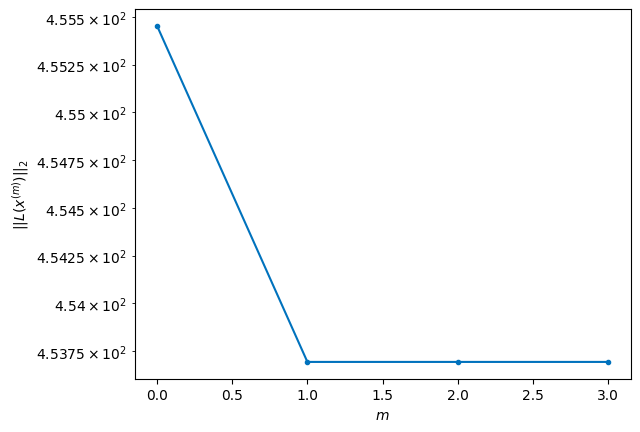

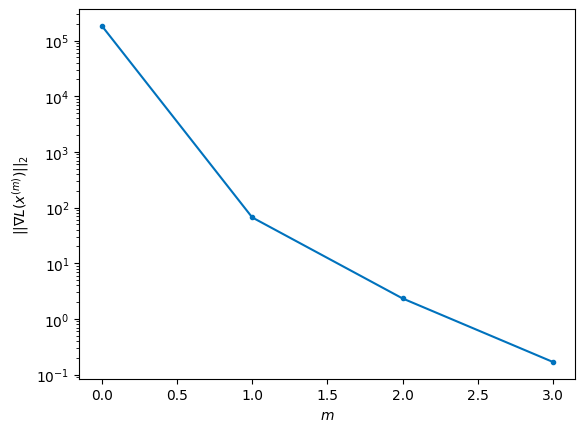


Windows:  90%|████████▉ | 266/296 [54:39<04:56,  9.88s/it]

Before applying the algorithm
Cost function: 453.29005356162935
Gradient norm: 25292.536091733014
Global relative error: 1902973201.6804848
Position relative errors: 0.01525887784111011 m, 0.2573080055564985 m, 1.5114982592479196 m, 0.5175345939026015 m

Iteration 1
Cost function: 452.9426612944419 (-0.08%)
Gradient norm: 4.828742003060496 (-99.98%)
Global relative error: 1.8992104767235816 (17.36%)
Position relative errors: 0.02268044051492726 m, 0.0970885489324693 m, 1.778738411158098 m, 0.6581390324407572 m

Iteration 2
Cost function: 452.9426614540679 (0.00%)
Gradient norm: 1.4248518045413703 (-70.49%)
Global relative error: 1.8992615720590431 (0.00%)
Position relative errors: 0.02268043578146025 m, 0.09704499457813377 m, 1.7787794781977726 m, 0.6581819118007263 m

STOP on Iteration 3
Cost function = 452.9426611501452 (-0.00%)
Gradient norm = 0.37249295187007514 (-73.86%)
Global relative error = 1.8992615424663504 (-0.00%)
Final position relative errors: 0.02268043735022546 m, 0.09

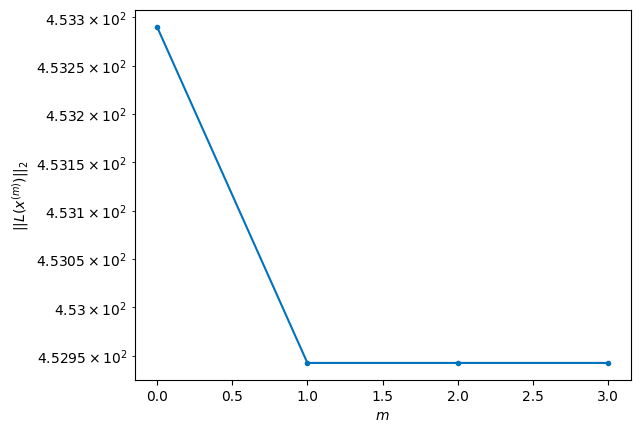

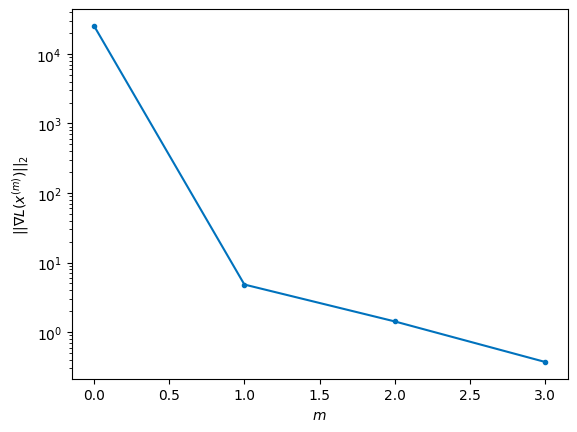


Windows:  90%|█████████ | 267/296 [54:48<04:37,  9.55s/it]

Before applying the algorithm
Cost function: 452.5671436467692
Gradient norm: 153487.06775110596
Global relative error: 1902377012.913046
Position relative errors: 0.02114185488566687 m, 0.0673894772922602 m, 1.7051288834248717 m, 0.6294180982596416 m

Iteration 1
Cost function: 451.64868327001955 (-0.20%)
Gradient norm: 11.05917374296161 (-99.99%)
Global relative error: 1.7112028558259291 (-5.92%)
Position relative errors: 0.013471553963931284 m, 0.17004694560170253 m, 1.6167090267886879 m, 0.5341972711520996 m

Iteration 2
Cost function: 451.64868348433646 (0.00%)
Gradient norm: 1.3519203967596998 (-87.78%)
Global relative error: 1.711311330094378 (0.01%)
Position relative errors: 0.013471552875913199 m, 0.1701166413576937 m, 1.6167686836266708 m, 0.5343419992097103 m

Iteration 3
Cost function: 451.64868317942455 (-0.00%)
Gradient norm: 3.7468563930866376 (177.15%)
Global relative error: 1.7113113362612953 (0.00%)
Position relative errors: 0.013471552366672314 m, 0.17011663214716694

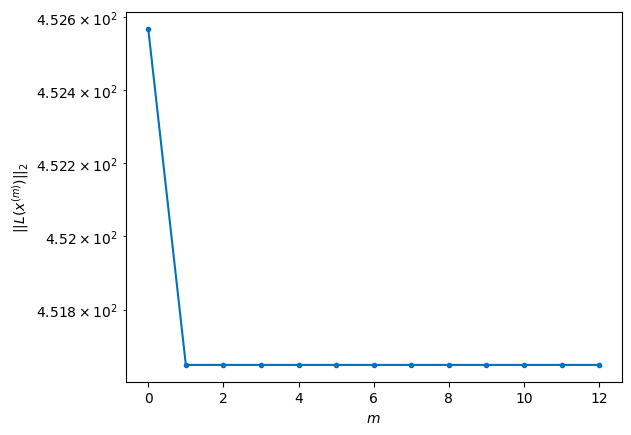

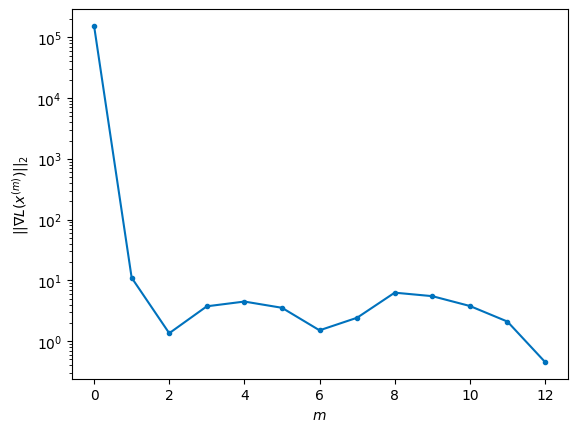


Windows:  91%|█████████ | 268/296 [55:13<06:38, 14.23s/it]

Before applying the algorithm
Cost function: 452.96128836510746
Gradient norm: 135741.7067278456
Global relative error: 1901771616.1975973
Position relative errors: 0.012892223694040542 m, 0.21514003996195086 m, 1.5811059611035478 m, 0.5425475968026536 m

Iteration 1
Cost function: 452.1263097535625 (-0.18%)
Gradient norm: 9.669986032098038 (-99.99%)
Global relative error: 1.630524984651483 (-3.26%)
Position relative errors: 0.013068361427077893 m, 0.1131606662342255 m, 1.4671464709643423 m, 0.702220999082473 m

Iteration 2
Cost function: 452.12630998428546 (0.00%)
Gradient norm: 2.599833410095913 (-73.11%)
Global relative error: 1.630515153421572 (-0.00%)
Position relative errors: 0.013068351535825277 m, 0.11322795388665297 m, 1.4671282989614314 m, 0.7022252918159436 m

Iteration 3
Cost function: 452.12630991043517 (-0.00%)
Gradient norm: 2.4319323281015897 (-6.46%)
Global relative error: 1.6305152079545213 (0.00%)
Position relative errors: 0.01306835661633553 m, 0.11322798685062693 m

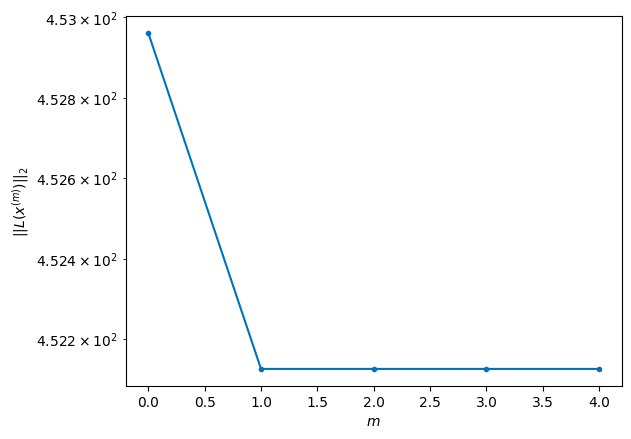

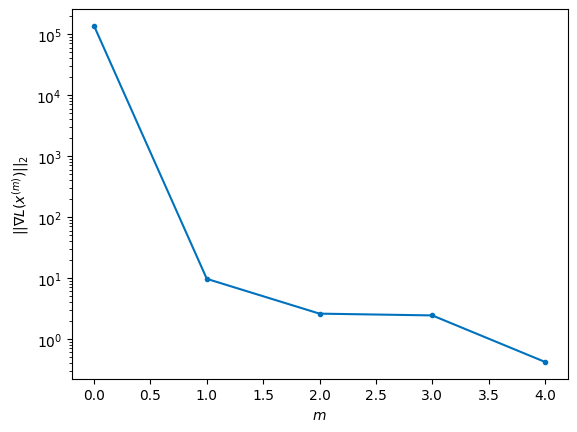


Windows:  91%|█████████ | 269/296 [55:23<05:51, 13.00s/it]

Before applying the algorithm
Cost function: 457.04054759711994
Gradient norm: 442997.2956375317
Global relative error: 1901159354.2593014
Position relative errors: 0.011805528506379542 m, 0.18191398469972386 m, 1.4545186353950914 m, 0.7452289834852052 m

Iteration 1
Cost function: 456.6779081588141 (-0.08%)
Gradient norm: 8.70715960413367 (-100.00%)
Global relative error: 1.6377407391511967 (-0.41%)
Position relative errors: 0.01724816568608004 m, 0.5599760978009242 m, 1.2700191268020962 m, 0.8691223787925585 m

Iteration 2
Cost function: 456.6779082410886 (0.00%)
Gradient norm: 6.32257396560798 (-27.39%)
Global relative error: 1.6377928435598814 (0.00%)
Position relative errors: 0.017248174087520322 m, 0.5600295202846065 m, 1.2700574836592964 m, 0.8691300914798029 m

Iteration 3
Cost function: 456.6779082260685 (-0.00%)
Gradient norm: 8.282801203013431 (31.00%)
Global relative error: 1.6377928232231052 (-0.00%)
Position relative errors: 0.017248178910327816 m, 0.5600295003148993 m, 1

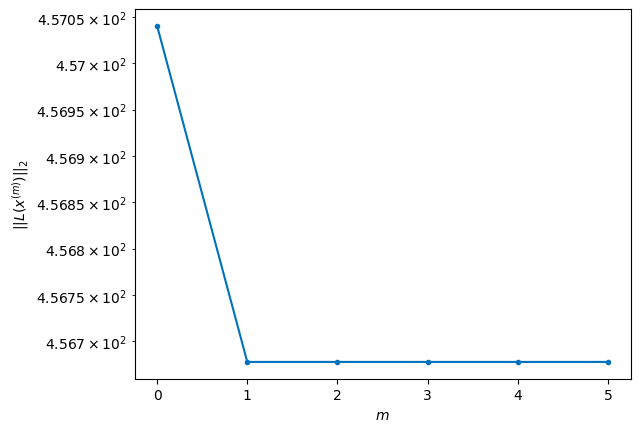

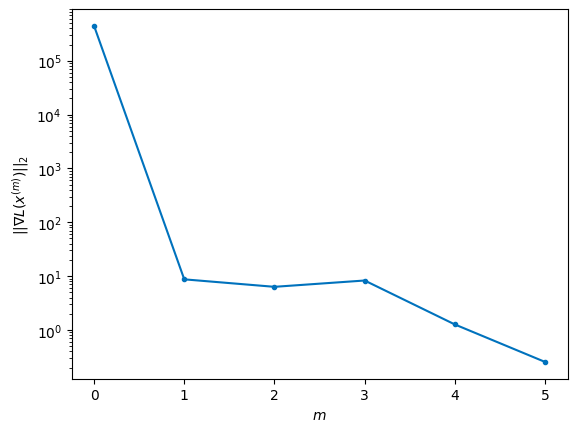


Windows:  91%|█████████ | 270/296 [55:35<05:33, 12.81s/it]

Before applying the algorithm
Cost function: 453.8733346587217
Gradient norm: 92500.97908043335
Global relative error: 1900542595.430742
Position relative errors: 0.015719422009306462 m, 0.6301122066155462 m, 1.2641695243768016 m, 0.8881382626632403 m

Iteration 1
Cost function: 453.46447804991453 (-0.09%)
Gradient norm: 15.399432374736012 (-99.98%)
Global relative error: 1.4539834991631826 (-12.86%)
Position relative errors: 0.011429440537315694 m, 0.7422736768953855 m, 0.8250698886487096 m, 0.9392685941239102 m

Iteration 2
Cost function: 453.4644780332685 (-0.00%)
Gradient norm: 2.2277547433285414 (-85.53%)
Global relative error: 1.4540785040836277 (0.01%)
Position relative errors: 0.011429443090414262 m, 0.7422980002303373 m, 0.8251949380868787 m, 0.9392865897865146 m

Iteration 3
Cost function: 453.46447795561664 (-0.00%)
Gradient norm: 1.8519166316013305 (-16.87%)
Global relative error: 1.4540784918483374 (-0.00%)
Position relative errors: 0.011429444552393607 m, 0.74229799254308

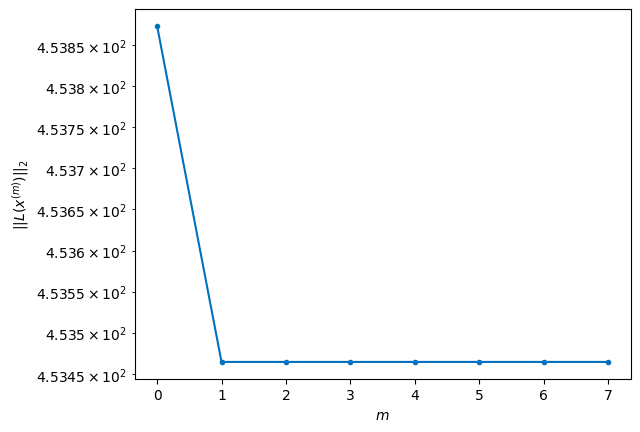

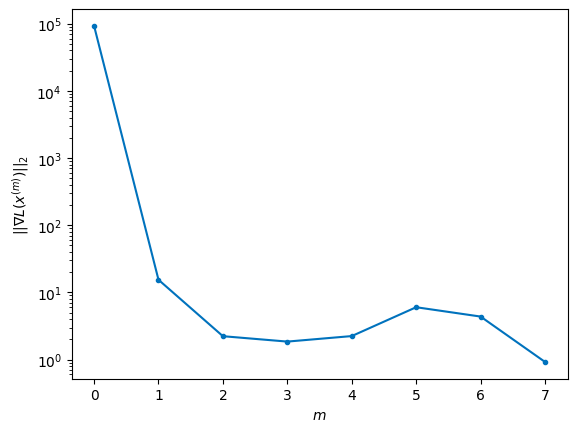


Windows:  92%|█████████▏| 271/296 [55:51<05:41, 13.67s/it]

Before applying the algorithm
Cost function: 460.99059212954074
Gradient norm: 113521.11466059562
Global relative error: 1899923705.1609707
Position relative errors: 0.010122881314960839 m, 0.8014608544413991 m, 0.8331213831780125 m, 0.95440174403552 m

Iteration 1
Cost function: 460.21550001451914 (-0.17%)
Gradient norm: 30.089775779442448 (-99.97%)
Global relative error: 1.153581130402057 (-23.05%)
Position relative errors: 0.008831686710592836 m, 0.5246786142690221 m, 0.9329468321693057 m, 0.4301030948113879 m

Iteration 2
Cost function: 460.2155006122998 (0.00%)
Gradient norm: 5.2832664262292015 (-82.44%)
Global relative error: 1.153761905205302 (0.02%)
Position relative errors: 0.008831675793150437 m, 0.5248168012826444 m, 0.9330332632597953 m, 0.4302318871791506 m

Iteration 3
Cost function: 460.21550041921125 (-0.00%)
Gradient norm: 1.203886562380909 (-77.21%)
Global relative error: 1.1537619456023507 (0.00%)
Position relative errors: 0.00883168602853839 m, 0.5248168168664256 m,

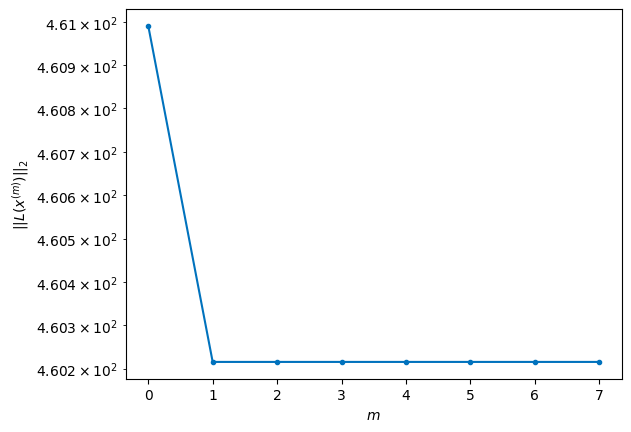

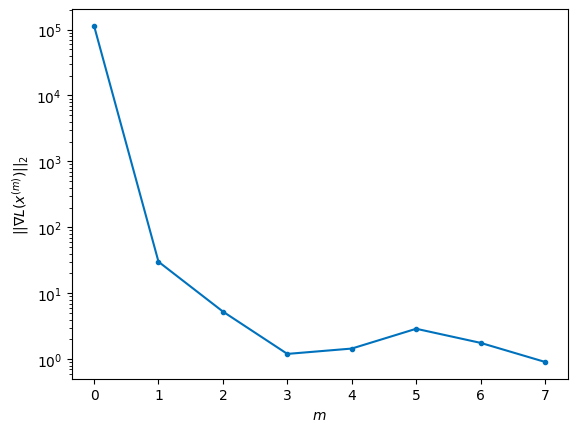


Windows:  92%|█████████▏| 272/296 [56:07<05:42, 14.26s/it]

Before applying the algorithm
Cost function: 460.1240445363738
Gradient norm: 152116.95442941552
Global relative error: 1899305036.991182
Position relative errors: 0.007841435744696722 m, 0.6119534673608811 m, 0.9563219078110147 m, 0.5168369098392188 m

Iteration 1
Cost function: 459.66045821358733 (-0.10%)
Gradient norm: 4.511960514132409 (-100.00%)
Global relative error: 1.0253228585809193 (-17.81%)
Position relative errors: 0.007624325961813795 m, 0.43309988201786054 m, 0.8945564427310433 m, 0.25182565458062434 m

Iteration 2
Cost function: 459.6604580908899 (-0.00%)
Gradient norm: 2.716532196057591 (-39.79%)
Global relative error: 1.0253364303147876 (0.00%)
Position relative errors: 0.007624326496258675 m, 0.43310325492942087 m, 0.8945713549840837 m, 0.251822141688231 m

STOP on Iteration 3
Cost function = 459.6604584090348 (0.00%)
Gradient norm = 0.22448720976061484 (-91.74%)
Global relative error = 1.025336411482847 (-0.00%)
Final position relative errors: 0.007624322909432049 m,

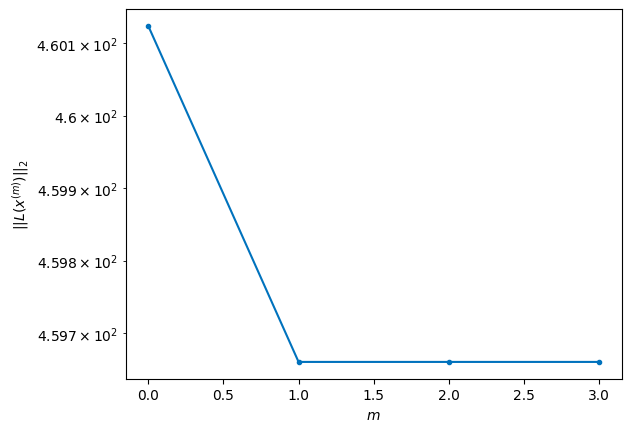

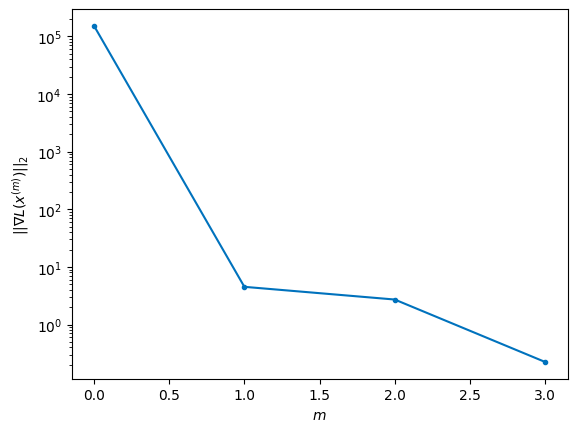


Windows:  92%|█████████▏| 273/296 [56:15<04:45, 12.41s/it]

Before applying the algorithm
Cost function: 457.29444918082754
Gradient norm: 354660.89963023516
Global relative error: 1898688925.860717
Position relative errors: 0.007250982262724122 m, 0.4840550393002765 m, 0.9242396602038679 m, 0.31908654924285307 m

Iteration 1
Cost function: 456.6122173671967 (-0.15%)
Gradient norm: 9.330243086684417 (-100.00%)
Global relative error: 1.0401275732795132 (-4.67%)
Position relative errors: 0.017512857359820888 m, 0.6300039484181124 m, 0.7081101708470369 m, 0.42804974774412996 m

STOP on Iteration 2
Cost function = 456.61221704681935 (-0.00%)
Gradient norm = 0.624569509219597 (-93.31%)
Global relative error = 1.0400972835340707 (-0.00%)
Final position relative errors: 0.017512855980386197 m, 0.6299272100570497 m, 0.7081753683744915 m, 0.42798121958823065 m



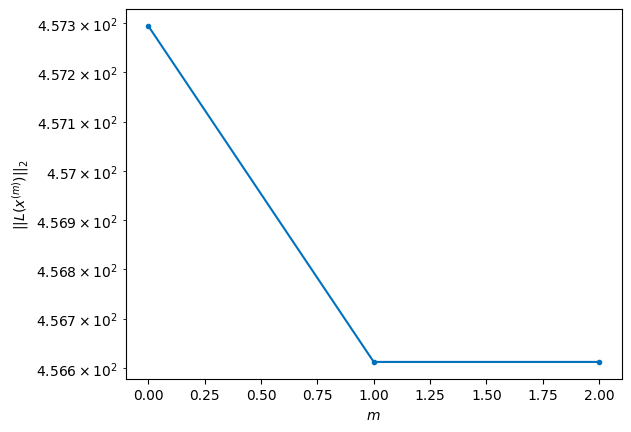

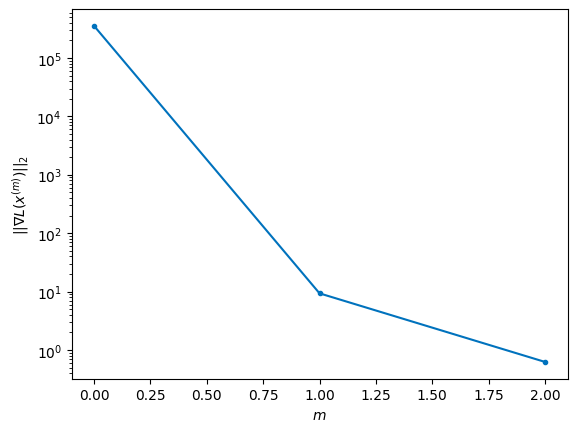


Windows:  93%|█████████▎| 274/296 [56:21<03:53, 10.59s/it]

Before applying the algorithm
Cost function: 457.6092017507514
Gradient norm: 101988.73915311658
Global relative error: 1898077695.5764108
Position relative errors: 0.01723616657379176 m, 0.7233209250886393 m, 0.7124207513268397 m, 0.5204461772939413 m

Iteration 1
Cost function: 456.91590752849 (-0.15%)
Gradient norm: 10.145734928597724 (-99.99%)
Global relative error: 1.3756837418328507 (20.57%)
Position relative errors: 0.012560598934099661 m, 0.8500515347848872 m, 0.9797865667574958 m, 0.4580111202203266 m

Iteration 2
Cost function: 456.91590741590227 (-0.00%)
Gradient norm: 2.8635846209489797 (-71.78%)
Global relative error: 1.375912580550499 (0.02%)
Position relative errors: 0.012560603518459923 m, 0.8502302017549669 m, 0.9798874784597567 m, 0.45815098062162296 m

Iteration 3
Cost function: 456.9159076992172 (0.00%)
Gradient norm: 7.048195805371644 (146.13%)
Global relative error: 1.3759125428557495 (-0.00%)
Position relative errors: 0.012560606747714281 m, 0.8502301744288951 m,

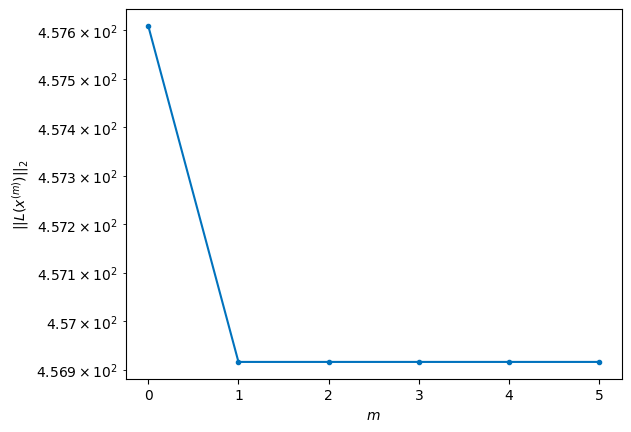

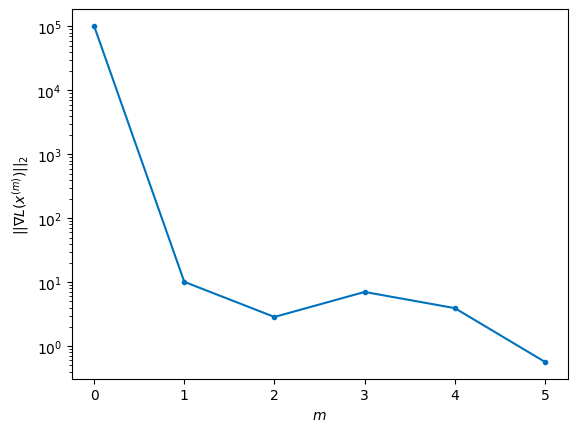


Windows:  93%|█████████▎| 275/296 [56:33<03:51, 11.01s/it]

Before applying the algorithm
Cost function: 458.22624310571035
Gradient norm: 170471.6700562447
Global relative error: 1897473649.228447
Position relative errors: 0.012115315624438568 m, 0.932030300273614 m, 0.9719539972122957 m, 0.5442727604838361 m

Iteration 1
Cost function: 457.71941134244355 (-0.11%)
Gradient norm: 6.640424706413407 (-100.00%)
Global relative error: 1.8428877829688246 (26.88%)
Position relative errors: 0.007770566014383493 m, 1.38239026893033 m, 0.9998623316962879 m, 0.6967383895978985 m

Iteration 2
Cost function: 457.7194111835111 (-0.00%)
Gradient norm: 1.3291651721102764 (-79.98%)
Global relative error: 1.8428848288992112 (-0.00%)
Position relative errors: 0.007770568724065184 m, 1.3824125104863503 m, 0.9998783083817515 m, 0.6966635150666739 m

STOP on Iteration 3
Cost function = 457.7194112465819 (0.00%)
Gradient norm = 0.4836570231363857 (-63.61%)
Global relative error = 1.842884858623005 (0.00%)
Final position relative errors: 0.007770567902835888 m, 1.382

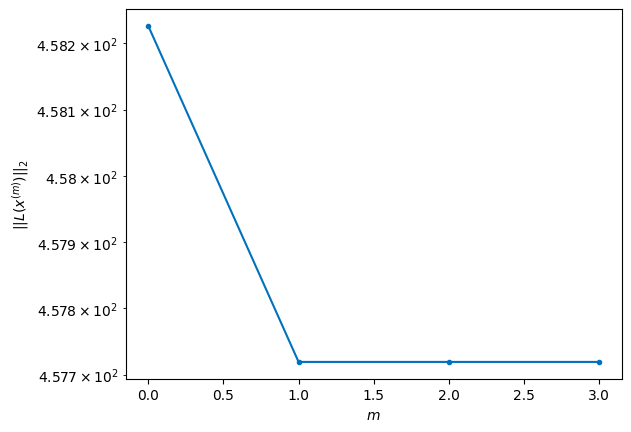

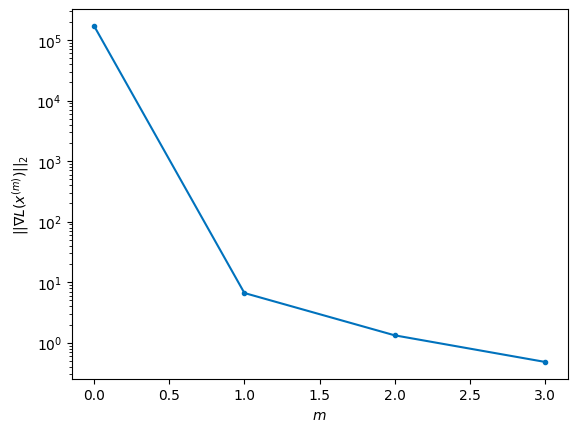


Windows:  93%|█████████▎| 276/296 [56:41<03:24, 10.23s/it]

Before applying the algorithm
Cost function: 462.3398126861733
Gradient norm: 123281.8283458592
Global relative error: 1896879081.120908
Position relative errors: 0.007939320736236433 m, 1.4639684589324722 m, 0.9769259773670181 m, 0.7516700230388321 m

Iteration 1
Cost function: 460.90101538699196 (-0.31%)
Gradient norm: 39.830143075278954 (-99.97%)
Global relative error: 1.684708160212123 (-11.97%)
Position relative errors: 0.009880838183706612 m, 0.8840606722400114 m, 1.4238019842349212 m, 0.1713565912575886 m

STOP on Iteration 2
Cost function = 460.901015450882 (0.00%)
Gradient norm = 0.7043884817458769 (-98.23%)
Global relative error = 1.6849460902839892 (0.01%)
Final position relative errors: 0.009880840388538875 m, 0.8843027773770132 m, 1.4239208999845747 m, 0.17145861242069316 m



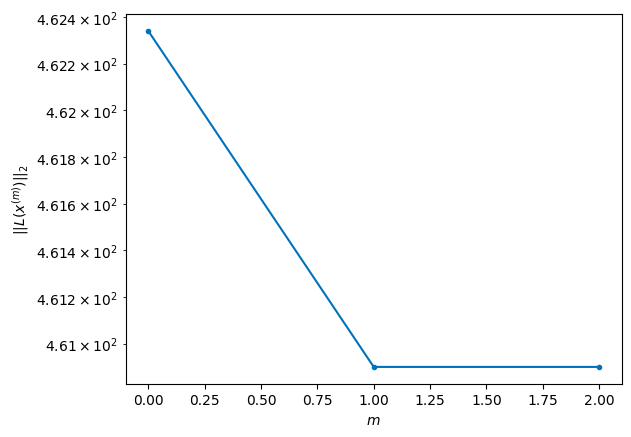

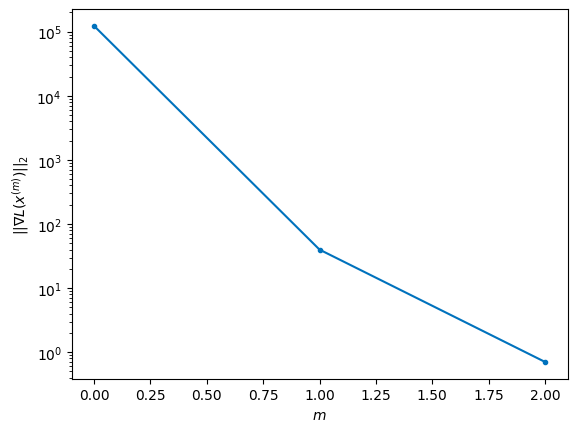


Windows:  94%|█████████▎| 277/296 [56:48<02:52,  9.06s/it]

Before applying the algorithm
Cost function: 456.71546335191596
Gradient norm: 29228.014559494455
Global relative error: 1896296253.1288428
Position relative errors: 0.010926233843384741 m, 0.9816929989278121 m, 1.3742193138785963 m, 0.2355366764143294 m

Iteration 1
Cost function: 456.4427534149601 (-0.06%)
Gradient norm: 4.285981049274038 (-99.99%)
Global relative error: 2.1375079136126724 (25.35%)
Position relative errors: 0.012744717502117699 m, 1.3568159510162476 m, 1.580398323326998 m, 0.4797546954734463 m

Iteration 2
Cost function: 456.4427532406168 (-0.00%)
Gradient norm: 3.1325265352417024 (-26.91%)
Global relative error: 2.1376082015562106 (0.00%)
Position relative errors: 0.012744723154551905 m, 1.3568975462716883 m, 1.5804481434705302 m, 0.4798066387817486 m

Iteration 3
Cost function: 456.4427534129032 (0.00%)
Gradient norm: 3.6570328451147573 (16.74%)
Global relative error: 2.1376081607566984 (-0.00%)
Position relative errors: 0.012744715644541386 m, 1.3568975008259312 m

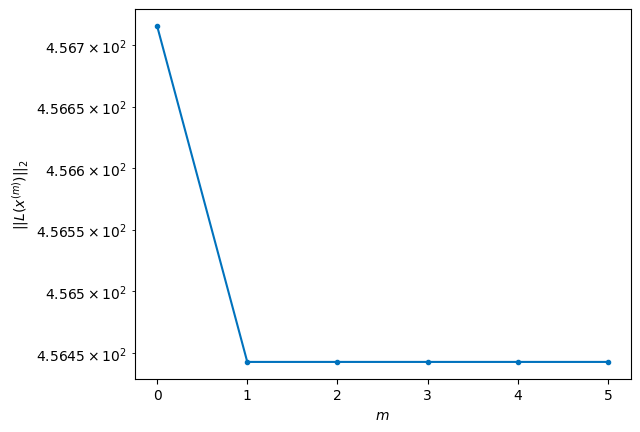

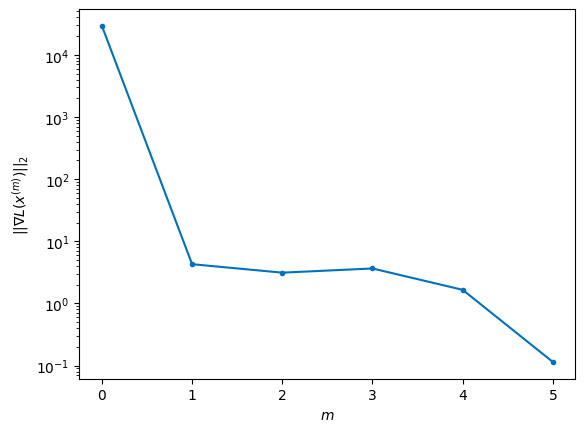


Windows:  94%|█████████▍| 278/296 [57:00<02:58,  9.93s/it]

Before applying the algorithm
Cost function: 457.4424079397039
Gradient norm: 148502.59855116188
Global relative error: 1895727377.6740205
Position relative errors: 0.013255406165746648 m, 1.4506398334890223 m, 1.5275758472747714 m, 0.5475447252293387 m

Iteration 1
Cost function: 457.06217610919686 (-0.08%)
Gradient norm: 22.797138081482014 (-99.98%)
Global relative error: 1.3627178504182882 (-37.39%)
Position relative errors: 0.019665730591033506 m, 0.6840988041973785 m, 1.1655830353313008 m, 0.17330679643618155 m

Iteration 2
Cost function: 457.0621763481542 (0.00%)
Gradient norm: 3.6548697110887325 (-83.97%)
Global relative error: 1.3627297207309055 (0.00%)
Position relative errors: 0.019665724064887296 m, 0.6840651768936797 m, 1.1656256586748173 m, 0.17324618833740413 m

Iteration 3
Cost function: 457.062176548977 (0.00%)
Gradient norm: 2.340033916809513 (-35.97%)
Global relative error: 1.362729756560995 (0.00%)
Position relative errors: 0.01966573117802545 m, 0.6840651780868853 m

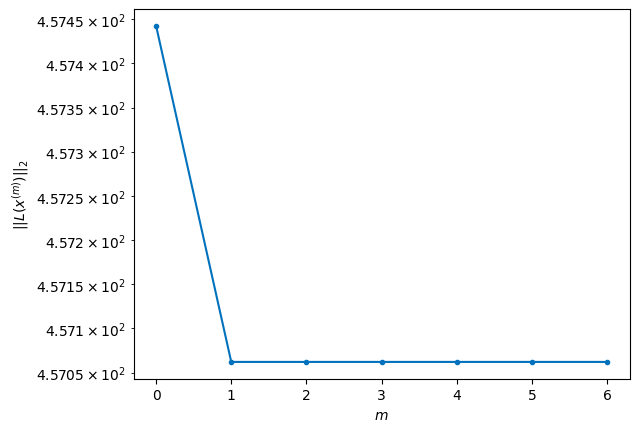

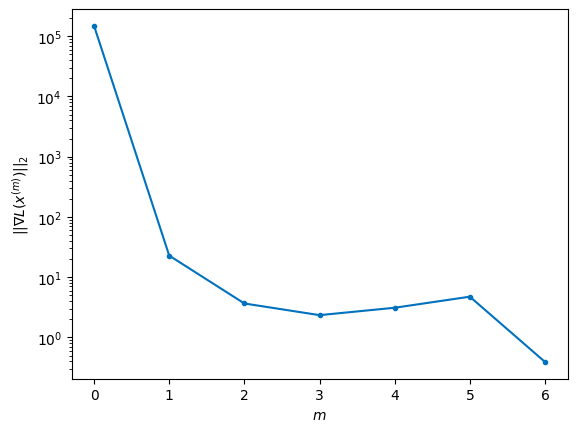


Windows:  94%|█████████▍| 279/296 [57:14<03:09, 11.15s/it]

Before applying the algorithm
Cost function: 459.39860327486656
Gradient norm: 213598.0069516719
Global relative error: 1895174659.2322905
Position relative errors: 0.0195222517295475 m, 0.7455030312493128 m, 1.0900483374292835 m, 0.19768855861491416 m

Iteration 1
Cost function: 459.1567144558677 (-0.05%)
Gradient norm: 2.792336413195386 (-100.00%)
Global relative error: 1.2608944341295265 (-5.58%)
Position relative errors: 0.01892763381083835 m, 0.7935669978396062 m, 0.9391836079678726 m, 0.2787084934462642 m

STOP on Iteration 2
Cost function = 459.156714263269 (-0.00%)
Gradient norm = 0.7933806793598014 (-71.59%)
Global relative error = 1.2609115645554956 (0.00%)
Final position relative errors: 0.018927632984652 m, 0.7935694145002553 m, 0.939202764607278 m, 0.278714558005155 m



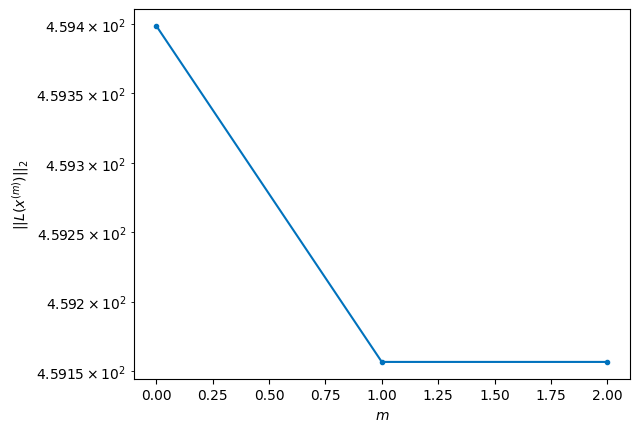

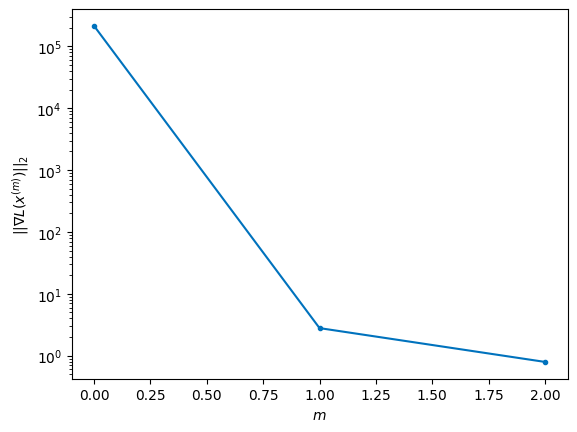


Windows:  95%|█████████▍| 280/296 [57:20<02:35,  9.73s/it]

Before applying the algorithm
Cost function: 459.4572891375061
Gradient norm: 86692.10372368169
Global relative error: 1894640244.17825
Position relative errors: 0.019413454950764474 m, 0.8426062724505529 m, 0.8405537450214522 m, 0.2872657658923016 m

Iteration 1
Cost function: 459.2443275963279 (-0.05%)
Gradient norm: 8.173999954539301 (-99.99%)
Global relative error: 0.9836618120257977 (-19.67%)
Position relative errors: 0.02063937043882823 m, 0.7989783054847314 m, 0.5325323191262493 m, 0.2126113138087934 m

Iteration 2
Cost function: 459.2443278516787 (0.00%)
Gradient norm: 4.063596447390099 (-50.29%)
Global relative error: 0.9837327458271653 (0.01%)
Position relative errors: 0.020639369996204967 m, 0.7990334016263018 m, 0.5325791064413445 m, 0.2126152573139996 m

STOP on Iteration 3
Cost function = 459.2443279676699 (0.00%)
Gradient norm = 0.2887707057266426 (-92.89%)
Global relative error = 0.9837327313769401 (-0.00%)
Final position relative errors: 0.020639361842529 m, 0.79903338

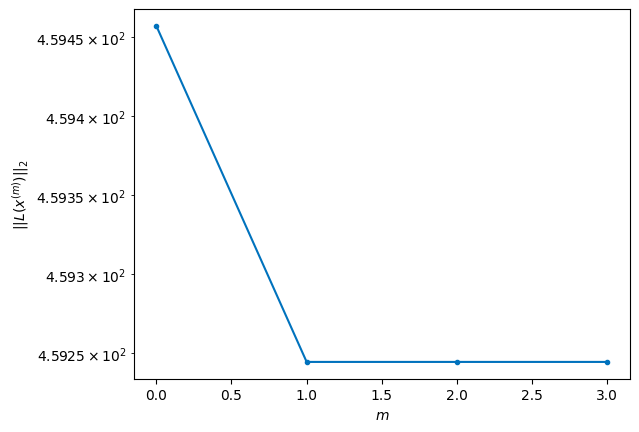

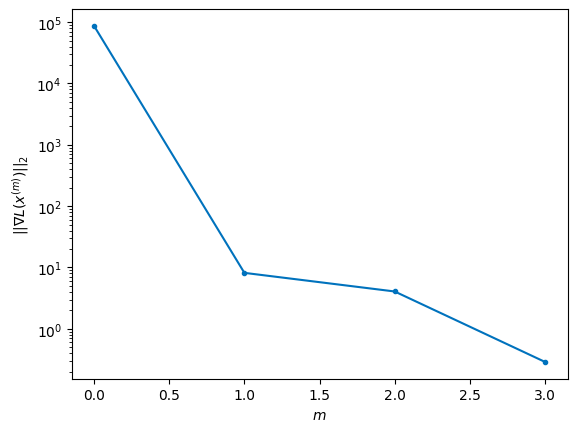


Windows:  95%|█████████▍| 281/296 [57:29<02:21,  9.41s/it]

Before applying the algorithm
Cost function: 462.3402424224718
Gradient norm: 376047.2514428128
Global relative error: 1894126246.1772664
Position relative errors: 0.020814629103969372 m, 0.8476145958148302 m, 0.45644630518213475 m, 0.20792323343338012 m

Iteration 1
Cost function: 461.21635518740095 (-0.24%)
Gradient norm: 34.2794357121732 (-99.99%)
Global relative error: 1.3078382025617439 (32.76%)
Position relative errors: 0.014698248885469629 m, 0.34233444213993763 m, 0.8620171200306045 m, 0.9219294422926103 m

Iteration 2
Cost function: 461.21635477160004 (-0.00%)
Gradient norm: 2.272133967771076 (-93.37%)
Global relative error: 1.3078714340396245 (0.00%)
Position relative errors: 0.014698248705494833 m, 0.34242577859760237 m, 0.8621827722350943 m, 0.9217877519674668 m

STOP on Iteration 3
Cost function = 461.21635520117627 (0.00%)
Gradient norm = 0.7435377167184185 (-67.28%)
Global relative error = 1.3078714617330882 (0.00%)
Final position relative errors: 0.014698251239904989 m,

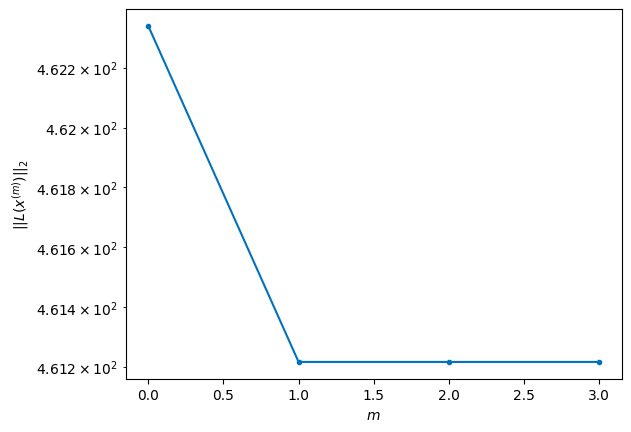

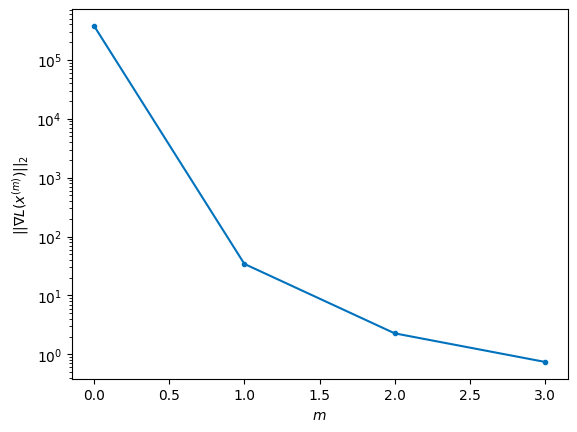


Windows:  95%|█████████▌| 282/296 [57:39<02:14,  9.64s/it]

Before applying the algorithm
Cost function: 461.07991480873517
Gradient norm: 41432.86276868318
Global relative error: 1893634716.3666894
Position relative errors: 0.015612571016007801 m, 0.40464866640837815 m, 0.7648728619820637 m, 0.8745871177554376 m

Iteration 1
Cost function: 460.94821754575 (-0.03%)
Gradient norm: 3.074801951238355 (-99.99%)
Global relative error: 1.2625914151071649 (2.62%)
Position relative errors: 0.01813427551405096 m, 0.1287311121640232 m, 0.5586934822511413 m, 1.1247634092132364 m

Iteration 2
Cost function: 460.9482184573913 (0.00%)
Gradient norm: 4.45113300313078 (44.76%)
Global relative error: 1.2625710116020843 (-0.00%)
Position relative errors: 0.018134280222032048 m, 0.12876512243918375 m, 0.5587232025227301 m, 1.1247218487110644 m

Iteration 3
Cost function: 460.94821767689814 (-0.00%)
Gradient norm: 5.284881546244643 (18.73%)
Global relative error: 1.2625710231032945 (0.00%)
Position relative errors: 0.01813427236647682 m, 0.12876511355687867 m, 0.5

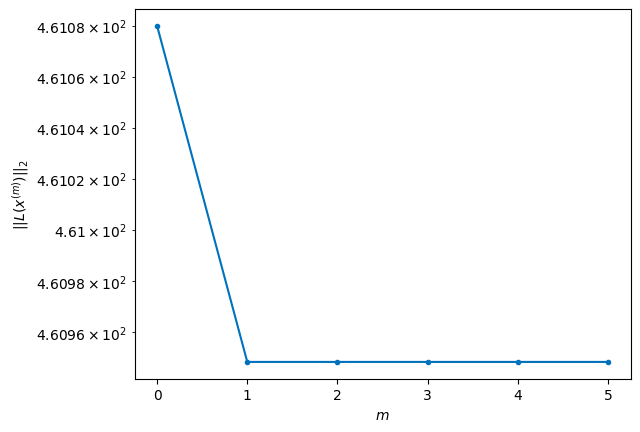

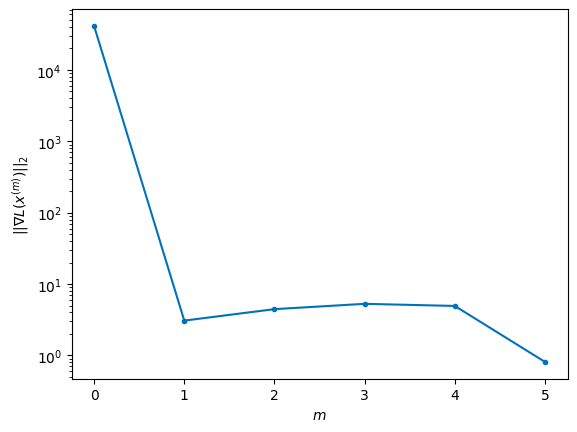


Windows:  96%|█████████▌| 283/296 [57:51<02:14, 10.33s/it]

Before applying the algorithm
Cost function: 464.91728095063587
Gradient norm: 28087.902021431404
Global relative error: 1893167662.1371226
Position relative errors: 0.01875852313179819 m, 0.17983966177564514 m, 0.46122278416077883 m, 1.0642368988038335 m

Iteration 1
Cost function: 464.73633413633587 (-0.04%)
Gradient norm: 6.197880853725072 (-99.98%)
Global relative error: 1.52460596013113 (29.88%)
Position relative errors: 0.015387846349988648 m, 0.2939584386679716 m, 0.4573373983582381 m, 1.4242935946393347 m

Iteration 2
Cost function: 464.7363340873923 (-0.00%)
Gradient norm: 3.67734666928373 (-40.67%)
Global relative error: 1.524527360058739 (-0.01%)
Position relative errors: 0.015387846301920072 m, 0.29386533703703155 m, 0.4573813934685323 m, 1.4242145435566198 m

Iteration 3
Cost function: 464.7363338995295 (-0.00%)
Gradient norm: 3.481427957468123 (-5.33%)
Global relative error: 1.5245273563835193 (-0.00%)
Position relative errors: 0.015387846157839306 m, 0.29386534931929875 

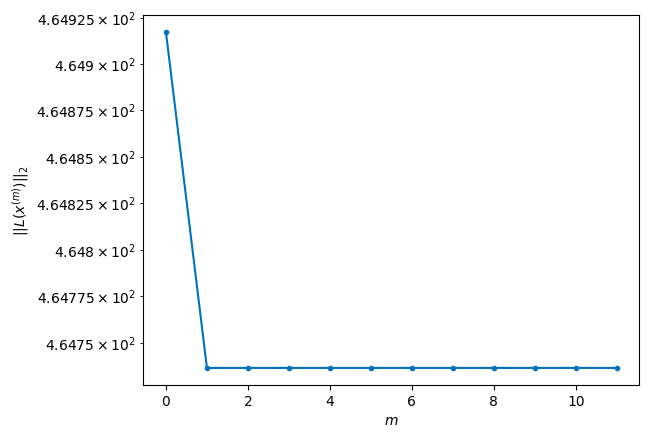

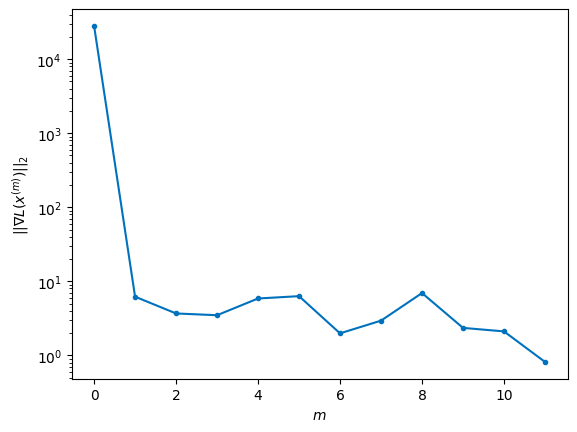


Windows:  96%|█████████▌| 284/296 [58:14<02:51, 14.30s/it]

Before applying the algorithm
Cost function: 464.9006215350066
Gradient norm: 200867.27946340933
Global relative error: 1892727023.8766036
Position relative errors: 0.016165587024209952 m, 0.22990407805649224 m, 0.37282877379031404 m, 1.3518250571077826 m

Iteration 1
Cost function: 464.4923734889885 (-0.09%)
Gradient norm: 5.775038859294321 (-100.00%)
Global relative error: 1.0564259716625402 (-25.66%)
Position relative errors: 0.016313475197486917 m, 0.24289418855713024 m, 0.5473320646467276 m, 0.8701691601977856 m

Iteration 2
Cost function: 464.4923736757909 (0.00%)
Gradient norm: 4.562874525682338 (-20.99%)
Global relative error: 1.056495003916207 (0.01%)
Position relative errors: 0.016313474676739322 m, 0.24270614180755457 m, 0.5472579038551372 m, 0.8703520661014942 m

Iteration 3
Cost function: 464.492373452322 (-0.00%)
Gradient norm: 2.051663553409832 (-55.04%)
Global relative error: 1.056495020720074 (0.00%)
Position relative errors: 0.016313475878253384 m, 0.24270613310439154

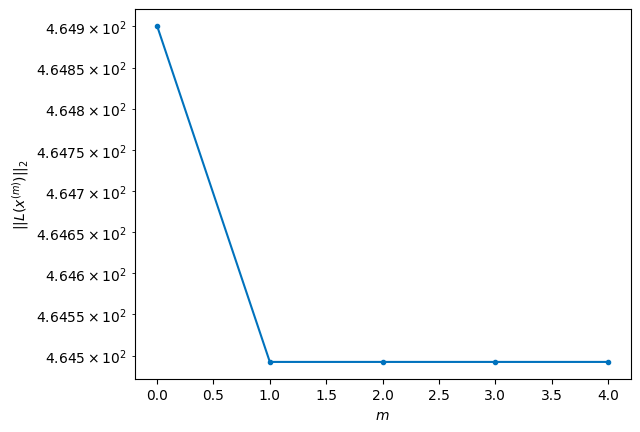

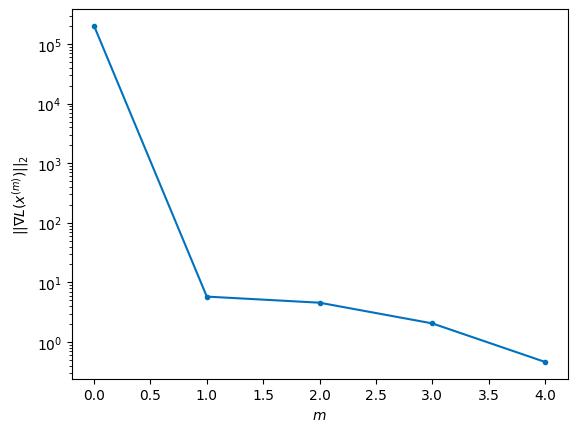


Windows:  96%|█████████▋| 285/296 [58:25<02:24, 13.11s/it]

Before applying the algorithm
Cost function: 469.24262200204487
Gradient norm: 264689.4181428155
Global relative error: 1892314665.7094724
Position relative errors: 0.017314910940519054 m, 0.3173635873474529 m, 0.4802253961684438 m, 0.7794804842829111 m

Iteration 1
Cost function: 468.67525147488516 (-0.12%)
Gradient norm: 10.531172396659738 (-100.00%)
Global relative error: 1.077866011778091 (11.22%)
Position relative errors: 0.0222743048948036 m, 0.704458623722733 m, 0.5849874504614067 m, 0.5681749318177741 m

Iteration 2
Cost function: 468.67525058813465 (-0.00%)
Gradient norm: 7.919192567900012 (-24.80%)
Global relative error: 1.0779961868271823 (0.01%)
Position relative errors: 0.02227430630799354 m, 0.7047733624534515 m, 0.5850763332847561 m, 0.567940009683599 m

Iteration 3
Cost function: 468.67525003916336 (-0.00%)
Gradient norm: 3.217921325443355 (-59.37%)
Global relative error: 1.0779961753363174 (-0.00%)
Position relative errors: 0.0222742999272042 m, 0.7047733467565153 m, 0

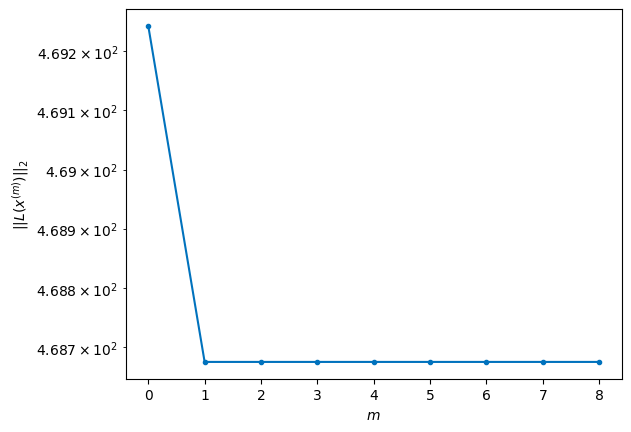

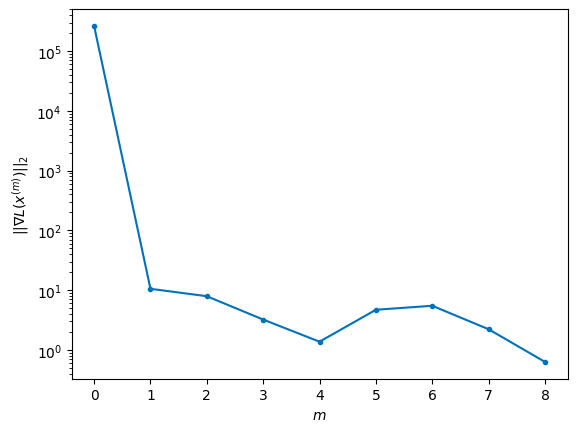


Windows:  97%|█████████▋| 286/296 [58:43<02:25, 14.53s/it]

Before applying the algorithm
Cost function: 467.5999815999545
Gradient norm: 27921.98970764133
Global relative error: 1891932389.41788
Position relative errors: 0.022766696004080655 m, 0.7644386715026888 m, 0.5152448640573027 m, 0.49189322456795287 m

Iteration 1
Cost function: 467.3440937425202 (-0.05%)
Gradient norm: 12.092571741866351 (-99.96%)
Global relative error: 1.3711236980848154 (31.19%)
Position relative errors: 0.023522808296922403 m, 1.1958427284899387 m, 0.6660529567466288 m, 0.07586122761847545 m

Iteration 2
Cost function: 467.3440938447899 (0.00%)
Gradient norm: 6.617663769498915 (-45.27%)
Global relative error: 1.370775502291617 (-0.03%)
Position relative errors: 0.02352280893645644 m, 1.1955104525033033 m, 0.6659487608667857 m, 0.07572045497505703 m

Iteration 3
Cost function: 467.34409358315094 (-0.00%)
Gradient norm: 6.786974671221716 (2.56%)
Global relative error: 1.370775504184861 (0.00%)
Position relative errors: 0.023522808730197034 m, 1.1955104614520284 m, 0.

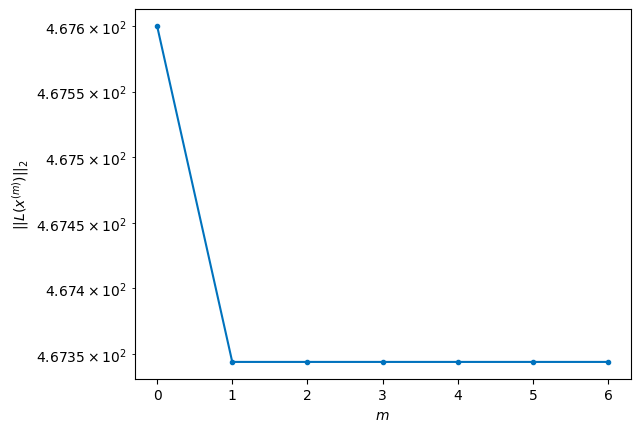

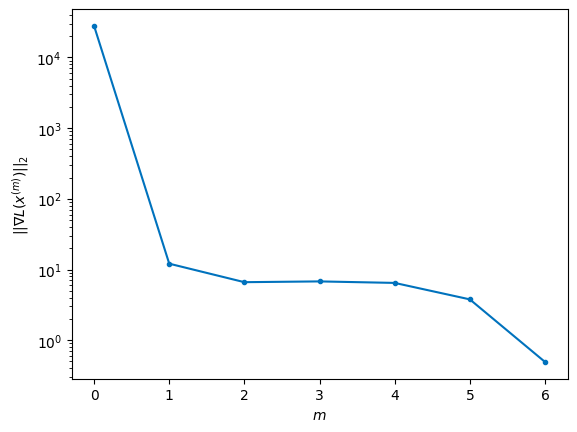


Windows:  97%|█████████▋| 287/296 [58:58<02:12, 14.68s/it]

Before applying the algorithm
Cost function: 468.3777574869045
Gradient norm: 299909.841508136
Global relative error: 1891581904.2346413
Position relative errors: 0.024005472444616215 m, 1.268118533998584 m, 0.6000655954042745 m, 0.1535878969018896 m

Iteration 1
Cost function: 467.44424084617145 (-0.20%)
Gradient norm: 26.24781958498765 (-99.99%)
Global relative error: 1.5592322877023217 (10.47%)
Position relative errors: 0.02722391748938979 m, 1.229621262504771 m, 0.31202807502498153 m, 0.9061611787135111 m

Iteration 2
Cost function: 467.4442402943626 (-0.00%)
Gradient norm: 6.387277375808315 (-75.67%)
Global relative error: 1.5590099405777311 (-0.01%)
Position relative errors: 0.02722391714176499 m, 1.229382564219402 m, 0.3120223044116961 m, 0.9061044704273554 m

Iteration 3
Cost function: 467.44424041439333 (0.00%)
Gradient norm: 1.4533745230932298 (-77.25%)
Global relative error: 1.5590099301140483 (-0.00%)
Position relative errors: 0.027223911710750885 m, 1.2293825687014828 m, 0

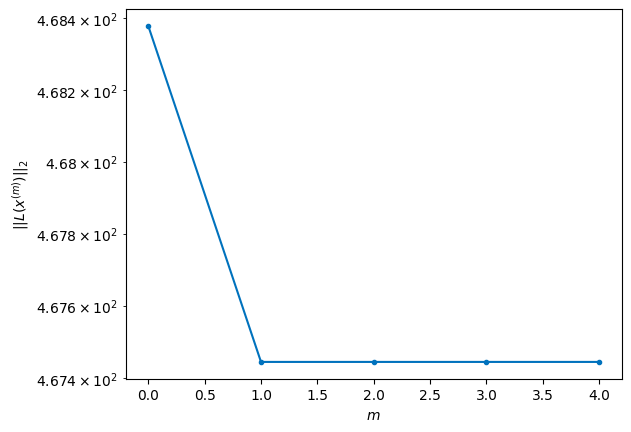

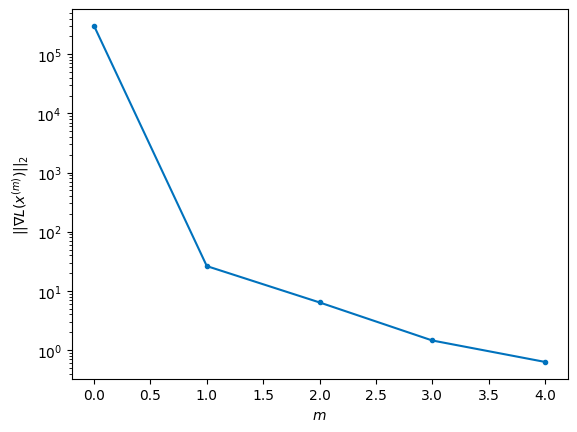


Windows:  97%|█████████▋| 288/296 [59:08<01:46, 13.35s/it]

Before applying the algorithm
Cost function: 468.74170223446055
Gradient norm: 98630.76388514398
Global relative error: 1891264838.099426
Position relative errors: 0.027515269214835755 m, 1.2986476038555494 m, 0.2262142330886597 m, 0.819655858470651 m

Iteration 1
Cost function: 468.4001582053735 (-0.07%)
Gradient norm: 6.796908359193101 (-99.99%)
Global relative error: 1.6301278685438354 (5.00%)
Position relative errors: 0.02696983924572275 m, 1.5733779821337073 m, 0.3341896083042867 m, 0.2634061908406697 m

STOP on Iteration 2
Cost function = 468.40015822205794 (0.00%)
Gradient norm = 0.29681715962655786 (-95.63%)
Global relative error = 1.63012349261088 (-0.00%)
Final position relative errors: 0.026969840286969252 m, 1.5733817405033883 m, 0.33418964798756695 m, 0.2633566054381852 m



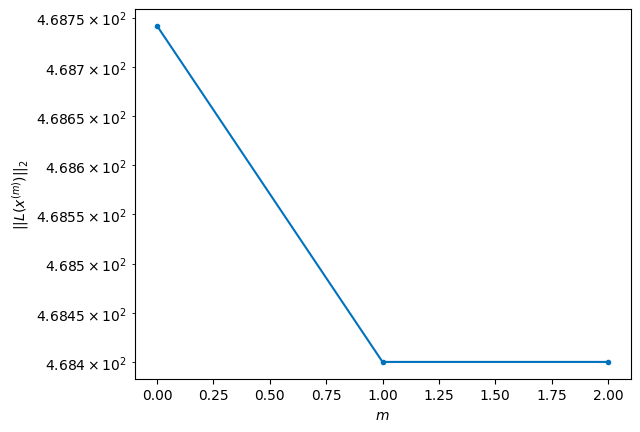

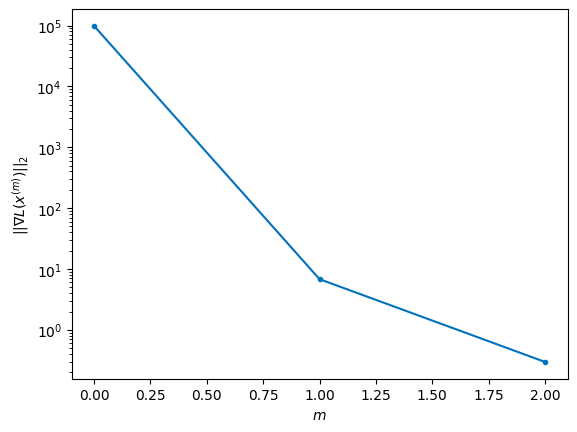


Windows:  98%|█████████▊| 289/296 [59:14<01:18, 11.28s/it]

Before applying the algorithm
Cost function: 470.5505527392325
Gradient norm: 282970.466736055
Global relative error: 1890982691.3484845
Position relative errors: 0.027965634609572642 m, 1.6359824115484567 m, 0.2484617328909137 m, 0.18064556416134492 m

Iteration 1
Cost function: 469.90164467899626 (-0.14%)
Gradient norm: 15.817180645823452 (-99.99%)
Global relative error: 1.6769534696853805 (0.73%)
Position relative errors: 0.026261461311156174 m, 1.36782104350873 m, 0.5219721209711466 m, 0.8173672140259362 m

STOP on Iteration 2
Cost function = 469.90164493217384 (0.00%)
Gradient norm = 0.4573002856404132 (-97.11%)
Global relative error = 1.6769662444589877 (0.00%)
Final position relative errors: 0.02626146206243271 m, 1.3678286080590198 m, 0.521908763635672 m, 0.8174212205873185 m



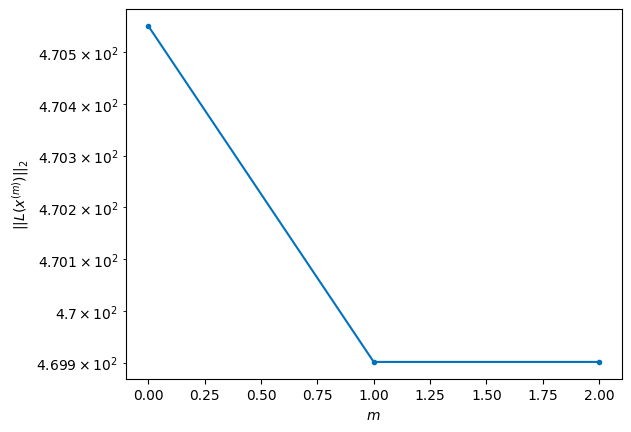

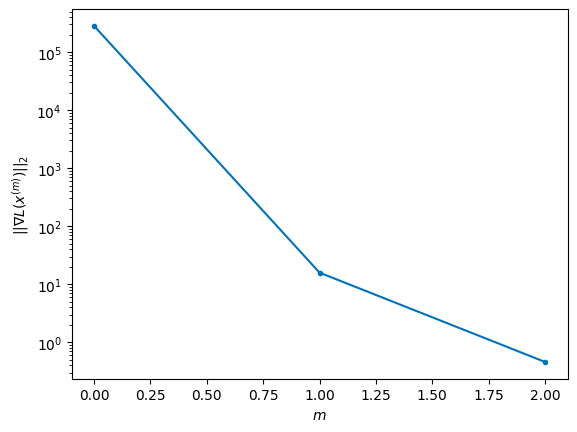


Windows:  98%|█████████▊| 290/296 [59:21<00:58,  9.80s/it]

Before applying the algorithm
Cost function: 473.614211420292
Gradient norm: 196293.78250369435
Global relative error: 1890736884.831745
Position relative errors: 0.027064552017247626 m, 1.419140290558397 m, 0.4158923298207505 m, 0.7651617341022907 m

Iteration 1
Cost function: 472.7316862468938 (-0.19%)
Gradient norm: 16.806415438169097 (-99.99%)
Global relative error: 1.0973810830316781 (-34.10%)
Position relative errors: 0.023313968292016245 m, 1.0392119745485002 m, 0.18255077554626564 m, 0.3006853973099215 m

STOP on Iteration 2
Cost function = 472.7316862651866 (0.00%)
Gradient norm = 0.3874874206090692 (-97.69%)
Global relative error = 1.0969841047482054 (-0.04%)
Final position relative errors: 0.023313968539152678 m, 1.0388357784832452 m, 0.18248683588909823 m, 0.30057559242770304 m



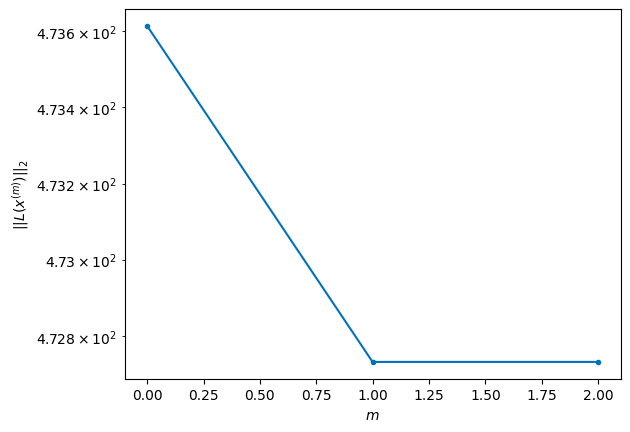

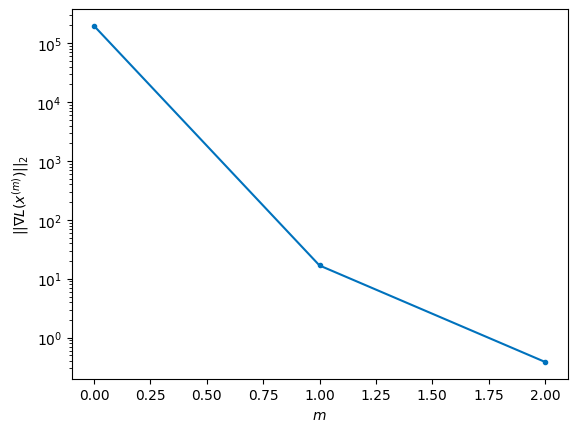


Windows:  98%|█████████▊| 291/296 [59:28<00:44,  8.93s/it]

Before applying the algorithm
Cost function: 474.56522992621365
Gradient norm: 183034.42482883477
Global relative error: 1890528700.848585
Position relative errors: 0.02344119749972201 m, 1.070002223576434 m, 0.10456396487623468 m, 0.26730207216506685 m

Iteration 1
Cost function: 473.98134115177487 (-0.12%)
Gradient norm: 15.371950606562821 (-99.99%)
Global relative error: 1.126551674175227 (1.67%)
Position relative errors: 0.02802501613166005 m, 1.0780043371611034 m, 0.22494088117376934 m, 0.23587281990449593 m

Iteration 2
Cost function: 473.98134204486996 (0.00%)
Gradient norm: 4.358775081863205 (-71.64%)
Global relative error: 1.1265603925268475 (0.00%)
Position relative errors: 0.02802501036844635 m, 1.0780124659139332 m, 0.22492594436293883 m, 0.23589155282403934 m

Iteration 3
Cost function: 473.98134109231484 (-0.00%)
Gradient norm: 5.84762510443195 (34.16%)
Global relative error: 1.126560409953154 (0.00%)
Position relative errors: 0.028025020022037186 m, 1.0780124922615997 m,

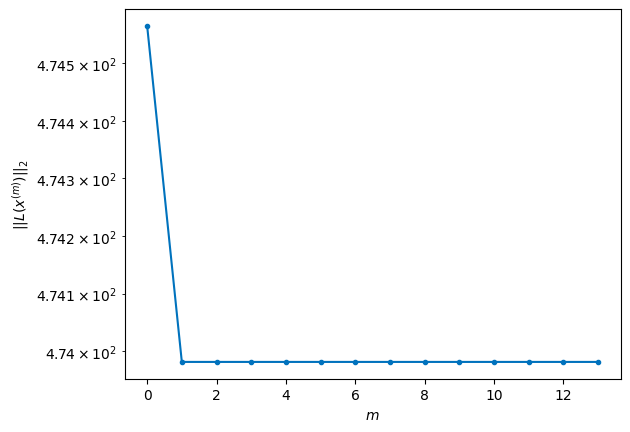

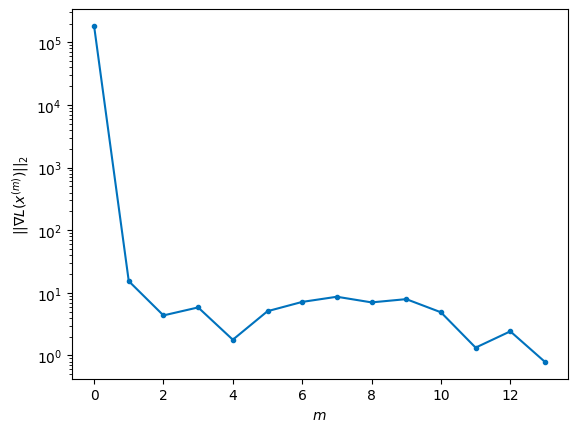


Windows:  99%|█████████▊| 292/296 [59:55<00:57, 14.48s/it]

Before applying the algorithm
Cost function: 470.56544217609746
Gradient norm: 92348.61425857767
Global relative error: 1890359293.6652908
Position relative errors: 0.027451784562967246 m, 1.110531803601094 m, 0.1292368058943578 m, 0.15224394211653866 m

Iteration 1
Cost function: 470.0665353580246 (-0.11%)
Gradient norm: 13.075670811314767 (-99.99%)
Global relative error: 1.6331219658646594 (44.69%)
Position relative errors: 0.028822385966998133 m, 1.392714392259538 m, 0.6890497035436404 m, 0.5018072466063542 m

Iteration 2
Cost function: 470.06653508554405 (-0.00%)
Gradient norm: 3.878490200401874 (-70.34%)
Global relative error: 1.6331350200915529 (0.00%)
Position relative errors: 0.02882238786547714 m, 1.3927082928496488 m, 0.6890174719623409 m, 0.5019109061641125 m

Iteration 3
Cost function: 470.0665350107259 (-0.00%)
Gradient norm: 6.644273762098118 (71.31%)
Global relative error: 1.6331350221707992 (0.00%)
Position relative errors: 0.02882238359239873 m, 1.3927083038640138 m, 0

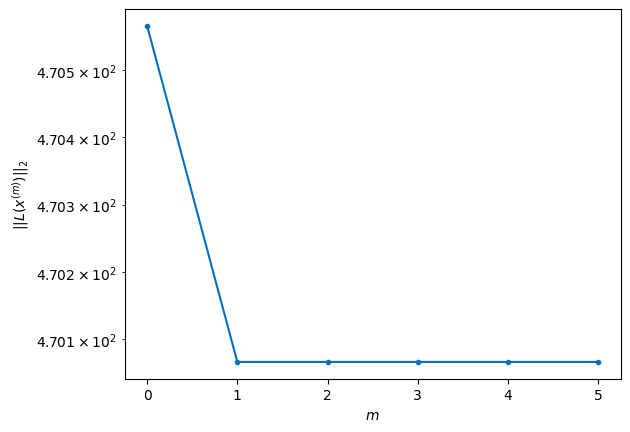

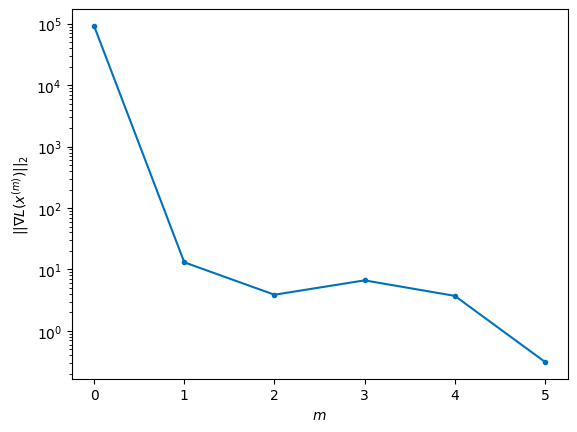


Windows:  99%|█████████▉| 293/296 [1:00:07<00:41, 13.74s/it]

Before applying the algorithm
Cost function: 471.5493863867126
Gradient norm: 124413.82933069313
Global relative error: 1890229683.0259867
Position relative errors: 0.02830485556343168 m, 1.4105444981922772 m, 0.603226661771065 m, 0.5610793593627882 m

Iteration 1
Cost function: 471.2215308778742 (-0.07%)
Gradient norm: 7.578653298381787 (-99.99%)
Global relative error: 1.458159493002917 (-10.75%)
Position relative errors: 0.03321547856630443 m, 1.3688299704164841 m, 0.27216313211393406 m, 0.42113202472356687 m

Iteration 2
Cost function: 471.2215309579094 (0.00%)
Gradient norm: 1.8626409857815824 (-75.42%)
Global relative error: 1.4581173889328358 (-0.00%)
Position relative errors: 0.03321547818423442 m, 1.368796135945261 m, 0.27214848699464467 m, 0.4211056786805903 m

Iteration 3
Cost function: 471.22153092183544 (-0.00%)
Gradient norm: 1.094852814643329 (-41.22%)
Global relative error: 1.4581173820882607 (-0.00%)
Position relative errors: 0.03321547877041189 m, 1.3687961172476808 m,

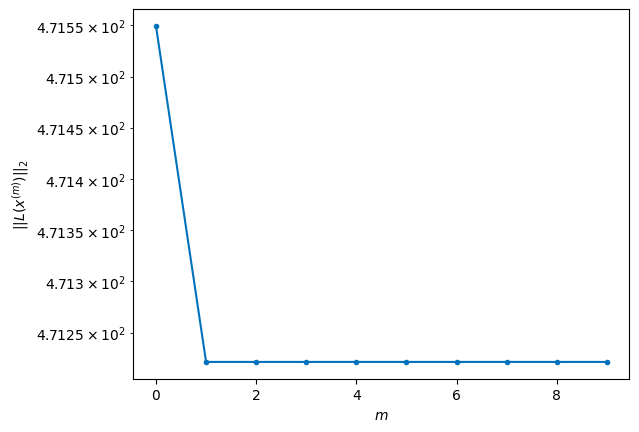

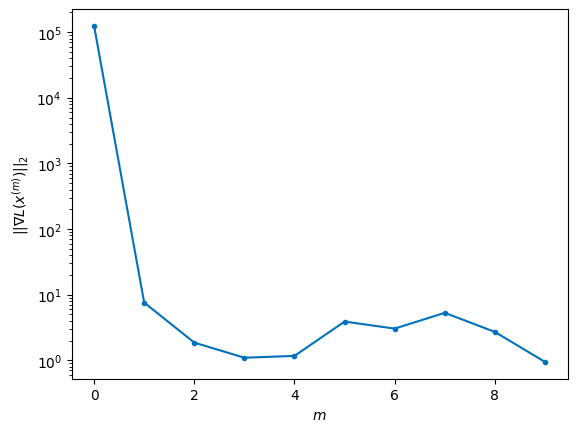


Windows:  99%|█████████▉| 294/296 [1:00:28<00:31, 15.98s/it]

Before applying the algorithm
Cost function: 471.84822207642713
Gradient norm: 242698.5093304869
Global relative error: 1890140750.5472355
Position relative errors: 0.03255894443322743 m, 1.3894477414779824 m, 0.17010613662737842 m, 0.51118256938589 m

Iteration 1
Cost function: 471.01143242250123 (-0.18%)
Gradient norm: 25.20329597397285 (-99.99%)
Global relative error: 0.7237253141253254 (-51.45%)
Position relative errors: 0.03617668023823577 m, 0.6815195243109153 m, 0.07733507347955139 m, 0.22807268130190442 m

STOP on Iteration 2
Cost function = 471.0114327861969 (0.00%)
Gradient norm = 0.48412151077698173 (-98.08%)
Global relative error = 0.7233717308688958 (-0.05%)
Final position relative errors: 0.0361766749836416 m, 0.6810847741171581 m, 0.07743444631097426 m, 0.22821588790264852 m



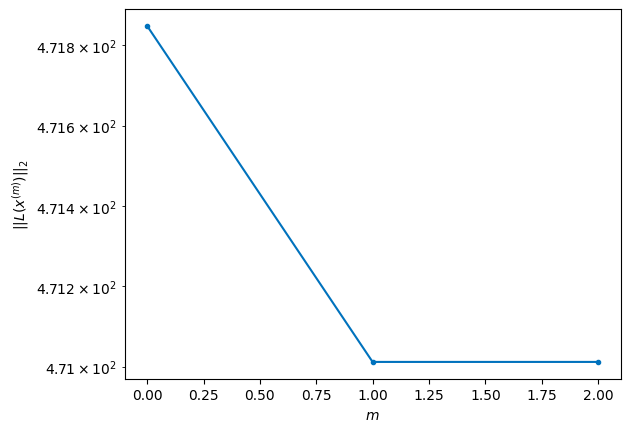

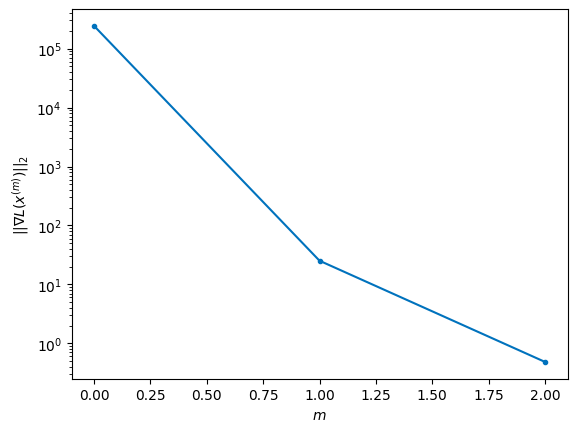


Windows: 100%|█████████▉| 295/296 [1:00:35<00:13, 13.23s/it]

Before applying the algorithm
Cost function: 470.694514586414
Gradient norm: 376694.9953080159
Global relative error: 1890093213.5284934
Position relative errors: 0.03497472221603831 m, 0.6648098670693525 m, 0.1527614490485515 m, 0.20255173315862443 m

Iteration 1
Cost function: 470.19664322011664 (-0.11%)
Gradient norm: 16.87013170096465 (-100.00%)
Global relative error: 0.39934170510885114 (-43.95%)
Position relative errors: 0.026878964044212295 m, 0.10169373798142772 m, 0.26104033983681474 m, 0.2833079860368828 m

STOP on Iteration 2
Cost function = 470.19664308146844 (-0.00%)
Gradient norm = 0.7794302391227583 (-95.38%)
Global relative error = 0.39930959665808247 (-0.01%)
Final position relative errors: 0.02687896445775827 m, 0.10169259651228203 m, 0.26104956489155867 m, 0.28325463330935885 m



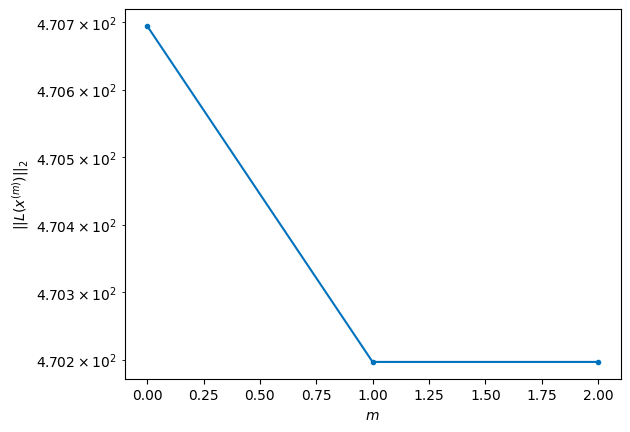

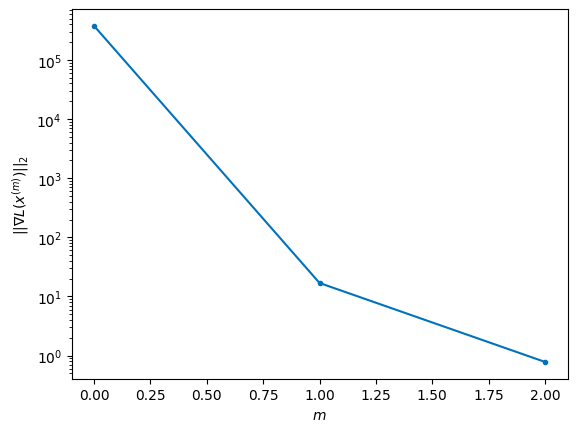


MC run: 100%|██████████| 1/1 [1:00:41<00:00, 3641.79s/it]   

This MC run RMSE for the first 296 iterations:
RMSE_run1_1 = 0.025002021422440093
RMSE_run1_2 = 1.1011071628032731
RMSE_run1_3 = 0.7886357210965661
RMSE_run1_4 = 1.5198072499566764

Average RMSE for the first 296 iterations for 1 (100.0 %) valid Monte Carlo runs:
RMSE_1 = 0.025002021422440093
RMSE_2 = 1.1011071628032731
RMSE_3 = 0.7886357210965661
RMSE_4 = 1.5198072499566764
The first round of NKKT converged with 9.0 iterations on average.
The next 295 rounds of NKKT converged with 4.935593220338983 iterations on average.
(3, 1, 296)


In [24]:
rmse_1 = []
rmse_2 = []
rmse_3 = []
rmse_4 = []
NKKT_first_round_stop_iteration = []
NKKT_K_minus_W_next_rounds_stop_iteration = []
for m in tqdm(range(M), desc="MC run", leave=True):
    print(f"------------------------------------ Monte Carlo run #{m + 1} ------------------------------------")
    Y = np.zeros((9, 1, T))
    for t in range(T):
        Y[:, :, t] = h(X_true[:, :, t]) + np.random.normal(0, np.sqrt(np.diag(R)).reshape((9, 1)), size=(9, 1))

    # Before applying the Newton algorithm for the first time, initialize the initial conditions guess randomly (cold-start) 
    x_init = np.zeros((4 * n_x, 1))
    x_init[:4*n_x, :] = X_est[:, :, 0]
    
    # Apply the algorithm
    p_1_est = np.zeros((n_p, 1, K - W + 1))
    p_2_est = np.zeros((n_p, 1, K - W + 1))
    p_3_est = np.zeros((n_p, 1, K - W + 1))
    p_4_est = np.zeros((n_p, 1, K - W + 1))
    X_est = np.zeros((4 * n_x, 1, K - W + 1))
    for n in tqdm(range(K - W + 1), desc="Windows", leave=False):
        nkkt = NKKT()
        x_est = nkkt.solve(x_init, Y[:, :, n:n + W], X_true[:, :, n])
        p_1_est[:, :, n] = P @ x_est[:n_x, :]
        p_2_est[:, :, n] = P @ x_est[n_x:2*n_x, :]
        p_3_est[:, :, n] = P @ x_est[2*n_x:3*n_x, :]
        p_4_est[:, :, n] = P @ x_est[3*n_x:, :]
        X_est[:, :, n] = x_est

        """
        if n == 10:
            for k in range(n, K - W + 1):
                x_1_k = x_est[:n_x, :]
                x_2_k = x_est[n_x:2*n_x, :]
                x_3_k = x_est[2*n_x:3*n_x, :]
                x_4_k = x_est[3*n_x:, :]
                p_1_est[:, :, k] = P @ x_1_k
                p_2_est[:, :, k] = P @ x_2_k
                p_3_est[:, :, k] = P @ x_3_k
                p_4_est[:, :, k] = P @ x_4_k
                x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
                x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
                x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
                x_4_k = SatelliteDynamics().x_new(dt, x_4_k)
            dev_chief = np.linalg.norm(p_1_est - X_true[:3, :, :K - W + 1], axis=0).reshape(-1, 1)
            dev_deputy1 = np.linalg.norm(p_2_est - X_true[6:9, :, :K - W + 1], axis=0).reshape(-1, 1)
            dev_deputy2 = np.linalg.norm(p_3_est - X_true[12:15, :, :K - W + 1], axis=0).reshape(-1, 1)
            dev_deputy3 = np.linalg.norm(p_4_est - X_true[18:21, :, :K - W + 1], axis=0).reshape(-1, 1)
            break
        """
        
        give_me_the_plots(nkkt.i, nkkt.L_norms, nkkt.grad_L_norms)

        if n == 0: # Check divergence in the beginning
            abs_error_init_1 = np.zeros(W)
            abs_error_init_2 = np.zeros(W)
            abs_error_init_3 = np.zeros(W)
            abs_error_init_4 = np.zeros(W)
            for k in range(W):
                x_1_k = x_est[:n_x, :]
                x_2_k = x_est[n_x:2*n_x, :]
                x_3_k = x_est[2*n_x:3*n_x, :]
                x_4_k = x_est[3*n_x:, :]
                abs_error_init_1[k] = np.linalg.norm(P @ x_1_k - P @ X_true[:n_x, :, k])
                abs_error_init_2[k] = np.linalg.norm(P @ x_2_k - P @ X_true[n_x:2*n_x, :, k])
                abs_error_init_3[k] = np.linalg.norm(P @ x_3_k - P @ X_true[2*n_x:3*n_x, :, k])
                abs_error_init_4[k] = np.linalg.norm(P @ x_4_k - P @ X_true[3*n_x:4*n_x, :, k])
                x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
                x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
                x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
                x_4_k = SatelliteDynamics().x_new(dt, x_4_k)
            rmse_init_1 = np.sqrt(np.mean(abs_error_init_1 ** 2))
            rmse_init_2 = np.sqrt(np.mean(abs_error_init_2 ** 2))
            rmse_init_3 = np.sqrt(np.mean(abs_error_init_3 ** 2))
            rmse_init_4 = np.sqrt(np.mean(abs_error_init_4 ** 2))
            print(rmse_init_1, rmse_init_2, rmse_init_3, rmse_init_4)
            if rmse_init_1 > 1e20 or rmse_init_2 > 1e20 or rmse_init_3 > 1e20 or rmse_init_4 > 1e20:
                print(f"This Monte Carlo run #{m + 1} diverged!")
                # Mimic the propagation for rmse computation below
                for k in range(K - W + 1):
                    x_1_k = x_est[:n_x, :]
                    x_2_k = x_est[n_x:2*n_x, :]
                    x_3_k = x_est[2*n_x:3*n_x, :]
                    x_4_k = x_est[3*n_x:, :]
                    p_1_est[:, :, k] = P @ x_1_k
                    p_2_est[:, :, k] = P @ x_2_k
                    p_3_est[:, :, k] = P @ x_3_k
                    p_4_est[:, :, k] = P @ x_4_k
                    x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
                    x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
                    x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
                    x_4_k = SatelliteDynamics().x_new(dt, x_4_k)
                break
            else:
                NKKT_first_round_stop_iteration.append(nkkt.i)
        else:
            NKKT_K_minus_W_next_rounds_stop_iteration.append(nkkt.i)

        # Get next new guess (warm-start)
        # The initial guess is the previous window estimate second timestamp value
        x_init[:n_x, :] = SatelliteDynamics().x_new(dt, x_est[:n_x, :])
        x_init[n_x:2*n_x, :] = SatelliteDynamics().x_new(dt, x_est[n_x:2*n_x, :])
        x_init[2*n_x:3*n_x, :] = SatelliteDynamics().x_new(dt, x_est[2*n_x:3*n_x, :])
        x_init[3*n_x:4*n_x, :] = SatelliteDynamics().x_new(dt, x_est[3*n_x:, :])

    # After each Monte Carlo Run compute the RMSE_m for each first K - W + 1 iterations
    abs_error_1 = np.zeros(K - W + 1)
    abs_error_2 = np.zeros(K - W + 1)
    abs_error_3 = np.zeros(K - W + 1)
    abs_error_4 = np.zeros(K - W + 1)
    for k in range(K - W + 1):
        abs_error_1[k] = np.linalg.norm(p_1_est[:, :, k] - P @ X_true[:n_x, :, k])
        abs_error_2[k] = np.linalg.norm(p_2_est[:, :, k] - P @ X_true[n_x:2*n_x, :, k])
        abs_error_3[k] = np.linalg.norm(p_3_est[:, :, k] - P @ X_true[2*n_x:3*n_x, :, k])
        abs_error_4[k] = np.linalg.norm(p_4_est[:, :, k] - P @ X_true[3*n_x:4*n_x, :, k])
    rmse_m_1 = np.sqrt(np.mean(abs_error_1 ** 2))
    rmse_m_2 = np.sqrt(np.mean(abs_error_2 ** 2))
    rmse_m_3 = np.sqrt(np.mean(abs_error_3 ** 2))
    rmse_m_4 = np.sqrt(np.mean(abs_error_4 ** 2))
    print(f'This MC run RMSE for the first {K - W + 1} iterations:')
    print(f'RMSE_run{m + 1}_1 = {rmse_m_1}')
    print(f'RMSE_run{m + 1}_2 = {rmse_m_2}')
    print(f'RMSE_run{m + 1}_3 = {rmse_m_3}')
    print(f'RMSE_run{m + 1}_4 = {rmse_m_4}\n')
    if rmse_m_1 > 1e20 or rmse_m_2 > 1e20 or rmse_m_3 > 1e20 or rmse_m_4 > 1e20:
        print(f"Discarding this Monte Carlo run #{m + 1} and going to Monte Carlo run #{m + 2}...\n")
    else:
        rmse_1.append(rmse_m_1)
        rmse_2.append(rmse_m_2)
        rmse_3.append(rmse_m_3)
        rmse_4.append(rmse_m_4)
        
print(f'Average RMSE for the first {K - W + 1} iterations for {len(rmse_1)} ({len(rmse_1) / M * 100} %) valid Monte Carlo runs:')
print(f'RMSE_1 = {np.mean(rmse_1)}')
print(f'RMSE_2 = {np.mean(rmse_2)}')
print(f'RMSE_3 = {np.mean(rmse_3)}')
print(f'RMSE_4 = {np.mean(rmse_4)}')
print(f'The first round of NKKT converged with {np.mean(NKKT_first_round_stop_iteration)} iterations on average.')
print(f'The next {K - W} rounds of NKKT converged with {np.mean(NKKT_K_minus_W_next_rounds_stop_iteration)} iterations on average.')
print(np.shape(p_1_est))

In [25]:
dev_chief = np.linalg.norm(p_1_est - X_true[:3, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy1 = np.linalg.norm(p_2_est - X_true[6:9, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy2 = np.linalg.norm(p_3_est - X_true[12:15, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy3 = np.linalg.norm(p_4_est - X_true[18:21, :, :K - W + 1], axis=0).reshape(-1, 1)

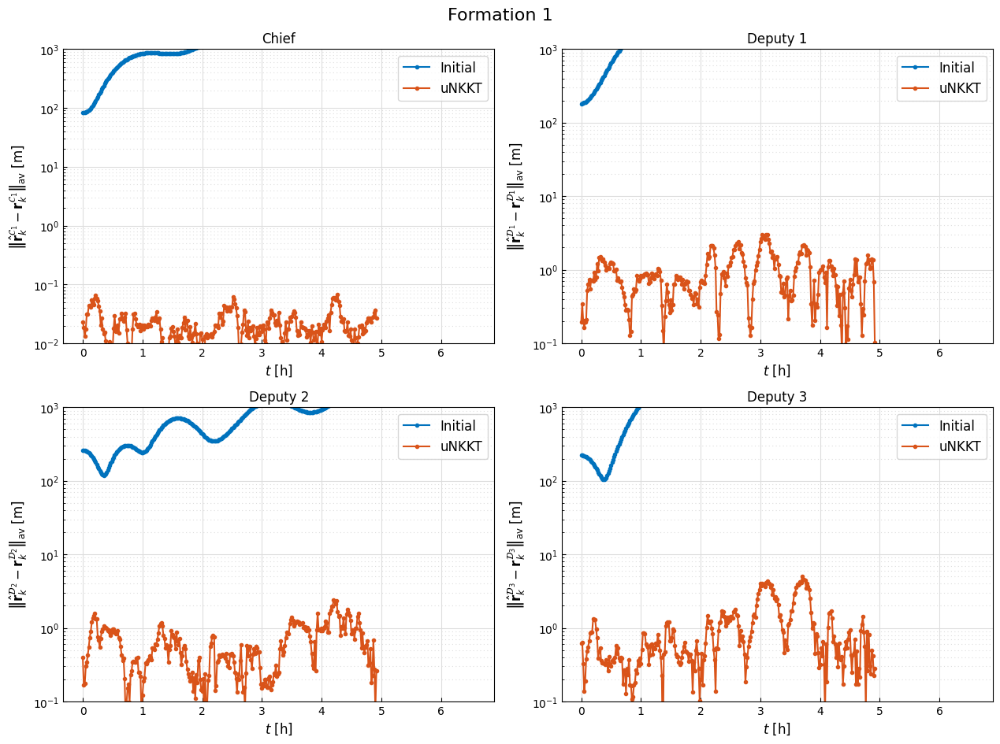

In [26]:
# MATLAB default color cycle
matlab_default_colors = [
    [0, 0.4470, 0.7410],  # blue
    [0.8500, 0.3250, 0.0980],  # orange
    [0.9290, 0.6940, 0.1250],  # yellow
    [0.4940, 0.1840, 0.5560],  # purple
    [0.4660, 0.6740, 0.1880],  # green
    [0.3010, 0.7450, 0.9330],  # light blue
    [0.6350, 0.0780, 0.1840],  # red
]
# Set the color cycle in Matplotlib to match MATLAB's default
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=matlab_default_colors)

time = np.arange(0, T) / dt
algorithm = "uNKKT"

# Plot positions based on screen size
fig_width = 2 * 6.4  # in inchesa
fig_height = 2 * 4.8  # in inches

# Create a 2 by 2 figure
fig, axs = plt.subplots(2, 2, figsize=(fig_width, fig_height))

# Plot 1: Chief
axs[0, 0].plot(time, dev_chief_initial, ".-", label="Initial")
axs[0, 0].plot(time[:K - W + 1], dev_chief, ".-", label=algorithm)
axs[0, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 0].grid(True, which="both")
axs[0, 0].set_yscale("log")
axs[0, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{C}_1} - \\mathbf{r}_k^{\\mathcal{C}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[0, 0].set_ylim([1e-2, 1e3])
axs[0, 0].tick_params(axis="both", which="both", direction="in")
axs[0, 0].legend(fontsize=12)
axs[0, 0].set_title("Chief")

# Plot 2: Deputy 1
axs[0, 1].plot(time, dev_deputy1_initial, ".-", label="Initial")
axs[0, 1].plot(time[:K - W + 1], dev_deputy1, ".-", label=algorithm)
axs[0, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 1].grid(True, which="both")
axs[0, 1].set_yscale("log")
axs[0, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_1} - \\mathbf{r}_k^{\\mathcal{D}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[0, 1].set_ylim([1e-1, 1e3])
axs[0, 1].tick_params(axis="both", which="both", direction="in")
axs[0, 1].legend(fontsize=12)
axs[0, 1].set_title("Deputy 1")

# Plot 3: Deputy 2
axs[1, 0].plot(time, dev_deputy2_initial, ".-", label="Initial")
axs[1, 0].plot(time[:K - W + 1], dev_deputy2, ".-", label=algorithm)
axs[1, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 0].grid(True, which="both")
axs[1, 0].set_yscale("log")
axs[1, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_2} - \\mathbf{r}_k^{\\mathcal{D}_2}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[1, 0].set_ylim([1e-1, 1e3])
axs[1, 0].tick_params(axis="both", which="both", direction="in")
axs[1, 0].legend(fontsize=12)
axs[1, 0].set_title("Deputy 2")

# Plot 4: Deputy 3
axs[1, 1].plot(time, dev_deputy3_initial, ".-", label="Initial")
axs[1, 1].plot(time[:K - W + 1], dev_deputy3, ".-", label=algorithm)
axs[1, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 1].grid(True, which="both")
axs[1, 1].set_yscale("log")
axs[1, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_3} - \\mathbf{r}_k^{\\mathcal{D}_3}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[1, 1].set_ylim([1e-1, 1e3])
axs[1, 1].tick_params(axis="both", which="both", direction="in")
axs[1, 1].legend(fontsize=12)
axs[1, 1].set_title("Deputy 3")

fig.suptitle(f"Formation {formation}", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()

In [29]:
import pickle
from datetime import datetime

# Fill the dictionary
data = {}
data["true"] = X_true
data[0] = X_est

# Save to pickle file
with open(
    f'newton_form{formation}_{datetime.now().strftime("%Y%m%d_%H%M%S")}.pkl',
    "wb",
) as file:
    pickle.dump(data, file)